In [1]:
import numpy as np
import matplotlib.pyplot as pl
import json
from sklearn.utils import class_weight
from keras import Sequential, activations, Input
from keras.models import Model
from keras.layers import BatchNormalization, Activation, SpatialDropout2D, GlobalAveragePooling2D
from keras.layers.core import Dense, Dropout, Flatten
from keras.layers.convolutional import Conv2D, MaxPooling2D, SeparableConv2D
from keras.layers.experimental.preprocessing import Rescaling

# Import project utils scripts
import os
import sys

src_path = os.path.abspath(os.path.join('../src/'))

if src_path not in sys.path:
    sys.path.append(src_path)

from statisticsUtils import (
    recall_precision_fscore_from_confusion_matrix
)

from labelsUtils import (
    Label,
)

from regionUtils import (
    vietnam_labels_coordinates,
)

from rasterUtils import (
    make_dataset_from_raster_files,
)

from convNetUtils import (
    cross_validation,
    spatial_cross_validation,
    plot_confusion_matrix,
)

/home/simon/miniconda3/envs/earthEngine/lib/python3.7/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [2]:
from enum import Enum

class Band(Enum):
    COASTAL_AEROSOL = 0
    BLUE = 1
    GREEN = 2
    RED = 3
    NIR = 4
    SWIR1 = 5
    SWIR2 = 6
    PANCHROMATIC = 7
    CIRRUS = 8
    TIRS1 = 9
    TIRS2 = 10

In [3]:
EPOCHS = 2000
NB_TESTS = 4
DATA_ROOT_PATH ='../data/'
LABELS_COORDINATES = vietnam_labels_coordinates()

In [4]:
labels = [
    Label.COFFEE,
    Label.NATIVEVEGE,
    Label.URBAN,
    Label.WATER,
    Label.PEPPER,
    Label.TEA,
]

In [5]:
NB_PIXEL_AROUND=4

dataset_args = dict(
    labels = labels,
    raster_paths = [DATA_ROOT_PATH + 'Vietnam_2017_january_march/merged.tif'],
    labels_coordinates_list = [LABELS_COORDINATES],
    nb_pixel_around = NB_PIXEL_AROUND
)

dataset = make_dataset_from_raster_files(**dataset_args)

In [6]:
BANDS = [
    Band.RED.value,
    Band.BLUE.value,
    Band.NIR.value,
    Band.SWIR1.value,
]

# 1x8 conv, 0.25 SpatialDropout, 1x16 conv, 1x32 conv, 1x64 conv s=(2, 2), 1x64 conv, 1x128 conv, GlobalAveragePooling

In [20]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=8, kernel_size=(2, 2), padding="same", activation="relu"),
    SpatialDropout2D(0.25),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), strides=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=128, kernel_size=(2, 2), padding="same", activation="relu"),
    GlobalAveragePooling2D(),
    Flatten(name='flat'),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS, early_stopping=True)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_3 (Rescaling)      (None, 9, 9, 4)           0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 9, 9, 4)           16        
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 9, 9, 8)           136       
_________________________________________________________________
spatial_dropout2d_3 (Spatial (None, 9, 9, 8)           0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 9, 9, 16)          528       
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 9, 9, 32)          2080      
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 5, 5, 64)         

Epoch 101/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8002 - accuracy: 0.5841 - val_loss: 1.0224 - val_accuracy: 0.5710
Epoch 102/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7630 - accuracy: 0.6184 - val_loss: 0.9596 - val_accuracy: 0.5995
Epoch 103/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8152 - accuracy: 0.5697 - val_loss: 0.9751 - val_accuracy: 0.5893
Epoch 104/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7945 - accuracy: 0.6001 - val_loss: 0.8652 - val_accuracy: 0.6509
Epoch 105/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8116 - accuracy: 0.5788 - val_loss: 0.9437 - val_accuracy: 0.6219
Epoch 106/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7969 - accuracy: 0.5726 - val_loss: 0.8864 - val_accuracy: 0.6504
Epoch 107/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8081 - accuracy: 0.6102 - val_loss: 0.9060 - val_ac

57/57 [==============================] - 1s 10ms/step - loss: 0.6965 - accuracy: 0.6464 - val_loss: 0.8694 - val_accuracy: 0.6595
Epoch 214/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6879 - accuracy: 0.6447 - val_loss: 0.8552 - val_accuracy: 0.6744
Epoch 215/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6770 - accuracy: 0.6580 - val_loss: 0.8386 - val_accuracy: 0.6644
Epoch 216/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6903 - accuracy: 0.6426 - val_loss: 0.8551 - val_accuracy: 0.6616
Epoch 217/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6452 - accuracy: 0.6680 - val_loss: 0.8400 - val_accuracy: 0.6760
Epoch 218/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6265 - accuracy: 0.6847 - val_loss: 0.8302 - val_accuracy: 0.6749
Epoch 219/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6492 - accuracy: 0.6523 - val_loss: 0.8929 - val_accuracy: 0.6477


57/57 [==============================] - 1s 10ms/step - loss: 0.5730 - accuracy: 0.6990 - val_loss: 0.8599 - val_accuracy: 0.6669
Epoch 326/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5858 - accuracy: 0.6983 - val_loss: 0.8961 - val_accuracy: 0.6534
Epoch 327/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5876 - accuracy: 0.6762 - val_loss: 0.7773 - val_accuracy: 0.7086
Epoch 328/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5433 - accuracy: 0.7043 - val_loss: 0.7848 - val_accuracy: 0.6975
Epoch 329/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5464 - accuracy: 0.7027 - val_loss: 0.8295 - val_accuracy: 0.6768
Epoch 330/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6117 - accuracy: 0.6888 - val_loss: 0.8067 - val_accuracy: 0.6900
Epoch 331/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5670 - accuracy: 0.7257 - val_loss: 0.7818 - val_accuracy: 0.7094


57/57 [==============================] - 1s 10ms/step - loss: 0.4772 - accuracy: 0.7398 - val_loss: 0.7971 - val_accuracy: 0.7185
Epoch 438/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4941 - accuracy: 0.7407 - val_loss: 0.8199 - val_accuracy: 0.6990
Epoch 439/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4888 - accuracy: 0.7479 - val_loss: 0.8365 - val_accuracy: 0.7022
Epoch 440/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4990 - accuracy: 0.7421 - val_loss: 0.7889 - val_accuracy: 0.7123
Epoch 441/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4368 - accuracy: 0.7638 - val_loss: 0.8698 - val_accuracy: 0.6815
Epoch 442/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4720 - accuracy: 0.7535 - val_loss: 0.9433 - val_accuracy: 0.6336
Epoch 443/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5138 - accuracy: 0.7239 - val_loss: 0.8427 - val_accuracy: 0.6823


57/57 [==============================] - 1s 11ms/step - loss: 0.4167 - accuracy: 0.7722 - val_loss: 0.8525 - val_accuracy: 0.6901
Epoch 550/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4073 - accuracy: 0.7754 - val_loss: 0.8194 - val_accuracy: 0.7079
Epoch 551/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3855 - accuracy: 0.7890 - val_loss: 0.9451 - val_accuracy: 0.6705
Epoch 552/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4100 - accuracy: 0.7641 - val_loss: 0.8626 - val_accuracy: 0.6967
Epoch 553/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4866 - accuracy: 0.7612 - val_loss: 0.8473 - val_accuracy: 0.6992
Epoch 554/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3995 - accuracy: 0.7803 - val_loss: 0.8102 - val_accuracy: 0.7264
Epoch 555/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3817 - accuracy: 0.8087 - val_loss: 0.8516 - val_accuracy: 0.7021


57/57 [==============================] - 1s 11ms/step - loss: 0.4325 - accuracy: 0.7726 - val_loss: 0.8494 - val_accuracy: 0.7117
Epoch 662/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3577 - accuracy: 0.8040 - val_loss: 0.8905 - val_accuracy: 0.7136
Epoch 663/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3795 - accuracy: 0.7960 - val_loss: 0.8974 - val_accuracy: 0.7033
Epoch 664/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3811 - accuracy: 0.8109 - val_loss: 0.8665 - val_accuracy: 0.7083
Epoch 665/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3698 - accuracy: 0.7825 - val_loss: 0.9025 - val_accuracy: 0.7044
Epoch 666/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4131 - accuracy: 0.7852 - val_loss: 0.9116 - val_accuracy: 0.6964
Epoch 667/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3907 - accuracy: 0.7881 - val_loss: 0.8366 - val_accuracy: 0.7138


57/57 [==============================] - 1s 11ms/step - loss: 0.3349 - accuracy: 0.8084 - val_loss: 0.8872 - val_accuracy: 0.7119
Epoch 774/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3502 - accuracy: 0.8299 - val_loss: 0.9086 - val_accuracy: 0.7068
Epoch 775/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3218 - accuracy: 0.8179 - val_loss: 0.9255 - val_accuracy: 0.6964
Epoch 776/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3614 - accuracy: 0.8128 - val_loss: 0.9271 - val_accuracy: 0.6972
Epoch 777/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3237 - accuracy: 0.8243 - val_loss: 0.9008 - val_accuracy: 0.7117
Epoch 778/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3331 - accuracy: 0.8342 - val_loss: 0.9045 - val_accuracy: 0.7007
Epoch 779/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3670 - accuracy: 0.8010 - val_loss: 0.8331 - val_accuracy: 0.7265


57/57 [==============================] - 1s 11ms/step - loss: 0.3229 - accuracy: 0.8236 - val_loss: 0.8972 - val_accuracy: 0.7307
Epoch 886/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3397 - accuracy: 0.8212 - val_loss: 0.9107 - val_accuracy: 0.7117
Epoch 887/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3044 - accuracy: 0.8232 - val_loss: 0.8624 - val_accuracy: 0.7265
Epoch 888/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3175 - accuracy: 0.8278 - val_loss: 0.8827 - val_accuracy: 0.7144
Epoch 889/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3567 - accuracy: 0.8435 - val_loss: 0.8765 - val_accuracy: 0.7268
Epoch 890/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3144 - accuracy: 0.8226 - val_loss: 0.9376 - val_accuracy: 0.7186
Epoch 891/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3335 - accuracy: 0.8457 - val_loss: 0.9355 - val_accuracy: 0.7033


Epoch 37/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0597 - accuracy: 0.5355 - val_loss: 1.0029 - val_accuracy: 0.6420
Epoch 38/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9593 - accuracy: 0.5809 - val_loss: 1.1060 - val_accuracy: 0.5880
Epoch 39/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0218 - accuracy: 0.5275 - val_loss: 1.0495 - val_accuracy: 0.6150
Epoch 40/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0758 - accuracy: 0.5270 - val_loss: 1.0188 - val_accuracy: 0.6324
Epoch 41/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0582 - accuracy: 0.5369 - val_loss: 0.9942 - val_accuracy: 0.6245
Epoch 42/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9502 - accuracy: 0.5642 - val_loss: 1.1012 - val_accuracy: 0.5579
Epoch 43/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0228 - accuracy: 0.5229 - val_loss: 1.0793 - val_accuracy:

Epoch 94/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8202 - accuracy: 0.5746 - val_loss: 0.9758 - val_accuracy: 0.6142
Epoch 95/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.9090 - accuracy: 0.5556 - val_loss: 0.8486 - val_accuracy: 0.6841
Epoch 96/2000
57/57 [==============================] - 1s 15ms/step - loss: 0.8713 - accuracy: 0.5819 - val_loss: 0.8120 - val_accuracy: 0.7082
Epoch 97/2000
57/57 [==============================] - 1s 18ms/step - loss: 0.9029 - accuracy: 0.6130 - val_loss: 0.9206 - val_accuracy: 0.6521
Epoch 98/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.9457 - accuracy: 0.5861 - val_loss: 0.8466 - val_accuracy: 0.6883
Epoch 99/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.8855 - accuracy: 0.5841 - val_loss: 0.8270 - val_accuracy: 0.6943
Epoch 100/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8468 - accuracy: 0.6174 - val_loss: 0.8943 - val_accuracy

57/57 [==============================] - 1s 11ms/step - loss: 0.7256 - accuracy: 0.6186 - val_loss: 0.8730 - val_accuracy: 0.6526
Epoch 207/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7058 - accuracy: 0.6454 - val_loss: 0.8538 - val_accuracy: 0.6673
Epoch 208/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.7443 - accuracy: 0.6308 - val_loss: 0.8446 - val_accuracy: 0.6706
Epoch 209/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7409 - accuracy: 0.6518 - val_loss: 0.8009 - val_accuracy: 0.6887
Epoch 210/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6701 - accuracy: 0.6518 - val_loss: 0.8557 - val_accuracy: 0.6687
Epoch 211/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7168 - accuracy: 0.6226 - val_loss: 0.8604 - val_accuracy: 0.6625
Epoch 212/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8002 - accuracy: 0.6101 - val_loss: 0.7868 - val_accuracy: 0.6944


57/57 [==============================] - 1s 11ms/step - loss: 0.5912 - accuracy: 0.6918 - val_loss: 0.7061 - val_accuracy: 0.7266
Epoch 319/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6715 - accuracy: 0.6737 - val_loss: 0.7738 - val_accuracy: 0.7066
Epoch 320/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6572 - accuracy: 0.6980 - val_loss: 0.7514 - val_accuracy: 0.7141
Epoch 321/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6495 - accuracy: 0.6817 - val_loss: 0.7969 - val_accuracy: 0.7005
Epoch 322/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6380 - accuracy: 0.6792 - val_loss: 0.7648 - val_accuracy: 0.7062
Epoch 323/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.5448 - accuracy: 0.7205 - val_loss: 0.7994 - val_accuracy: 0.6983
Epoch 324/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6239 - accuracy: 0.6847 - val_loss: 0.7631 - val_accuracy: 0.7076


57/57 [==============================] - 1s 11ms/step - loss: 0.5148 - accuracy: 0.7246 - val_loss: 0.7804 - val_accuracy: 0.7091
Epoch 431/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5742 - accuracy: 0.6992 - val_loss: 0.7489 - val_accuracy: 0.7110
Epoch 432/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5619 - accuracy: 0.7098 - val_loss: 0.7633 - val_accuracy: 0.7122
Epoch 433/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5361 - accuracy: 0.7324 - val_loss: 0.8278 - val_accuracy: 0.6804
Epoch 434/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5258 - accuracy: 0.7139 - val_loss: 0.9202 - val_accuracy: 0.6731
Epoch 435/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5577 - accuracy: 0.7247 - val_loss: 0.8137 - val_accuracy: 0.6970
Epoch 436/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5182 - accuracy: 0.7214 - val_loss: 0.7336 - val_accuracy: 0.7287


57/57 [==============================] - 1s 11ms/step - loss: 0.4385 - accuracy: 0.7499 - val_loss: 0.7677 - val_accuracy: 0.7287
Epoch 543/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5296 - accuracy: 0.7347 - val_loss: 0.7948 - val_accuracy: 0.7130
Epoch 544/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5317 - accuracy: 0.7387 - val_loss: 0.7934 - val_accuracy: 0.7169
Epoch 545/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4846 - accuracy: 0.7428 - val_loss: 0.7312 - val_accuracy: 0.7400
Epoch 546/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4075 - accuracy: 0.7825 - val_loss: 0.8980 - val_accuracy: 0.6864
Epoch 547/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4843 - accuracy: 0.7312 - val_loss: 0.7053 - val_accuracy: 0.7504
Epoch 548/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4292 - accuracy: 0.7683 - val_loss: 0.8471 - val_accuracy: 0.6959


57/57 [==============================] - 1s 11ms/step - loss: 0.4664 - accuracy: 0.7551 - val_loss: 0.7083 - val_accuracy: 0.7446
Epoch 655/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4087 - accuracy: 0.8023 - val_loss: 0.7433 - val_accuracy: 0.7434
Epoch 656/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3785 - accuracy: 0.7758 - val_loss: 0.7710 - val_accuracy: 0.7454
Epoch 657/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3750 - accuracy: 0.7955 - val_loss: 0.7830 - val_accuracy: 0.7308
Epoch 658/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3999 - accuracy: 0.7644 - val_loss: 0.7641 - val_accuracy: 0.7282
Epoch 659/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4455 - accuracy: 0.7825 - val_loss: 0.8429 - val_accuracy: 0.7009
Epoch 660/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4538 - accuracy: 0.7379 - val_loss: 0.7896 - val_accuracy: 0.7297


57/57 [==============================] - 1s 11ms/step - loss: 0.4098 - accuracy: 0.7752 - val_loss: 0.9422 - val_accuracy: 0.6868
Epoch 767/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4074 - accuracy: 0.8035 - val_loss: 0.8256 - val_accuracy: 0.7213
Epoch 768/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4134 - accuracy: 0.7829 - val_loss: 0.7543 - val_accuracy: 0.7365
Epoch 769/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3979 - accuracy: 0.7736 - val_loss: 0.7748 - val_accuracy: 0.7249
Epoch 770/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4156 - accuracy: 0.7715 - val_loss: 0.7698 - val_accuracy: 0.7305
Epoch 771/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3188 - accuracy: 0.8084 - val_loss: 0.8249 - val_accuracy: 0.7226
Epoch 772/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3787 - accuracy: 0.7870 - val_loss: 0.7861 - val_accuracy: 0.7435


Epoch 51/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9496 - accuracy: 0.5554 - val_loss: 1.0778 - val_accuracy: 0.5675
Epoch 52/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9914 - accuracy: 0.5678 - val_loss: 0.9051 - val_accuracy: 0.6891
Epoch 53/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.9256 - accuracy: 0.5949 - val_loss: 1.1333 - val_accuracy: 0.5537
Epoch 54/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9811 - accuracy: 0.5436 - val_loss: 1.0138 - val_accuracy: 0.6115
Epoch 55/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8969 - accuracy: 0.5647 - val_loss: 0.9052 - val_accuracy: 0.6648
Epoch 56/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9848 - accuracy: 0.5841 - val_loss: 1.0258 - val_accuracy: 0.6082
Epoch 57/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9576 - accuracy: 0.5659 - val_loss: 1.0845 - val_accuracy:

Epoch 108/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7812 - accuracy: 0.6472 - val_loss: 0.8083 - val_accuracy: 0.6905
Epoch 109/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8111 - accuracy: 0.6453 - val_loss: 0.8019 - val_accuracy: 0.6974
Epoch 110/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7442 - accuracy: 0.6456 - val_loss: 0.8534 - val_accuracy: 0.6704
Epoch 111/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8125 - accuracy: 0.6339 - val_loss: 0.9013 - val_accuracy: 0.6500
Epoch 112/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8051 - accuracy: 0.6177 - val_loss: 0.8769 - val_accuracy: 0.6620
Epoch 113/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8025 - accuracy: 0.5975 - val_loss: 0.8591 - val_accuracy: 0.6651
Epoch 114/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8015 - accuracy: 0.6316 - val_loss: 0.8664 - val_ac

57/57 [==============================] - 1s 13ms/step - loss: 0.6500 - accuracy: 0.7031 - val_loss: 0.8414 - val_accuracy: 0.6692
Epoch 221/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6089 - accuracy: 0.6889 - val_loss: 0.8147 - val_accuracy: 0.6864
Epoch 222/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5993 - accuracy: 0.6830 - val_loss: 0.8338 - val_accuracy: 0.6701
Epoch 223/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.6061 - accuracy: 0.6950 - val_loss: 0.8287 - val_accuracy: 0.6770
Epoch 224/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6265 - accuracy: 0.6924 - val_loss: 0.8068 - val_accuracy: 0.6948
Epoch 225/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.6562 - accuracy: 0.6733 - val_loss: 0.8409 - val_accuracy: 0.6754
Epoch 226/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5867 - accuracy: 0.7026 - val_loss: 0.8374 - val_accuracy: 0.6765


57/57 [==============================] - 1s 11ms/step - loss: 0.5297 - accuracy: 0.7427 - val_loss: 0.7880 - val_accuracy: 0.7067
Epoch 333/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5937 - accuracy: 0.7144 - val_loss: 0.8028 - val_accuracy: 0.6982
Epoch 334/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5268 - accuracy: 0.7108 - val_loss: 0.8758 - val_accuracy: 0.6858
Epoch 335/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5422 - accuracy: 0.7155 - val_loss: 0.8355 - val_accuracy: 0.6777
Epoch 336/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5358 - accuracy: 0.7221 - val_loss: 0.8277 - val_accuracy: 0.6857
Epoch 337/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6020 - accuracy: 0.7099 - val_loss: 0.7549 - val_accuracy: 0.7190
Epoch 338/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5910 - accuracy: 0.7152 - val_loss: 0.7377 - val_accuracy: 0.7267


57/57 [==============================] - 1s 11ms/step - loss: 0.4831 - accuracy: 0.7322 - val_loss: 0.7927 - val_accuracy: 0.7050
Epoch 445/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5004 - accuracy: 0.7617 - val_loss: 0.8993 - val_accuracy: 0.6747
Epoch 446/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4705 - accuracy: 0.7488 - val_loss: 0.7538 - val_accuracy: 0.7244
Epoch 447/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4684 - accuracy: 0.7682 - val_loss: 0.7679 - val_accuracy: 0.7160
Epoch 448/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5756 - accuracy: 0.7349 - val_loss: 0.7930 - val_accuracy: 0.7119
Epoch 449/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4552 - accuracy: 0.7693 - val_loss: 0.8597 - val_accuracy: 0.6848
Epoch 450/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4991 - accuracy: 0.7522 - val_loss: 0.8225 - val_accuracy: 0.6968


57/57 [==============================] - 1s 11ms/step - loss: 0.4230 - accuracy: 0.7929 - val_loss: 0.7578 - val_accuracy: 0.7462
Epoch 557/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4081 - accuracy: 0.7999 - val_loss: 0.8344 - val_accuracy: 0.7072
Epoch 558/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3828 - accuracy: 0.8174 - val_loss: 0.8675 - val_accuracy: 0.6924
Epoch 559/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4104 - accuracy: 0.7811 - val_loss: 0.7519 - val_accuracy: 0.7366
Epoch 560/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3849 - accuracy: 0.8027 - val_loss: 0.7568 - val_accuracy: 0.7355
Epoch 561/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4364 - accuracy: 0.7794 - val_loss: 0.8099 - val_accuracy: 0.7152
Epoch 562/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4390 - accuracy: 0.7708 - val_loss: 0.7833 - val_accuracy: 0.7245


57/57 [==============================] - 1s 11ms/step - loss: 0.3509 - accuracy: 0.8417 - val_loss: 0.9547 - val_accuracy: 0.6789
Epoch 669/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4483 - accuracy: 0.7734 - val_loss: 0.7949 - val_accuracy: 0.7329
Epoch 670/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4234 - accuracy: 0.8012 - val_loss: 0.8058 - val_accuracy: 0.7291
Epoch 671/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3807 - accuracy: 0.8103 - val_loss: 0.8224 - val_accuracy: 0.7262
Epoch 672/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3406 - accuracy: 0.8419 - val_loss: 0.8506 - val_accuracy: 0.7148
Epoch 673/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3289 - accuracy: 0.8274 - val_loss: 0.8282 - val_accuracy: 0.7350
Epoch 674/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3632 - accuracy: 0.8007 - val_loss: 0.8717 - val_accuracy: 0.7024


57/57 [==============================] - 1s 11ms/step - loss: 0.3625 - accuracy: 0.8198 - val_loss: 0.8803 - val_accuracy: 0.7126
Epoch 781/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3385 - accuracy: 0.8123 - val_loss: 0.8363 - val_accuracy: 0.7112
Epoch 782/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3599 - accuracy: 0.7847 - val_loss: 0.8667 - val_accuracy: 0.7217
Epoch 783/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3457 - accuracy: 0.8052 - val_loss: 0.8341 - val_accuracy: 0.7375
Epoch 784/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3834 - accuracy: 0.8134 - val_loss: 0.7697 - val_accuracy: 0.7416
Epoch 785/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3315 - accuracy: 0.8343 - val_loss: 0.8373 - val_accuracy: 0.7340
Epoch 786/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4040 - accuracy: 0.8075 - val_loss: 0.8886 - val_accuracy: 0.7055


57/57 [==============================] - 1s 12ms/step - loss: 0.4190 - accuracy: 0.8110 - val_loss: 0.8441 - val_accuracy: 0.7325
Epoch 893/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3798 - accuracy: 0.8176 - val_loss: 0.8041 - val_accuracy: 0.7437
Epoch 894/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2974 - accuracy: 0.8465 - val_loss: 0.8059 - val_accuracy: 0.7507
Epoch 895/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.3117 - accuracy: 0.8402 - val_loss: 0.9576 - val_accuracy: 0.6930
Epoch 896/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3271 - accuracy: 0.8468 - val_loss: 0.8368 - val_accuracy: 0.7555
Epoch 897/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3175 - accuracy: 0.8364 - val_loss: 0.8338 - val_accuracy: 0.7408
Epoch 898/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2694 - accuracy: 0.8542 - val_loss: 0.9727 - val_accuracy: 0.6968


57/57 [==============================] - 1s 14ms/step - loss: 0.3015 - accuracy: 0.8455 - val_loss: 1.0043 - val_accuracy: 0.6962
Epoch 1005/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.2862 - accuracy: 0.8371 - val_loss: 0.8649 - val_accuracy: 0.7297
Epoch 1006/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3386 - accuracy: 0.8294 - val_loss: 0.8710 - val_accuracy: 0.7517
Epoch 1007/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2775 - accuracy: 0.8512 - val_loss: 0.9645 - val_accuracy: 0.7077
Epoch 1008/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3177 - accuracy: 0.8264 - val_loss: 0.8767 - val_accuracy: 0.7230
Epoch 1009/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2913 - accuracy: 0.8476 - val_loss: 0.9058 - val_accuracy: 0.7245
Epoch 1010/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2940 - accuracy: 0.8508 - val_loss: 0.9084 - val_accuracy: 0

57/57 [==============================] - 1s 11ms/step - loss: 0.2796 - accuracy: 0.8446 - val_loss: 0.7747 - val_accuracy: 0.7628
Epoch 1117/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3208 - accuracy: 0.8647 - val_loss: 0.8505 - val_accuracy: 0.7348
Epoch 1118/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2569 - accuracy: 0.8676 - val_loss: 0.8971 - val_accuracy: 0.7238
Epoch 1119/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2867 - accuracy: 0.8413 - val_loss: 0.8723 - val_accuracy: 0.7418
Epoch 1120/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2776 - accuracy: 0.8573 - val_loss: 0.9561 - val_accuracy: 0.7050
Epoch 1121/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2969 - accuracy: 0.8663 - val_loss: 0.8583 - val_accuracy: 0.7405
Epoch 1122/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3377 - accuracy: 0.8472 - val_loss: 0.8808 - val_accuracy: 0

Epoch 45/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9638 - accuracy: 0.5719 - val_loss: 1.0113 - val_accuracy: 0.5979
Epoch 46/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9158 - accuracy: 0.5970 - val_loss: 1.0271 - val_accuracy: 0.6316
Epoch 47/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9295 - accuracy: 0.6238 - val_loss: 1.0254 - val_accuracy: 0.6074
Epoch 48/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8929 - accuracy: 0.6038 - val_loss: 1.0046 - val_accuracy: 0.6222
Epoch 49/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9639 - accuracy: 0.5975 - val_loss: 1.0658 - val_accuracy: 0.5999
Epoch 50/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9761 - accuracy: 0.5773 - val_loss: 0.9753 - val_accuracy: 0.6415
Epoch 51/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9147 - accuracy: 0.6076 - val_loss: 0.9993 - val_accuracy:

Epoch 102/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7864 - accuracy: 0.6314 - val_loss: 0.8679 - val_accuracy: 0.6803
Epoch 103/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7544 - accuracy: 0.6496 - val_loss: 0.9272 - val_accuracy: 0.6493
Epoch 104/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7969 - accuracy: 0.6373 - val_loss: 0.8506 - val_accuracy: 0.6886
Epoch 105/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8102 - accuracy: 0.6551 - val_loss: 0.9125 - val_accuracy: 0.6640
Epoch 106/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7594 - accuracy: 0.6618 - val_loss: 0.9311 - val_accuracy: 0.6461
Epoch 107/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7691 - accuracy: 0.6210 - val_loss: 0.8817 - val_accuracy: 0.6641
Epoch 108/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7401 - accuracy: 0.6642 - val_loss: 0.8902 - val_ac

57/57 [==============================] - 1s 10ms/step - loss: 0.5744 - accuracy: 0.6953 - val_loss: 0.8470 - val_accuracy: 0.6769
Epoch 215/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5984 - accuracy: 0.6908 - val_loss: 0.8048 - val_accuracy: 0.6886
Epoch 216/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6231 - accuracy: 0.6822 - val_loss: 0.8688 - val_accuracy: 0.6635
Epoch 217/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6370 - accuracy: 0.6803 - val_loss: 0.8055 - val_accuracy: 0.6934
Epoch 218/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5744 - accuracy: 0.6940 - val_loss: 0.8657 - val_accuracy: 0.6690
Epoch 219/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6383 - accuracy: 0.6767 - val_loss: 0.8903 - val_accuracy: 0.6633
Epoch 220/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5777 - accuracy: 0.7024 - val_loss: 0.9171 - val_accuracy: 0.6576


57/57 [==============================] - 1s 11ms/step - loss: 0.5627 - accuracy: 0.7082 - val_loss: 0.8476 - val_accuracy: 0.6808
Epoch 327/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5233 - accuracy: 0.6843 - val_loss: 0.8793 - val_accuracy: 0.6730
Epoch 328/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4903 - accuracy: 0.7193 - val_loss: 0.8691 - val_accuracy: 0.6736
Epoch 329/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5630 - accuracy: 0.7090 - val_loss: 0.8482 - val_accuracy: 0.6735
Epoch 330/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5273 - accuracy: 0.7177 - val_loss: 0.8587 - val_accuracy: 0.6844
Epoch 331/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4917 - accuracy: 0.7144 - val_loss: 0.8532 - val_accuracy: 0.6877
Epoch 332/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4624 - accuracy: 0.7262 - val_loss: 0.7931 - val_accuracy: 0.7162


57/57 [==============================] - 1s 11ms/step - loss: 0.4702 - accuracy: 0.7399 - val_loss: 0.8449 - val_accuracy: 0.7055
Epoch 439/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5060 - accuracy: 0.7369 - val_loss: 0.8386 - val_accuracy: 0.6967
Epoch 440/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4847 - accuracy: 0.7535 - val_loss: 0.8234 - val_accuracy: 0.7050
Epoch 441/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4368 - accuracy: 0.7538 - val_loss: 0.8717 - val_accuracy: 0.6962
Epoch 442/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4554 - accuracy: 0.7463 - val_loss: 0.8031 - val_accuracy: 0.7211
Epoch 443/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5412 - accuracy: 0.7354 - val_loss: 0.8338 - val_accuracy: 0.7043
Epoch 444/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4843 - accuracy: 0.7663 - val_loss: 0.8826 - val_accuracy: 0.6875


57/57 [==============================] - 1s 11ms/step - loss: 1.1227 - accuracy: 0.5165 - val_loss: 1.0781 - val_accuracy: 0.5586
Epoch 19/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.1430 - accuracy: 0.4972 - val_loss: 1.1490 - val_accuracy: 0.5100
Epoch 20/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0867 - accuracy: 0.5036 - val_loss: 1.0986 - val_accuracy: 0.5561
Epoch 21/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0883 - accuracy: 0.5208 - val_loss: 1.0726 - val_accuracy: 0.5758
Epoch 22/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.1106 - accuracy: 0.5041 - val_loss: 1.0304 - val_accuracy: 0.6236
Epoch 23/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0892 - accuracy: 0.5399 - val_loss: 1.1086 - val_accuracy: 0.5636
Epoch 24/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0477 - accuracy: 0.4977 - val_loss: 1.1574 - val_accuracy: 0.4898
Epoch 

Epoch 75/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9081 - accuracy: 0.5994 - val_loss: 0.9518 - val_accuracy: 0.6462
Epoch 76/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9031 - accuracy: 0.5972 - val_loss: 0.8349 - val_accuracy: 0.7021
Epoch 77/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9143 - accuracy: 0.6283 - val_loss: 0.9208 - val_accuracy: 0.6549
Epoch 78/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8499 - accuracy: 0.6158 - val_loss: 0.9497 - val_accuracy: 0.6369
Epoch 79/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8810 - accuracy: 0.6092 - val_loss: 0.8752 - val_accuracy: 0.6796
Epoch 80/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8536 - accuracy: 0.6382 - val_loss: 0.9532 - val_accuracy: 0.6382
Epoch 81/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8740 - accuracy: 0.5975 - val_loss: 0.9304 - val_accuracy:

Epoch 132/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7463 - accuracy: 0.6509 - val_loss: 0.8719 - val_accuracy: 0.6645
Epoch 133/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7607 - accuracy: 0.6460 - val_loss: 0.8608 - val_accuracy: 0.6846
Epoch 134/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7822 - accuracy: 0.6542 - val_loss: 0.9218 - val_accuracy: 0.6413
Epoch 135/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7509 - accuracy: 0.6461 - val_loss: 0.8260 - val_accuracy: 0.6892
Epoch 136/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8131 - accuracy: 0.6096 - val_loss: 0.8892 - val_accuracy: 0.6540
Epoch 137/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8122 - accuracy: 0.6323 - val_loss: 0.8159 - val_accuracy: 0.6910
Epoch 138/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7900 - accuracy: 0.6602 - val_loss: 0.8500 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.6440 - accuracy: 0.7037 - val_loss: 0.8494 - val_accuracy: 0.6929
Epoch 245/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6143 - accuracy: 0.6772 - val_loss: 0.7853 - val_accuracy: 0.7051
Epoch 246/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6481 - accuracy: 0.7229 - val_loss: 0.7658 - val_accuracy: 0.7127
Epoch 247/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6725 - accuracy: 0.6862 - val_loss: 0.8301 - val_accuracy: 0.6894
Epoch 248/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6442 - accuracy: 0.6978 - val_loss: 0.7160 - val_accuracy: 0.7355
Epoch 249/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6311 - accuracy: 0.7050 - val_loss: 0.8475 - val_accuracy: 0.6895
Epoch 250/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6378 - accuracy: 0.6931 - val_loss: 0.7689 - val_accuracy: 0.7192


57/57 [==============================] - 1s 11ms/step - loss: 0.5483 - accuracy: 0.7312 - val_loss: 0.7206 - val_accuracy: 0.7361
Epoch 357/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5678 - accuracy: 0.7287 - val_loss: 0.7289 - val_accuracy: 0.7270
Epoch 358/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5320 - accuracy: 0.7475 - val_loss: 0.7023 - val_accuracy: 0.7449
Epoch 359/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5358 - accuracy: 0.7214 - val_loss: 0.7084 - val_accuracy: 0.7438
Epoch 360/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5804 - accuracy: 0.7376 - val_loss: 0.7389 - val_accuracy: 0.7321
Epoch 361/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5312 - accuracy: 0.7204 - val_loss: 0.7221 - val_accuracy: 0.7399
Epoch 362/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5526 - accuracy: 0.7357 - val_loss: 0.7282 - val_accuracy: 0.7362


57/57 [==============================] - 1s 11ms/step - loss: 0.4954 - accuracy: 0.7685 - val_loss: 0.7320 - val_accuracy: 0.7348
Epoch 469/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4791 - accuracy: 0.7390 - val_loss: 0.7143 - val_accuracy: 0.7466
Epoch 470/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4965 - accuracy: 0.7607 - val_loss: 0.7741 - val_accuracy: 0.7181
Epoch 471/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5008 - accuracy: 0.7320 - val_loss: 0.7940 - val_accuracy: 0.7161
Epoch 472/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4638 - accuracy: 0.7575 - val_loss: 0.6900 - val_accuracy: 0.7526
Epoch 473/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4735 - accuracy: 0.7550 - val_loss: 0.7681 - val_accuracy: 0.7302
Epoch 474/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4788 - accuracy: 0.7509 - val_loss: 0.7422 - val_accuracy: 0.7320


57/57 [==============================] - 1s 11ms/step - loss: 0.4501 - accuracy: 0.7549 - val_loss: 0.7326 - val_accuracy: 0.7388
Epoch 581/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5006 - accuracy: 0.7533 - val_loss: 0.7550 - val_accuracy: 0.7348
Epoch 582/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4379 - accuracy: 0.7668 - val_loss: 0.7000 - val_accuracy: 0.7568
Epoch 583/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4702 - accuracy: 0.7781 - val_loss: 0.7907 - val_accuracy: 0.7312
Epoch 584/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4328 - accuracy: 0.7930 - val_loss: 0.7616 - val_accuracy: 0.7377
Epoch 585/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4214 - accuracy: 0.7830 - val_loss: 0.8270 - val_accuracy: 0.7062
Epoch 586/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4328 - accuracy: 0.7800 - val_loss: 0.7988 - val_accuracy: 0.7190


57/57 [==============================] - 1s 10ms/step - loss: 0.3432 - accuracy: 0.8265 - val_loss: 0.7894 - val_accuracy: 0.7164
Epoch 693/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3857 - accuracy: 0.7751 - val_loss: 0.7341 - val_accuracy: 0.7513
Epoch 694/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4084 - accuracy: 0.7998 - val_loss: 0.8232 - val_accuracy: 0.7298
Epoch 695/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.3944 - accuracy: 0.7984 - val_loss: 0.8659 - val_accuracy: 0.7222
Epoch 696/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3740 - accuracy: 0.7907 - val_loss: 0.8259 - val_accuracy: 0.7195
Epoch 697/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4335 - accuracy: 0.7849 - val_loss: 0.7405 - val_accuracy: 0.7461
Epoch 698/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3768 - accuracy: 0.8078 - val_loss: 0.7483 - val_accuracy: 0.7576


57/57 [==============================] - 1s 11ms/step - loss: 0.3716 - accuracy: 0.8187 - val_loss: 0.8245 - val_accuracy: 0.7308

Fold  1 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.7509 - accuracy: 0.1539 - val_loss: 1.8662 - val_accuracy: 0.0897
Epoch 2/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.4869 - accuracy: 0.2682 - val_loss: 1.9409 - val_accuracy: 0.0897
Epoch 3/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.2975 - accuracy: 0.3391 - val_loss: 1.8716 - val_accuracy: 0.0897
Epoch 4/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.2569 - accuracy: 0.3398 - val_loss: 1.7850 - val_accuracy: 0.0946
Epoch 5/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.2548 - accuracy: 0.3508 - val_loss: 1.8126 - val_accuracy: 0.1240
Epoch 6/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.2247 - accuracy: 0.3883 - val_loss: 1.5878 - val_accuracy

Epoch 57/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9205 - accuracy: 0.5736 - val_loss: 0.9771 - val_accuracy: 0.6269
Epoch 58/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9491 - accuracy: 0.5608 - val_loss: 1.0364 - val_accuracy: 0.5852
Epoch 59/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9020 - accuracy: 0.5926 - val_loss: 0.9054 - val_accuracy: 0.6633
Epoch 60/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9065 - accuracy: 0.6051 - val_loss: 0.9780 - val_accuracy: 0.6464
Epoch 61/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8650 - accuracy: 0.6210 - val_loss: 0.9968 - val_accuracy: 0.6098
Epoch 62/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9055 - accuracy: 0.5598 - val_loss: 1.0499 - val_accuracy: 0.5760
Epoch 63/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8289 - accuracy: 0.6288 - val_loss: 1.0045 - val_accuracy:

Epoch 114/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7824 - accuracy: 0.6323 - val_loss: 0.8440 - val_accuracy: 0.6754
Epoch 115/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8664 - accuracy: 0.5915 - val_loss: 0.9107 - val_accuracy: 0.6418
Epoch 116/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8246 - accuracy: 0.6451 - val_loss: 0.8257 - val_accuracy: 0.6831
Epoch 117/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8246 - accuracy: 0.6309 - val_loss: 0.9013 - val_accuracy: 0.6593
Epoch 118/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8382 - accuracy: 0.6203 - val_loss: 0.8504 - val_accuracy: 0.6763
Epoch 119/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8447 - accuracy: 0.6154 - val_loss: 0.8915 - val_accuracy: 0.6451
Epoch 120/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7687 - accuracy: 0.6388 - val_loss: 0.8646 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.6412 - accuracy: 0.6836 - val_loss: 0.8023 - val_accuracy: 0.6939
Epoch 227/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6767 - accuracy: 0.6569 - val_loss: 0.8468 - val_accuracy: 0.6735
Epoch 228/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6841 - accuracy: 0.6632 - val_loss: 0.8036 - val_accuracy: 0.6895
Epoch 229/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6843 - accuracy: 0.6482 - val_loss: 0.8179 - val_accuracy: 0.6910
Epoch 230/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6803 - accuracy: 0.6854 - val_loss: 0.8905 - val_accuracy: 0.6508
Epoch 231/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6989 - accuracy: 0.6588 - val_loss: 0.7895 - val_accuracy: 0.6975
Epoch 232/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6566 - accuracy: 0.6741 - val_loss: 0.7870 - val_accuracy: 0.6953


57/57 [==============================] - 1s 11ms/step - loss: 0.5465 - accuracy: 0.7056 - val_loss: 0.8256 - val_accuracy: 0.6783
Epoch 339/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5369 - accuracy: 0.7415 - val_loss: 0.8785 - val_accuracy: 0.6653
Epoch 340/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6070 - accuracy: 0.6946 - val_loss: 0.7608 - val_accuracy: 0.7142
Epoch 341/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5808 - accuracy: 0.7039 - val_loss: 0.8268 - val_accuracy: 0.6920
Epoch 342/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5530 - accuracy: 0.7363 - val_loss: 0.7914 - val_accuracy: 0.6964
Epoch 343/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5694 - accuracy: 0.7201 - val_loss: 0.9281 - val_accuracy: 0.6372
Epoch 344/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5875 - accuracy: 0.7072 - val_loss: 0.7994 - val_accuracy: 0.6918


57/57 [==============================] - 1s 11ms/step - loss: 0.4609 - accuracy: 0.7616 - val_loss: 0.7565 - val_accuracy: 0.7170
Epoch 451/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4702 - accuracy: 0.7638 - val_loss: 0.8357 - val_accuracy: 0.6762
Epoch 452/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4738 - accuracy: 0.7275 - val_loss: 0.8692 - val_accuracy: 0.6752
Epoch 453/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4930 - accuracy: 0.7527 - val_loss: 0.8637 - val_accuracy: 0.6668
Epoch 454/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4761 - accuracy: 0.7449 - val_loss: 0.8294 - val_accuracy: 0.6889
Epoch 455/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4456 - accuracy: 0.7610 - val_loss: 0.8602 - val_accuracy: 0.6778
Epoch 456/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4718 - accuracy: 0.7474 - val_loss: 0.8929 - val_accuracy: 0.6630


57/57 [==============================] - 1s 11ms/step - loss: 0.3828 - accuracy: 0.7984 - val_loss: 0.8364 - val_accuracy: 0.7129
Epoch 563/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4283 - accuracy: 0.7875 - val_loss: 0.8743 - val_accuracy: 0.6809
Epoch 564/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4013 - accuracy: 0.7729 - val_loss: 0.7699 - val_accuracy: 0.7186
Epoch 565/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4386 - accuracy: 0.7764 - val_loss: 0.9173 - val_accuracy: 0.6675
Epoch 566/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3795 - accuracy: 0.7874 - val_loss: 0.7962 - val_accuracy: 0.7043
Epoch 567/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4086 - accuracy: 0.7649 - val_loss: 0.7975 - val_accuracy: 0.7150
Epoch 568/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4231 - accuracy: 0.7693 - val_loss: 0.8663 - val_accuracy: 0.6862


57/57 [==============================] - 1s 11ms/step - loss: 0.4017 - accuracy: 0.7897 - val_loss: 0.8541 - val_accuracy: 0.7131
Epoch 675/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3419 - accuracy: 0.8259 - val_loss: 0.9538 - val_accuracy: 0.6737
Epoch 676/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4007 - accuracy: 0.7998 - val_loss: 0.8351 - val_accuracy: 0.7064
Epoch 677/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3932 - accuracy: 0.7961 - val_loss: 0.8283 - val_accuracy: 0.7162
Epoch 678/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3980 - accuracy: 0.7977 - val_loss: 0.9504 - val_accuracy: 0.6641
Epoch 679/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3688 - accuracy: 0.7918 - val_loss: 0.8456 - val_accuracy: 0.7136
Epoch 680/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3491 - accuracy: 0.8255 - val_loss: 0.9102 - val_accuracy: 0.6952


57/57 [==============================] - 1s 11ms/step - loss: 0.3631 - accuracy: 0.8153 - val_loss: 0.8432 - val_accuracy: 0.7230
Epoch 787/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3111 - accuracy: 0.8425 - val_loss: 0.8162 - val_accuracy: 0.7364
Epoch 788/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3083 - accuracy: 0.8372 - val_loss: 0.8155 - val_accuracy: 0.7427
Epoch 789/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3397 - accuracy: 0.8393 - val_loss: 0.8719 - val_accuracy: 0.7136
Epoch 790/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3650 - accuracy: 0.8103 - val_loss: 0.8767 - val_accuracy: 0.7172
Epoch 791/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3507 - accuracy: 0.8085 - val_loss: 0.8638 - val_accuracy: 0.7238
Epoch 792/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3568 - accuracy: 0.8045 - val_loss: 0.8850 - val_accuracy: 0.6983


Epoch 68/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8832 - accuracy: 0.5498 - val_loss: 0.9933 - val_accuracy: 0.6275
Epoch 69/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8877 - accuracy: 0.5926 - val_loss: 0.9725 - val_accuracy: 0.6313
Epoch 70/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8468 - accuracy: 0.5921 - val_loss: 0.9708 - val_accuracy: 0.6316
Epoch 71/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8344 - accuracy: 0.5908 - val_loss: 0.9315 - val_accuracy: 0.6302
Epoch 72/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8259 - accuracy: 0.5777 - val_loss: 0.9462 - val_accuracy: 0.6451
Epoch 73/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8528 - accuracy: 0.5771 - val_loss: 0.9446 - val_accuracy: 0.6362
Epoch 74/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8368 - accuracy: 0.5674 - val_loss: 0.9591 - val_accuracy:

Epoch 125/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7961 - accuracy: 0.6151 - val_loss: 0.8403 - val_accuracy: 0.6964
Epoch 126/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8119 - accuracy: 0.6020 - val_loss: 0.9044 - val_accuracy: 0.6595
Epoch 127/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7504 - accuracy: 0.6186 - val_loss: 0.8196 - val_accuracy: 0.7000
Epoch 128/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7190 - accuracy: 0.6427 - val_loss: 0.9084 - val_accuracy: 0.6591
Epoch 129/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7853 - accuracy: 0.6261 - val_loss: 0.8949 - val_accuracy: 0.6588
Epoch 130/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7404 - accuracy: 0.6374 - val_loss: 0.9135 - val_accuracy: 0.6584
Epoch 131/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7179 - accuracy: 0.6468 - val_loss: 0.8973 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.5612 - accuracy: 0.6963 - val_loss: 0.8625 - val_accuracy: 0.6709
Epoch 238/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6580 - accuracy: 0.6585 - val_loss: 0.8195 - val_accuracy: 0.6886
Epoch 239/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6556 - accuracy: 0.6868 - val_loss: 0.8244 - val_accuracy: 0.6898
Epoch 240/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6052 - accuracy: 0.6881 - val_loss: 0.9500 - val_accuracy: 0.6392
Epoch 241/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5618 - accuracy: 0.6788 - val_loss: 0.8062 - val_accuracy: 0.7024
Epoch 242/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6101 - accuracy: 0.6841 - val_loss: 0.7997 - val_accuracy: 0.7016
Epoch 243/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6456 - accuracy: 0.6837 - val_loss: 0.8209 - val_accuracy: 0.6865


57/57 [==============================] - 1s 11ms/step - loss: 0.5001 - accuracy: 0.7389 - val_loss: 0.8883 - val_accuracy: 0.6734
Epoch 350/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5096 - accuracy: 0.7174 - val_loss: 0.7936 - val_accuracy: 0.7127
Epoch 351/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5023 - accuracy: 0.7351 - val_loss: 0.7534 - val_accuracy: 0.7207
Epoch 352/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4583 - accuracy: 0.7624 - val_loss: 0.7535 - val_accuracy: 0.7294
Epoch 353/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5177 - accuracy: 0.7383 - val_loss: 0.8244 - val_accuracy: 0.6986
Epoch 354/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5182 - accuracy: 0.7210 - val_loss: 0.7972 - val_accuracy: 0.7044
Epoch 355/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5418 - accuracy: 0.7302 - val_loss: 0.7848 - val_accuracy: 0.7116


57/57 [==============================] - 1s 12ms/step - loss: 0.5194 - accuracy: 0.7434 - val_loss: 0.7928 - val_accuracy: 0.7150
Epoch 462/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4670 - accuracy: 0.7606 - val_loss: 0.8098 - val_accuracy: 0.7143
Epoch 463/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4124 - accuracy: 0.7683 - val_loss: 0.8101 - val_accuracy: 0.7154
Epoch 464/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4545 - accuracy: 0.7547 - val_loss: 0.8090 - val_accuracy: 0.7126
Epoch 465/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4083 - accuracy: 0.7872 - val_loss: 0.7948 - val_accuracy: 0.7251
Epoch 466/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4321 - accuracy: 0.7784 - val_loss: 0.7755 - val_accuracy: 0.7304
Epoch 467/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3966 - accuracy: 0.7814 - val_loss: 0.8264 - val_accuracy: 0.7127


Epoch 65/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9174 - accuracy: 0.5546 - val_loss: 0.9518 - val_accuracy: 0.6234
Epoch 66/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9310 - accuracy: 0.5638 - val_loss: 0.8770 - val_accuracy: 0.6689
Epoch 67/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8631 - accuracy: 0.5894 - val_loss: 0.9616 - val_accuracy: 0.6074
Epoch 68/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9585 - accuracy: 0.5832 - val_loss: 0.8670 - val_accuracy: 0.6673
Epoch 69/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8828 - accuracy: 0.5767 - val_loss: 0.8941 - val_accuracy: 0.6458
Epoch 70/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9108 - accuracy: 0.5658 - val_loss: 0.9358 - val_accuracy: 0.6411
Epoch 71/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8817 - accuracy: 0.5585 - val_loss: 0.9787 - val_accuracy:

Epoch 122/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8019 - accuracy: 0.6213 - val_loss: 0.8606 - val_accuracy: 0.6621
Epoch 123/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7506 - accuracy: 0.6409 - val_loss: 0.8862 - val_accuracy: 0.6489
Epoch 124/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7540 - accuracy: 0.6336 - val_loss: 0.8098 - val_accuracy: 0.6863
Epoch 125/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8934 - accuracy: 0.6113 - val_loss: 0.8922 - val_accuracy: 0.6478
Epoch 126/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7392 - accuracy: 0.6554 - val_loss: 0.8097 - val_accuracy: 0.6861
Epoch 127/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7649 - accuracy: 0.6517 - val_loss: 0.8821 - val_accuracy: 0.6643
Epoch 128/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8602 - accuracy: 0.6227 - val_loss: 0.8668 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.6447 - accuracy: 0.6794 - val_loss: 0.8600 - val_accuracy: 0.6617
Epoch 235/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6998 - accuracy: 0.6727 - val_loss: 0.7882 - val_accuracy: 0.6959
Epoch 236/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6320 - accuracy: 0.7003 - val_loss: 0.9168 - val_accuracy: 0.6344
Epoch 237/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6238 - accuracy: 0.6993 - val_loss: 0.8616 - val_accuracy: 0.6715
Epoch 238/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6398 - accuracy: 0.6952 - val_loss: 0.9118 - val_accuracy: 0.6396
Epoch 239/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6416 - accuracy: 0.6818 - val_loss: 0.8091 - val_accuracy: 0.6858
Epoch 240/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6605 - accuracy: 0.6718 - val_loss: 0.7756 - val_accuracy: 0.7040


57/57 [==============================] - 1s 11ms/step - loss: 0.5034 - accuracy: 0.7309 - val_loss: 0.7910 - val_accuracy: 0.7004
Epoch 347/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5283 - accuracy: 0.7435 - val_loss: 0.8701 - val_accuracy: 0.6709
Epoch 348/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5120 - accuracy: 0.7113 - val_loss: 0.8901 - val_accuracy: 0.6620
Epoch 349/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5478 - accuracy: 0.7182 - val_loss: 0.8451 - val_accuracy: 0.6812
Epoch 350/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5065 - accuracy: 0.7443 - val_loss: 0.7812 - val_accuracy: 0.7096
Epoch 351/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5693 - accuracy: 0.7293 - val_loss: 0.8645 - val_accuracy: 0.6762
Epoch 352/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5499 - accuracy: 0.6975 - val_loss: 0.8560 - val_accuracy: 0.6668


57/57 [==============================] - 1s 11ms/step - loss: 0.4481 - accuracy: 0.7634 - val_loss: 0.7965 - val_accuracy: 0.7114
Epoch 459/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4573 - accuracy: 0.7677 - val_loss: 0.8240 - val_accuracy: 0.7010
Epoch 460/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4695 - accuracy: 0.7455 - val_loss: 0.8138 - val_accuracy: 0.7129
Epoch 461/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4771 - accuracy: 0.7662 - val_loss: 0.8017 - val_accuracy: 0.7111
Epoch 462/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4213 - accuracy: 0.7957 - val_loss: 0.8080 - val_accuracy: 0.7149
Epoch 463/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4372 - accuracy: 0.7845 - val_loss: 0.8541 - val_accuracy: 0.6941
Epoch 464/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4827 - accuracy: 0.7514 - val_loss: 0.7520 - val_accuracy: 0.7229


57/57 [==============================] - 1s 11ms/step - loss: 0.3473 - accuracy: 0.8059 - val_loss: 0.9251 - val_accuracy: 0.6861
Epoch 571/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4220 - accuracy: 0.7866 - val_loss: 0.8579 - val_accuracy: 0.7053
Epoch 572/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4105 - accuracy: 0.7771 - val_loss: 0.8415 - val_accuracy: 0.7067
Epoch 573/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3551 - accuracy: 0.7988 - val_loss: 0.8221 - val_accuracy: 0.7103
Epoch 574/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3939 - accuracy: 0.7924 - val_loss: 0.8364 - val_accuracy: 0.7107
Epoch 575/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3567 - accuracy: 0.8096 - val_loss: 0.8503 - val_accuracy: 0.7085
Epoch 576/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4352 - accuracy: 0.7858 - val_loss: 0.8532 - val_accuracy: 0.7040


57/57 [==============================] - 1s 11ms/step - loss: 0.3645 - accuracy: 0.8140 - val_loss: 0.8378 - val_accuracy: 0.7270
Epoch 683/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3356 - accuracy: 0.8123 - val_loss: 0.8246 - val_accuracy: 0.7211
Epoch 684/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3773 - accuracy: 0.7998 - val_loss: 0.8483 - val_accuracy: 0.7206
Epoch 685/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3775 - accuracy: 0.8244 - val_loss: 0.8211 - val_accuracy: 0.7329
Epoch 686/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3657 - accuracy: 0.8125 - val_loss: 0.8935 - val_accuracy: 0.7036
Epoch 687/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3276 - accuracy: 0.8228 - val_loss: 0.8592 - val_accuracy: 0.7158
Epoch 688/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3087 - accuracy: 0.8315 - val_loss: 0.8714 - val_accuracy: 0.7164


57/57 [==============================] - 1s 11ms/step - loss: 0.3406 - accuracy: 0.8254 - val_loss: 0.8368 - val_accuracy: 0.7346
Epoch 795/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2921 - accuracy: 0.8451 - val_loss: 0.8480 - val_accuracy: 0.7295
Epoch 796/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2935 - accuracy: 0.8298 - val_loss: 0.8389 - val_accuracy: 0.7282
Epoch 797/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3656 - accuracy: 0.8066 - val_loss: 0.8582 - val_accuracy: 0.7262
Epoch 798/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2941 - accuracy: 0.8358 - val_loss: 0.8683 - val_accuracy: 0.7271
Epoch 799/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3622 - accuracy: 0.8241 - val_loss: 0.8763 - val_accuracy: 0.7194
Epoch 800/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3746 - accuracy: 0.8157 - val_loss: 0.8531 - val_accuracy: 0.7275


Epoch 50/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9025 - accuracy: 0.5986 - val_loss: 1.1376 - val_accuracy: 0.5411
Epoch 51/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0120 - accuracy: 0.5613 - val_loss: 1.0532 - val_accuracy: 0.5761
Epoch 52/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0135 - accuracy: 0.5331 - val_loss: 0.9834 - val_accuracy: 0.6127
Epoch 53/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9469 - accuracy: 0.5712 - val_loss: 1.0149 - val_accuracy: 0.5949
Epoch 54/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0066 - accuracy: 0.5191 - val_loss: 1.0246 - val_accuracy: 0.6150
Epoch 55/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.0213 - accuracy: 0.5463 - val_loss: 0.9457 - val_accuracy: 0.6599
Epoch 56/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0080 - accuracy: 0.5871 - val_loss: 0.9359 - val_accuracy:

Epoch 107/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8793 - accuracy: 0.6079 - val_loss: 1.0031 - val_accuracy: 0.5758
Epoch 108/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8424 - accuracy: 0.5983 - val_loss: 0.9410 - val_accuracy: 0.6214
Epoch 109/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8519 - accuracy: 0.5949 - val_loss: 0.9498 - val_accuracy: 0.6158
Epoch 110/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8811 - accuracy: 0.6020 - val_loss: 0.9245 - val_accuracy: 0.6248
Epoch 111/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8756 - accuracy: 0.6088 - val_loss: 0.9945 - val_accuracy: 0.5907
Epoch 112/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8218 - accuracy: 0.6005 - val_loss: 0.9473 - val_accuracy: 0.6157
Epoch 113/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8058 - accuracy: 0.5975 - val_loss: 0.9769 - val_ac

57/57 [==============================] - 1s 10ms/step - loss: 0.6828 - accuracy: 0.6482 - val_loss: 0.8111 - val_accuracy: 0.6806
Epoch 220/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6786 - accuracy: 0.6863 - val_loss: 0.7957 - val_accuracy: 0.6920
Epoch 221/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7214 - accuracy: 0.6880 - val_loss: 0.8434 - val_accuracy: 0.6709
Epoch 222/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7894 - accuracy: 0.6414 - val_loss: 0.9481 - val_accuracy: 0.6367
Epoch 223/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7283 - accuracy: 0.6393 - val_loss: 0.7735 - val_accuracy: 0.7006
Epoch 224/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6918 - accuracy: 0.6855 - val_loss: 0.9012 - val_accuracy: 0.6502
Epoch 225/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7606 - accuracy: 0.6491 - val_loss: 0.8200 - val_accuracy: 0.6829


57/57 [==============================] - 1s 11ms/step - loss: 0.5693 - accuracy: 0.6903 - val_loss: 0.7568 - val_accuracy: 0.7146
Epoch 332/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5660 - accuracy: 0.7171 - val_loss: 0.7361 - val_accuracy: 0.7214
Epoch 333/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5527 - accuracy: 0.7393 - val_loss: 0.7629 - val_accuracy: 0.7046
Epoch 334/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5728 - accuracy: 0.7334 - val_loss: 0.8242 - val_accuracy: 0.6816
Epoch 335/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6032 - accuracy: 0.7087 - val_loss: 0.7666 - val_accuracy: 0.6972
Epoch 336/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6187 - accuracy: 0.6993 - val_loss: 0.8078 - val_accuracy: 0.6808
Epoch 337/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5971 - accuracy: 0.6807 - val_loss: 0.7667 - val_accuracy: 0.7085


57/57 [==============================] - 1s 11ms/step - loss: 0.4810 - accuracy: 0.7658 - val_loss: 0.7496 - val_accuracy: 0.7318
Epoch 444/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5179 - accuracy: 0.7531 - val_loss: 0.8363 - val_accuracy: 0.6910
Epoch 445/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5134 - accuracy: 0.7247 - val_loss: 0.7879 - val_accuracy: 0.7130
Epoch 446/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5290 - accuracy: 0.7392 - val_loss: 0.7577 - val_accuracy: 0.7205
Epoch 447/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4633 - accuracy: 0.7608 - val_loss: 0.7700 - val_accuracy: 0.7084
Epoch 448/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4594 - accuracy: 0.7356 - val_loss: 0.9950 - val_accuracy: 0.6369
Epoch 449/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5509 - accuracy: 0.7310 - val_loss: 0.7673 - val_accuracy: 0.7066


57/57 [==============================] - 1s 10ms/step - loss: 0.4321 - accuracy: 0.7675 - val_loss: 0.9689 - val_accuracy: 0.6681
Epoch 556/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4391 - accuracy: 0.7616 - val_loss: 0.8396 - val_accuracy: 0.7029
Epoch 557/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4334 - accuracy: 0.7654 - val_loss: 0.7651 - val_accuracy: 0.7256
Epoch 558/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4768 - accuracy: 0.7608 - val_loss: 0.8385 - val_accuracy: 0.6922
Epoch 559/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4328 - accuracy: 0.7609 - val_loss: 0.7806 - val_accuracy: 0.7165
Epoch 560/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4684 - accuracy: 0.7667 - val_loss: 0.7961 - val_accuracy: 0.7089
Epoch 561/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4401 - accuracy: 0.7842 - val_loss: 0.6942 - val_accuracy: 0.7500


57/57 [==============================] - 1s 11ms/step - loss: 0.3745 - accuracy: 0.7919 - val_loss: 0.8752 - val_accuracy: 0.6846
Epoch 668/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4037 - accuracy: 0.7754 - val_loss: 0.9074 - val_accuracy: 0.6829
Epoch 669/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4344 - accuracy: 0.7769 - val_loss: 0.7471 - val_accuracy: 0.7399
Epoch 670/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4230 - accuracy: 0.7728 - val_loss: 0.7775 - val_accuracy: 0.7324
Epoch 671/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4168 - accuracy: 0.7752 - val_loss: 0.7604 - val_accuracy: 0.7333
Epoch 672/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4020 - accuracy: 0.7667 - val_loss: 0.8236 - val_accuracy: 0.7183
Epoch 673/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3897 - accuracy: 0.7871 - val_loss: 0.8842 - val_accuracy: 0.6863


Epoch 69/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9395 - accuracy: 0.5919 - val_loss: 0.9273 - val_accuracy: 0.6400
Epoch 70/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9492 - accuracy: 0.5990 - val_loss: 0.9685 - val_accuracy: 0.6280
Epoch 71/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8779 - accuracy: 0.5911 - val_loss: 0.9001 - val_accuracy: 0.6629
Epoch 72/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9306 - accuracy: 0.6016 - val_loss: 0.9305 - val_accuracy: 0.6663
Epoch 73/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9681 - accuracy: 0.5654 - val_loss: 0.9559 - val_accuracy: 0.6213
Epoch 74/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9016 - accuracy: 0.5870 - val_loss: 1.0129 - val_accuracy: 0.6218
Epoch 75/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9059 - accuracy: 0.6101 - val_loss: 0.9784 - val_accuracy:

Epoch 126/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8604 - accuracy: 0.6008 - val_loss: 0.8949 - val_accuracy: 0.6697
Epoch 127/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.7929 - accuracy: 0.6402 - val_loss: 1.0106 - val_accuracy: 0.5970
Epoch 128/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8202 - accuracy: 0.5974 - val_loss: 0.9045 - val_accuracy: 0.6603
Epoch 129/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8150 - accuracy: 0.6509 - val_loss: 0.8645 - val_accuracy: 0.6732
Epoch 130/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8099 - accuracy: 0.6303 - val_loss: 0.9461 - val_accuracy: 0.6373
Epoch 131/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7705 - accuracy: 0.5976 - val_loss: 0.8914 - val_accuracy: 0.6561
Epoch 132/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.7934 - accuracy: 0.6124 - val_loss: 0.9399 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.6388 - accuracy: 0.6871 - val_loss: 0.8172 - val_accuracy: 0.7042
Epoch 239/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6732 - accuracy: 0.6906 - val_loss: 0.8042 - val_accuracy: 0.7059
Epoch 240/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6719 - accuracy: 0.6722 - val_loss: 0.7816 - val_accuracy: 0.7038
Epoch 241/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6770 - accuracy: 0.6952 - val_loss: 0.7954 - val_accuracy: 0.7059
Epoch 242/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7217 - accuracy: 0.6504 - val_loss: 0.8257 - val_accuracy: 0.6937
Epoch 243/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6829 - accuracy: 0.6685 - val_loss: 0.9099 - val_accuracy: 0.6597
Epoch 244/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6729 - accuracy: 0.6699 - val_loss: 0.8995 - val_accuracy: 0.6625


57/57 [==============================] - 1s 10ms/step - loss: 0.6146 - accuracy: 0.6989 - val_loss: 0.7982 - val_accuracy: 0.7058
Epoch 351/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6130 - accuracy: 0.7106 - val_loss: 0.8363 - val_accuracy: 0.6867
Epoch 352/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5374 - accuracy: 0.7179 - val_loss: 0.8215 - val_accuracy: 0.6929
Epoch 353/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5770 - accuracy: 0.7083 - val_loss: 0.7757 - val_accuracy: 0.7062
Epoch 354/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5782 - accuracy: 0.7165 - val_loss: 0.8227 - val_accuracy: 0.6964
Epoch 355/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6078 - accuracy: 0.7315 - val_loss: 0.7659 - val_accuracy: 0.7137
Epoch 356/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6091 - accuracy: 0.6737 - val_loss: 0.8877 - val_accuracy: 0.6709


Epoch 67/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8780 - accuracy: 0.6010 - val_loss: 0.9994 - val_accuracy: 0.6255
Epoch 68/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9475 - accuracy: 0.5907 - val_loss: 1.0289 - val_accuracy: 0.6025
Epoch 69/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9612 - accuracy: 0.5475 - val_loss: 0.9949 - val_accuracy: 0.6257
Epoch 70/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9591 - accuracy: 0.5834 - val_loss: 1.0076 - val_accuracy: 0.6143
Epoch 71/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9418 - accuracy: 0.5495 - val_loss: 0.9749 - val_accuracy: 0.6344
Epoch 72/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9874 - accuracy: 0.5338 - val_loss: 0.9417 - val_accuracy: 0.6520
Epoch 73/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9481 - accuracy: 0.5995 - val_loss: 1.0032 - val_accuracy:

Epoch 124/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8340 - accuracy: 0.6042 - val_loss: 0.9622 - val_accuracy: 0.6321
Epoch 125/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8110 - accuracy: 0.6184 - val_loss: 0.8742 - val_accuracy: 0.6889
Epoch 126/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8588 - accuracy: 0.5801 - val_loss: 0.9028 - val_accuracy: 0.6635
Epoch 127/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8118 - accuracy: 0.6176 - val_loss: 0.9278 - val_accuracy: 0.6357
Epoch 128/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8146 - accuracy: 0.6351 - val_loss: 0.8601 - val_accuracy: 0.6836
Epoch 129/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8867 - accuracy: 0.5793 - val_loss: 0.8852 - val_accuracy: 0.6801
Epoch 130/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7701 - accuracy: 0.6305 - val_loss: 0.8985 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.7194 - accuracy: 0.6499 - val_loss: 0.7407 - val_accuracy: 0.7246
Epoch 237/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6718 - accuracy: 0.6625 - val_loss: 0.8014 - val_accuracy: 0.6843
Epoch 238/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6752 - accuracy: 0.6570 - val_loss: 0.8455 - val_accuracy: 0.6668
Epoch 239/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6710 - accuracy: 0.6684 - val_loss: 0.8268 - val_accuracy: 0.6914
Epoch 240/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.6735 - accuracy: 0.6742 - val_loss: 0.8780 - val_accuracy: 0.6748
Epoch 241/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7548 - accuracy: 0.6244 - val_loss: 0.8512 - val_accuracy: 0.6779
Epoch 242/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6431 - accuracy: 0.6805 - val_loss: 0.8184 - val_accuracy: 0.6843


57/57 [==============================] - 1s 12ms/step - loss: 0.5785 - accuracy: 0.7175 - val_loss: 0.7423 - val_accuracy: 0.7204
Epoch 349/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6165 - accuracy: 0.6981 - val_loss: 0.7488 - val_accuracy: 0.7267
Epoch 350/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6455 - accuracy: 0.6997 - val_loss: 0.8066 - val_accuracy: 0.7144
Epoch 351/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5897 - accuracy: 0.7282 - val_loss: 0.8474 - val_accuracy: 0.6669
Epoch 352/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5412 - accuracy: 0.7143 - val_loss: 0.8316 - val_accuracy: 0.6838
Epoch 353/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6043 - accuracy: 0.6909 - val_loss: 0.8360 - val_accuracy: 0.6705
Epoch 354/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6784 - accuracy: 0.6729 - val_loss: 0.7521 - val_accuracy: 0.7181


57/57 [==============================] - 1s 12ms/step - loss: 0.4450 - accuracy: 0.7499 - val_loss: 0.8483 - val_accuracy: 0.6870
Epoch 461/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4760 - accuracy: 0.7298 - val_loss: 0.7555 - val_accuracy: 0.7227
Epoch 462/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5684 - accuracy: 0.7097 - val_loss: 0.7821 - val_accuracy: 0.7166
Epoch 463/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4634 - accuracy: 0.7425 - val_loss: 0.7942 - val_accuracy: 0.7108
Epoch 464/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5365 - accuracy: 0.7144 - val_loss: 0.7739 - val_accuracy: 0.7215
Epoch 465/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4677 - accuracy: 0.7756 - val_loss: 0.8084 - val_accuracy: 0.7013
Epoch 466/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5184 - accuracy: 0.7339 - val_loss: 0.8139 - val_accuracy: 0.7024


57/57 [==============================] - 1s 12ms/step - loss: 0.4144 - accuracy: 0.7926 - val_loss: 0.8944 - val_accuracy: 0.6855
Epoch 573/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4332 - accuracy: 0.7750 - val_loss: 0.8149 - val_accuracy: 0.7109
Epoch 574/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4871 - accuracy: 0.7522 - val_loss: 0.7999 - val_accuracy: 0.7089
Epoch 575/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4786 - accuracy: 0.7295 - val_loss: 0.7527 - val_accuracy: 0.7294
Epoch 576/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4671 - accuracy: 0.7599 - val_loss: 0.7342 - val_accuracy: 0.7349
Epoch 577/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4841 - accuracy: 0.7734 - val_loss: 0.8061 - val_accuracy: 0.7053
Epoch 578/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4359 - accuracy: 0.7542 - val_loss: 0.8319 - val_accuracy: 0.7096


Epoch 35/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.0492 - accuracy: 0.5335 - val_loss: 1.0590 - val_accuracy: 0.5789
Epoch 36/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.0089 - accuracy: 0.5429 - val_loss: 1.0668 - val_accuracy: 0.5880
Epoch 37/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9509 - accuracy: 0.5262 - val_loss: 1.0039 - val_accuracy: 0.6377
Epoch 38/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0212 - accuracy: 0.5556 - val_loss: 1.0034 - val_accuracy: 0.6289
Epoch 39/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.0386 - accuracy: 0.5085 - val_loss: 1.0170 - val_accuracy: 0.6104
Epoch 40/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9188 - accuracy: 0.5590 - val_loss: 1.0422 - val_accuracy: 0.5782
Epoch 41/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0039 - accuracy: 0.5370 - val_loss: 0.9762 - val_accuracy:

Epoch 92/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8792 - accuracy: 0.5804 - val_loss: 1.0204 - val_accuracy: 0.5956
Epoch 93/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8979 - accuracy: 0.5821 - val_loss: 1.0378 - val_accuracy: 0.5767
Epoch 94/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8973 - accuracy: 0.5772 - val_loss: 0.9129 - val_accuracy: 0.6458
Epoch 95/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8934 - accuracy: 0.5767 - val_loss: 0.8736 - val_accuracy: 0.6649
Epoch 96/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8784 - accuracy: 0.5888 - val_loss: 0.8951 - val_accuracy: 0.6560
Epoch 97/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8692 - accuracy: 0.6050 - val_loss: 0.9810 - val_accuracy: 0.6145
Epoch 98/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8302 - accuracy: 0.5800 - val_loss: 0.9926 - val_accuracy:

57/57 [==============================] - 1s 10ms/step - loss: 0.6113 - accuracy: 0.6758 - val_loss: 0.9105 - val_accuracy: 0.6455
Epoch 205/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7716 - accuracy: 0.6324 - val_loss: 0.8881 - val_accuracy: 0.6586
Epoch 206/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6762 - accuracy: 0.6857 - val_loss: 0.8330 - val_accuracy: 0.6856
Epoch 207/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6434 - accuracy: 0.6685 - val_loss: 0.8956 - val_accuracy: 0.6626
Epoch 208/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6548 - accuracy: 0.6476 - val_loss: 0.8622 - val_accuracy: 0.6730
Epoch 209/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6986 - accuracy: 0.6762 - val_loss: 0.8736 - val_accuracy: 0.6705
Epoch 210/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6663 - accuracy: 0.6303 - val_loss: 0.8400 - val_accuracy: 0.6849


57/57 [==============================] - 1s 10ms/step - loss: 0.5491 - accuracy: 0.7209 - val_loss: 0.7410 - val_accuracy: 0.7396
Epoch 317/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6066 - accuracy: 0.7012 - val_loss: 0.8101 - val_accuracy: 0.7025
Epoch 318/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5509 - accuracy: 0.7164 - val_loss: 0.8020 - val_accuracy: 0.7078
Epoch 319/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5430 - accuracy: 0.7285 - val_loss: 0.7960 - val_accuracy: 0.7021
Epoch 320/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5125 - accuracy: 0.7173 - val_loss: 0.8197 - val_accuracy: 0.7046
Epoch 321/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5545 - accuracy: 0.7285 - val_loss: 0.8438 - val_accuracy: 0.6937
Epoch 322/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5085 - accuracy: 0.7368 - val_loss: 0.8015 - val_accuracy: 0.7031


57/57 [==============================] - 1s 10ms/step - loss: 0.4574 - accuracy: 0.7613 - val_loss: 0.8083 - val_accuracy: 0.7176
Epoch 429/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4800 - accuracy: 0.7567 - val_loss: 0.7790 - val_accuracy: 0.7202
Epoch 430/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5063 - accuracy: 0.7360 - val_loss: 0.8723 - val_accuracy: 0.6929
Epoch 431/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5089 - accuracy: 0.7513 - val_loss: 0.8101 - val_accuracy: 0.7110
Epoch 432/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5100 - accuracy: 0.7414 - val_loss: 0.8071 - val_accuracy: 0.7119
Epoch 433/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4468 - accuracy: 0.7633 - val_loss: 0.8098 - val_accuracy: 0.7096
Epoch 434/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4799 - accuracy: 0.7487 - val_loss: 0.7879 - val_accuracy: 0.7183


Epoch 75/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9236 - accuracy: 0.6144 - val_loss: 0.8975 - val_accuracy: 0.6439
Epoch 76/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8646 - accuracy: 0.6042 - val_loss: 0.9115 - val_accuracy: 0.6381
Epoch 77/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8505 - accuracy: 0.6014 - val_loss: 0.9506 - val_accuracy: 0.6283
Epoch 78/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8402 - accuracy: 0.6064 - val_loss: 0.9082 - val_accuracy: 0.6356
Epoch 79/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8524 - accuracy: 0.6127 - val_loss: 0.8186 - val_accuracy: 0.6939
Epoch 80/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8078 - accuracy: 0.6222 - val_loss: 0.8809 - val_accuracy: 0.6630
Epoch 81/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7739 - accuracy: 0.6276 - val_loss: 0.9398 - val_accuracy:

Epoch 132/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7250 - accuracy: 0.6458 - val_loss: 0.8751 - val_accuracy: 0.6679
Epoch 133/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7302 - accuracy: 0.6612 - val_loss: 0.8211 - val_accuracy: 0.6909
Epoch 134/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7762 - accuracy: 0.6330 - val_loss: 0.9150 - val_accuracy: 0.6417
Epoch 135/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8478 - accuracy: 0.6126 - val_loss: 0.8069 - val_accuracy: 0.6887
Epoch 136/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7553 - accuracy: 0.6368 - val_loss: 0.8903 - val_accuracy: 0.6559
Epoch 137/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7721 - accuracy: 0.6190 - val_loss: 0.8493 - val_accuracy: 0.6704
Epoch 138/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7565 - accuracy: 0.6309 - val_loss: 0.8084 - val_ac

57/57 [==============================] - 1s 10ms/step - loss: 0.6490 - accuracy: 0.6925 - val_loss: 0.7655 - val_accuracy: 0.7010
Epoch 245/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6913 - accuracy: 0.6941 - val_loss: 0.7315 - val_accuracy: 0.7217
Epoch 246/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6335 - accuracy: 0.6911 - val_loss: 0.7946 - val_accuracy: 0.6888
Epoch 247/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6669 - accuracy: 0.6885 - val_loss: 0.8496 - val_accuracy: 0.6742
Epoch 248/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6081 - accuracy: 0.6667 - val_loss: 0.7678 - val_accuracy: 0.7002
Epoch 249/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6085 - accuracy: 0.6967 - val_loss: 0.7774 - val_accuracy: 0.6952
Epoch 250/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6221 - accuracy: 0.6895 - val_loss: 0.7660 - val_accuracy: 0.7088


57/57 [==============================] - 1s 10ms/step - loss: 0.5852 - accuracy: 0.7491 - val_loss: 0.8019 - val_accuracy: 0.6970
Epoch 357/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6093 - accuracy: 0.7045 - val_loss: 0.7219 - val_accuracy: 0.7316
Epoch 358/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5869 - accuracy: 0.7123 - val_loss: 0.7585 - val_accuracy: 0.7089
Epoch 359/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5641 - accuracy: 0.7096 - val_loss: 0.8598 - val_accuracy: 0.6656
Epoch 360/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6249 - accuracy: 0.6832 - val_loss: 0.6915 - val_accuracy: 0.7419
Epoch 361/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5168 - accuracy: 0.7363 - val_loss: 0.7137 - val_accuracy: 0.7356
Epoch 362/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5683 - accuracy: 0.7199 - val_loss: 0.7675 - val_accuracy: 0.7092


57/57 [==============================] - 1s 10ms/step - loss: 0.5182 - accuracy: 0.7334 - val_loss: 0.7688 - val_accuracy: 0.7133
Epoch 469/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4703 - accuracy: 0.7598 - val_loss: 0.7865 - val_accuracy: 0.7028
Epoch 470/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5011 - accuracy: 0.7379 - val_loss: 0.8173 - val_accuracy: 0.7027
Epoch 471/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4944 - accuracy: 0.7260 - val_loss: 0.7497 - val_accuracy: 0.7196
Epoch 472/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5121 - accuracy: 0.7352 - val_loss: 0.7145 - val_accuracy: 0.7397
Epoch 473/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4559 - accuracy: 0.7665 - val_loss: 0.7240 - val_accuracy: 0.7342
Epoch 474/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4916 - accuracy: 0.7528 - val_loss: 0.7491 - val_accuracy: 0.7225


Epoch 30/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0156 - accuracy: 0.5316 - val_loss: 1.0581 - val_accuracy: 0.5885
Epoch 31/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9353 - accuracy: 0.5532 - val_loss: 1.1399 - val_accuracy: 0.5465
Epoch 32/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9294 - accuracy: 0.5190 - val_loss: 1.1037 - val_accuracy: 0.5520
Epoch 33/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0431 - accuracy: 0.5366 - val_loss: 1.1001 - val_accuracy: 0.5776
Epoch 34/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9783 - accuracy: 0.5741 - val_loss: 1.0330 - val_accuracy: 0.6055
Epoch 35/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9715 - accuracy: 0.5467 - val_loss: 1.0302 - val_accuracy: 0.6267
Epoch 36/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9397 - accuracy: 0.5708 - val_loss: 0.9754 - val_accuracy:

Epoch 87/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8141 - accuracy: 0.6066 - val_loss: 1.0388 - val_accuracy: 0.6172
Epoch 88/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8021 - accuracy: 0.6424 - val_loss: 0.8602 - val_accuracy: 0.6849
Epoch 89/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7613 - accuracy: 0.6417 - val_loss: 0.8421 - val_accuracy: 0.6921
Epoch 90/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8234 - accuracy: 0.6238 - val_loss: 0.8474 - val_accuracy: 0.6801
Epoch 91/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8236 - accuracy: 0.6223 - val_loss: 0.8310 - val_accuracy: 0.6948
Epoch 92/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8275 - accuracy: 0.6333 - val_loss: 0.8426 - val_accuracy: 0.6762
Epoch 93/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8658 - accuracy: 0.6232 - val_loss: 0.8779 - val_accuracy:

57/57 [==============================] - 1s 11ms/step - loss: 0.6622 - accuracy: 0.6678 - val_loss: 0.8788 - val_accuracy: 0.6575
Epoch 200/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6522 - accuracy: 0.6926 - val_loss: 0.8094 - val_accuracy: 0.6962
Epoch 201/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7566 - accuracy: 0.6599 - val_loss: 0.7596 - val_accuracy: 0.7222
Epoch 202/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6704 - accuracy: 0.6811 - val_loss: 0.7905 - val_accuracy: 0.6987
Epoch 203/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6710 - accuracy: 0.6726 - val_loss: 0.8304 - val_accuracy: 0.6895
Epoch 204/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6815 - accuracy: 0.6665 - val_loss: 0.9067 - val_accuracy: 0.6548
Epoch 205/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6011 - accuracy: 0.7035 - val_loss: 0.8627 - val_accuracy: 0.6715


57/57 [==============================] - 1s 11ms/step - loss: 0.5846 - accuracy: 0.6808 - val_loss: 0.7429 - val_accuracy: 0.7309
Epoch 312/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5965 - accuracy: 0.6807 - val_loss: 0.7973 - val_accuracy: 0.6994
Epoch 313/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5565 - accuracy: 0.7156 - val_loss: 0.8118 - val_accuracy: 0.7119
Epoch 314/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6039 - accuracy: 0.7042 - val_loss: 0.7057 - val_accuracy: 0.7450
Epoch 315/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6010 - accuracy: 0.7183 - val_loss: 0.7874 - val_accuracy: 0.7046
Epoch 316/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5446 - accuracy: 0.7092 - val_loss: 0.7482 - val_accuracy: 0.7224
Epoch 317/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5442 - accuracy: 0.7075 - val_loss: 0.7636 - val_accuracy: 0.7202


57/57 [==============================] - 1s 12ms/step - loss: 0.4908 - accuracy: 0.7556 - val_loss: 0.8414 - val_accuracy: 0.6892
Epoch 424/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5002 - accuracy: 0.7481 - val_loss: 0.7414 - val_accuracy: 0.7282
Epoch 425/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5023 - accuracy: 0.7548 - val_loss: 0.8955 - val_accuracy: 0.6769
Epoch 426/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5243 - accuracy: 0.7267 - val_loss: 0.8574 - val_accuracy: 0.6800
Epoch 427/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4690 - accuracy: 0.7526 - val_loss: 0.8420 - val_accuracy: 0.6970
Epoch 428/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5103 - accuracy: 0.7325 - val_loss: 0.7553 - val_accuracy: 0.7314
Epoch 429/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4600 - accuracy: 0.7429 - val_loss: 0.8981 - val_accuracy: 0.6754


Epoch 32/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9855 - accuracy: 0.4986 - val_loss: 1.0571 - val_accuracy: 0.5336
Epoch 33/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0714 - accuracy: 0.4627 - val_loss: 1.0774 - val_accuracy: 0.5185
Epoch 34/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9569 - accuracy: 0.5045 - val_loss: 1.0056 - val_accuracy: 0.6093
Epoch 35/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0412 - accuracy: 0.5017 - val_loss: 0.9577 - val_accuracy: 0.6099
Epoch 36/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9830 - accuracy: 0.5226 - val_loss: 0.9732 - val_accuracy: 0.6116
Epoch 37/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9975 - accuracy: 0.5207 - val_loss: 1.0316 - val_accuracy: 0.5693
Epoch 38/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9845 - accuracy: 0.5364 - val_loss: 0.9658 - val_accuracy:

Epoch 89/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9018 - accuracy: 0.5839 - val_loss: 0.9728 - val_accuracy: 0.6215
Epoch 90/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7648 - accuracy: 0.6071 - val_loss: 0.8499 - val_accuracy: 0.6811
Epoch 91/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8045 - accuracy: 0.6020 - val_loss: 0.8615 - val_accuracy: 0.6639
Epoch 92/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7783 - accuracy: 0.6329 - val_loss: 0.8623 - val_accuracy: 0.6637
Epoch 93/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7644 - accuracy: 0.6313 - val_loss: 1.0332 - val_accuracy: 0.5909
Epoch 94/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8813 - accuracy: 0.5782 - val_loss: 0.8115 - val_accuracy: 0.6977
Epoch 95/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7841 - accuracy: 0.6374 - val_loss: 0.9713 - val_accuracy:

57/57 [==============================] - 1s 11ms/step - loss: 0.5839 - accuracy: 0.6861 - val_loss: 0.8326 - val_accuracy: 0.6773
Epoch 202/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6404 - accuracy: 0.6777 - val_loss: 0.7834 - val_accuracy: 0.7035
Epoch 203/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6751 - accuracy: 0.6907 - val_loss: 0.8216 - val_accuracy: 0.6831
Epoch 204/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6787 - accuracy: 0.6748 - val_loss: 0.8751 - val_accuracy: 0.6519
Epoch 205/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6839 - accuracy: 0.6599 - val_loss: 0.7598 - val_accuracy: 0.7157
Epoch 206/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6740 - accuracy: 0.7040 - val_loss: 0.8272 - val_accuracy: 0.6811
Epoch 207/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6751 - accuracy: 0.6919 - val_loss: 0.8490 - val_accuracy: 0.6705


57/57 [==============================] - 1s 11ms/step - loss: 0.5367 - accuracy: 0.7227 - val_loss: 0.7066 - val_accuracy: 0.7396
Epoch 314/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5381 - accuracy: 0.7440 - val_loss: 0.7558 - val_accuracy: 0.7146
Epoch 315/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5889 - accuracy: 0.7265 - val_loss: 0.7308 - val_accuracy: 0.7280
Epoch 316/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5027 - accuracy: 0.7565 - val_loss: 0.7871 - val_accuracy: 0.7039
Epoch 317/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4945 - accuracy: 0.7499 - val_loss: 0.7663 - val_accuracy: 0.7270
Epoch 318/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5657 - accuracy: 0.7243 - val_loss: 0.7816 - val_accuracy: 0.7095
Epoch 319/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5407 - accuracy: 0.7369 - val_loss: 0.8187 - val_accuracy: 0.6934


57/57 [==============================] - 1s 11ms/step - loss: 0.4642 - accuracy: 0.7679 - val_loss: 0.7464 - val_accuracy: 0.7328
Epoch 426/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4643 - accuracy: 0.7713 - val_loss: 0.8154 - val_accuracy: 0.7051
Epoch 427/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4772 - accuracy: 0.7559 - val_loss: 0.7745 - val_accuracy: 0.7177
Epoch 428/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3954 - accuracy: 0.7854 - val_loss: 0.7753 - val_accuracy: 0.7194
Epoch 429/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4127 - accuracy: 0.7677 - val_loss: 0.8223 - val_accuracy: 0.7101
Epoch 430/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4802 - accuracy: 0.7578 - val_loss: 0.8559 - val_accuracy: 0.6964
Epoch 431/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4383 - accuracy: 0.7767 - val_loss: 0.8283 - val_accuracy: 0.7119


57/57 [==============================] - 1s 12ms/step - loss: 0.4413 - accuracy: 0.7852 - val_loss: 0.8491 - val_accuracy: 0.7008
Epoch 538/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3489 - accuracy: 0.8154 - val_loss: 0.8687 - val_accuracy: 0.7043
Epoch 539/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3680 - accuracy: 0.8114 - val_loss: 0.7797 - val_accuracy: 0.7290
Epoch 540/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4440 - accuracy: 0.7834 - val_loss: 0.8372 - val_accuracy: 0.7070
Epoch 541/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4345 - accuracy: 0.7894 - val_loss: 0.7959 - val_accuracy: 0.7262
Epoch 542/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3871 - accuracy: 0.8098 - val_loss: 0.7750 - val_accuracy: 0.7308
Epoch 543/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3956 - accuracy: 0.8025 - val_loss: 0.8515 - val_accuracy: 0.6945


Epoch 40/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.0165 - accuracy: 0.5717 - val_loss: 1.0088 - val_accuracy: 0.6080
Epoch 41/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9606 - accuracy: 0.5736 - val_loss: 1.0073 - val_accuracy: 0.5958
Epoch 42/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9555 - accuracy: 0.5683 - val_loss: 0.9486 - val_accuracy: 0.6507
Epoch 43/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9423 - accuracy: 0.5887 - val_loss: 1.0084 - val_accuracy: 0.5961
Epoch 44/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8939 - accuracy: 0.5813 - val_loss: 1.0051 - val_accuracy: 0.6279
Epoch 45/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9300 - accuracy: 0.5925 - val_loss: 1.0439 - val_accuracy: 0.5912
Epoch 46/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9700 - accuracy: 0.5507 - val_loss: 0.9949 - val_accuracy:

Epoch 97/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9190 - accuracy: 0.5693 - val_loss: 0.8407 - val_accuracy: 0.6804
Epoch 98/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8222 - accuracy: 0.6191 - val_loss: 0.8580 - val_accuracy: 0.6699
Epoch 99/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8421 - accuracy: 0.6015 - val_loss: 0.8610 - val_accuracy: 0.6786
Epoch 100/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8152 - accuracy: 0.6375 - val_loss: 0.8540 - val_accuracy: 0.6842
Epoch 101/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8583 - accuracy: 0.6117 - val_loss: 0.8551 - val_accuracy: 0.6824
Epoch 102/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8381 - accuracy: 0.6304 - val_loss: 0.9163 - val_accuracy: 0.6574
Epoch 103/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8751 - accuracy: 0.5895 - val_loss: 0.8909 - val_accur

57/57 [==============================] - 1s 12ms/step - loss: 0.6411 - accuracy: 0.7016 - val_loss: 0.7631 - val_accuracy: 0.7218
Epoch 210/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6998 - accuracy: 0.6767 - val_loss: 0.8662 - val_accuracy: 0.6695
Epoch 211/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6885 - accuracy: 0.6475 - val_loss: 0.8192 - val_accuracy: 0.6876
Epoch 212/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6168 - accuracy: 0.6793 - val_loss: 0.8270 - val_accuracy: 0.6859
Epoch 213/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6633 - accuracy: 0.6747 - val_loss: 0.8348 - val_accuracy: 0.6839
Epoch 214/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6963 - accuracy: 0.6593 - val_loss: 0.7597 - val_accuracy: 0.7062
Epoch 215/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6765 - accuracy: 0.6972 - val_loss: 0.7873 - val_accuracy: 0.7064


57/57 [==============================] - 1s 11ms/step - loss: 0.5966 - accuracy: 0.7114 - val_loss: 0.7955 - val_accuracy: 0.7067
Epoch 322/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5970 - accuracy: 0.7229 - val_loss: 0.8223 - val_accuracy: 0.6983
Epoch 323/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5555 - accuracy: 0.7049 - val_loss: 0.7867 - val_accuracy: 0.7083
Epoch 324/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5415 - accuracy: 0.7188 - val_loss: 0.8246 - val_accuracy: 0.7047
Epoch 325/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5169 - accuracy: 0.7283 - val_loss: 0.7788 - val_accuracy: 0.7158
Epoch 326/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5293 - accuracy: 0.7258 - val_loss: 0.7337 - val_accuracy: 0.7364
Epoch 327/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.4929 - accuracy: 0.7489 - val_loss: 0.8493 - val_accuracy: 0.6782


57/57 [==============================] - 1s 11ms/step - loss: 0.5482 - accuracy: 0.7365 - val_loss: 0.8830 - val_accuracy: 0.6859
Epoch 434/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5064 - accuracy: 0.7398 - val_loss: 0.7477 - val_accuracy: 0.7376
Epoch 435/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4591 - accuracy: 0.7799 - val_loss: 0.7288 - val_accuracy: 0.7419
Epoch 436/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4661 - accuracy: 0.7779 - val_loss: 0.7836 - val_accuracy: 0.7199
Epoch 437/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4923 - accuracy: 0.7475 - val_loss: 0.8350 - val_accuracy: 0.7017
Epoch 438/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4925 - accuracy: 0.7568 - val_loss: 0.7638 - val_accuracy: 0.7366
Epoch 439/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5043 - accuracy: 0.7632 - val_loss: 0.7667 - val_accuracy: 0.7252


57/57 [==============================] - 1s 12ms/step - loss: 0.4106 - accuracy: 0.7759 - val_loss: 0.7787 - val_accuracy: 0.7271
Epoch 546/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4765 - accuracy: 0.7535 - val_loss: 0.7862 - val_accuracy: 0.7347
Epoch 547/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4269 - accuracy: 0.7961 - val_loss: 0.7545 - val_accuracy: 0.7347
Epoch 548/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3742 - accuracy: 0.8006 - val_loss: 0.8866 - val_accuracy: 0.6781
Epoch 549/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4400 - accuracy: 0.7606 - val_loss: 0.7973 - val_accuracy: 0.7161
Epoch 550/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3869 - accuracy: 0.7868 - val_loss: 0.8259 - val_accuracy: 0.7132
Epoch 551/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4553 - accuracy: 0.7894 - val_loss: 0.8487 - val_accuracy: 0.7093


57/57 [==============================] - 1s 12ms/step - loss: 0.4526 - accuracy: 0.7712 - val_loss: 0.8040 - val_accuracy: 0.7276
Epoch 658/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3829 - accuracy: 0.7876 - val_loss: 0.7634 - val_accuracy: 0.7476
Epoch 659/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4162 - accuracy: 0.7888 - val_loss: 0.8008 - val_accuracy: 0.7357
Epoch 660/2000
57/57 [==============================] - 1s 15ms/step - loss: 0.3762 - accuracy: 0.7901 - val_loss: 0.8736 - val_accuracy: 0.7097
Epoch 661/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3987 - accuracy: 0.8011 - val_loss: 0.8341 - val_accuracy: 0.7243
Epoch 662/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3674 - accuracy: 0.7966 - val_loss: 0.8558 - val_accuracy: 0.7290
Epoch 663/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3934 - accuracy: 0.7800 - val_loss: 0.8500 - val_accuracy: 0.7241


57/57 [==============================] - 1s 12ms/step - loss: 0.9188 - accuracy: 0.6010 - val_loss: 0.9293 - val_accuracy: 0.6455
Epoch 62/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8819 - accuracy: 0.5894 - val_loss: 1.0089 - val_accuracy: 0.6132
Epoch 63/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9376 - accuracy: 0.5748 - val_loss: 1.0456 - val_accuracy: 0.5676
Epoch 64/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8925 - accuracy: 0.5707 - val_loss: 0.9179 - val_accuracy: 0.6533
Epoch 65/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8311 - accuracy: 0.6175 - val_loss: 1.0300 - val_accuracy: 0.5873
Epoch 66/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.8535 - accuracy: 0.5898 - val_loss: 0.9861 - val_accuracy: 0.6071
Epoch 67/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8214 - accuracy: 0.6286 - val_loss: 1.1913 - val_accuracy: 0.5107
Epoch 

Epoch 118/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7785 - accuracy: 0.6451 - val_loss: 0.9388 - val_accuracy: 0.6245
Epoch 119/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7641 - accuracy: 0.6423 - val_loss: 0.9487 - val_accuracy: 0.6309
Epoch 120/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7241 - accuracy: 0.6446 - val_loss: 0.9533 - val_accuracy: 0.6276
Epoch 121/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7418 - accuracy: 0.6349 - val_loss: 0.9067 - val_accuracy: 0.6541
Epoch 122/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8170 - accuracy: 0.6030 - val_loss: 1.0006 - val_accuracy: 0.6094
Epoch 123/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7482 - accuracy: 0.6326 - val_loss: 0.9009 - val_accuracy: 0.6478
Epoch 124/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8114 - accuracy: 0.6407 - val_loss: 1.0164 - val_ac

57/57 [==============================] - 1s 13ms/step - loss: 0.6751 - accuracy: 0.6793 - val_loss: 0.9318 - val_accuracy: 0.6413
Epoch 231/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6698 - accuracy: 0.6962 - val_loss: 0.8977 - val_accuracy: 0.6583
Epoch 232/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6706 - accuracy: 0.6717 - val_loss: 0.9119 - val_accuracy: 0.6389
Epoch 233/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6376 - accuracy: 0.6886 - val_loss: 0.9565 - val_accuracy: 0.6440
Epoch 234/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6485 - accuracy: 0.6930 - val_loss: 0.8979 - val_accuracy: 0.6563
Epoch 235/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6870 - accuracy: 0.6682 - val_loss: 0.7915 - val_accuracy: 0.6996
Epoch 236/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6492 - accuracy: 0.6972 - val_loss: 0.8419 - val_accuracy: 0.6747


57/57 [==============================] - 1s 11ms/step - loss: 0.5895 - accuracy: 0.7282 - val_loss: 1.0823 - val_accuracy: 0.5952
Epoch 343/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.5836 - accuracy: 0.6863 - val_loss: 0.8401 - val_accuracy: 0.6901
Epoch 344/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5642 - accuracy: 0.7237 - val_loss: 0.8437 - val_accuracy: 0.6853
Epoch 345/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5885 - accuracy: 0.6884 - val_loss: 0.9539 - val_accuracy: 0.6459
Epoch 346/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5795 - accuracy: 0.7098 - val_loss: 0.8953 - val_accuracy: 0.6655
Epoch 347/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5298 - accuracy: 0.7359 - val_loss: 0.8567 - val_accuracy: 0.6816
Epoch 348/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5733 - accuracy: 0.7313 - val_loss: 0.8236 - val_accuracy: 0.6944


57/57 [==============================] - 1s 11ms/step - loss: 0.4571 - accuracy: 0.7566 - val_loss: 0.8330 - val_accuracy: 0.6964
Epoch 455/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5371 - accuracy: 0.7300 - val_loss: 0.8012 - val_accuracy: 0.7143
Epoch 456/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4692 - accuracy: 0.7767 - val_loss: 0.8602 - val_accuracy: 0.6848
Epoch 457/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5090 - accuracy: 0.7475 - val_loss: 0.9835 - val_accuracy: 0.6476
Epoch 458/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4774 - accuracy: 0.7495 - val_loss: 0.9226 - val_accuracy: 0.6643
Epoch 459/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4965 - accuracy: 0.7680 - val_loss: 0.8848 - val_accuracy: 0.6872
Epoch 460/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5005 - accuracy: 0.7475 - val_loss: 0.9765 - val_accuracy: 0.6446


57/57 [==============================] - 1s 11ms/step - loss: 0.5327 - accuracy: 0.7461 - val_loss: 0.9161 - val_accuracy: 0.6765
Epoch 567/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4426 - accuracy: 0.7641 - val_loss: 0.9921 - val_accuracy: 0.6445
Epoch 568/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4315 - accuracy: 0.7773 - val_loss: 0.7862 - val_accuracy: 0.7282
Epoch 569/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4331 - accuracy: 0.7762 - val_loss: 0.9991 - val_accuracy: 0.6454
Epoch 570/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4711 - accuracy: 0.7400 - val_loss: 0.8392 - val_accuracy: 0.7006
Epoch 571/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4949 - accuracy: 0.7595 - val_loss: 0.9102 - val_accuracy: 0.6768
Epoch 572/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3991 - accuracy: 0.7974 - val_loss: 1.1416 - val_accuracy: 0.6044


57/57 [==============================] - 1s 11ms/step - loss: 0.3509 - accuracy: 0.7933 - val_loss: 0.9383 - val_accuracy: 0.6715
Epoch 679/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4002 - accuracy: 0.7869 - val_loss: 0.8976 - val_accuracy: 0.6852
Epoch 680/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4316 - accuracy: 0.7760 - val_loss: 0.8761 - val_accuracy: 0.6886
Epoch 681/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3542 - accuracy: 0.8095 - val_loss: 0.9162 - val_accuracy: 0.6918
Epoch 682/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4357 - accuracy: 0.7696 - val_loss: 0.9202 - val_accuracy: 0.6837
Epoch 683/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3982 - accuracy: 0.8010 - val_loss: 0.9580 - val_accuracy: 0.6666
Epoch 684/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3947 - accuracy: 0.7841 - val_loss: 0.9507 - val_accuracy: 0.6739


57/57 [==============================] - 1s 10ms/step - loss: 1.2672 - accuracy: 0.3400 - val_loss: 1.8385 - val_accuracy: 0.0894
Epoch 4/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.2152 - accuracy: 0.3695 - val_loss: 2.1024 - val_accuracy: 0.1103
Epoch 5/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.3019 - accuracy: 0.3512 - val_loss: 1.8963 - val_accuracy: 0.3155
Epoch 6/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.2035 - accuracy: 0.3957 - val_loss: 2.1033 - val_accuracy: 0.1832
Epoch 7/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.2019 - accuracy: 0.3617 - val_loss: 1.7408 - val_accuracy: 0.2052
Epoch 8/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.2217 - accuracy: 0.3921 - val_loss: 1.6214 - val_accuracy: 0.2991
Epoch 9/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.1378 - accuracy: 0.4667 - val_loss: 1.4590 - val_accuracy: 0.3690
Epoch 10/200

57/57 [==============================] - 1s 11ms/step - loss: 0.8621 - accuracy: 0.6023 - val_loss: 0.9752 - val_accuracy: 0.6237
Epoch 61/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9284 - accuracy: 0.5759 - val_loss: 0.9885 - val_accuracy: 0.6270
Epoch 62/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9083 - accuracy: 0.5696 - val_loss: 0.9762 - val_accuracy: 0.6199
Epoch 63/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8665 - accuracy: 0.6114 - val_loss: 0.9679 - val_accuracy: 0.6135
Epoch 64/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8964 - accuracy: 0.6036 - val_loss: 1.0085 - val_accuracy: 0.5959
Epoch 65/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9483 - accuracy: 0.5861 - val_loss: 1.0610 - val_accuracy: 0.5681
Epoch 66/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9613 - accuracy: 0.5554 - val_loss: 0.9572 - val_accuracy: 0.6339
Epoch 

Epoch 117/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8155 - accuracy: 0.6405 - val_loss: 0.9078 - val_accuracy: 0.6601
Epoch 118/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8011 - accuracy: 0.6474 - val_loss: 0.9645 - val_accuracy: 0.6355
Epoch 119/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8880 - accuracy: 0.5951 - val_loss: 0.8527 - val_accuracy: 0.6788
Epoch 120/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8459 - accuracy: 0.6106 - val_loss: 0.8670 - val_accuracy: 0.6758
Epoch 121/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7654 - accuracy: 0.6391 - val_loss: 0.8805 - val_accuracy: 0.6553
Epoch 122/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7627 - accuracy: 0.6727 - val_loss: 0.9119 - val_accuracy: 0.6478
Epoch 123/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8607 - accuracy: 0.6130 - val_loss: 0.8467 - val_ac

57/57 [==============================] - 1s 10ms/step - loss: 0.6827 - accuracy: 0.6638 - val_loss: 0.8411 - val_accuracy: 0.6645
Epoch 230/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6893 - accuracy: 0.6645 - val_loss: 0.8443 - val_accuracy: 0.6693
Epoch 231/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7059 - accuracy: 0.6557 - val_loss: 0.8448 - val_accuracy: 0.6731
Epoch 232/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6968 - accuracy: 0.6795 - val_loss: 0.8561 - val_accuracy: 0.6617
Epoch 233/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6674 - accuracy: 0.6679 - val_loss: 0.7948 - val_accuracy: 0.6876
Epoch 234/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6845 - accuracy: 0.6658 - val_loss: 0.8699 - val_accuracy: 0.6629
Epoch 235/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6589 - accuracy: 0.6853 - val_loss: 0.8144 - val_accuracy: 0.6731


57/57 [==============================] - 1s 11ms/step - loss: 1.1960 - accuracy: 0.3939 - val_loss: 1.7185 - val_accuracy: 0.0930
Epoch 6/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.2018 - accuracy: 0.3521 - val_loss: 1.7044 - val_accuracy: 0.1462
Epoch 7/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.1480 - accuracy: 0.4178 - val_loss: 1.4986 - val_accuracy: 0.1432
Epoch 8/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.1813 - accuracy: 0.4006 - val_loss: 1.5777 - val_accuracy: 0.1489
Epoch 9/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0923 - accuracy: 0.4675 - val_loss: 1.3700 - val_accuracy: 0.5587
Epoch 10/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.1269 - accuracy: 0.4544 - val_loss: 1.2084 - val_accuracy: 0.5203
Epoch 11/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0577 - accuracy: 0.4621 - val_loss: 1.1223 - val_accuracy: 0.6502
Epoch 12/2

57/57 [==============================] - 1s 11ms/step - loss: 0.8632 - accuracy: 0.5911 - val_loss: 0.8738 - val_accuracy: 0.6724
Epoch 63/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8700 - accuracy: 0.5757 - val_loss: 0.9240 - val_accuracy: 0.6309
Epoch 64/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8528 - accuracy: 0.6138 - val_loss: 0.8833 - val_accuracy: 0.6683
Epoch 65/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8903 - accuracy: 0.5860 - val_loss: 0.9227 - val_accuracy: 0.6465
Epoch 66/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8363 - accuracy: 0.5674 - val_loss: 0.8765 - val_accuracy: 0.6747
Epoch 67/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8616 - accuracy: 0.5996 - val_loss: 0.9602 - val_accuracy: 0.6280
Epoch 68/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8808 - accuracy: 0.5706 - val_loss: 0.9446 - val_accuracy: 0.6379
Epoch 

Epoch 119/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7479 - accuracy: 0.6372 - val_loss: 0.9766 - val_accuracy: 0.6052
Epoch 120/2000
57/57 [==============================] - 1s 16ms/step - loss: 0.7955 - accuracy: 0.6078 - val_loss: 0.8121 - val_accuracy: 0.6917
Epoch 121/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7227 - accuracy: 0.6363 - val_loss: 0.7882 - val_accuracy: 0.7145
Epoch 122/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.7404 - accuracy: 0.6517 - val_loss: 0.8687 - val_accuracy: 0.6705
Epoch 123/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6992 - accuracy: 0.6438 - val_loss: 0.8234 - val_accuracy: 0.6873
Epoch 124/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7955 - accuracy: 0.6189 - val_loss: 0.9332 - val_accuracy: 0.6256
Epoch 125/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7092 - accuracy: 0.6440 - val_loss: 1.0320 - val_ac

57/57 [==============================] - 1s 10ms/step - loss: 0.5533 - accuracy: 0.7233 - val_loss: 0.8111 - val_accuracy: 0.6990
Epoch 232/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6802 - accuracy: 0.6594 - val_loss: 0.8048 - val_accuracy: 0.7080
Epoch 233/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5805 - accuracy: 0.6964 - val_loss: 0.8077 - val_accuracy: 0.7058
Epoch 234/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5971 - accuracy: 0.6703 - val_loss: 0.7481 - val_accuracy: 0.7274
Epoch 235/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6121 - accuracy: 0.6843 - val_loss: 0.8000 - val_accuracy: 0.7046
Epoch 236/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6222 - accuracy: 0.6988 - val_loss: 0.8103 - val_accuracy: 0.6929
Epoch 237/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6435 - accuracy: 0.6936 - val_loss: 0.8167 - val_accuracy: 0.6899


57/57 [==============================] - 1s 10ms/step - loss: 0.5421 - accuracy: 0.7369 - val_loss: 0.7681 - val_accuracy: 0.7233
Epoch 344/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4994 - accuracy: 0.7394 - val_loss: 0.7776 - val_accuracy: 0.7260
Epoch 345/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5121 - accuracy: 0.7362 - val_loss: 0.8999 - val_accuracy: 0.6784
Epoch 346/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5324 - accuracy: 0.7055 - val_loss: 0.7991 - val_accuracy: 0.7129
Epoch 347/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5025 - accuracy: 0.7443 - val_loss: 0.8055 - val_accuracy: 0.7035
Epoch 348/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5419 - accuracy: 0.7218 - val_loss: 0.8015 - val_accuracy: 0.7161
Epoch 349/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5604 - accuracy: 0.7205 - val_loss: 0.8531 - val_accuracy: 0.6972


57/57 [==============================] - 1s 10ms/step - loss: 0.4632 - accuracy: 0.7762 - val_loss: 0.7364 - val_accuracy: 0.7475
Epoch 456/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4239 - accuracy: 0.7754 - val_loss: 0.7883 - val_accuracy: 0.7356
Epoch 457/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4411 - accuracy: 0.7712 - val_loss: 0.8894 - val_accuracy: 0.6970
Epoch 458/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4663 - accuracy: 0.7226 - val_loss: 0.7726 - val_accuracy: 0.7392
Epoch 459/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4456 - accuracy: 0.7666 - val_loss: 0.8073 - val_accuracy: 0.7209
Epoch 460/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4390 - accuracy: 0.7762 - val_loss: 0.7629 - val_accuracy: 0.7382
Epoch 461/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4345 - accuracy: 0.7808 - val_loss: 0.7919 - val_accuracy: 0.7232


57/57 [==============================] - 1s 10ms/step - loss: 0.4278 - accuracy: 0.7923 - val_loss: 0.7724 - val_accuracy: 0.7370
Epoch 568/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3719 - accuracy: 0.7822 - val_loss: 0.8050 - val_accuracy: 0.7389
Epoch 569/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3432 - accuracy: 0.8109 - val_loss: 0.8471 - val_accuracy: 0.7243
Epoch 570/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.3589 - accuracy: 0.7787 - val_loss: 0.7902 - val_accuracy: 0.7399
Epoch 571/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3946 - accuracy: 0.7865 - val_loss: 0.8273 - val_accuracy: 0.7367
Epoch 572/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4444 - accuracy: 0.7799 - val_loss: 0.8168 - val_accuracy: 0.7305
Epoch 573/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4096 - accuracy: 0.7780 - val_loss: 0.7420 - val_accuracy: 0.7553


57/57 [==============================] - 1s 10ms/step - loss: 1.3021 - accuracy: 0.3426 - val_loss: 1.8296 - val_accuracy: 0.1000
Epoch 6/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.2217 - accuracy: 0.3838 - val_loss: 1.7315 - val_accuracy: 0.2061
Epoch 7/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.1867 - accuracy: 0.3838 - val_loss: 1.6875 - val_accuracy: 0.2152
Epoch 8/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.2155 - accuracy: 0.3673 - val_loss: 1.6111 - val_accuracy: 0.2577
Epoch 9/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.1943 - accuracy: 0.3647 - val_loss: 1.3345 - val_accuracy: 0.3885
Epoch 10/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.1480 - accuracy: 0.4335 - val_loss: 1.4957 - val_accuracy: 0.2523
Epoch 11/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.2096 - accuracy: 0.3887 - val_loss: 1.2958 - val_accuracy: 0.3954
Epoch 12/2

57/57 [==============================] - 1s 10ms/step - loss: 0.9358 - accuracy: 0.5608 - val_loss: 0.9868 - val_accuracy: 0.6177
Epoch 63/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0195 - accuracy: 0.5342 - val_loss: 1.0241 - val_accuracy: 0.6063
Epoch 64/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9773 - accuracy: 0.5470 - val_loss: 1.0059 - val_accuracy: 0.6218
Epoch 65/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9713 - accuracy: 0.5586 - val_loss: 1.0262 - val_accuracy: 0.5895
Epoch 66/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9414 - accuracy: 0.5560 - val_loss: 0.9255 - val_accuracy: 0.6595
Epoch 67/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.9716 - accuracy: 0.5551 - val_loss: 0.9608 - val_accuracy: 0.6153
Epoch 68/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9604 - accuracy: 0.5535 - val_loss: 0.9586 - val_accuracy: 0.6271
Epoch 

Epoch 119/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8611 - accuracy: 0.6053 - val_loss: 0.9186 - val_accuracy: 0.6386
Epoch 120/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8416 - accuracy: 0.5884 - val_loss: 0.8508 - val_accuracy: 0.6842
Epoch 121/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8103 - accuracy: 0.6029 - val_loss: 0.8932 - val_accuracy: 0.6611
Epoch 122/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8835 - accuracy: 0.5853 - val_loss: 0.8450 - val_accuracy: 0.6911
Epoch 123/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8346 - accuracy: 0.5999 - val_loss: 0.9055 - val_accuracy: 0.6461
Epoch 124/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8506 - accuracy: 0.5843 - val_loss: 0.9790 - val_accuracy: 0.6123
Epoch 125/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8535 - accuracy: 0.6137 - val_loss: 0.9347 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.7318 - accuracy: 0.6554 - val_loss: 0.8188 - val_accuracy: 0.6917
Epoch 232/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7012 - accuracy: 0.6473 - val_loss: 0.8627 - val_accuracy: 0.6571
Epoch 233/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6892 - accuracy: 0.6544 - val_loss: 0.8307 - val_accuracy: 0.6742
Epoch 234/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6349 - accuracy: 0.6766 - val_loss: 0.8516 - val_accuracy: 0.6717
Epoch 235/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6741 - accuracy: 0.6841 - val_loss: 0.8507 - val_accuracy: 0.6716
Epoch 236/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6937 - accuracy: 0.6576 - val_loss: 0.9629 - val_accuracy: 0.6276
Epoch 237/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7137 - accuracy: 0.6345 - val_loss: 0.7663 - val_accuracy: 0.7131


57/57 [==============================] - 1s 11ms/step - loss: 0.5974 - accuracy: 0.6783 - val_loss: 0.7785 - val_accuracy: 0.7100
Epoch 344/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6175 - accuracy: 0.7032 - val_loss: 0.7656 - val_accuracy: 0.7112
Epoch 345/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6592 - accuracy: 0.7003 - val_loss: 0.7632 - val_accuracy: 0.7134
Epoch 346/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5435 - accuracy: 0.7342 - val_loss: 0.8420 - val_accuracy: 0.6795
Epoch 347/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5646 - accuracy: 0.6899 - val_loss: 0.8004 - val_accuracy: 0.7024
Epoch 348/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.5776 - accuracy: 0.6906 - val_loss: 0.7955 - val_accuracy: 0.7055
Epoch 349/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.6004 - accuracy: 0.6835 - val_loss: 0.8080 - val_accuracy: 0.6939


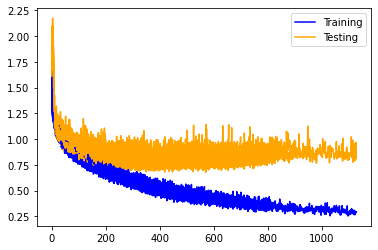

In [21]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

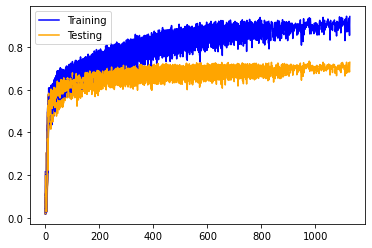

In [22]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

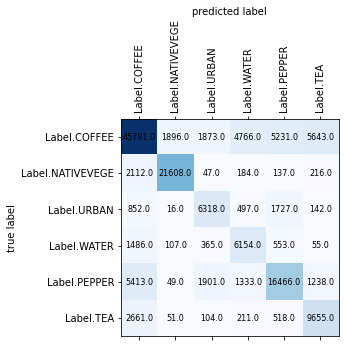

In [23]:
plot_confusion_matrix(conf_matrix, labels)

In [24]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.78523536 0.91069246 0.59558824 0.4681628  0.66848003 0.56965013]
Mean precision:  0.6663015012370561

Recalls:  [0.70231595 0.88907176 0.66143216 0.70573394 0.62371212 0.73143939]
Mean recall:  0.7189508882608768

F-Score:  [0.7414646  0.89975224 0.62678571 0.56290876 0.64532058 0.64048559]
Mean f-score:  0.6861195811279961


# 2x32 conv, 2x64 conv, MaxPooling2D k=(2, 2), GlobalAveragePooling

In [7]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=32, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),
    GlobalAveragePooling2D(),
    Flatten(name='flat'),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS, early_stopping=True)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 9, 9, 4)           0         
_________________________________________________________________
batch_normalization (BatchNo (None, 9, 9, 4)           16        
_________________________________________________________________
conv2d (Conv2D)              (None, 9, 9, 32)          544       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 9, 9, 32)          4128      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 9, 9, 64)          8256      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 64)          16448     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 4, 4, 64)          0

Epoch 103/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6661 - accuracy: 0.6833 - val_loss: 0.8938 - val_accuracy: 0.6633
Epoch 104/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6371 - accuracy: 0.6840 - val_loss: 0.9771 - val_accuracy: 0.6378
Epoch 105/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6472 - accuracy: 0.6851 - val_loss: 0.8675 - val_accuracy: 0.6711
Epoch 106/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6324 - accuracy: 0.6990 - val_loss: 0.9607 - val_accuracy: 0.6413
Epoch 107/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6106 - accuracy: 0.7062 - val_loss: 0.8935 - val_accuracy: 0.6664
Epoch 108/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6286 - accuracy: 0.6791 - val_loss: 0.8615 - val_accuracy: 0.6778
Epoch 109/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5280 - accuracy: 0.7419 - val_loss: 1.1396 - val_ac

57/57 [==============================] - 1s 10ms/step - loss: 0.4169 - accuracy: 0.7807 - val_loss: 0.8460 - val_accuracy: 0.6925
Epoch 216/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4858 - accuracy: 0.7464 - val_loss: 0.8730 - val_accuracy: 0.6816
Epoch 217/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4494 - accuracy: 0.7794 - val_loss: 0.8456 - val_accuracy: 0.6954
Epoch 218/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3763 - accuracy: 0.8060 - val_loss: 0.8630 - val_accuracy: 0.6946
Epoch 219/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3940 - accuracy: 0.7786 - val_loss: 0.8170 - val_accuracy: 0.7083
Epoch 220/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4132 - accuracy: 0.7961 - val_loss: 0.7083 - val_accuracy: 0.7400
Epoch 221/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4180 - accuracy: 0.7757 - val_loss: 0.8859 - val_accuracy: 0.6813


57/57 [==============================] - 1s 10ms/step - loss: 0.3009 - accuracy: 0.8360 - val_loss: 0.7780 - val_accuracy: 0.7470
Epoch 328/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3009 - accuracy: 0.8247 - val_loss: 0.8251 - val_accuracy: 0.7334
Epoch 329/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2785 - accuracy: 0.8335 - val_loss: 0.7552 - val_accuracy: 0.7495
Epoch 330/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3079 - accuracy: 0.8170 - val_loss: 0.7402 - val_accuracy: 0.7541
Epoch 331/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2920 - accuracy: 0.8384 - val_loss: 0.8929 - val_accuracy: 0.7079
Epoch 332/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2942 - accuracy: 0.8339 - val_loss: 0.9772 - val_accuracy: 0.6745
Epoch 333/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3072 - accuracy: 0.8096 - val_loss: 0.9655 - val_accuracy: 0.6881


57/57 [==============================] - 1s 11ms/step - loss: 0.2313 - accuracy: 0.8660 - val_loss: 1.0543 - val_accuracy: 0.6812
Epoch 440/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2105 - accuracy: 0.8655 - val_loss: 0.7949 - val_accuracy: 0.7668
Epoch 441/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2051 - accuracy: 0.8744 - val_loss: 0.9124 - val_accuracy: 0.7324
Epoch 442/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2049 - accuracy: 0.8751 - val_loss: 1.0057 - val_accuracy: 0.7104
Epoch 443/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2339 - accuracy: 0.8661 - val_loss: 0.9130 - val_accuracy: 0.7273
Epoch 444/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2808 - accuracy: 0.8847 - val_loss: 0.8532 - val_accuracy: 0.7371
Epoch 445/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2369 - accuracy: 0.8653 - val_loss: 0.8646 - val_accuracy: 0.7295


57/57 [==============================] - 1s 10ms/step - loss: 0.2374 - accuracy: 0.8705 - val_loss: 0.9065 - val_accuracy: 0.7515
Epoch 552/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2123 - accuracy: 0.8968 - val_loss: 0.7775 - val_accuracy: 0.7816
Epoch 553/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1839 - accuracy: 0.8972 - val_loss: 0.9700 - val_accuracy: 0.7182
Epoch 554/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1838 - accuracy: 0.8994 - val_loss: 0.8014 - val_accuracy: 0.7831
Epoch 555/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1990 - accuracy: 0.8931 - val_loss: 0.8635 - val_accuracy: 0.7567
Epoch 556/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1998 - accuracy: 0.8790 - val_loss: 0.8836 - val_accuracy: 0.7615
Epoch 557/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1721 - accuracy: 0.9087 - val_loss: 0.8427 - val_accuracy: 0.7698


57/57 [==============================] - 1s 11ms/step - loss: 0.2083 - accuracy: 0.9058 - val_loss: 0.9032 - val_accuracy: 0.7681
Epoch 664/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1441 - accuracy: 0.9259 - val_loss: 1.0604 - val_accuracy: 0.7295
Epoch 665/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2299 - accuracy: 0.8880 - val_loss: 0.9417 - val_accuracy: 0.7666
Epoch 666/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1709 - accuracy: 0.9010 - val_loss: 0.8974 - val_accuracy: 0.7630
Epoch 667/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1554 - accuracy: 0.9105 - val_loss: 0.9433 - val_accuracy: 0.7471
Epoch 668/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2092 - accuracy: 0.8773 - val_loss: 0.8464 - val_accuracy: 0.7740
Epoch 669/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1848 - accuracy: 0.9011 - val_loss: 0.9657 - val_accuracy: 0.7496


Epoch 65/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7319 - accuracy: 0.6761 - val_loss: 0.8733 - val_accuracy: 0.6811
Epoch 66/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6771 - accuracy: 0.6745 - val_loss: 0.9875 - val_accuracy: 0.6462
Epoch 67/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7405 - accuracy: 0.6497 - val_loss: 1.0070 - val_accuracy: 0.6081
Epoch 68/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7736 - accuracy: 0.6559 - val_loss: 0.8269 - val_accuracy: 0.6929
Epoch 69/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6937 - accuracy: 0.6894 - val_loss: 0.8386 - val_accuracy: 0.6898
Epoch 70/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6957 - accuracy: 0.6770 - val_loss: 0.8431 - val_accuracy: 0.6831
Epoch 71/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7421 - accuracy: 0.6734 - val_loss: 0.8074 - val_accuracy:

Epoch 122/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5971 - accuracy: 0.7165 - val_loss: 0.8927 - val_accuracy: 0.6663
Epoch 123/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5576 - accuracy: 0.7296 - val_loss: 0.9368 - val_accuracy: 0.6553
Epoch 124/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5858 - accuracy: 0.7198 - val_loss: 0.8226 - val_accuracy: 0.6964
Epoch 125/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6245 - accuracy: 0.6929 - val_loss: 0.7650 - val_accuracy: 0.7233
Epoch 126/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6122 - accuracy: 0.7188 - val_loss: 0.8519 - val_accuracy: 0.6815
Epoch 127/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5265 - accuracy: 0.7241 - val_loss: 0.8947 - val_accuracy: 0.6687
Epoch 128/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5308 - accuracy: 0.7303 - val_loss: 0.7670 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.5112 - accuracy: 0.7643 - val_loss: 0.9946 - val_accuracy: 0.6568
Epoch 235/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4117 - accuracy: 0.7796 - val_loss: 0.7546 - val_accuracy: 0.7339
Epoch 236/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4208 - accuracy: 0.7863 - val_loss: 0.9187 - val_accuracy: 0.6671
Epoch 237/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4299 - accuracy: 0.7788 - val_loss: 0.8307 - val_accuracy: 0.7057
Epoch 238/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4629 - accuracy: 0.7765 - val_loss: 0.7870 - val_accuracy: 0.7248
Epoch 239/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4096 - accuracy: 0.7859 - val_loss: 0.8692 - val_accuracy: 0.6911
Epoch 240/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4373 - accuracy: 0.7968 - val_loss: 0.8844 - val_accuracy: 0.6835


57/57 [==============================] - 1s 10ms/step - loss: 0.2991 - accuracy: 0.8525 - val_loss: 0.9931 - val_accuracy: 0.6751
Epoch 347/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3351 - accuracy: 0.8068 - val_loss: 0.7559 - val_accuracy: 0.7503
Epoch 348/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2989 - accuracy: 0.8320 - val_loss: 0.9244 - val_accuracy: 0.6929
Epoch 349/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3255 - accuracy: 0.8100 - val_loss: 0.6916 - val_accuracy: 0.7760
Epoch 350/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2853 - accuracy: 0.8541 - val_loss: 0.8772 - val_accuracy: 0.7120
Epoch 351/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2906 - accuracy: 0.8307 - val_loss: 0.8196 - val_accuracy: 0.7283
Epoch 352/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2817 - accuracy: 0.8468 - val_loss: 0.7618 - val_accuracy: 0.7548


57/57 [==============================] - 1s 11ms/step - loss: 0.2517 - accuracy: 0.8508 - val_loss: 0.8401 - val_accuracy: 0.7458
Epoch 459/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2343 - accuracy: 0.8655 - val_loss: 0.8894 - val_accuracy: 0.7374
Epoch 460/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1902 - accuracy: 0.8755 - val_loss: 0.7590 - val_accuracy: 0.7727
Epoch 461/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2392 - accuracy: 0.8673 - val_loss: 0.8104 - val_accuracy: 0.7641
Epoch 462/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2565 - accuracy: 0.8714 - val_loss: 0.9765 - val_accuracy: 0.7162
Epoch 463/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2428 - accuracy: 0.8482 - val_loss: 0.7889 - val_accuracy: 0.7603
Epoch 464/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2178 - accuracy: 0.8792 - val_loss: 0.8064 - val_accuracy: 0.7603


57/57 [==============================] - 1s 11ms/step - loss: 0.1780 - accuracy: 0.8915 - val_loss: 0.9054 - val_accuracy: 0.7477
Epoch 571/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2126 - accuracy: 0.8895 - val_loss: 0.8166 - val_accuracy: 0.7827
Epoch 572/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1758 - accuracy: 0.8951 - val_loss: 0.8199 - val_accuracy: 0.7787
Epoch 573/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1719 - accuracy: 0.9016 - val_loss: 0.8806 - val_accuracy: 0.7667
Epoch 574/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2066 - accuracy: 0.8766 - val_loss: 0.8690 - val_accuracy: 0.7640
Epoch 575/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2462 - accuracy: 0.8735 - val_loss: 0.9309 - val_accuracy: 0.7462
Epoch 576/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1892 - accuracy: 0.8939 - val_loss: 0.9305 - val_accuracy: 0.7477


57/57 [==============================] - 1s 11ms/step - loss: 0.1552 - accuracy: 0.9110 - val_loss: 0.8805 - val_accuracy: 0.7731
Epoch 683/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1866 - accuracy: 0.8931 - val_loss: 0.9794 - val_accuracy: 0.7496
Epoch 684/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1663 - accuracy: 0.9158 - val_loss: 0.8647 - val_accuracy: 0.7792
Epoch 685/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1283 - accuracy: 0.9235 - val_loss: 0.8524 - val_accuracy: 0.7848
Epoch 686/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1444 - accuracy: 0.9178 - val_loss: 0.9543 - val_accuracy: 0.7621
Epoch 687/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1749 - accuracy: 0.9129 - val_loss: 0.9503 - val_accuracy: 0.7517
Epoch 688/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1566 - accuracy: 0.8944 - val_loss: 0.9812 - val_accuracy: 0.7507


Epoch 41/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8818 - accuracy: 0.6517 - val_loss: 0.9547 - val_accuracy: 0.6341
Epoch 42/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8239 - accuracy: 0.6395 - val_loss: 0.8688 - val_accuracy: 0.6814
Epoch 43/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7550 - accuracy: 0.6669 - val_loss: 0.9071 - val_accuracy: 0.6639
Epoch 44/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8491 - accuracy: 0.6533 - val_loss: 0.9729 - val_accuracy: 0.6411
Epoch 45/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8012 - accuracy: 0.6717 - val_loss: 0.9075 - val_accuracy: 0.6618
Epoch 46/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7829 - accuracy: 0.6687 - val_loss: 0.9014 - val_accuracy: 0.6677
Epoch 47/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7663 - accuracy: 0.6514 - val_loss: 0.8998 - val_accuracy:

Epoch 98/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5800 - accuracy: 0.7131 - val_loss: 1.0326 - val_accuracy: 0.6033
Epoch 99/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6110 - accuracy: 0.7064 - val_loss: 1.0002 - val_accuracy: 0.6327
Epoch 100/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5857 - accuracy: 0.7199 - val_loss: 0.8330 - val_accuracy: 0.6966
Epoch 101/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6000 - accuracy: 0.6925 - val_loss: 0.9619 - val_accuracy: 0.6379
Epoch 102/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6178 - accuracy: 0.7084 - val_loss: 0.8653 - val_accuracy: 0.6793
Epoch 103/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5878 - accuracy: 0.7211 - val_loss: 0.9897 - val_accuracy: 0.6264
Epoch 104/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6067 - accuracy: 0.7000 - val_loss: 0.8304 - val_accu

57/57 [==============================] - 1s 11ms/step - loss: 0.4201 - accuracy: 0.7774 - val_loss: 0.9896 - val_accuracy: 0.6587
Epoch 211/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4437 - accuracy: 0.7701 - val_loss: 0.7723 - val_accuracy: 0.7382
Epoch 212/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4708 - accuracy: 0.7697 - val_loss: 1.0112 - val_accuracy: 0.6567
Epoch 213/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4734 - accuracy: 0.7453 - val_loss: 0.8006 - val_accuracy: 0.7234
Epoch 214/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4546 - accuracy: 0.7741 - val_loss: 0.8023 - val_accuracy: 0.7210
Epoch 215/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4383 - accuracy: 0.7822 - val_loss: 0.7699 - val_accuracy: 0.7373
Epoch 216/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4644 - accuracy: 0.7779 - val_loss: 0.7638 - val_accuracy: 0.7428


57/57 [==============================] - 1s 11ms/step - loss: 0.3313 - accuracy: 0.8167 - val_loss: 0.8798 - val_accuracy: 0.7194
Epoch 323/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3237 - accuracy: 0.8139 - val_loss: 0.9733 - val_accuracy: 0.7017
Epoch 324/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2759 - accuracy: 0.8345 - val_loss: 1.1869 - val_accuracy: 0.6591
Epoch 325/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3166 - accuracy: 0.8038 - val_loss: 0.9366 - val_accuracy: 0.7059
Epoch 326/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3146 - accuracy: 0.8292 - val_loss: 0.8069 - val_accuracy: 0.7426
Epoch 327/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2920 - accuracy: 0.8335 - val_loss: 0.9693 - val_accuracy: 0.6920
Epoch 328/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3007 - accuracy: 0.8496 - val_loss: 0.9146 - val_accuracy: 0.7114


57/57 [==============================] - 1s 11ms/step - loss: 0.2763 - accuracy: 0.8557 - val_loss: 0.8362 - val_accuracy: 0.7674
Epoch 435/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3208 - accuracy: 0.8582 - val_loss: 0.9972 - val_accuracy: 0.7282
Epoch 436/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2728 - accuracy: 0.8499 - val_loss: 0.8210 - val_accuracy: 0.7605
Epoch 437/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2271 - accuracy: 0.8686 - val_loss: 0.8367 - val_accuracy: 0.7613
Epoch 438/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2061 - accuracy: 0.8813 - val_loss: 0.8555 - val_accuracy: 0.7589
Epoch 439/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2292 - accuracy: 0.8696 - val_loss: 0.9617 - val_accuracy: 0.7354
Epoch 440/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2370 - accuracy: 0.8473 - val_loss: 1.0156 - val_accuracy: 0.7194


57/57 [==============================] - 1s 11ms/step - loss: 0.1897 - accuracy: 0.8957 - val_loss: 0.9788 - val_accuracy: 0.7511
Epoch 547/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2162 - accuracy: 0.8812 - val_loss: 0.9566 - val_accuracy: 0.7469
Epoch 548/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1988 - accuracy: 0.8973 - val_loss: 0.9266 - val_accuracy: 0.7587
Epoch 549/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2330 - accuracy: 0.8650 - val_loss: 0.9856 - val_accuracy: 0.7400
Epoch 550/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2551 - accuracy: 0.8892 - val_loss: 0.9381 - val_accuracy: 0.7510
Epoch 551/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2396 - accuracy: 0.8727 - val_loss: 0.9922 - val_accuracy: 0.7325
Epoch 552/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2030 - accuracy: 0.8828 - val_loss: 0.9892 - val_accuracy: 0.7321


57/57 [==============================] - 1s 11ms/step - loss: 0.1697 - accuracy: 0.9064 - val_loss: 0.9894 - val_accuracy: 0.7510
Epoch 659/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1380 - accuracy: 0.9174 - val_loss: 0.9370 - val_accuracy: 0.7637
Epoch 660/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1571 - accuracy: 0.9201 - val_loss: 0.9791 - val_accuracy: 0.7603
Epoch 661/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1380 - accuracy: 0.9189 - val_loss: 1.0147 - val_accuracy: 0.7506
Epoch 662/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1618 - accuracy: 0.9188 - val_loss: 0.9297 - val_accuracy: 0.7621
Epoch 663/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1423 - accuracy: 0.9095 - val_loss: 1.0664 - val_accuracy: 0.7408
Epoch 664/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1618 - accuracy: 0.9022 - val_loss: 1.0482 - val_accuracy: 0.7388


57/57 [==============================] - 1s 11ms/step - loss: 0.1118 - accuracy: 0.9341 - val_loss: 1.0259 - val_accuracy: 0.7667
Epoch 771/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1534 - accuracy: 0.9161 - val_loss: 1.0588 - val_accuracy: 0.7470
Epoch 772/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1278 - accuracy: 0.9317 - val_loss: 1.0500 - val_accuracy: 0.7434
Epoch 773/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1725 - accuracy: 0.9078 - val_loss: 1.0631 - val_accuracy: 0.7548
Epoch 774/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1674 - accuracy: 0.9104 - val_loss: 0.9924 - val_accuracy: 0.7659
Epoch 775/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1158 - accuracy: 0.9300 - val_loss: 1.0576 - val_accuracy: 0.7479
Epoch 776/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1293 - accuracy: 0.9140 - val_loss: 1.0806 - val_accuracy: 0.7518


57/57 [==============================] - 1s 11ms/step - loss: 0.1364 - accuracy: 0.9312 - val_loss: 1.0578 - val_accuracy: 0.7636
Epoch 883/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1144 - accuracy: 0.9316 - val_loss: 0.9561 - val_accuracy: 0.7959
Epoch 884/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1229 - accuracy: 0.9362 - val_loss: 1.0511 - val_accuracy: 0.7660
Epoch 885/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1407 - accuracy: 0.9225 - val_loss: 1.4058 - val_accuracy: 0.7156
Epoch 886/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1102 - accuracy: 0.9382 - val_loss: 1.2070 - val_accuracy: 0.7536
Epoch 887/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1493 - accuracy: 0.9191 - val_loss: 1.1875 - val_accuracy: 0.7538
Epoch 888/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1423 - accuracy: 0.9187 - val_loss: 1.1442 - val_accuracy: 0.7506


57/57 [==============================] - 1s 11ms/step - loss: 0.0911 - accuracy: 0.9474 - val_loss: 1.1529 - val_accuracy: 0.7765
Epoch 995/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1318 - accuracy: 0.9314 - val_loss: 1.1616 - val_accuracy: 0.7618
Epoch 996/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1407 - accuracy: 0.9348 - val_loss: 1.0718 - val_accuracy: 0.7723
Epoch 997/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1319 - accuracy: 0.9379 - val_loss: 1.0701 - val_accuracy: 0.7751
Epoch 998/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1187 - accuracy: 0.9356 - val_loss: 1.0668 - val_accuracy: 0.7761
Epoch 999/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1446 - accuracy: 0.9397 - val_loss: 1.2431 - val_accuracy: 0.7314
Epoch 1000/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1343 - accuracy: 0.9214 - val_loss: 1.1064 - val_accuracy: 0.7792

Epoch 74/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6274 - accuracy: 0.6883 - val_loss: 0.9952 - val_accuracy: 0.6214
Epoch 75/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6546 - accuracy: 0.6761 - val_loss: 0.9204 - val_accuracy: 0.6466
Epoch 76/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6377 - accuracy: 0.6915 - val_loss: 0.9795 - val_accuracy: 0.6261
Epoch 77/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6617 - accuracy: 0.6812 - val_loss: 0.9898 - val_accuracy: 0.6192
Epoch 78/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6404 - accuracy: 0.6759 - val_loss: 0.9212 - val_accuracy: 0.6378
Epoch 79/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6382 - accuracy: 0.6864 - val_loss: 1.0365 - val_accuracy: 0.5998
Epoch 80/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6747 - accuracy: 0.6733 - val_loss: 0.8339 - val_accuracy:

Epoch 131/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5284 - accuracy: 0.7507 - val_loss: 0.8035 - val_accuracy: 0.7080
Epoch 132/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4841 - accuracy: 0.7552 - val_loss: 0.9713 - val_accuracy: 0.6335
Epoch 133/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5499 - accuracy: 0.7141 - val_loss: 0.9057 - val_accuracy: 0.6598
Epoch 134/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5192 - accuracy: 0.7221 - val_loss: 0.8140 - val_accuracy: 0.7019
Epoch 135/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5101 - accuracy: 0.7376 - val_loss: 0.7994 - val_accuracy: 0.6986
Epoch 136/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4616 - accuracy: 0.7646 - val_loss: 0.9309 - val_accuracy: 0.6500
Epoch 137/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5094 - accuracy: 0.7116 - val_loss: 0.9767 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.3290 - accuracy: 0.8201 - val_loss: 0.8219 - val_accuracy: 0.7327
Epoch 244/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3608 - accuracy: 0.8151 - val_loss: 0.7636 - val_accuracy: 0.7449
Epoch 245/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3675 - accuracy: 0.8062 - val_loss: 0.7284 - val_accuracy: 0.7597
Epoch 246/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3148 - accuracy: 0.8372 - val_loss: 0.9316 - val_accuracy: 0.7021
Epoch 247/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3876 - accuracy: 0.7875 - val_loss: 0.7832 - val_accuracy: 0.7342
Epoch 248/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3700 - accuracy: 0.7984 - val_loss: 0.8627 - val_accuracy: 0.7133
Epoch 249/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3483 - accuracy: 0.8008 - val_loss: 0.8274 - val_accuracy: 0.7336


57/57 [==============================] - 1s 12ms/step - loss: 0.2718 - accuracy: 0.8526 - val_loss: 0.9338 - val_accuracy: 0.7120
Epoch 356/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2499 - accuracy: 0.8610 - val_loss: 0.9624 - val_accuracy: 0.7143
Epoch 357/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3035 - accuracy: 0.8434 - val_loss: 0.8095 - val_accuracy: 0.7456
Epoch 358/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2870 - accuracy: 0.8516 - val_loss: 0.9945 - val_accuracy: 0.6826
Epoch 359/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2911 - accuracy: 0.8275 - val_loss: 0.9453 - val_accuracy: 0.7195
Epoch 360/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2364 - accuracy: 0.8606 - val_loss: 0.9270 - val_accuracy: 0.7285
Epoch 361/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2515 - accuracy: 0.8453 - val_loss: 0.8284 - val_accuracy: 0.7567


57/57 [==============================] - 1s 10ms/step - loss: 0.2189 - accuracy: 0.8808 - val_loss: 0.8625 - val_accuracy: 0.7845
Epoch 468/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2258 - accuracy: 0.8734 - val_loss: 0.8516 - val_accuracy: 0.7739
Epoch 469/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2112 - accuracy: 0.8693 - val_loss: 0.8486 - val_accuracy: 0.7666
Epoch 470/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2285 - accuracy: 0.8661 - val_loss: 0.9427 - val_accuracy: 0.7453
Epoch 471/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1925 - accuracy: 0.8861 - val_loss: 0.9470 - val_accuracy: 0.7526
Epoch 472/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1851 - accuracy: 0.9006 - val_loss: 1.0023 - val_accuracy: 0.7314
Epoch 473/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1836 - accuracy: 0.8890 - val_loss: 0.8521 - val_accuracy: 0.7599


57/57 [==============================] - 1s 11ms/step - loss: 0.1502 - accuracy: 0.9110 - val_loss: 1.0211 - val_accuracy: 0.7404
Epoch 580/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1679 - accuracy: 0.8959 - val_loss: 0.8669 - val_accuracy: 0.7996
Epoch 581/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1285 - accuracy: 0.9214 - val_loss: 0.9897 - val_accuracy: 0.7606
Epoch 582/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1692 - accuracy: 0.9061 - val_loss: 1.0276 - val_accuracy: 0.7366
Epoch 583/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1549 - accuracy: 0.9113 - val_loss: 1.1389 - val_accuracy: 0.7248
Epoch 584/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1818 - accuracy: 0.8940 - val_loss: 0.9946 - val_accuracy: 0.7597
Epoch 585/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1354 - accuracy: 0.9224 - val_loss: 1.0796 - val_accuracy: 0.7525


57/57 [==============================] - 1s 11ms/step - loss: 0.1405 - accuracy: 0.9224 - val_loss: 1.0374 - val_accuracy: 0.7508
Epoch 692/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1138 - accuracy: 0.9319 - val_loss: 1.1130 - val_accuracy: 0.7373
Epoch 693/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1612 - accuracy: 0.9195 - val_loss: 1.0161 - val_accuracy: 0.7593
Epoch 694/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1651 - accuracy: 0.9085 - val_loss: 1.0244 - val_accuracy: 0.7541
Epoch 695/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1909 - accuracy: 0.8936 - val_loss: 1.0202 - val_accuracy: 0.7454
Epoch 696/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1215 - accuracy: 0.9077 - val_loss: 1.0151 - val_accuracy: 0.7544
Epoch 697/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1311 - accuracy: 0.9183 - val_loss: 0.8947 - val_accuracy: 0.7815


Epoch 74/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7066 - accuracy: 0.6991 - val_loss: 1.0716 - val_accuracy: 0.6056
Epoch 75/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7179 - accuracy: 0.6654 - val_loss: 1.0648 - val_accuracy: 0.6035
Epoch 76/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7712 - accuracy: 0.6531 - val_loss: 0.9633 - val_accuracy: 0.6268
Epoch 77/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7286 - accuracy: 0.6701 - val_loss: 0.9370 - val_accuracy: 0.6442
Epoch 78/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6765 - accuracy: 0.7102 - val_loss: 0.8568 - val_accuracy: 0.6899
Epoch 79/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7508 - accuracy: 0.7046 - val_loss: 0.8248 - val_accuracy: 0.7002
Epoch 80/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7380 - accuracy: 0.6961 - val_loss: 0.8828 - val_accuracy:

Epoch 131/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5572 - accuracy: 0.7060 - val_loss: 0.9988 - val_accuracy: 0.6428
Epoch 132/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6304 - accuracy: 0.6932 - val_loss: 0.9151 - val_accuracy: 0.6700
Epoch 133/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5678 - accuracy: 0.7325 - val_loss: 0.7875 - val_accuracy: 0.7050
Epoch 134/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5763 - accuracy: 0.7388 - val_loss: 0.8069 - val_accuracy: 0.6991
Epoch 135/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5260 - accuracy: 0.7414 - val_loss: 0.8076 - val_accuracy: 0.7025
Epoch 136/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5543 - accuracy: 0.7312 - val_loss: 0.8807 - val_accuracy: 0.6784
Epoch 137/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5686 - accuracy: 0.7304 - val_loss: 0.8410 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.3946 - accuracy: 0.7848 - val_loss: 0.8278 - val_accuracy: 0.7040
Epoch 244/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3555 - accuracy: 0.8239 - val_loss: 0.7427 - val_accuracy: 0.7405
Epoch 245/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3524 - accuracy: 0.8185 - val_loss: 0.7873 - val_accuracy: 0.7262
Epoch 246/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4490 - accuracy: 0.7768 - val_loss: 0.8702 - val_accuracy: 0.6925
Epoch 247/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3927 - accuracy: 0.7757 - val_loss: 1.2001 - val_accuracy: 0.6008
Epoch 248/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4337 - accuracy: 0.7781 - val_loss: 0.9327 - val_accuracy: 0.6811
Epoch 249/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4611 - accuracy: 0.7730 - val_loss: 0.8443 - val_accuracy: 0.7006


57/57 [==============================] - 1s 11ms/step - loss: 0.3322 - accuracy: 0.8267 - val_loss: 0.7955 - val_accuracy: 0.7498
Epoch 356/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2894 - accuracy: 0.8598 - val_loss: 0.9063 - val_accuracy: 0.7150
Epoch 357/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2903 - accuracy: 0.8517 - val_loss: 0.8723 - val_accuracy: 0.7225
Epoch 358/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3032 - accuracy: 0.8408 - val_loss: 0.9020 - val_accuracy: 0.7165
Epoch 359/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2970 - accuracy: 0.8379 - val_loss: 0.9732 - val_accuracy: 0.6996
Epoch 360/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3015 - accuracy: 0.8485 - val_loss: 0.8330 - val_accuracy: 0.7282
Epoch 361/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2729 - accuracy: 0.8665 - val_loss: 0.9008 - val_accuracy: 0.7145


57/57 [==============================] - 1s 12ms/step - loss: 0.2082 - accuracy: 0.8941 - val_loss: 0.9618 - val_accuracy: 0.7191
Epoch 468/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2121 - accuracy: 0.8943 - val_loss: 0.8018 - val_accuracy: 0.7568
Epoch 469/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2227 - accuracy: 0.8779 - val_loss: 0.8271 - val_accuracy: 0.7655
Epoch 470/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1908 - accuracy: 0.8909 - val_loss: 0.8034 - val_accuracy: 0.7530
Epoch 471/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2598 - accuracy: 0.8542 - val_loss: 0.8075 - val_accuracy: 0.7549
Epoch 472/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1967 - accuracy: 0.8753 - val_loss: 0.8159 - val_accuracy: 0.7593
Epoch 473/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2030 - accuracy: 0.8854 - val_loss: 0.8595 - val_accuracy: 0.7469


57/57 [==============================] - 1s 11ms/step - loss: 0.1956 - accuracy: 0.8946 - val_loss: 0.8988 - val_accuracy: 0.7473
Epoch 580/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1886 - accuracy: 0.8974 - val_loss: 0.8664 - val_accuracy: 0.7594
Epoch 581/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1800 - accuracy: 0.8989 - val_loss: 1.0159 - val_accuracy: 0.7314
Epoch 582/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1701 - accuracy: 0.9006 - val_loss: 0.9495 - val_accuracy: 0.7350
Epoch 583/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1745 - accuracy: 0.9030 - val_loss: 0.9053 - val_accuracy: 0.7546
Epoch 584/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1807 - accuracy: 0.8886 - val_loss: 1.0860 - val_accuracy: 0.7122
Epoch 585/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1644 - accuracy: 0.9159 - val_loss: 0.9775 - val_accuracy: 0.7350


57/57 [==============================] - 1s 11ms/step - loss: 0.1829 - accuracy: 0.8979 - val_loss: 1.0031 - val_accuracy: 0.7369
Epoch 692/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1435 - accuracy: 0.9211 - val_loss: 0.9641 - val_accuracy: 0.7545
Epoch 693/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1574 - accuracy: 0.8958 - val_loss: 0.9952 - val_accuracy: 0.7449
Epoch 694/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1282 - accuracy: 0.9132 - val_loss: 0.9884 - val_accuracy: 0.7556
Epoch 695/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1678 - accuracy: 0.9276 - val_loss: 1.0985 - val_accuracy: 0.7365
Epoch 696/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1595 - accuracy: 0.9156 - val_loss: 0.8808 - val_accuracy: 0.7753
Epoch 697/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1552 - accuracy: 0.9181 - val_loss: 0.8768 - val_accuracy: 0.7741


Epoch 68/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7509 - accuracy: 0.6646 - val_loss: 0.9713 - val_accuracy: 0.6409
Epoch 69/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7247 - accuracy: 0.6806 - val_loss: 0.9087 - val_accuracy: 0.6644
Epoch 70/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7394 - accuracy: 0.6702 - val_loss: 1.0604 - val_accuracy: 0.5885
Epoch 71/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6814 - accuracy: 0.6727 - val_loss: 0.9067 - val_accuracy: 0.6597
Epoch 72/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6748 - accuracy: 0.6698 - val_loss: 1.0203 - val_accuracy: 0.6040
Epoch 73/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7203 - accuracy: 0.6594 - val_loss: 0.9195 - val_accuracy: 0.6566
Epoch 74/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7018 - accuracy: 0.6950 - val_loss: 0.7916 - val_accuracy:

Epoch 125/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6302 - accuracy: 0.6985 - val_loss: 0.9039 - val_accuracy: 0.6539
Epoch 126/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5558 - accuracy: 0.7320 - val_loss: 0.9178 - val_accuracy: 0.6315
Epoch 127/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5803 - accuracy: 0.7072 - val_loss: 0.9812 - val_accuracy: 0.6236
Epoch 128/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5796 - accuracy: 0.7171 - val_loss: 0.9425 - val_accuracy: 0.6261
Epoch 129/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5596 - accuracy: 0.7254 - val_loss: 0.7724 - val_accuracy: 0.7119
Epoch 130/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5179 - accuracy: 0.7378 - val_loss: 0.8442 - val_accuracy: 0.6843
Epoch 131/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5590 - accuracy: 0.7360 - val_loss: 0.8342 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.4197 - accuracy: 0.7783 - val_loss: 0.8187 - val_accuracy: 0.7034
Epoch 238/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3988 - accuracy: 0.7776 - val_loss: 0.8147 - val_accuracy: 0.7089
Epoch 239/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4026 - accuracy: 0.7890 - val_loss: 0.8879 - val_accuracy: 0.6778
Epoch 240/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3964 - accuracy: 0.7920 - val_loss: 0.8689 - val_accuracy: 0.6773
Epoch 241/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4069 - accuracy: 0.7767 - val_loss: 0.8429 - val_accuracy: 0.7039
Epoch 242/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4007 - accuracy: 0.7860 - val_loss: 0.9342 - val_accuracy: 0.6673
Epoch 243/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4308 - accuracy: 0.7573 - val_loss: 0.7888 - val_accuracy: 0.7067


57/57 [==============================] - 1s 11ms/step - loss: 0.3577 - accuracy: 0.8178 - val_loss: 0.7797 - val_accuracy: 0.7554
Epoch 350/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3381 - accuracy: 0.8214 - val_loss: 0.7800 - val_accuracy: 0.7395
Epoch 351/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2686 - accuracy: 0.8524 - val_loss: 0.9788 - val_accuracy: 0.6850
Epoch 352/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3645 - accuracy: 0.8148 - val_loss: 0.8224 - val_accuracy: 0.7381
Epoch 353/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3661 - accuracy: 0.8065 - val_loss: 0.7896 - val_accuracy: 0.7405
Epoch 354/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3144 - accuracy: 0.8264 - val_loss: 0.8153 - val_accuracy: 0.7302
Epoch 355/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2875 - accuracy: 0.8477 - val_loss: 0.8509 - val_accuracy: 0.7268


57/57 [==============================] - 1s 11ms/step - loss: 0.2327 - accuracy: 0.8604 - val_loss: 0.9116 - val_accuracy: 0.7262
Epoch 462/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2430 - accuracy: 0.8632 - val_loss: 0.8553 - val_accuracy: 0.7524
Epoch 463/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2338 - accuracy: 0.8619 - val_loss: 0.9460 - val_accuracy: 0.7203
Epoch 464/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2270 - accuracy: 0.8546 - val_loss: 0.8341 - val_accuracy: 0.7500
Epoch 465/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2363 - accuracy: 0.8770 - val_loss: 1.0778 - val_accuracy: 0.6690
Epoch 466/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2435 - accuracy: 0.8514 - val_loss: 0.8453 - val_accuracy: 0.7402
Epoch 467/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2481 - accuracy: 0.8652 - val_loss: 0.8202 - val_accuracy: 0.7632


57/57 [==============================] - 1s 11ms/step - loss: 0.1882 - accuracy: 0.8989 - val_loss: 0.8759 - val_accuracy: 0.7556
Epoch 574/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1852 - accuracy: 0.8954 - val_loss: 1.0522 - val_accuracy: 0.7108
Epoch 575/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2485 - accuracy: 0.8456 - val_loss: 0.9563 - val_accuracy: 0.7252
Epoch 576/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1633 - accuracy: 0.9138 - val_loss: 0.9944 - val_accuracy: 0.7352
Epoch 577/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2266 - accuracy: 0.8806 - val_loss: 0.8494 - val_accuracy: 0.7621
Epoch 578/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1940 - accuracy: 0.8967 - val_loss: 0.9255 - val_accuracy: 0.7443
Epoch 579/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1995 - accuracy: 0.8888 - val_loss: 1.0907 - val_accuracy: 0.7298


57/57 [==============================] - 1s 11ms/step - loss: 0.1521 - accuracy: 0.9216 - val_loss: 0.9724 - val_accuracy: 0.7568
Epoch 686/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1384 - accuracy: 0.9120 - val_loss: 0.9647 - val_accuracy: 0.7533
Epoch 687/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1903 - accuracy: 0.8919 - val_loss: 0.9475 - val_accuracy: 0.7626
Epoch 688/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1697 - accuracy: 0.9139 - val_loss: 1.0888 - val_accuracy: 0.7379
Epoch 689/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1984 - accuracy: 0.8967 - val_loss: 1.1925 - val_accuracy: 0.6827
Epoch 690/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1519 - accuracy: 0.9095 - val_loss: 0.9419 - val_accuracy: 0.7609
Epoch 691/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1744 - accuracy: 0.9027 - val_loss: 0.9173 - val_accuracy: 0.7671


57/57 [==============================] - 1s 11ms/step - loss: 0.1555 - accuracy: 0.9017 - val_loss: 0.9418 - val_accuracy: 0.7750
Epoch 798/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1469 - accuracy: 0.9242 - val_loss: 1.0225 - val_accuracy: 0.7492
Epoch 799/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1360 - accuracy: 0.9129 - val_loss: 0.9578 - val_accuracy: 0.7637
Epoch 800/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1621 - accuracy: 0.9153 - val_loss: 1.0428 - val_accuracy: 0.7657
Epoch 801/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1461 - accuracy: 0.9299 - val_loss: 1.1356 - val_accuracy: 0.7423
Epoch 802/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1468 - accuracy: 0.9032 - val_loss: 1.0121 - val_accuracy: 0.7515
Epoch 803/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1299 - accuracy: 0.9161 - val_loss: 1.0095 - val_accuracy: 0.7565


57/57 [==============================] - 1s 13ms/step - loss: 1.0124 - accuracy: 0.5877 - val_loss: 1.1123 - val_accuracy: 0.5763
Epoch 17/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.9249 - accuracy: 0.6128 - val_loss: 1.0796 - val_accuracy: 0.5744
Epoch 18/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.9242 - accuracy: 0.6075 - val_loss: 1.0752 - val_accuracy: 0.6192
Epoch 19/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.9627 - accuracy: 0.5884 - val_loss: 1.0011 - val_accuracy: 0.6321
Epoch 20/2000
57/57 [==============================] - 1s 13ms/step - loss: 1.0533 - accuracy: 0.5941 - val_loss: 0.9996 - val_accuracy: 0.6377
Epoch 21/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9593 - accuracy: 0.6163 - val_loss: 1.0726 - val_accuracy: 0.6118
Epoch 22/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.8916 - accuracy: 0.6305 - val_loss: 1.0491 - val_accuracy: 0.6150
Epoch 

Epoch 73/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.6698 - accuracy: 0.6758 - val_loss: 0.8895 - val_accuracy: 0.6592
Epoch 74/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.6316 - accuracy: 0.7107 - val_loss: 0.9301 - val_accuracy: 0.6415
Epoch 75/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.6895 - accuracy: 0.6812 - val_loss: 0.8957 - val_accuracy: 0.6565
Epoch 76/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.6286 - accuracy: 0.7127 - val_loss: 1.0078 - val_accuracy: 0.6126
Epoch 77/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.6125 - accuracy: 0.7067 - val_loss: 1.0496 - val_accuracy: 0.5896
Epoch 78/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.6375 - accuracy: 0.6970 - val_loss: 1.1085 - val_accuracy: 0.5755
Epoch 79/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.6751 - accuracy: 0.6674 - val_loss: 1.0532 - val_accuracy:

Epoch 130/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.5163 - accuracy: 0.7348 - val_loss: 0.9060 - val_accuracy: 0.6667
Epoch 131/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.5288 - accuracy: 0.7393 - val_loss: 0.9382 - val_accuracy: 0.6474
Epoch 132/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.5134 - accuracy: 0.7366 - val_loss: 0.8688 - val_accuracy: 0.6754
Epoch 133/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.5038 - accuracy: 0.7461 - val_loss: 1.0862 - val_accuracy: 0.5986
Epoch 134/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.5032 - accuracy: 0.7313 - val_loss: 0.9890 - val_accuracy: 0.6411
Epoch 135/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5138 - accuracy: 0.7257 - val_loss: 0.7760 - val_accuracy: 0.7149
Epoch 136/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5026 - accuracy: 0.7536 - val_loss: 1.0025 - val_ac

57/57 [==============================] - 1s 12ms/step - loss: 0.3623 - accuracy: 0.7674 - val_loss: 0.9294 - val_accuracy: 0.6830
Epoch 243/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3739 - accuracy: 0.7875 - val_loss: 0.9429 - val_accuracy: 0.6814
Epoch 244/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3603 - accuracy: 0.8097 - val_loss: 0.8010 - val_accuracy: 0.7238
Epoch 245/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3587 - accuracy: 0.8050 - val_loss: 0.8553 - val_accuracy: 0.7175
Epoch 246/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4226 - accuracy: 0.8003 - val_loss: 0.9134 - val_accuracy: 0.6928
Epoch 247/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.3852 - accuracy: 0.7859 - val_loss: 1.0816 - val_accuracy: 0.6435
Epoch 248/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3815 - accuracy: 0.7899 - val_loss: 0.8810 - val_accuracy: 0.7020


57/57 [==============================] - 1s 12ms/step - loss: 0.2276 - accuracy: 0.8713 - val_loss: 0.8623 - val_accuracy: 0.7354
Epoch 355/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2528 - accuracy: 0.8380 - val_loss: 0.8523 - val_accuracy: 0.7437
Epoch 356/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.2849 - accuracy: 0.8413 - val_loss: 0.8900 - val_accuracy: 0.7305
Epoch 357/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2670 - accuracy: 0.8534 - val_loss: 0.8771 - val_accuracy: 0.7244
Epoch 358/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2626 - accuracy: 0.8436 - val_loss: 0.8357 - val_accuracy: 0.7513
Epoch 359/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.2793 - accuracy: 0.8450 - val_loss: 0.8475 - val_accuracy: 0.7523
Epoch 360/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2807 - accuracy: 0.8378 - val_loss: 0.9867 - val_accuracy: 0.7044


57/57 [==============================] - 1s 11ms/step - loss: 0.2385 - accuracy: 0.8687 - val_loss: 0.9694 - val_accuracy: 0.7215
Epoch 467/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2168 - accuracy: 0.8688 - val_loss: 0.9825 - val_accuracy: 0.7272
Epoch 468/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2035 - accuracy: 0.8795 - val_loss: 1.3105 - val_accuracy: 0.6626
Epoch 469/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2293 - accuracy: 0.8588 - val_loss: 0.8447 - val_accuracy: 0.7669
Epoch 470/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2069 - accuracy: 0.8811 - val_loss: 0.8891 - val_accuracy: 0.7449
Epoch 471/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1826 - accuracy: 0.8711 - val_loss: 0.8472 - val_accuracy: 0.7504
Epoch 472/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2089 - accuracy: 0.8778 - val_loss: 0.9060 - val_accuracy: 0.7473


57/57 [==============================] - 1s 11ms/step - loss: 0.1967 - accuracy: 0.8892 - val_loss: 0.8980 - val_accuracy: 0.7625
Epoch 579/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2195 - accuracy: 0.8905 - val_loss: 1.0325 - val_accuracy: 0.7468
Epoch 580/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1797 - accuracy: 0.9076 - val_loss: 1.0686 - val_accuracy: 0.7236
Epoch 581/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1957 - accuracy: 0.8807 - val_loss: 1.0065 - val_accuracy: 0.7350
Epoch 582/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1550 - accuracy: 0.8995 - val_loss: 1.1884 - val_accuracy: 0.6994
Epoch 583/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1711 - accuracy: 0.8927 - val_loss: 1.0745 - val_accuracy: 0.7310
Epoch 584/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1603 - accuracy: 0.9075 - val_loss: 1.2674 - val_accuracy: 0.6981


Epoch 37/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8762 - accuracy: 0.6180 - val_loss: 0.8929 - val_accuracy: 0.6727
Epoch 38/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8625 - accuracy: 0.6154 - val_loss: 0.9875 - val_accuracy: 0.6316
Epoch 39/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8520 - accuracy: 0.6097 - val_loss: 0.9729 - val_accuracy: 0.6436
Epoch 40/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8609 - accuracy: 0.6168 - val_loss: 0.9261 - val_accuracy: 0.6598
Epoch 41/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8034 - accuracy: 0.6285 - val_loss: 1.0463 - val_accuracy: 0.5877
Epoch 42/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8730 - accuracy: 0.6152 - val_loss: 0.9771 - val_accuracy: 0.6329
Epoch 43/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7879 - accuracy: 0.6192 - val_loss: 1.0189 - val_accuracy:

Epoch 94/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6658 - accuracy: 0.6734 - val_loss: 0.8160 - val_accuracy: 0.7025
Epoch 95/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6325 - accuracy: 0.6901 - val_loss: 0.8831 - val_accuracy: 0.6769
Epoch 96/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6672 - accuracy: 0.6714 - val_loss: 0.8942 - val_accuracy: 0.6787
Epoch 97/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6895 - accuracy: 0.6751 - val_loss: 0.9021 - val_accuracy: 0.6540
Epoch 98/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6685 - accuracy: 0.6380 - val_loss: 0.9580 - val_accuracy: 0.6317
Epoch 99/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6644 - accuracy: 0.6603 - val_loss: 0.7862 - val_accuracy: 0.7101
Epoch 100/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6848 - accuracy: 0.6908 - val_loss: 0.8941 - val_accuracy

57/57 [==============================] - 1s 11ms/step - loss: 0.4583 - accuracy: 0.7352 - val_loss: 0.8456 - val_accuracy: 0.7080
Epoch 207/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4750 - accuracy: 0.7360 - val_loss: 0.8626 - val_accuracy: 0.7042
Epoch 208/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4080 - accuracy: 0.7710 - val_loss: 0.8226 - val_accuracy: 0.7149
Epoch 209/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4198 - accuracy: 0.7768 - val_loss: 0.8948 - val_accuracy: 0.6787
Epoch 210/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4537 - accuracy: 0.7723 - val_loss: 0.8679 - val_accuracy: 0.6971
Epoch 211/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4041 - accuracy: 0.7673 - val_loss: 0.8163 - val_accuracy: 0.7130
Epoch 212/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4019 - accuracy: 0.7716 - val_loss: 0.7610 - val_accuracy: 0.7286


57/57 [==============================] - 1s 12ms/step - loss: 0.2949 - accuracy: 0.8300 - val_loss: 0.7877 - val_accuracy: 0.7362
Epoch 319/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2995 - accuracy: 0.8436 - val_loss: 0.8059 - val_accuracy: 0.7332
Epoch 320/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3488 - accuracy: 0.8141 - val_loss: 0.8559 - val_accuracy: 0.7275
Epoch 321/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3704 - accuracy: 0.8108 - val_loss: 0.8051 - val_accuracy: 0.7464
Epoch 322/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3456 - accuracy: 0.8086 - val_loss: 0.7709 - val_accuracy: 0.7522
Epoch 323/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3250 - accuracy: 0.8207 - val_loss: 0.7589 - val_accuracy: 0.7551
Epoch 324/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2963 - accuracy: 0.8325 - val_loss: 1.0609 - val_accuracy: 0.6763


57/57 [==============================] - 1s 12ms/step - loss: 0.2523 - accuracy: 0.8592 - val_loss: 0.8444 - val_accuracy: 0.7586
Epoch 431/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2560 - accuracy: 0.8607 - val_loss: 0.9347 - val_accuracy: 0.7337
Epoch 432/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2327 - accuracy: 0.8629 - val_loss: 0.9060 - val_accuracy: 0.7333
Epoch 433/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2199 - accuracy: 0.8730 - val_loss: 0.7923 - val_accuracy: 0.7703
Epoch 434/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2453 - accuracy: 0.8593 - val_loss: 0.9695 - val_accuracy: 0.7233
Epoch 435/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2270 - accuracy: 0.8580 - val_loss: 0.8949 - val_accuracy: 0.7594
Epoch 436/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1987 - accuracy: 0.8764 - val_loss: 0.9333 - val_accuracy: 0.7435


57/57 [==============================] - 1s 11ms/step - loss: 0.1839 - accuracy: 0.8969 - val_loss: 0.9934 - val_accuracy: 0.7392
Epoch 543/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1723 - accuracy: 0.8863 - val_loss: 1.0387 - val_accuracy: 0.7358
Epoch 544/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2334 - accuracy: 0.8585 - val_loss: 1.1346 - val_accuracy: 0.7074
Epoch 545/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3163 - accuracy: 0.8338 - val_loss: 0.9547 - val_accuracy: 0.7480
Epoch 546/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2344 - accuracy: 0.8702 - val_loss: 0.9298 - val_accuracy: 0.7565
Epoch 547/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1817 - accuracy: 0.8871 - val_loss: 0.9010 - val_accuracy: 0.7593
Epoch 548/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1469 - accuracy: 0.9131 - val_loss: 0.9140 - val_accuracy: 0.7548


57/57 [==============================] - 1s 11ms/step - loss: 0.1646 - accuracy: 0.9029 - val_loss: 1.0510 - val_accuracy: 0.7430
Epoch 655/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1622 - accuracy: 0.9029 - val_loss: 1.0027 - val_accuracy: 0.7551
Epoch 656/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1735 - accuracy: 0.9043 - val_loss: 1.1807 - val_accuracy: 0.7329
Epoch 657/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1829 - accuracy: 0.8950 - val_loss: 1.0272 - val_accuracy: 0.7460
Epoch 658/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1601 - accuracy: 0.9031 - val_loss: 1.0697 - val_accuracy: 0.7483
Epoch 659/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1491 - accuracy: 0.9130 - val_loss: 0.9203 - val_accuracy: 0.7796
Epoch 660/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1592 - accuracy: 0.9128 - val_loss: 0.9962 - val_accuracy: 0.7510


57/57 [==============================] - 1s 11ms/step - loss: 0.1370 - accuracy: 0.9299 - val_loss: 0.9337 - val_accuracy: 0.7838
Epoch 767/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1517 - accuracy: 0.9171 - val_loss: 1.0434 - val_accuracy: 0.7651
Epoch 768/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1582 - accuracy: 0.9189 - val_loss: 0.9760 - val_accuracy: 0.7692
Epoch 769/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1620 - accuracy: 0.9147 - val_loss: 1.0923 - val_accuracy: 0.7530
Epoch 770/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1299 - accuracy: 0.9254 - val_loss: 1.0016 - val_accuracy: 0.7673
Epoch 771/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1598 - accuracy: 0.9137 - val_loss: 1.0087 - val_accuracy: 0.7510
Epoch 772/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1377 - accuracy: 0.9155 - val_loss: 1.0008 - val_accuracy: 0.7709


Epoch 52/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8179 - accuracy: 0.6666 - val_loss: 0.9402 - val_accuracy: 0.6477
Epoch 53/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7587 - accuracy: 0.6708 - val_loss: 0.9820 - val_accuracy: 0.6143
Epoch 54/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7604 - accuracy: 0.6852 - val_loss: 0.9448 - val_accuracy: 0.6483
Epoch 55/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7583 - accuracy: 0.6931 - val_loss: 0.8941 - val_accuracy: 0.6666
Epoch 56/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7536 - accuracy: 0.6666 - val_loss: 0.9321 - val_accuracy: 0.6465
Epoch 57/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8064 - accuracy: 0.6815 - val_loss: 1.0090 - val_accuracy: 0.6075
Epoch 58/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7635 - accuracy: 0.6677 - val_loss: 0.8915 - val_accuracy:

Epoch 109/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6015 - accuracy: 0.7358 - val_loss: 0.9824 - val_accuracy: 0.6272
Epoch 110/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5876 - accuracy: 0.7085 - val_loss: 0.8373 - val_accuracy: 0.6815
Epoch 111/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6041 - accuracy: 0.7353 - val_loss: 0.7698 - val_accuracy: 0.7063
Epoch 112/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6080 - accuracy: 0.7229 - val_loss: 0.8985 - val_accuracy: 0.6522
Epoch 113/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6082 - accuracy: 0.7231 - val_loss: 0.9403 - val_accuracy: 0.6450
Epoch 114/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5735 - accuracy: 0.7266 - val_loss: 0.7623 - val_accuracy: 0.7077
Epoch 115/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5517 - accuracy: 0.7550 - val_loss: 1.0582 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.3709 - accuracy: 0.8074 - val_loss: 0.9226 - val_accuracy: 0.6773
Epoch 222/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4437 - accuracy: 0.7854 - val_loss: 0.7671 - val_accuracy: 0.7271
Epoch 223/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3985 - accuracy: 0.8115 - val_loss: 0.8865 - val_accuracy: 0.6842
Epoch 224/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3717 - accuracy: 0.8084 - val_loss: 1.0046 - val_accuracy: 0.6499
Epoch 225/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3912 - accuracy: 0.7838 - val_loss: 0.9702 - val_accuracy: 0.6630
Epoch 226/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3818 - accuracy: 0.8136 - val_loss: 0.7981 - val_accuracy: 0.7177
Epoch 227/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3958 - accuracy: 0.7862 - val_loss: 0.7688 - val_accuracy: 0.7233


57/57 [==============================] - 1s 12ms/step - loss: 0.3016 - accuracy: 0.8276 - val_loss: 0.7489 - val_accuracy: 0.7633
Epoch 334/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2698 - accuracy: 0.8556 - val_loss: 0.7413 - val_accuracy: 0.7639
Epoch 335/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3148 - accuracy: 0.8370 - val_loss: 0.8846 - val_accuracy: 0.7237
Epoch 336/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2611 - accuracy: 0.8434 - val_loss: 1.0391 - val_accuracy: 0.6857
Epoch 337/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3191 - accuracy: 0.8305 - val_loss: 0.9243 - val_accuracy: 0.7122
Epoch 338/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2687 - accuracy: 0.8680 - val_loss: 0.7927 - val_accuracy: 0.7320
Epoch 339/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2929 - accuracy: 0.8403 - val_loss: 0.8383 - val_accuracy: 0.7344


57/57 [==============================] - 1s 11ms/step - loss: 0.2682 - accuracy: 0.8563 - val_loss: 0.8863 - val_accuracy: 0.7418
Epoch 446/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1583 - accuracy: 0.8947 - val_loss: 0.8837 - val_accuracy: 0.7461
Epoch 447/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2125 - accuracy: 0.8874 - val_loss: 1.0042 - val_accuracy: 0.7275
Epoch 448/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2277 - accuracy: 0.8794 - val_loss: 0.9548 - val_accuracy: 0.7276
Epoch 449/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2393 - accuracy: 0.8692 - val_loss: 0.8298 - val_accuracy: 0.7622
Epoch 450/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1975 - accuracy: 0.8918 - val_loss: 0.9323 - val_accuracy: 0.7343
Epoch 451/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1960 - accuracy: 0.8933 - val_loss: 0.9480 - val_accuracy: 0.7401


57/57 [==============================] - 1s 11ms/step - loss: 0.1422 - accuracy: 0.9145 - val_loss: 0.9473 - val_accuracy: 0.7418
Epoch 558/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1571 - accuracy: 0.9076 - val_loss: 0.9338 - val_accuracy: 0.7647
Epoch 559/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2144 - accuracy: 0.8860 - val_loss: 0.9239 - val_accuracy: 0.7504
Epoch 560/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1899 - accuracy: 0.8918 - val_loss: 0.9540 - val_accuracy: 0.7511
Epoch 561/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1568 - accuracy: 0.9037 - val_loss: 1.1962 - val_accuracy: 0.6921
Epoch 562/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2498 - accuracy: 0.8614 - val_loss: 0.9239 - val_accuracy: 0.7515
Epoch 563/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1814 - accuracy: 0.8948 - val_loss: 1.0593 - val_accuracy: 0.7449


57/57 [==============================] - 1s 11ms/step - loss: 0.1377 - accuracy: 0.9080 - val_loss: 0.9079 - val_accuracy: 0.7726
Epoch 670/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1726 - accuracy: 0.9164 - val_loss: 0.9352 - val_accuracy: 0.7537
Epoch 671/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1431 - accuracy: 0.9208 - val_loss: 1.1186 - val_accuracy: 0.7274
Epoch 672/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1415 - accuracy: 0.9224 - val_loss: 0.9906 - val_accuracy: 0.7533
Epoch 673/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1461 - accuracy: 0.9213 - val_loss: 1.0947 - val_accuracy: 0.7390
Epoch 674/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1598 - accuracy: 0.9145 - val_loss: 0.8929 - val_accuracy: 0.7776
Epoch 675/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1288 - accuracy: 0.9263 - val_loss: 0.9540 - val_accuracy: 0.7605


Epoch 47/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7320 - accuracy: 0.6765 - val_loss: 0.9189 - val_accuracy: 0.6605
Epoch 48/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7554 - accuracy: 0.6531 - val_loss: 0.8886 - val_accuracy: 0.6606
Epoch 49/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7710 - accuracy: 0.6405 - val_loss: 0.8604 - val_accuracy: 0.6700
Epoch 50/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7713 - accuracy: 0.6422 - val_loss: 0.9508 - val_accuracy: 0.6290
Epoch 51/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7271 - accuracy: 0.6644 - val_loss: 0.9624 - val_accuracy: 0.6249
Epoch 52/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7464 - accuracy: 0.6584 - val_loss: 0.7941 - val_accuracy: 0.7046
Epoch 53/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7294 - accuracy: 0.7068 - val_loss: 0.9351 - val_accuracy:

Epoch 104/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5796 - accuracy: 0.7228 - val_loss: 0.9062 - val_accuracy: 0.6373
Epoch 105/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5981 - accuracy: 0.7059 - val_loss: 0.9497 - val_accuracy: 0.6421
Epoch 106/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6394 - accuracy: 0.7147 - val_loss: 0.9437 - val_accuracy: 0.6476
Epoch 107/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6634 - accuracy: 0.7026 - val_loss: 0.8948 - val_accuracy: 0.6682
Epoch 108/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5464 - accuracy: 0.7373 - val_loss: 0.8699 - val_accuracy: 0.6685
Epoch 109/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5695 - accuracy: 0.7412 - val_loss: 0.8682 - val_accuracy: 0.6746
Epoch 110/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5903 - accuracy: 0.7388 - val_loss: 0.9201 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.4434 - accuracy: 0.7560 - val_loss: 0.7702 - val_accuracy: 0.7260
Epoch 217/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3920 - accuracy: 0.8246 - val_loss: 0.7472 - val_accuracy: 0.7394
Epoch 218/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3845 - accuracy: 0.8057 - val_loss: 0.7838 - val_accuracy: 0.7157
Epoch 219/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4137 - accuracy: 0.7926 - val_loss: 0.7997 - val_accuracy: 0.7131
Epoch 220/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4127 - accuracy: 0.8085 - val_loss: 0.8450 - val_accuracy: 0.7034
Epoch 221/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5023 - accuracy: 0.7764 - val_loss: 0.8411 - val_accuracy: 0.7019
Epoch 222/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3927 - accuracy: 0.8078 - val_loss: 0.8104 - val_accuracy: 0.7092


57/57 [==============================] - 1s 11ms/step - loss: 0.3641 - accuracy: 0.8357 - val_loss: 0.7590 - val_accuracy: 0.7499
Epoch 329/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2930 - accuracy: 0.8525 - val_loss: 0.7570 - val_accuracy: 0.7578
Epoch 330/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3224 - accuracy: 0.8303 - val_loss: 0.8809 - val_accuracy: 0.7137
Epoch 331/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2684 - accuracy: 0.8467 - val_loss: 0.7509 - val_accuracy: 0.7601
Epoch 332/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2750 - accuracy: 0.8498 - val_loss: 0.8180 - val_accuracy: 0.7355
Epoch 333/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2646 - accuracy: 0.8645 - val_loss: 1.0276 - val_accuracy: 0.6744
Epoch 334/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2935 - accuracy: 0.8406 - val_loss: 0.7226 - val_accuracy: 0.7628


57/57 [==============================] - 1s 11ms/step - loss: 0.2252 - accuracy: 0.8697 - val_loss: 0.8141 - val_accuracy: 0.7522
Epoch 441/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2523 - accuracy: 0.8746 - val_loss: 0.8854 - val_accuracy: 0.7378
Epoch 442/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2431 - accuracy: 0.8570 - val_loss: 0.8903 - val_accuracy: 0.7348
Epoch 443/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2394 - accuracy: 0.8542 - val_loss: 0.7457 - val_accuracy: 0.7761
Epoch 444/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1963 - accuracy: 0.9005 - val_loss: 0.9084 - val_accuracy: 0.7199
Epoch 445/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2581 - accuracy: 0.8662 - val_loss: 0.8461 - val_accuracy: 0.7377
Epoch 446/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2115 - accuracy: 0.8675 - val_loss: 0.8111 - val_accuracy: 0.7578


Epoch 53/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7562 - accuracy: 0.6626 - val_loss: 0.9631 - val_accuracy: 0.6295
Epoch 54/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7891 - accuracy: 0.6673 - val_loss: 0.9135 - val_accuracy: 0.6523
Epoch 55/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7989 - accuracy: 0.6687 - val_loss: 0.8427 - val_accuracy: 0.6806
Epoch 56/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7765 - accuracy: 0.6442 - val_loss: 0.8827 - val_accuracy: 0.6654
Epoch 57/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7684 - accuracy: 0.6341 - val_loss: 0.8522 - val_accuracy: 0.6770
Epoch 58/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7983 - accuracy: 0.6432 - val_loss: 0.8739 - val_accuracy: 0.6661
Epoch 59/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7572 - accuracy: 0.6755 - val_loss: 0.9781 - val_accuracy:

Epoch 110/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6124 - accuracy: 0.7388 - val_loss: 0.8475 - val_accuracy: 0.6796
Epoch 111/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6049 - accuracy: 0.7067 - val_loss: 0.9018 - val_accuracy: 0.6656
Epoch 112/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6146 - accuracy: 0.6961 - val_loss: 0.8686 - val_accuracy: 0.6840
Epoch 113/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5693 - accuracy: 0.7465 - val_loss: 0.7865 - val_accuracy: 0.7045
Epoch 114/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6103 - accuracy: 0.7037 - val_loss: 0.8722 - val_accuracy: 0.6773
Epoch 115/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5791 - accuracy: 0.7150 - val_loss: 0.8892 - val_accuracy: 0.6663
Epoch 116/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6145 - accuracy: 0.7237 - val_loss: 0.7415 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.4214 - accuracy: 0.7862 - val_loss: 0.7622 - val_accuracy: 0.7296
Epoch 223/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4026 - accuracy: 0.7915 - val_loss: 0.8952 - val_accuracy: 0.6948
Epoch 224/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4165 - accuracy: 0.7708 - val_loss: 0.7794 - val_accuracy: 0.7243
Epoch 225/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3898 - accuracy: 0.8066 - val_loss: 0.7610 - val_accuracy: 0.7359
Epoch 226/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4408 - accuracy: 0.7886 - val_loss: 0.8196 - val_accuracy: 0.7208
Epoch 227/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4404 - accuracy: 0.7926 - val_loss: 0.9013 - val_accuracy: 0.6878
Epoch 228/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4262 - accuracy: 0.7784 - val_loss: 0.8572 - val_accuracy: 0.7005


57/57 [==============================] - 1s 12ms/step - loss: 0.3011 - accuracy: 0.8346 - val_loss: 0.8745 - val_accuracy: 0.7220
Epoch 335/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2759 - accuracy: 0.8486 - val_loss: 0.8739 - val_accuracy: 0.7176
Epoch 336/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3341 - accuracy: 0.8054 - val_loss: 0.7610 - val_accuracy: 0.7526
Epoch 337/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3304 - accuracy: 0.8293 - val_loss: 0.8563 - val_accuracy: 0.7191
Epoch 338/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3096 - accuracy: 0.8216 - val_loss: 0.8136 - val_accuracy: 0.7319
Epoch 339/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2906 - accuracy: 0.8258 - val_loss: 0.9851 - val_accuracy: 0.6873
Epoch 340/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3262 - accuracy: 0.8106 - val_loss: 0.7628 - val_accuracy: 0.7557


57/57 [==============================] - 1s 11ms/step - loss: 0.3495 - accuracy: 0.8364 - val_loss: 1.0979 - val_accuracy: 0.6702
Epoch 447/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2149 - accuracy: 0.8823 - val_loss: 0.7762 - val_accuracy: 0.7649
Epoch 448/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2813 - accuracy: 0.8411 - val_loss: 0.9222 - val_accuracy: 0.7296
Epoch 449/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2708 - accuracy: 0.8497 - val_loss: 0.7267 - val_accuracy: 0.7739
Epoch 450/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2337 - accuracy: 0.8725 - val_loss: 0.7934 - val_accuracy: 0.7549
Epoch 451/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2665 - accuracy: 0.8597 - val_loss: 0.8720 - val_accuracy: 0.7311
Epoch 452/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2166 - accuracy: 0.8951 - val_loss: 0.8296 - val_accuracy: 0.7435


57/57 [==============================] - 1s 12ms/step - loss: 0.1963 - accuracy: 0.8905 - val_loss: 0.9056 - val_accuracy: 0.7553
Epoch 559/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1836 - accuracy: 0.8946 - val_loss: 0.8541 - val_accuracy: 0.7655
Epoch 560/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1774 - accuracy: 0.8987 - val_loss: 0.8663 - val_accuracy: 0.7476
Epoch 561/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1661 - accuracy: 0.9032 - val_loss: 0.8118 - val_accuracy: 0.7679
Epoch 562/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1982 - accuracy: 0.8936 - val_loss: 1.0154 - val_accuracy: 0.7165
Epoch 563/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1842 - accuracy: 0.8886 - val_loss: 0.9712 - val_accuracy: 0.7317
Epoch 564/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1693 - accuracy: 0.8884 - val_loss: 0.8272 - val_accuracy: 0.7701


Epoch 27/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9125 - accuracy: 0.6132 - val_loss: 1.0183 - val_accuracy: 0.6069
Epoch 28/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8839 - accuracy: 0.6039 - val_loss: 0.9999 - val_accuracy: 0.6195
Epoch 29/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8283 - accuracy: 0.6361 - val_loss: 1.0822 - val_accuracy: 0.5861
Epoch 30/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8443 - accuracy: 0.6176 - val_loss: 1.0142 - val_accuracy: 0.6108
Epoch 31/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8489 - accuracy: 0.6148 - val_loss: 0.9968 - val_accuracy: 0.6394
Epoch 32/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8688 - accuracy: 0.6485 - val_loss: 1.0170 - val_accuracy: 0.6161
Epoch 33/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8063 - accuracy: 0.6502 - val_loss: 1.1035 - val_accuracy:

Epoch 84/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6949 - accuracy: 0.7009 - val_loss: 1.0010 - val_accuracy: 0.6251
Epoch 85/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6953 - accuracy: 0.6493 - val_loss: 0.9390 - val_accuracy: 0.6466
Epoch 86/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6992 - accuracy: 0.6879 - val_loss: 0.9575 - val_accuracy: 0.6421
Epoch 87/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6927 - accuracy: 0.6778 - val_loss: 0.9745 - val_accuracy: 0.6259
Epoch 88/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6386 - accuracy: 0.7006 - val_loss: 0.8754 - val_accuracy: 0.6822
Epoch 89/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6488 - accuracy: 0.6949 - val_loss: 1.0497 - val_accuracy: 0.6139
Epoch 90/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6912 - accuracy: 0.6758 - val_loss: 0.9550 - val_accuracy:

57/57 [==============================] - 1s 11ms/step - loss: 0.5080 - accuracy: 0.7545 - val_loss: 0.8543 - val_accuracy: 0.7099
Epoch 197/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4168 - accuracy: 0.7694 - val_loss: 0.8550 - val_accuracy: 0.7016
Epoch 198/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4546 - accuracy: 0.7685 - val_loss: 0.9516 - val_accuracy: 0.6854
Epoch 199/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4038 - accuracy: 0.7942 - val_loss: 0.8138 - val_accuracy: 0.7291
Epoch 200/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4242 - accuracy: 0.7623 - val_loss: 0.8569 - val_accuracy: 0.7067
Epoch 201/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4288 - accuracy: 0.7764 - val_loss: 0.9285 - val_accuracy: 0.7013
Epoch 202/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4655 - accuracy: 0.7618 - val_loss: 1.0542 - val_accuracy: 0.6565


57/57 [==============================] - 1s 12ms/step - loss: 0.3657 - accuracy: 0.7971 - val_loss: 0.9374 - val_accuracy: 0.6985
Epoch 309/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3883 - accuracy: 0.7881 - val_loss: 0.8092 - val_accuracy: 0.7378
Epoch 310/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3415 - accuracy: 0.8062 - val_loss: 0.8635 - val_accuracy: 0.7291
Epoch 311/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2974 - accuracy: 0.8469 - val_loss: 0.9618 - val_accuracy: 0.6991
Epoch 312/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3056 - accuracy: 0.8396 - val_loss: 0.8335 - val_accuracy: 0.7393
Epoch 313/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2834 - accuracy: 0.8657 - val_loss: 0.8744 - val_accuracy: 0.7240
Epoch 314/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3168 - accuracy: 0.8374 - val_loss: 0.8253 - val_accuracy: 0.7430


57/57 [==============================] - 1s 11ms/step - loss: 0.2651 - accuracy: 0.8529 - val_loss: 1.0867 - val_accuracy: 0.7080
Epoch 421/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2842 - accuracy: 0.8560 - val_loss: 1.0289 - val_accuracy: 0.7080
Epoch 422/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2488 - accuracy: 0.8633 - val_loss: 0.9999 - val_accuracy: 0.7217
Epoch 423/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3637 - accuracy: 0.8109 - val_loss: 0.8709 - val_accuracy: 0.7438
Epoch 424/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3128 - accuracy: 0.8262 - val_loss: 0.8732 - val_accuracy: 0.7479
Epoch 425/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2651 - accuracy: 0.8642 - val_loss: 1.0086 - val_accuracy: 0.7131
Epoch 426/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2430 - accuracy: 0.8712 - val_loss: 0.9169 - val_accuracy: 0.7393


57/57 [==============================] - 1s 11ms/step - loss: 0.2007 - accuracy: 0.8972 - val_loss: 1.0623 - val_accuracy: 0.7221
Epoch 533/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1642 - accuracy: 0.9007 - val_loss: 0.8927 - val_accuracy: 0.7659
Epoch 534/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2246 - accuracy: 0.8668 - val_loss: 1.0147 - val_accuracy: 0.7460
Epoch 535/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2548 - accuracy: 0.8705 - val_loss: 1.0411 - val_accuracy: 0.7342
Epoch 536/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1760 - accuracy: 0.8944 - val_loss: 1.0727 - val_accuracy: 0.7329
Epoch 537/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1949 - accuracy: 0.8846 - val_loss: 0.9475 - val_accuracy: 0.7553
Epoch 538/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1924 - accuracy: 0.8865 - val_loss: 0.9284 - val_accuracy: 0.7537


57/57 [==============================] - 1s 11ms/step - loss: 0.1891 - accuracy: 0.8861 - val_loss: 1.0078 - val_accuracy: 0.7602
Epoch 645/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1428 - accuracy: 0.9149 - val_loss: 1.0085 - val_accuracy: 0.7618
Epoch 646/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1692 - accuracy: 0.9094 - val_loss: 1.1932 - val_accuracy: 0.7164
Epoch 647/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1681 - accuracy: 0.9027 - val_loss: 0.9532 - val_accuracy: 0.7701
Epoch 648/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2626 - accuracy: 0.9046 - val_loss: 0.9449 - val_accuracy: 0.7593
Epoch 649/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2390 - accuracy: 0.8922 - val_loss: 0.9339 - val_accuracy: 0.7741
Epoch 650/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1867 - accuracy: 0.8976 - val_loss: 0.9563 - val_accuracy: 0.7618


57/57 [==============================] - 1s 11ms/step - loss: 0.1354 - accuracy: 0.9179 - val_loss: 1.0739 - val_accuracy: 0.7469
Epoch 757/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1599 - accuracy: 0.9238 - val_loss: 1.0274 - val_accuracy: 0.7470
Epoch 758/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1531 - accuracy: 0.9276 - val_loss: 1.0265 - val_accuracy: 0.7633
Epoch 759/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1783 - accuracy: 0.8885 - val_loss: 1.1701 - val_accuracy: 0.7348
Epoch 760/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1483 - accuracy: 0.9125 - val_loss: 1.1176 - val_accuracy: 0.7443
Epoch 761/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1524 - accuracy: 0.9289 - val_loss: 1.0471 - val_accuracy: 0.7583
Epoch 762/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1371 - accuracy: 0.9220 - val_loss: 1.0435 - val_accuracy: 0.7540


57/57 [==============================] - 1s 11ms/step - loss: 0.1300 - accuracy: 0.9236 - val_loss: 0.9894 - val_accuracy: 0.7766
Epoch 869/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1283 - accuracy: 0.9241 - val_loss: 1.0648 - val_accuracy: 0.7746
Epoch 870/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1262 - accuracy: 0.9324 - val_loss: 1.0510 - val_accuracy: 0.7655
Epoch 871/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1513 - accuracy: 0.9080 - val_loss: 1.1210 - val_accuracy: 0.7500
Epoch 872/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1398 - accuracy: 0.9301 - val_loss: 0.9793 - val_accuracy: 0.7722

Fold  3 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.6159 - accuracy: 0.2279 - val_loss: 1.9067 - val_accuracy: 0.0927
Epoch 2/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.2034 - accuracy: 0.3648 - val_loss: 1.8962 - val_

Epoch 53/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7784 - accuracy: 0.6656 - val_loss: 0.9869 - val_accuracy: 0.6244
Epoch 54/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7559 - accuracy: 0.6572 - val_loss: 0.9502 - val_accuracy: 0.6397
Epoch 55/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6764 - accuracy: 0.7048 - val_loss: 1.0068 - val_accuracy: 0.6198
Epoch 56/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6954 - accuracy: 0.6849 - val_loss: 0.8169 - val_accuracy: 0.6956
Epoch 57/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7315 - accuracy: 0.6686 - val_loss: 0.9818 - val_accuracy: 0.6316
Epoch 58/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7574 - accuracy: 0.6665 - val_loss: 0.9365 - val_accuracy: 0.6401
Epoch 59/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7080 - accuracy: 0.6968 - val_loss: 0.8955 - val_accuracy:

Epoch 110/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6150 - accuracy: 0.7055 - val_loss: 1.3322 - val_accuracy: 0.5058
Epoch 111/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6135 - accuracy: 0.6863 - val_loss: 0.8244 - val_accuracy: 0.6848
Epoch 112/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6526 - accuracy: 0.7193 - val_loss: 0.8068 - val_accuracy: 0.6882
Epoch 113/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5367 - accuracy: 0.7272 - val_loss: 1.0759 - val_accuracy: 0.5860
Epoch 114/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5341 - accuracy: 0.7267 - val_loss: 0.9396 - val_accuracy: 0.6382
Epoch 115/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5356 - accuracy: 0.7302 - val_loss: 0.9492 - val_accuracy: 0.6321
Epoch 116/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5263 - accuracy: 0.7223 - val_loss: 0.8765 - val_ac

57/57 [==============================] - 1s 12ms/step - loss: 0.3754 - accuracy: 0.7775 - val_loss: 0.8711 - val_accuracy: 0.6848
Epoch 223/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3879 - accuracy: 0.8072 - val_loss: 0.7651 - val_accuracy: 0.7154
Epoch 224/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4160 - accuracy: 0.8078 - val_loss: 0.8874 - val_accuracy: 0.6834
Epoch 225/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3530 - accuracy: 0.8081 - val_loss: 0.9283 - val_accuracy: 0.6652
Epoch 226/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4379 - accuracy: 0.7681 - val_loss: 0.9171 - val_accuracy: 0.6671
Epoch 227/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3626 - accuracy: 0.7985 - val_loss: 0.9335 - val_accuracy: 0.6685
Epoch 228/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4025 - accuracy: 0.7928 - val_loss: 0.9112 - val_accuracy: 0.6685


57/57 [==============================] - 1s 11ms/step - loss: 0.3084 - accuracy: 0.8275 - val_loss: 0.9998 - val_accuracy: 0.6886
Epoch 335/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2684 - accuracy: 0.8466 - val_loss: 0.8971 - val_accuracy: 0.7010
Epoch 336/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2880 - accuracy: 0.8447 - val_loss: 0.9172 - val_accuracy: 0.6933
Epoch 337/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2853 - accuracy: 0.8460 - val_loss: 0.7985 - val_accuracy: 0.7378
Epoch 338/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3302 - accuracy: 0.8334 - val_loss: 0.8573 - val_accuracy: 0.7270
Epoch 339/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2448 - accuracy: 0.8668 - val_loss: 1.0900 - val_accuracy: 0.6694
Epoch 340/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2556 - accuracy: 0.8526 - val_loss: 0.8439 - val_accuracy: 0.7112


Epoch 52/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7362 - accuracy: 0.6705 - val_loss: 0.9287 - val_accuracy: 0.6538
Epoch 53/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8144 - accuracy: 0.6103 - val_loss: 0.9057 - val_accuracy: 0.6614
Epoch 54/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7625 - accuracy: 0.6366 - val_loss: 0.8605 - val_accuracy: 0.6825
Epoch 55/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7958 - accuracy: 0.6485 - val_loss: 0.9401 - val_accuracy: 0.6400
Epoch 56/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7121 - accuracy: 0.6680 - val_loss: 0.8595 - val_accuracy: 0.6877
Epoch 57/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7476 - accuracy: 0.6648 - val_loss: 0.8586 - val_accuracy: 0.6909
Epoch 58/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7179 - accuracy: 0.6617 - val_loss: 0.9785 - val_accuracy:

Epoch 109/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6034 - accuracy: 0.6888 - val_loss: 0.9290 - val_accuracy: 0.6464
Epoch 110/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5587 - accuracy: 0.7208 - val_loss: 0.7627 - val_accuracy: 0.7158
Epoch 111/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5839 - accuracy: 0.7017 - val_loss: 0.8218 - val_accuracy: 0.6971
Epoch 112/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5890 - accuracy: 0.7115 - val_loss: 0.8183 - val_accuracy: 0.6827
Epoch 113/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5734 - accuracy: 0.7131 - val_loss: 0.7717 - val_accuracy: 0.7103
Epoch 114/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6215 - accuracy: 0.7031 - val_loss: 0.7655 - val_accuracy: 0.7168
Epoch 115/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5753 - accuracy: 0.7229 - val_loss: 0.8027 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.3936 - accuracy: 0.8024 - val_loss: 0.8081 - val_accuracy: 0.7191
Epoch 222/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4548 - accuracy: 0.7647 - val_loss: 0.8742 - val_accuracy: 0.7040
Epoch 223/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4041 - accuracy: 0.8001 - val_loss: 0.8785 - val_accuracy: 0.6898
Epoch 224/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3661 - accuracy: 0.7982 - val_loss: 0.9453 - val_accuracy: 0.6595
Epoch 225/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3702 - accuracy: 0.7829 - val_loss: 0.8881 - val_accuracy: 0.6777
Epoch 226/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4769 - accuracy: 0.7663 - val_loss: 0.9267 - val_accuracy: 0.6829
Epoch 227/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4121 - accuracy: 0.7528 - val_loss: 0.7841 - val_accuracy: 0.7247


57/57 [==============================] - 1s 11ms/step - loss: 0.3313 - accuracy: 0.8063 - val_loss: 0.9306 - val_accuracy: 0.7005
Epoch 334/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2719 - accuracy: 0.8405 - val_loss: 0.8819 - val_accuracy: 0.7359
Epoch 335/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2759 - accuracy: 0.8478 - val_loss: 0.8421 - val_accuracy: 0.7375
Epoch 336/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2999 - accuracy: 0.8404 - val_loss: 0.8325 - val_accuracy: 0.7393
Epoch 337/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2698 - accuracy: 0.8334 - val_loss: 0.7894 - val_accuracy: 0.7578
Epoch 338/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2881 - accuracy: 0.8517 - val_loss: 0.8035 - val_accuracy: 0.7441
Epoch 339/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2685 - accuracy: 0.8477 - val_loss: 0.8240 - val_accuracy: 0.7515


57/57 [==============================] - 1s 11ms/step - loss: 0.3056 - accuracy: 0.8522 - val_loss: 1.0565 - val_accuracy: 0.6956
Epoch 446/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2912 - accuracy: 0.8542 - val_loss: 1.0380 - val_accuracy: 0.6909
Epoch 447/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.2778 - accuracy: 0.8436 - val_loss: 0.8955 - val_accuracy: 0.7301
Epoch 448/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2380 - accuracy: 0.8509 - val_loss: 0.8991 - val_accuracy: 0.7523
Epoch 449/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2497 - accuracy: 0.8406 - val_loss: 0.7970 - val_accuracy: 0.7765
Epoch 450/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2088 - accuracy: 0.8652 - val_loss: 0.8909 - val_accuracy: 0.7355
Epoch 451/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2160 - accuracy: 0.8756 - val_loss: 0.8708 - val_accuracy: 0.7377


57/57 [==============================] - 1s 12ms/step - loss: 0.1908 - accuracy: 0.8886 - val_loss: 0.9641 - val_accuracy: 0.7331
Epoch 558/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2145 - accuracy: 0.8744 - val_loss: 0.8328 - val_accuracy: 0.7762
Epoch 559/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1971 - accuracy: 0.8849 - val_loss: 0.8217 - val_accuracy: 0.7808
Epoch 560/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1862 - accuracy: 0.8838 - val_loss: 0.9719 - val_accuracy: 0.7408
Epoch 561/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1712 - accuracy: 0.8989 - val_loss: 0.8590 - val_accuracy: 0.7712
Epoch 562/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1529 - accuracy: 0.9165 - val_loss: 0.8918 - val_accuracy: 0.7601
Epoch 563/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1850 - accuracy: 0.9006 - val_loss: 0.9123 - val_accuracy: 0.7567


57/57 [==============================] - 1s 11ms/step - loss: 0.1466 - accuracy: 0.9137 - val_loss: 0.9402 - val_accuracy: 0.7659
Epoch 670/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1416 - accuracy: 0.9159 - val_loss: 0.9389 - val_accuracy: 0.7716
Epoch 671/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1734 - accuracy: 0.8940 - val_loss: 0.9926 - val_accuracy: 0.7549
Epoch 672/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1595 - accuracy: 0.8968 - val_loss: 1.1534 - val_accuracy: 0.7198
Epoch 673/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1576 - accuracy: 0.9015 - val_loss: 1.1082 - val_accuracy: 0.7432
Epoch 674/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1455 - accuracy: 0.9024 - val_loss: 0.9589 - val_accuracy: 0.7693
Epoch 675/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1378 - accuracy: 0.9235 - val_loss: 1.1566 - val_accuracy: 0.7267


57/57 [==============================] - 1s 11ms/step - loss: 0.1194 - accuracy: 0.9165 - val_loss: 1.1583 - val_accuracy: 0.7394
Epoch 782/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1397 - accuracy: 0.9124 - val_loss: 1.0661 - val_accuracy: 0.7679
Epoch 783/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1441 - accuracy: 0.9164 - val_loss: 1.0376 - val_accuracy: 0.7808
Epoch 784/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1049 - accuracy: 0.9403 - val_loss: 1.2303 - val_accuracy: 0.7354
Epoch 785/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1297 - accuracy: 0.9346 - val_loss: 1.0399 - val_accuracy: 0.7685
Epoch 786/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1618 - accuracy: 0.9138 - val_loss: 1.0187 - val_accuracy: 0.7845
Epoch 787/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1730 - accuracy: 0.9036 - val_loss: 1.0441 - val_accuracy: 0.7618


57/57 [==============================] - 1s 11ms/step - loss: 0.7289 - accuracy: 0.6757 - val_loss: 0.8793 - val_accuracy: 0.6750
Epoch 65/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7446 - accuracy: 0.7116 - val_loss: 0.9616 - val_accuracy: 0.6401
Epoch 66/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7809 - accuracy: 0.6461 - val_loss: 0.8768 - val_accuracy: 0.6744
Epoch 67/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8016 - accuracy: 0.6694 - val_loss: 0.9346 - val_accuracy: 0.6500
Epoch 68/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7568 - accuracy: 0.6757 - val_loss: 0.9436 - val_accuracy: 0.6446
Epoch 69/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7766 - accuracy: 0.6780 - val_loss: 0.8891 - val_accuracy: 0.6662
Epoch 70/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7884 - accuracy: 0.6590 - val_loss: 0.9007 - val_accuracy: 0.6651
Epoch 

Epoch 121/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6100 - accuracy: 0.7076 - val_loss: 0.9611 - val_accuracy: 0.6401
Epoch 122/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6020 - accuracy: 0.6953 - val_loss: 0.8202 - val_accuracy: 0.6801
Epoch 123/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6008 - accuracy: 0.7128 - val_loss: 0.8636 - val_accuracy: 0.6730
Epoch 124/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6012 - accuracy: 0.7034 - val_loss: 0.9294 - val_accuracy: 0.6329
Epoch 125/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6199 - accuracy: 0.7006 - val_loss: 0.8700 - val_accuracy: 0.6637
Epoch 126/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6043 - accuracy: 0.6985 - val_loss: 0.9338 - val_accuracy: 0.6175
Epoch 127/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5998 - accuracy: 0.7157 - val_loss: 0.8055 - val_ac

57/57 [==============================] - 1s 12ms/step - loss: 0.4311 - accuracy: 0.7723 - val_loss: 0.8203 - val_accuracy: 0.6869
Epoch 234/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4121 - accuracy: 0.7557 - val_loss: 0.8128 - val_accuracy: 0.6952
Epoch 235/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4221 - accuracy: 0.7971 - val_loss: 0.8327 - val_accuracy: 0.6991
Epoch 236/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4046 - accuracy: 0.7713 - val_loss: 1.0461 - val_accuracy: 0.6260
Epoch 237/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4708 - accuracy: 0.7469 - val_loss: 0.9702 - val_accuracy: 0.6477
Epoch 238/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4299 - accuracy: 0.7792 - val_loss: 0.8519 - val_accuracy: 0.6906
Epoch 239/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4233 - accuracy: 0.7849 - val_loss: 0.7931 - val_accuracy: 0.7069


57/57 [==============================] - 1s 11ms/step - loss: 0.3329 - accuracy: 0.8255 - val_loss: 0.7589 - val_accuracy: 0.7325
Epoch 346/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3408 - accuracy: 0.8413 - val_loss: 0.7572 - val_accuracy: 0.7441
Epoch 347/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3367 - accuracy: 0.8286 - val_loss: 0.8137 - val_accuracy: 0.7358
Epoch 348/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3095 - accuracy: 0.8323 - val_loss: 0.7978 - val_accuracy: 0.7310
Epoch 349/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3409 - accuracy: 0.8299 - val_loss: 0.6931 - val_accuracy: 0.7689
Epoch 350/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2843 - accuracy: 0.8410 - val_loss: 0.9594 - val_accuracy: 0.6666
Epoch 351/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3037 - accuracy: 0.8470 - val_loss: 0.7769 - val_accuracy: 0.7441


57/57 [==============================] - 1s 11ms/step - loss: 0.2953 - accuracy: 0.8376 - val_loss: 0.8171 - val_accuracy: 0.7454
Epoch 458/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2090 - accuracy: 0.8790 - val_loss: 0.9713 - val_accuracy: 0.7002
Epoch 459/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2576 - accuracy: 0.8549 - val_loss: 1.1140 - val_accuracy: 0.6785
Epoch 460/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2360 - accuracy: 0.8600 - val_loss: 0.8617 - val_accuracy: 0.7434
Epoch 461/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3047 - accuracy: 0.8295 - val_loss: 0.9745 - val_accuracy: 0.7184
Epoch 462/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2478 - accuracy: 0.8410 - val_loss: 0.8412 - val_accuracy: 0.7362
Epoch 463/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2588 - accuracy: 0.8533 - val_loss: 0.7680 - val_accuracy: 0.7669


57/57 [==============================] - 1s 12ms/step - loss: 0.2137 - accuracy: 0.8724 - val_loss: 0.9127 - val_accuracy: 0.7507
Epoch 570/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1607 - accuracy: 0.9097 - val_loss: 0.9415 - val_accuracy: 0.7489
Epoch 571/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2125 - accuracy: 0.8850 - val_loss: 0.9108 - val_accuracy: 0.7647
Epoch 572/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2271 - accuracy: 0.8671 - val_loss: 0.9780 - val_accuracy: 0.7302
Epoch 573/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1820 - accuracy: 0.8805 - val_loss: 0.8840 - val_accuracy: 0.7507
Epoch 574/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2038 - accuracy: 0.8868 - val_loss: 0.9520 - val_accuracy: 0.7461
Epoch 575/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1584 - accuracy: 0.9131 - val_loss: 0.9612 - val_accuracy: 0.7268


57/57 [==============================] - 1s 12ms/step - loss: 0.1539 - accuracy: 0.9048 - val_loss: 1.0519 - val_accuracy: 0.7344
Epoch 682/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1807 - accuracy: 0.9028 - val_loss: 1.0159 - val_accuracy: 0.7285
Epoch 683/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1423 - accuracy: 0.9180 - val_loss: 1.0008 - val_accuracy: 0.7354
Epoch 684/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1963 - accuracy: 0.9072 - val_loss: 0.9631 - val_accuracy: 0.7443
Epoch 685/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1708 - accuracy: 0.8911 - val_loss: 1.0024 - val_accuracy: 0.7354
Epoch 686/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1928 - accuracy: 0.8809 - val_loss: 0.9649 - val_accuracy: 0.7536
Epoch 687/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1788 - accuracy: 0.8972 - val_loss: 0.9473 - val_accuracy: 0.7561


57/57 [==============================] - 1s 11ms/step - loss: 1.0477 - accuracy: 0.5557 - val_loss: 0.9796 - val_accuracy: 0.6627
Epoch 13/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.0337 - accuracy: 0.5641 - val_loss: 0.9716 - val_accuracy: 0.6692
Epoch 14/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9649 - accuracy: 0.5878 - val_loss: 1.0839 - val_accuracy: 0.5708
Epoch 15/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9335 - accuracy: 0.5772 - val_loss: 1.0547 - val_accuracy: 0.6033
Epoch 16/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9451 - accuracy: 0.5893 - val_loss: 1.0131 - val_accuracy: 0.6113
Epoch 17/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9869 - accuracy: 0.5937 - val_loss: 1.0465 - val_accuracy: 0.5992
Epoch 18/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.9016 - accuracy: 0.6214 - val_loss: 1.1163 - val_accuracy: 0.5601
Epoch 

Epoch 69/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8064 - accuracy: 0.6545 - val_loss: 0.8880 - val_accuracy: 0.6625
Epoch 70/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8120 - accuracy: 0.6584 - val_loss: 0.9674 - val_accuracy: 0.6124
Epoch 71/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7643 - accuracy: 0.6439 - val_loss: 0.8918 - val_accuracy: 0.6621
Epoch 72/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7536 - accuracy: 0.6631 - val_loss: 0.9511 - val_accuracy: 0.6345
Epoch 73/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7595 - accuracy: 0.6622 - val_loss: 0.9587 - val_accuracy: 0.6352
Epoch 74/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7691 - accuracy: 0.6196 - val_loss: 0.9214 - val_accuracy: 0.6428
Epoch 75/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7347 - accuracy: 0.6715 - val_loss: 1.0269 - val_accuracy:

Epoch 126/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5904 - accuracy: 0.7311 - val_loss: 0.8019 - val_accuracy: 0.6787
Epoch 127/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5717 - accuracy: 0.7268 - val_loss: 0.8928 - val_accuracy: 0.6523
Epoch 128/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5885 - accuracy: 0.7077 - val_loss: 0.9617 - val_accuracy: 0.6125
Epoch 129/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5979 - accuracy: 0.7068 - val_loss: 0.9602 - val_accuracy: 0.6202
Epoch 130/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6476 - accuracy: 0.7037 - val_loss: 0.9416 - val_accuracy: 0.6291
Epoch 131/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6207 - accuracy: 0.7160 - val_loss: 0.9609 - val_accuracy: 0.6090
Epoch 132/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6486 - accuracy: 0.6652 - val_loss: 0.8132 - val_ac

57/57 [==============================] - 1s 12ms/step - loss: 0.3848 - accuracy: 0.7842 - val_loss: 0.8751 - val_accuracy: 0.6627
Epoch 239/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3987 - accuracy: 0.7795 - val_loss: 0.8726 - val_accuracy: 0.6641
Epoch 240/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4206 - accuracy: 0.7608 - val_loss: 0.9184 - val_accuracy: 0.6721
Epoch 241/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4039 - accuracy: 0.7686 - val_loss: 0.7468 - val_accuracy: 0.7226
Epoch 242/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4701 - accuracy: 0.7535 - val_loss: 0.7414 - val_accuracy: 0.7245
Epoch 243/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3927 - accuracy: 0.7925 - val_loss: 0.8914 - val_accuracy: 0.6680
Epoch 244/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4444 - accuracy: 0.7562 - val_loss: 0.8155 - val_accuracy: 0.6893


57/57 [==============================] - 1s 11ms/step - loss: 0.2570 - accuracy: 0.8416 - val_loss: 0.8476 - val_accuracy: 0.7089
Epoch 351/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3132 - accuracy: 0.8068 - val_loss: 0.8588 - val_accuracy: 0.7105
Epoch 352/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3194 - accuracy: 0.8190 - val_loss: 0.7192 - val_accuracy: 0.7584
Epoch 353/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3432 - accuracy: 0.8050 - val_loss: 1.0466 - val_accuracy: 0.6526
Epoch 354/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3023 - accuracy: 0.8224 - val_loss: 0.8595 - val_accuracy: 0.7053
Epoch 355/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3540 - accuracy: 0.8050 - val_loss: 0.8060 - val_accuracy: 0.7305
Epoch 356/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3366 - accuracy: 0.8220 - val_loss: 0.8430 - val_accuracy: 0.7146


57/57 [==============================] - 1s 12ms/step - loss: 0.2432 - accuracy: 0.8528 - val_loss: 0.7802 - val_accuracy: 0.7717
Epoch 463/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2601 - accuracy: 0.8485 - val_loss: 0.9052 - val_accuracy: 0.7169
Epoch 464/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2004 - accuracy: 0.8791 - val_loss: 0.9103 - val_accuracy: 0.7233
Epoch 465/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2817 - accuracy: 0.8329 - val_loss: 0.8111 - val_accuracy: 0.7499
Epoch 466/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2649 - accuracy: 0.8524 - val_loss: 0.9072 - val_accuracy: 0.7258
Epoch 467/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2449 - accuracy: 0.8408 - val_loss: 0.8505 - val_accuracy: 0.7405
Epoch 468/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2969 - accuracy: 0.8285 - val_loss: 0.9566 - val_accuracy: 0.7105


57/57 [==============================] - 1s 11ms/step - loss: 0.1818 - accuracy: 0.8931 - val_loss: 0.9029 - val_accuracy: 0.7447
Epoch 575/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2309 - accuracy: 0.8857 - val_loss: 0.8390 - val_accuracy: 0.7595
Epoch 576/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1814 - accuracy: 0.8970 - val_loss: 1.0013 - val_accuracy: 0.7299
Epoch 577/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1624 - accuracy: 0.8948 - val_loss: 0.8621 - val_accuracy: 0.7548
Epoch 578/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2023 - accuracy: 0.8957 - val_loss: 0.9134 - val_accuracy: 0.7356
Epoch 579/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1667 - accuracy: 0.9011 - val_loss: 1.0526 - val_accuracy: 0.7101
Epoch 580/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1974 - accuracy: 0.8936 - val_loss: 0.9062 - val_accuracy: 0.7440


57/57 [==============================] - 1s 11ms/step - loss: 0.1715 - accuracy: 0.9037 - val_loss: 0.9035 - val_accuracy: 0.7549
Epoch 687/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1521 - accuracy: 0.9055 - val_loss: 0.9613 - val_accuracy: 0.7372
Epoch 688/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1801 - accuracy: 0.9070 - val_loss: 0.9144 - val_accuracy: 0.7558
Epoch 689/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1528 - accuracy: 0.9045 - val_loss: 0.8650 - val_accuracy: 0.7762
Epoch 690/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2323 - accuracy: 0.8836 - val_loss: 0.9241 - val_accuracy: 0.7533
Epoch 691/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1788 - accuracy: 0.8996 - val_loss: 1.0450 - val_accuracy: 0.7177
Epoch 692/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1701 - accuracy: 0.8931 - val_loss: 0.9303 - val_accuracy: 0.7534


57/57 [==============================] - 1s 11ms/step - loss: 0.1400 - accuracy: 0.9231 - val_loss: 0.9117 - val_accuracy: 0.7681
Epoch 799/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1599 - accuracy: 0.9070 - val_loss: 0.9168 - val_accuracy: 0.7659
Epoch 800/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.1263 - accuracy: 0.9220 - val_loss: 0.9214 - val_accuracy: 0.7755
Epoch 801/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1483 - accuracy: 0.9062 - val_loss: 1.0318 - val_accuracy: 0.7542
Epoch 802/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1200 - accuracy: 0.9254 - val_loss: 1.1667 - val_accuracy: 0.7143
Epoch 803/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1670 - accuracy: 0.9146 - val_loss: 1.0810 - val_accuracy: 0.7345
Epoch 804/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1684 - accuracy: 0.9129 - val_loss: 1.1311 - val_accuracy: 0.7332


57/57 [==============================] - 1s 12ms/step - loss: 0.1271 - accuracy: 0.9324 - val_loss: 0.9231 - val_accuracy: 0.7819
Epoch 911/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1442 - accuracy: 0.9143 - val_loss: 0.9659 - val_accuracy: 0.7526
Epoch 912/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1387 - accuracy: 0.9210 - val_loss: 1.0051 - val_accuracy: 0.7515
Epoch 913/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1166 - accuracy: 0.9254 - val_loss: 0.9721 - val_accuracy: 0.7674
Epoch 914/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1034 - accuracy: 0.9449 - val_loss: 1.0590 - val_accuracy: 0.7530
Epoch 915/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1010 - accuracy: 0.9339 - val_loss: 1.0010 - val_accuracy: 0.7624
Epoch 916/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1400 - accuracy: 0.9185 - val_loss: 0.8883 - val_accuracy: 0.7918


57/57 [==============================] - 1s 12ms/step - loss: 0.2256 - accuracy: 0.9067 - val_loss: 1.1600 - val_accuracy: 0.7338

Fold  2 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 12ms/step - loss: 1.6275 - accuracy: 0.2893 - val_loss: 1.8064 - val_accuracy: 0.2958
Epoch 2/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.1987 - accuracy: 0.4118 - val_loss: 1.8558 - val_accuracy: 0.4402
Epoch 3/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.2168 - accuracy: 0.3886 - val_loss: 1.7391 - val_accuracy: 0.4420
Epoch 4/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.1373 - accuracy: 0.4826 - val_loss: 1.7952 - val_accuracy: 0.4485
Epoch 5/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0921 - accuracy: 0.4767 - val_loss: 1.8053 - val_accuracy: 0.4427
Epoch 6/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.0594 - accuracy: 0.5074 - val_loss: 1.8271 - val_accuracy

Epoch 57/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7899 - accuracy: 0.6521 - val_loss: 0.8361 - val_accuracy: 0.6849
Epoch 58/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7780 - accuracy: 0.6758 - val_loss: 0.9664 - val_accuracy: 0.6371
Epoch 59/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7824 - accuracy: 0.6411 - val_loss: 1.0034 - val_accuracy: 0.6160
Epoch 60/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8028 - accuracy: 0.6519 - val_loss: 0.8357 - val_accuracy: 0.6854
Epoch 61/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7838 - accuracy: 0.6375 - val_loss: 0.9867 - val_accuracy: 0.6246
Epoch 62/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7325 - accuracy: 0.6636 - val_loss: 0.8497 - val_accuracy: 0.6795
Epoch 63/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7637 - accuracy: 0.6422 - val_loss: 0.8827 - val_accuracy:

Epoch 114/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5887 - accuracy: 0.7093 - val_loss: 0.8921 - val_accuracy: 0.6565
Epoch 115/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5457 - accuracy: 0.7594 - val_loss: 0.9664 - val_accuracy: 0.6157
Epoch 116/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5676 - accuracy: 0.6877 - val_loss: 0.7880 - val_accuracy: 0.6945
Epoch 117/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5755 - accuracy: 0.7451 - val_loss: 0.8665 - val_accuracy: 0.6683
Epoch 118/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5251 - accuracy: 0.7320 - val_loss: 0.7635 - val_accuracy: 0.7141
Epoch 119/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5617 - accuracy: 0.7243 - val_loss: 0.8521 - val_accuracy: 0.6803
Epoch 120/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5453 - accuracy: 0.7210 - val_loss: 0.9077 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.4073 - accuracy: 0.7887 - val_loss: 1.0286 - val_accuracy: 0.6390
Epoch 227/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4323 - accuracy: 0.7836 - val_loss: 0.7770 - val_accuracy: 0.7225
Epoch 228/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3947 - accuracy: 0.7875 - val_loss: 0.7463 - val_accuracy: 0.7291
Epoch 229/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4626 - accuracy: 0.7805 - val_loss: 0.8465 - val_accuracy: 0.7006
Epoch 230/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3966 - accuracy: 0.8013 - val_loss: 0.8431 - val_accuracy: 0.6991
Epoch 231/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4332 - accuracy: 0.7683 - val_loss: 0.6727 - val_accuracy: 0.7534
Epoch 232/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4311 - accuracy: 0.7885 - val_loss: 1.2313 - val_accuracy: 0.5653


57/57 [==============================] - 1s 12ms/step - loss: 0.3049 - accuracy: 0.8328 - val_loss: 0.9003 - val_accuracy: 0.7017
Epoch 339/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3068 - accuracy: 0.8191 - val_loss: 0.7902 - val_accuracy: 0.7370
Epoch 340/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2866 - accuracy: 0.8483 - val_loss: 0.9106 - val_accuracy: 0.6925
Epoch 341/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3068 - accuracy: 0.8180 - val_loss: 0.8318 - val_accuracy: 0.7267
Epoch 342/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3115 - accuracy: 0.8218 - val_loss: 0.7486 - val_accuracy: 0.7504
Epoch 343/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3207 - accuracy: 0.8249 - val_loss: 0.7772 - val_accuracy: 0.7403
Epoch 344/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3227 - accuracy: 0.8135 - val_loss: 0.9084 - val_accuracy: 0.7119


57/57 [==============================] - 1s 11ms/step - loss: 0.2598 - accuracy: 0.8663 - val_loss: 0.8463 - val_accuracy: 0.7409
Epoch 451/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2814 - accuracy: 0.8521 - val_loss: 0.9567 - val_accuracy: 0.7177
Epoch 452/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2796 - accuracy: 0.8519 - val_loss: 0.7785 - val_accuracy: 0.7599
Epoch 453/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1990 - accuracy: 0.8936 - val_loss: 0.9911 - val_accuracy: 0.7054
Epoch 454/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2601 - accuracy: 0.8558 - val_loss: 0.8598 - val_accuracy: 0.7428
Epoch 455/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2629 - accuracy: 0.8754 - val_loss: 0.8610 - val_accuracy: 0.7366
Epoch 456/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2786 - accuracy: 0.8342 - val_loss: 0.8020 - val_accuracy: 0.7537


Epoch 54/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7504 - accuracy: 0.6842 - val_loss: 1.3031 - val_accuracy: 0.4969
Epoch 55/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7791 - accuracy: 0.6245 - val_loss: 1.0224 - val_accuracy: 0.6081
Epoch 56/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8003 - accuracy: 0.6547 - val_loss: 0.9295 - val_accuracy: 0.6557
Epoch 57/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8032 - accuracy: 0.6288 - val_loss: 0.8933 - val_accuracy: 0.6782
Epoch 58/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8162 - accuracy: 0.6599 - val_loss: 0.9523 - val_accuracy: 0.6351
Epoch 59/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7222 - accuracy: 0.6717 - val_loss: 1.1166 - val_accuracy: 0.5659
Epoch 60/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7468 - accuracy: 0.6802 - val_loss: 0.8620 - val_accuracy:

Epoch 111/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6223 - accuracy: 0.7025 - val_loss: 0.9589 - val_accuracy: 0.6487
Epoch 112/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6167 - accuracy: 0.7176 - val_loss: 1.0243 - val_accuracy: 0.6096
Epoch 113/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5865 - accuracy: 0.7229 - val_loss: 1.0094 - val_accuracy: 0.6264
Epoch 114/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5991 - accuracy: 0.7122 - val_loss: 0.8370 - val_accuracy: 0.6963
Epoch 115/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5677 - accuracy: 0.7428 - val_loss: 0.8838 - val_accuracy: 0.6787
Epoch 116/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5723 - accuracy: 0.7278 - val_loss: 0.8376 - val_accuracy: 0.6990
Epoch 117/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5996 - accuracy: 0.7112 - val_loss: 0.9276 - val_ac

57/57 [==============================] - 1s 12ms/step - loss: 0.3849 - accuracy: 0.7946 - val_loss: 0.9495 - val_accuracy: 0.6727
Epoch 224/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4218 - accuracy: 0.7854 - val_loss: 0.9544 - val_accuracy: 0.6765
Epoch 225/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4392 - accuracy: 0.7933 - val_loss: 0.8774 - val_accuracy: 0.6990
Epoch 226/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3739 - accuracy: 0.8093 - val_loss: 0.9508 - val_accuracy: 0.6685
Epoch 227/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4089 - accuracy: 0.7905 - val_loss: 1.0530 - val_accuracy: 0.6590
Epoch 228/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4543 - accuracy: 0.7698 - val_loss: 0.9850 - val_accuracy: 0.6697
Epoch 229/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4170 - accuracy: 0.8036 - val_loss: 0.7899 - val_accuracy: 0.7369


57/57 [==============================] - 1s 12ms/step - loss: 0.3113 - accuracy: 0.8293 - val_loss: 0.9993 - val_accuracy: 0.6875
Epoch 336/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3075 - accuracy: 0.8378 - val_loss: 1.1183 - val_accuracy: 0.6508
Epoch 337/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3269 - accuracy: 0.8100 - val_loss: 0.9410 - val_accuracy: 0.7057
Epoch 338/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3286 - accuracy: 0.8362 - val_loss: 0.9702 - val_accuracy: 0.6898
Epoch 339/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3718 - accuracy: 0.7941 - val_loss: 1.0650 - val_accuracy: 0.6645
Epoch 340/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3170 - accuracy: 0.8326 - val_loss: 0.8841 - val_accuracy: 0.7249
Epoch 341/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3071 - accuracy: 0.8307 - val_loss: 0.8607 - val_accuracy: 0.7381


57/57 [==============================] - 1s 12ms/step - loss: 0.2201 - accuracy: 0.8795 - val_loss: 0.9304 - val_accuracy: 0.7385
Epoch 448/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2499 - accuracy: 0.8668 - val_loss: 1.0666 - val_accuracy: 0.6983
Epoch 449/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2892 - accuracy: 0.8569 - val_loss: 0.9250 - val_accuracy: 0.7405
Epoch 450/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2393 - accuracy: 0.8640 - val_loss: 0.8953 - val_accuracy: 0.7559
Epoch 451/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2690 - accuracy: 0.8638 - val_loss: 0.9995 - val_accuracy: 0.7191
Epoch 452/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3003 - accuracy: 0.8471 - val_loss: 0.8491 - val_accuracy: 0.7628
Epoch 453/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2845 - accuracy: 0.8488 - val_loss: 0.9487 - val_accuracy: 0.7278


57/57 [==============================] - 1s 11ms/step - loss: 0.2307 - accuracy: 0.8751 - val_loss: 1.0220 - val_accuracy: 0.7333
Epoch 560/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1808 - accuracy: 0.8927 - val_loss: 0.9102 - val_accuracy: 0.7652
Epoch 561/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1719 - accuracy: 0.9116 - val_loss: 0.9421 - val_accuracy: 0.7587
Epoch 562/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1776 - accuracy: 0.8982 - val_loss: 0.9573 - val_accuracy: 0.7502
Epoch 563/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2291 - accuracy: 0.8788 - val_loss: 1.2423 - val_accuracy: 0.6951
Epoch 564/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2369 - accuracy: 0.8717 - val_loss: 0.8884 - val_accuracy: 0.7792
Epoch 565/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1882 - accuracy: 0.8935 - val_loss: 1.0404 - val_accuracy: 0.7426


57/57 [==============================] - 1s 12ms/step - loss: 0.1393 - accuracy: 0.9225 - val_loss: 1.0015 - val_accuracy: 0.7716
Epoch 672/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2015 - accuracy: 0.8890 - val_loss: 1.0488 - val_accuracy: 0.7469
Epoch 673/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1473 - accuracy: 0.9173 - val_loss: 1.0821 - val_accuracy: 0.7504
Epoch 674/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1730 - accuracy: 0.9004 - val_loss: 1.0690 - val_accuracy: 0.7462
Epoch 675/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1612 - accuracy: 0.9181 - val_loss: 1.0060 - val_accuracy: 0.7648
Epoch 676/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1779 - accuracy: 0.9003 - val_loss: 1.0662 - val_accuracy: 0.7545
Epoch 677/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1850 - accuracy: 0.9087 - val_loss: 1.0441 - val_accuracy: 0.7537


Epoch 70/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6734 - accuracy: 0.7086 - val_loss: 0.9697 - val_accuracy: 0.6483
Epoch 71/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7740 - accuracy: 0.6727 - val_loss: 1.0721 - val_accuracy: 0.6008
Epoch 72/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7401 - accuracy: 0.6553 - val_loss: 1.0751 - val_accuracy: 0.5731
Epoch 73/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7646 - accuracy: 0.6461 - val_loss: 0.8089 - val_accuracy: 0.7050
Epoch 74/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7250 - accuracy: 0.6798 - val_loss: 0.9864 - val_accuracy: 0.6331
Epoch 75/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7036 - accuracy: 0.6740 - val_loss: 0.9144 - val_accuracy: 0.6514
Epoch 76/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7122 - accuracy: 0.6841 - val_loss: 0.9420 - val_accuracy:

Epoch 127/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5569 - accuracy: 0.7483 - val_loss: 0.8642 - val_accuracy: 0.6879
Epoch 128/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6061 - accuracy: 0.7306 - val_loss: 0.9313 - val_accuracy: 0.6477
Epoch 129/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6023 - accuracy: 0.7112 - val_loss: 0.7567 - val_accuracy: 0.7257
Epoch 130/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5711 - accuracy: 0.7515 - val_loss: 0.8903 - val_accuracy: 0.6588
Epoch 131/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6109 - accuracy: 0.7041 - val_loss: 0.7901 - val_accuracy: 0.7088
Epoch 132/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5614 - accuracy: 0.7379 - val_loss: 0.9229 - val_accuracy: 0.6434
Epoch 133/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5504 - accuracy: 0.7113 - val_loss: 0.9462 - val_ac

57/57 [==============================] - 1s 12ms/step - loss: 0.3612 - accuracy: 0.8152 - val_loss: 0.8785 - val_accuracy: 0.6712
Epoch 240/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4102 - accuracy: 0.7782 - val_loss: 0.8591 - val_accuracy: 0.7101
Epoch 241/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3858 - accuracy: 0.7779 - val_loss: 0.8462 - val_accuracy: 0.7054
Epoch 242/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4379 - accuracy: 0.8026 - val_loss: 0.9541 - val_accuracy: 0.6717
Epoch 243/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3801 - accuracy: 0.8072 - val_loss: 0.8306 - val_accuracy: 0.7126
Epoch 244/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4063 - accuracy: 0.7813 - val_loss: 0.8524 - val_accuracy: 0.7036
Epoch 245/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3934 - accuracy: 0.8037 - val_loss: 0.9751 - val_accuracy: 0.6645


57/57 [==============================] - 1s 12ms/step - loss: 0.2946 - accuracy: 0.8288 - val_loss: 0.8775 - val_accuracy: 0.7100
Epoch 352/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2740 - accuracy: 0.8419 - val_loss: 0.9275 - val_accuracy: 0.7008
Epoch 353/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3123 - accuracy: 0.8291 - val_loss: 0.9376 - val_accuracy: 0.7002
Epoch 354/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.3352 - accuracy: 0.8386 - val_loss: 0.9439 - val_accuracy: 0.6985
Epoch 355/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2975 - accuracy: 0.8317 - val_loss: 0.9912 - val_accuracy: 0.6757
Epoch 356/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3501 - accuracy: 0.8252 - val_loss: 0.8026 - val_accuracy: 0.7464
Epoch 357/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3412 - accuracy: 0.8411 - val_loss: 0.8013 - val_accuracy: 0.7445


57/57 [==============================] - 1s 12ms/step - loss: 0.2496 - accuracy: 0.8699 - val_loss: 1.0132 - val_accuracy: 0.6947
Epoch 464/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2277 - accuracy: 0.8627 - val_loss: 0.9201 - val_accuracy: 0.7346
Epoch 465/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2492 - accuracy: 0.8824 - val_loss: 1.0727 - val_accuracy: 0.6941
Epoch 466/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2064 - accuracy: 0.8731 - val_loss: 0.9591 - val_accuracy: 0.7179
Epoch 467/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2490 - accuracy: 0.8597 - val_loss: 1.0665 - val_accuracy: 0.6918
Epoch 468/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2420 - accuracy: 0.8561 - val_loss: 0.8475 - val_accuracy: 0.7632
Epoch 469/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2270 - accuracy: 0.8780 - val_loss: 1.0482 - val_accuracy: 0.6880


57/57 [==============================] - 1s 12ms/step - loss: 0.2015 - accuracy: 0.8884 - val_loss: 1.0191 - val_accuracy: 0.7308
Epoch 576/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2021 - accuracy: 0.8783 - val_loss: 0.9306 - val_accuracy: 0.7316
Epoch 577/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2085 - accuracy: 0.8858 - val_loss: 0.9701 - val_accuracy: 0.7358
Epoch 578/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2337 - accuracy: 0.8718 - val_loss: 0.9715 - val_accuracy: 0.7291
Epoch 579/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1959 - accuracy: 0.8812 - val_loss: 0.8344 - val_accuracy: 0.7612
Epoch 580/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2878 - accuracy: 0.8627 - val_loss: 0.9656 - val_accuracy: 0.7435
Epoch 581/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.1876 - accuracy: 0.8853 - val_loss: 0.9511 - val_accuracy: 0.7308


57/57 [==============================] - 1s 12ms/step - loss: 0.1397 - accuracy: 0.9125 - val_loss: 0.8961 - val_accuracy: 0.7709
Epoch 688/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1407 - accuracy: 0.9228 - val_loss: 0.9795 - val_accuracy: 0.7506
Epoch 689/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1807 - accuracy: 0.9015 - val_loss: 1.1012 - val_accuracy: 0.7453
Epoch 690/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1775 - accuracy: 0.8925 - val_loss: 0.9702 - val_accuracy: 0.7563
Epoch 691/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2058 - accuracy: 0.8876 - val_loss: 1.0614 - val_accuracy: 0.7317
Epoch 692/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1842 - accuracy: 0.9027 - val_loss: 0.9807 - val_accuracy: 0.7599
Epoch 693/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.1827 - accuracy: 0.8919 - val_loss: 1.0012 - val_accuracy: 0.7617


Epoch 46/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8019 - accuracy: 0.6306 - val_loss: 0.8767 - val_accuracy: 0.6754
Epoch 47/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7167 - accuracy: 0.6749 - val_loss: 1.0601 - val_accuracy: 0.6061
Epoch 48/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8333 - accuracy: 0.6240 - val_loss: 0.8942 - val_accuracy: 0.6709
Epoch 49/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.8001 - accuracy: 0.6589 - val_loss: 0.9236 - val_accuracy: 0.6633
Epoch 50/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7949 - accuracy: 0.6572 - val_loss: 0.9639 - val_accuracy: 0.6415
Epoch 51/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7984 - accuracy: 0.6535 - val_loss: 0.9302 - val_accuracy: 0.6554
Epoch 52/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7745 - accuracy: 0.6710 - val_loss: 0.9570 - val_accuracy:

Epoch 103/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6378 - accuracy: 0.7009 - val_loss: 0.8653 - val_accuracy: 0.6795
Epoch 104/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5922 - accuracy: 0.7083 - val_loss: 0.9201 - val_accuracy: 0.6567
Epoch 105/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6200 - accuracy: 0.7118 - val_loss: 1.0026 - val_accuracy: 0.6238
Epoch 106/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.6180 - accuracy: 0.7075 - val_loss: 0.8475 - val_accuracy: 0.6782
Epoch 107/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6019 - accuracy: 0.7202 - val_loss: 0.8992 - val_accuracy: 0.6673
Epoch 108/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5970 - accuracy: 0.7083 - val_loss: 0.8225 - val_accuracy: 0.6932
Epoch 109/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.6007 - accuracy: 0.7295 - val_loss: 1.0154 - val_ac

57/57 [==============================] - 1s 12ms/step - loss: 0.4398 - accuracy: 0.7723 - val_loss: 0.7308 - val_accuracy: 0.7386
Epoch 216/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3823 - accuracy: 0.7934 - val_loss: 0.6469 - val_accuracy: 0.7742
Epoch 217/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4198 - accuracy: 0.7967 - val_loss: 0.9627 - val_accuracy: 0.6789
Epoch 218/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4011 - accuracy: 0.7777 - val_loss: 0.8658 - val_accuracy: 0.7066
Epoch 219/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4167 - accuracy: 0.7706 - val_loss: 0.8260 - val_accuracy: 0.7186
Epoch 220/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3878 - accuracy: 0.7948 - val_loss: 0.7995 - val_accuracy: 0.7199
Epoch 221/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4371 - accuracy: 0.7678 - val_loss: 0.7227 - val_accuracy: 0.7460


57/57 [==============================] - 1s 11ms/step - loss: 0.2860 - accuracy: 0.8447 - val_loss: 0.7900 - val_accuracy: 0.7413
Epoch 328/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3068 - accuracy: 0.8502 - val_loss: 0.9117 - val_accuracy: 0.7233
Epoch 329/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2853 - accuracy: 0.8211 - val_loss: 0.7556 - val_accuracy: 0.7525
Epoch 330/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2912 - accuracy: 0.8305 - val_loss: 0.9315 - val_accuracy: 0.7103
Epoch 331/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3342 - accuracy: 0.8138 - val_loss: 0.9831 - val_accuracy: 0.7000
Epoch 332/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2489 - accuracy: 0.8516 - val_loss: 0.8303 - val_accuracy: 0.7388
Epoch 333/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2764 - accuracy: 0.8398 - val_loss: 0.8354 - val_accuracy: 0.7309


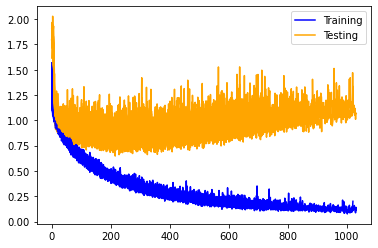

In [8]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

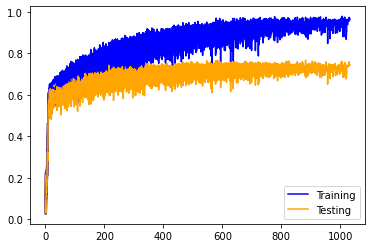

In [9]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

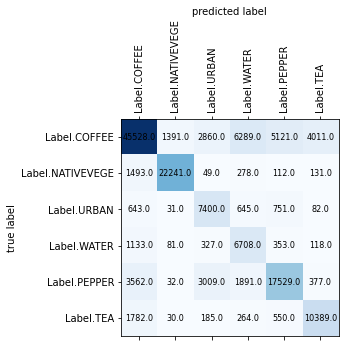

In [10]:
plot_confusion_matrix(conf_matrix, labels)

In [11]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.84091539 0.93426027 0.53506869 0.41729393 0.71793087 0.68764893]
Mean precision:  0.688853012796356

Recalls:  [0.69828221 0.91511685 0.77470687 0.76926606 0.66397727 0.78704545]
Mean recall:  0.7680657852953563

F-Score:  [0.76299009 0.92458948 0.63296553 0.54107683 0.68990082 0.73399746]
Mean f-score:  0.7142533673166302


# 1x16 conv, 0.25 SpatialDropout, 3x16 conv, 1x256 FC with 0.5 dropout

In [12]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    SpatialDropout2D(0.25),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Flatten(name='flat'),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS, early_stopping=True)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 9, 9, 4)           0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 9, 9, 4)           16        
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 9, 9, 16)          272       
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 9, 9, 16)          0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 9, 9, 16)          1040      
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 9, 9, 16)          1040      
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 9, 9, 16)         

57/57 [==============================] - 1s 9ms/step - loss: 0.7447 - accuracy: 0.6177 - val_loss: 0.7850 - val_accuracy: 0.6939
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6897 - accuracy: 0.6538 - val_loss: 0.8150 - val_accuracy: 0.6743
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7524 - accuracy: 0.6212 - val_loss: 0.8165 - val_accuracy: 0.6755
Epoch 105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7169 - accuracy: 0.6401 - val_loss: 0.8066 - val_accuracy: 0.6897
Epoch 106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7462 - accuracy: 0.6337 - val_loss: 0.8040 - val_accuracy: 0.6762
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7374 - accuracy: 0.6064 - val_loss: 0.8480 - val_accuracy: 0.6507
Epoch 108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6615 - accuracy: 0.6300 - val_loss: 0.8401 - val_accuracy: 0.6618
Epoch 1

Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6836 - accuracy: 0.6456 - val_loss: 0.7851 - val_accuracy: 0.6929
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6788 - accuracy: 0.6344 - val_loss: 0.7813 - val_accuracy: 0.7044
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7475 - accuracy: 0.6476 - val_loss: 0.7613 - val_accuracy: 0.7062
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6168 - accuracy: 0.6785 - val_loss: 0.8418 - val_accuracy: 0.6543
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6731 - accuracy: 0.6500 - val_loss: 0.8372 - val_accuracy: 0.6659
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6894 - accuracy: 0.6460 - val_loss: 0.7803 - val_accuracy: 0.6899
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5911 - accuracy: 0.6743 - val_loss: 0.7083 - val_accuracy:

Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6027 - accuracy: 0.6524 - val_loss: 0.7178 - val_accuracy: 0.7226
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6363 - accuracy: 0.6688 - val_loss: 0.7227 - val_accuracy: 0.7290
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5948 - accuracy: 0.7157 - val_loss: 0.7349 - val_accuracy: 0.7186
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5752 - accuracy: 0.7010 - val_loss: 0.7127 - val_accuracy: 0.7325
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5858 - accuracy: 0.7168 - val_loss: 0.7136 - val_accuracy: 0.7366
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5855 - accuracy: 0.7137 - val_loss: 0.7336 - val_accuracy: 0.7268
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6183 - accuracy: 0.6744 - val_loss: 0.7591 - val_accuracy:

Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5450 - accuracy: 0.7072 - val_loss: 0.7119 - val_accuracy: 0.7245
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5172 - accuracy: 0.7012 - val_loss: 0.6937 - val_accuracy: 0.7385
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5611 - accuracy: 0.7073 - val_loss: 0.7064 - val_accuracy: 0.7299
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5508 - accuracy: 0.6969 - val_loss: 0.7106 - val_accuracy: 0.7356
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5326 - accuracy: 0.7095 - val_loss: 0.7284 - val_accuracy: 0.7294
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5135 - accuracy: 0.7245 - val_loss: 0.7224 - val_accuracy: 0.7295
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5213 - accuracy: 0.7362 - val_loss: 0.7430 - val_accuracy:

Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5226 - accuracy: 0.7270 - val_loss: 0.7420 - val_accuracy: 0.7155
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4696 - accuracy: 0.7133 - val_loss: 0.6778 - val_accuracy: 0.7485
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5333 - accuracy: 0.7341 - val_loss: 0.7094 - val_accuracy: 0.7366
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5211 - accuracy: 0.7170 - val_loss: 0.6966 - val_accuracy: 0.7352
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5349 - accuracy: 0.7349 - val_loss: 0.7120 - val_accuracy: 0.7281
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5959 - accuracy: 0.6993 - val_loss: 0.6759 - val_accuracy: 0.7428
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5332 - accuracy: 0.7238 - val_loss: 0.7268 - val_accuracy:

Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5330 - accuracy: 0.6893 - val_loss: 0.7177 - val_accuracy: 0.7286
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4731 - accuracy: 0.7508 - val_loss: 0.7420 - val_accuracy: 0.7188
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5098 - accuracy: 0.7319 - val_loss: 0.7446 - val_accuracy: 0.7162
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5321 - accuracy: 0.7065 - val_loss: 0.6793 - val_accuracy: 0.7443
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5947 - accuracy: 0.7308 - val_loss: 0.7070 - val_accuracy: 0.7252
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5165 - accuracy: 0.7326 - val_loss: 0.7227 - val_accuracy: 0.7277
Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4879 - accuracy: 0.7089 - val_loss: 0.7054 - val_accuracy:

Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4918 - accuracy: 0.7303 - val_loss: 0.6888 - val_accuracy: 0.7493
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4540 - accuracy: 0.7462 - val_loss: 0.7403 - val_accuracy: 0.7139
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4926 - accuracy: 0.7381 - val_loss: 0.7248 - val_accuracy: 0.7226
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4991 - accuracy: 0.7392 - val_loss: 0.7317 - val_accuracy: 0.7237
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4579 - accuracy: 0.7320 - val_loss: 0.7154 - val_accuracy: 0.7362
Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4772 - accuracy: 0.7498 - val_loss: 0.7015 - val_accuracy: 0.7389
Epoch 450/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5278 - accuracy: 0.7425 - val_loss: 0.6930 - val_accuracy:

Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4875 - accuracy: 0.7083 - val_loss: 0.7015 - val_accuracy: 0.7488
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5149 - accuracy: 0.7441 - val_loss: 0.7617 - val_accuracy: 0.7269
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4811 - accuracy: 0.7582 - val_loss: 0.7137 - val_accuracy: 0.7382
Epoch 504/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5278 - accuracy: 0.7214 - val_loss: 0.7529 - val_accuracy: 0.7105
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5280 - accuracy: 0.7408 - val_loss: 0.6915 - val_accuracy: 0.7489
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4857 - accuracy: 0.7542 - val_loss: 0.7066 - val_accuracy: 0.7409
Epoch 507/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4334 - accuracy: 0.7819 - val_loss: 0.7104 - val_accuracy:

Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5001 - accuracy: 0.7380 - val_loss: 0.7025 - val_accuracy: 0.7556
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5598 - accuracy: 0.7338 - val_loss: 0.6805 - val_accuracy: 0.7550
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4570 - accuracy: 0.7231 - val_loss: 0.7184 - val_accuracy: 0.7394
Epoch 561/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4513 - accuracy: 0.7430 - val_loss: 0.7040 - val_accuracy: 0.7432
Epoch 562/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4931 - accuracy: 0.7285 - val_loss: 0.7082 - val_accuracy: 0.7383
Epoch 563/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4742 - accuracy: 0.7432 - val_loss: 0.7519 - val_accuracy: 0.7245
Epoch 564/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4033 - accuracy: 0.7750 - val_loss: 0.7025 - val_accuracy:

Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3933 - accuracy: 0.7726 - val_loss: 0.7014 - val_accuracy: 0.7461
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4364 - accuracy: 0.7412 - val_loss: 0.7756 - val_accuracy: 0.7201
Epoch 617/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4023 - accuracy: 0.7638 - val_loss: 0.7324 - val_accuracy: 0.7315
Epoch 618/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4256 - accuracy: 0.7539 - val_loss: 0.7198 - val_accuracy: 0.7425
Epoch 619/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4329 - accuracy: 0.7666 - val_loss: 0.7028 - val_accuracy: 0.7442
Epoch 620/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5116 - accuracy: 0.7382 - val_loss: 0.7201 - val_accuracy: 0.7281
Epoch 621/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4421 - accuracy: 0.7443 - val_loss: 0.7213 - val_accuracy:

Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4665 - accuracy: 0.7558 - val_loss: 0.7667 - val_accuracy: 0.7131
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4665 - accuracy: 0.7402 - val_loss: 0.7082 - val_accuracy: 0.7507
Epoch 674/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4329 - accuracy: 0.7604 - val_loss: 0.6826 - val_accuracy: 0.7586
Epoch 675/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4548 - accuracy: 0.7655 - val_loss: 0.6791 - val_accuracy: 0.7515
Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4791 - accuracy: 0.7338 - val_loss: 0.7356 - val_accuracy: 0.7416
Epoch 677/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4135 - accuracy: 0.7662 - val_loss: 0.7131 - val_accuracy: 0.7459
Epoch 678/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4023 - accuracy: 0.7584 - val_loss: 0.7402 - val_accuracy:

Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4753 - accuracy: 0.7272 - val_loss: 0.7121 - val_accuracy: 0.7482
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4295 - accuracy: 0.7679 - val_loss: 0.7226 - val_accuracy: 0.7522
Epoch 731/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4544 - accuracy: 0.7552 - val_loss: 0.7663 - val_accuracy: 0.7370
Epoch 732/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4467 - accuracy: 0.7482 - val_loss: 0.6605 - val_accuracy: 0.7689
Epoch 733/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4056 - accuracy: 0.7754 - val_loss: 0.7620 - val_accuracy: 0.7325
Epoch 734/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3580 - accuracy: 0.7729 - val_loss: 0.7364 - val_accuracy: 0.7458
Epoch 735/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4984 - accuracy: 0.7384 - val_loss: 0.6903 - val_accuracy:

Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4146 - accuracy: 0.7735 - val_loss: 0.7254 - val_accuracy: 0.7524
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4232 - accuracy: 0.7726 - val_loss: 0.7059 - val_accuracy: 0.7565
Epoch 788/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4118 - accuracy: 0.7773 - val_loss: 0.7604 - val_accuracy: 0.7271
Epoch 789/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4486 - accuracy: 0.7313 - val_loss: 0.7078 - val_accuracy: 0.7534
Epoch 790/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4463 - accuracy: 0.7503 - val_loss: 0.7436 - val_accuracy: 0.7452
Epoch 791/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4679 - accuracy: 0.7639 - val_loss: 0.7112 - val_accuracy: 0.7587
Epoch 792/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4695 - accuracy: 0.7702 - val_loss: 0.7170 - val_accuracy:

Epoch 843/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4314 - accuracy: 0.7718 - val_loss: 0.6987 - val_accuracy: 0.7657
Epoch 844/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4632 - accuracy: 0.7659 - val_loss: 0.7080 - val_accuracy: 0.7605
Epoch 845/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4146 - accuracy: 0.7624 - val_loss: 0.7621 - val_accuracy: 0.7419
Epoch 846/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4049 - accuracy: 0.7702 - val_loss: 0.7015 - val_accuracy: 0.7560
Epoch 847/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4226 - accuracy: 0.7598 - val_loss: 0.7089 - val_accuracy: 0.7548
Epoch 848/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4311 - accuracy: 0.7623 - val_loss: 0.7509 - val_accuracy: 0.7390
Epoch 849/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3882 - accuracy: 0.7651 - val_loss: 0.7244 - val_accuracy:

Epoch 900/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4588 - accuracy: 0.7814 - val_loss: 0.7060 - val_accuracy: 0.7561
Epoch 901/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3893 - accuracy: 0.7754 - val_loss: 0.7067 - val_accuracy: 0.7653
Epoch 902/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3846 - accuracy: 0.7814 - val_loss: 0.7607 - val_accuracy: 0.7561
Epoch 903/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3705 - accuracy: 0.7929 - val_loss: 0.6851 - val_accuracy: 0.7644
Epoch 904/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4970 - accuracy: 0.7659 - val_loss: 0.7259 - val_accuracy: 0.7447
Epoch 905/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4642 - accuracy: 0.7515 - val_loss: 0.8470 - val_accuracy: 0.7044
Epoch 906/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4854 - accuracy: 0.7338 - val_loss: 0.7256 - val_accuracy:

Epoch 957/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4736 - accuracy: 0.7581 - val_loss: 0.7287 - val_accuracy: 0.7394
Epoch 958/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4884 - accuracy: 0.7562 - val_loss: 0.7139 - val_accuracy: 0.7543
Epoch 959/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3800 - accuracy: 0.7786 - val_loss: 0.7987 - val_accuracy: 0.7298
Epoch 960/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4351 - accuracy: 0.7597 - val_loss: 0.7224 - val_accuracy: 0.7531
Epoch 961/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4201 - accuracy: 0.7864 - val_loss: 0.7048 - val_accuracy: 0.7541
Epoch 962/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3519 - accuracy: 0.7932 - val_loss: 0.7070 - val_accuracy: 0.7609
Epoch 963/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3909 - accuracy: 0.7830 - val_loss: 0.7271 - val_accuracy:

Epoch 1014/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3780 - accuracy: 0.7758 - val_loss: 0.7299 - val_accuracy: 0.7522
Epoch 1015/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4079 - accuracy: 0.7696 - val_loss: 0.7480 - val_accuracy: 0.7442
Epoch 1016/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4231 - accuracy: 0.7613 - val_loss: 0.7632 - val_accuracy: 0.7452
Epoch 1017/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4313 - accuracy: 0.7885 - val_loss: 0.7434 - val_accuracy: 0.7503
Epoch 1018/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4501 - accuracy: 0.7740 - val_loss: 0.7524 - val_accuracy: 0.7413
Epoch 1019/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4389 - accuracy: 0.7813 - val_loss: 0.7132 - val_accuracy: 0.7530
Epoch 1020/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4000 - accuracy: 0.7836 - val_loss: 0.7130 - val_ac

Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0387 - accuracy: 0.5435 - val_loss: 0.9394 - val_accuracy: 0.6242
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9604 - accuracy: 0.5725 - val_loss: 1.0598 - val_accuracy: 0.5519
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9139 - accuracy: 0.5654 - val_loss: 1.0079 - val_accuracy: 0.5664
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9696 - accuracy: 0.5668 - val_loss: 0.9819 - val_accuracy: 0.5933
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9429 - accuracy: 0.5598 - val_loss: 1.0516 - val_accuracy: 0.5371
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0233 - accuracy: 0.5254 - val_loss: 0.9878 - val_accuracy: 0.5795
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9686 - accuracy: 0.5641 - val_loss: 0.9818 - val_accuracy: 0.6002

57/57 [==============================] - 1s 9ms/step - loss: 0.6224 - accuracy: 0.6924 - val_loss: 0.8322 - val_accuracy: 0.6743
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7308 - accuracy: 0.6490 - val_loss: 0.8037 - val_accuracy: 0.6826
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6990 - accuracy: 0.6726 - val_loss: 0.7895 - val_accuracy: 0.6934
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6565 - accuracy: 0.6857 - val_loss: 0.8571 - val_accuracy: 0.6649
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6945 - accuracy: 0.6812 - val_loss: 0.7965 - val_accuracy: 0.6963
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6694 - accuracy: 0.6659 - val_loss: 0.7902 - val_accuracy: 0.7023
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6627 - accuracy: 0.6841 - val_loss: 0.8240 - val_accuracy: 0.6820
Epoch 1

Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6146 - accuracy: 0.6952 - val_loss: 0.8393 - val_accuracy: 0.6796
Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6214 - accuracy: 0.6897 - val_loss: 0.7816 - val_accuracy: 0.7017
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6370 - accuracy: 0.6846 - val_loss: 0.7590 - val_accuracy: 0.7126
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5727 - accuracy: 0.7107 - val_loss: 0.7470 - val_accuracy: 0.7177
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6462 - accuracy: 0.6906 - val_loss: 0.7900 - val_accuracy: 0.6974
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6279 - accuracy: 0.6556 - val_loss: 0.7639 - val_accuracy: 0.7067
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5733 - accuracy: 0.7149 - val_loss: 0.7100 - val_accuracy:

Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4902 - accuracy: 0.7415 - val_loss: 0.7854 - val_accuracy: 0.7006
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5361 - accuracy: 0.7269 - val_loss: 0.8105 - val_accuracy: 0.6952
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5339 - accuracy: 0.7198 - val_loss: 0.7774 - val_accuracy: 0.7051
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5330 - accuracy: 0.7165 - val_loss: 0.7741 - val_accuracy: 0.6998
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5856 - accuracy: 0.7114 - val_loss: 0.7339 - val_accuracy: 0.7230
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6210 - accuracy: 0.6950 - val_loss: 0.7157 - val_accuracy: 0.7241
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6136 - accuracy: 0.7009 - val_loss: 0.7706 - val_accuracy:

Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5501 - accuracy: 0.7015 - val_loss: 0.7757 - val_accuracy: 0.7047
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5112 - accuracy: 0.7322 - val_loss: 0.7714 - val_accuracy: 0.7097
Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5203 - accuracy: 0.7357 - val_loss: 0.7733 - val_accuracy: 0.7050
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5071 - accuracy: 0.7118 - val_loss: 0.8337 - val_accuracy: 0.6968
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5288 - accuracy: 0.7184 - val_loss: 0.7549 - val_accuracy: 0.7257
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5260 - accuracy: 0.7311 - val_loss: 0.7221 - val_accuracy: 0.7352
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5462 - accuracy: 0.7191 - val_loss: 0.7981 - val_accuracy:

Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4350 - accuracy: 0.7517 - val_loss: 0.7584 - val_accuracy: 0.7228
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4657 - accuracy: 0.7344 - val_loss: 0.7554 - val_accuracy: 0.7171
Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4718 - accuracy: 0.7584 - val_loss: 0.8471 - val_accuracy: 0.6964
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4732 - accuracy: 0.7403 - val_loss: 0.7952 - val_accuracy: 0.7059
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4845 - accuracy: 0.7452 - val_loss: 0.7522 - val_accuracy: 0.7249
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4632 - accuracy: 0.7599 - val_loss: 0.7224 - val_accuracy: 0.7316
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4473 - accuracy: 0.7615 - val_loss: 0.7794 - val_accuracy:

Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4483 - accuracy: 0.7502 - val_loss: 0.7254 - val_accuracy: 0.7446
Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4021 - accuracy: 0.7591 - val_loss: 0.7943 - val_accuracy: 0.7138
Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4707 - accuracy: 0.7575 - val_loss: 0.7535 - val_accuracy: 0.7325
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4814 - accuracy: 0.7391 - val_loss: 0.7592 - val_accuracy: 0.7335
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4263 - accuracy: 0.7754 - val_loss: 0.7346 - val_accuracy: 0.7294
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5489 - accuracy: 0.7210 - val_loss: 0.7626 - val_accuracy: 0.7237
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4678 - accuracy: 0.7479 - val_loss: 0.7756 - val_accuracy:

Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4029 - accuracy: 0.7729 - val_loss: 0.7735 - val_accuracy: 0.7158
Epoch 480/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4200 - accuracy: 0.7626 - val_loss: 0.7217 - val_accuracy: 0.7438
Epoch 481/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4307 - accuracy: 0.7750 - val_loss: 0.7639 - val_accuracy: 0.7236
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4737 - accuracy: 0.7422 - val_loss: 0.7576 - val_accuracy: 0.7215
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4442 - accuracy: 0.7531 - val_loss: 0.7538 - val_accuracy: 0.7306
Epoch 484/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5109 - accuracy: 0.7373 - val_loss: 0.7339 - val_accuracy: 0.7359
Epoch 485/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5049 - accuracy: 0.7555 - val_loss: 0.7301 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8291 - accuracy: 0.6072 - val_loss: 0.9196 - val_accuracy: 0.6443
Epoch 34/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7737 - accuracy: 0.6160 - val_loss: 0.8682 - val_accuracy: 0.6659
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9043 - accuracy: 0.5835 - val_loss: 0.9223 - val_accuracy: 0.6407
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8773 - accuracy: 0.5817 - val_loss: 0.8433 - val_accuracy: 0.6875
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7969 - accuracy: 0.6227 - val_loss: 0.9169 - val_accuracy: 0.6382
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8104 - accuracy: 0.6033 - val_loss: 0.8250 - val_accuracy: 0.6879
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8925 - accuracy: 0.6182 - val_loss: 0.9199 - val_accuracy: 0.6408
Epoch 40/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6535 - accuracy: 0.6957 - val_loss: 0.7672 - val_accuracy: 0.7027
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5637 - accuracy: 0.7015 - val_loss: 0.8130 - val_accuracy: 0.7012
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6458 - accuracy: 0.6931 - val_loss: 0.7590 - val_accuracy: 0.7103
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6229 - accuracy: 0.7019 - val_loss: 0.7979 - val_accuracy: 0.6914
Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5828 - accuracy: 0.7339 - val_loss: 0.8027 - val_accuracy: 0.6945
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6346 - accuracy: 0.6582 - val_loss: 0.8045 - val_accuracy: 0.6907
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6174 - accuracy: 0.7012 - val_loss: 0.9280 - val_accuracy: 0.6560
Epoch 1

Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5266 - accuracy: 0.7320 - val_loss: 0.7639 - val_accuracy: 0.7116
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5433 - accuracy: 0.7125 - val_loss: 0.7421 - val_accuracy: 0.7290
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5436 - accuracy: 0.7249 - val_loss: 0.7772 - val_accuracy: 0.7135
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5626 - accuracy: 0.7158 - val_loss: 0.7660 - val_accuracy: 0.7108
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5566 - accuracy: 0.7028 - val_loss: 0.7778 - val_accuracy: 0.7092
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5280 - accuracy: 0.7429 - val_loss: 0.7451 - val_accuracy: 0.7228
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5130 - accuracy: 0.7157 - val_loss: 0.7785 - val_accuracy:

Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5268 - accuracy: 0.7332 - val_loss: 0.7121 - val_accuracy: 0.7373
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5676 - accuracy: 0.7352 - val_loss: 0.7518 - val_accuracy: 0.7203
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4743 - accuracy: 0.7367 - val_loss: 0.7375 - val_accuracy: 0.7327
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5410 - accuracy: 0.7202 - val_loss: 0.7963 - val_accuracy: 0.7008
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5384 - accuracy: 0.7283 - val_loss: 0.7533 - val_accuracy: 0.7139
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5524 - accuracy: 0.7304 - val_loss: 0.7701 - val_accuracy: 0.7088
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4920 - accuracy: 0.7371 - val_loss: 0.7412 - val_accuracy:

Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4649 - accuracy: 0.7359 - val_loss: 0.8026 - val_accuracy: 0.7105
Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4537 - accuracy: 0.7429 - val_loss: 0.7624 - val_accuracy: 0.7287
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4651 - accuracy: 0.7257 - val_loss: 0.7493 - val_accuracy: 0.7283
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5207 - accuracy: 0.7364 - val_loss: 0.7422 - val_accuracy: 0.7339
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4553 - accuracy: 0.7677 - val_loss: 0.7606 - val_accuracy: 0.7282
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5017 - accuracy: 0.7420 - val_loss: 0.7806 - val_accuracy: 0.7107
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5712 - accuracy: 0.6849 - val_loss: 0.7450 - val_accuracy:

Epoch 375/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4343 - accuracy: 0.7485 - val_loss: 0.8872 - val_accuracy: 0.6910
Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4835 - accuracy: 0.7354 - val_loss: 0.7319 - val_accuracy: 0.7401
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5030 - accuracy: 0.7578 - val_loss: 0.7546 - val_accuracy: 0.7342
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5368 - accuracy: 0.7368 - val_loss: 0.7903 - val_accuracy: 0.7295
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4886 - accuracy: 0.7380 - val_loss: 0.7555 - val_accuracy: 0.7244
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4645 - accuracy: 0.7268 - val_loss: 0.7715 - val_accuracy: 0.7316
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4408 - accuracy: 0.7561 - val_loss: 0.7305 - val_accuracy:

Epoch 432/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4367 - accuracy: 0.7677 - val_loss: 0.7865 - val_accuracy: 0.7279
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5054 - accuracy: 0.7563 - val_loss: 0.7477 - val_accuracy: 0.7327
Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4121 - accuracy: 0.7508 - val_loss: 0.7644 - val_accuracy: 0.7393
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4393 - accuracy: 0.7381 - val_loss: 0.7540 - val_accuracy: 0.7361
Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3950 - accuracy: 0.7701 - val_loss: 0.7827 - val_accuracy: 0.7320
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4676 - accuracy: 0.7380 - val_loss: 0.7971 - val_accuracy: 0.7226
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4442 - accuracy: 0.7409 - val_loss: 0.7419 - val_accuracy:

Epoch 489/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4409 - accuracy: 0.7506 - val_loss: 0.7250 - val_accuracy: 0.7564
Epoch 490/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4596 - accuracy: 0.7514 - val_loss: 0.7782 - val_accuracy: 0.7404
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5246 - accuracy: 0.7496 - val_loss: 0.7402 - val_accuracy: 0.7355
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4558 - accuracy: 0.7503 - val_loss: 0.7710 - val_accuracy: 0.7257
Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4813 - accuracy: 0.7106 - val_loss: 0.8067 - val_accuracy: 0.7207
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5060 - accuracy: 0.7043 - val_loss: 0.7674 - val_accuracy: 0.7397
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4541 - accuracy: 0.7354 - val_loss: 0.7241 - val_accuracy:

Epoch 546/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3685 - accuracy: 0.7951 - val_loss: 0.7177 - val_accuracy: 0.7563
Epoch 547/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4156 - accuracy: 0.7902 - val_loss: 0.8014 - val_accuracy: 0.7104
Epoch 548/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3649 - accuracy: 0.7734 - val_loss: 0.7277 - val_accuracy: 0.7523
Epoch 549/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4065 - accuracy: 0.7703 - val_loss: 0.7327 - val_accuracy: 0.7412
Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4492 - accuracy: 0.7725 - val_loss: 0.8688 - val_accuracy: 0.6956
Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4783 - accuracy: 0.7321 - val_loss: 0.7544 - val_accuracy: 0.7434
Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4352 - accuracy: 0.7434 - val_loss: 0.7406 - val_accuracy:

Epoch 603/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3877 - accuracy: 0.7833 - val_loss: 0.7639 - val_accuracy: 0.7393
Epoch 604/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3976 - accuracy: 0.7585 - val_loss: 0.7534 - val_accuracy: 0.7457
Epoch 605/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4282 - accuracy: 0.7669 - val_loss: 0.7464 - val_accuracy: 0.7480
Epoch 606/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3877 - accuracy: 0.7671 - val_loss: 0.7903 - val_accuracy: 0.7262
Epoch 607/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4501 - accuracy: 0.7840 - val_loss: 0.7426 - val_accuracy: 0.7404
Epoch 608/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4356 - accuracy: 0.7695 - val_loss: 0.7125 - val_accuracy: 0.7620
Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4387 - accuracy: 0.7555 - val_loss: 0.7233 - val_accuracy:

Epoch 660/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4073 - accuracy: 0.7715 - val_loss: 0.7653 - val_accuracy: 0.7498
Epoch 661/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3667 - accuracy: 0.7916 - val_loss: 0.7885 - val_accuracy: 0.7536
Epoch 662/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3883 - accuracy: 0.8099 - val_loss: 0.7919 - val_accuracy: 0.7350
Epoch 663/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4048 - accuracy: 0.7653 - val_loss: 0.7645 - val_accuracy: 0.7412
Epoch 664/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4370 - accuracy: 0.7707 - val_loss: 0.7572 - val_accuracy: 0.7506
Epoch 665/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3817 - accuracy: 0.7966 - val_loss: 0.7405 - val_accuracy: 0.7415
Epoch 666/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3831 - accuracy: 0.7710 - val_loss: 0.7641 - val_accuracy:

Epoch 717/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3992 - accuracy: 0.7796 - val_loss: 0.7491 - val_accuracy: 0.7485
Epoch 718/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3590 - accuracy: 0.7692 - val_loss: 0.7544 - val_accuracy: 0.7620
Epoch 719/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4308 - accuracy: 0.7856 - val_loss: 0.7671 - val_accuracy: 0.7439
Epoch 720/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4202 - accuracy: 0.7751 - val_loss: 0.7690 - val_accuracy: 0.7545
Epoch 721/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3933 - accuracy: 0.7808 - val_loss: 0.7774 - val_accuracy: 0.7479
Epoch 722/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3935 - accuracy: 0.7746 - val_loss: 0.7541 - val_accuracy: 0.7542
Epoch 723/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3626 - accuracy: 0.7888 - val_loss: 0.7790 - val_accuracy:

Epoch 774/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4042 - accuracy: 0.7594 - val_loss: 0.7896 - val_accuracy: 0.7439
Epoch 775/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3927 - accuracy: 0.7873 - val_loss: 0.7687 - val_accuracy: 0.7462
Epoch 776/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4205 - accuracy: 0.7815 - val_loss: 0.7623 - val_accuracy: 0.7542
Epoch 777/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3551 - accuracy: 0.7883 - val_loss: 0.7776 - val_accuracy: 0.7579
Epoch 778/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3547 - accuracy: 0.8017 - val_loss: 0.7628 - val_accuracy: 0.7530
Epoch 779/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3592 - accuracy: 0.7637 - val_loss: 0.7753 - val_accuracy: 0.7549
Epoch 780/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3698 - accuracy: 0.7808 - val_loss: 0.7761 - val_accuracy:

Epoch 831/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4307 - accuracy: 0.7536 - val_loss: 0.7678 - val_accuracy: 0.7469
Epoch 832/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3217 - accuracy: 0.7971 - val_loss: 0.7498 - val_accuracy: 0.7603
Epoch 833/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3571 - accuracy: 0.8058 - val_loss: 0.7624 - val_accuracy: 0.7451
Epoch 834/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3236 - accuracy: 0.7924 - val_loss: 0.7564 - val_accuracy: 0.7552
Epoch 835/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3490 - accuracy: 0.7812 - val_loss: 0.8209 - val_accuracy: 0.7312
Epoch 836/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4470 - accuracy: 0.7957 - val_loss: 0.7611 - val_accuracy: 0.7544
Epoch 837/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3476 - accuracy: 0.8057 - val_loss: 0.7439 - val_accuracy:

Epoch 888/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4179 - accuracy: 0.7572 - val_loss: 0.7440 - val_accuracy: 0.7633
Epoch 889/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3909 - accuracy: 0.7973 - val_loss: 0.7816 - val_accuracy: 0.7461
Epoch 890/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3749 - accuracy: 0.7828 - val_loss: 0.8032 - val_accuracy: 0.7443
Epoch 891/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4004 - accuracy: 0.7740 - val_loss: 0.7746 - val_accuracy: 0.7475
Epoch 892/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3858 - accuracy: 0.7888 - val_loss: 0.8459 - val_accuracy: 0.7352
Epoch 893/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4756 - accuracy: 0.7664 - val_loss: 0.7671 - val_accuracy: 0.7536
Epoch 894/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3658 - accuracy: 0.8023 - val_loss: 0.7816 - val_accuracy:

Epoch 945/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3767 - accuracy: 0.7932 - val_loss: 0.7531 - val_accuracy: 0.7599
Epoch 946/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3345 - accuracy: 0.7957 - val_loss: 0.8207 - val_accuracy: 0.7412
Epoch 947/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3661 - accuracy: 0.7908 - val_loss: 0.8230 - val_accuracy: 0.7472
Epoch 948/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3304 - accuracy: 0.8068 - val_loss: 0.7860 - val_accuracy: 0.7609
Epoch 949/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3663 - accuracy: 0.7886 - val_loss: 0.7716 - val_accuracy: 0.7652
Epoch 950/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3791 - accuracy: 0.8003 - val_loss: 0.7957 - val_accuracy: 0.7530
Epoch 951/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3893 - accuracy: 0.7964 - val_loss: 0.7933 - val_accuracy:

Epoch 1002/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3286 - accuracy: 0.8100 - val_loss: 0.7889 - val_accuracy: 0.7594
Epoch 1003/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3597 - accuracy: 0.7897 - val_loss: 0.7632 - val_accuracy: 0.7584
Epoch 1004/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3259 - accuracy: 0.8009 - val_loss: 0.7963 - val_accuracy: 0.7468
Epoch 1005/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3711 - accuracy: 0.7930 - val_loss: 0.7528 - val_accuracy: 0.7580
Epoch 1006/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3258 - accuracy: 0.8039 - val_loss: 0.8027 - val_accuracy: 0.7457
Epoch 1007/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3938 - accuracy: 0.7861 - val_loss: 0.7497 - val_accuracy: 0.7665
Epoch 1008/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3404 - accuracy: 0.8112 - val_loss: 0.7804 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 0.4072 - accuracy: 0.7930 - val_loss: 0.7984 - val_accuracy: 0.7344
Epoch 1115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3345 - accuracy: 0.7935 - val_loss: 0.7582 - val_accuracy: 0.7595
Epoch 1116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3174 - accuracy: 0.8068 - val_loss: 0.7685 - val_accuracy: 0.7750
Epoch 1117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4157 - accuracy: 0.8111 - val_loss: 0.7530 - val_accuracy: 0.7713
Epoch 1118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3565 - accuracy: 0.8037 - val_loss: 0.7673 - val_accuracy: 0.7576
Epoch 1119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3588 - accuracy: 0.7833 - val_loss: 0.8534 - val_accuracy: 0.7247
Epoch 1120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4208 - accuracy: 0.7780 - val_loss: 0.7356 - val_accuracy: 0.7654
E

57/57 [==============================] - 1s 9ms/step - loss: 0.3285 - accuracy: 0.8233 - val_loss: 0.8227 - val_accuracy: 0.7454
Epoch 1227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3139 - accuracy: 0.8050 - val_loss: 0.7862 - val_accuracy: 0.7666
Epoch 1228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3611 - accuracy: 0.8069 - val_loss: 0.7685 - val_accuracy: 0.7675
Epoch 1229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3862 - accuracy: 0.8072 - val_loss: 0.7500 - val_accuracy: 0.7690
Epoch 1230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3466 - accuracy: 0.8242 - val_loss: 0.7735 - val_accuracy: 0.7601
Epoch 1231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3506 - accuracy: 0.8007 - val_loss: 0.8941 - val_accuracy: 0.7487
Epoch 1232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3252 - accuracy: 0.8057 - val_loss: 0.7670 - val_accuracy: 0.7655
E

Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9534 - accuracy: 0.5317 - val_loss: 1.0220 - val_accuracy: 0.5727
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8901 - accuracy: 0.5468 - val_loss: 0.9865 - val_accuracy: 0.5852
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8746 - accuracy: 0.5753 - val_loss: 1.0396 - val_accuracy: 0.5542
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8538 - accuracy: 0.5698 - val_loss: 0.9607 - val_accuracy: 0.6070
Epoch 33/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8799 - accuracy: 0.5852 - val_loss: 0.9428 - val_accuracy: 0.5978
Epoch 34/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9134 - accuracy: 0.5748 - val_loss: 1.0143 - val_accuracy: 0.5691
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8809 - accuracy: 0.5676 - val_loss: 0.9523 - val_accuracy: 0.5982

57/57 [==============================] - 1s 9ms/step - loss: 0.5856 - accuracy: 0.6970 - val_loss: 0.8192 - val_accuracy: 0.6913
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6000 - accuracy: 0.6808 - val_loss: 0.8170 - val_accuracy: 0.7009
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6265 - accuracy: 0.7112 - val_loss: 0.8041 - val_accuracy: 0.7023
Epoch 146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6954 - accuracy: 0.6667 - val_loss: 0.7664 - val_accuracy: 0.7146
Epoch 147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6728 - accuracy: 0.6727 - val_loss: 0.7951 - val_accuracy: 0.7017
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5733 - accuracy: 0.7001 - val_loss: 0.8459 - val_accuracy: 0.6700
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5850 - accuracy: 0.6676 - val_loss: 0.8667 - val_accuracy: 0.6692
Epoch 1

Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5401 - accuracy: 0.6753 - val_loss: 0.8001 - val_accuracy: 0.7020
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5241 - accuracy: 0.7142 - val_loss: 0.8292 - val_accuracy: 0.6808
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6436 - accuracy: 0.6725 - val_loss: 0.8464 - val_accuracy: 0.6910
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5776 - accuracy: 0.6826 - val_loss: 0.7785 - val_accuracy: 0.7093
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5195 - accuracy: 0.6817 - val_loss: 0.7659 - val_accuracy: 0.7145
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5377 - accuracy: 0.7113 - val_loss: 0.9246 - val_accuracy: 0.6564
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5541 - accuracy: 0.6882 - val_loss: 0.7620 - val_accuracy:

Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5197 - accuracy: 0.7095 - val_loss: 0.7311 - val_accuracy: 0.7333
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5861 - accuracy: 0.7137 - val_loss: 0.8516 - val_accuracy: 0.7015
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5972 - accuracy: 0.6839 - val_loss: 0.8266 - val_accuracy: 0.7023
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4956 - accuracy: 0.7377 - val_loss: 0.8956 - val_accuracy: 0.6704
Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5338 - accuracy: 0.6962 - val_loss: 0.7614 - val_accuracy: 0.7253
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5767 - accuracy: 0.7132 - val_loss: 0.7597 - val_accuracy: 0.7276
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5727 - accuracy: 0.7307 - val_loss: 0.7996 - val_accuracy:

Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5356 - accuracy: 0.7401 - val_loss: 0.8189 - val_accuracy: 0.6989
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4531 - accuracy: 0.7250 - val_loss: 0.8330 - val_accuracy: 0.6962
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5261 - accuracy: 0.6968 - val_loss: 0.7958 - val_accuracy: 0.7134
Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4905 - accuracy: 0.7186 - val_loss: 0.7962 - val_accuracy: 0.7150
Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4716 - accuracy: 0.7220 - val_loss: 0.7323 - val_accuracy: 0.7388
Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5028 - accuracy: 0.7477 - val_loss: 0.8272 - val_accuracy: 0.7020
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4483 - accuracy: 0.7442 - val_loss: 0.7719 - val_accuracy:

Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5232 - accuracy: 0.7161 - val_loss: 0.7883 - val_accuracy: 0.7255
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4114 - accuracy: 0.7702 - val_loss: 0.7380 - val_accuracy: 0.7439
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5123 - accuracy: 0.7465 - val_loss: 0.7648 - val_accuracy: 0.7280
Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4400 - accuracy: 0.7632 - val_loss: 0.8036 - val_accuracy: 0.7271
Epoch 375/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4836 - accuracy: 0.7213 - val_loss: 0.7601 - val_accuracy: 0.7332
Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4491 - accuracy: 0.7541 - val_loss: 0.9028 - val_accuracy: 0.6920
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4687 - accuracy: 0.7220 - val_loss: 0.7937 - val_accuracy:

Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4361 - accuracy: 0.7365 - val_loss: 0.8290 - val_accuracy: 0.7190
Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4527 - accuracy: 0.7378 - val_loss: 0.7886 - val_accuracy: 0.7343
Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4298 - accuracy: 0.7580 - val_loss: 0.7929 - val_accuracy: 0.7328
Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4403 - accuracy: 0.7639 - val_loss: 0.7598 - val_accuracy: 0.7487
Epoch 432/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5101 - accuracy: 0.7411 - val_loss: 0.7768 - val_accuracy: 0.7375
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4684 - accuracy: 0.7593 - val_loss: 0.7714 - val_accuracy: 0.7430
Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5011 - accuracy: 0.7520 - val_loss: 0.8322 - val_accuracy:

Epoch 485/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4404 - accuracy: 0.7575 - val_loss: 0.8164 - val_accuracy: 0.7404
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4020 - accuracy: 0.7889 - val_loss: 0.8551 - val_accuracy: 0.7190
Epoch 487/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4065 - accuracy: 0.7604 - val_loss: 0.8518 - val_accuracy: 0.7180
Epoch 488/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4583 - accuracy: 0.7406 - val_loss: 0.8135 - val_accuracy: 0.7217
Epoch 489/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4502 - accuracy: 0.7560 - val_loss: 0.8225 - val_accuracy: 0.7298
Epoch 490/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4644 - accuracy: 0.7548 - val_loss: 0.8048 - val_accuracy: 0.7253
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4891 - accuracy: 0.7602 - val_loss: 0.8400 - val_accuracy:

Epoch 542/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4635 - accuracy: 0.7452 - val_loss: 0.7909 - val_accuracy: 0.7348
Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3919 - accuracy: 0.7818 - val_loss: 0.7848 - val_accuracy: 0.7393
Epoch 544/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4383 - accuracy: 0.7681 - val_loss: 0.8270 - val_accuracy: 0.7310
Epoch 545/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3908 - accuracy: 0.7755 - val_loss: 0.7894 - val_accuracy: 0.7495
Epoch 546/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3859 - accuracy: 0.7977 - val_loss: 0.7959 - val_accuracy: 0.7373
Epoch 547/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4500 - accuracy: 0.7504 - val_loss: 0.7757 - val_accuracy: 0.7343

Fold  5 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.6560 - accuracy: 0.2181 - val_loss: 1.

57/57 [==============================] - 1s 9ms/step - loss: 0.6956 - accuracy: 0.6809 - val_loss: 0.8208 - val_accuracy: 0.6811
Epoch 110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7266 - accuracy: 0.6650 - val_loss: 0.8184 - val_accuracy: 0.6734
Epoch 111/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6413 - accuracy: 0.6714 - val_loss: 0.8516 - val_accuracy: 0.6561
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7484 - accuracy: 0.6647 - val_loss: 0.8414 - val_accuracy: 0.6704
Epoch 113/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6549 - accuracy: 0.6682 - val_loss: 0.8046 - val_accuracy: 0.6857
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7102 - accuracy: 0.6629 - val_loss: 0.8700 - val_accuracy: 0.6377
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6988 - accuracy: 0.6482 - val_loss: 0.8177 - val_accuracy: 0.6869
Epoch 1

Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6065 - accuracy: 0.6745 - val_loss: 0.8438 - val_accuracy: 0.6702
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5935 - accuracy: 0.6829 - val_loss: 0.7815 - val_accuracy: 0.7001
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5978 - accuracy: 0.7178 - val_loss: 0.8010 - val_accuracy: 0.6914
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6646 - accuracy: 0.6816 - val_loss: 0.7625 - val_accuracy: 0.7050
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6257 - accuracy: 0.7168 - val_loss: 0.8299 - val_accuracy: 0.6838
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6044 - accuracy: 0.7081 - val_loss: 0.8373 - val_accuracy: 0.6845
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6115 - accuracy: 0.7004 - val_loss: 0.7807 - val_accuracy:

Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5443 - accuracy: 0.7008 - val_loss: 0.7908 - val_accuracy: 0.6983
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5455 - accuracy: 0.7224 - val_loss: 0.8009 - val_accuracy: 0.6860
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5085 - accuracy: 0.7272 - val_loss: 0.8314 - val_accuracy: 0.6772
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5283 - accuracy: 0.7104 - val_loss: 0.7793 - val_accuracy: 0.6991
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5746 - accuracy: 0.6850 - val_loss: 0.7410 - val_accuracy: 0.7244
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5488 - accuracy: 0.7283 - val_loss: 0.8071 - val_accuracy: 0.6876
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4757 - accuracy: 0.7527 - val_loss: 0.8061 - val_accuracy:

Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5248 - accuracy: 0.7477 - val_loss: 0.7667 - val_accuracy: 0.7183
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5365 - accuracy: 0.7365 - val_loss: 0.8227 - val_accuracy: 0.6930
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5290 - accuracy: 0.7404 - val_loss: 0.7925 - val_accuracy: 0.7013
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5171 - accuracy: 0.7184 - val_loss: 0.8049 - val_accuracy: 0.6996
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5972 - accuracy: 0.7142 - val_loss: 0.7620 - val_accuracy: 0.7095
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5135 - accuracy: 0.7221 - val_loss: 0.8188 - val_accuracy: 0.6962
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6057 - accuracy: 0.7182 - val_loss: 0.7471 - val_accuracy:

Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4806 - accuracy: 0.7453 - val_loss: 0.7690 - val_accuracy: 0.7115
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5245 - accuracy: 0.7479 - val_loss: 0.8539 - val_accuracy: 0.6766
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5032 - accuracy: 0.7222 - val_loss: 0.7615 - val_accuracy: 0.7135
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5042 - accuracy: 0.7482 - val_loss: 0.8064 - val_accuracy: 0.6994
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4603 - accuracy: 0.7486 - val_loss: 0.7488 - val_accuracy: 0.7228
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4961 - accuracy: 0.7404 - val_loss: 0.7994 - val_accuracy: 0.7063
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5698 - accuracy: 0.7226 - val_loss: 0.7838 - val_accuracy:

Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5132 - accuracy: 0.7563 - val_loss: 0.8507 - val_accuracy: 0.6830
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4306 - accuracy: 0.7407 - val_loss: 0.7422 - val_accuracy: 0.7301
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4648 - accuracy: 0.7719 - val_loss: 0.7620 - val_accuracy: 0.7247
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4723 - accuracy: 0.7507 - val_loss: 0.7846 - val_accuracy: 0.7183
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4404 - accuracy: 0.7474 - val_loss: 0.8498 - val_accuracy: 0.6849
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4543 - accuracy: 0.7442 - val_loss: 0.7890 - val_accuracy: 0.7228
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4869 - accuracy: 0.7297 - val_loss: 0.8221 - val_accuracy:

Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4644 - accuracy: 0.7485 - val_loss: 0.7998 - val_accuracy: 0.7225
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4442 - accuracy: 0.7613 - val_loss: 0.7597 - val_accuracy: 0.7412
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4919 - accuracy: 0.7645 - val_loss: 0.8281 - val_accuracy: 0.7066
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4818 - accuracy: 0.7443 - val_loss: 0.8620 - val_accuracy: 0.6829
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4437 - accuracy: 0.7466 - val_loss: 0.7616 - val_accuracy: 0.7335
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4437 - accuracy: 0.7693 - val_loss: 0.7743 - val_accuracy: 0.7271
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4397 - accuracy: 0.7698 - val_loss: 0.7824 - val_accuracy:

Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4425 - accuracy: 0.7653 - val_loss: 0.7906 - val_accuracy: 0.7240
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4823 - accuracy: 0.7386 - val_loss: 0.7750 - val_accuracy: 0.7271
Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4018 - accuracy: 0.7660 - val_loss: 0.7995 - val_accuracy: 0.7202
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4766 - accuracy: 0.7710 - val_loss: 0.7746 - val_accuracy: 0.7173
Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4358 - accuracy: 0.7592 - val_loss: 0.7644 - val_accuracy: 0.7280
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4871 - accuracy: 0.7597 - val_loss: 0.7504 - val_accuracy: 0.7306
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4214 - accuracy: 0.7758 - val_loss: 0.7883 - val_accuracy:

Epoch 565/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4183 - accuracy: 0.7666 - val_loss: 0.8073 - val_accuracy: 0.7149
Epoch 566/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4235 - accuracy: 0.7697 - val_loss: 0.7549 - val_accuracy: 0.7367
Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3734 - accuracy: 0.8045 - val_loss: 0.8134 - val_accuracy: 0.7203
Epoch 568/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4783 - accuracy: 0.7790 - val_loss: 0.8074 - val_accuracy: 0.7168
Epoch 569/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4886 - accuracy: 0.7453 - val_loss: 0.8132 - val_accuracy: 0.7123
Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4264 - accuracy: 0.7829 - val_loss: 0.7925 - val_accuracy: 0.7248
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4320 - accuracy: 0.7806 - val_loss: 0.8537 - val_accuracy:

Epoch 622/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4215 - accuracy: 0.7754 - val_loss: 0.7845 - val_accuracy: 0.7253
Epoch 623/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4535 - accuracy: 0.7703 - val_loss: 0.8137 - val_accuracy: 0.7203
Epoch 624/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4153 - accuracy: 0.7939 - val_loss: 0.8196 - val_accuracy: 0.7190
Epoch 625/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4037 - accuracy: 0.8003 - val_loss: 0.7941 - val_accuracy: 0.7335
Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4019 - accuracy: 0.7923 - val_loss: 0.7999 - val_accuracy: 0.7369
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3764 - accuracy: 0.7997 - val_loss: 0.8797 - val_accuracy: 0.6993
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4358 - accuracy: 0.7472 - val_loss: 0.7817 - val_accuracy:

Epoch 679/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3966 - accuracy: 0.7927 - val_loss: 0.7976 - val_accuracy: 0.7241
Epoch 680/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3993 - accuracy: 0.7955 - val_loss: 0.8106 - val_accuracy: 0.7202
Epoch 681/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4267 - accuracy: 0.7715 - val_loss: 0.7879 - val_accuracy: 0.7340
Epoch 682/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3723 - accuracy: 0.7944 - val_loss: 0.7791 - val_accuracy: 0.7450
Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4019 - accuracy: 0.7937 - val_loss: 0.7914 - val_accuracy: 0.7291
Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4209 - accuracy: 0.7474 - val_loss: 0.7959 - val_accuracy: 0.7255
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3650 - accuracy: 0.7912 - val_loss: 0.8159 - val_accuracy:

Epoch 736/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4131 - accuracy: 0.8011 - val_loss: 0.8184 - val_accuracy: 0.7222
Epoch 737/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4179 - accuracy: 0.7848 - val_loss: 0.7695 - val_accuracy: 0.7460
Epoch 738/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3989 - accuracy: 0.7816 - val_loss: 0.8897 - val_accuracy: 0.6886
Epoch 739/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4360 - accuracy: 0.7747 - val_loss: 0.8517 - val_accuracy: 0.7036
Epoch 740/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4048 - accuracy: 0.7779 - val_loss: 0.8040 - val_accuracy: 0.7378
Epoch 741/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4494 - accuracy: 0.7829 - val_loss: 0.7661 - val_accuracy: 0.7389
Epoch 742/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3937 - accuracy: 0.7778 - val_loss: 0.8092 - val_accuracy:

Epoch 793/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3863 - accuracy: 0.7960 - val_loss: 0.7852 - val_accuracy: 0.7384
Epoch 794/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3835 - accuracy: 0.7858 - val_loss: 0.7725 - val_accuracy: 0.7419
Epoch 795/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3736 - accuracy: 0.8200 - val_loss: 0.8159 - val_accuracy: 0.7171
Epoch 796/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4167 - accuracy: 0.7986 - val_loss: 0.8323 - val_accuracy: 0.7249
Epoch 797/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3828 - accuracy: 0.7823 - val_loss: 0.8128 - val_accuracy: 0.7253
Epoch 798/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3293 - accuracy: 0.8010 - val_loss: 0.7873 - val_accuracy: 0.7346
Epoch 799/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3600 - accuracy: 0.8018 - val_loss: 0.7923 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8345 - accuracy: 0.5967 - val_loss: 0.9588 - val_accuracy: 0.6056
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8377 - accuracy: 0.6186 - val_loss: 0.9094 - val_accuracy: 0.6246
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8437 - accuracy: 0.5980 - val_loss: 0.9377 - val_accuracy: 0.6060
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8574 - accuracy: 0.5861 - val_loss: 0.9857 - val_accuracy: 0.5946
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8365 - accuracy: 0.5952 - val_loss: 0.9257 - val_accuracy: 0.6281
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8640 - accuracy: 0.6031 - val_loss: 0.9271 - val_accuracy: 0.6196
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7656 - accuracy: 0.6446 - val_loss: 0.9769 - val_accuracy: 0.6117
Epoch 49/2000

Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6061 - accuracy: 0.6980 - val_loss: 0.8033 - val_accuracy: 0.6793
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5806 - accuracy: 0.7019 - val_loss: 0.8109 - val_accuracy: 0.6884
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6085 - accuracy: 0.6873 - val_loss: 0.7825 - val_accuracy: 0.7036
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5818 - accuracy: 0.6945 - val_loss: 0.7296 - val_accuracy: 0.7313
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6118 - accuracy: 0.7122 - val_loss: 0.8056 - val_accuracy: 0.6889
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6429 - accuracy: 0.6649 - val_loss: 0.7893 - val_accuracy: 0.7009
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6573 - accuracy: 0.6878 - val_loss: 0.7762 - val_accuracy:

Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6924 - accuracy: 0.6841 - val_loss: 0.7304 - val_accuracy: 0.7216
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5797 - accuracy: 0.7169 - val_loss: 0.7497 - val_accuracy: 0.7197
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5691 - accuracy: 0.6929 - val_loss: 0.7928 - val_accuracy: 0.6980
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6051 - accuracy: 0.6963 - val_loss: 0.7742 - val_accuracy: 0.7053
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5640 - accuracy: 0.7051 - val_loss: 0.8057 - val_accuracy: 0.6912
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5562 - accuracy: 0.6982 - val_loss: 0.7723 - val_accuracy: 0.7108
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5087 - accuracy: 0.7207 - val_loss: 0.8081 - val_accuracy:

Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5627 - accuracy: 0.6921 - val_loss: 0.7564 - val_accuracy: 0.7147
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5362 - accuracy: 0.7341 - val_loss: 0.7859 - val_accuracy: 0.7081
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5105 - accuracy: 0.7307 - val_loss: 0.8108 - val_accuracy: 0.6892
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5324 - accuracy: 0.7234 - val_loss: 0.7383 - val_accuracy: 0.7303
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5118 - accuracy: 0.7447 - val_loss: 0.7284 - val_accuracy: 0.7356
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5821 - accuracy: 0.7199 - val_loss: 0.7306 - val_accuracy: 0.7382
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6222 - accuracy: 0.7093 - val_loss: 0.7756 - val_accuracy:

Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4851 - accuracy: 0.7156 - val_loss: 0.7589 - val_accuracy: 0.7229
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4935 - accuracy: 0.7410 - val_loss: 0.7589 - val_accuracy: 0.7235
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5137 - accuracy: 0.7333 - val_loss: 0.7900 - val_accuracy: 0.7116
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5021 - accuracy: 0.7282 - val_loss: 0.7429 - val_accuracy: 0.7265
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4988 - accuracy: 0.7453 - val_loss: 0.7314 - val_accuracy: 0.7364
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5321 - accuracy: 0.7660 - val_loss: 0.7595 - val_accuracy: 0.7241
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5759 - accuracy: 0.7314 - val_loss: 0.7487 - val_accuracy:

Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9512 - accuracy: 0.5132 - val_loss: 0.9562 - val_accuracy: 0.6169
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8743 - accuracy: 0.5486 - val_loss: 0.9565 - val_accuracy: 0.6100
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8845 - accuracy: 0.5536 - val_loss: 1.0871 - val_accuracy: 0.5469
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9490 - accuracy: 0.5291 - val_loss: 0.9616 - val_accuracy: 0.6244
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9516 - accuracy: 0.5543 - val_loss: 1.0282 - val_accuracy: 0.5738
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8860 - accuracy: 0.5198 - val_loss: 1.0082 - val_accuracy: 0.5833
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9629 - accuracy: 0.4925 - val_loss: 0.9258 - val_accuracy: 0.6355

57/57 [==============================] - 1s 9ms/step - loss: 0.6110 - accuracy: 0.6788 - val_loss: 0.7401 - val_accuracy: 0.7251
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7134 - accuracy: 0.6845 - val_loss: 0.8066 - val_accuracy: 0.7017
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6353 - accuracy: 0.6742 - val_loss: 0.7995 - val_accuracy: 0.6943
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7052 - accuracy: 0.6678 - val_loss: 0.8581 - val_accuracy: 0.6620
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6298 - accuracy: 0.6656 - val_loss: 0.8156 - val_accuracy: 0.6799
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6678 - accuracy: 0.6762 - val_loss: 0.7804 - val_accuracy: 0.6948
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6039 - accuracy: 0.6927 - val_loss: 0.7539 - val_accuracy: 0.7091
Epoch 1

Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7037 - accuracy: 0.6618 - val_loss: 0.7310 - val_accuracy: 0.7195
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5901 - accuracy: 0.7131 - val_loss: 0.7287 - val_accuracy: 0.7236
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5729 - accuracy: 0.6917 - val_loss: 0.8082 - val_accuracy: 0.6841
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5887 - accuracy: 0.6815 - val_loss: 0.7676 - val_accuracy: 0.7073
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5873 - accuracy: 0.6776 - val_loss: 0.7230 - val_accuracy: 0.7317
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5981 - accuracy: 0.6943 - val_loss: 0.8272 - val_accuracy: 0.6724
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5733 - accuracy: 0.6949 - val_loss: 0.7518 - val_accuracy:

Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4923 - accuracy: 0.7123 - val_loss: 0.7651 - val_accuracy: 0.7251
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5761 - accuracy: 0.7154 - val_loss: 0.7811 - val_accuracy: 0.7135
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5601 - accuracy: 0.7101 - val_loss: 0.8488 - val_accuracy: 0.6777
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5824 - accuracy: 0.6847 - val_loss: 0.7460 - val_accuracy: 0.7210
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4963 - accuracy: 0.7264 - val_loss: 0.7545 - val_accuracy: 0.7225
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5659 - accuracy: 0.7211 - val_loss: 0.7339 - val_accuracy: 0.7252
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4741 - accuracy: 0.7389 - val_loss: 0.7770 - val_accuracy:

Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4894 - accuracy: 0.7184 - val_loss: 0.7249 - val_accuracy: 0.7370
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5103 - accuracy: 0.7126 - val_loss: 0.7224 - val_accuracy: 0.7390
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5018 - accuracy: 0.6983 - val_loss: 0.8002 - val_accuracy: 0.7015
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4937 - accuracy: 0.7265 - val_loss: 0.7268 - val_accuracy: 0.7257
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4931 - accuracy: 0.7329 - val_loss: 0.7418 - val_accuracy: 0.7230
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5020 - accuracy: 0.7399 - val_loss: 0.7461 - val_accuracy: 0.7286
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5228 - accuracy: 0.7250 - val_loss: 0.7354 - val_accuracy:

Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4713 - accuracy: 0.7466 - val_loss: 0.6974 - val_accuracy: 0.7527
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4826 - accuracy: 0.7458 - val_loss: 0.7110 - val_accuracy: 0.7447
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4630 - accuracy: 0.7322 - val_loss: 0.7713 - val_accuracy: 0.7217
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5081 - accuracy: 0.7145 - val_loss: 0.7994 - val_accuracy: 0.7040
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4654 - accuracy: 0.7238 - val_loss: 0.7309 - val_accuracy: 0.7339
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4988 - accuracy: 0.7266 - val_loss: 0.7186 - val_accuracy: 0.7510
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4577 - accuracy: 0.7492 - val_loss: 0.7260 - val_accuracy:

Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4495 - accuracy: 0.7420 - val_loss: 0.7435 - val_accuracy: 0.7299
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4922 - accuracy: 0.7206 - val_loss: 0.7431 - val_accuracy: 0.7352
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4860 - accuracy: 0.7618 - val_loss: 0.7591 - val_accuracy: 0.7412
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5137 - accuracy: 0.7241 - val_loss: 0.7324 - val_accuracy: 0.7492
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4466 - accuracy: 0.7519 - val_loss: 0.7628 - val_accuracy: 0.7384
Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4818 - accuracy: 0.7664 - val_loss: 0.7370 - val_accuracy: 0.7367
Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4228 - accuracy: 0.7515 - val_loss: 0.7466 - val_accuracy:

Epoch 481/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4248 - accuracy: 0.7697 - val_loss: 0.7582 - val_accuracy: 0.7384
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4414 - accuracy: 0.7369 - val_loss: 0.7511 - val_accuracy: 0.7409
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4833 - accuracy: 0.7646 - val_loss: 0.8279 - val_accuracy: 0.7044
Epoch 484/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4861 - accuracy: 0.7179 - val_loss: 0.7470 - val_accuracy: 0.7352
Epoch 485/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4268 - accuracy: 0.7739 - val_loss: 0.7163 - val_accuracy: 0.7575
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4298 - accuracy: 0.7811 - val_loss: 0.7284 - val_accuracy: 0.7358
Epoch 487/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4304 - accuracy: 0.7644 - val_loss: 0.7695 - val_accuracy:

Epoch 538/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4173 - accuracy: 0.7463 - val_loss: 0.7364 - val_accuracy: 0.7465
Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4723 - accuracy: 0.7708 - val_loss: 0.7683 - val_accuracy: 0.7367
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4104 - accuracy: 0.7592 - val_loss: 0.7639 - val_accuracy: 0.7384
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4843 - accuracy: 0.7642 - val_loss: 0.7233 - val_accuracy: 0.7594
Epoch 542/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4650 - accuracy: 0.7568 - val_loss: 0.7100 - val_accuracy: 0.7629
Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4425 - accuracy: 0.7520 - val_loss: 0.7370 - val_accuracy: 0.7574
Epoch 544/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4319 - accuracy: 0.7790 - val_loss: 0.7698 - val_accuracy:

Epoch 595/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4743 - accuracy: 0.7462 - val_loss: 0.7901 - val_accuracy: 0.7384
Epoch 596/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4139 - accuracy: 0.7414 - val_loss: 0.8270 - val_accuracy: 0.7161
Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4068 - accuracy: 0.7558 - val_loss: 0.7590 - val_accuracy: 0.7574
Epoch 598/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4303 - accuracy: 0.7427 - val_loss: 0.7747 - val_accuracy: 0.7431
Epoch 599/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4059 - accuracy: 0.7599 - val_loss: 0.7620 - val_accuracy: 0.7451
Epoch 600/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3888 - accuracy: 0.7632 - val_loss: 0.8256 - val_accuracy: 0.7199
Epoch 601/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4302 - accuracy: 0.7419 - val_loss: 0.7934 - val_accuracy:

Epoch 652/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4395 - accuracy: 0.7713 - val_loss: 0.7638 - val_accuracy: 0.7514
Epoch 653/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3804 - accuracy: 0.7960 - val_loss: 0.7911 - val_accuracy: 0.7371
Epoch 654/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3989 - accuracy: 0.7665 - val_loss: 0.8092 - val_accuracy: 0.7362
Epoch 655/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4485 - accuracy: 0.7649 - val_loss: 0.7724 - val_accuracy: 0.7489
Epoch 656/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4065 - accuracy: 0.7905 - val_loss: 0.8236 - val_accuracy: 0.7243
Epoch 657/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4289 - accuracy: 0.7514 - val_loss: 0.7812 - val_accuracy: 0.7434
Epoch 658/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3888 - accuracy: 0.7941 - val_loss: 0.7781 - val_accuracy:

Epoch 709/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3903 - accuracy: 0.7579 - val_loss: 0.7653 - val_accuracy: 0.7442
Epoch 710/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3944 - accuracy: 0.7902 - val_loss: 0.8458 - val_accuracy: 0.7428
Epoch 711/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4550 - accuracy: 0.7649 - val_loss: 0.8597 - val_accuracy: 0.7142
Epoch 712/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4151 - accuracy: 0.7729 - val_loss: 0.7638 - val_accuracy: 0.7427
Epoch 713/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4334 - accuracy: 0.7569 - val_loss: 0.7624 - val_accuracy: 0.7399
Epoch 714/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4044 - accuracy: 0.7834 - val_loss: 0.7656 - val_accuracy: 0.7445
Epoch 715/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3659 - accuracy: 0.7687 - val_loss: 0.7684 - val_accuracy:

Epoch 766/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3783 - accuracy: 0.7830 - val_loss: 0.7903 - val_accuracy: 0.7523
Epoch 767/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4140 - accuracy: 0.7884 - val_loss: 0.7592 - val_accuracy: 0.7584
Epoch 768/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3595 - accuracy: 0.7838 - val_loss: 0.7690 - val_accuracy: 0.7553
Epoch 769/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4248 - accuracy: 0.7816 - val_loss: 0.7804 - val_accuracy: 0.7513

Fold  3 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.6035 - accuracy: 0.2847 - val_loss: 1.8386 - val_accuracy: 0.2405
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2429 - accuracy: 0.3980 - val_loss: 1.8490 - val_accuracy: 0.1816
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2328 - accuracy: 0.4254 - val_loss: 1.7512

57/57 [==============================] - 1s 9ms/step - loss: 0.7369 - accuracy: 0.6208 - val_loss: 0.8297 - val_accuracy: 0.6632
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6785 - accuracy: 0.6275 - val_loss: 0.8424 - val_accuracy: 0.6544
Epoch 113/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6762 - accuracy: 0.6359 - val_loss: 0.8081 - val_accuracy: 0.6801
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6779 - accuracy: 0.6688 - val_loss: 0.8023 - val_accuracy: 0.6875
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7258 - accuracy: 0.6360 - val_loss: 0.8749 - val_accuracy: 0.6546
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7151 - accuracy: 0.6393 - val_loss: 0.8164 - val_accuracy: 0.6716
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7478 - accuracy: 0.6476 - val_loss: 0.7866 - val_accuracy: 0.6844
Epoch 1

Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6704 - accuracy: 0.6831 - val_loss: 0.8578 - val_accuracy: 0.6620
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6260 - accuracy: 0.6423 - val_loss: 0.7769 - val_accuracy: 0.6895
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6189 - accuracy: 0.7159 - val_loss: 0.8090 - val_accuracy: 0.6810
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6491 - accuracy: 0.6733 - val_loss: 0.7826 - val_accuracy: 0.7005
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6330 - accuracy: 0.6855 - val_loss: 0.7632 - val_accuracy: 0.7017
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6280 - accuracy: 0.6776 - val_loss: 0.7565 - val_accuracy: 0.7115
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6421 - accuracy: 0.6785 - val_loss: 0.8130 - val_accuracy:

Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5779 - accuracy: 0.7138 - val_loss: 0.7905 - val_accuracy: 0.6994
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5440 - accuracy: 0.6945 - val_loss: 0.7768 - val_accuracy: 0.7107
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6027 - accuracy: 0.6821 - val_loss: 0.8152 - val_accuracy: 0.6863
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6323 - accuracy: 0.6659 - val_loss: 0.7426 - val_accuracy: 0.7184
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5684 - accuracy: 0.7129 - val_loss: 0.8185 - val_accuracy: 0.6829
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5809 - accuracy: 0.7011 - val_loss: 0.7616 - val_accuracy: 0.7115
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5474 - accuracy: 0.6908 - val_loss: 0.7997 - val_accuracy:

Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5840 - accuracy: 0.6938 - val_loss: 0.7518 - val_accuracy: 0.7115
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5237 - accuracy: 0.7130 - val_loss: 0.8418 - val_accuracy: 0.6761
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5601 - accuracy: 0.7007 - val_loss: 0.7449 - val_accuracy: 0.7168
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6197 - accuracy: 0.6965 - val_loss: 0.7914 - val_accuracy: 0.6934
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5525 - accuracy: 0.7132 - val_loss: 0.8002 - val_accuracy: 0.6906
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5653 - accuracy: 0.6972 - val_loss: 0.7453 - val_accuracy: 0.7173
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5487 - accuracy: 0.7244 - val_loss: 0.7722 - val_accuracy:

Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5738 - accuracy: 0.6889 - val_loss: 0.7448 - val_accuracy: 0.7247
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5133 - accuracy: 0.7181 - val_loss: 0.8243 - val_accuracy: 0.6909
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5386 - accuracy: 0.7082 - val_loss: 0.7575 - val_accuracy: 0.7210
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5406 - accuracy: 0.7058 - val_loss: 0.7722 - val_accuracy: 0.7149
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4879 - accuracy: 0.7298 - val_loss: 0.7486 - val_accuracy: 0.7200
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4797 - accuracy: 0.7369 - val_loss: 0.7460 - val_accuracy: 0.7206
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4636 - accuracy: 0.7213 - val_loss: 0.7500 - val_accuracy:

Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4912 - accuracy: 0.7430 - val_loss: 0.8117 - val_accuracy: 0.7095
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5054 - accuracy: 0.7241 - val_loss: 0.8388 - val_accuracy: 0.6929
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5594 - accuracy: 0.6948 - val_loss: 0.8018 - val_accuracy: 0.6956
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4882 - accuracy: 0.7257 - val_loss: 0.7871 - val_accuracy: 0.7169
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4787 - accuracy: 0.7319 - val_loss: 0.7718 - val_accuracy: 0.7206
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4718 - accuracy: 0.7477 - val_loss: 0.8432 - val_accuracy: 0.6797
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5572 - accuracy: 0.7040 - val_loss: 0.7342 - val_accuracy:

Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4691 - accuracy: 0.7466 - val_loss: 0.7526 - val_accuracy: 0.7243
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4565 - accuracy: 0.7235 - val_loss: 0.7405 - val_accuracy: 0.7301
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4452 - accuracy: 0.7351 - val_loss: 0.7457 - val_accuracy: 0.7347
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5064 - accuracy: 0.7227 - val_loss: 0.7596 - val_accuracy: 0.7252
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4621 - accuracy: 0.7501 - val_loss: 0.7219 - val_accuracy: 0.7473
Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4686 - accuracy: 0.7215 - val_loss: 0.8135 - val_accuracy: 0.7013
Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4603 - accuracy: 0.7614 - val_loss: 0.7407 - val_accuracy:

Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4314 - accuracy: 0.7597 - val_loss: 0.7419 - val_accuracy: 0.7363
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4669 - accuracy: 0.7340 - val_loss: 0.7428 - val_accuracy: 0.7282
Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4425 - accuracy: 0.7248 - val_loss: 0.7458 - val_accuracy: 0.7332
Epoch 513/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4942 - accuracy: 0.7199 - val_loss: 0.7716 - val_accuracy: 0.7229
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4611 - accuracy: 0.7356 - val_loss: 0.7412 - val_accuracy: 0.7280
Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4566 - accuracy: 0.7298 - val_loss: 0.7413 - val_accuracy: 0.7356
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4553 - accuracy: 0.7453 - val_loss: 0.7502 - val_accuracy

Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4341 - accuracy: 0.7223 - val_loss: 0.7388 - val_accuracy: 0.7352
Epoch 568/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5303 - accuracy: 0.7237 - val_loss: 0.7231 - val_accuracy: 0.7302
Epoch 569/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5241 - accuracy: 0.7353 - val_loss: 0.7521 - val_accuracy: 0.7230
Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4540 - accuracy: 0.7563 - val_loss: 0.7374 - val_accuracy: 0.7275
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4656 - accuracy: 0.7388 - val_loss: 0.7365 - val_accuracy: 0.7427
Epoch 572/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4311 - accuracy: 0.7484 - val_loss: 0.7566 - val_accuracy: 0.7328
Epoch 573/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4423 - accuracy: 0.7701 - val_loss: 0.7984 - val_accuracy:

Epoch 624/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4251 - accuracy: 0.7460 - val_loss: 0.7439 - val_accuracy: 0.7306
Epoch 625/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3955 - accuracy: 0.7625 - val_loss: 0.7849 - val_accuracy: 0.7138
Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5171 - accuracy: 0.7293 - val_loss: 0.7724 - val_accuracy: 0.7120
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4870 - accuracy: 0.7278 - val_loss: 0.7472 - val_accuracy: 0.7371
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4593 - accuracy: 0.7316 - val_loss: 0.7347 - val_accuracy: 0.7461
Epoch 629/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4571 - accuracy: 0.7684 - val_loss: 0.7446 - val_accuracy: 0.7439
Epoch 630/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4462 - accuracy: 0.7639 - val_loss: 0.7279 - val_accuracy:

Epoch 681/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4652 - accuracy: 0.7314 - val_loss: 0.7483 - val_accuracy: 0.7388
Epoch 682/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4170 - accuracy: 0.7618 - val_loss: 0.7595 - val_accuracy: 0.7380
Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4345 - accuracy: 0.7682 - val_loss: 0.7526 - val_accuracy: 0.7343
Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4561 - accuracy: 0.7521 - val_loss: 0.7343 - val_accuracy: 0.7389
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3603 - accuracy: 0.7722 - val_loss: 0.7280 - val_accuracy: 0.7498
Epoch 686/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4256 - accuracy: 0.7543 - val_loss: 0.7255 - val_accuracy: 0.7470
Epoch 687/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3958 - accuracy: 0.8003 - val_loss: 0.8124 - val_accuracy:

Epoch 738/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4131 - accuracy: 0.7739 - val_loss: 0.7553 - val_accuracy: 0.7390
Epoch 739/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4342 - accuracy: 0.7612 - val_loss: 0.7452 - val_accuracy: 0.7461
Epoch 740/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4646 - accuracy: 0.7752 - val_loss: 0.7893 - val_accuracy: 0.7126
Epoch 741/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3840 - accuracy: 0.7625 - val_loss: 0.7288 - val_accuracy: 0.7447
Epoch 742/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4549 - accuracy: 0.7604 - val_loss: 0.7255 - val_accuracy: 0.7443
Epoch 743/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4237 - accuracy: 0.7513 - val_loss: 0.7280 - val_accuracy: 0.7434
Epoch 744/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4310 - accuracy: 0.7565 - val_loss: 0.7869 - val_accuracy:

Epoch 795/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4600 - accuracy: 0.7207 - val_loss: 0.7221 - val_accuracy: 0.7574
Epoch 796/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3996 - accuracy: 0.7764 - val_loss: 0.7641 - val_accuracy: 0.7388
Epoch 797/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4290 - accuracy: 0.7644 - val_loss: 0.7211 - val_accuracy: 0.7511
Epoch 798/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3828 - accuracy: 0.7888 - val_loss: 0.7557 - val_accuracy: 0.7306
Epoch 799/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4104 - accuracy: 0.7683 - val_loss: 0.7379 - val_accuracy: 0.7500
Epoch 800/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4112 - accuracy: 0.7752 - val_loss: 0.7425 - val_accuracy: 0.7428
Epoch 801/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3951 - accuracy: 0.7885 - val_loss: 0.7429 - val_accuracy:

Epoch 852/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3693 - accuracy: 0.7861 - val_loss: 0.7354 - val_accuracy: 0.7629
Epoch 853/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3924 - accuracy: 0.8024 - val_loss: 0.7451 - val_accuracy: 0.7473
Epoch 854/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3975 - accuracy: 0.7516 - val_loss: 0.7452 - val_accuracy: 0.7542
Epoch 855/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4228 - accuracy: 0.7651 - val_loss: 0.7295 - val_accuracy: 0.7551
Epoch 856/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4434 - accuracy: 0.7547 - val_loss: 0.7473 - val_accuracy: 0.7499
Epoch 857/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4689 - accuracy: 0.7657 - val_loss: 0.7449 - val_accuracy: 0.7488
Epoch 858/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3839 - accuracy: 0.7953 - val_loss: 0.7455 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.6778 - accuracy: 0.6752 - val_loss: 0.7677 - val_accuracy: 0.7114
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6908 - accuracy: 0.6809 - val_loss: 0.7324 - val_accuracy: 0.7241
Epoch 108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6485 - accuracy: 0.7126 - val_loss: 0.7287 - val_accuracy: 0.7224
Epoch 109/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7544 - accuracy: 0.6476 - val_loss: 0.7986 - val_accuracy: 0.6901
Epoch 110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6330 - accuracy: 0.6975 - val_loss: 0.7944 - val_accuracy: 0.6962
Epoch 111/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6932 - accuracy: 0.6700 - val_loss: 0.7642 - val_accuracy: 0.7115
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6188 - accuracy: 0.6852 - val_loss: 0.8144 - val_accuracy: 0.6948
Epoch 1

Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6097 - accuracy: 0.6931 - val_loss: 0.7555 - val_accuracy: 0.7077
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5765 - accuracy: 0.7063 - val_loss: 0.7274 - val_accuracy: 0.7304
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5759 - accuracy: 0.7251 - val_loss: 0.7736 - val_accuracy: 0.7095
Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5740 - accuracy: 0.6965 - val_loss: 0.7785 - val_accuracy: 0.7070
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6178 - accuracy: 0.7155 - val_loss: 0.7478 - val_accuracy: 0.7161
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6010 - accuracy: 0.6878 - val_loss: 0.7338 - val_accuracy: 0.7256
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6353 - accuracy: 0.6779 - val_loss: 0.8812 - val_accuracy:

Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5573 - accuracy: 0.7136 - val_loss: 0.7651 - val_accuracy: 0.7092
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5971 - accuracy: 0.6943 - val_loss: 0.7220 - val_accuracy: 0.7325
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5866 - accuracy: 0.7063 - val_loss: 0.7261 - val_accuracy: 0.7352
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5228 - accuracy: 0.7210 - val_loss: 0.7796 - val_accuracy: 0.7096
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5853 - accuracy: 0.7011 - val_loss: 0.7370 - val_accuracy: 0.7280
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5340 - accuracy: 0.7363 - val_loss: 0.7751 - val_accuracy: 0.7130
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5769 - accuracy: 0.7140 - val_loss: 0.7790 - val_accuracy:

Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5109 - accuracy: 0.7454 - val_loss: 0.7213 - val_accuracy: 0.7350
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5057 - accuracy: 0.7325 - val_loss: 0.7714 - val_accuracy: 0.7205
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5362 - accuracy: 0.7290 - val_loss: 0.7390 - val_accuracy: 0.7310
Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5177 - accuracy: 0.7291 - val_loss: 0.7665 - val_accuracy: 0.7188
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5033 - accuracy: 0.7423 - val_loss: 0.7725 - val_accuracy: 0.7229
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4853 - accuracy: 0.7423 - val_loss: 0.7175 - val_accuracy: 0.7431
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5126 - accuracy: 0.7361 - val_loss: 0.7347 - val_accuracy:

Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4964 - accuracy: 0.7260 - val_loss: 0.7172 - val_accuracy: 0.7393
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4548 - accuracy: 0.7362 - val_loss: 0.7290 - val_accuracy: 0.7371
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5091 - accuracy: 0.7378 - val_loss: 0.7404 - val_accuracy: 0.7335
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4803 - accuracy: 0.7464 - val_loss: 0.7450 - val_accuracy: 0.7333
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5304 - accuracy: 0.7383 - val_loss: 0.7440 - val_accuracy: 0.7339
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4559 - accuracy: 0.7245 - val_loss: 0.7269 - val_accuracy: 0.7453
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4423 - accuracy: 0.7719 - val_loss: 0.7979 - val_accuracy:

Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5024 - accuracy: 0.7284 - val_loss: 0.7244 - val_accuracy: 0.7390
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4788 - accuracy: 0.7620 - val_loss: 0.7791 - val_accuracy: 0.7262
Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4866 - accuracy: 0.7689 - val_loss: 0.7640 - val_accuracy: 0.7255
Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4706 - accuracy: 0.7328 - val_loss: 0.7176 - val_accuracy: 0.7382
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4669 - accuracy: 0.7380 - val_loss: 0.7461 - val_accuracy: 0.7344
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4422 - accuracy: 0.7661 - val_loss: 0.7459 - val_accuracy: 0.7494
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4456 - accuracy: 0.7442 - val_loss: 0.8449 - val_accuracy:

Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4645 - accuracy: 0.7635 - val_loss: 0.7313 - val_accuracy: 0.7430
Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4194 - accuracy: 0.7730 - val_loss: 0.7573 - val_accuracy: 0.7358
Epoch 450/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4556 - accuracy: 0.7570 - val_loss: 0.7695 - val_accuracy: 0.7396
Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4584 - accuracy: 0.7679 - val_loss: 0.7573 - val_accuracy: 0.7465
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5145 - accuracy: 0.7460 - val_loss: 0.7431 - val_accuracy: 0.7468
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4266 - accuracy: 0.7539 - val_loss: 0.7782 - val_accuracy: 0.7321
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4297 - accuracy: 0.7634 - val_loss: 0.7545 - val_accuracy:

Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4716 - accuracy: 0.7234 - val_loss: 0.7227 - val_accuracy: 0.7526
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4248 - accuracy: 0.7856 - val_loss: 0.7912 - val_accuracy: 0.7280
Epoch 507/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4636 - accuracy: 0.7754 - val_loss: 0.7221 - val_accuracy: 0.7502
Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3945 - accuracy: 0.8018 - val_loss: 0.7376 - val_accuracy: 0.7498
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3955 - accuracy: 0.7934 - val_loss: 0.7238 - val_accuracy: 0.7555
Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4790 - accuracy: 0.7809 - val_loss: 0.7533 - val_accuracy: 0.7485
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4482 - accuracy: 0.7713 - val_loss: 0.8017 - val_accuracy:

Epoch 562/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4568 - accuracy: 0.7711 - val_loss: 0.7589 - val_accuracy: 0.7388
Epoch 563/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4045 - accuracy: 0.7630 - val_loss: 0.7920 - val_accuracy: 0.7356
Epoch 564/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4304 - accuracy: 0.7748 - val_loss: 0.7409 - val_accuracy: 0.7536
Epoch 565/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4222 - accuracy: 0.7725 - val_loss: 0.7538 - val_accuracy: 0.7503
Epoch 566/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4262 - accuracy: 0.7827 - val_loss: 0.7499 - val_accuracy: 0.7563
Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4103 - accuracy: 0.7879 - val_loss: 0.7245 - val_accuracy: 0.7705
Epoch 568/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3980 - accuracy: 0.8045 - val_loss: 0.7320 - val_accuracy:

Epoch 619/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4321 - accuracy: 0.7800 - val_loss: 0.7666 - val_accuracy: 0.7496
Epoch 620/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4072 - accuracy: 0.7672 - val_loss: 0.7660 - val_accuracy: 0.7568
Epoch 621/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4151 - accuracy: 0.7752 - val_loss: 0.7604 - val_accuracy: 0.7396
Epoch 622/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4079 - accuracy: 0.7813 - val_loss: 0.8076 - val_accuracy: 0.7308
Epoch 623/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3878 - accuracy: 0.7814 - val_loss: 0.7720 - val_accuracy: 0.7401
Epoch 624/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4481 - accuracy: 0.7755 - val_loss: 0.8029 - val_accuracy: 0.7290
Epoch 625/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3909 - accuracy: 0.8205 - val_loss: 0.7665 - val_accuracy:

Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3933 - accuracy: 0.8040 - val_loss: 0.7289 - val_accuracy: 0.7584
Epoch 677/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4483 - accuracy: 0.7517 - val_loss: 0.7207 - val_accuracy: 0.7560
Epoch 678/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3918 - accuracy: 0.7903 - val_loss: 0.7728 - val_accuracy: 0.7443
Epoch 679/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3891 - accuracy: 0.7765 - val_loss: 0.7637 - val_accuracy: 0.7431
Epoch 680/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3831 - accuracy: 0.7859 - val_loss: 0.7477 - val_accuracy: 0.7466
Epoch 681/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4440 - accuracy: 0.7744 - val_loss: 0.7603 - val_accuracy: 0.7597
Epoch 682/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3856 - accuracy: 0.7921 - val_loss: 0.7424 - val_accuracy:

Epoch 16/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9708 - accuracy: 0.5402 - val_loss: 1.0037 - val_accuracy: 0.5846
Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0279 - accuracy: 0.5353 - val_loss: 1.0292 - val_accuracy: 0.5849
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9955 - accuracy: 0.5498 - val_loss: 0.9720 - val_accuracy: 0.6069
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9636 - accuracy: 0.5623 - val_loss: 1.0042 - val_accuracy: 0.6240
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9507 - accuracy: 0.5697 - val_loss: 1.0360 - val_accuracy: 0.5668
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8885 - accuracy: 0.5621 - val_loss: 1.0587 - val_accuracy: 0.5603
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9273 - accuracy: 0.5524 - val_loss: 1.0837 - val_accuracy: 0.5397

57/57 [==============================] - 1s 9ms/step - loss: 0.6944 - accuracy: 0.6168 - val_loss: 0.8458 - val_accuracy: 0.6753
Epoch 131/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6934 - accuracy: 0.6586 - val_loss: 0.8432 - val_accuracy: 0.6685
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6999 - accuracy: 0.6531 - val_loss: 0.8786 - val_accuracy: 0.6583
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6862 - accuracy: 0.6630 - val_loss: 0.8132 - val_accuracy: 0.6848
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7699 - accuracy: 0.6273 - val_loss: 0.8392 - val_accuracy: 0.6887
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6288 - accuracy: 0.6976 - val_loss: 0.7883 - val_accuracy: 0.6990
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7796 - accuracy: 0.6404 - val_loss: 0.8236 - val_accuracy: 0.6926
Epoch 1

Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6427 - accuracy: 0.6785 - val_loss: 0.8590 - val_accuracy: 0.6613
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6175 - accuracy: 0.6696 - val_loss: 0.8063 - val_accuracy: 0.6951
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6216 - accuracy: 0.6960 - val_loss: 0.8072 - val_accuracy: 0.6892
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6109 - accuracy: 0.6794 - val_loss: 0.8227 - val_accuracy: 0.6880
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5651 - accuracy: 0.6933 - val_loss: 0.8709 - val_accuracy: 0.6740
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6216 - accuracy: 0.6688 - val_loss: 0.8226 - val_accuracy: 0.6860
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5811 - accuracy: 0.6896 - val_loss: 0.8238 - val_accuracy:

Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5706 - accuracy: 0.7097 - val_loss: 0.7833 - val_accuracy: 0.7228
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5341 - accuracy: 0.7061 - val_loss: 0.8311 - val_accuracy: 0.6985
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5673 - accuracy: 0.6971 - val_loss: 0.7777 - val_accuracy: 0.7123
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6030 - accuracy: 0.7033 - val_loss: 0.8255 - val_accuracy: 0.6929
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6081 - accuracy: 0.6929 - val_loss: 0.7927 - val_accuracy: 0.7054
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5321 - accuracy: 0.7007 - val_loss: 0.7720 - val_accuracy: 0.7127
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5471 - accuracy: 0.7201 - val_loss: 0.7705 - val_accuracy:

Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5096 - accuracy: 0.7101 - val_loss: 0.8249 - val_accuracy: 0.7006
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5225 - accuracy: 0.7234 - val_loss: 0.8254 - val_accuracy: 0.6937
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6083 - accuracy: 0.7029 - val_loss: 0.7694 - val_accuracy: 0.7158
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4767 - accuracy: 0.7388 - val_loss: 0.8155 - val_accuracy: 0.6944
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6197 - accuracy: 0.7028 - val_loss: 0.8030 - val_accuracy: 0.7054
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5101 - accuracy: 0.7265 - val_loss: 0.8166 - val_accuracy: 0.7002
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5626 - accuracy: 0.7167 - val_loss: 0.8658 - val_accuracy:

Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5497 - accuracy: 0.7085 - val_loss: 0.7791 - val_accuracy: 0.7118
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4450 - accuracy: 0.7405 - val_loss: 0.7607 - val_accuracy: 0.7222
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5176 - accuracy: 0.7390 - val_loss: 0.7832 - val_accuracy: 0.7177
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4913 - accuracy: 0.7101 - val_loss: 0.7837 - val_accuracy: 0.7251
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4861 - accuracy: 0.7278 - val_loss: 0.7775 - val_accuracy: 0.7262
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4938 - accuracy: 0.7371 - val_loss: 0.8060 - val_accuracy: 0.7082
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4821 - accuracy: 0.7064 - val_loss: 0.9060 - val_accuracy:

Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5153 - accuracy: 0.7317 - val_loss: 0.7769 - val_accuracy: 0.7270
Epoch 416/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4635 - accuracy: 0.7557 - val_loss: 0.8644 - val_accuracy: 0.6932
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5080 - accuracy: 0.7193 - val_loss: 0.7939 - val_accuracy: 0.7142
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5091 - accuracy: 0.7360 - val_loss: 0.7910 - val_accuracy: 0.7206
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4857 - accuracy: 0.7254 - val_loss: 0.7808 - val_accuracy: 0.7210
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4474 - accuracy: 0.7547 - val_loss: 0.8221 - val_accuracy: 0.7131
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5083 - accuracy: 0.7290 - val_loss: 0.7860 - val_accuracy

Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4805 - accuracy: 0.7531 - val_loss: 0.7558 - val_accuracy: 0.7238
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4631 - accuracy: 0.7505 - val_loss: 0.7971 - val_accuracy: 0.7081
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4548 - accuracy: 0.7556 - val_loss: 0.7860 - val_accuracy: 0.7244
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4722 - accuracy: 0.7428 - val_loss: 0.8154 - val_accuracy: 0.7126
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4754 - accuracy: 0.7511 - val_loss: 0.7938 - val_accuracy: 0.7175
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4061 - accuracy: 0.7431 - val_loss: 0.7754 - val_accuracy: 0.7267
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5751 - accuracy: 0.7132 - val_loss: 0.7536 - val_accuracy:

Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4617 - accuracy: 0.7253 - val_loss: 0.8066 - val_accuracy: 0.7176
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4569 - accuracy: 0.7636 - val_loss: 0.7669 - val_accuracy: 0.7262
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4765 - accuracy: 0.7533 - val_loss: 0.7265 - val_accuracy: 0.7405
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5016 - accuracy: 0.7357 - val_loss: 0.7547 - val_accuracy: 0.7423
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4956 - accuracy: 0.7492 - val_loss: 0.8192 - val_accuracy: 0.7086
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4075 - accuracy: 0.7639 - val_loss: 0.7732 - val_accuracy: 0.7280
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4464 - accuracy: 0.7587 - val_loss: 0.8414 - val_accuracy:

Epoch 586/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4312 - accuracy: 0.7576 - val_loss: 0.7648 - val_accuracy: 0.7428
Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4436 - accuracy: 0.7763 - val_loss: 0.7705 - val_accuracy: 0.7374
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4440 - accuracy: 0.7571 - val_loss: 0.7688 - val_accuracy: 0.7404
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4462 - accuracy: 0.7342 - val_loss: 0.7977 - val_accuracy: 0.7310
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4952 - accuracy: 0.7355 - val_loss: 0.7775 - val_accuracy: 0.7321
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4361 - accuracy: 0.7431 - val_loss: 0.8212 - val_accuracy: 0.7077
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4247 - accuracy: 0.7513 - val_loss: 0.8456 - val_accuracy:

Epoch 643/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4353 - accuracy: 0.7541 - val_loss: 0.7640 - val_accuracy: 0.7468
Epoch 644/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4399 - accuracy: 0.7685 - val_loss: 0.7818 - val_accuracy: 0.7270
Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4744 - accuracy: 0.7401 - val_loss: 0.8037 - val_accuracy: 0.7259
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5026 - accuracy: 0.7418 - val_loss: 0.7463 - val_accuracy: 0.7450
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4086 - accuracy: 0.7781 - val_loss: 0.7839 - val_accuracy: 0.7352
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4190 - accuracy: 0.7705 - val_loss: 0.7814 - val_accuracy: 0.7370
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4310 - accuracy: 0.7626 - val_loss: 0.8184 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8664 - accuracy: 0.6097 - val_loss: 0.9288 - val_accuracy: 0.6215
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7940 - accuracy: 0.6183 - val_loss: 0.9510 - val_accuracy: 0.6170
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8224 - accuracy: 0.6060 - val_loss: 0.9486 - val_accuracy: 0.6207
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8026 - accuracy: 0.6036 - val_loss: 1.0535 - val_accuracy: 0.5858
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8312 - accuracy: 0.6194 - val_loss: 0.8683 - val_accuracy: 0.6612
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7551 - accuracy: 0.6699 - val_loss: 0.8965 - val_accuracy: 0.6452
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8457 - accuracy: 0.6035 - val_loss: 0.8893 - val_accuracy: 0.6520
Epoch 47/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6407 - accuracy: 0.6731 - val_loss: 0.7997 - val_accuracy: 0.6906
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6078 - accuracy: 0.6897 - val_loss: 0.8405 - val_accuracy: 0.6756
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6639 - accuracy: 0.6763 - val_loss: 0.7433 - val_accuracy: 0.7120
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6000 - accuracy: 0.7321 - val_loss: 0.7539 - val_accuracy: 0.7070
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5405 - accuracy: 0.6937 - val_loss: 0.8088 - val_accuracy: 0.6827
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5016 - accuracy: 0.7064 - val_loss: 0.7675 - val_accuracy: 0.7021
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5622 - accuracy: 0.7169 - val_loss: 0.7902 - val_accuracy: 0.6979
Epoch 1

Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5124 - accuracy: 0.7398 - val_loss: 0.7795 - val_accuracy: 0.7024
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5741 - accuracy: 0.7298 - val_loss: 0.7456 - val_accuracy: 0.7166
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5135 - accuracy: 0.7601 - val_loss: 0.7255 - val_accuracy: 0.7329
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5157 - accuracy: 0.7423 - val_loss: 0.7483 - val_accuracy: 0.7260
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5447 - accuracy: 0.7151 - val_loss: 0.7159 - val_accuracy: 0.7328
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5826 - accuracy: 0.7154 - val_loss: 0.7123 - val_accuracy: 0.7253
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5402 - accuracy: 0.7385 - val_loss: 0.7297 - val_accuracy:

Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4976 - accuracy: 0.7312 - val_loss: 0.7038 - val_accuracy: 0.7356
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4944 - accuracy: 0.7409 - val_loss: 0.7665 - val_accuracy: 0.7162
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5648 - accuracy: 0.7273 - val_loss: 0.7510 - val_accuracy: 0.7117
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4954 - accuracy: 0.7365 - val_loss: 0.7205 - val_accuracy: 0.7340
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5032 - accuracy: 0.7566 - val_loss: 0.7333 - val_accuracy: 0.7207
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5173 - accuracy: 0.7375 - val_loss: 0.7632 - val_accuracy: 0.7109
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4782 - accuracy: 0.7260 - val_loss: 0.7916 - val_accuracy:

Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4819 - accuracy: 0.7584 - val_loss: 0.7359 - val_accuracy: 0.7272
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5135 - accuracy: 0.7404 - val_loss: 0.7317 - val_accuracy: 0.7291
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5173 - accuracy: 0.7439 - val_loss: 0.7362 - val_accuracy: 0.7279
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4601 - accuracy: 0.7844 - val_loss: 0.7544 - val_accuracy: 0.7252
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4741 - accuracy: 0.7453 - val_loss: 0.7402 - val_accuracy: 0.7303
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4573 - accuracy: 0.7639 - val_loss: 0.7659 - val_accuracy: 0.7291
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5547 - accuracy: 0.7453 - val_loss: 0.7940 - val_accuracy:

Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4438 - accuracy: 0.7779 - val_loss: 0.6899 - val_accuracy: 0.7518
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4797 - accuracy: 0.7420 - val_loss: 0.7124 - val_accuracy: 0.7471
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4310 - accuracy: 0.7750 - val_loss: 0.7148 - val_accuracy: 0.7446
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5293 - accuracy: 0.7600 - val_loss: 0.7156 - val_accuracy: 0.7356
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4525 - accuracy: 0.7515 - val_loss: 0.7270 - val_accuracy: 0.7385
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5036 - accuracy: 0.7803 - val_loss: 0.7185 - val_accuracy: 0.7330
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4493 - accuracy: 0.7653 - val_loss: 0.7352 - val_accuracy:

Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4505 - accuracy: 0.7634 - val_loss: 0.7633 - val_accuracy: 0.7200
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4103 - accuracy: 0.7643 - val_loss: 0.7475 - val_accuracy: 0.7385
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4517 - accuracy: 0.7706 - val_loss: 0.7446 - val_accuracy: 0.7222
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4468 - accuracy: 0.7721 - val_loss: 0.7095 - val_accuracy: 0.7366
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4234 - accuracy: 0.7804 - val_loss: 0.7024 - val_accuracy: 0.7439
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4208 - accuracy: 0.7698 - val_loss: 0.7375 - val_accuracy: 0.7408
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4145 - accuracy: 0.7867 - val_loss: 0.7641 - val_accuracy:

Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4173 - accuracy: 0.8011 - val_loss: 0.7011 - val_accuracy: 0.7568
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3918 - accuracy: 0.7960 - val_loss: 0.7209 - val_accuracy: 0.7503
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4700 - accuracy: 0.7679 - val_loss: 0.7073 - val_accuracy: 0.7577
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4488 - accuracy: 0.7730 - val_loss: 0.7738 - val_accuracy: 0.7199
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4523 - accuracy: 0.7511 - val_loss: 0.7244 - val_accuracy: 0.7447
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4157 - accuracy: 0.7976 - val_loss: 0.7288 - val_accuracy: 0.7273
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4094 - accuracy: 0.7858 - val_loss: 0.7298 - val_accuracy:

Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4491 - accuracy: 0.7547 - val_loss: 0.6980 - val_accuracy: 0.7556
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3922 - accuracy: 0.7853 - val_loss: 0.7065 - val_accuracy: 0.7552
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4180 - accuracy: 0.7684 - val_loss: 0.7241 - val_accuracy: 0.7402
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3701 - accuracy: 0.7860 - val_loss: 0.7642 - val_accuracy: 0.7295
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4026 - accuracy: 0.7914 - val_loss: 0.7418 - val_accuracy: 0.7336
Epoch 558/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.4115 - accuracy: 0.7669 - val_loss: 0.7281 - val_accuracy: 0.7425
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4695 - accuracy: 0.7798 - val_loss: 0.7302 - val_accuracy

Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4036 - accuracy: 0.7773 - val_loss: 0.7778 - val_accuracy: 0.7248
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3578 - accuracy: 0.7886 - val_loss: 0.7222 - val_accuracy: 0.7455
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3805 - accuracy: 0.7898 - val_loss: 0.7445 - val_accuracy: 0.7417
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3811 - accuracy: 0.7769 - val_loss: 0.7338 - val_accuracy: 0.7447
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3940 - accuracy: 0.8051 - val_loss: 0.7097 - val_accuracy: 0.7523
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4070 - accuracy: 0.7877 - val_loss: 0.7198 - val_accuracy: 0.7543
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4056 - accuracy: 0.7911 - val_loss: 0.7401 - val_accuracy:

Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4081 - accuracy: 0.7747 - val_loss: 0.7025 - val_accuracy: 0.7518
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4486 - accuracy: 0.7874 - val_loss: 0.7173 - val_accuracy: 0.7542
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3729 - accuracy: 0.7996 - val_loss: 0.7635 - val_accuracy: 0.7245
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4495 - accuracy: 0.7644 - val_loss: 0.7023 - val_accuracy: 0.7531
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3920 - accuracy: 0.7872 - val_loss: 0.7019 - val_accuracy: 0.7565
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3992 - accuracy: 0.7852 - val_loss: 0.6858 - val_accuracy: 0.7648
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3772 - accuracy: 0.8153 - val_loss: 0.7083 - val_accuracy:

Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3525 - accuracy: 0.8025 - val_loss: 0.7279 - val_accuracy: 0.7545
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3914 - accuracy: 0.8140 - val_loss: 0.6904 - val_accuracy: 0.7636
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4264 - accuracy: 0.7929 - val_loss: 0.7329 - val_accuracy: 0.7470
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3747 - accuracy: 0.7922 - val_loss: 0.7186 - val_accuracy: 0.7530
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3584 - accuracy: 0.8088 - val_loss: 0.7346 - val_accuracy: 0.7537
Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3838 - accuracy: 0.7979 - val_loss: 0.7552 - val_accuracy: 0.7435
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3993 - accuracy: 0.8183 - val_loss: 0.7185 - val_accuracy:

Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3824 - accuracy: 0.7690 - val_loss: 0.7393 - val_accuracy: 0.7519
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3291 - accuracy: 0.8185 - val_loss: 0.7599 - val_accuracy: 0.7341
Epoch 783/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4367 - accuracy: 0.7810 - val_loss: 0.7314 - val_accuracy: 0.7548
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3810 - accuracy: 0.7847 - val_loss: 0.7559 - val_accuracy: 0.7459
Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3581 - accuracy: 0.8087 - val_loss: 0.7262 - val_accuracy: 0.7541
Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3256 - accuracy: 0.8157 - val_loss: 0.7670 - val_accuracy: 0.7564
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3741 - accuracy: 0.7822 - val_loss: 0.7425 - val_accuracy:

Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3673 - accuracy: 0.8089 - val_loss: 0.7506 - val_accuracy: 0.7500
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4006 - accuracy: 0.7947 - val_loss: 0.7511 - val_accuracy: 0.7530
Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3631 - accuracy: 0.8103 - val_loss: 0.7450 - val_accuracy: 0.7626
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3915 - accuracy: 0.7888 - val_loss: 0.7062 - val_accuracy: 0.7649
Epoch 842/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4239 - accuracy: 0.7767 - val_loss: 0.7367 - val_accuracy: 0.7590
Epoch 843/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3706 - accuracy: 0.7996 - val_loss: 0.7043 - val_accuracy: 0.7717
Epoch 844/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3347 - accuracy: 0.8244 - val_loss: 0.7171 - val_accuracy:

Epoch 895/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3167 - accuracy: 0.8209 - val_loss: 0.7238 - val_accuracy: 0.7744
Epoch 896/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3832 - accuracy: 0.8145 - val_loss: 0.7214 - val_accuracy: 0.7581
Epoch 897/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3154 - accuracy: 0.8065 - val_loss: 0.7404 - val_accuracy: 0.7678
Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3587 - accuracy: 0.8131 - val_loss: 0.7522 - val_accuracy: 0.7617
Epoch 899/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3477 - accuracy: 0.8251 - val_loss: 0.7223 - val_accuracy: 0.7714
Epoch 900/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4157 - accuracy: 0.7976 - val_loss: 0.7581 - val_accuracy: 0.7549
Epoch 901/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3912 - accuracy: 0.7878 - val_loss: 0.7637 - val_accuracy:

Epoch 952/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3321 - accuracy: 0.8094 - val_loss: 0.8032 - val_accuracy: 0.7580
Epoch 953/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3872 - accuracy: 0.8203 - val_loss: 0.7140 - val_accuracy: 0.7550
Epoch 954/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3448 - accuracy: 0.8045 - val_loss: 0.7479 - val_accuracy: 0.7429
Epoch 955/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3193 - accuracy: 0.8063 - val_loss: 0.7404 - val_accuracy: 0.7571
Epoch 956/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3669 - accuracy: 0.7988 - val_loss: 0.7128 - val_accuracy: 0.7605
Epoch 957/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3884 - accuracy: 0.7809 - val_loss: 0.7526 - val_accuracy: 0.7571
Epoch 958/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3500 - accuracy: 0.8075 - val_loss: 0.7569 - val_accuracy:

Epoch 1009/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3532 - accuracy: 0.7919 - val_loss: 0.7001 - val_accuracy: 0.7580

Fold  2 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.7389 - accuracy: 0.1581 - val_loss: 1.7155 - val_accuracy: 0.1167
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2876 - accuracy: 0.3879 - val_loss: 1.7441 - val_accuracy: 0.4664
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2518 - accuracy: 0.4249 - val_loss: 1.7290 - val_accuracy: 0.4447
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1804 - accuracy: 0.4622 - val_loss: 1.6807 - val_accuracy: 0.4450
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1428 - accuracy: 0.4751 - val_loss: 1.7532 - val_accuracy: 0.4611
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0870 - accuracy: 0.4812 - val_loss: 1.7157 - va

57/57 [==============================] - 1s 9ms/step - loss: 0.7594 - accuracy: 0.6295 - val_loss: 0.8068 - val_accuracy: 0.6791
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7514 - accuracy: 0.6465 - val_loss: 0.7508 - val_accuracy: 0.7082
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7165 - accuracy: 0.6394 - val_loss: 0.8365 - val_accuracy: 0.6618
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7532 - accuracy: 0.6436 - val_loss: 0.7976 - val_accuracy: 0.6839
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6653 - accuracy: 0.6654 - val_loss: 0.8366 - val_accuracy: 0.6655
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7181 - accuracy: 0.6271 - val_loss: 0.8392 - val_accuracy: 0.6617
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6914 - accuracy: 0.6215 - val_loss: 0.7971 - val_accuracy: 0.6871
Epoch 1

Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7074 - accuracy: 0.6848 - val_loss: 0.8054 - val_accuracy: 0.6830
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7310 - accuracy: 0.6569 - val_loss: 0.6926 - val_accuracy: 0.7309
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7205 - accuracy: 0.6553 - val_loss: 0.7269 - val_accuracy: 0.7203
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7230 - accuracy: 0.6725 - val_loss: 0.7580 - val_accuracy: 0.6985
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6583 - accuracy: 0.6637 - val_loss: 0.8144 - val_accuracy: 0.6720
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6829 - accuracy: 0.6443 - val_loss: 0.7284 - val_accuracy: 0.7150
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6882 - accuracy: 0.6703 - val_loss: 0.7884 - val_accuracy:

Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6567 - accuracy: 0.6748 - val_loss: 0.7687 - val_accuracy: 0.6966
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6098 - accuracy: 0.6632 - val_loss: 0.7783 - val_accuracy: 0.6856
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6561 - accuracy: 0.6831 - val_loss: 0.8075 - val_accuracy: 0.6643
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6702 - accuracy: 0.6598 - val_loss: 0.7174 - val_accuracy: 0.7177
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5775 - accuracy: 0.7148 - val_loss: 0.7857 - val_accuracy: 0.6913
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6295 - accuracy: 0.6697 - val_loss: 0.7631 - val_accuracy: 0.6958
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6061 - accuracy: 0.6885 - val_loss: 0.8072 - val_accuracy:

Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5760 - accuracy: 0.7232 - val_loss: 0.7539 - val_accuracy: 0.7110
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6788 - accuracy: 0.6767 - val_loss: 0.7321 - val_accuracy: 0.7196
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5648 - accuracy: 0.7036 - val_loss: 0.7990 - val_accuracy: 0.6911
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6066 - accuracy: 0.6973 - val_loss: 0.7513 - val_accuracy: 0.7169
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5696 - accuracy: 0.6955 - val_loss: 0.7327 - val_accuracy: 0.7243
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5662 - accuracy: 0.7022 - val_loss: 0.7389 - val_accuracy: 0.7205
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5922 - accuracy: 0.6749 - val_loss: 0.7761 - val_accuracy:

Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5734 - accuracy: 0.7120 - val_loss: 0.6894 - val_accuracy: 0.7375
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5244 - accuracy: 0.7138 - val_loss: 0.7127 - val_accuracy: 0.7287
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5908 - accuracy: 0.7109 - val_loss: 0.7272 - val_accuracy: 0.7191
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5511 - accuracy: 0.7037 - val_loss: 0.7314 - val_accuracy: 0.7143
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5192 - accuracy: 0.7264 - val_loss: 0.7261 - val_accuracy: 0.7198
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4567 - accuracy: 0.7435 - val_loss: 0.7371 - val_accuracy: 0.7245
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5569 - accuracy: 0.7084 - val_loss: 0.7634 - val_accuracy:

Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5341 - accuracy: 0.7025 - val_loss: 0.7714 - val_accuracy: 0.7059
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5207 - accuracy: 0.7376 - val_loss: 0.7077 - val_accuracy: 0.7321
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5159 - accuracy: 0.7393 - val_loss: 0.7227 - val_accuracy: 0.7218
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4985 - accuracy: 0.7334 - val_loss: 0.6972 - val_accuracy: 0.7348
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5154 - accuracy: 0.7368 - val_loss: 0.7399 - val_accuracy: 0.7145
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5650 - accuracy: 0.7131 - val_loss: 0.7030 - val_accuracy: 0.7354
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4819 - accuracy: 0.7459 - val_loss: 0.7804 - val_accuracy:

Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4707 - accuracy: 0.7397 - val_loss: 0.7245 - val_accuracy: 0.7295
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5565 - accuracy: 0.7168 - val_loss: 0.7133 - val_accuracy: 0.7297
Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5498 - accuracy: 0.7206 - val_loss: 0.7437 - val_accuracy: 0.7245
Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5292 - accuracy: 0.7202 - val_loss: 0.7587 - val_accuracy: 0.7115
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5297 - accuracy: 0.7365 - val_loss: 0.7447 - val_accuracy: 0.7192
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4948 - accuracy: 0.7173 - val_loss: 0.7011 - val_accuracy: 0.7352
Epoch 462/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4828 - accuracy: 0.7523 - val_loss: 0.7349 - val_accuracy:

Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4435 - accuracy: 0.7588 - val_loss: 0.6962 - val_accuracy: 0.7460
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5517 - accuracy: 0.7447 - val_loss: 0.7035 - val_accuracy: 0.7405
Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4715 - accuracy: 0.7502 - val_loss: 0.7361 - val_accuracy: 0.7249
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5094 - accuracy: 0.7287 - val_loss: 0.7516 - val_accuracy: 0.7200
Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5337 - accuracy: 0.7045 - val_loss: 0.7061 - val_accuracy: 0.7420
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4793 - accuracy: 0.7656 - val_loss: 0.7359 - val_accuracy: 0.7331
Epoch 519/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4906 - accuracy: 0.7342 - val_loss: 0.6809 - val_accuracy:

Epoch 14/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0108 - accuracy: 0.5413 - val_loss: 1.0625 - val_accuracy: 0.5713
Epoch 15/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0098 - accuracy: 0.5338 - val_loss: 0.9902 - val_accuracy: 0.6149
Epoch 16/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9969 - accuracy: 0.5322 - val_loss: 0.9460 - val_accuracy: 0.6279
Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0227 - accuracy: 0.5309 - val_loss: 0.9568 - val_accuracy: 0.6237
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0545 - accuracy: 0.5271 - val_loss: 1.0517 - val_accuracy: 0.5632
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9152 - accuracy: 0.5462 - val_loss: 1.0134 - val_accuracy: 0.5584
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9702 - accuracy: 0.5181 - val_loss: 0.9607 - val_accuracy: 0.6115

57/57 [==============================] - 1s 9ms/step - loss: 0.6813 - accuracy: 0.6492 - val_loss: 0.8214 - val_accuracy: 0.6825
Epoch 129/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6443 - accuracy: 0.6961 - val_loss: 0.8052 - val_accuracy: 0.6929
Epoch 130/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6810 - accuracy: 0.6848 - val_loss: 0.8474 - val_accuracy: 0.6675
Epoch 131/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6760 - accuracy: 0.6748 - val_loss: 0.8179 - val_accuracy: 0.6835
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6573 - accuracy: 0.6763 - val_loss: 0.8193 - val_accuracy: 0.6831
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6950 - accuracy: 0.6558 - val_loss: 0.8097 - val_accuracy: 0.6867
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6311 - accuracy: 0.6781 - val_loss: 0.7194 - val_accuracy: 0.7205
Epoch 1

Epoch 185/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5827 - accuracy: 0.6933 - val_loss: 0.8221 - val_accuracy: 0.6825
Epoch 186/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6611 - accuracy: 0.6846 - val_loss: 0.7867 - val_accuracy: 0.6981
Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6416 - accuracy: 0.6673 - val_loss: 0.7451 - val_accuracy: 0.7130
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5317 - accuracy: 0.7135 - val_loss: 0.8224 - val_accuracy: 0.6848
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5897 - accuracy: 0.6790 - val_loss: 0.7851 - val_accuracy: 0.7021
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5865 - accuracy: 0.7201 - val_loss: 0.7406 - val_accuracy: 0.7191
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5991 - accuracy: 0.6980 - val_loss: 0.7940 - val_accuracy:

Epoch 242/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5660 - accuracy: 0.6647 - val_loss: 0.7242 - val_accuracy: 0.7248
Epoch 243/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5963 - accuracy: 0.6999 - val_loss: 0.7793 - val_accuracy: 0.6998
Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5774 - accuracy: 0.7031 - val_loss: 0.8240 - val_accuracy: 0.6856
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5853 - accuracy: 0.6763 - val_loss: 0.8000 - val_accuracy: 0.6939
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5407 - accuracy: 0.7073 - val_loss: 0.7840 - val_accuracy: 0.7053
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5611 - accuracy: 0.7235 - val_loss: 0.7463 - val_accuracy: 0.7139
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5922 - accuracy: 0.6957 - val_loss: 0.7521 - val_accuracy:

Epoch 299/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5286 - accuracy: 0.7063 - val_loss: 0.7481 - val_accuracy: 0.7188
Epoch 300/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5768 - accuracy: 0.6973 - val_loss: 0.7559 - val_accuracy: 0.7122
Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5656 - accuracy: 0.7121 - val_loss: 0.8156 - val_accuracy: 0.6960
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5177 - accuracy: 0.7144 - val_loss: 0.7296 - val_accuracy: 0.7283
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5573 - accuracy: 0.7202 - val_loss: 0.8048 - val_accuracy: 0.6910
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5372 - accuracy: 0.7213 - val_loss: 0.7192 - val_accuracy: 0.7328
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5123 - accuracy: 0.7375 - val_loss: 0.7924 - val_accuracy:

Epoch 356/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4594 - accuracy: 0.7553 - val_loss: 0.8278 - val_accuracy: 0.6952
Epoch 357/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5419 - accuracy: 0.7067 - val_loss: 0.7896 - val_accuracy: 0.7130
Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4596 - accuracy: 0.7354 - val_loss: 0.7760 - val_accuracy: 0.7153
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5229 - accuracy: 0.7127 - val_loss: 0.7211 - val_accuracy: 0.7328
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4844 - accuracy: 0.7444 - val_loss: 0.7436 - val_accuracy: 0.7308
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4823 - accuracy: 0.7262 - val_loss: 0.7405 - val_accuracy: 0.7248
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5238 - accuracy: 0.7347 - val_loss: 0.8014 - val_accuracy:

Epoch 413/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4798 - accuracy: 0.7374 - val_loss: 0.7800 - val_accuracy: 0.7224
Epoch 414/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4680 - accuracy: 0.7319 - val_loss: 0.8139 - val_accuracy: 0.7093
Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4985 - accuracy: 0.7262 - val_loss: 0.7567 - val_accuracy: 0.7290
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4756 - accuracy: 0.7269 - val_loss: 0.7753 - val_accuracy: 0.7198
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4802 - accuracy: 0.7368 - val_loss: 0.7384 - val_accuracy: 0.7336
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5171 - accuracy: 0.7356 - val_loss: 0.7722 - val_accuracy: 0.7260
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5208 - accuracy: 0.7474 - val_loss: 0.7371 - val_accuracy:

Epoch 470/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4548 - accuracy: 0.7369 - val_loss: 0.7912 - val_accuracy: 0.7299
Epoch 471/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5033 - accuracy: 0.7304 - val_loss: 0.7485 - val_accuracy: 0.7274
Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5253 - accuracy: 0.7220 - val_loss: 0.7173 - val_accuracy: 0.7468
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5001 - accuracy: 0.7292 - val_loss: 0.7579 - val_accuracy: 0.7270
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4551 - accuracy: 0.7466 - val_loss: 0.7585 - val_accuracy: 0.7238
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4765 - accuracy: 0.7207 - val_loss: 0.7988 - val_accuracy: 0.7073
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5029 - accuracy: 0.7277 - val_loss: 0.7427 - val_accuracy:

Epoch 527/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4870 - accuracy: 0.7265 - val_loss: 0.7258 - val_accuracy: 0.7426
Epoch 528/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4780 - accuracy: 0.7457 - val_loss: 0.7248 - val_accuracy: 0.7407
Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4364 - accuracy: 0.7694 - val_loss: 0.7841 - val_accuracy: 0.7160
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3956 - accuracy: 0.7632 - val_loss: 0.7750 - val_accuracy: 0.7195
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4470 - accuracy: 0.7351 - val_loss: 0.7381 - val_accuracy: 0.7340
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4730 - accuracy: 0.7408 - val_loss: 0.7584 - val_accuracy: 0.7351
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4223 - accuracy: 0.7567 - val_loss: 0.7364 - val_accuracy:

Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8817 - accuracy: 0.5866 - val_loss: 1.0970 - val_accuracy: 0.5446
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9043 - accuracy: 0.5689 - val_loss: 1.0277 - val_accuracy: 0.5671
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8542 - accuracy: 0.5749 - val_loss: 1.0225 - val_accuracy: 0.5744
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8818 - accuracy: 0.5715 - val_loss: 1.0169 - val_accuracy: 0.5731
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9177 - accuracy: 0.5598 - val_loss: 1.0299 - val_accuracy: 0.5743
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8543 - accuracy: 0.5823 - val_loss: 1.0626 - val_accuracy: 0.5573
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8725 - accuracy: 0.5850 - val_loss: 1.0079 - val_accuracy: 0.5823

57/57 [==============================] - 1s 9ms/step - loss: 0.6326 - accuracy: 0.6649 - val_loss: 0.8864 - val_accuracy: 0.6457
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5947 - accuracy: 0.6678 - val_loss: 0.8651 - val_accuracy: 0.6637
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6316 - accuracy: 0.6685 - val_loss: 0.9011 - val_accuracy: 0.6279
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6883 - accuracy: 0.6271 - val_loss: 0.8035 - val_accuracy: 0.6773
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7137 - accuracy: 0.6671 - val_loss: 0.7658 - val_accuracy: 0.7063
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6537 - accuracy: 0.6790 - val_loss: 0.8793 - val_accuracy: 0.6453
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6345 - accuracy: 0.6703 - val_loss: 0.8379 - val_accuracy: 0.6659
Epoch 1

Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5670 - accuracy: 0.7083 - val_loss: 0.8747 - val_accuracy: 0.6584
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5584 - accuracy: 0.6875 - val_loss: 0.7844 - val_accuracy: 0.7009
Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5359 - accuracy: 0.7047 - val_loss: 0.8601 - val_accuracy: 0.6641
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5525 - accuracy: 0.6912 - val_loss: 0.8489 - val_accuracy: 0.6818
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5731 - accuracy: 0.7060 - val_loss: 0.8080 - val_accuracy: 0.6955
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5587 - accuracy: 0.7169 - val_loss: 0.8094 - val_accuracy: 0.6937
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5972 - accuracy: 0.6772 - val_loss: 0.8376 - val_accuracy:

Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5248 - accuracy: 0.7272 - val_loss: 0.8842 - val_accuracy: 0.6715
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5852 - accuracy: 0.7117 - val_loss: 0.8031 - val_accuracy: 0.6903
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6001 - accuracy: 0.7148 - val_loss: 0.7716 - val_accuracy: 0.7046
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4844 - accuracy: 0.7415 - val_loss: 0.7715 - val_accuracy: 0.7065
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5496 - accuracy: 0.7253 - val_loss: 0.8117 - val_accuracy: 0.6886
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5371 - accuracy: 0.7172 - val_loss: 0.8644 - val_accuracy: 0.6659
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5077 - accuracy: 0.7077 - val_loss: 0.8293 - val_accuracy:

Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5352 - accuracy: 0.7321 - val_loss: 0.8018 - val_accuracy: 0.6915
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5405 - accuracy: 0.7001 - val_loss: 0.7956 - val_accuracy: 0.6978

Fold  5 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.5872 - accuracy: 0.2512 - val_loss: 1.8141 - val_accuracy: 0.1873
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2249 - accuracy: 0.3806 - val_loss: 1.7336 - val_accuracy: 0.4381
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2345 - accuracy: 0.4451 - val_loss: 1.7797 - val_accuracy: 0.4465
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1791 - accuracy: 0.4520 - val_loss: 1.6888 - val_accuracy: 0.4381
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1102 - accuracy: 0.4748 - val_loss: 1.7066 - v

57/57 [==============================] - 1s 9ms/step - loss: 0.6937 - accuracy: 0.5978 - val_loss: 0.8100 - val_accuracy: 0.6808
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7124 - accuracy: 0.6532 - val_loss: 0.8687 - val_accuracy: 0.6605
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6456 - accuracy: 0.6531 - val_loss: 0.8631 - val_accuracy: 0.6575
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7681 - accuracy: 0.6185 - val_loss: 0.8226 - val_accuracy: 0.6693
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7294 - accuracy: 0.6332 - val_loss: 0.8123 - val_accuracy: 0.6708
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6607 - accuracy: 0.6601 - val_loss: 0.8153 - val_accuracy: 0.6738
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6744 - accuracy: 0.6394 - val_loss: 0.7840 - val_accuracy: 0.6890
Epoch 1

Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5950 - accuracy: 0.6922 - val_loss: 0.7950 - val_accuracy: 0.6816
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5972 - accuracy: 0.6862 - val_loss: 0.7609 - val_accuracy: 0.7029
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6134 - accuracy: 0.6598 - val_loss: 0.7877 - val_accuracy: 0.6806
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6349 - accuracy: 0.6663 - val_loss: 0.7506 - val_accuracy: 0.7055
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6078 - accuracy: 0.7095 - val_loss: 0.8086 - val_accuracy: 0.6717
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6429 - accuracy: 0.6478 - val_loss: 0.7889 - val_accuracy: 0.6979
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6622 - accuracy: 0.6468 - val_loss: 0.8114 - val_accuracy:

Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5588 - accuracy: 0.6875 - val_loss: 0.7717 - val_accuracy: 0.7038
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5147 - accuracy: 0.7361 - val_loss: 0.7769 - val_accuracy: 0.6955
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5507 - accuracy: 0.7038 - val_loss: 0.7755 - val_accuracy: 0.6948
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5767 - accuracy: 0.6572 - val_loss: 0.8524 - val_accuracy: 0.6686
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5457 - accuracy: 0.6980 - val_loss: 0.7421 - val_accuracy: 0.7233
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5886 - accuracy: 0.7051 - val_loss: 0.8071 - val_accuracy: 0.6915
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5388 - accuracy: 0.6973 - val_loss: 0.7743 - val_accuracy:

Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6036 - accuracy: 0.6809 - val_loss: 0.7495 - val_accuracy: 0.7218
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5115 - accuracy: 0.7101 - val_loss: 0.7983 - val_accuracy: 0.6901
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5187 - accuracy: 0.7046 - val_loss: 0.7835 - val_accuracy: 0.7077
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5706 - accuracy: 0.6901 - val_loss: 0.7946 - val_accuracy: 0.6901
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5050 - accuracy: 0.7180 - val_loss: 0.7695 - val_accuracy: 0.7192
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5498 - accuracy: 0.6976 - val_loss: 0.7770 - val_accuracy: 0.7069
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5069 - accuracy: 0.6800 - val_loss: 0.7569 - val_accuracy:

Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5381 - accuracy: 0.7312 - val_loss: 0.7279 - val_accuracy: 0.7272
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5068 - accuracy: 0.7097 - val_loss: 0.7902 - val_accuracy: 0.7069
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4857 - accuracy: 0.7233 - val_loss: 0.7700 - val_accuracy: 0.7061
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5451 - accuracy: 0.6974 - val_loss: 0.7525 - val_accuracy: 0.7176
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4807 - accuracy: 0.7162 - val_loss: 0.7802 - val_accuracy: 0.6972
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5033 - accuracy: 0.7017 - val_loss: 0.7128 - val_accuracy: 0.7308
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4926 - accuracy: 0.7454 - val_loss: 0.7570 - val_accuracy:

Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4827 - accuracy: 0.7199 - val_loss: 0.7563 - val_accuracy: 0.7234
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4787 - accuracy: 0.7225 - val_loss: 0.7595 - val_accuracy: 0.7161
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5118 - accuracy: 0.7160 - val_loss: 0.7249 - val_accuracy: 0.7287
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4604 - accuracy: 0.7271 - val_loss: 0.7476 - val_accuracy: 0.7202
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5154 - accuracy: 0.7297 - val_loss: 0.7280 - val_accuracy: 0.7335
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4882 - accuracy: 0.7451 - val_loss: 0.8286 - val_accuracy: 0.6951
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4319 - accuracy: 0.7395 - val_loss: 0.7397 - val_accuracy:

Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4521 - accuracy: 0.7583 - val_loss: 0.7518 - val_accuracy: 0.7302
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5043 - accuracy: 0.7402 - val_loss: 0.7290 - val_accuracy: 0.7350
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4864 - accuracy: 0.7247 - val_loss: 0.7597 - val_accuracy: 0.7295
Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4647 - accuracy: 0.7277 - val_loss: 0.7996 - val_accuracy: 0.7091
Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4577 - accuracy: 0.7268 - val_loss: 0.7426 - val_accuracy: 0.7271
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4324 - accuracy: 0.7560 - val_loss: 0.7793 - val_accuracy: 0.7206
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4846 - accuracy: 0.7351 - val_loss: 0.7923 - val_accuracy:

Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5380 - accuracy: 0.7383 - val_loss: 0.7601 - val_accuracy: 0.7314
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4370 - accuracy: 0.7454 - val_loss: 0.7209 - val_accuracy: 0.7430
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4514 - accuracy: 0.7412 - val_loss: 0.7381 - val_accuracy: 0.7358
Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3879 - accuracy: 0.7553 - val_loss: 0.7891 - val_accuracy: 0.7257
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5063 - accuracy: 0.7280 - val_loss: 0.7309 - val_accuracy: 0.7389
Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4030 - accuracy: 0.7651 - val_loss: 0.7449 - val_accuracy: 0.7365
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4683 - accuracy: 0.7420 - val_loss: 0.7511 - val_accuracy:

Epoch 569/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4755 - accuracy: 0.7594 - val_loss: 0.7320 - val_accuracy: 0.7404
Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3821 - accuracy: 0.7433 - val_loss: 0.7443 - val_accuracy: 0.7381
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4782 - accuracy: 0.7268 - val_loss: 0.7747 - val_accuracy: 0.7236
Epoch 572/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4539 - accuracy: 0.7323 - val_loss: 0.7585 - val_accuracy: 0.7289
Epoch 573/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4021 - accuracy: 0.7448 - val_loss: 0.7836 - val_accuracy: 0.7310
Epoch 574/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4901 - accuracy: 0.7276 - val_loss: 0.7546 - val_accuracy: 0.7325
Epoch 575/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3851 - accuracy: 0.7764 - val_loss: 0.7281 - val_accuracy:

Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4289 - accuracy: 0.7496 - val_loss: 0.7521 - val_accuracy: 0.7404
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4606 - accuracy: 0.7630 - val_loss: 0.7199 - val_accuracy: 0.7488
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4544 - accuracy: 0.7679 - val_loss: 0.7491 - val_accuracy: 0.7267
Epoch 629/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4184 - accuracy: 0.7471 - val_loss: 0.8077 - val_accuracy: 0.7162
Epoch 630/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4416 - accuracy: 0.7559 - val_loss: 0.7825 - val_accuracy: 0.7207
Epoch 631/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4440 - accuracy: 0.7259 - val_loss: 0.7476 - val_accuracy: 0.7355
Epoch 632/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4043 - accuracy: 0.7566 - val_loss: 0.7318 - val_accuracy:

Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4536 - accuracy: 0.7375 - val_loss: 0.7551 - val_accuracy: 0.7309
Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4177 - accuracy: 0.7451 - val_loss: 0.7503 - val_accuracy: 0.7381
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4042 - accuracy: 0.7664 - val_loss: 0.7384 - val_accuracy: 0.7466
Epoch 686/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3499 - accuracy: 0.7931 - val_loss: 0.7645 - val_accuracy: 0.7408
Epoch 687/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4169 - accuracy: 0.7596 - val_loss: 0.7252 - val_accuracy: 0.7460
Epoch 688/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3543 - accuracy: 0.7720 - val_loss: 0.7893 - val_accuracy: 0.7314
Epoch 689/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4023 - accuracy: 0.7651 - val_loss: 0.7369 - val_accuracy:

Epoch 740/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4079 - accuracy: 0.7536 - val_loss: 0.7709 - val_accuracy: 0.7420
Epoch 741/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3679 - accuracy: 0.7622 - val_loss: 0.7631 - val_accuracy: 0.7442
Epoch 742/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4968 - accuracy: 0.7499 - val_loss: 0.7775 - val_accuracy: 0.7262
Epoch 743/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4133 - accuracy: 0.7603 - val_loss: 0.7424 - val_accuracy: 0.7403
Epoch 744/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4109 - accuracy: 0.7685 - val_loss: 0.7211 - val_accuracy: 0.7428
Epoch 745/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3891 - accuracy: 0.7665 - val_loss: 0.7512 - val_accuracy: 0.7389
Epoch 746/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4099 - accuracy: 0.7665 - val_loss: 0.7297 - val_accuracy:

Epoch 797/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4167 - accuracy: 0.7612 - val_loss: 0.7436 - val_accuracy: 0.7465
Epoch 798/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3792 - accuracy: 0.7762 - val_loss: 0.7260 - val_accuracy: 0.7568
Epoch 799/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4071 - accuracy: 0.7773 - val_loss: 0.7618 - val_accuracy: 0.7358
Epoch 800/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4190 - accuracy: 0.7467 - val_loss: 0.7535 - val_accuracy: 0.7385
Epoch 801/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3884 - accuracy: 0.7486 - val_loss: 0.7226 - val_accuracy: 0.7498
Epoch 802/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4088 - accuracy: 0.7556 - val_loss: 0.8013 - val_accuracy: 0.7308
Epoch 803/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4899 - accuracy: 0.7474 - val_loss: 0.7826 - val_accuracy:

Epoch 854/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4334 - accuracy: 0.7613 - val_loss: 0.7442 - val_accuracy: 0.7456
Epoch 855/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3878 - accuracy: 0.7848 - val_loss: 0.7402 - val_accuracy: 0.7629
Epoch 856/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4075 - accuracy: 0.7608 - val_loss: 0.7383 - val_accuracy: 0.7507
Epoch 857/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4063 - accuracy: 0.7537 - val_loss: 0.7665 - val_accuracy: 0.7491
Epoch 858/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3770 - accuracy: 0.7693 - val_loss: 0.7691 - val_accuracy: 0.7397
Epoch 859/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3843 - accuracy: 0.7691 - val_loss: 0.7386 - val_accuracy: 0.7489
Epoch 860/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3273 - accuracy: 0.8117 - val_loss: 0.7793 - val_accuracy:

Epoch 911/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4057 - accuracy: 0.7712 - val_loss: 0.7296 - val_accuracy: 0.7674
Epoch 912/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3526 - accuracy: 0.7991 - val_loss: 0.7391 - val_accuracy: 0.7595
Epoch 913/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3533 - accuracy: 0.7937 - val_loss: 0.7567 - val_accuracy: 0.7477
Epoch 914/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4226 - accuracy: 0.7693 - val_loss: 0.8288 - val_accuracy: 0.7202
Epoch 915/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3748 - accuracy: 0.7713 - val_loss: 0.7716 - val_accuracy: 0.7608
Epoch 916/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4537 - accuracy: 0.7573 - val_loss: 0.7630 - val_accuracy: 0.7502
Epoch 917/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4090 - accuracy: 0.7861 - val_loss: 0.7412 - val_accuracy:

Epoch 968/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3484 - accuracy: 0.7747 - val_loss: 0.7712 - val_accuracy: 0.7522
Epoch 969/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4360 - accuracy: 0.7683 - val_loss: 0.7959 - val_accuracy: 0.7408
Epoch 970/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3801 - accuracy: 0.7919 - val_loss: 0.7620 - val_accuracy: 0.7576
Epoch 971/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3965 - accuracy: 0.7713 - val_loss: 0.7368 - val_accuracy: 0.7613
Epoch 972/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3698 - accuracy: 0.7841 - val_loss: 0.7905 - val_accuracy: 0.7485
Epoch 973/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3914 - accuracy: 0.7784 - val_loss: 0.8247 - val_accuracy: 0.7542
Epoch 974/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3656 - accuracy: 0.8018 - val_loss: 0.7489 - val_accuracy:

Epoch 1025/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3668 - accuracy: 0.7842 - val_loss: 0.7541 - val_accuracy: 0.7526
Epoch 1026/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3669 - accuracy: 0.7860 - val_loss: 0.7507 - val_accuracy: 0.7589
Epoch 1027/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3579 - accuracy: 0.7845 - val_loss: 0.7978 - val_accuracy: 0.7329
Epoch 1028/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3515 - accuracy: 0.7967 - val_loss: 0.7878 - val_accuracy: 0.7477
Epoch 1029/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3477 - accuracy: 0.7780 - val_loss: 0.7680 - val_accuracy: 0.7570
Epoch 1030/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3740 - accuracy: 0.7757 - val_loss: 0.7529 - val_accuracy: 0.7563
Epoch 1031/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3615 - accuracy: 0.7818 - val_loss: 0.7919 - val_ac

Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9218 - accuracy: 0.5796 - val_loss: 1.0439 - val_accuracy: 0.5546
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9355 - accuracy: 0.5508 - val_loss: 0.9585 - val_accuracy: 0.6105
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0375 - accuracy: 0.5495 - val_loss: 0.9441 - val_accuracy: 0.6302
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9021 - accuracy: 0.5727 - val_loss: 0.9436 - val_accuracy: 0.6266
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9293 - accuracy: 0.5482 - val_loss: 0.9652 - val_accuracy: 0.6124
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9324 - accuracy: 0.5295 - val_loss: 0.9951 - val_accuracy: 0.6023
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9001 - accuracy: 0.5700 - val_loss: 0.9529 - val_accuracy: 0.6393

57/57 [==============================] - 1s 9ms/step - loss: 0.6755 - accuracy: 0.6702 - val_loss: 0.7189 - val_accuracy: 0.7169
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6421 - accuracy: 0.6897 - val_loss: 0.7882 - val_accuracy: 0.6775
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6540 - accuracy: 0.6838 - val_loss: 0.7550 - val_accuracy: 0.6946
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6050 - accuracy: 0.7032 - val_loss: 0.8077 - val_accuracy: 0.6862
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6466 - accuracy: 0.7079 - val_loss: 0.7960 - val_accuracy: 0.6885
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6559 - accuracy: 0.6817 - val_loss: 0.7902 - val_accuracy: 0.6811
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6123 - accuracy: 0.6867 - val_loss: 0.8413 - val_accuracy: 0.6600
Epoch 1

Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6003 - accuracy: 0.7186 - val_loss: 0.7262 - val_accuracy: 0.7227
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5937 - accuracy: 0.6789 - val_loss: 0.7194 - val_accuracy: 0.7195
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6049 - accuracy: 0.6509 - val_loss: 0.7603 - val_accuracy: 0.7129
Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6198 - accuracy: 0.7176 - val_loss: 0.8321 - val_accuracy: 0.6699
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5956 - accuracy: 0.6806 - val_loss: 0.7648 - val_accuracy: 0.6991
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5727 - accuracy: 0.6913 - val_loss: 0.7227 - val_accuracy: 0.7284
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5761 - accuracy: 0.7215 - val_loss: 0.7296 - val_accuracy:

Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5490 - accuracy: 0.6916 - val_loss: 0.8313 - val_accuracy: 0.6802
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5787 - accuracy: 0.6886 - val_loss: 0.7048 - val_accuracy: 0.7325
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5688 - accuracy: 0.7151 - val_loss: 0.7796 - val_accuracy: 0.7052
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5353 - accuracy: 0.7354 - val_loss: 0.7368 - val_accuracy: 0.7172
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5292 - accuracy: 0.7202 - val_loss: 0.7819 - val_accuracy: 0.6957
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6118 - accuracy: 0.6864 - val_loss: 0.7546 - val_accuracy: 0.7074
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5701 - accuracy: 0.7162 - val_loss: 0.7485 - val_accuracy:

Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5386 - accuracy: 0.7161 - val_loss: 0.7393 - val_accuracy: 0.7177
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5115 - accuracy: 0.7278 - val_loss: 0.7718 - val_accuracy: 0.6999
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4784 - accuracy: 0.7101 - val_loss: 0.7294 - val_accuracy: 0.7210
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5302 - accuracy: 0.6959 - val_loss: 0.7370 - val_accuracy: 0.7269
Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4977 - accuracy: 0.7428 - val_loss: 0.7161 - val_accuracy: 0.7321
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4725 - accuracy: 0.7480 - val_loss: 0.7420 - val_accuracy: 0.7219
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4998 - accuracy: 0.7473 - val_loss: 0.7542 - val_accuracy:

Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4776 - accuracy: 0.7277 - val_loss: 0.7311 - val_accuracy: 0.7322
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4411 - accuracy: 0.7550 - val_loss: 0.7198 - val_accuracy: 0.7336
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4248 - accuracy: 0.7697 - val_loss: 0.7273 - val_accuracy: 0.7348
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4771 - accuracy: 0.7495 - val_loss: 0.7113 - val_accuracy: 0.7417
Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5256 - accuracy: 0.7389 - val_loss: 0.7160 - val_accuracy: 0.7370
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4577 - accuracy: 0.7489 - val_loss: 0.7397 - val_accuracy: 0.7302
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4079 - accuracy: 0.7438 - val_loss: 0.7450 - val_accuracy:

Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4696 - accuracy: 0.7772 - val_loss: 0.7602 - val_accuracy: 0.7253
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4614 - accuracy: 0.7464 - val_loss: 0.7849 - val_accuracy: 0.7144
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5093 - accuracy: 0.7347 - val_loss: 0.7178 - val_accuracy: 0.7401
Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4631 - accuracy: 0.7594 - val_loss: 0.7571 - val_accuracy: 0.7220
Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4447 - accuracy: 0.7592 - val_loss: 0.7499 - val_accuracy: 0.7295
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4832 - accuracy: 0.7327 - val_loss: 0.7219 - val_accuracy: 0.7368
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5078 - accuracy: 0.7232 - val_loss: 0.7482 - val_accuracy:

Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4161 - accuracy: 0.7644 - val_loss: 0.7435 - val_accuracy: 0.7321
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4386 - accuracy: 0.7825 - val_loss: 0.7527 - val_accuracy: 0.7366
Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4568 - accuracy: 0.7584 - val_loss: 0.7400 - val_accuracy: 0.7375
Epoch 480/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4035 - accuracy: 0.7855 - val_loss: 0.7420 - val_accuracy: 0.7279
Epoch 481/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4137 - accuracy: 0.7695 - val_loss: 0.7011 - val_accuracy: 0.7480
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4004 - accuracy: 0.7686 - val_loss: 0.7182 - val_accuracy: 0.7504
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4640 - accuracy: 0.7528 - val_loss: 0.7331 - val_accuracy:

Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4028 - accuracy: 0.7669 - val_loss: 0.7844 - val_accuracy: 0.7220
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4544 - accuracy: 0.7526 - val_loss: 0.7361 - val_accuracy: 0.7436
Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3861 - accuracy: 0.7782 - val_loss: 0.7755 - val_accuracy: 0.7284
Epoch 537/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4503 - accuracy: 0.7456 - val_loss: 0.7270 - val_accuracy: 0.7394
Epoch 538/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4355 - accuracy: 0.7568 - val_loss: 0.7684 - val_accuracy: 0.7306
Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4136 - accuracy: 0.7678 - val_loss: 0.7369 - val_accuracy: 0.7375
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4637 - accuracy: 0.7742 - val_loss: 0.7640 - val_accuracy:

Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4487 - accuracy: 0.7648 - val_loss: 0.7293 - val_accuracy: 0.7500
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4940 - accuracy: 0.7538 - val_loss: 0.7983 - val_accuracy: 0.7079
Epoch 593/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3729 - accuracy: 0.7474 - val_loss: 0.7628 - val_accuracy: 0.7405
Epoch 594/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4561 - accuracy: 0.7848 - val_loss: 0.7412 - val_accuracy: 0.7440
Epoch 595/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4475 - accuracy: 0.7558 - val_loss: 0.7487 - val_accuracy: 0.7410
Epoch 596/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3935 - accuracy: 0.7936 - val_loss: 0.7717 - val_accuracy: 0.7249
Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3818 - accuracy: 0.7760 - val_loss: 0.7680 - val_accuracy:

Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4530 - accuracy: 0.7631 - val_loss: 0.7648 - val_accuracy: 0.7432
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4087 - accuracy: 0.7767 - val_loss: 0.7286 - val_accuracy: 0.7443
Epoch 650/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4166 - accuracy: 0.7674 - val_loss: 0.7743 - val_accuracy: 0.7333
Epoch 651/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4029 - accuracy: 0.7614 - val_loss: 0.7502 - val_accuracy: 0.7447
Epoch 652/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3978 - accuracy: 0.7647 - val_loss: 0.7356 - val_accuracy: 0.7526
Epoch 653/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4640 - accuracy: 0.7433 - val_loss: 0.7825 - val_accuracy: 0.7260
Epoch 654/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3955 - accuracy: 0.7639 - val_loss: 0.7563 - val_accuracy:

Epoch 705/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3756 - accuracy: 0.7931 - val_loss: 0.7462 - val_accuracy: 0.7471
Epoch 706/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4033 - accuracy: 0.7711 - val_loss: 0.7302 - val_accuracy: 0.7554
Epoch 707/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3943 - accuracy: 0.7923 - val_loss: 0.8055 - val_accuracy: 0.7105
Epoch 708/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3548 - accuracy: 0.7790 - val_loss: 0.7624 - val_accuracy: 0.7485
Epoch 709/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3900 - accuracy: 0.7735 - val_loss: 0.8081 - val_accuracy: 0.7401
Epoch 710/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4621 - accuracy: 0.7626 - val_loss: 0.7602 - val_accuracy: 0.7372
Epoch 711/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4248 - accuracy: 0.7507 - val_loss: 0.7553 - val_accuracy:

Epoch 762/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3889 - accuracy: 0.7990 - val_loss: 0.7470 - val_accuracy: 0.7436
Epoch 763/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3829 - accuracy: 0.7739 - val_loss: 0.7483 - val_accuracy: 0.7482
Epoch 764/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3995 - accuracy: 0.7706 - val_loss: 0.7636 - val_accuracy: 0.7425
Epoch 765/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4078 - accuracy: 0.7830 - val_loss: 0.8091 - val_accuracy: 0.7142
Epoch 766/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4258 - accuracy: 0.7463 - val_loss: 0.8746 - val_accuracy: 0.6976
Epoch 767/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4272 - accuracy: 0.7547 - val_loss: 0.7773 - val_accuracy: 0.7319
Epoch 768/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4417 - accuracy: 0.7787 - val_loss: 0.8173 - val_accuracy:

Epoch 819/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3814 - accuracy: 0.7887 - val_loss: 0.7357 - val_accuracy: 0.7590
Epoch 820/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3533 - accuracy: 0.7927 - val_loss: 0.7729 - val_accuracy: 0.7451
Epoch 821/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4234 - accuracy: 0.7952 - val_loss: 0.7769 - val_accuracy: 0.7395
Epoch 822/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3898 - accuracy: 0.7729 - val_loss: 0.7736 - val_accuracy: 0.7480
Epoch 823/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4344 - accuracy: 0.7780 - val_loss: 0.7607 - val_accuracy: 0.7640
Epoch 824/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3788 - accuracy: 0.7682 - val_loss: 0.7750 - val_accuracy: 0.7482
Epoch 825/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4078 - accuracy: 0.7867 - val_loss: 0.7630 - val_accuracy:

Epoch 876/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3943 - accuracy: 0.7977 - val_loss: 0.7281 - val_accuracy: 0.7522
Epoch 877/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3580 - accuracy: 0.7953 - val_loss: 0.7529 - val_accuracy: 0.7385
Epoch 878/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3659 - accuracy: 0.7847 - val_loss: 0.7487 - val_accuracy: 0.7575
Epoch 879/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3789 - accuracy: 0.7915 - val_loss: 0.7423 - val_accuracy: 0.7496
Epoch 880/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3716 - accuracy: 0.7662 - val_loss: 0.8037 - val_accuracy: 0.7166
Epoch 881/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3752 - accuracy: 0.7707 - val_loss: 0.7774 - val_accuracy: 0.7337
Epoch 882/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4126 - accuracy: 0.7613 - val_loss: 0.7672 - val_accuracy:

Epoch 933/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3954 - accuracy: 0.7968 - val_loss: 0.7712 - val_accuracy: 0.7459
Epoch 934/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3906 - accuracy: 0.7862 - val_loss: 0.7722 - val_accuracy: 0.7398
Epoch 935/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3722 - accuracy: 0.7921 - val_loss: 0.8003 - val_accuracy: 0.7389
Epoch 936/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3786 - accuracy: 0.7858 - val_loss: 0.7422 - val_accuracy: 0.7629
Epoch 937/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3910 - accuracy: 0.8116 - val_loss: 0.8087 - val_accuracy: 0.7363
Epoch 938/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3833 - accuracy: 0.7937 - val_loss: 0.7799 - val_accuracy: 0.7408
Epoch 939/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3899 - accuracy: 0.7745 - val_loss: 0.7903 - val_accuracy:

Epoch 990/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3617 - accuracy: 0.7850 - val_loss: 0.7736 - val_accuracy: 0.7416
Epoch 991/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3377 - accuracy: 0.7811 - val_loss: 0.7930 - val_accuracy: 0.7515
Epoch 992/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3270 - accuracy: 0.8132 - val_loss: 0.7649 - val_accuracy: 0.7524
Epoch 993/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4189 - accuracy: 0.7683 - val_loss: 0.7647 - val_accuracy: 0.7457
Epoch 994/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4160 - accuracy: 0.7835 - val_loss: 0.7816 - val_accuracy: 0.7580
Epoch 995/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4318 - accuracy: 0.7894 - val_loss: 0.7577 - val_accuracy: 0.7647
Epoch 996/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3879 - accuracy: 0.7900 - val_loss: 0.7526 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.3032 - accuracy: 0.8204 - val_loss: 0.7731 - val_accuracy: 0.7613
Epoch 1103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4671 - accuracy: 0.7844 - val_loss: 0.7829 - val_accuracy: 0.7216
Epoch 1104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3642 - accuracy: 0.7780 - val_loss: 0.7837 - val_accuracy: 0.7305
Epoch 1105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3771 - accuracy: 0.7854 - val_loss: 0.7188 - val_accuracy: 0.7617
Epoch 1106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3242 - accuracy: 0.8131 - val_loss: 0.7444 - val_accuracy: 0.7474
Epoch 1107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3554 - accuracy: 0.7939 - val_loss: 0.7568 - val_accuracy: 0.7637
Epoch 1108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3225 - accuracy: 0.8225 - val_loss: 0.7420 - val_accuracy: 0.7645
E

57/57 [==============================] - 1s 9ms/step - loss: 0.3395 - accuracy: 0.8023 - val_loss: 0.7576 - val_accuracy: 0.7531
Epoch 1215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3800 - accuracy: 0.7931 - val_loss: 0.7713 - val_accuracy: 0.7489
Epoch 1216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3697 - accuracy: 0.7901 - val_loss: 0.7888 - val_accuracy: 0.7478
Epoch 1217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3251 - accuracy: 0.8292 - val_loss: 0.7487 - val_accuracy: 0.7668
Epoch 1218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3356 - accuracy: 0.8229 - val_loss: 0.7838 - val_accuracy: 0.7470
Epoch 1219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3848 - accuracy: 0.7781 - val_loss: 0.7879 - val_accuracy: 0.7538
Epoch 1220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3501 - accuracy: 0.8109 - val_loss: 0.7930 - val_accuracy: 0.7503
E

57/57 [==============================] - 1s 9ms/step - loss: 0.3486 - accuracy: 0.8074 - val_loss: 0.8513 - val_accuracy: 0.7442
Epoch 1327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4189 - accuracy: 0.7948 - val_loss: 0.7335 - val_accuracy: 0.7628
Epoch 1328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3689 - accuracy: 0.7946 - val_loss: 0.7660 - val_accuracy: 0.7573
Epoch 1329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3329 - accuracy: 0.8143 - val_loss: 0.7874 - val_accuracy: 0.7410
Epoch 1330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3388 - accuracy: 0.8117 - val_loss: 0.7880 - val_accuracy: 0.7526
Epoch 1331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3725 - accuracy: 0.7998 - val_loss: 0.7668 - val_accuracy: 0.7603
Epoch 1332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3083 - accuracy: 0.8195 - val_loss: 0.7747 - val_accuracy: 0.7649
E

Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8959 - accuracy: 0.5569 - val_loss: 1.0627 - val_accuracy: 0.5565
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9128 - accuracy: 0.5520 - val_loss: 0.9734 - val_accuracy: 0.6305
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9151 - accuracy: 0.5930 - val_loss: 0.9970 - val_accuracy: 0.6162
Epoch 33/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8958 - accuracy: 0.5886 - val_loss: 0.9406 - val_accuracy: 0.6316
Epoch 34/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8540 - accuracy: 0.5872 - val_loss: 1.0156 - val_accuracy: 0.5918
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8407 - accuracy: 0.5997 - val_loss: 0.9347 - val_accuracy: 0.6381
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8815 - accuracy: 0.5974 - val_loss: 0.9339 - val_accuracy: 0.6394

57/57 [==============================] - 1s 9ms/step - loss: 0.6611 - accuracy: 0.6613 - val_loss: 0.8475 - val_accuracy: 0.6865
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6203 - accuracy: 0.6800 - val_loss: 0.8020 - val_accuracy: 0.7002
Epoch 146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6255 - accuracy: 0.6806 - val_loss: 0.8115 - val_accuracy: 0.7017
Epoch 147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6602 - accuracy: 0.6709 - val_loss: 0.9361 - val_accuracy: 0.6424
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6959 - accuracy: 0.6633 - val_loss: 0.8294 - val_accuracy: 0.6898
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6643 - accuracy: 0.6677 - val_loss: 0.8279 - val_accuracy: 0.6838
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6300 - accuracy: 0.6746 - val_loss: 0.8942 - val_accuracy: 0.6607
Epoch 1

Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5916 - accuracy: 0.7111 - val_loss: 0.8895 - val_accuracy: 0.6687
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5966 - accuracy: 0.6581 - val_loss: 0.9031 - val_accuracy: 0.6686
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6253 - accuracy: 0.6737 - val_loss: 0.8714 - val_accuracy: 0.6681
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6365 - accuracy: 0.6659 - val_loss: 0.8547 - val_accuracy: 0.6806
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6091 - accuracy: 0.6665 - val_loss: 0.8063 - val_accuracy: 0.7047
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6614 - accuracy: 0.6868 - val_loss: 0.9467 - val_accuracy: 0.6572
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6250 - accuracy: 0.6837 - val_loss: 0.8879 - val_accuracy:

Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5818 - accuracy: 0.6966 - val_loss: 0.8260 - val_accuracy: 0.6939
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5477 - accuracy: 0.7147 - val_loss: 0.7911 - val_accuracy: 0.7149
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5762 - accuracy: 0.7139 - val_loss: 0.8302 - val_accuracy: 0.6972
Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5855 - accuracy: 0.6831 - val_loss: 0.7971 - val_accuracy: 0.7084
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6103 - accuracy: 0.6812 - val_loss: 0.7699 - val_accuracy: 0.7256
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5196 - accuracy: 0.7270 - val_loss: 0.8090 - val_accuracy: 0.7213
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6003 - accuracy: 0.7070 - val_loss: 0.8188 - val_accuracy:

Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5278 - accuracy: 0.7140 - val_loss: 0.9089 - val_accuracy: 0.6852
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5235 - accuracy: 0.7120 - val_loss: 0.8112 - val_accuracy: 0.7194
Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5085 - accuracy: 0.7331 - val_loss: 0.8292 - val_accuracy: 0.7085
Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5361 - accuracy: 0.7432 - val_loss: 0.8094 - val_accuracy: 0.7199
Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5244 - accuracy: 0.7249 - val_loss: 0.8686 - val_accuracy: 0.6972
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5172 - accuracy: 0.7288 - val_loss: 0.8700 - val_accuracy: 0.6922
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5892 - accuracy: 0.7298 - val_loss: 0.8652 - val_accuracy:

Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5533 - accuracy: 0.7068 - val_loss: 0.8732 - val_accuracy: 0.6880
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4891 - accuracy: 0.7282 - val_loss: 0.8397 - val_accuracy: 0.6994
Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4883 - accuracy: 0.7540 - val_loss: 0.7902 - val_accuracy: 0.7270
Epoch 375/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5181 - accuracy: 0.7388 - val_loss: 0.8126 - val_accuracy: 0.7192
Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4867 - accuracy: 0.7391 - val_loss: 0.8470 - val_accuracy: 0.7103
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4638 - accuracy: 0.7397 - val_loss: 0.8155 - val_accuracy: 0.7161
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4549 - accuracy: 0.7498 - val_loss: 0.8301 - val_accuracy:

Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4717 - accuracy: 0.7498 - val_loss: 0.8569 - val_accuracy: 0.6967
Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4977 - accuracy: 0.7490 - val_loss: 0.7979 - val_accuracy: 0.7167
Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4750 - accuracy: 0.7564 - val_loss: 0.7666 - val_accuracy: 0.7321
Epoch 432/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4741 - accuracy: 0.7257 - val_loss: 0.8458 - val_accuracy: 0.7137
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4464 - accuracy: 0.7369 - val_loss: 0.7725 - val_accuracy: 0.7286
Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4862 - accuracy: 0.7477 - val_loss: 0.8330 - val_accuracy: 0.7093
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4947 - accuracy: 0.7241 - val_loss: 0.8507 - val_accuracy:

Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4642 - accuracy: 0.7593 - val_loss: 0.7780 - val_accuracy: 0.7342
Epoch 487/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4839 - accuracy: 0.7411 - val_loss: 0.8647 - val_accuracy: 0.7072
Epoch 488/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5022 - accuracy: 0.7151 - val_loss: 0.8703 - val_accuracy: 0.7096
Epoch 489/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4906 - accuracy: 0.7387 - val_loss: 0.9239 - val_accuracy: 0.6939
Epoch 490/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4946 - accuracy: 0.7336 - val_loss: 0.8119 - val_accuracy: 0.7252
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4342 - accuracy: 0.7683 - val_loss: 0.7547 - val_accuracy: 0.7465
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5004 - accuracy: 0.7482 - val_loss: 0.8138 - val_accuracy:

Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4819 - accuracy: 0.7284 - val_loss: 0.7796 - val_accuracy: 0.7320
Epoch 544/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4313 - accuracy: 0.7547 - val_loss: 0.8768 - val_accuracy: 0.6967
Epoch 545/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5051 - accuracy: 0.7238 - val_loss: 0.8113 - val_accuracy: 0.7135
Epoch 546/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4997 - accuracy: 0.7477 - val_loss: 0.7874 - val_accuracy: 0.7373
Epoch 547/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4437 - accuracy: 0.7556 - val_loss: 0.7902 - val_accuracy: 0.7310
Epoch 548/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4568 - accuracy: 0.7445 - val_loss: 0.8229 - val_accuracy: 0.7262
Epoch 549/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4280 - accuracy: 0.7696 - val_loss: 0.8438 - val_accuracy:

Epoch 600/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4334 - accuracy: 0.7585 - val_loss: 0.7869 - val_accuracy: 0.7454
Epoch 601/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4277 - accuracy: 0.7814 - val_loss: 0.8247 - val_accuracy: 0.7260
Epoch 602/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4540 - accuracy: 0.7706 - val_loss: 0.8048 - val_accuracy: 0.7359
Epoch 603/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4601 - accuracy: 0.7781 - val_loss: 0.8725 - val_accuracy: 0.7000
Epoch 604/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4426 - accuracy: 0.7407 - val_loss: 0.8555 - val_accuracy: 0.7032
Epoch 605/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4769 - accuracy: 0.7525 - val_loss: 0.8641 - val_accuracy: 0.7146
Epoch 606/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4399 - accuracy: 0.7797 - val_loss: 0.8182 - val_accuracy:

Epoch 16/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9917 - accuracy: 0.5139 - val_loss: 1.0256 - val_accuracy: 0.5600
Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0421 - accuracy: 0.5286 - val_loss: 1.0215 - val_accuracy: 0.5443
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9666 - accuracy: 0.5619 - val_loss: 1.0170 - val_accuracy: 0.5704
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9740 - accuracy: 0.5555 - val_loss: 0.9904 - val_accuracy: 0.5809
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0215 - accuracy: 0.5059 - val_loss: 0.9898 - val_accuracy: 0.5592
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9536 - accuracy: 0.5500 - val_loss: 1.0784 - val_accuracy: 0.5340
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9862 - accuracy: 0.5345 - val_loss: 1.0396 - val_accuracy: 0.5675

57/57 [==============================] - 1s 9ms/step - loss: 0.6114 - accuracy: 0.6909 - val_loss: 0.8480 - val_accuracy: 0.6636
Epoch 131/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6857 - accuracy: 0.6621 - val_loss: 0.8040 - val_accuracy: 0.6882
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6987 - accuracy: 0.6679 - val_loss: 0.7854 - val_accuracy: 0.6907
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6672 - accuracy: 0.6660 - val_loss: 0.7625 - val_accuracy: 0.7070
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6616 - accuracy: 0.6791 - val_loss: 0.7893 - val_accuracy: 0.6915
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6375 - accuracy: 0.6847 - val_loss: 0.7461 - val_accuracy: 0.7111
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7168 - accuracy: 0.6760 - val_loss: 0.7436 - val_accuracy: 0.7127
Epoch 1

Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5655 - accuracy: 0.7065 - val_loss: 0.8006 - val_accuracy: 0.6804
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5896 - accuracy: 0.6934 - val_loss: 0.7707 - val_accuracy: 0.7059
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5527 - accuracy: 0.7406 - val_loss: 0.7649 - val_accuracy: 0.7027
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6261 - accuracy: 0.7001 - val_loss: 0.8016 - val_accuracy: 0.6747
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6131 - accuracy: 0.6845 - val_loss: 0.7422 - val_accuracy: 0.7143
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5845 - accuracy: 0.7183 - val_loss: 0.7839 - val_accuracy: 0.6970
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6050 - accuracy: 0.6921 - val_loss: 0.7437 - val_accuracy:

Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5443 - accuracy: 0.7324 - val_loss: 0.7717 - val_accuracy: 0.6945
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5519 - accuracy: 0.7177 - val_loss: 0.7549 - val_accuracy: 0.7034
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5892 - accuracy: 0.7043 - val_loss: 0.7703 - val_accuracy: 0.6993
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5922 - accuracy: 0.7079 - val_loss: 0.7650 - val_accuracy: 0.7095
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5323 - accuracy: 0.7468 - val_loss: 0.7588 - val_accuracy: 0.7105
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5750 - accuracy: 0.7185 - val_loss: 0.7350 - val_accuracy: 0.7240
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6449 - accuracy: 0.7051 - val_loss: 0.8112 - val_accuracy:

Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4873 - accuracy: 0.7458 - val_loss: 0.7195 - val_accuracy: 0.7282
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5501 - accuracy: 0.7212 - val_loss: 0.7442 - val_accuracy: 0.7157
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4328 - accuracy: 0.7734 - val_loss: 0.7403 - val_accuracy: 0.7191
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4684 - accuracy: 0.7591 - val_loss: 0.7621 - val_accuracy: 0.7110
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5098 - accuracy: 0.7289 - val_loss: 0.8313 - val_accuracy: 0.6757
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5299 - accuracy: 0.7132 - val_loss: 0.7300 - val_accuracy: 0.7252
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5247 - accuracy: 0.7546 - val_loss: 0.7614 - val_accuracy:

Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5051 - accuracy: 0.7459 - val_loss: 0.7288 - val_accuracy: 0.7333
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5873 - accuracy: 0.7434 - val_loss: 0.6728 - val_accuracy: 0.7540
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5797 - accuracy: 0.7465 - val_loss: 0.7317 - val_accuracy: 0.7210
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4690 - accuracy: 0.7408 - val_loss: 0.8342 - val_accuracy: 0.6826
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5595 - accuracy: 0.7146 - val_loss: 0.7214 - val_accuracy: 0.7305
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4592 - accuracy: 0.7547 - val_loss: 0.7648 - val_accuracy: 0.7093
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4816 - accuracy: 0.7244 - val_loss: 0.7069 - val_accuracy:

Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4683 - accuracy: 0.7487 - val_loss: 0.7071 - val_accuracy: 0.7352
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4715 - accuracy: 0.7827 - val_loss: 0.7195 - val_accuracy: 0.7329
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4473 - accuracy: 0.7688 - val_loss: 0.7392 - val_accuracy: 0.7289
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4973 - accuracy: 0.7529 - val_loss: 0.7441 - val_accuracy: 0.7202
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4287 - accuracy: 0.7602 - val_loss: 0.7674 - val_accuracy: 0.7124
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4792 - accuracy: 0.7795 - val_loss: 0.7202 - val_accuracy: 0.7331
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4531 - accuracy: 0.7793 - val_loss: 0.7077 - val_accuracy:

Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4387 - accuracy: 0.7717 - val_loss: 0.6941 - val_accuracy: 0.7496
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4608 - accuracy: 0.7456 - val_loss: 0.6759 - val_accuracy: 0.7495
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4128 - accuracy: 0.7964 - val_loss: 0.7308 - val_accuracy: 0.7370
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4364 - accuracy: 0.7733 - val_loss: 0.6874 - val_accuracy: 0.7472
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4484 - accuracy: 0.7788 - val_loss: 0.7148 - val_accuracy: 0.7408
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4703 - accuracy: 0.7622 - val_loss: 0.7146 - val_accuracy: 0.7428
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4562 - accuracy: 0.7835 - val_loss: 0.7050 - val_accuracy:

Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4787 - accuracy: 0.7557 - val_loss: 0.6936 - val_accuracy: 0.7491
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5057 - accuracy: 0.7340 - val_loss: 0.7369 - val_accuracy: 0.7318
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4697 - accuracy: 0.7794 - val_loss: 0.7024 - val_accuracy: 0.7366
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3924 - accuracy: 0.7858 - val_loss: 0.7379 - val_accuracy: 0.7310
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4223 - accuracy: 0.7752 - val_loss: 0.6931 - val_accuracy: 0.7451
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4231 - accuracy: 0.7889 - val_loss: 0.7122 - val_accuracy: 0.7411
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4614 - accuracy: 0.7595 - val_loss: 0.6945 - val_accuracy:

Epoch 586/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3868 - accuracy: 0.7845 - val_loss: 0.7021 - val_accuracy: 0.7466
Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4504 - accuracy: 0.7582 - val_loss: 0.7391 - val_accuracy: 0.7241
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4446 - accuracy: 0.7817 - val_loss: 0.7433 - val_accuracy: 0.7207
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3932 - accuracy: 0.7781 - val_loss: 0.7432 - val_accuracy: 0.7244
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5038 - accuracy: 0.7665 - val_loss: 0.7264 - val_accuracy: 0.7415
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4105 - accuracy: 0.7948 - val_loss: 0.7144 - val_accuracy: 0.7397
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4495 - accuracy: 0.7774 - val_loss: 0.7100 - val_accuracy:

Epoch 643/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4256 - accuracy: 0.7679 - val_loss: 0.7244 - val_accuracy: 0.7373

Fold  4 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.6540 - accuracy: 0.2360 - val_loss: 1.8281 - val_accuracy: 0.4746
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.3268 - accuracy: 0.3711 - val_loss: 1.7987 - val_accuracy: 0.3794
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2279 - accuracy: 0.4444 - val_loss: 1.7920 - val_accuracy: 0.4581
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1326 - accuracy: 0.4583 - val_loss: 1.8215 - val_accuracy: 0.3532
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1377 - accuracy: 0.4664 - val_loss: 1.7979 - val_accuracy: 0.2618
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1326 - accuracy: 0.4573 - val_loss: 1.7109 - val

57/57 [==============================] - 1s 9ms/step - loss: 0.7209 - accuracy: 0.6477 - val_loss: 0.8394 - val_accuracy: 0.6762
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6221 - accuracy: 0.6559 - val_loss: 0.8533 - val_accuracy: 0.6598
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7394 - accuracy: 0.6182 - val_loss: 0.8676 - val_accuracy: 0.6542
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6585 - accuracy: 0.6392 - val_loss: 0.7733 - val_accuracy: 0.6987
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6855 - accuracy: 0.6573 - val_loss: 0.8373 - val_accuracy: 0.6732
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7273 - accuracy: 0.6268 - val_loss: 0.8663 - val_accuracy: 0.6511
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6760 - accuracy: 0.6286 - val_loss: 0.8011 - val_accuracy: 0.6841
Epoch 1

Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7079 - accuracy: 0.6243 - val_loss: 0.7261 - val_accuracy: 0.7262
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6648 - accuracy: 0.6562 - val_loss: 0.8493 - val_accuracy: 0.6583
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6526 - accuracy: 0.6456 - val_loss: 0.8075 - val_accuracy: 0.6826
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7023 - accuracy: 0.6569 - val_loss: 0.7976 - val_accuracy: 0.6822
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6611 - accuracy: 0.6439 - val_loss: 0.7664 - val_accuracy: 0.6959
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6887 - accuracy: 0.6537 - val_loss: 0.8518 - val_accuracy: 0.6495
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6209 - accuracy: 0.6824 - val_loss: 0.7743 - val_accuracy:

Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5786 - accuracy: 0.6769 - val_loss: 0.8308 - val_accuracy: 0.6693
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6309 - accuracy: 0.6620 - val_loss: 0.7511 - val_accuracy: 0.7086
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5456 - accuracy: 0.6944 - val_loss: 0.7350 - val_accuracy: 0.7138
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5600 - accuracy: 0.6818 - val_loss: 0.8250 - val_accuracy: 0.6736
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5805 - accuracy: 0.6619 - val_loss: 0.7966 - val_accuracy: 0.6911
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5529 - accuracy: 0.6848 - val_loss: 0.8242 - val_accuracy: 0.6853
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6649 - accuracy: 0.6610 - val_loss: 0.7617 - val_accuracy:

Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6038 - accuracy: 0.6817 - val_loss: 0.7682 - val_accuracy: 0.7043
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6190 - accuracy: 0.6795 - val_loss: 0.7539 - val_accuracy: 0.7095
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5566 - accuracy: 0.7101 - val_loss: 0.7400 - val_accuracy: 0.7203
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5482 - accuracy: 0.7012 - val_loss: 0.7677 - val_accuracy: 0.7013
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5490 - accuracy: 0.7117 - val_loss: 0.7177 - val_accuracy: 0.7255
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5170 - accuracy: 0.7063 - val_loss: 0.7304 - val_accuracy: 0.7257
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4997 - accuracy: 0.7112 - val_loss: 0.7640 - val_accuracy:

Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5847 - accuracy: 0.7157 - val_loss: 0.7733 - val_accuracy: 0.7101
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5486 - accuracy: 0.7059 - val_loss: 0.7850 - val_accuracy: 0.7137
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4826 - accuracy: 0.7230 - val_loss: 0.7578 - val_accuracy: 0.7138
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5100 - accuracy: 0.7024 - val_loss: 0.7429 - val_accuracy: 0.7173
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4839 - accuracy: 0.7174 - val_loss: 0.7776 - val_accuracy: 0.7028
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4972 - accuracy: 0.6993 - val_loss: 0.7627 - val_accuracy: 0.7145
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4846 - accuracy: 0.7162 - val_loss: 0.7457 - val_accuracy:

Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4457 - accuracy: 0.7093 - val_loss: 0.7672 - val_accuracy: 0.7224
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5002 - accuracy: 0.7310 - val_loss: 0.7705 - val_accuracy: 0.7214
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5238 - accuracy: 0.7187 - val_loss: 0.7715 - val_accuracy: 0.7124
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4514 - accuracy: 0.7507 - val_loss: 0.7670 - val_accuracy: 0.7194
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4990 - accuracy: 0.7350 - val_loss: 0.7839 - val_accuracy: 0.7065
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5300 - accuracy: 0.6945 - val_loss: 0.7398 - val_accuracy: 0.7263
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5139 - accuracy: 0.7014 - val_loss: 0.7597 - val_accuracy:

Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4118 - accuracy: 0.7365 - val_loss: 0.7569 - val_accuracy: 0.7342
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5021 - accuracy: 0.7104 - val_loss: 0.7492 - val_accuracy: 0.7329
Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5059 - accuracy: 0.7160 - val_loss: 0.7579 - val_accuracy: 0.7077
Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5428 - accuracy: 0.6964 - val_loss: 0.7405 - val_accuracy: 0.7233
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4851 - accuracy: 0.7259 - val_loss: 0.7749 - val_accuracy: 0.7181
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5119 - accuracy: 0.7136 - val_loss: 0.7396 - val_accuracy: 0.7313
Epoch 462/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4782 - accuracy: 0.7445 - val_loss: 0.7736 - val_accuracy:

Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4863 - accuracy: 0.7320 - val_loss: 0.7433 - val_accuracy: 0.7286
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4707 - accuracy: 0.7265 - val_loss: 0.7819 - val_accuracy: 0.7150
Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4527 - accuracy: 0.7472 - val_loss: 0.7337 - val_accuracy: 0.7371
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4878 - accuracy: 0.7533 - val_loss: 0.7178 - val_accuracy: 0.7362
Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4697 - accuracy: 0.7435 - val_loss: 0.8176 - val_accuracy: 0.6967
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4908 - accuracy: 0.7062 - val_loss: 0.7375 - val_accuracy: 0.7378
Epoch 519/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4496 - accuracy: 0.7245 - val_loss: 0.8066 - val_accuracy:

Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4403 - accuracy: 0.7275 - val_loss: 0.7863 - val_accuracy: 0.7153
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4867 - accuracy: 0.7295 - val_loss: 0.7473 - val_accuracy: 0.7344
Epoch 572/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5051 - accuracy: 0.7345 - val_loss: 0.7415 - val_accuracy: 0.7485
Epoch 573/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5185 - accuracy: 0.7229 - val_loss: 0.7278 - val_accuracy: 0.7422
Epoch 574/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4726 - accuracy: 0.7571 - val_loss: 0.8187 - val_accuracy: 0.7046
Epoch 575/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4484 - accuracy: 0.7347 - val_loss: 0.7398 - val_accuracy: 0.7450
Epoch 576/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4818 - accuracy: 0.7326 - val_loss: 0.7333 - val_accuracy:

Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4456 - accuracy: 0.7524 - val_loss: 0.7431 - val_accuracy: 0.7415
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4771 - accuracy: 0.7655 - val_loss: 0.7334 - val_accuracy: 0.7475
Epoch 629/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5117 - accuracy: 0.7493 - val_loss: 0.7444 - val_accuracy: 0.7392
Epoch 630/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4287 - accuracy: 0.7423 - val_loss: 0.7649 - val_accuracy: 0.7420
Epoch 631/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4762 - accuracy: 0.7471 - val_loss: 0.7503 - val_accuracy: 0.7473
Epoch 632/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4816 - accuracy: 0.7323 - val_loss: 0.7549 - val_accuracy: 0.7340
Epoch 633/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5002 - accuracy: 0.7479 - val_loss: 0.7537 - val_accuracy:

Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4427 - accuracy: 0.7578 - val_loss: 0.7411 - val_accuracy: 0.7415
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4108 - accuracy: 0.7406 - val_loss: 0.7546 - val_accuracy: 0.7472
Epoch 686/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4373 - accuracy: 0.7531 - val_loss: 0.7787 - val_accuracy: 0.7382
Epoch 687/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3936 - accuracy: 0.7639 - val_loss: 0.7958 - val_accuracy: 0.7305
Epoch 688/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4486 - accuracy: 0.7613 - val_loss: 0.7284 - val_accuracy: 0.7523
Epoch 689/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4577 - accuracy: 0.7522 - val_loss: 0.7696 - val_accuracy: 0.7285
Epoch 690/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4466 - accuracy: 0.7432 - val_loss: 0.8019 - val_accuracy:

Epoch 741/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4456 - accuracy: 0.7592 - val_loss: 0.7876 - val_accuracy: 0.7266
Epoch 742/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4077 - accuracy: 0.7573 - val_loss: 0.7482 - val_accuracy: 0.7522
Epoch 743/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4961 - accuracy: 0.7535 - val_loss: 0.7464 - val_accuracy: 0.7532
Epoch 744/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4637 - accuracy: 0.7600 - val_loss: 0.7656 - val_accuracy: 0.7401
Epoch 745/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5238 - accuracy: 0.7588 - val_loss: 0.7532 - val_accuracy: 0.7374
Epoch 746/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3802 - accuracy: 0.7797 - val_loss: 0.7469 - val_accuracy: 0.7458
Epoch 747/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4166 - accuracy: 0.7851 - val_loss: 0.7449 - val_accuracy:

Epoch 798/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4421 - accuracy: 0.7447 - val_loss: 0.7248 - val_accuracy: 0.7561
Epoch 799/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5000 - accuracy: 0.7483 - val_loss: 0.8574 - val_accuracy: 0.7168
Epoch 800/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4563 - accuracy: 0.7462 - val_loss: 0.7980 - val_accuracy: 0.7241
Epoch 801/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3903 - accuracy: 0.7681 - val_loss: 0.7939 - val_accuracy: 0.7344
Epoch 802/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4043 - accuracy: 0.7672 - val_loss: 0.7548 - val_accuracy: 0.7424
Epoch 803/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3816 - accuracy: 0.7971 - val_loss: 0.7845 - val_accuracy: 0.7371
Epoch 804/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4094 - accuracy: 0.7711 - val_loss: 0.7776 - val_accuracy:

Epoch 855/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4045 - accuracy: 0.7699 - val_loss: 0.7540 - val_accuracy: 0.7551
Epoch 856/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4441 - accuracy: 0.7832 - val_loss: 0.7649 - val_accuracy: 0.7454
Epoch 857/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4303 - accuracy: 0.7717 - val_loss: 0.7946 - val_accuracy: 0.7340
Epoch 858/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4179 - accuracy: 0.7499 - val_loss: 0.7351 - val_accuracy: 0.7538
Epoch 859/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3823 - accuracy: 0.7711 - val_loss: 0.7766 - val_accuracy: 0.7523
Epoch 860/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3814 - accuracy: 0.7769 - val_loss: 0.7696 - val_accuracy: 0.7511
Epoch 861/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4533 - accuracy: 0.7515 - val_loss: 0.7715 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8783 - accuracy: 0.5644 - val_loss: 0.9359 - val_accuracy: 0.6253
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9152 - accuracy: 0.5741 - val_loss: 1.0485 - val_accuracy: 0.5614
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8427 - accuracy: 0.5613 - val_loss: 0.9629 - val_accuracy: 0.5976
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8619 - accuracy: 0.5681 - val_loss: 1.0145 - val_accuracy: 0.5967
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8220 - accuracy: 0.5979 - val_loss: 0.9486 - val_accuracy: 0.6222
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7929 - accuracy: 0.6242 - val_loss: 0.9354 - val_accuracy: 0.6312
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8095 - accuracy: 0.6273 - val_loss: 0.9907 - val_accuracy: 0.6103
Epoch 49/2000

Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6003 - accuracy: 0.6864 - val_loss: 0.8333 - val_accuracy: 0.6708
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6230 - accuracy: 0.6826 - val_loss: 0.8634 - val_accuracy: 0.6500
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5632 - accuracy: 0.6399 - val_loss: 0.8362 - val_accuracy: 0.6736
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6860 - accuracy: 0.6510 - val_loss: 0.8192 - val_accuracy: 0.6784
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6443 - accuracy: 0.6764 - val_loss: 0.8608 - val_accuracy: 0.6548
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6549 - accuracy: 0.6672 - val_loss: 0.8216 - val_accuracy: 0.6842
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6020 - accuracy: 0.6869 - val_loss: 0.8389 - val_accuracy:

Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5828 - accuracy: 0.6695 - val_loss: 0.7873 - val_accuracy: 0.6970
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6159 - accuracy: 0.6961 - val_loss: 0.7982 - val_accuracy: 0.6929
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5723 - accuracy: 0.6779 - val_loss: 0.7530 - val_accuracy: 0.7099
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5578 - accuracy: 0.7128 - val_loss: 0.7867 - val_accuracy: 0.7010
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5895 - accuracy: 0.6947 - val_loss: 0.7991 - val_accuracy: 0.6977
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5445 - accuracy: 0.7120 - val_loss: 0.8138 - val_accuracy: 0.6826
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5537 - accuracy: 0.7035 - val_loss: 0.8114 - val_accuracy:

Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5317 - accuracy: 0.6822 - val_loss: 0.7673 - val_accuracy: 0.7114
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6292 - accuracy: 0.6782 - val_loss: 0.8005 - val_accuracy: 0.6875
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5832 - accuracy: 0.6985 - val_loss: 0.7657 - val_accuracy: 0.7119
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5144 - accuracy: 0.7136 - val_loss: 0.7287 - val_accuracy: 0.7318
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6196 - accuracy: 0.6933 - val_loss: 0.7473 - val_accuracy: 0.7146
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5278 - accuracy: 0.7288 - val_loss: 0.7726 - val_accuracy: 0.6997
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5373 - accuracy: 0.7045 - val_loss: 0.7976 - val_accuracy:

Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5302 - accuracy: 0.6829 - val_loss: 0.8207 - val_accuracy: 0.6853
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5758 - accuracy: 0.6910 - val_loss: 0.7522 - val_accuracy: 0.7210
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4704 - accuracy: 0.7340 - val_loss: 0.7311 - val_accuracy: 0.7245
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4916 - accuracy: 0.7215 - val_loss: 0.7504 - val_accuracy: 0.7249
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5294 - accuracy: 0.7246 - val_loss: 0.7661 - val_accuracy: 0.7134
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4588 - accuracy: 0.7368 - val_loss: 0.7990 - val_accuracy: 0.6930
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5165 - accuracy: 0.7372 - val_loss: 0.7276 - val_accuracy:

Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5399 - accuracy: 0.7144 - val_loss: 0.8113 - val_accuracy: 0.6922
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5226 - accuracy: 0.7389 - val_loss: 0.7773 - val_accuracy: 0.7207
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4503 - accuracy: 0.7335 - val_loss: 0.7395 - val_accuracy: 0.7293
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5298 - accuracy: 0.7086 - val_loss: 0.7607 - val_accuracy: 0.7248
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4712 - accuracy: 0.7355 - val_loss: 0.7629 - val_accuracy: 0.7175
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5271 - accuracy: 0.7289 - val_loss: 0.7660 - val_accuracy: 0.7226
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4611 - accuracy: 0.7783 - val_loss: 0.7505 - val_accuracy:

Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4411 - accuracy: 0.7329 - val_loss: 0.7298 - val_accuracy: 0.7355
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5076 - accuracy: 0.7226 - val_loss: 0.7561 - val_accuracy: 0.7293
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4783 - accuracy: 0.7363 - val_loss: 0.8311 - val_accuracy: 0.7066
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4781 - accuracy: 0.7257 - val_loss: 0.7156 - val_accuracy: 0.7335
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5008 - accuracy: 0.7258 - val_loss: 0.6864 - val_accuracy: 0.7563
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4827 - accuracy: 0.7277 - val_loss: 0.7580 - val_accuracy: 0.7374
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4625 - accuracy: 0.7431 - val_loss: 0.7708 - val_accuracy:

Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4484 - accuracy: 0.7605 - val_loss: 0.7579 - val_accuracy: 0.7255
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4196 - accuracy: 0.7661 - val_loss: 0.7644 - val_accuracy: 0.7252
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4461 - accuracy: 0.7548 - val_loss: 0.7305 - val_accuracy: 0.7441
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4846 - accuracy: 0.7565 - val_loss: 0.7543 - val_accuracy: 0.7302
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4103 - accuracy: 0.7862 - val_loss: 0.8015 - val_accuracy: 0.7148
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4441 - accuracy: 0.7349 - val_loss: 0.7488 - val_accuracy: 0.7333
Epoch 504/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4654 - accuracy: 0.7424 - val_loss: 0.7258 - val_accuracy:

Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4048 - accuracy: 0.7569 - val_loss: 0.7350 - val_accuracy: 0.7371
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4228 - accuracy: 0.7618 - val_loss: 0.7338 - val_accuracy: 0.7485
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4077 - accuracy: 0.7593 - val_loss: 0.7705 - val_accuracy: 0.7418
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4888 - accuracy: 0.7399 - val_loss: 0.7593 - val_accuracy: 0.7238
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4450 - accuracy: 0.7500 - val_loss: 0.7770 - val_accuracy: 0.7245
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4726 - accuracy: 0.7410 - val_loss: 0.7312 - val_accuracy: 0.7454
Epoch 561/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4175 - accuracy: 0.7395 - val_loss: 0.8041 - val_accuracy:

Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4296 - accuracy: 0.7502 - val_loss: 0.7265 - val_accuracy: 0.7483
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4984 - accuracy: 0.7432 - val_loss: 0.6880 - val_accuracy: 0.7587
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4239 - accuracy: 0.7563 - val_loss: 0.7201 - val_accuracy: 0.7656
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4856 - accuracy: 0.7709 - val_loss: 0.7831 - val_accuracy: 0.7257
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4153 - accuracy: 0.7831 - val_loss: 0.7455 - val_accuracy: 0.7422
Epoch 617/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4119 - accuracy: 0.7654 - val_loss: 0.7187 - val_accuracy: 0.7445
Epoch 618/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4987 - accuracy: 0.7481 - val_loss: 0.6929 - val_accuracy:

Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4550 - accuracy: 0.7695 - val_loss: 0.7222 - val_accuracy: 0.7523
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4084 - accuracy: 0.7657 - val_loss: 0.7476 - val_accuracy: 0.7468
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4771 - accuracy: 0.7614 - val_loss: 0.7493 - val_accuracy: 0.7472
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3711 - accuracy: 0.7830 - val_loss: 0.7936 - val_accuracy: 0.7280
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4168 - accuracy: 0.7705 - val_loss: 0.7500 - val_accuracy: 0.7494
Epoch 674/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4386 - accuracy: 0.7689 - val_loss: 0.7308 - val_accuracy: 0.7586
Epoch 675/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4578 - accuracy: 0.7597 - val_loss: 0.7935 - val_accuracy:

Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3911 - accuracy: 0.7830 - val_loss: 0.7246 - val_accuracy: 0.7593
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3818 - accuracy: 0.7866 - val_loss: 0.7338 - val_accuracy: 0.7507
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3654 - accuracy: 0.7771 - val_loss: 0.7635 - val_accuracy: 0.7348
Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4082 - accuracy: 0.7486 - val_loss: 0.7730 - val_accuracy: 0.7325
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4023 - accuracy: 0.7798 - val_loss: 0.7796 - val_accuracy: 0.7336
Epoch 731/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4582 - accuracy: 0.7489 - val_loss: 0.7729 - val_accuracy: 0.7369
Epoch 732/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4299 - accuracy: 0.7623 - val_loss: 0.7320 - val_accuracy:

Epoch 783/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3984 - accuracy: 0.7792 - val_loss: 0.7741 - val_accuracy: 0.7385
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3797 - accuracy: 0.7920 - val_loss: 0.7301 - val_accuracy: 0.7435
Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4202 - accuracy: 0.7879 - val_loss: 0.7861 - val_accuracy: 0.7407
Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4464 - accuracy: 0.7534 - val_loss: 0.7304 - val_accuracy: 0.7571
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3913 - accuracy: 0.7859 - val_loss: 0.7351 - val_accuracy: 0.7541
Epoch 788/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4252 - accuracy: 0.7719 - val_loss: 0.7172 - val_accuracy: 0.7580
Epoch 789/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3956 - accuracy: 0.7676 - val_loss: 0.7390 - val_accuracy:

Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4069 - accuracy: 0.7835 - val_loss: 0.7590 - val_accuracy: 0.7432
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3928 - accuracy: 0.7784 - val_loss: 0.7514 - val_accuracy: 0.7466
Epoch 842/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3897 - accuracy: 0.7674 - val_loss: 0.7237 - val_accuracy: 0.7632
Epoch 843/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3668 - accuracy: 0.8027 - val_loss: 0.7506 - val_accuracy: 0.7481
Epoch 844/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4270 - accuracy: 0.7754 - val_loss: 0.7832 - val_accuracy: 0.7385
Epoch 845/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3599 - accuracy: 0.7874 - val_loss: 0.7740 - val_accuracy: 0.7396
Epoch 846/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3794 - accuracy: 0.7728 - val_loss: 0.7580 - val_accuracy:

Epoch 897/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3532 - accuracy: 0.7927 - val_loss: 0.7580 - val_accuracy: 0.7502
Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3720 - accuracy: 0.7798 - val_loss: 0.7824 - val_accuracy: 0.7355
Epoch 899/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4599 - accuracy: 0.7562 - val_loss: 0.7260 - val_accuracy: 0.7616
Epoch 900/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3839 - accuracy: 0.7986 - val_loss: 0.7890 - val_accuracy: 0.7422
Epoch 901/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3594 - accuracy: 0.7871 - val_loss: 0.7569 - val_accuracy: 0.7523
Epoch 902/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4046 - accuracy: 0.7682 - val_loss: 0.7826 - val_accuracy: 0.7430
Epoch 903/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4075 - accuracy: 0.7641 - val_loss: 0.7612 - val_accuracy:

Epoch 954/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3892 - accuracy: 0.7628 - val_loss: 0.7715 - val_accuracy: 0.7553
Epoch 955/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3444 - accuracy: 0.7753 - val_loss: 0.8183 - val_accuracy: 0.7237
Epoch 956/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4459 - accuracy: 0.7262 - val_loss: 0.8205 - val_accuracy: 0.7308
Epoch 957/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4460 - accuracy: 0.7710 - val_loss: 0.7206 - val_accuracy: 0.7575
Epoch 958/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4316 - accuracy: 0.7688 - val_loss: 0.7444 - val_accuracy: 0.7514
Epoch 959/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3333 - accuracy: 0.8054 - val_loss: 0.7518 - val_accuracy: 0.7545
Epoch 960/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3941 - accuracy: 0.7857 - val_loss: 0.7747 - val_accuracy

Epoch 1011/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3498 - accuracy: 0.8050 - val_loss: 0.7678 - val_accuracy: 0.7393
Epoch 1012/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3968 - accuracy: 0.7685 - val_loss: 0.7476 - val_accuracy: 0.7530
Epoch 1013/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3711 - accuracy: 0.7832 - val_loss: 0.7565 - val_accuracy: 0.7408
Epoch 1014/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4101 - accuracy: 0.7542 - val_loss: 0.7961 - val_accuracy: 0.7331
Epoch 1015/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3983 - accuracy: 0.7612 - val_loss: 0.7438 - val_accuracy: 0.7567
Epoch 1016/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3944 - accuracy: 0.7829 - val_loss: 0.7830 - val_accuracy: 0.7394
Epoch 1017/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3418 - accuracy: 0.7868 - val_loss: 0.7633 - val_ac

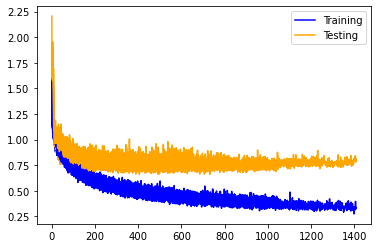

In [13]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

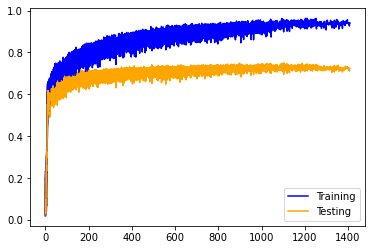

In [14]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

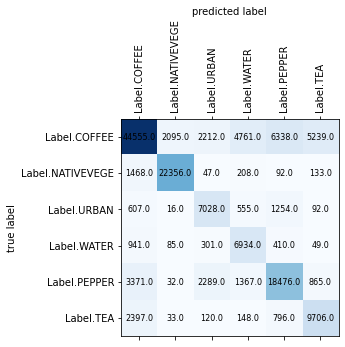

In [15]:
plot_confusion_matrix(conf_matrix, labels)

In [16]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.8353175  0.9081529  0.58581312 0.49624275 0.67514434 0.60345685]
Mean precision:  0.6840212441719773

Recalls:  [0.6833589  0.91984858 0.73576214 0.79518349 0.69984848 0.73530303]
Mean recall:  0.761550770957383

F-Score:  [0.75173572 0.91396333 0.65228085 0.61111356 0.68727449 0.66288758]
Mean f-score:  0.7132092535413325


# 1x16 conv, 1x32 conv, 1x64 conv s=(2, 2), 1x64 conv, 0.5 SpatialDropout, MaxPooling2D k=(2, 2) s=(1, 1), GlobalAveragePooling

In [7]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), strides=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), padding="same", activation="relu"),
    SpatialDropout2D(0.25),
    MaxPooling2D(pool_size=(2, 2), strides=(1, 1)),
    GlobalAveragePooling2D(),
    Flatten(name='flat'),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS, early_stopping=True)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 9, 9, 4)           0         
_________________________________________________________________
batch_normalization (BatchNo (None, 9, 9, 4)           16        
_________________________________________________________________
conv2d (Conv2D)              (None, 9, 9, 16)          272       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 9, 9, 32)          2080      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 5, 5, 64)          8256      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 5, 5, 64)          16448     
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 5, 5, 64)          0

57/57 [==============================] - 1s 9ms/step - loss: 0.6882 - accuracy: 0.6804 - val_loss: 0.8072 - val_accuracy: 0.6960
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6836 - accuracy: 0.6949 - val_loss: 0.8374 - val_accuracy: 0.6806
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7281 - accuracy: 0.6951 - val_loss: 0.8316 - val_accuracy: 0.6914
Epoch 105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7023 - accuracy: 0.6789 - val_loss: 0.8421 - val_accuracy: 0.6872
Epoch 106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7126 - accuracy: 0.6769 - val_loss: 0.9553 - val_accuracy: 0.6517
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7260 - accuracy: 0.6835 - val_loss: 0.8050 - val_accuracy: 0.7009
Epoch 108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6219 - accuracy: 0.7258 - val_loss: 0.8618 - val_accuracy: 0.6660
Epoch 1

Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6188 - accuracy: 0.6897 - val_loss: 0.8364 - val_accuracy: 0.6991
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6695 - accuracy: 0.7018 - val_loss: 0.8664 - val_accuracy: 0.6793
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6498 - accuracy: 0.6984 - val_loss: 0.7491 - val_accuracy: 0.7176
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5823 - accuracy: 0.7110 - val_loss: 0.7786 - val_accuracy: 0.7106
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5893 - accuracy: 0.7206 - val_loss: 0.8273 - val_accuracy: 0.6906
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6167 - accuracy: 0.7154 - val_loss: 0.7934 - val_accuracy: 0.7098
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5935 - accuracy: 0.7050 - val_loss: 0.8630 - val_accuracy:

Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6128 - accuracy: 0.7136 - val_loss: 0.7878 - val_accuracy: 0.7123
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5518 - accuracy: 0.7291 - val_loss: 0.7802 - val_accuracy: 0.7191
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5202 - accuracy: 0.7565 - val_loss: 0.8026 - val_accuracy: 0.7163
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5575 - accuracy: 0.7217 - val_loss: 0.8394 - val_accuracy: 0.6953
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5133 - accuracy: 0.7417 - val_loss: 0.8058 - val_accuracy: 0.7082
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5118 - accuracy: 0.7499 - val_loss: 0.7903 - val_accuracy: 0.7158
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4982 - accuracy: 0.7357 - val_loss: 0.8096 - val_accuracy:

Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4356 - accuracy: 0.7789 - val_loss: 0.8888 - val_accuracy: 0.6857
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4756 - accuracy: 0.7612 - val_loss: 0.7536 - val_accuracy: 0.7248
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5053 - accuracy: 0.7497 - val_loss: 0.7904 - val_accuracy: 0.7196
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4818 - accuracy: 0.7511 - val_loss: 0.7896 - val_accuracy: 0.7177
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4081 - accuracy: 0.7746 - val_loss: 0.7423 - val_accuracy: 0.7288
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4757 - accuracy: 0.7417 - val_loss: 0.7492 - val_accuracy: 0.7283
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4501 - accuracy: 0.7385 - val_loss: 0.7261 - val_accuracy:

Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4771 - accuracy: 0.7694 - val_loss: 0.7918 - val_accuracy: 0.7222
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3943 - accuracy: 0.7804 - val_loss: 0.8107 - val_accuracy: 0.7169
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4039 - accuracy: 0.7858 - val_loss: 0.7695 - val_accuracy: 0.7337
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4032 - accuracy: 0.7844 - val_loss: 0.8979 - val_accuracy: 0.6934
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4076 - accuracy: 0.7883 - val_loss: 0.8546 - val_accuracy: 0.6987
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4567 - accuracy: 0.7633 - val_loss: 0.7945 - val_accuracy: 0.7329
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4256 - accuracy: 0.8015 - val_loss: 0.8210 - val_accuracy:

Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3487 - accuracy: 0.8093 - val_loss: 0.7696 - val_accuracy: 0.7427
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3812 - accuracy: 0.7952 - val_loss: 0.7647 - val_accuracy: 0.7374
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3531 - accuracy: 0.8245 - val_loss: 0.7482 - val_accuracy: 0.7417
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3848 - accuracy: 0.8056 - val_loss: 0.7363 - val_accuracy: 0.7558
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3819 - accuracy: 0.7968 - val_loss: 0.8652 - val_accuracy: 0.7129
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4018 - accuracy: 0.7808 - val_loss: 0.8055 - val_accuracy: 0.7303
Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4060 - accuracy: 0.7984 - val_loss: 0.7796 - val_accuracy:

Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3657 - accuracy: 0.8006 - val_loss: 0.8330 - val_accuracy: 0.7311
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3782 - accuracy: 0.7951 - val_loss: 0.8446 - val_accuracy: 0.7294
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3428 - accuracy: 0.8272 - val_loss: 0.7806 - val_accuracy: 0.7565
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3496 - accuracy: 0.7968 - val_loss: 0.8169 - val_accuracy: 0.7343
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3367 - accuracy: 0.8278 - val_loss: 0.9137 - val_accuracy: 0.7101
Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3348 - accuracy: 0.8090 - val_loss: 0.8088 - val_accuracy: 0.7488
Epoch 450/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3015 - accuracy: 0.8193 - val_loss: 0.7378 - val_accuracy:

Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3210 - accuracy: 0.8342 - val_loss: 0.9283 - val_accuracy: 0.7186
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3022 - accuracy: 0.8285 - val_loss: 0.7682 - val_accuracy: 0.7598
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2915 - accuracy: 0.8351 - val_loss: 0.9283 - val_accuracy: 0.7307
Epoch 504/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3110 - accuracy: 0.8256 - val_loss: 0.7545 - val_accuracy: 0.7592
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2726 - accuracy: 0.8414 - val_loss: 0.8281 - val_accuracy: 0.7448
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2726 - accuracy: 0.8460 - val_loss: 0.8222 - val_accuracy: 0.7480
Epoch 507/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3588 - accuracy: 0.8197 - val_loss: 0.8107 - val_accuracy:

Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2775 - accuracy: 0.8524 - val_loss: 0.9000 - val_accuracy: 0.7306
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3204 - accuracy: 0.8209 - val_loss: 0.7758 - val_accuracy: 0.7542
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3144 - accuracy: 0.8540 - val_loss: 0.8200 - val_accuracy: 0.7452
Epoch 561/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3282 - accuracy: 0.8250 - val_loss: 0.8815 - val_accuracy: 0.7412
Epoch 562/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2834 - accuracy: 0.8329 - val_loss: 0.9147 - val_accuracy: 0.7234
Epoch 563/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3655 - accuracy: 0.7837 - val_loss: 0.8105 - val_accuracy: 0.7459
Epoch 564/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2971 - accuracy: 0.8521 - val_loss: 0.8820 - val_accuracy:

Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2800 - accuracy: 0.8218 - val_loss: 0.8310 - val_accuracy: 0.7455
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2861 - accuracy: 0.8263 - val_loss: 0.8730 - val_accuracy: 0.7577
Epoch 617/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2689 - accuracy: 0.8420 - val_loss: 0.8587 - val_accuracy: 0.7503
Epoch 618/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2854 - accuracy: 0.8379 - val_loss: 0.8287 - val_accuracy: 0.7545
Epoch 619/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3029 - accuracy: 0.8397 - val_loss: 0.8259 - val_accuracy: 0.7613
Epoch 620/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2654 - accuracy: 0.8420 - val_loss: 0.8617 - val_accuracy: 0.7431
Epoch 621/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2889 - accuracy: 0.8408 - val_loss: 0.8572 - val_accuracy:

Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2423 - accuracy: 0.8496 - val_loss: 0.8462 - val_accuracy: 0.7611
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3366 - accuracy: 0.8229 - val_loss: 0.9968 - val_accuracy: 0.7287
Epoch 674/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2812 - accuracy: 0.8443 - val_loss: 0.8818 - val_accuracy: 0.7466
Epoch 675/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2510 - accuracy: 0.8605 - val_loss: 0.8186 - val_accuracy: 0.7581
Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2625 - accuracy: 0.8447 - val_loss: 0.9051 - val_accuracy: 0.7450
Epoch 677/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2582 - accuracy: 0.8384 - val_loss: 0.8421 - val_accuracy: 0.7524
Epoch 678/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2541 - accuracy: 0.8345 - val_loss: 0.9168 - val_accuracy

Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9232 - accuracy: 0.5984 - val_loss: 1.0661 - val_accuracy: 0.5834
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8699 - accuracy: 0.5936 - val_loss: 0.9522 - val_accuracy: 0.6554
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9108 - accuracy: 0.6084 - val_loss: 1.0383 - val_accuracy: 0.6093
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9279 - accuracy: 0.5885 - val_loss: 1.0671 - val_accuracy: 0.5938
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8752 - accuracy: 0.6147 - val_loss: 0.9648 - val_accuracy: 0.6432
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9932 - accuracy: 0.6010 - val_loss: 0.9323 - val_accuracy: 0.6419
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8561 - accuracy: 0.6081 - val_loss: 1.0666 - val_accuracy: 0.5929

57/57 [==============================] - 1s 9ms/step - loss: 0.6025 - accuracy: 0.7228 - val_loss: 0.8918 - val_accuracy: 0.6563
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5702 - accuracy: 0.7009 - val_loss: 0.9665 - val_accuracy: 0.6246
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6037 - accuracy: 0.7063 - val_loss: 0.9224 - val_accuracy: 0.6375
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5944 - accuracy: 0.7061 - val_loss: 0.9124 - val_accuracy: 0.6550
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5689 - accuracy: 0.7192 - val_loss: 0.9813 - val_accuracy: 0.6160
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5637 - accuracy: 0.7187 - val_loss: 0.9010 - val_accuracy: 0.6565
Epoch 146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6269 - accuracy: 0.7108 - val_loss: 0.8038 - val_accuracy: 0.6947
Epoch 1

Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4964 - accuracy: 0.7494 - val_loss: 0.8696 - val_accuracy: 0.6725
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5405 - accuracy: 0.7627 - val_loss: 0.9512 - val_accuracy: 0.6413
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4912 - accuracy: 0.7516 - val_loss: 0.9563 - val_accuracy: 0.6331
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4961 - accuracy: 0.7605 - val_loss: 0.9869 - val_accuracy: 0.6316
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4617 - accuracy: 0.7584 - val_loss: 0.8938 - val_accuracy: 0.6632
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5075 - accuracy: 0.7369 - val_loss: 0.9154 - val_accuracy: 0.6629
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4657 - accuracy: 0.7418 - val_loss: 0.8828 - val_accuracy:

Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4759 - accuracy: 0.7539 - val_loss: 0.8467 - val_accuracy: 0.6913
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4056 - accuracy: 0.7824 - val_loss: 0.9950 - val_accuracy: 0.6455
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4225 - accuracy: 0.7688 - val_loss: 0.8464 - val_accuracy: 0.6835
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4681 - accuracy: 0.7663 - val_loss: 0.8830 - val_accuracy: 0.6762
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4575 - accuracy: 0.7622 - val_loss: 0.9667 - val_accuracy: 0.6499
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4491 - accuracy: 0.7689 - val_loss: 0.8120 - val_accuracy: 0.7025
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4433 - accuracy: 0.7718 - val_loss: 0.8833 - val_accuracy:

Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3706 - accuracy: 0.7722 - val_loss: 0.9469 - val_accuracy: 0.6636
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3948 - accuracy: 0.7872 - val_loss: 0.8297 - val_accuracy: 0.6983
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3715 - accuracy: 0.8000 - val_loss: 0.8346 - val_accuracy: 0.7032
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3763 - accuracy: 0.7888 - val_loss: 0.9336 - val_accuracy: 0.6757
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3893 - accuracy: 0.7817 - val_loss: 0.8667 - val_accuracy: 0.6891
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4056 - accuracy: 0.7753 - val_loss: 0.8422 - val_accuracy: 0.7118
Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3865 - accuracy: 0.8022 - val_loss: 0.9599 - val_accuracy:

Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3297 - accuracy: 0.8023 - val_loss: 0.9280 - val_accuracy: 0.6857
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3691 - accuracy: 0.7855 - val_loss: 0.8873 - val_accuracy: 0.6886
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3400 - accuracy: 0.8081 - val_loss: 0.9391 - val_accuracy: 0.6852
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3243 - accuracy: 0.8292 - val_loss: 0.8180 - val_accuracy: 0.7240
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3711 - accuracy: 0.7833 - val_loss: 0.9872 - val_accuracy: 0.6610
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3494 - accuracy: 0.7958 - val_loss: 0.9469 - val_accuracy: 0.6791
Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3579 - accuracy: 0.7944 - val_loss: 0.9775 - val_accuracy:

Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3060 - accuracy: 0.8336 - val_loss: 0.8614 - val_accuracy: 0.7095
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3256 - accuracy: 0.8097 - val_loss: 0.9068 - val_accuracy: 0.7152
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2940 - accuracy: 0.8305 - val_loss: 0.8396 - val_accuracy: 0.7241
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3105 - accuracy: 0.8224 - val_loss: 1.0213 - val_accuracy: 0.6702
Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3459 - accuracy: 0.7676 - val_loss: 0.9387 - val_accuracy: 0.6985
Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3002 - accuracy: 0.8140 - val_loss: 0.8365 - val_accuracy: 0.7294
Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2904 - accuracy: 0.8236 - val_loss: 0.8555 - val_accuracy:

Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3118 - accuracy: 0.8132 - val_loss: 0.9089 - val_accuracy: 0.7207
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2878 - accuracy: 0.8229 - val_loss: 0.8521 - val_accuracy: 0.7356
Epoch 484/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2968 - accuracy: 0.8360 - val_loss: 0.8390 - val_accuracy: 0.7276
Epoch 485/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3374 - accuracy: 0.8423 - val_loss: 0.8703 - val_accuracy: 0.7257
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3069 - accuracy: 0.8398 - val_loss: 0.8519 - val_accuracy: 0.7187
Epoch 487/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3135 - accuracy: 0.8299 - val_loss: 0.8819 - val_accuracy: 0.7143
Epoch 488/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3065 - accuracy: 0.8167 - val_loss: 0.8639 - val_accuracy:

Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3632 - accuracy: 0.8108 - val_loss: 0.8917 - val_accuracy: 0.7169
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2627 - accuracy: 0.8391 - val_loss: 0.8736 - val_accuracy: 0.7346
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3085 - accuracy: 0.8151 - val_loss: 0.9653 - val_accuracy: 0.7184
Epoch 542/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2819 - accuracy: 0.8343 - val_loss: 0.8381 - val_accuracy: 0.7409
Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2905 - accuracy: 0.8402 - val_loss: 0.8677 - val_accuracy: 0.7318
Epoch 544/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3006 - accuracy: 0.8199 - val_loss: 0.8867 - val_accuracy: 0.7236
Epoch 545/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2608 - accuracy: 0.8540 - val_loss: 0.9222 - val_accuracy:

Epoch 596/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2693 - accuracy: 0.8414 - val_loss: 1.0348 - val_accuracy: 0.6932
Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3093 - accuracy: 0.8133 - val_loss: 0.8433 - val_accuracy: 0.7305
Epoch 598/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3015 - accuracy: 0.8441 - val_loss: 0.8912 - val_accuracy: 0.7259
Epoch 599/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3011 - accuracy: 0.8271 - val_loss: 1.1183 - val_accuracy: 0.6702
Epoch 600/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3026 - accuracy: 0.8201 - val_loss: 0.8294 - val_accuracy: 0.7479
Epoch 601/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2951 - accuracy: 0.8578 - val_loss: 0.9693 - val_accuracy: 0.7008
Epoch 602/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3023 - accuracy: 0.8372 - val_loss: 0.9349 - val_accuracy:

Epoch 653/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2433 - accuracy: 0.8471 - val_loss: 0.9840 - val_accuracy: 0.7047
Epoch 654/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2537 - accuracy: 0.8348 - val_loss: 0.8910 - val_accuracy: 0.7294
Epoch 655/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2543 - accuracy: 0.8458 - val_loss: 0.9327 - val_accuracy: 0.7240
Epoch 656/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2646 - accuracy: 0.8623 - val_loss: 0.9099 - val_accuracy: 0.7248
Epoch 657/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3161 - accuracy: 0.8237 - val_loss: 0.9017 - val_accuracy: 0.7268
Epoch 658/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2490 - accuracy: 0.8499 - val_loss: 0.9196 - val_accuracy: 0.7328
Epoch 659/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3043 - accuracy: 0.8482 - val_loss: 1.0005 - val_accuracy:

Epoch 710/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2550 - accuracy: 0.8388 - val_loss: 0.8876 - val_accuracy: 0.7430
Epoch 711/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2495 - accuracy: 0.8558 - val_loss: 0.8409 - val_accuracy: 0.7605

Fold  3 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.8091 - accuracy: 0.1183 - val_loss: 1.7447 - val_accuracy: 0.0894
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.3685 - accuracy: 0.3139 - val_loss: 1.7748 - val_accuracy: 0.1931
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.3077 - accuracy: 0.3396 - val_loss: 1.7796 - val_accuracy: 0.1520
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1576 - accuracy: 0.4431 - val_loss: 1.7413 - val_accuracy: 0.3682
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0668 - accuracy: 0.4680 - val_loss: 1.7819 - v

57/57 [==============================] - 1s 9ms/step - loss: 0.6325 - accuracy: 0.6989 - val_loss: 0.8837 - val_accuracy: 0.6618
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6821 - accuracy: 0.6660 - val_loss: 0.8757 - val_accuracy: 0.6677
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6634 - accuracy: 0.6764 - val_loss: 0.8997 - val_accuracy: 0.6616
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7464 - accuracy: 0.6445 - val_loss: 0.8436 - val_accuracy: 0.6815
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6663 - accuracy: 0.7179 - val_loss: 0.9278 - val_accuracy: 0.6554
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6280 - accuracy: 0.6901 - val_loss: 0.9028 - val_accuracy: 0.6465
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7050 - accuracy: 0.6508 - val_loss: 0.9180 - val_accuracy: 0.6487
Epoch 1

Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5819 - accuracy: 0.7039 - val_loss: 0.9225 - val_accuracy: 0.6341
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5786 - accuracy: 0.6787 - val_loss: 0.8145 - val_accuracy: 0.6953
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5782 - accuracy: 0.7306 - val_loss: 0.8969 - val_accuracy: 0.6683
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5879 - accuracy: 0.6908 - val_loss: 0.9654 - val_accuracy: 0.6313
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6549 - accuracy: 0.6886 - val_loss: 0.7686 - val_accuracy: 0.7172
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5806 - accuracy: 0.7166 - val_loss: 0.8135 - val_accuracy: 0.6951
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5470 - accuracy: 0.7085 - val_loss: 0.8151 - val_accuracy:

Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5611 - accuracy: 0.7242 - val_loss: 0.7761 - val_accuracy: 0.7165
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5520 - accuracy: 0.7193 - val_loss: 0.7598 - val_accuracy: 0.7213
Epoch 229/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5160 - accuracy: 0.7358 - val_loss: 0.8930 - val_accuracy: 0.6605
Epoch 230/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5050 - accuracy: 0.7309 - val_loss: 0.8232 - val_accuracy: 0.6956
Epoch 231/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4992 - accuracy: 0.7320 - val_loss: 0.8438 - val_accuracy: 0.6830
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5340 - accuracy: 0.7323 - val_loss: 0.8538 - val_accuracy: 0.6830
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5625 - accuracy: 0.7316 - val_loss: 0.8122 - val_accura

Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4783 - accuracy: 0.7461 - val_loss: 0.7613 - val_accuracy: 0.7271
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4529 - accuracy: 0.7530 - val_loss: 0.8449 - val_accuracy: 0.6901
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4679 - accuracy: 0.7701 - val_loss: 0.8170 - val_accuracy: 0.7038
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4960 - accuracy: 0.7540 - val_loss: 0.7648 - val_accuracy: 0.7127
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5312 - accuracy: 0.7426 - val_loss: 0.8587 - val_accuracy: 0.6914
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4995 - accuracy: 0.7429 - val_loss: 0.8311 - val_accuracy: 0.6989
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4699 - accuracy: 0.7594 - val_loss: 0.7502 - val_accuracy:

Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4066 - accuracy: 0.7953 - val_loss: 0.8047 - val_accuracy: 0.7093
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4440 - accuracy: 0.7634 - val_loss: 0.7502 - val_accuracy: 0.7343
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4263 - accuracy: 0.7728 - val_loss: 0.8439 - val_accuracy: 0.7069
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4979 - accuracy: 0.7353 - val_loss: 0.7730 - val_accuracy: 0.7191
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4176 - accuracy: 0.7871 - val_loss: 0.8081 - val_accuracy: 0.7116
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4458 - accuracy: 0.7754 - val_loss: 0.7544 - val_accuracy: 0.7342
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4438 - accuracy: 0.7533 - val_loss: 0.7567 - val_accuracy:

Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3725 - accuracy: 0.7976 - val_loss: 0.7605 - val_accuracy: 0.7290
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4535 - accuracy: 0.7669 - val_loss: 0.8409 - val_accuracy: 0.7095
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3999 - accuracy: 0.7633 - val_loss: 0.8311 - val_accuracy: 0.7111
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4162 - accuracy: 0.7716 - val_loss: 0.7870 - val_accuracy: 0.7175
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3745 - accuracy: 0.7884 - val_loss: 0.7570 - val_accuracy: 0.7363
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4146 - accuracy: 0.7907 - val_loss: 0.7636 - val_accuracy: 0.7271
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4548 - accuracy: 0.7525 - val_loss: 0.7660 - val_accuracy:

Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4172 - accuracy: 0.7744 - val_loss: 0.8296 - val_accuracy: 0.7157
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3822 - accuracy: 0.7859 - val_loss: 0.8220 - val_accuracy: 0.7331
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4250 - accuracy: 0.7832 - val_loss: 0.7966 - val_accuracy: 0.7380
Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3956 - accuracy: 0.7936 - val_loss: 0.8782 - val_accuracy: 0.7173
Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3730 - accuracy: 0.8153 - val_loss: 0.7914 - val_accuracy: 0.7350
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3448 - accuracy: 0.8075 - val_loss: 0.8518 - val_accuracy: 0.7127
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3768 - accuracy: 0.7916 - val_loss: 0.8485 - val_accuracy:

Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3727 - accuracy: 0.7962 - val_loss: 0.7977 - val_accuracy: 0.7270
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3644 - accuracy: 0.8010 - val_loss: 0.7956 - val_accuracy: 0.7280
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3175 - accuracy: 0.8134 - val_loss: 0.8172 - val_accuracy: 0.7314
Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3177 - accuracy: 0.8021 - val_loss: 0.8747 - val_accuracy: 0.7116
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3930 - accuracy: 0.8034 - val_loss: 0.7616 - val_accuracy: 0.7519
Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3427 - accuracy: 0.8125 - val_loss: 0.8027 - val_accuracy: 0.7309
Epoch 518/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4289 - accuracy: 0.7764 - val_loss: 0.7920 - val_accuracy

Epoch 569/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3157 - accuracy: 0.8341 - val_loss: 0.9257 - val_accuracy: 0.7148
Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3575 - accuracy: 0.8027 - val_loss: 0.7689 - val_accuracy: 0.7510
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2875 - accuracy: 0.8322 - val_loss: 0.7907 - val_accuracy: 0.7443
Epoch 572/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3366 - accuracy: 0.8231 - val_loss: 0.8632 - val_accuracy: 0.7400
Epoch 573/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4267 - accuracy: 0.7798 - val_loss: 0.7419 - val_accuracy: 0.7503
Epoch 574/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3407 - accuracy: 0.8168 - val_loss: 0.7517 - val_accuracy: 0.7544
Epoch 575/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3259 - accuracy: 0.8107 - val_loss: 0.8224 - val_accuracy:

Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3418 - accuracy: 0.8132 - val_loss: 0.7841 - val_accuracy: 0.7548
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3031 - accuracy: 0.8209 - val_loss: 0.8146 - val_accuracy: 0.7428
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3023 - accuracy: 0.8296 - val_loss: 0.8683 - val_accuracy: 0.7238
Epoch 629/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3141 - accuracy: 0.8149 - val_loss: 0.8977 - val_accuracy: 0.7184
Epoch 630/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3304 - accuracy: 0.8015 - val_loss: 0.8646 - val_accuracy: 0.7232
Epoch 631/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3407 - accuracy: 0.8207 - val_loss: 0.8082 - val_accuracy: 0.7437
Epoch 632/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2982 - accuracy: 0.8198 - val_loss: 0.7709 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8609 - accuracy: 0.6282 - val_loss: 0.9453 - val_accuracy: 0.6478
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8321 - accuracy: 0.6564 - val_loss: 0.9262 - val_accuracy: 0.6510
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8188 - accuracy: 0.6473 - val_loss: 1.0231 - val_accuracy: 0.6088
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8510 - accuracy: 0.6359 - val_loss: 1.0299 - val_accuracy: 0.6242
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8865 - accuracy: 0.6438 - val_loss: 1.1049 - val_accuracy: 0.5752
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8042 - accuracy: 0.6385 - val_loss: 0.9727 - val_accuracy: 0.6320
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8777 - accuracy: 0.6351 - val_loss: 0.9251 - val_accuracy: 0.6614
Epoch 44/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6597 - accuracy: 0.7129 - val_loss: 0.8204 - val_accuracy: 0.6939
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6108 - accuracy: 0.7129 - val_loss: 0.8388 - val_accuracy: 0.6902
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5980 - accuracy: 0.7195 - val_loss: 0.8198 - val_accuracy: 0.6941
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5790 - accuracy: 0.7049 - val_loss: 0.7859 - val_accuracy: 0.7025
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6229 - accuracy: 0.7154 - val_loss: 0.9227 - val_accuracy: 0.6519
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6001 - accuracy: 0.7044 - val_loss: 0.8792 - val_accuracy: 0.6761
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5375 - accuracy: 0.7274 - val_loss: 0.9038 - val_accuracy: 0.6560
Epoch 1

Epoch 208/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5622 - accuracy: 0.7232 - val_loss: 0.8555 - val_accuracy: 0.6758
Epoch 209/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5140 - accuracy: 0.7337 - val_loss: 0.8313 - val_accuracy: 0.6873
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5218 - accuracy: 0.7487 - val_loss: 0.9197 - val_accuracy: 0.6584
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4700 - accuracy: 0.7582 - val_loss: 0.8134 - val_accuracy: 0.6963
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4858 - accuracy: 0.7347 - val_loss: 0.8365 - val_accuracy: 0.7021
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5436 - accuracy: 0.7249 - val_loss: 0.8688 - val_accuracy: 0.6838
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5121 - accuracy: 0.7581 - val_loss: 0.8391 - val_accurac

Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5041 - accuracy: 0.7495 - val_loss: 0.7879 - val_accuracy: 0.7123
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4489 - accuracy: 0.7793 - val_loss: 0.9430 - val_accuracy: 0.6526
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4714 - accuracy: 0.7533 - val_loss: 0.9130 - val_accuracy: 0.6649
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4657 - accuracy: 0.7369 - val_loss: 0.9099 - val_accuracy: 0.6664
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4647 - accuracy: 0.7495 - val_loss: 0.7943 - val_accuracy: 0.7156
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4465 - accuracy: 0.7677 - val_loss: 0.8489 - val_accuracy: 0.6951
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4617 - accuracy: 0.7575 - val_loss: 0.8275 - val_accuracy:

Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4018 - accuracy: 0.7952 - val_loss: 0.7657 - val_accuracy: 0.7221
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3675 - accuracy: 0.7997 - val_loss: 0.8075 - val_accuracy: 0.7077
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4488 - accuracy: 0.7555 - val_loss: 0.8021 - val_accuracy: 0.7101
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4325 - accuracy: 0.7540 - val_loss: 0.7616 - val_accuracy: 0.7289
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4395 - accuracy: 0.7965 - val_loss: 0.8142 - val_accuracy: 0.7135
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4645 - accuracy: 0.7830 - val_loss: 0.8547 - val_accuracy: 0.7016
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4564 - accuracy: 0.7611 - val_loss: 0.8445 - val_accuracy:

Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4789 - accuracy: 0.7593 - val_loss: 0.8776 - val_accuracy: 0.7015
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4583 - accuracy: 0.7640 - val_loss: 0.8164 - val_accuracy: 0.7088
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3890 - accuracy: 0.7935 - val_loss: 0.8625 - val_accuracy: 0.7084
Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4227 - accuracy: 0.7807 - val_loss: 0.7868 - val_accuracy: 0.7268
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3822 - accuracy: 0.8093 - val_loss: 0.8164 - val_accuracy: 0.7245
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4358 - accuracy: 0.7840 - val_loss: 0.7990 - val_accuracy: 0.7309
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3821 - accuracy: 0.8004 - val_loss: 0.8224 - val_accuracy:

Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3982 - accuracy: 0.8062 - val_loss: 0.8410 - val_accuracy: 0.7299
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3422 - accuracy: 0.8101 - val_loss: 0.8906 - val_accuracy: 0.7062
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3913 - accuracy: 0.8000 - val_loss: 0.9193 - val_accuracy: 0.7000
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3942 - accuracy: 0.7965 - val_loss: 0.8819 - val_accuracy: 0.7105
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3509 - accuracy: 0.8223 - val_loss: 0.8942 - val_accuracy: 0.6978
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3864 - accuracy: 0.7924 - val_loss: 0.8357 - val_accuracy: 0.7183
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3714 - accuracy: 0.7895 - val_loss: 0.7592 - val_accuracy:

Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3376 - accuracy: 0.8249 - val_loss: 0.8216 - val_accuracy: 0.7321
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3323 - accuracy: 0.8248 - val_loss: 0.8366 - val_accuracy: 0.7390
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3396 - accuracy: 0.8094 - val_loss: 0.8201 - val_accuracy: 0.7434
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3505 - accuracy: 0.7992 - val_loss: 0.9375 - val_accuracy: 0.6951
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3063 - accuracy: 0.8088 - val_loss: 0.8041 - val_accuracy: 0.7473
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3353 - accuracy: 0.8309 - val_loss: 0.8451 - val_accuracy: 0.7251
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3255 - accuracy: 0.8313 - val_loss: 0.8556 - val_accuracy:

Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2811 - accuracy: 0.8501 - val_loss: 0.8392 - val_accuracy: 0.7354
Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3365 - accuracy: 0.8101 - val_loss: 0.8584 - val_accuracy: 0.7331
Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3196 - accuracy: 0.8078 - val_loss: 0.8640 - val_accuracy: 0.7267
Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2955 - accuracy: 0.8355 - val_loss: 0.8252 - val_accuracy: 0.7328
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3492 - accuracy: 0.7972 - val_loss: 0.8517 - val_accuracy: 0.7369
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3209 - accuracy: 0.8233 - val_loss: 0.8252 - val_accuracy: 0.7413
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3365 - accuracy: 0.8209 - val_loss: 0.9101 - val_accuracy:

Epoch 607/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3271 - accuracy: 0.8171 - val_loss: 0.7730 - val_accuracy: 0.7612
Epoch 608/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3107 - accuracy: 0.8514 - val_loss: 0.8215 - val_accuracy: 0.7465
Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3373 - accuracy: 0.8304 - val_loss: 0.8371 - val_accuracy: 0.7348
Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3432 - accuracy: 0.8194 - val_loss: 0.8234 - val_accuracy: 0.7386
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3079 - accuracy: 0.8259 - val_loss: 0.8038 - val_accuracy: 0.7506
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3208 - accuracy: 0.8276 - val_loss: 0.8595 - val_accuracy: 0.7294
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3429 - accuracy: 0.8133 - val_loss: 0.8538 - val_accuracy:

Epoch 664/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3298 - accuracy: 0.8172 - val_loss: 0.8046 - val_accuracy: 0.7561
Epoch 665/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3268 - accuracy: 0.8369 - val_loss: 0.8656 - val_accuracy: 0.7389
Epoch 666/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2817 - accuracy: 0.8252 - val_loss: 0.7898 - val_accuracy: 0.7693
Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3221 - accuracy: 0.8284 - val_loss: 0.8434 - val_accuracy: 0.7517
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2801 - accuracy: 0.8583 - val_loss: 0.8184 - val_accuracy: 0.7500
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2627 - accuracy: 0.8585 - val_loss: 0.8380 - val_accuracy: 0.7557
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2851 - accuracy: 0.8396 - val_loss: 0.9441 - val_accuracy:

Epoch 721/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2971 - accuracy: 0.8356 - val_loss: 0.8508 - val_accuracy: 0.7488
Epoch 722/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3176 - accuracy: 0.8181 - val_loss: 0.8848 - val_accuracy: 0.7285
Epoch 723/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2962 - accuracy: 0.8347 - val_loss: 0.8123 - val_accuracy: 0.7603
Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2870 - accuracy: 0.8543 - val_loss: 0.9009 - val_accuracy: 0.7187
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2582 - accuracy: 0.8527 - val_loss: 0.8448 - val_accuracy: 0.7415
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2924 - accuracy: 0.8323 - val_loss: 0.8791 - val_accuracy: 0.7443
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3432 - accuracy: 0.8212 - val_loss: 0.8747 - val_accuracy:

Epoch 778/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3018 - accuracy: 0.8379 - val_loss: 0.8884 - val_accuracy: 0.7389
Epoch 779/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2800 - accuracy: 0.8452 - val_loss: 0.8051 - val_accuracy: 0.7556
Epoch 780/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2674 - accuracy: 0.8518 - val_loss: 0.8465 - val_accuracy: 0.7523
Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2605 - accuracy: 0.8630 - val_loss: 0.8269 - val_accuracy: 0.7457
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3133 - accuracy: 0.8327 - val_loss: 0.8568 - val_accuracy: 0.7526
Epoch 783/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2729 - accuracy: 0.8515 - val_loss: 0.8508 - val_accuracy: 0.7416
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2935 - accuracy: 0.8465 - val_loss: 0.8230 - val_accuracy:

Epoch 835/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2723 - accuracy: 0.8331 - val_loss: 0.8918 - val_accuracy: 0.7405
Epoch 836/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2444 - accuracy: 0.8726 - val_loss: 0.8407 - val_accuracy: 0.7681
Epoch 837/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2657 - accuracy: 0.8686 - val_loss: 0.8763 - val_accuracy: 0.7555
Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2912 - accuracy: 0.8324 - val_loss: 0.8884 - val_accuracy: 0.7484
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2440 - accuracy: 0.8547 - val_loss: 0.8606 - val_accuracy: 0.7625
Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2309 - accuracy: 0.8692 - val_loss: 0.8946 - val_accuracy: 0.7447
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2576 - accuracy: 0.8671 - val_loss: 0.8724 - val_accuracy:

Epoch 892/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2510 - accuracy: 0.8417 - val_loss: 0.8522 - val_accuracy: 0.7536
Epoch 893/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2346 - accuracy: 0.8760 - val_loss: 0.9008 - val_accuracy: 0.7480
Epoch 894/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2956 - accuracy: 0.8476 - val_loss: 0.8619 - val_accuracy: 0.7494
Epoch 895/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3438 - accuracy: 0.8306 - val_loss: 0.8167 - val_accuracy: 0.7616
Epoch 896/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2441 - accuracy: 0.8620 - val_loss: 0.8343 - val_accuracy: 0.7643
Epoch 897/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2698 - accuracy: 0.8566 - val_loss: 0.8150 - val_accuracy: 0.7549
Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2532 - accuracy: 0.8574 - val_loss: 0.9212 - val_accuracy:

Epoch 949/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2140 - accuracy: 0.8616 - val_loss: 0.8723 - val_accuracy: 0.7647
Epoch 950/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2457 - accuracy: 0.8739 - val_loss: 0.8671 - val_accuracy: 0.7669
Epoch 951/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2620 - accuracy: 0.8747 - val_loss: 0.8575 - val_accuracy: 0.7504
Epoch 952/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2675 - accuracy: 0.8558 - val_loss: 0.8604 - val_accuracy: 0.7598
Epoch 953/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2432 - accuracy: 0.8594 - val_loss: 0.8817 - val_accuracy: 0.7502
Epoch 954/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2334 - accuracy: 0.8707 - val_loss: 0.9186 - val_accuracy: 0.7567
Epoch 955/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2611 - accuracy: 0.8511 - val_loss: 0.9418 - val_accuracy:

Epoch 1006/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3347 - accuracy: 0.8247 - val_loss: 0.8518 - val_accuracy: 0.7648
Epoch 1007/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2329 - accuracy: 0.8660 - val_loss: 0.9103 - val_accuracy: 0.7576
Epoch 1008/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2344 - accuracy: 0.8596 - val_loss: 0.9468 - val_accuracy: 0.7426
Epoch 1009/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2247 - accuracy: 0.8713 - val_loss: 0.8693 - val_accuracy: 0.7799
Epoch 1010/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2356 - accuracy: 0.8812 - val_loss: 0.9239 - val_accuracy: 0.7479
Epoch 1011/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2602 - accuracy: 0.8474 - val_loss: 0.9516 - val_accuracy: 0.7450
Epoch 1012/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2668 - accuracy: 0.8684 - val_loss: 0.9881 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 0.2307 - accuracy: 0.8749 - val_loss: 0.9266 - val_accuracy: 0.7488
Epoch 1119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2083 - accuracy: 0.8786 - val_loss: 0.8897 - val_accuracy: 0.7546
Epoch 1120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2622 - accuracy: 0.8484 - val_loss: 0.8984 - val_accuracy: 0.7639
Epoch 1121/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2231 - accuracy: 0.8772 - val_loss: 0.9454 - val_accuracy: 0.7567
Epoch 1122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2765 - accuracy: 0.8601 - val_loss: 0.9053 - val_accuracy: 0.7525
Epoch 1123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2199 - accuracy: 0.8725 - val_loss: 0.8868 - val_accuracy: 0.7678
Epoch 1124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2101 - accuracy: 0.8822 - val_loss: 0.8766 - val_accuracy: 0.7722
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2012 - accuracy: 0.8841 - val_loss: 0.9072 - val_accuracy: 0.7678
Epoch 1231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2233 - accuracy: 0.8651 - val_loss: 0.8539 - val_accuracy: 0.7841
Epoch 1232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2301 - accuracy: 0.8812 - val_loss: 0.9080 - val_accuracy: 0.7568
Epoch 1233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2026 - accuracy: 0.8820 - val_loss: 0.8876 - val_accuracy: 0.7650
Epoch 1234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2299 - accuracy: 0.8745 - val_loss: 0.8969 - val_accuracy: 0.7559
Epoch 1235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2287 - accuracy: 0.8533 - val_loss: 0.9443 - val_accuracy: 0.7536
Epoch 1236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2251 - accuracy: 0.8693 - val_loss: 0.8457 - val_accuracy: 0.7852
E

57/57 [==============================] - 1s 9ms/step - loss: 0.1861 - accuracy: 0.8869 - val_loss: 0.9783 - val_accuracy: 0.7610
Epoch 1343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2119 - accuracy: 0.8782 - val_loss: 0.9131 - val_accuracy: 0.7747
Epoch 1344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2531 - accuracy: 0.8763 - val_loss: 0.8927 - val_accuracy: 0.7641
Epoch 1345/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2328 - accuracy: 0.8874 - val_loss: 0.9373 - val_accuracy: 0.7612
Epoch 1346/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2078 - accuracy: 0.8770 - val_loss: 0.9714 - val_accuracy: 0.7470
Epoch 1347/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2604 - accuracy: 0.8660 - val_loss: 0.8795 - val_accuracy: 0.7704
Epoch 1348/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2229 - accuracy: 0.8910 - val_loss: 0.9205 - val_accuracy: 0.76

Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9424 - accuracy: 0.5997 - val_loss: 1.0617 - val_accuracy: 0.5720
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9567 - accuracy: 0.5711 - val_loss: 1.1617 - val_accuracy: 0.5458
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9711 - accuracy: 0.5531 - val_loss: 1.0261 - val_accuracy: 0.6004
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9250 - accuracy: 0.6043 - val_loss: 1.0908 - val_accuracy: 0.5689
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9681 - accuracy: 0.5588 - val_loss: 1.0938 - val_accuracy: 0.5697
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9446 - accuracy: 0.6014 - val_loss: 0.9670 - val_accuracy: 0.6599
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8695 - accuracy: 0.6217 - val_loss: 1.1087 - val_accuracy: 0.5686

57/57 [==============================] - 1s 9ms/step - loss: 0.6106 - accuracy: 0.6853 - val_loss: 0.8489 - val_accuracy: 0.6905
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6517 - accuracy: 0.6842 - val_loss: 0.8502 - val_accuracy: 0.6770
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6567 - accuracy: 0.6856 - val_loss: 0.8643 - val_accuracy: 0.6765
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6512 - accuracy: 0.6830 - val_loss: 0.8671 - val_accuracy: 0.6681
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5999 - accuracy: 0.7026 - val_loss: 0.8759 - val_accuracy: 0.6723
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6592 - accuracy: 0.6704 - val_loss: 0.7945 - val_accuracy: 0.7025
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6777 - accuracy: 0.7041 - val_loss: 0.9194 - val_accuracy: 0.6573
Epoch 1

Epoch 189/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5455 - accuracy: 0.7055 - val_loss: 0.8586 - val_accuracy: 0.6857
Epoch 190/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5111 - accuracy: 0.7341 - val_loss: 0.8142 - val_accuracy: 0.7082
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5359 - accuracy: 0.7140 - val_loss: 0.9042 - val_accuracy: 0.6693
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5675 - accuracy: 0.7141 - val_loss: 0.8640 - val_accuracy: 0.6788
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5344 - accuracy: 0.7307 - val_loss: 0.8575 - val_accuracy: 0.6887
Epoch 194/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5597 - accuracy: 0.7066 - val_loss: 0.8663 - val_accuracy: 0.6795
Epoch 195/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5297 - accuracy: 0.7286 - val_loss: 0.8166 - val_accur

Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4767 - accuracy: 0.7604 - val_loss: 0.7892 - val_accuracy: 0.7138
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4371 - accuracy: 0.7646 - val_loss: 0.7959 - val_accuracy: 0.7070
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5017 - accuracy: 0.7531 - val_loss: 0.8698 - val_accuracy: 0.6958
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4860 - accuracy: 0.7273 - val_loss: 0.9192 - val_accuracy: 0.6719
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4679 - accuracy: 0.7418 - val_loss: 0.8307 - val_accuracy: 0.6972
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5173 - accuracy: 0.7457 - val_loss: 0.7357 - val_accuracy: 0.7323
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5105 - accuracy: 0.7355 - val_loss: 0.8560 - val_accuracy:

Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3959 - accuracy: 0.7628 - val_loss: 0.8074 - val_accuracy: 0.7110
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4361 - accuracy: 0.7641 - val_loss: 0.8005 - val_accuracy: 0.7251
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4617 - accuracy: 0.7727 - val_loss: 0.7866 - val_accuracy: 0.7154
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4413 - accuracy: 0.7706 - val_loss: 0.7793 - val_accuracy: 0.7289
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4234 - accuracy: 0.7843 - val_loss: 0.8638 - val_accuracy: 0.6996
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4217 - accuracy: 0.7625 - val_loss: 0.8823 - val_accuracy: 0.6907
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4420 - accuracy: 0.7555 - val_loss: 0.8045 - val_accuracy:

Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3878 - accuracy: 0.7737 - val_loss: 0.8735 - val_accuracy: 0.7118
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3723 - accuracy: 0.7790 - val_loss: 0.8119 - val_accuracy: 0.7289
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3946 - accuracy: 0.7768 - val_loss: 0.8158 - val_accuracy: 0.7219
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3971 - accuracy: 0.7909 - val_loss: 0.8398 - val_accuracy: 0.7255
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4247 - accuracy: 0.7789 - val_loss: 0.7932 - val_accuracy: 0.7276
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3785 - accuracy: 0.7869 - val_loss: 0.7689 - val_accuracy: 0.7442
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3921 - accuracy: 0.7758 - val_loss: 0.7785 - val_accuracy:

Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3629 - accuracy: 0.7688 - val_loss: 0.9472 - val_accuracy: 0.7175
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3611 - accuracy: 0.7851 - val_loss: 0.8260 - val_accuracy: 0.7245
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4461 - accuracy: 0.7598 - val_loss: 0.8316 - val_accuracy: 0.7234
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4130 - accuracy: 0.7930 - val_loss: 0.7826 - val_accuracy: 0.7411
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3554 - accuracy: 0.7973 - val_loss: 0.8091 - val_accuracy: 0.7298
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3599 - accuracy: 0.8186 - val_loss: 0.7903 - val_accuracy: 0.7432
Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3689 - accuracy: 0.7915 - val_loss: 0.7629 - val_accuracy:

Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3455 - accuracy: 0.8053 - val_loss: 0.8001 - val_accuracy: 0.7451
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3151 - accuracy: 0.8118 - val_loss: 0.9207 - val_accuracy: 0.7029
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3601 - accuracy: 0.7943 - val_loss: 0.8256 - val_accuracy: 0.7438
Epoch 477/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3403 - accuracy: 0.8016 - val_loss: 0.7942 - val_accuracy: 0.7557
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3227 - accuracy: 0.8245 - val_loss: 0.8745 - val_accuracy: 0.7184
Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4028 - accuracy: 0.7712 - val_loss: 0.8890 - val_accuracy: 0.7138
Epoch 480/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3864 - accuracy: 0.7920 - val_loss: 0.9518 - val_accuracy

Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3351 - accuracy: 0.8004 - val_loss: 0.8275 - val_accuracy: 0.7401
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3361 - accuracy: 0.8203 - val_loss: 0.8220 - val_accuracy: 0.7380
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3324 - accuracy: 0.8206 - val_loss: 0.8316 - val_accuracy: 0.7499
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3391 - accuracy: 0.8042 - val_loss: 0.7792 - val_accuracy: 0.7526
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3682 - accuracy: 0.8040 - val_loss: 0.8053 - val_accuracy: 0.7371
Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2721 - accuracy: 0.8404 - val_loss: 0.7661 - val_accuracy: 0.7631
Epoch 537/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3466 - accuracy: 0.8139 - val_loss: 0.7940 - val_accuracy:

Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3136 - accuracy: 0.8306 - val_loss: 0.8268 - val_accuracy: 0.7461
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2760 - accuracy: 0.8353 - val_loss: 0.7959 - val_accuracy: 0.7603
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2713 - accuracy: 0.8421 - val_loss: 0.8165 - val_accuracy: 0.7404
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3394 - accuracy: 0.8064 - val_loss: 0.8286 - val_accuracy: 0.7373
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3335 - accuracy: 0.8164 - val_loss: 0.8509 - val_accuracy: 0.7428
Epoch 593/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2910 - accuracy: 0.8337 - val_loss: 0.8729 - val_accuracy: 0.7323
Epoch 594/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3156 - accuracy: 0.8109 - val_loss: 0.8357 - val_accuracy:

Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3190 - accuracy: 0.8031 - val_loss: 0.8359 - val_accuracy: 0.7420
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2955 - accuracy: 0.7947 - val_loss: 0.9710 - val_accuracy: 0.7108
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3072 - accuracy: 0.8138 - val_loss: 0.8205 - val_accuracy: 0.7559
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3110 - accuracy: 0.8257 - val_loss: 0.8602 - val_accuracy: 0.7470
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2905 - accuracy: 0.8187 - val_loss: 0.9688 - val_accuracy: 0.7192
Epoch 650/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3522 - accuracy: 0.8083 - val_loss: 0.8016 - val_accuracy: 0.7579
Epoch 651/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2646 - accuracy: 0.8472 - val_loss: 0.8387 - val_accuracy:

Epoch 702/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2635 - accuracy: 0.8413 - val_loss: 0.8485 - val_accuracy: 0.7568
Epoch 703/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2769 - accuracy: 0.8381 - val_loss: 0.8594 - val_accuracy: 0.7456
Epoch 704/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2816 - accuracy: 0.8201 - val_loss: 0.8658 - val_accuracy: 0.7627
Epoch 705/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3194 - accuracy: 0.8209 - val_loss: 0.8971 - val_accuracy: 0.7143
Epoch 706/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2707 - accuracy: 0.8270 - val_loss: 0.8862 - val_accuracy: 0.7381
Epoch 707/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3013 - accuracy: 0.8277 - val_loss: 0.8105 - val_accuracy: 0.7673
Epoch 708/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2637 - accuracy: 0.8372 - val_loss: 0.9041 - val_accurac

Epoch 759/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2542 - accuracy: 0.8457 - val_loss: 0.9701 - val_accuracy: 0.7287
Epoch 760/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2308 - accuracy: 0.8535 - val_loss: 0.8396 - val_accuracy: 0.7705
Epoch 761/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2426 - accuracy: 0.8533 - val_loss: 0.8026 - val_accuracy: 0.7717
Epoch 762/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2693 - accuracy: 0.8370 - val_loss: 0.8044 - val_accuracy: 0.7700
Epoch 763/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2566 - accuracy: 0.8453 - val_loss: 0.8021 - val_accuracy: 0.7595
Epoch 764/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2558 - accuracy: 0.8424 - val_loss: 0.8318 - val_accuracy: 0.7734
Epoch 765/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2641 - accuracy: 0.8573 - val_loss: 0.8154 - val_accuracy:

Epoch 816/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2756 - accuracy: 0.8436 - val_loss: 0.8366 - val_accuracy: 0.7618
Epoch 817/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3109 - accuracy: 0.8334 - val_loss: 0.8515 - val_accuracy: 0.7589
Epoch 818/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3146 - accuracy: 0.8414 - val_loss: 0.8547 - val_accuracy: 0.7644
Epoch 819/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2625 - accuracy: 0.8341 - val_loss: 0.9083 - val_accuracy: 0.7487
Epoch 820/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2527 - accuracy: 0.8428 - val_loss: 0.8678 - val_accuracy: 0.7590
Epoch 821/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2949 - accuracy: 0.8353 - val_loss: 0.8998 - val_accuracy: 0.7597
Epoch 822/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2410 - accuracy: 0.8515 - val_loss: 0.8963 - val_accurac

Epoch 873/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2580 - accuracy: 0.8557 - val_loss: 0.8915 - val_accuracy: 0.7624
Epoch 874/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2341 - accuracy: 0.8635 - val_loss: 0.8786 - val_accuracy: 0.7578
Epoch 875/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2442 - accuracy: 0.8444 - val_loss: 0.8800 - val_accuracy: 0.7538
Epoch 876/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2413 - accuracy: 0.8577 - val_loss: 0.9214 - val_accuracy: 0.7446
Epoch 877/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2506 - accuracy: 0.8396 - val_loss: 0.8586 - val_accuracy: 0.7597
Epoch 878/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2462 - accuracy: 0.8524 - val_loss: 0.8230 - val_accuracy: 0.7689
Epoch 879/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2309 - accuracy: 0.8581 - val_loss: 0.7993 - val_accuracy:

Epoch 930/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2222 - accuracy: 0.8642 - val_loss: 1.0483 - val_accuracy: 0.7510
Epoch 931/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3065 - accuracy: 0.8374 - val_loss: 0.8818 - val_accuracy: 0.7506
Epoch 932/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2540 - accuracy: 0.8606 - val_loss: 0.8584 - val_accuracy: 0.7655
Epoch 933/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2139 - accuracy: 0.8768 - val_loss: 0.8505 - val_accuracy: 0.7736
Epoch 934/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2109 - accuracy: 0.8737 - val_loss: 0.9151 - val_accuracy: 0.7449
Epoch 935/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2902 - accuracy: 0.8153 - val_loss: 0.8987 - val_accuracy: 0.7438
Epoch 936/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2143 - accuracy: 0.8752 - val_loss: 0.9201 - val_accur

Epoch 987/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2232 - accuracy: 0.8455 - val_loss: 0.9014 - val_accuracy: 0.7722
Epoch 988/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2153 - accuracy: 0.8566 - val_loss: 0.9929 - val_accuracy: 0.7590
Epoch 989/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2499 - accuracy: 0.8525 - val_loss: 0.8611 - val_accuracy: 0.7716
Epoch 990/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2286 - accuracy: 0.8566 - val_loss: 0.9566 - val_accuracy: 0.7677
Epoch 991/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2382 - accuracy: 0.8617 - val_loss: 0.8417 - val_accuracy: 0.7648
Epoch 992/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2822 - accuracy: 0.8454 - val_loss: 0.9035 - val_accuracy: 0.7536
Epoch 993/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2509 - accuracy: 0.8360 - val_loss: 0.8624 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.2611 - accuracy: 0.8477 - val_loss: 1.0447 - val_accuracy: 0.7413

Fold  1 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.6850 - accuracy: 0.2344 - val_loss: 1.8004 - val_accuracy: 0.1910
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2374 - accuracy: 0.3596 - val_loss: 1.8004 - val_accuracy: 0.1257
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2471 - accuracy: 0.3590 - val_loss: 1.8967 - val_accuracy: 0.1844
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1922 - accuracy: 0.4145 - val_loss: 1.7871 - val_accuracy: 0.3056
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1238 - accuracy: 0.4377 - val_loss: 1.7004 - val_accuracy: 0.1673
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1636 - accuracy: 0.4371 - val_loss: 1.6849 - val_accuracy: 0.48

57/57 [==============================] - 1s 9ms/step - loss: 0.6749 - accuracy: 0.6874 - val_loss: 0.8903 - val_accuracy: 0.6581
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7145 - accuracy: 0.6688 - val_loss: 1.0133 - val_accuracy: 0.5974
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7086 - accuracy: 0.6805 - val_loss: 0.8647 - val_accuracy: 0.6631
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6241 - accuracy: 0.6959 - val_loss: 0.8509 - val_accuracy: 0.6722
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6567 - accuracy: 0.6622 - val_loss: 0.8780 - val_accuracy: 0.6612
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6709 - accuracy: 0.6853 - val_loss: 0.9200 - val_accuracy: 0.6441
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6520 - accuracy: 0.7025 - val_loss: 0.9583 - val_accuracy: 0.6276
Epoch 1

Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5706 - accuracy: 0.7241 - val_loss: 0.8617 - val_accuracy: 0.6701
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6527 - accuracy: 0.6885 - val_loss: 0.8470 - val_accuracy: 0.6745
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5586 - accuracy: 0.7331 - val_loss: 0.9206 - val_accuracy: 0.6342
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5634 - accuracy: 0.7189 - val_loss: 0.7990 - val_accuracy: 0.6960
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5948 - accuracy: 0.7120 - val_loss: 0.8398 - val_accuracy: 0.6749
Epoch 176/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5278 - accuracy: 0.7238 - val_loss: 0.8062 - val_accuracy: 0.6918
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5741 - accuracy: 0.7087 - val_loss: 0.9244 - val_accuracy

Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5273 - accuracy: 0.7479 - val_loss: 0.9850 - val_accuracy: 0.6412
Epoch 229/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4818 - accuracy: 0.7505 - val_loss: 0.8701 - val_accuracy: 0.6692
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5614 - accuracy: 0.7277 - val_loss: 0.8492 - val_accuracy: 0.6904
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4835 - accuracy: 0.7659 - val_loss: 0.8168 - val_accuracy: 0.6952
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4992 - accuracy: 0.7358 - val_loss: 0.8375 - val_accuracy: 0.6847
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4687 - accuracy: 0.7552 - val_loss: 0.8819 - val_accuracy: 0.6687
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5372 - accuracy: 0.7362 - val_loss: 0.7963 - val_accuracy

Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4452 - accuracy: 0.7600 - val_loss: 0.8606 - val_accuracy: 0.6942
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4712 - accuracy: 0.7623 - val_loss: 0.8918 - val_accuracy: 0.6823
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4392 - accuracy: 0.7863 - val_loss: 0.9563 - val_accuracy: 0.6634
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4648 - accuracy: 0.7670 - val_loss: 0.8582 - val_accuracy: 0.6935
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4443 - accuracy: 0.7639 - val_loss: 0.7695 - val_accuracy: 0.7204
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4290 - accuracy: 0.7740 - val_loss: 0.7941 - val_accuracy: 0.7112
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5402 - accuracy: 0.7317 - val_loss: 0.8353 - val_accuracy:

Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4155 - accuracy: 0.7908 - val_loss: 0.8122 - val_accuracy: 0.7165
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4797 - accuracy: 0.7556 - val_loss: 0.8225 - val_accuracy: 0.7147
Epoch 344/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4418 - accuracy: 0.7714 - val_loss: 0.8476 - val_accuracy: 0.7105
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4352 - accuracy: 0.7790 - val_loss: 0.8827 - val_accuracy: 0.6874
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3625 - accuracy: 0.7942 - val_loss: 0.9720 - val_accuracy: 0.6493
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4290 - accuracy: 0.7828 - val_loss: 0.8271 - val_accuracy: 0.7119
Epoch 348/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3990 - accuracy: 0.7953 - val_loss: 0.8564 - val_accurac

Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3612 - accuracy: 0.7822 - val_loss: 0.7754 - val_accuracy: 0.7359
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3791 - accuracy: 0.8132 - val_loss: 0.8452 - val_accuracy: 0.7096
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3977 - accuracy: 0.7899 - val_loss: 0.7884 - val_accuracy: 0.7140
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4055 - accuracy: 0.7814 - val_loss: 0.8356 - val_accuracy: 0.7030
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3326 - accuracy: 0.8074 - val_loss: 0.8596 - val_accuracy: 0.7022
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3651 - accuracy: 0.7992 - val_loss: 0.8535 - val_accuracy: 0.7153
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4599 - accuracy: 0.7708 - val_loss: 0.8326 - val_accuracy:

Epoch 456/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3587 - accuracy: 0.7977 - val_loss: 0.7692 - val_accuracy: 0.7261
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3622 - accuracy: 0.8170 - val_loss: 0.8046 - val_accuracy: 0.7257
Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3603 - accuracy: 0.7977 - val_loss: 0.8052 - val_accuracy: 0.7272
Epoch 459/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3764 - accuracy: 0.8126 - val_loss: 0.7734 - val_accuracy: 0.7393
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3776 - accuracy: 0.8074 - val_loss: 0.8280 - val_accuracy: 0.7139
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3806 - accuracy: 0.8020 - val_loss: 0.9181 - val_accuracy: 0.6881
Epoch 462/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3239 - accuracy: 0.7835 - val_loss: 0.8927 - val_accurac

Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3231 - accuracy: 0.8082 - val_loss: 0.8629 - val_accuracy: 0.7109
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3514 - accuracy: 0.7950 - val_loss: 0.8593 - val_accuracy: 0.7045
Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3331 - accuracy: 0.7901 - val_loss: 0.8217 - val_accuracy: 0.7189
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3035 - accuracy: 0.8409 - val_loss: 0.8292 - val_accuracy: 0.7303
Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3749 - accuracy: 0.8081 - val_loss: 0.8477 - val_accuracy: 0.7154
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3048 - accuracy: 0.8262 - val_loss: 0.9185 - val_accuracy: 0.6939
Epoch 519/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3488 - accuracy: 0.8048 - val_loss: 0.7956 - val_accuracy:

Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2966 - accuracy: 0.8379 - val_loss: 0.8299 - val_accuracy: 0.7337
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3060 - accuracy: 0.8278 - val_loss: 0.8499 - val_accuracy: 0.7277
Epoch 572/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2936 - accuracy: 0.8253 - val_loss: 0.8179 - val_accuracy: 0.7298
Epoch 573/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2791 - accuracy: 0.8447 - val_loss: 0.9706 - val_accuracy: 0.6954
Epoch 574/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3835 - accuracy: 0.7888 - val_loss: 0.8194 - val_accuracy: 0.7298
Epoch 575/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3567 - accuracy: 0.8012 - val_loss: 0.8676 - val_accuracy: 0.7125
Epoch 576/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2847 - accuracy: 0.8272 - val_loss: 0.8922 - val_accuracy:

Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3784 - accuracy: 0.8235 - val_loss: 0.7900 - val_accuracy: 0.7355
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3922 - accuracy: 0.7925 - val_loss: 0.7787 - val_accuracy: 0.7446
Epoch 629/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2925 - accuracy: 0.8508 - val_loss: 0.8339 - val_accuracy: 0.7378
Epoch 630/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2660 - accuracy: 0.8532 - val_loss: 0.8870 - val_accuracy: 0.7218
Epoch 631/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3740 - accuracy: 0.8320 - val_loss: 0.8831 - val_accuracy: 0.7226
Epoch 632/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2837 - accuracy: 0.8274 - val_loss: 0.8451 - val_accuracy: 0.7368
Epoch 633/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2692 - accuracy: 0.8504 - val_loss: 0.8455 - val_accurac

Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2857 - accuracy: 0.8335 - val_loss: 0.8301 - val_accuracy: 0.7385
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2898 - accuracy: 0.8238 - val_loss: 0.9103 - val_accuracy: 0.7214
Epoch 686/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3035 - accuracy: 0.8387 - val_loss: 0.9206 - val_accuracy: 0.7262
Epoch 687/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3234 - accuracy: 0.8508 - val_loss: 0.8492 - val_accuracy: 0.7440
Epoch 688/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3109 - accuracy: 0.8310 - val_loss: 0.8629 - val_accuracy: 0.7328
Epoch 689/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3022 - accuracy: 0.8268 - val_loss: 0.8566 - val_accuracy: 0.7395
Epoch 690/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2977 - accuracy: 0.8349 - val_loss: 0.8222 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.6923 - accuracy: 0.6470 - val_loss: 0.8570 - val_accuracy: 0.6915
Epoch 105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6842 - accuracy: 0.6717 - val_loss: 0.8123 - val_accuracy: 0.7053
Epoch 106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6686 - accuracy: 0.6770 - val_loss: 0.8735 - val_accuracy: 0.6754
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6757 - accuracy: 0.6967 - val_loss: 0.8804 - val_accuracy: 0.6757
Epoch 108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6071 - accuracy: 0.7130 - val_loss: 0.8675 - val_accuracy: 0.6879
Epoch 109/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6334 - accuracy: 0.6829 - val_loss: 0.8864 - val_accuracy: 0.6743
Epoch 110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6443 - accuracy: 0.7035 - val_loss: 0.8476 - val_accuracy: 0.6911
Epoch 1

Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5890 - accuracy: 0.6936 - val_loss: 0.8519 - val_accuracy: 0.6880
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5967 - accuracy: 0.7127 - val_loss: 0.8703 - val_accuracy: 0.6827
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5769 - accuracy: 0.7002 - val_loss: 0.8545 - val_accuracy: 0.6951
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5641 - accuracy: 0.7167 - val_loss: 0.9259 - val_accuracy: 0.6626
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5971 - accuracy: 0.6952 - val_loss: 0.8092 - val_accuracy: 0.7129
Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5823 - accuracy: 0.6888 - val_loss: 0.8349 - val_accuracy: 0.7085
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6026 - accuracy: 0.6957 - val_loss: 0.9473 - val_accuracy:

Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5495 - accuracy: 0.7185 - val_loss: 0.8644 - val_accuracy: 0.6962
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5518 - accuracy: 0.7191 - val_loss: 0.7987 - val_accuracy: 0.7294
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5260 - accuracy: 0.7367 - val_loss: 0.8192 - val_accuracy: 0.7180
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5094 - accuracy: 0.7279 - val_loss: 0.8149 - val_accuracy: 0.7198
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4826 - accuracy: 0.7503 - val_loss: 0.8596 - val_accuracy: 0.7058
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5528 - accuracy: 0.7046 - val_loss: 0.8025 - val_accuracy: 0.7248
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4570 - accuracy: 0.7426 - val_loss: 0.8465 - val_accuracy:

Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4765 - accuracy: 0.7585 - val_loss: 0.8612 - val_accuracy: 0.7092
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4521 - accuracy: 0.7357 - val_loss: 0.8578 - val_accuracy: 0.7146
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5213 - accuracy: 0.7245 - val_loss: 0.8785 - val_accuracy: 0.6913
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4653 - accuracy: 0.7399 - val_loss: 0.8397 - val_accuracy: 0.7191
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4360 - accuracy: 0.7667 - val_loss: 0.8230 - val_accuracy: 0.7157
Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4393 - accuracy: 0.7540 - val_loss: 0.9724 - val_accuracy: 0.6576
Epoch 281/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4529 - accuracy: 0.7363 - val_loss: 0.8678 - val_accuracy

Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4596 - accuracy: 0.7272 - val_loss: 0.8264 - val_accuracy: 0.7408
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4467 - accuracy: 0.7542 - val_loss: 0.8888 - val_accuracy: 0.7122
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4390 - accuracy: 0.7472 - val_loss: 0.8774 - val_accuracy: 0.7234
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4124 - accuracy: 0.7676 - val_loss: 0.8941 - val_accuracy: 0.7143
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4012 - accuracy: 0.7438 - val_loss: 0.8374 - val_accuracy: 0.7328
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4434 - accuracy: 0.7483 - val_loss: 0.8811 - val_accuracy: 0.7200
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4219 - accuracy: 0.7611 - val_loss: 0.8908 - val_accuracy:

Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4461 - accuracy: 0.7693 - val_loss: 0.8950 - val_accuracy: 0.7066
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4076 - accuracy: 0.7644 - val_loss: 0.8549 - val_accuracy: 0.7377
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3509 - accuracy: 0.7869 - val_loss: 0.8360 - val_accuracy: 0.7473
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3805 - accuracy: 0.7761 - val_loss: 0.8125 - val_accuracy: 0.7514
Epoch 393/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4078 - accuracy: 0.7647 - val_loss: 0.8670 - val_accuracy: 0.7298
Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3807 - accuracy: 0.7696 - val_loss: 0.7490 - val_accuracy: 0.7665
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3842 - accuracy: 0.7854 - val_loss: 0.8025 - val_accuracy

Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3674 - accuracy: 0.7866 - val_loss: 0.8619 - val_accuracy: 0.7494
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3133 - accuracy: 0.8049 - val_loss: 0.8511 - val_accuracy: 0.7560
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3341 - accuracy: 0.7982 - val_loss: 0.9517 - val_accuracy: 0.7105
Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3429 - accuracy: 0.7925 - val_loss: 0.8597 - val_accuracy: 0.7544
Epoch 450/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3540 - accuracy: 0.7886 - val_loss: 0.9249 - val_accuracy: 0.7367
Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3472 - accuracy: 0.7982 - val_loss: 0.8828 - val_accuracy: 0.7356
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3315 - accuracy: 0.8033 - val_loss: 0.8907 - val_accuracy:

Epoch 503/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3468 - accuracy: 0.7856 - val_loss: 0.9190 - val_accuracy: 0.7339
Epoch 504/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3822 - accuracy: 0.7731 - val_loss: 0.8213 - val_accuracy: 0.7485
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3135 - accuracy: 0.8143 - val_loss: 0.7884 - val_accuracy: 0.7590
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3410 - accuracy: 0.8131 - val_loss: 0.8417 - val_accuracy: 0.7442
Epoch 507/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3693 - accuracy: 0.7791 - val_loss: 0.8070 - val_accuracy: 0.7602
Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2908 - accuracy: 0.7963 - val_loss: 0.8425 - val_accuracy: 0.7552
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3077 - accuracy: 0.8103 - val_loss: 0.8780 - val_accurac

Epoch 16/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0160 - accuracy: 0.5587 - val_loss: 1.1266 - val_accuracy: 0.5246
Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0565 - accuracy: 0.5248 - val_loss: 1.1303 - val_accuracy: 0.5396
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0534 - accuracy: 0.5641 - val_loss: 1.1608 - val_accuracy: 0.5039
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9937 - accuracy: 0.5621 - val_loss: 1.0066 - val_accuracy: 0.5835
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0021 - accuracy: 0.5474 - val_loss: 1.0930 - val_accuracy: 0.5381
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9585 - accuracy: 0.5757 - val_loss: 1.0519 - val_accuracy: 0.5750
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9844 - accuracy: 0.5670 - val_loss: 1.0406 - val_accuracy: 0.5649

57/57 [==============================] - 1s 9ms/step - loss: 0.6610 - accuracy: 0.7068 - val_loss: 0.8472 - val_accuracy: 0.6753
Epoch 131/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6968 - accuracy: 0.6812 - val_loss: 0.9467 - val_accuracy: 0.6210
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6407 - accuracy: 0.6671 - val_loss: 0.8095 - val_accuracy: 0.6887
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6397 - accuracy: 0.6782 - val_loss: 0.8865 - val_accuracy: 0.6507
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6803 - accuracy: 0.7090 - val_loss: 0.9312 - val_accuracy: 0.6400
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6855 - accuracy: 0.6794 - val_loss: 1.0252 - val_accuracy: 0.5896
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6838 - accuracy: 0.6810 - val_loss: 0.8641 - val_accuracy: 0.6711
Epoch 1

Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6432 - accuracy: 0.7150 - val_loss: 0.7980 - val_accuracy: 0.6910
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6217 - accuracy: 0.7060 - val_loss: 0.9173 - val_accuracy: 0.6400
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6523 - accuracy: 0.6968 - val_loss: 0.8328 - val_accuracy: 0.6749
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6192 - accuracy: 0.6966 - val_loss: 0.8656 - val_accuracy: 0.6778
Epoch 191/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5670 - accuracy: 0.7294 - val_loss: 0.7409 - val_accuracy: 0.7153
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5808 - accuracy: 0.7237 - val_loss: 0.7729 - val_accuracy: 0.7053
Epoch 193/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5983 - accuracy: 0.7183 - val_loss: 0.7788 - val_accurac

Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5613 - accuracy: 0.7227 - val_loss: 0.7578 - val_accuracy: 0.7104
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5465 - accuracy: 0.7341 - val_loss: 0.7773 - val_accuracy: 0.7084
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5241 - accuracy: 0.7261 - val_loss: 0.7993 - val_accuracy: 0.6966
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5745 - accuracy: 0.7327 - val_loss: 0.7887 - val_accuracy: 0.6966
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5456 - accuracy: 0.7355 - val_loss: 0.7679 - val_accuracy: 0.7044
Epoch 249/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5546 - accuracy: 0.7276 - val_loss: 0.7831 - val_accuracy: 0.6978
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5311 - accuracy: 0.7422 - val_loss: 0.7996 - val_accuracy

Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4950 - accuracy: 0.7548 - val_loss: 0.7279 - val_accuracy: 0.7280
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4976 - accuracy: 0.7649 - val_loss: 0.7717 - val_accuracy: 0.7099
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5244 - accuracy: 0.7241 - val_loss: 0.8013 - val_accuracy: 0.6990
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4863 - accuracy: 0.7423 - val_loss: 0.7546 - val_accuracy: 0.7177
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4540 - accuracy: 0.7526 - val_loss: 0.7394 - val_accuracy: 0.7230
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5608 - accuracy: 0.7168 - val_loss: 0.8252 - val_accuracy: 0.6892
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4620 - accuracy: 0.7578 - val_loss: 0.8029 - val_accuracy:

Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4551 - accuracy: 0.7652 - val_loss: 0.7560 - val_accuracy: 0.7215
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4455 - accuracy: 0.7780 - val_loss: 0.8563 - val_accuracy: 0.6833
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4368 - accuracy: 0.7839 - val_loss: 0.7599 - val_accuracy: 0.7234
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4342 - accuracy: 0.7846 - val_loss: 0.7869 - val_accuracy: 0.7138
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4887 - accuracy: 0.7494 - val_loss: 0.8305 - val_accuracy: 0.7023
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4764 - accuracy: 0.7642 - val_loss: 0.7917 - val_accuracy: 0.7138
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4179 - accuracy: 0.7880 - val_loss: 0.7303 - val_accuracy:

Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4111 - accuracy: 0.7860 - val_loss: 0.8339 - val_accuracy: 0.7055
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4229 - accuracy: 0.7793 - val_loss: 0.7923 - val_accuracy: 0.7181
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3882 - accuracy: 0.8047 - val_loss: 0.7352 - val_accuracy: 0.7397
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4476 - accuracy: 0.7812 - val_loss: 0.8806 - val_accuracy: 0.6863
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4624 - accuracy: 0.7602 - val_loss: 0.7715 - val_accuracy: 0.7272
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4034 - accuracy: 0.7645 - val_loss: 0.7583 - val_accuracy: 0.7211
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3927 - accuracy: 0.8076 - val_loss: 0.7464 - val_accuracy:

Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3650 - accuracy: 0.8004 - val_loss: 0.7257 - val_accuracy: 0.7492
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3608 - accuracy: 0.8200 - val_loss: 0.7833 - val_accuracy: 0.7205
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4303 - accuracy: 0.7893 - val_loss: 0.7841 - val_accuracy: 0.7153
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3682 - accuracy: 0.7928 - val_loss: 0.8017 - val_accuracy: 0.7154
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3750 - accuracy: 0.7891 - val_loss: 0.8481 - val_accuracy: 0.6877
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4041 - accuracy: 0.7633 - val_loss: 0.6928 - val_accuracy: 0.7542
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3586 - accuracy: 0.8201 - val_loss: 0.7466 - val_accuracy:

Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3642 - accuracy: 0.7903 - val_loss: 0.8565 - val_accuracy: 0.7104
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3698 - accuracy: 0.7942 - val_loss: 0.8320 - val_accuracy: 0.7089
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4008 - accuracy: 0.7922 - val_loss: 0.7361 - val_accuracy: 0.7390
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3698 - accuracy: 0.8105 - val_loss: 0.7236 - val_accuracy: 0.7563
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3600 - accuracy: 0.8067 - val_loss: 0.8185 - val_accuracy: 0.7191
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3792 - accuracy: 0.8029 - val_loss: 0.8390 - val_accuracy: 0.7142
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3759 - accuracy: 0.7973 - val_loss: 0.8224 - val_accuracy:

Epoch 586/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3635 - accuracy: 0.8019 - val_loss: 0.8019 - val_accuracy: 0.7285
Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3738 - accuracy: 0.7887 - val_loss: 0.7886 - val_accuracy: 0.7218
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3509 - accuracy: 0.8072 - val_loss: 0.7469 - val_accuracy: 0.7456
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3407 - accuracy: 0.8228 - val_loss: 0.8137 - val_accuracy: 0.7260
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3797 - accuracy: 0.8070 - val_loss: 0.8306 - val_accuracy: 0.7206
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3334 - accuracy: 0.8111 - val_loss: 0.7979 - val_accuracy: 0.7214
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3795 - accuracy: 0.7889 - val_loss: 0.8385 - val_accuracy:

Epoch 643/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3787 - accuracy: 0.8199 - val_loss: 0.7767 - val_accuracy: 0.7523
Epoch 644/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3485 - accuracy: 0.8143 - val_loss: 0.7889 - val_accuracy: 0.7394
Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3564 - accuracy: 0.8272 - val_loss: 0.8242 - val_accuracy: 0.7339
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3460 - accuracy: 0.8176 - val_loss: 0.8445 - val_accuracy: 0.7343
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3305 - accuracy: 0.8211 - val_loss: 0.8535 - val_accuracy: 0.7209
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2994 - accuracy: 0.8394 - val_loss: 0.8119 - val_accuracy: 0.7361
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3756 - accuracy: 0.7947 - val_loss: 0.7347 - val_accuracy:

Epoch 700/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3147 - accuracy: 0.8299 - val_loss: 0.8317 - val_accuracy: 0.7276
Epoch 701/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3378 - accuracy: 0.8263 - val_loss: 0.7945 - val_accuracy: 0.7508
Epoch 702/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3407 - accuracy: 0.8214 - val_loss: 0.9194 - val_accuracy: 0.6978
Epoch 703/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3720 - accuracy: 0.7780 - val_loss: 0.8080 - val_accuracy: 0.7366
Epoch 704/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3137 - accuracy: 0.8264 - val_loss: 0.7981 - val_accuracy: 0.7602
Epoch 705/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3051 - accuracy: 0.8314 - val_loss: 0.8105 - val_accuracy: 0.7422
Epoch 706/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3188 - accuracy: 0.8106 - val_loss: 0.8546 - val_accuracy:

Epoch 757/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2757 - accuracy: 0.8586 - val_loss: 0.7702 - val_accuracy: 0.7545
Epoch 758/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3041 - accuracy: 0.8253 - val_loss: 0.8043 - val_accuracy: 0.7442
Epoch 759/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3387 - accuracy: 0.8064 - val_loss: 0.7929 - val_accuracy: 0.7523
Epoch 760/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3943 - accuracy: 0.7999 - val_loss: 0.8452 - val_accuracy: 0.7266
Epoch 761/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3035 - accuracy: 0.8370 - val_loss: 0.8519 - val_accuracy: 0.7198
Epoch 762/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3427 - accuracy: 0.8198 - val_loss: 0.7986 - val_accuracy: 0.7427
Epoch 763/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3177 - accuracy: 0.8350 - val_loss: 0.7412 - val_accuracy:

Epoch 814/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2857 - accuracy: 0.8340 - val_loss: 0.8416 - val_accuracy: 0.7422
Epoch 815/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3218 - accuracy: 0.8354 - val_loss: 0.8864 - val_accuracy: 0.7221
Epoch 816/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2951 - accuracy: 0.8272 - val_loss: 0.7702 - val_accuracy: 0.7521
Epoch 817/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3260 - accuracy: 0.8235 - val_loss: 0.7981 - val_accuracy: 0.7458
Epoch 818/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2994 - accuracy: 0.8357 - val_loss: 0.8098 - val_accuracy: 0.7371
Epoch 819/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2916 - accuracy: 0.8309 - val_loss: 0.7679 - val_accuracy: 0.7572
Epoch 820/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3124 - accuracy: 0.8435 - val_loss: 0.8671 - val_accuracy

Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9299 - accuracy: 0.5933 - val_loss: 1.0269 - val_accuracy: 0.6295
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9281 - accuracy: 0.6099 - val_loss: 0.9516 - val_accuracy: 0.6537
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8895 - accuracy: 0.6260 - val_loss: 1.0517 - val_accuracy: 0.6120
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9294 - accuracy: 0.5857 - val_loss: 0.9825 - val_accuracy: 0.6499
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9489 - accuracy: 0.6275 - val_loss: 0.9343 - val_accuracy: 0.6572
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9005 - accuracy: 0.6227 - val_loss: 0.9609 - val_accuracy: 0.6549
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9151 - accuracy: 0.6115 - val_loss: 0.9445 - val_accuracy: 0.6572

57/57 [==============================] - 1s 10ms/step - loss: 0.6417 - accuracy: 0.6850 - val_loss: 0.8791 - val_accuracy: 0.6803
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5845 - accuracy: 0.7007 - val_loss: 0.8578 - val_accuracy: 0.6899
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6446 - accuracy: 0.6869 - val_loss: 0.8122 - val_accuracy: 0.7027
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6669 - accuracy: 0.7095 - val_loss: 0.8251 - val_accuracy: 0.6994
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6298 - accuracy: 0.7250 - val_loss: 0.8840 - val_accuracy: 0.6795
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6437 - accuracy: 0.6958 - val_loss: 0.8150 - val_accuracy: 0.7024
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6260 - accuracy: 0.7210 - val_loss: 0.8727 - val_accuracy: 0.6812
Epoch 

Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5029 - accuracy: 0.7410 - val_loss: 0.8706 - val_accuracy: 0.6806
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5220 - accuracy: 0.7277 - val_loss: 0.7989 - val_accuracy: 0.7158
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5527 - accuracy: 0.7236 - val_loss: 0.8672 - val_accuracy: 0.6823
Epoch 198/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5948 - accuracy: 0.6939 - val_loss: 0.8042 - val_accuracy: 0.7143
Epoch 199/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5342 - accuracy: 0.7422 - val_loss: 0.8687 - val_accuracy: 0.6883
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5811 - accuracy: 0.7240 - val_loss: 0.8187 - val_accuracy: 0.7043
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5475 - accuracy: 0.7451 - val_loss: 0.8862 - val_accurac

Epoch 252/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4448 - accuracy: 0.7854 - val_loss: 0.8841 - val_accuracy: 0.6792
Epoch 253/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4876 - accuracy: 0.7033 - val_loss: 0.7812 - val_accuracy: 0.7186
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4528 - accuracy: 0.7595 - val_loss: 0.8072 - val_accuracy: 0.7020
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5447 - accuracy: 0.7186 - val_loss: 0.8126 - val_accuracy: 0.7051
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4300 - accuracy: 0.7811 - val_loss: 0.9095 - val_accuracy: 0.6750
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4730 - accuracy: 0.7529 - val_loss: 0.7931 - val_accuracy: 0.7114
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5084 - accuracy: 0.7523 - val_loss: 0.8803 - val_accurac

Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4486 - accuracy: 0.7637 - val_loss: 0.8537 - val_accuracy: 0.6952
Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4230 - accuracy: 0.7892 - val_loss: 0.7580 - val_accuracy: 0.7301
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4703 - accuracy: 0.7663 - val_loss: 0.8795 - val_accuracy: 0.6962
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4322 - accuracy: 0.7643 - val_loss: 0.8291 - val_accuracy: 0.7120
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3887 - accuracy: 0.7892 - val_loss: 0.7842 - val_accuracy: 0.7240
Epoch 314/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4140 - accuracy: 0.7840 - val_loss: 0.8944 - val_accuracy: 0.6803
Epoch 315/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4279 - accuracy: 0.7742 - val_loss: 0.9545 - val_accurac

Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3984 - accuracy: 0.7931 - val_loss: 0.7688 - val_accuracy: 0.7320
Epoch 367/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3980 - accuracy: 0.7843 - val_loss: 0.7522 - val_accuracy: 0.7380
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4336 - accuracy: 0.7733 - val_loss: 0.8077 - val_accuracy: 0.7152
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3902 - accuracy: 0.7846 - val_loss: 0.7589 - val_accuracy: 0.7431
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4277 - accuracy: 0.8018 - val_loss: 0.8634 - val_accuracy: 0.6968
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4132 - accuracy: 0.7892 - val_loss: 0.8357 - val_accuracy: 0.7076
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4424 - accuracy: 0.7672 - val_loss: 0.8189 - val_accuracy

Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4447 - accuracy: 0.7700 - val_loss: 0.8826 - val_accuracy: 0.7129
Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3816 - accuracy: 0.7968 - val_loss: 0.7894 - val_accuracy: 0.7299
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3851 - accuracy: 0.7935 - val_loss: 0.7724 - val_accuracy: 0.7380
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3664 - accuracy: 0.8051 - val_loss: 0.8594 - val_accuracy: 0.7126
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4032 - accuracy: 0.7859 - val_loss: 0.7687 - val_accuracy: 0.7367
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3858 - accuracy: 0.8023 - val_loss: 0.8215 - val_accuracy: 0.7302
Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3660 - accuracy: 0.8128 - val_loss: 0.7780 - val_accuracy:

Epoch 480/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3705 - accuracy: 0.7931 - val_loss: 0.9081 - val_accuracy: 0.7062
Epoch 481/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4068 - accuracy: 0.7868 - val_loss: 0.8483 - val_accuracy: 0.7238
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3382 - accuracy: 0.7965 - val_loss: 0.9223 - val_accuracy: 0.7150
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3486 - accuracy: 0.8011 - val_loss: 0.7526 - val_accuracy: 0.7451
Epoch 484/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3414 - accuracy: 0.8092 - val_loss: 0.7880 - val_accuracy: 0.7487
Epoch 485/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4425 - accuracy: 0.7513 - val_loss: 0.7816 - val_accuracy: 0.7498
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3180 - accuracy: 0.8168 - val_loss: 0.8803 - val_accuracy:

Epoch 537/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3396 - accuracy: 0.8229 - val_loss: 0.8161 - val_accuracy: 0.7267
Epoch 538/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3015 - accuracy: 0.8281 - val_loss: 0.7930 - val_accuracy: 0.7498
Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3269 - accuracy: 0.8259 - val_loss: 0.8489 - val_accuracy: 0.7232
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3415 - accuracy: 0.7908 - val_loss: 0.8427 - val_accuracy: 0.7365
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3019 - accuracy: 0.8306 - val_loss: 0.9995 - val_accuracy: 0.6934
Epoch 542/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3480 - accuracy: 0.8188 - val_loss: 0.7895 - val_accuracy: 0.7377
Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2965 - accuracy: 0.8404 - val_loss: 0.8202 - val_accuracy:

Epoch 594/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2770 - accuracy: 0.8558 - val_loss: 0.8204 - val_accuracy: 0.7464
Epoch 595/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3057 - accuracy: 0.8236 - val_loss: 0.8150 - val_accuracy: 0.7432
Epoch 596/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3131 - accuracy: 0.8166 - val_loss: 0.8779 - val_accuracy: 0.7198
Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3066 - accuracy: 0.8236 - val_loss: 0.8320 - val_accuracy: 0.7439
Epoch 598/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3250 - accuracy: 0.8192 - val_loss: 0.8447 - val_accuracy: 0.7293
Epoch 599/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3117 - accuracy: 0.8452 - val_loss: 0.8956 - val_accuracy: 0.7054
Epoch 600/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3499 - accuracy: 0.7985 - val_loss: 0.8265 - val_accuracy:

Epoch 651/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3055 - accuracy: 0.8066 - val_loss: 0.7774 - val_accuracy: 0.7646
Epoch 652/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3304 - accuracy: 0.8049 - val_loss: 0.7661 - val_accuracy: 0.7500
Epoch 653/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2878 - accuracy: 0.8219 - val_loss: 0.7858 - val_accuracy: 0.7578
Epoch 654/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3313 - accuracy: 0.8184 - val_loss: 0.8276 - val_accuracy: 0.7335
Epoch 655/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2979 - accuracy: 0.8403 - val_loss: 0.7707 - val_accuracy: 0.7464
Epoch 656/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3095 - accuracy: 0.8288 - val_loss: 0.8191 - val_accuracy: 0.7431
Epoch 657/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3210 - accuracy: 0.8321 - val_loss: 0.7806 - val_accuracy:

Epoch 8/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0980 - accuracy: 0.4603 - val_loss: 1.7339 - val_accuracy: 0.2823
Epoch 9/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0914 - accuracy: 0.4683 - val_loss: 1.3983 - val_accuracy: 0.4150
Epoch 10/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0069 - accuracy: 0.4976 - val_loss: 1.4043 - val_accuracy: 0.4252
Epoch 11/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1009 - accuracy: 0.4985 - val_loss: 1.1916 - val_accuracy: 0.5113
Epoch 12/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0322 - accuracy: 0.5004 - val_loss: 1.1396 - val_accuracy: 0.5887
Epoch 13/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0456 - accuracy: 0.5011 - val_loss: 1.0543 - val_accuracy: 0.6240
Epoch 14/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9812 - accuracy: 0.5750 - val_loss: 1.0466 - val_accuracy: 0.5947

57/57 [==============================] - 1s 9ms/step - loss: 0.6216 - accuracy: 0.6987 - val_loss: 0.9101 - val_accuracy: 0.6656
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6026 - accuracy: 0.7007 - val_loss: 0.8331 - val_accuracy: 0.6895
Epoch 124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5379 - accuracy: 0.7213 - val_loss: 0.8608 - val_accuracy: 0.6833
Epoch 125/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6135 - accuracy: 0.7178 - val_loss: 0.9624 - val_accuracy: 0.6443
Epoch 126/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5850 - accuracy: 0.7008 - val_loss: 0.7438 - val_accuracy: 0.7234
Epoch 127/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5938 - accuracy: 0.7181 - val_loss: 0.8705 - val_accuracy: 0.6720
Epoch 128/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6003 - accuracy: 0.7092 - val_loss: 0.9070 - val_accuracy: 0.6633
Epoch 1

Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5049 - accuracy: 0.7365 - val_loss: 0.8542 - val_accuracy: 0.6960
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5133 - accuracy: 0.7377 - val_loss: 0.7567 - val_accuracy: 0.7289
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5053 - accuracy: 0.7360 - val_loss: 0.9659 - val_accuracy: 0.6595
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5484 - accuracy: 0.7374 - val_loss: 0.8268 - val_accuracy: 0.6926
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4935 - accuracy: 0.7339 - val_loss: 0.7813 - val_accuracy: 0.7180
Epoch 184/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4872 - accuracy: 0.7483 - val_loss: 0.8072 - val_accuracy: 0.7085
Epoch 185/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5214 - accuracy: 0.7350 - val_loss: 0.8186 - val_accuracy

Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4114 - accuracy: 0.7647 - val_loss: 0.8839 - val_accuracy: 0.6846
Epoch 237/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4637 - accuracy: 0.7620 - val_loss: 0.8166 - val_accuracy: 0.7096
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4334 - accuracy: 0.7799 - val_loss: 0.8800 - val_accuracy: 0.6833
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4314 - accuracy: 0.7475 - val_loss: 0.7904 - val_accuracy: 0.7176
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4379 - accuracy: 0.7740 - val_loss: 0.7963 - val_accuracy: 0.7238
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4200 - accuracy: 0.7629 - val_loss: 0.8362 - val_accuracy: 0.7099
Epoch 242/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4069 - accuracy: 0.7743 - val_loss: 0.8584 - val_accuracy

Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3723 - accuracy: 0.7929 - val_loss: 0.7806 - val_accuracy: 0.7340
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3974 - accuracy: 0.7889 - val_loss: 0.8101 - val_accuracy: 0.7229
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3487 - accuracy: 0.7748 - val_loss: 0.8109 - val_accuracy: 0.7221
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3662 - accuracy: 0.7904 - val_loss: 0.9039 - val_accuracy: 0.7066
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3915 - accuracy: 0.7878 - val_loss: 0.8472 - val_accuracy: 0.7283
Epoch 298/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3867 - accuracy: 0.7811 - val_loss: 0.8670 - val_accuracy: 0.7130
Epoch 299/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3524 - accuracy: 0.7919 - val_loss: 0.8287 - val_accuracy:

Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3278 - accuracy: 0.8084 - val_loss: 0.8190 - val_accuracy: 0.7371
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3352 - accuracy: 0.8187 - val_loss: 0.7937 - val_accuracy: 0.7442
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3943 - accuracy: 0.7932 - val_loss: 0.8014 - val_accuracy: 0.7344
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3940 - accuracy: 0.7949 - val_loss: 0.8987 - val_accuracy: 0.7164
Epoch 354/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3651 - accuracy: 0.7932 - val_loss: 0.8051 - val_accuracy: 0.7397
Epoch 355/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3614 - accuracy: 0.7966 - val_loss: 0.8812 - val_accuracy: 0.7000
Epoch 356/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3504 - accuracy: 0.7745 - val_loss: 0.8815 - val_accuracy:

Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2858 - accuracy: 0.8303 - val_loss: 0.8107 - val_accuracy: 0.7445
Epoch 408/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3380 - accuracy: 0.8033 - val_loss: 0.8390 - val_accuracy: 0.7418
Epoch 409/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3025 - accuracy: 0.8236 - val_loss: 0.8024 - val_accuracy: 0.7461
Epoch 410/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3387 - accuracy: 0.8097 - val_loss: 0.8149 - val_accuracy: 0.7362
Epoch 411/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3086 - accuracy: 0.8219 - val_loss: 0.8462 - val_accuracy: 0.7390
Epoch 412/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3045 - accuracy: 0.7868 - val_loss: 0.7947 - val_accuracy: 0.7624
Epoch 413/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2950 - accuracy: 0.8247 - val_loss: 0.9144 - val_accuracy:

Epoch 464/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2980 - accuracy: 0.8288 - val_loss: 0.8362 - val_accuracy: 0.7457
Epoch 465/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2743 - accuracy: 0.8323 - val_loss: 0.8160 - val_accuracy: 0.7502
Epoch 466/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3002 - accuracy: 0.8176 - val_loss: 0.8257 - val_accuracy: 0.7564
Epoch 467/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3007 - accuracy: 0.8422 - val_loss: 0.8993 - val_accuracy: 0.7169
Epoch 468/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2876 - accuracy: 0.8278 - val_loss: 0.8573 - val_accuracy: 0.7473
Epoch 469/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2939 - accuracy: 0.8176 - val_loss: 0.8457 - val_accuracy: 0.7496
Epoch 470/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3118 - accuracy: 0.8248 - val_loss: 0.8486 - val_accuracy:

Epoch 521/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2869 - accuracy: 0.8306 - val_loss: 0.8629 - val_accuracy: 0.7473
Epoch 522/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3058 - accuracy: 0.8170 - val_loss: 0.8976 - val_accuracy: 0.7400
Epoch 523/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2844 - accuracy: 0.8344 - val_loss: 0.9660 - val_accuracy: 0.7209
Epoch 524/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2633 - accuracy: 0.8289 - val_loss: 0.9108 - val_accuracy: 0.7293
Epoch 525/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2520 - accuracy: 0.8427 - val_loss: 0.8722 - val_accuracy: 0.7502
Epoch 526/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2808 - accuracy: 0.8181 - val_loss: 0.8875 - val_accuracy: 0.7282
Epoch 527/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2840 - accuracy: 0.8523 - val_loss: 0.8428 - val_accuracy:

Epoch 578/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3121 - accuracy: 0.8376 - val_loss: 0.8864 - val_accuracy: 0.7518
Epoch 579/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2521 - accuracy: 0.8471 - val_loss: 0.8900 - val_accuracy: 0.7451
Epoch 580/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2700 - accuracy: 0.8440 - val_loss: 0.8807 - val_accuracy: 0.7560
Epoch 581/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2390 - accuracy: 0.8439 - val_loss: 0.9735 - val_accuracy: 0.7183
Epoch 582/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2818 - accuracy: 0.8275 - val_loss: 0.9018 - val_accuracy: 0.7536
Epoch 583/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2545 - accuracy: 0.8498 - val_loss: 0.8693 - val_accuracy: 0.7671
Epoch 584/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2534 - accuracy: 0.8499 - val_loss: 0.8933 - val_accuracy

Epoch 635/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2412 - accuracy: 0.8611 - val_loss: 0.9126 - val_accuracy: 0.7449
Epoch 636/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2558 - accuracy: 0.8617 - val_loss: 0.8571 - val_accuracy: 0.7708
Epoch 637/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2608 - accuracy: 0.8661 - val_loss: 0.8426 - val_accuracy: 0.7537
Epoch 638/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2500 - accuracy: 0.8481 - val_loss: 0.8590 - val_accuracy: 0.7603
Epoch 639/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2715 - accuracy: 0.8541 - val_loss: 0.8263 - val_accuracy: 0.7689
Epoch 640/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2638 - accuracy: 0.8549 - val_loss: 0.8710 - val_accuracy: 0.7545
Epoch 641/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2498 - accuracy: 0.8489 - val_loss: 0.8303 - val_accuracy

Epoch 692/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2322 - accuracy: 0.8679 - val_loss: 1.0399 - val_accuracy: 0.7306
Epoch 693/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3113 - accuracy: 0.8308 - val_loss: 0.9668 - val_accuracy: 0.7553
Epoch 694/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2291 - accuracy: 0.8755 - val_loss: 0.9180 - val_accuracy: 0.7727
Epoch 695/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2546 - accuracy: 0.8688 - val_loss: 0.9535 - val_accuracy: 0.7565
Epoch 696/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2251 - accuracy: 0.8527 - val_loss: 0.9937 - val_accuracy: 0.7388
Epoch 697/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2570 - accuracy: 0.8598 - val_loss: 0.9372 - val_accuracy: 0.7597
Epoch 698/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2763 - accuracy: 0.8492 - val_loss: 0.8848 - val_accuracy:

Epoch 749/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2145 - accuracy: 0.8747 - val_loss: 0.9678 - val_accuracy: 0.7675
Epoch 750/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2277 - accuracy: 0.8662 - val_loss: 0.9161 - val_accuracy: 0.7688
Epoch 751/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2903 - accuracy: 0.8314 - val_loss: 0.8746 - val_accuracy: 0.7749
Epoch 752/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2463 - accuracy: 0.8555 - val_loss: 0.9728 - val_accuracy: 0.7542
Epoch 753/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2160 - accuracy: 0.8728 - val_loss: 0.8839 - val_accuracy: 0.7769
Epoch 754/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2459 - accuracy: 0.8526 - val_loss: 0.8926 - val_accuracy: 0.7616
Epoch 755/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2133 - accuracy: 0.8642 - val_loss: 0.8993 - val_accuracy

57/57 [==============================] - 1s 9ms/step - loss: 0.8287 - accuracy: 0.6639 - val_loss: 1.0174 - val_accuracy: 0.6103
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8702 - accuracy: 0.6136 - val_loss: 1.1000 - val_accuracy: 0.5666
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8973 - accuracy: 0.5959 - val_loss: 1.0275 - val_accuracy: 0.6170
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9345 - accuracy: 0.6172 - val_loss: 1.0134 - val_accuracy: 0.6204
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8114 - accuracy: 0.6395 - val_loss: 0.9646 - val_accuracy: 0.6277
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8507 - accuracy: 0.6243 - val_loss: 0.9103 - val_accuracy: 0.6694
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8278 - accuracy: 0.6704 - val_loss: 0.9633 - val_accuracy: 0.6344
Epoch 47/2000

Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5879 - accuracy: 0.7177 - val_loss: 0.7651 - val_accuracy: 0.7143
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6317 - accuracy: 0.7263 - val_loss: 0.8167 - val_accuracy: 0.6975
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5982 - accuracy: 0.7229 - val_loss: 0.8375 - val_accuracy: 0.6847
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5788 - accuracy: 0.7251 - val_loss: 0.7902 - val_accuracy: 0.7093
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5396 - accuracy: 0.7368 - val_loss: 0.7924 - val_accuracy: 0.7058
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5502 - accuracy: 0.7308 - val_loss: 0.8248 - val_accuracy: 0.6950
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5571 - accuracy: 0.7223 - val_loss: 0.8144 - val_accuracy:

Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4572 - accuracy: 0.7641 - val_loss: 0.8568 - val_accuracy: 0.6804
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5279 - accuracy: 0.7570 - val_loss: 0.8253 - val_accuracy: 0.6987
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4773 - accuracy: 0.7613 - val_loss: 0.8056 - val_accuracy: 0.6991
Epoch 214/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4986 - accuracy: 0.7398 - val_loss: 0.8010 - val_accuracy: 0.7097
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4763 - accuracy: 0.7674 - val_loss: 0.7213 - val_accuracy: 0.7328
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4632 - accuracy: 0.7698 - val_loss: 0.8378 - val_accuracy: 0.6884
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5047 - accuracy: 0.7347 - val_loss: 0.8879 - val_accuracy

Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4524 - accuracy: 0.7636 - val_loss: 1.0453 - val_accuracy: 0.6391
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4962 - accuracy: 0.7352 - val_loss: 0.7923 - val_accuracy: 0.7172
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4118 - accuracy: 0.7687 - val_loss: 0.7931 - val_accuracy: 0.7230
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3926 - accuracy: 0.7955 - val_loss: 0.7353 - val_accuracy: 0.7393
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4080 - accuracy: 0.8009 - val_loss: 0.7351 - val_accuracy: 0.7352
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4362 - accuracy: 0.7565 - val_loss: 0.7672 - val_accuracy: 0.7279
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3869 - accuracy: 0.7863 - val_loss: 0.8736 - val_accuracy:

Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4039 - accuracy: 0.7893 - val_loss: 0.7692 - val_accuracy: 0.7375
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3984 - accuracy: 0.8005 - val_loss: 0.7608 - val_accuracy: 0.7431
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4196 - accuracy: 0.7648 - val_loss: 0.7803 - val_accuracy: 0.7328
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3360 - accuracy: 0.8264 - val_loss: 0.7486 - val_accuracy: 0.7408
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3496 - accuracy: 0.8043 - val_loss: 0.7828 - val_accuracy: 0.7345
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4050 - accuracy: 0.7646 - val_loss: 0.7969 - val_accuracy: 0.7150
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3772 - accuracy: 0.7870 - val_loss: 0.7996 - val_accuracy:

Epoch 382/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3496 - accuracy: 0.7988 - val_loss: 0.8048 - val_accuracy: 0.7298
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3562 - accuracy: 0.8146 - val_loss: 0.9196 - val_accuracy: 0.6968
Epoch 384/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3464 - accuracy: 0.8068 - val_loss: 0.8251 - val_accuracy: 0.7165
Epoch 385/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3723 - accuracy: 0.7838 - val_loss: 0.8355 - val_accuracy: 0.7243
Epoch 386/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3620 - accuracy: 0.7827 - val_loss: 0.8260 - val_accuracy: 0.7132
Epoch 387/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3612 - accuracy: 0.8025 - val_loss: 0.8750 - val_accuracy: 0.7087
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3546 - accuracy: 0.7865 - val_loss: 0.7614 - val_accu

Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3692 - accuracy: 0.7963 - val_loss: 0.9124 - val_accuracy: 0.7105
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3778 - accuracy: 0.7921 - val_loss: 0.7966 - val_accuracy: 0.7284
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3931 - accuracy: 0.7941 - val_loss: 0.8864 - val_accuracy: 0.7131
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3240 - accuracy: 0.8142 - val_loss: 0.8473 - val_accuracy: 0.7200
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3230 - accuracy: 0.8123 - val_loss: 0.8194 - val_accuracy: 0.7321
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4213 - accuracy: 0.8023 - val_loss: 0.8432 - val_accuracy: 0.7386
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3078 - accuracy: 0.8405 - val_loss: 0.8878 - val_accuracy:

Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3502 - accuracy: 0.7969 - val_loss: 0.8930 - val_accuracy: 0.7089
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3363 - accuracy: 0.7866 - val_loss: 0.8394 - val_accuracy: 0.7338
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2996 - accuracy: 0.8428 - val_loss: 0.7619 - val_accuracy: 0.7668
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2969 - accuracy: 0.8236 - val_loss: 0.7634 - val_accuracy: 0.7591
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3009 - accuracy: 0.8369 - val_loss: 0.9472 - val_accuracy: 0.7155
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2809 - accuracy: 0.8265 - val_loss: 0.7682 - val_accuracy: 0.7625
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3064 - accuracy: 0.8328 - val_loss: 0.8445 - val_accuracy:

Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3349 - accuracy: 0.8154 - val_loss: 0.8162 - val_accuracy: 0.7518
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3088 - accuracy: 0.8232 - val_loss: 0.7799 - val_accuracy: 0.7552
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2871 - accuracy: 0.8471 - val_loss: 0.8223 - val_accuracy: 0.7400
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2823 - accuracy: 0.8204 - val_loss: 0.8031 - val_accuracy: 0.7530
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2704 - accuracy: 0.8355 - val_loss: 0.8015 - val_accuracy: 0.7542
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2788 - accuracy: 0.8353 - val_loss: 0.8404 - val_accuracy: 0.7469
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2904 - accuracy: 0.8327 - val_loss: 0.9343 - val_accuracy:

Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2796 - accuracy: 0.8299 - val_loss: 0.8502 - val_accuracy: 0.7440
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3167 - accuracy: 0.8353 - val_loss: 0.8120 - val_accuracy: 0.7552
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2700 - accuracy: 0.8449 - val_loss: 0.8343 - val_accuracy: 0.7590
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2857 - accuracy: 0.8384 - val_loss: 0.8863 - val_accuracy: 0.7257
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2954 - accuracy: 0.8370 - val_loss: 0.7520 - val_accuracy: 0.7777
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2828 - accuracy: 0.8499 - val_loss: 0.9381 - val_accuracy: 0.7162
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2631 - accuracy: 0.8319 - val_loss: 0.8627 - val_accuracy:

Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2967 - accuracy: 0.8272 - val_loss: 0.8522 - val_accuracy: 0.7455
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2601 - accuracy: 0.8333 - val_loss: 0.8936 - val_accuracy: 0.7402
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2553 - accuracy: 0.8447 - val_loss: 0.7786 - val_accuracy: 0.7681
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2428 - accuracy: 0.8601 - val_loss: 0.8710 - val_accuracy: 0.7375
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3187 - accuracy: 0.8255 - val_loss: 0.7789 - val_accuracy: 0.7681
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2606 - accuracy: 0.8527 - val_loss: 0.8457 - val_accuracy: 0.7512
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2805 - accuracy: 0.8450 - val_loss: 0.7633 - val_accuracy:

Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2783 - accuracy: 0.8436 - val_loss: 0.8682 - val_accuracy: 0.7450
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2820 - accuracy: 0.8272 - val_loss: 0.8193 - val_accuracy: 0.7628
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2390 - accuracy: 0.8663 - val_loss: 0.8720 - val_accuracy: 0.7572
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2384 - accuracy: 0.8665 - val_loss: 0.8252 - val_accuracy: 0.7594
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2680 - accuracy: 0.8508 - val_loss: 0.8819 - val_accuracy: 0.7482
Epoch 729/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2447 - accuracy: 0.8470 - val_loss: 0.8803 - val_accuracy: 0.7478
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2659 - accuracy: 0.8431 - val_loss: 0.9014 - val_accuracy

Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0298 - accuracy: 0.5692 - val_loss: 0.9801 - val_accuracy: 0.6522
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0173 - accuracy: 0.5823 - val_loss: 1.0320 - val_accuracy: 0.5926
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9326 - accuracy: 0.5630 - val_loss: 0.9954 - val_accuracy: 0.6308
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9051 - accuracy: 0.5820 - val_loss: 1.0397 - val_accuracy: 0.6085
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9437 - accuracy: 0.5619 - val_loss: 1.0275 - val_accuracy: 0.6054
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9430 - accuracy: 0.5808 - val_loss: 0.9853 - val_accuracy: 0.6459
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9259 - accuracy: 0.5879 - val_loss: 0.9972 - val_accuracy: 0.6173

57/57 [==============================] - 1s 9ms/step - loss: 0.6568 - accuracy: 0.7038 - val_loss: 0.9565 - val_accuracy: 0.6347
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6230 - accuracy: 0.7085 - val_loss: 0.8704 - val_accuracy: 0.6785
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6803 - accuracy: 0.6839 - val_loss: 0.9687 - val_accuracy: 0.6356
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6295 - accuracy: 0.6903 - val_loss: 0.8526 - val_accuracy: 0.6839
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6617 - accuracy: 0.6942 - val_loss: 0.9464 - val_accuracy: 0.6431
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5921 - accuracy: 0.7246 - val_loss: 0.9361 - val_accuracy: 0.6496
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5873 - accuracy: 0.7206 - val_loss: 0.9482 - val_accuracy: 0.6382
Epoch 1

Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5629 - accuracy: 0.7294 - val_loss: 0.7901 - val_accuracy: 0.7043
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5554 - accuracy: 0.7265 - val_loss: 0.8162 - val_accuracy: 0.6934
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5472 - accuracy: 0.7303 - val_loss: 0.8062 - val_accuracy: 0.7039
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5348 - accuracy: 0.7251 - val_loss: 0.9545 - val_accuracy: 0.6430
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5380 - accuracy: 0.7358 - val_loss: 0.8809 - val_accuracy: 0.6766
Epoch 193/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4959 - accuracy: 0.7462 - val_loss: 0.8914 - val_accuracy: 0.6690
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5241 - accuracy: 0.7296 - val_loss: 0.7923 - val_accuracy

Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4996 - accuracy: 0.7436 - val_loss: 0.8422 - val_accuracy: 0.6933
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4824 - accuracy: 0.7643 - val_loss: 0.8174 - val_accuracy: 0.7086
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5045 - accuracy: 0.7170 - val_loss: 0.8439 - val_accuracy: 0.7020
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5496 - accuracy: 0.7349 - val_loss: 0.7986 - val_accuracy: 0.7019
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5274 - accuracy: 0.7365 - val_loss: 0.8581 - val_accuracy: 0.6827
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4717 - accuracy: 0.7503 - val_loss: 0.7632 - val_accuracy: 0.7252
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5177 - accuracy: 0.7424 - val_loss: 0.8044 - val_accuracy:

Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4096 - accuracy: 0.7873 - val_loss: 0.7439 - val_accuracy: 0.7412
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4294 - accuracy: 0.7948 - val_loss: 0.8298 - val_accuracy: 0.7100
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4119 - accuracy: 0.7687 - val_loss: 0.8415 - val_accuracy: 0.7047
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4589 - accuracy: 0.7586 - val_loss: 0.8723 - val_accuracy: 0.6989
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4662 - accuracy: 0.7751 - val_loss: 0.8061 - val_accuracy: 0.7142
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4295 - accuracy: 0.7774 - val_loss: 0.7797 - val_accuracy: 0.7249
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4273 - accuracy: 0.7789 - val_loss: 0.9127 - val_accuracy:

Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4351 - accuracy: 0.7700 - val_loss: 0.8224 - val_accuracy: 0.7215
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3754 - accuracy: 0.7928 - val_loss: 0.7691 - val_accuracy: 0.7366
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4307 - accuracy: 0.7710 - val_loss: 0.9298 - val_accuracy: 0.6839
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3752 - accuracy: 0.7816 - val_loss: 0.7613 - val_accuracy: 0.7419
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4366 - accuracy: 0.7970 - val_loss: 0.8773 - val_accuracy: 0.6981
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4015 - accuracy: 0.7890 - val_loss: 0.7724 - val_accuracy: 0.7348
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4066 - accuracy: 0.7920 - val_loss: 0.8098 - val_accuracy:

Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4187 - accuracy: 0.7750 - val_loss: 0.8648 - val_accuracy: 0.7114
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3480 - accuracy: 0.7874 - val_loss: 0.7999 - val_accuracy: 0.7295
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3547 - accuracy: 0.8061 - val_loss: 0.8657 - val_accuracy: 0.7021
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3716 - accuracy: 0.8002 - val_loss: 0.7815 - val_accuracy: 0.7299
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4072 - accuracy: 0.7719 - val_loss: 0.8068 - val_accuracy: 0.7333
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3620 - accuracy: 0.8163 - val_loss: 0.8903 - val_accuracy: 0.7023
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3671 - accuracy: 0.7965 - val_loss: 0.8552 - val_accuracy:

Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3417 - accuracy: 0.7976 - val_loss: 0.7540 - val_accuracy: 0.7574
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3643 - accuracy: 0.8272 - val_loss: 0.9073 - val_accuracy: 0.7013
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3550 - accuracy: 0.8012 - val_loss: 0.9991 - val_accuracy: 0.6922
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3621 - accuracy: 0.8095 - val_loss: 0.8406 - val_accuracy: 0.7251
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3432 - accuracy: 0.8011 - val_loss: 0.8271 - val_accuracy: 0.7304
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3694 - accuracy: 0.7948 - val_loss: 0.7720 - val_accuracy: 0.7510
Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3887 - accuracy: 0.7905 - val_loss: 0.9137 - val_accuracy:

Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2984 - accuracy: 0.8319 - val_loss: 0.8892 - val_accuracy: 0.7195
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3057 - accuracy: 0.8245 - val_loss: 0.8318 - val_accuracy: 0.7359
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3110 - accuracy: 0.8277 - val_loss: 0.8810 - val_accuracy: 0.7184
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3762 - accuracy: 0.7979 - val_loss: 0.8956 - val_accuracy: 0.7251
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3246 - accuracy: 0.8063 - val_loss: 0.8398 - val_accuracy: 0.7369
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3173 - accuracy: 0.8316 - val_loss: 0.8272 - val_accuracy: 0.7359
Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2927 - accuracy: 0.8345 - val_loss: 0.8498 - val_accuracy:

Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2934 - accuracy: 0.8370 - val_loss: 0.8771 - val_accuracy: 0.7366
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3009 - accuracy: 0.8228 - val_loss: 0.7621 - val_accuracy: 0.7693
Epoch 589/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3505 - accuracy: 0.8172 - val_loss: 0.8822 - val_accuracy: 0.7270
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2938 - accuracy: 0.8247 - val_loss: 0.8363 - val_accuracy: 0.7475
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3441 - accuracy: 0.8159 - val_loss: 0.9306 - val_accuracy: 0.7256
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2752 - accuracy: 0.8303 - val_loss: 0.9339 - val_accuracy: 0.7175
Epoch 593/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3062 - accuracy: 0.8410 - val_loss: 0.8243 - val_accuracy

Epoch 644/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3556 - accuracy: 0.8104 - val_loss: 0.8968 - val_accuracy: 0.7331
Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3067 - accuracy: 0.8276 - val_loss: 0.8486 - val_accuracy: 0.7557
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2716 - accuracy: 0.8516 - val_loss: 0.8554 - val_accuracy: 0.7513
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2621 - accuracy: 0.8409 - val_loss: 0.9500 - val_accuracy: 0.7238
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2890 - accuracy: 0.8336 - val_loss: 0.9254 - val_accuracy: 0.7310
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2460 - accuracy: 0.8595 - val_loss: 0.8933 - val_accuracy: 0.7418
Epoch 650/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3272 - accuracy: 0.8172 - val_loss: 0.8422 - val_accuracy:

Epoch 701/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2519 - accuracy: 0.8641 - val_loss: 0.8691 - val_accuracy: 0.7519
Epoch 702/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3032 - accuracy: 0.8465 - val_loss: 1.0557 - val_accuracy: 0.7059
Epoch 703/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2835 - accuracy: 0.8256 - val_loss: 0.8807 - val_accuracy: 0.7544
Epoch 704/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3145 - accuracy: 0.8339 - val_loss: 1.0129 - val_accuracy: 0.7283
Epoch 705/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2773 - accuracy: 0.8501 - val_loss: 0.9024 - val_accuracy: 0.7498
Epoch 706/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2973 - accuracy: 0.8325 - val_loss: 0.9944 - val_accuracy: 0.7141
Epoch 707/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2785 - accuracy: 0.8211 - val_loss: 0.8931 - val_accuracy:

Epoch 758/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2815 - accuracy: 0.8223 - val_loss: 0.9539 - val_accuracy: 0.7295
Epoch 759/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2443 - accuracy: 0.8692 - val_loss: 0.9358 - val_accuracy: 0.7358
Epoch 760/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2682 - accuracy: 0.8368 - val_loss: 0.9095 - val_accuracy: 0.7389
Epoch 761/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2933 - accuracy: 0.8329 - val_loss: 0.9235 - val_accuracy: 0.7290
Epoch 762/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2829 - accuracy: 0.8364 - val_loss: 0.9219 - val_accuracy: 0.7365
Epoch 763/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2930 - accuracy: 0.8280 - val_loss: 0.9302 - val_accuracy: 0.7276
Epoch 764/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2638 - accuracy: 0.8468 - val_loss: 0.9067 - val_accuracy:

Epoch 815/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2808 - accuracy: 0.8311 - val_loss: 0.9571 - val_accuracy: 0.7431
Epoch 816/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2494 - accuracy: 0.8501 - val_loss: 0.9818 - val_accuracy: 0.7400
Epoch 817/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2269 - accuracy: 0.8643 - val_loss: 0.8545 - val_accuracy: 0.7633
Epoch 818/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2606 - accuracy: 0.8474 - val_loss: 0.8921 - val_accuracy: 0.7578
Epoch 819/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2695 - accuracy: 0.8423 - val_loss: 0.9732 - val_accuracy: 0.7244
Epoch 820/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2542 - accuracy: 0.8411 - val_loss: 0.9223 - val_accuracy: 0.7416
Epoch 821/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2925 - accuracy: 0.8466 - val_loss: 0.8589 - val_accuracy:

Epoch 872/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2714 - accuracy: 0.8646 - val_loss: 0.9192 - val_accuracy: 0.7484
Epoch 873/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2674 - accuracy: 0.8486 - val_loss: 0.9490 - val_accuracy: 0.7470
Epoch 874/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2537 - accuracy: 0.8541 - val_loss: 0.8930 - val_accuracy: 0.7477
Epoch 875/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2563 - accuracy: 0.8429 - val_loss: 0.9052 - val_accuracy: 0.7499
Epoch 876/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2786 - accuracy: 0.8310 - val_loss: 0.9644 - val_accuracy: 0.7458
Epoch 877/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2442 - accuracy: 0.8610 - val_loss: 0.9229 - val_accuracy: 0.7560
Epoch 878/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2841 - accuracy: 0.8503 - val_loss: 0.9012 - val_accuracy:

Epoch 929/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2521 - accuracy: 0.8603 - val_loss: 0.8990 - val_accuracy: 0.7553
Epoch 930/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2057 - accuracy: 0.8785 - val_loss: 1.0437 - val_accuracy: 0.7366
Epoch 931/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2359 - accuracy: 0.8546 - val_loss: 0.8730 - val_accuracy: 0.7655
Epoch 932/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2004 - accuracy: 0.8727 - val_loss: 0.9816 - val_accuracy: 0.7359
Epoch 933/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2666 - accuracy: 0.8410 - val_loss: 0.9578 - val_accuracy: 0.7422
Epoch 934/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2938 - accuracy: 0.8350 - val_loss: 0.8712 - val_accuracy: 0.7579
Epoch 935/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2651 - accuracy: 0.8580 - val_loss: 0.8955 - val_accuracy:

Epoch 986/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2255 - accuracy: 0.8836 - val_loss: 0.9003 - val_accuracy: 0.7599
Epoch 987/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2318 - accuracy: 0.8566 - val_loss: 0.9122 - val_accuracy: 0.7502
Epoch 988/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2070 - accuracy: 0.8817 - val_loss: 0.8963 - val_accuracy: 0.7521
Epoch 989/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1917 - accuracy: 0.8765 - val_loss: 0.9768 - val_accuracy: 0.7434
Epoch 990/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2799 - accuracy: 0.8450 - val_loss: 0.8958 - val_accuracy: 0.7556
Epoch 991/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2377 - accuracy: 0.8725 - val_loss: 1.0103 - val_accuracy: 0.7373
Epoch 992/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2459 - accuracy: 0.8640 - val_loss: 1.0179 - val_accu

57/57 [==============================] - 1s 9ms/step - loss: 0.8427 - accuracy: 0.6340 - val_loss: 0.9387 - val_accuracy: 0.6347
Epoch 52/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8321 - accuracy: 0.6043 - val_loss: 0.9882 - val_accuracy: 0.6058
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8420 - accuracy: 0.6311 - val_loss: 0.9466 - val_accuracy: 0.6189
Epoch 54/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8284 - accuracy: 0.6361 - val_loss: 0.8931 - val_accuracy: 0.6527
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8761 - accuracy: 0.6056 - val_loss: 0.9898 - val_accuracy: 0.6048
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7866 - accuracy: 0.6283 - val_loss: 0.9421 - val_accuracy: 0.6344
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8053 - accuracy: 0.6305 - val_loss: 0.8519 - val_accuracy: 0.6795
Epoch 58/200

Epoch 165/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5955 - accuracy: 0.7209 - val_loss: 0.8546 - val_accuracy: 0.6685
Epoch 166/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5154 - accuracy: 0.7038 - val_loss: 0.9105 - val_accuracy: 0.6654
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5896 - accuracy: 0.6807 - val_loss: 0.8081 - val_accuracy: 0.6934
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5555 - accuracy: 0.7039 - val_loss: 0.7693 - val_accuracy: 0.7129
Epoch 169/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6037 - accuracy: 0.7148 - val_loss: 0.8182 - val_accuracy: 0.6833
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4986 - accuracy: 0.7475 - val_loss: 0.8016 - val_accuracy: 0.7012
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5744 - accuracy: 0.7136 - val_loss: 0.9353 - val_accura

Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4804 - accuracy: 0.7292 - val_loss: 0.8088 - val_accuracy: 0.7077
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4798 - accuracy: 0.7579 - val_loss: 0.8500 - val_accuracy: 0.6858
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4416 - accuracy: 0.7574 - val_loss: 0.8577 - val_accuracy: 0.6781
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5122 - accuracy: 0.7306 - val_loss: 0.7899 - val_accuracy: 0.7126
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5582 - accuracy: 0.7378 - val_loss: 0.8972 - val_accuracy: 0.6610
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4873 - accuracy: 0.7267 - val_loss: 0.8489 - val_accuracy: 0.6960
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4753 - accuracy: 0.7570 - val_loss: 0.8900 - val_accuracy:

Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4696 - accuracy: 0.7515 - val_loss: 0.8319 - val_accuracy: 0.7017
Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4322 - accuracy: 0.7681 - val_loss: 0.8106 - val_accuracy: 0.7190
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4127 - accuracy: 0.7716 - val_loss: 0.8620 - val_accuracy: 0.6858
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4127 - accuracy: 0.7792 - val_loss: 0.9457 - val_accuracy: 0.6560
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4768 - accuracy: 0.7441 - val_loss: 0.9185 - val_accuracy: 0.6773
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4356 - accuracy: 0.8016 - val_loss: 0.7969 - val_accuracy: 0.7162
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4096 - accuracy: 0.7972 - val_loss: 1.0024 - val_accuracy:

Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4085 - accuracy: 0.7933 - val_loss: 0.8044 - val_accuracy: 0.7304
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4307 - accuracy: 0.7758 - val_loss: 0.7753 - val_accuracy: 0.7384
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4375 - accuracy: 0.7971 - val_loss: 0.8204 - val_accuracy: 0.7309
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3746 - accuracy: 0.8146 - val_loss: 0.8382 - val_accuracy: 0.7057
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3937 - accuracy: 0.7779 - val_loss: 0.7826 - val_accuracy: 0.7380
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3738 - accuracy: 0.7983 - val_loss: 0.7778 - val_accuracy: 0.7442
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3685 - accuracy: 0.8191 - val_loss: 0.8445 - val_accuracy:

Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4050 - accuracy: 0.8009 - val_loss: 0.8741 - val_accuracy: 0.6956
Epoch 394/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3730 - accuracy: 0.7837 - val_loss: 0.8675 - val_accuracy: 0.7263
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4125 - accuracy: 0.7878 - val_loss: 0.8761 - val_accuracy: 0.7127
Epoch 396/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3426 - accuracy: 0.8106 - val_loss: 0.8620 - val_accuracy: 0.6952
Epoch 397/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.3505 - accuracy: 0.7962 - val_loss: 0.7626 - val_accuracy: 0.7439
Epoch 398/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3383 - accuracy: 0.8075 - val_loss: 0.8287 - val_accuracy: 0.7317
Epoch 399/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3519 - accuracy: 0.7999 - val_loss: 0.8434 - val_accu

Epoch 450/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3572 - accuracy: 0.8038 - val_loss: 0.8061 - val_accuracy: 0.7280
Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3296 - accuracy: 0.8247 - val_loss: 0.8020 - val_accuracy: 0.7396
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3995 - accuracy: 0.7927 - val_loss: 0.7927 - val_accuracy: 0.7498
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3700 - accuracy: 0.8118 - val_loss: 0.8236 - val_accuracy: 0.7405
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3554 - accuracy: 0.8131 - val_loss: 0.8838 - val_accuracy: 0.7072
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3976 - accuracy: 0.7967 - val_loss: 0.8414 - val_accuracy: 0.7346
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2666 - accuracy: 0.8516 - val_loss: 0.8244 - val_accuracy:

Epoch 507/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3503 - accuracy: 0.8230 - val_loss: 0.8615 - val_accuracy: 0.7214
Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3297 - accuracy: 0.8320 - val_loss: 0.7912 - val_accuracy: 0.7510
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3143 - accuracy: 0.8233 - val_loss: 0.7876 - val_accuracy: 0.7540
Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3061 - accuracy: 0.8407 - val_loss: 0.8317 - val_accuracy: 0.7388
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2967 - accuracy: 0.8270 - val_loss: 0.8315 - val_accuracy: 0.7454
Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2867 - accuracy: 0.8461 - val_loss: 0.8726 - val_accuracy: 0.7286
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3203 - accuracy: 0.8143 - val_loss: 0.8798 - val_accuracy:

Epoch 564/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3425 - accuracy: 0.8265 - val_loss: 0.8468 - val_accuracy: 0.7446
Epoch 565/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3578 - accuracy: 0.8246 - val_loss: 0.9183 - val_accuracy: 0.7046
Epoch 566/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3080 - accuracy: 0.8270 - val_loss: 0.8361 - val_accuracy: 0.7427
Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2790 - accuracy: 0.8465 - val_loss: 0.8471 - val_accuracy: 0.7426
Epoch 568/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2636 - accuracy: 0.8344 - val_loss: 0.8404 - val_accuracy: 0.7442
Epoch 569/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2747 - accuracy: 0.8399 - val_loss: 0.8175 - val_accuracy: 0.7620
Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3253 - accuracy: 0.8292 - val_loss: 0.9154 - val_accura

Epoch 621/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2559 - accuracy: 0.8389 - val_loss: 0.9103 - val_accuracy: 0.7348
Epoch 622/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2943 - accuracy: 0.8281 - val_loss: 0.8572 - val_accuracy: 0.7439
Epoch 623/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3021 - accuracy: 0.8258 - val_loss: 0.9014 - val_accuracy: 0.7366
Epoch 624/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3152 - accuracy: 0.8127 - val_loss: 0.9497 - val_accuracy: 0.7152
Epoch 625/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2828 - accuracy: 0.8386 - val_loss: 0.9239 - val_accuracy: 0.7253
Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2748 - accuracy: 0.8387 - val_loss: 0.9090 - val_accuracy: 0.7309
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2576 - accuracy: 0.8429 - val_loss: 0.9609 - val_accuracy:

Epoch 678/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4267 - accuracy: 0.8216 - val_loss: 0.9333 - val_accuracy: 0.7333
Epoch 679/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2539 - accuracy: 0.8511 - val_loss: 1.0420 - val_accuracy: 0.6864
Epoch 680/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3132 - accuracy: 0.8135 - val_loss: 0.8638 - val_accuracy: 0.7502
Epoch 681/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2606 - accuracy: 0.8381 - val_loss: 0.8930 - val_accuracy: 0.7380
Epoch 682/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2767 - accuracy: 0.8454 - val_loss: 0.8817 - val_accuracy: 0.7374
Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3058 - accuracy: 0.8405 - val_loss: 0.8840 - val_accuracy: 0.7495
Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2712 - accuracy: 0.8545 - val_loss: 0.8659 - val_accuracy:

Epoch 735/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2932 - accuracy: 0.8393 - val_loss: 0.9315 - val_accuracy: 0.7408
Epoch 736/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2521 - accuracy: 0.8601 - val_loss: 0.9484 - val_accuracy: 0.7280
Epoch 737/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2899 - accuracy: 0.8174 - val_loss: 0.8744 - val_accuracy: 0.7564
Epoch 738/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2746 - accuracy: 0.8579 - val_loss: 0.9053 - val_accuracy: 0.7536
Epoch 739/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2666 - accuracy: 0.8482 - val_loss: 0.8704 - val_accuracy: 0.7594
Epoch 740/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2471 - accuracy: 0.8580 - val_loss: 0.9220 - val_accuracy: 0.7532
Epoch 741/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2452 - accuracy: 0.8649 - val_loss: 0.9696 - val_accuracy:

Epoch 792/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2700 - accuracy: 0.8351 - val_loss: 0.9912 - val_accuracy: 0.7354
Epoch 793/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2678 - accuracy: 0.8447 - val_loss: 1.0074 - val_accuracy: 0.7157
Epoch 794/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2668 - accuracy: 0.8416 - val_loss: 0.9532 - val_accuracy: 0.7325
Epoch 795/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2765 - accuracy: 0.8534 - val_loss: 0.9599 - val_accuracy: 0.7484
Epoch 796/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2687 - accuracy: 0.8535 - val_loss: 0.9467 - val_accuracy: 0.7407
Epoch 797/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2475 - accuracy: 0.8609 - val_loss: 0.9549 - val_accuracy: 0.7442
Epoch 798/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2925 - accuracy: 0.8431 - val_loss: 0.9324 - val_accura

Epoch 849/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2565 - accuracy: 0.8491 - val_loss: 0.9101 - val_accuracy: 0.7403
Epoch 850/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3353 - accuracy: 0.8423 - val_loss: 0.8420 - val_accuracy: 0.7689
Epoch 851/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2617 - accuracy: 0.8638 - val_loss: 0.9244 - val_accuracy: 0.7413
Epoch 852/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2600 - accuracy: 0.8738 - val_loss: 0.9860 - val_accuracy: 0.7219
Epoch 853/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2287 - accuracy: 0.8759 - val_loss: 0.9760 - val_accuracy: 0.7386
Epoch 854/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2197 - accuracy: 0.8670 - val_loss: 0.9346 - val_accuracy: 0.7432
Epoch 855/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2494 - accuracy: 0.8675 - val_loss: 0.9592 - val_accura

Epoch 906/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2255 - accuracy: 0.8592 - val_loss: 0.9875 - val_accuracy: 0.7517
Epoch 907/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2184 - accuracy: 0.8727 - val_loss: 0.9272 - val_accuracy: 0.7408
Epoch 908/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2237 - accuracy: 0.8650 - val_loss: 0.9791 - val_accuracy: 0.7438
Epoch 909/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2482 - accuracy: 0.8562 - val_loss: 0.8841 - val_accuracy: 0.7723
Epoch 910/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2070 - accuracy: 0.8685 - val_loss: 1.0037 - val_accuracy: 0.7470
Epoch 911/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2361 - accuracy: 0.8653 - val_loss: 0.8851 - val_accuracy: 0.7551
Epoch 912/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2447 - accuracy: 0.8565 - val_loss: 0.9119 - val_accurac

Epoch 963/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2804 - accuracy: 0.8463 - val_loss: 1.0569 - val_accuracy: 0.7308
Epoch 964/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2611 - accuracy: 0.8424 - val_loss: 0.9467 - val_accuracy: 0.7396
Epoch 965/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2801 - accuracy: 0.8666 - val_loss: 0.9731 - val_accuracy: 0.7306
Epoch 966/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2254 - accuracy: 0.8683 - val_loss: 0.9323 - val_accuracy: 0.7578
Epoch 967/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2324 - accuracy: 0.8622 - val_loss: 0.9118 - val_accuracy: 0.7517
Epoch 968/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2240 - accuracy: 0.8816 - val_loss: 0.9219 - val_accuracy: 0.7507
Epoch 969/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2074 - accuracy: 0.8771 - val_loss: 0.9317 - val_accuracy:

Epoch 1020/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3322 - accuracy: 0.8341 - val_loss: 0.9166 - val_accuracy: 0.7622

Fold  4 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.7731 - accuracy: 0.1383 - val_loss: 1.7179 - val_accuracy: 0.0894
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2592 - accuracy: 0.3699 - val_loss: 1.8128 - val_accuracy: 0.0911
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2354 - accuracy: 0.3502 - val_loss: 1.8467 - val_accuracy: 0.2699
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1108 - accuracy: 0.4039 - val_loss: 1.8688 - val_accuracy: 0.3923
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1481 - accuracy: 0.4130 - val_loss: 1.8143 - val_accuracy: 0.4573
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1402 - accuracy: 0.4397 - val_loss: 1.7385 - va

57/57 [==============================] - 1s 9ms/step - loss: 0.6562 - accuracy: 0.6982 - val_loss: 0.8271 - val_accuracy: 0.6955
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7164 - accuracy: 0.6669 - val_loss: 0.9398 - val_accuracy: 0.6394
Epoch 116/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6303 - accuracy: 0.6807 - val_loss: 0.8932 - val_accuracy: 0.6628
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6434 - accuracy: 0.6809 - val_loss: 0.8787 - val_accuracy: 0.6708
Epoch 118/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6861 - accuracy: 0.6776 - val_loss: 0.8442 - val_accuracy: 0.6877
Epoch 119/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6283 - accuracy: 0.6846 - val_loss: 0.9363 - val_accuracy: 0.6571
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6559 - accuracy: 0.6756 - val_loss: 0.8988 - val_accuracy: 0.6677
Epoc

Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5447 - accuracy: 0.7032 - val_loss: 0.8630 - val_accuracy: 0.6734
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6153 - accuracy: 0.6865 - val_loss: 0.8455 - val_accuracy: 0.6833
Epoch 173/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5820 - accuracy: 0.7225 - val_loss: 0.8422 - val_accuracy: 0.6887
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6917 - accuracy: 0.6905 - val_loss: 0.9163 - val_accuracy: 0.6546
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5810 - accuracy: 0.6986 - val_loss: 0.8290 - val_accuracy: 0.6822
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6194 - accuracy: 0.7128 - val_loss: 0.8009 - val_accuracy: 0.6989
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5756 - accuracy: 0.7214 - val_loss: 0.8263 - val_accuracy

Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5222 - accuracy: 0.7541 - val_loss: 0.7981 - val_accuracy: 0.7005
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5280 - accuracy: 0.7327 - val_loss: 0.8577 - val_accuracy: 0.6743
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5076 - accuracy: 0.7395 - val_loss: 0.7908 - val_accuracy: 0.7008
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5340 - accuracy: 0.7439 - val_loss: 0.8022 - val_accuracy: 0.6964
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5066 - accuracy: 0.7293 - val_loss: 0.7447 - val_accuracy: 0.7210
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5355 - accuracy: 0.7402 - val_loss: 0.8546 - val_accuracy: 0.6838
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5584 - accuracy: 0.7308 - val_loss: 0.8226 - val_accuracy:

Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4796 - accuracy: 0.7578 - val_loss: 0.7649 - val_accuracy: 0.7080
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4854 - accuracy: 0.7497 - val_loss: 0.8041 - val_accuracy: 0.7029
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4721 - accuracy: 0.7661 - val_loss: 0.7558 - val_accuracy: 0.7203
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5213 - accuracy: 0.7447 - val_loss: 0.7499 - val_accuracy: 0.7236
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4756 - accuracy: 0.7544 - val_loss: 0.8224 - val_accuracy: 0.6953
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4691 - accuracy: 0.7465 - val_loss: 0.7854 - val_accuracy: 0.7051
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4732 - accuracy: 0.7521 - val_loss: 0.7644 - val_accuracy:

Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3846 - accuracy: 0.7982 - val_loss: 0.7897 - val_accuracy: 0.7082
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5452 - accuracy: 0.7553 - val_loss: 0.8074 - val_accuracy: 0.7093
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4739 - accuracy: 0.7469 - val_loss: 0.7533 - val_accuracy: 0.7279
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4064 - accuracy: 0.7835 - val_loss: 0.7780 - val_accuracy: 0.7245
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3925 - accuracy: 0.7875 - val_loss: 0.8646 - val_accuracy: 0.6953
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4755 - accuracy: 0.7524 - val_loss: 0.7571 - val_accuracy: 0.7302
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4346 - accuracy: 0.7840 - val_loss: 0.7875 - val_accuracy:

Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4049 - accuracy: 0.7885 - val_loss: 0.7664 - val_accuracy: 0.7302
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4195 - accuracy: 0.7795 - val_loss: 0.7196 - val_accuracy: 0.7400
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4411 - accuracy: 0.7890 - val_loss: 0.7288 - val_accuracy: 0.7370
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3965 - accuracy: 0.7781 - val_loss: 0.7204 - val_accuracy: 0.7511
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4537 - accuracy: 0.7481 - val_loss: 0.7851 - val_accuracy: 0.7241
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3867 - accuracy: 0.7703 - val_loss: 0.8652 - val_accuracy: 0.7040
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4410 - accuracy: 0.7322 - val_loss: 0.7347 - val_accuracy:

Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3536 - accuracy: 0.8007 - val_loss: 0.8419 - val_accuracy: 0.7095
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3728 - accuracy: 0.7899 - val_loss: 0.7670 - val_accuracy: 0.7354
Epoch 458/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3756 - accuracy: 0.8054 - val_loss: 0.7506 - val_accuracy: 0.7422
Epoch 459/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3640 - accuracy: 0.7938 - val_loss: 0.7599 - val_accuracy: 0.7352
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3749 - accuracy: 0.7887 - val_loss: 0.7370 - val_accuracy: 0.7413
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4239 - accuracy: 0.8004 - val_loss: 0.8074 - val_accuracy: 0.7129
Epoch 462/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3626 - accuracy: 0.7824 - val_loss: 0.8687 - val_accurac

Epoch 7/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1301 - accuracy: 0.4583 - val_loss: 1.5594 - val_accuracy: 0.3900
Epoch 8/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0766 - accuracy: 0.4852 - val_loss: 1.3914 - val_accuracy: 0.5079
Epoch 9/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0893 - accuracy: 0.5110 - val_loss: 1.2862 - val_accuracy: 0.5970
Epoch 10/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0661 - accuracy: 0.5040 - val_loss: 1.1789 - val_accuracy: 0.5907
Epoch 11/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0250 - accuracy: 0.5353 - val_loss: 1.1711 - val_accuracy: 0.5596
Epoch 12/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0105 - accuracy: 0.5438 - val_loss: 1.0802 - val_accuracy: 0.5824
Epoch 13/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0309 - accuracy: 0.5354 - val_loss: 1.0839 - val_accuracy: 0.5918
Ep

57/57 [==============================] - 1s 9ms/step - loss: 0.6466 - accuracy: 0.6854 - val_loss: 0.8439 - val_accuracy: 0.6749
Epoch 122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7470 - accuracy: 0.6588 - val_loss: 0.9466 - val_accuracy: 0.6101
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7038 - accuracy: 0.6538 - val_loss: 0.8422 - val_accuracy: 0.6800
Epoch 124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6935 - accuracy: 0.6823 - val_loss: 0.8622 - val_accuracy: 0.6721
Epoch 125/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6820 - accuracy: 0.6950 - val_loss: 0.8670 - val_accuracy: 0.6660
Epoch 126/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6632 - accuracy: 0.6862 - val_loss: 0.8803 - val_accuracy: 0.6597
Epoch 127/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7013 - accuracy: 0.6913 - val_loss: 0.9076 - val_accuracy: 0.6545
Epoch 1

Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5543 - accuracy: 0.7205 - val_loss: 0.9817 - val_accuracy: 0.6313
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6145 - accuracy: 0.7021 - val_loss: 0.8716 - val_accuracy: 0.6679
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6295 - accuracy: 0.7022 - val_loss: 0.9740 - val_accuracy: 0.6218
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6373 - accuracy: 0.6914 - val_loss: 0.8772 - val_accuracy: 0.6580
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6088 - accuracy: 0.7059 - val_loss: 0.7999 - val_accuracy: 0.6964
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6040 - accuracy: 0.7149 - val_loss: 0.8228 - val_accuracy: 0.6917
Epoch 184/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5520 - accuracy: 0.7346 - val_loss: 0.8914 - val_accuracy:

Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5223 - accuracy: 0.7302 - val_loss: 0.8361 - val_accuracy: 0.6842
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5295 - accuracy: 0.7436 - val_loss: 0.8681 - val_accuracy: 0.6753
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4937 - accuracy: 0.7274 - val_loss: 0.8911 - val_accuracy: 0.6716
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5376 - accuracy: 0.7363 - val_loss: 0.8840 - val_accuracy: 0.6648
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5332 - accuracy: 0.7612 - val_loss: 0.8245 - val_accuracy: 0.6937
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5290 - accuracy: 0.7464 - val_loss: 0.8856 - val_accuracy: 0.6682
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5457 - accuracy: 0.7099 - val_loss: 0.8249 - val_accuracy:

Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5090 - accuracy: 0.7537 - val_loss: 0.8563 - val_accuracy: 0.6922
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4478 - accuracy: 0.7639 - val_loss: 0.8995 - val_accuracy: 0.6683
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5194 - accuracy: 0.7227 - val_loss: 0.8368 - val_accuracy: 0.6944
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4472 - accuracy: 0.7512 - val_loss: 0.8773 - val_accuracy: 0.6903
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4024 - accuracy: 0.7821 - val_loss: 0.8119 - val_accuracy: 0.7024
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4304 - accuracy: 0.7792 - val_loss: 0.9420 - val_accuracy: 0.6483
Epoch 298/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4729 - accuracy: 0.7404 - val_loss: 0.8296 - val_accuracy:

Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4716 - accuracy: 0.7503 - val_loss: 0.8550 - val_accuracy: 0.6902
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4014 - accuracy: 0.7716 - val_loss: 0.7934 - val_accuracy: 0.7249
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4317 - accuracy: 0.7685 - val_loss: 0.7950 - val_accuracy: 0.7188
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4684 - accuracy: 0.7715 - val_loss: 0.8420 - val_accuracy: 0.7057
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3868 - accuracy: 0.7993 - val_loss: 0.8275 - val_accuracy: 0.6982
Epoch 354/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4414 - accuracy: 0.7737 - val_loss: 0.9243 - val_accuracy: 0.6804
Epoch 355/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4558 - accuracy: 0.7672 - val_loss: 0.7511 - val_accuracy:

Epoch 406/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3944 - accuracy: 0.7693 - val_loss: 0.8670 - val_accuracy: 0.7080
Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3667 - accuracy: 0.7901 - val_loss: 0.9106 - val_accuracy: 0.6883
Epoch 408/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3529 - accuracy: 0.7835 - val_loss: 0.7819 - val_accuracy: 0.7286
Epoch 409/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3642 - accuracy: 0.7954 - val_loss: 0.8575 - val_accuracy: 0.7101
Epoch 410/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3934 - accuracy: 0.7997 - val_loss: 0.8595 - val_accuracy: 0.7006
Epoch 411/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4014 - accuracy: 0.7878 - val_loss: 0.7867 - val_accuracy: 0.7245
Epoch 412/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3751 - accuracy: 0.7987 - val_loss: 0.8521 - val_accuracy:

Epoch 463/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3924 - accuracy: 0.7940 - val_loss: 0.9109 - val_accuracy: 0.6901
Epoch 464/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3539 - accuracy: 0.7944 - val_loss: 0.8395 - val_accuracy: 0.7302
Epoch 465/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3811 - accuracy: 0.8006 - val_loss: 0.8881 - val_accuracy: 0.7123
Epoch 466/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3635 - accuracy: 0.7970 - val_loss: 0.8995 - val_accuracy: 0.7154
Epoch 467/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3516 - accuracy: 0.7933 - val_loss: 0.8807 - val_accuracy: 0.7171
Epoch 468/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3819 - accuracy: 0.7832 - val_loss: 0.8164 - val_accuracy: 0.7313
Epoch 469/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3488 - accuracy: 0.8212 - val_loss: 0.8831 - val_accuracy:

Epoch 520/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3239 - accuracy: 0.8168 - val_loss: 0.9616 - val_accuracy: 0.7012
Epoch 521/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3222 - accuracy: 0.8104 - val_loss: 0.8007 - val_accuracy: 0.7346
Epoch 522/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3290 - accuracy: 0.8250 - val_loss: 0.8239 - val_accuracy: 0.7365
Epoch 523/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3248 - accuracy: 0.8148 - val_loss: 0.8110 - val_accuracy: 0.7437
Epoch 524/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3293 - accuracy: 0.8011 - val_loss: 0.9281 - val_accuracy: 0.6987
Epoch 525/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3394 - accuracy: 0.8093 - val_loss: 1.0151 - val_accuracy: 0.6772
Epoch 526/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3435 - accuracy: 0.8239 - val_loss: 0.8657 - val_accuracy:

Epoch 577/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2570 - accuracy: 0.8461 - val_loss: 0.8429 - val_accuracy: 0.7413
Epoch 578/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2918 - accuracy: 0.8212 - val_loss: 0.9133 - val_accuracy: 0.7096
Epoch 579/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2851 - accuracy: 0.8365 - val_loss: 0.8898 - val_accuracy: 0.7270
Epoch 580/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2877 - accuracy: 0.8357 - val_loss: 0.7739 - val_accuracy: 0.7640
Epoch 581/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3151 - accuracy: 0.8106 - val_loss: 0.9193 - val_accuracy: 0.7207
Epoch 582/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3408 - accuracy: 0.8203 - val_loss: 0.8230 - val_accuracy: 0.7397
Epoch 583/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2958 - accuracy: 0.8330 - val_loss: 0.8758 - val_accuracy:

Epoch 634/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2667 - accuracy: 0.8498 - val_loss: 0.9116 - val_accuracy: 0.7222
Epoch 635/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3040 - accuracy: 0.8327 - val_loss: 0.8580 - val_accuracy: 0.7350
Epoch 636/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2849 - accuracy: 0.8339 - val_loss: 0.8202 - val_accuracy: 0.7437
Epoch 637/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3308 - accuracy: 0.8155 - val_loss: 0.8585 - val_accuracy: 0.7328
Epoch 638/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3063 - accuracy: 0.8253 - val_loss: 0.8106 - val_accuracy: 0.7555
Epoch 639/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2955 - accuracy: 0.8378 - val_loss: 0.8538 - val_accuracy: 0.7380
Epoch 640/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2713 - accuracy: 0.8282 - val_loss: 0.8683 - val_accuracy:

Epoch 691/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3016 - accuracy: 0.8334 - val_loss: 0.8510 - val_accuracy: 0.7401
Epoch 692/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2559 - accuracy: 0.8470 - val_loss: 0.8046 - val_accuracy: 0.7620
Epoch 693/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2718 - accuracy: 0.8512 - val_loss: 0.8539 - val_accuracy: 0.7469
Epoch 694/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2814 - accuracy: 0.8467 - val_loss: 0.9230 - val_accuracy: 0.7310
Epoch 695/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2981 - accuracy: 0.8194 - val_loss: 0.8783 - val_accuracy: 0.7392
Epoch 696/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2675 - accuracy: 0.8439 - val_loss: 0.8879 - val_accuracy: 0.7405
Epoch 697/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2827 - accuracy: 0.8332 - val_loss: 0.9035 - val_accuracy:

Epoch 748/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2413 - accuracy: 0.8502 - val_loss: 0.9654 - val_accuracy: 0.7134
Epoch 749/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2646 - accuracy: 0.8313 - val_loss: 0.9045 - val_accuracy: 0.7225
Epoch 750/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3140 - accuracy: 0.8241 - val_loss: 0.8399 - val_accuracy: 0.7536
Epoch 751/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3086 - accuracy: 0.8209 - val_loss: 0.8222 - val_accuracy: 0.7515
Epoch 752/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2749 - accuracy: 0.8507 - val_loss: 0.8631 - val_accuracy: 0.7521
Epoch 753/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2578 - accuracy: 0.8559 - val_loss: 0.8668 - val_accuracy: 0.7371
Epoch 754/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2983 - accuracy: 0.8228 - val_loss: 0.8699 - val_accuracy:

Epoch 805/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2825 - accuracy: 0.8462 - val_loss: 0.8384 - val_accuracy: 0.7557
Epoch 806/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2137 - accuracy: 0.8618 - val_loss: 0.8482 - val_accuracy: 0.7622
Epoch 807/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2377 - accuracy: 0.8683 - val_loss: 0.8888 - val_accuracy: 0.7485
Epoch 808/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2559 - accuracy: 0.8460 - val_loss: 0.8393 - val_accuracy: 0.7647
Epoch 809/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2594 - accuracy: 0.8514 - val_loss: 0.8488 - val_accuracy: 0.7559
Epoch 810/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2577 - accuracy: 0.8600 - val_loss: 0.9119 - val_accuracy: 0.7396
Epoch 811/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2654 - accuracy: 0.8347 - val_loss: 0.8739 - val_accuracy:

Epoch 862/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2618 - accuracy: 0.8649 - val_loss: 0.9271 - val_accuracy: 0.7370
Epoch 863/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2524 - accuracy: 0.8604 - val_loss: 0.8518 - val_accuracy: 0.7674
Epoch 864/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2043 - accuracy: 0.8776 - val_loss: 0.9099 - val_accuracy: 0.7479
Epoch 865/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2874 - accuracy: 0.8458 - val_loss: 0.8223 - val_accuracy: 0.7621
Epoch 866/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2486 - accuracy: 0.8599 - val_loss: 0.8300 - val_accuracy: 0.7557
Epoch 867/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2342 - accuracy: 0.8599 - val_loss: 0.9295 - val_accuracy: 0.7400
Epoch 868/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2616 - accuracy: 0.8629 - val_loss: 0.9700 - val_accuracy:

Epoch 919/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2482 - accuracy: 0.8617 - val_loss: 0.8930 - val_accuracy: 0.7491
Epoch 920/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2402 - accuracy: 0.8526 - val_loss: 0.8597 - val_accuracy: 0.7697
Epoch 921/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2582 - accuracy: 0.8355 - val_loss: 0.8670 - val_accuracy: 0.7717
Epoch 922/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1976 - accuracy: 0.8870 - val_loss: 0.9174 - val_accuracy: 0.7636
Epoch 923/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2115 - accuracy: 0.8739 - val_loss: 0.9898 - val_accuracy: 0.7393
Epoch 924/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2224 - accuracy: 0.8681 - val_loss: 0.8455 - val_accuracy: 0.7697
Epoch 925/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2939 - accuracy: 0.8575 - val_loss: 0.9053 - val_accuracy:

Epoch 976/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2377 - accuracy: 0.8679 - val_loss: 0.8501 - val_accuracy: 0.7731
Epoch 977/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2556 - accuracy: 0.8482 - val_loss: 0.8340 - val_accuracy: 0.7836
Epoch 978/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2826 - accuracy: 0.8559 - val_loss: 0.8291 - val_accuracy: 0.7761
Epoch 979/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2471 - accuracy: 0.8718 - val_loss: 0.9162 - val_accuracy: 0.7560
Epoch 980/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2460 - accuracy: 0.8603 - val_loss: 0.9362 - val_accuracy: 0.7544
Epoch 981/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2820 - accuracy: 0.8566 - val_loss: 0.8526 - val_accuracy: 0.7755
Epoch 982/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2789 - accuracy: 0.8606 - val_loss: 0.9317 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.2480 - accuracy: 0.8648 - val_loss: 0.9165 - val_accuracy: 0.7530
Epoch 1089/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2255 - accuracy: 0.8598 - val_loss: 0.9182 - val_accuracy: 0.7625
Epoch 1090/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2214 - accuracy: 0.8902 - val_loss: 0.9699 - val_accuracy: 0.7419
Epoch 1091/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1980 - accuracy: 0.8845 - val_loss: 0.8990 - val_accuracy: 0.7606
Epoch 1092/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2524 - accuracy: 0.8488 - val_loss: 0.8688 - val_accuracy: 0.7673
Epoch 1093/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2598 - accuracy: 0.8578 - val_loss: 0.8565 - val_accuracy: 0.7738
Epoch 1094/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2890 - accuracy: 0.8459 - val_loss: 1.0424 - val_accuracy: 0.7072
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2028 - accuracy: 0.8920 - val_loss: 1.0148 - val_accuracy: 0.7487
Epoch 1201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2664 - accuracy: 0.8703 - val_loss: 0.9266 - val_accuracy: 0.7741
Epoch 1202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1811 - accuracy: 0.8874 - val_loss: 1.0432 - val_accuracy: 0.7527
Epoch 1203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2413 - accuracy: 0.8734 - val_loss: 1.0157 - val_accuracy: 0.7650
Epoch 1204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2077 - accuracy: 0.8747 - val_loss: 0.9905 - val_accuracy: 0.7606
Epoch 1205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2225 - accuracy: 0.8691 - val_loss: 0.9429 - val_accuracy: 0.7675
Epoch 1206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2885 - accuracy: 0.8659 - val_loss: 1.0570 - val_accuracy: 0.7105
E

57/57 [==============================] - 1s 9ms/step - loss: 0.1800 - accuracy: 0.8861 - val_loss: 0.9653 - val_accuracy: 0.7656
Epoch 1313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1849 - accuracy: 0.8921 - val_loss: 0.9253 - val_accuracy: 0.7735
Epoch 1314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2103 - accuracy: 0.8737 - val_loss: 1.0151 - val_accuracy: 0.7496
Epoch 1315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2424 - accuracy: 0.8687 - val_loss: 0.9732 - val_accuracy: 0.7609
Epoch 1316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1852 - accuracy: 0.8820 - val_loss: 0.9544 - val_accuracy: 0.7690
Epoch 1317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2031 - accuracy: 0.8841 - val_loss: 1.0364 - val_accuracy: 0.7432
Epoch 1318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2283 - accuracy: 0.8594 - val_loss: 0.9781 - val_accuracy: 0.7571
E

57/57 [==============================] - 1s 9ms/step - loss: 0.8304 - accuracy: 0.6145 - val_loss: 0.8936 - val_accuracy: 0.6699
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7984 - accuracy: 0.6383 - val_loss: 0.8822 - val_accuracy: 0.6661
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8733 - accuracy: 0.6345 - val_loss: 0.9886 - val_accuracy: 0.6293
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8743 - accuracy: 0.6051 - val_loss: 0.9440 - val_accuracy: 0.6417
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8723 - accuracy: 0.6180 - val_loss: 0.8864 - val_accuracy: 0.6652
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8532 - accuracy: 0.6167 - val_loss: 0.9017 - val_accuracy: 0.6635
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8001 - accuracy: 0.6368 - val_loss: 1.0057 - val_accuracy: 0.5957
Epoch 48/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6561 - accuracy: 0.6775 - val_loss: 0.8582 - val_accuracy: 0.6701
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6676 - accuracy: 0.6637 - val_loss: 0.8059 - val_accuracy: 0.7030
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6049 - accuracy: 0.6864 - val_loss: 0.7745 - val_accuracy: 0.7041
Epoch 158/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6590 - accuracy: 0.6780 - val_loss: 0.8357 - val_accuracy: 0.6762
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5954 - accuracy: 0.7190 - val_loss: 0.8944 - val_accuracy: 0.6570
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6118 - accuracy: 0.6800 - val_loss: 0.8507 - val_accuracy: 0.6659
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6413 - accuracy: 0.6748 - val_loss: 0.8700 - val_accuracy: 0.6730
Epoch 

Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5312 - accuracy: 0.7219 - val_loss: 0.7896 - val_accuracy: 0.7172
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5672 - accuracy: 0.7179 - val_loss: 0.7689 - val_accuracy: 0.7100
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5148 - accuracy: 0.7522 - val_loss: 0.8183 - val_accuracy: 0.7001
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5627 - accuracy: 0.7084 - val_loss: 0.7518 - val_accuracy: 0.7173
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5365 - accuracy: 0.7437 - val_loss: 0.8250 - val_accuracy: 0.6926
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5230 - accuracy: 0.7373 - val_loss: 0.7946 - val_accuracy: 0.7032
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5535 - accuracy: 0.7306 - val_loss: 0.7672 - val_accuracy:

Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4900 - accuracy: 0.7697 - val_loss: 0.8570 - val_accuracy: 0.6811
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4962 - accuracy: 0.7238 - val_loss: 0.8358 - val_accuracy: 0.6896
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4651 - accuracy: 0.7594 - val_loss: 0.7771 - val_accuracy: 0.7147
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4869 - accuracy: 0.7456 - val_loss: 0.8095 - val_accuracy: 0.6980
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4994 - accuracy: 0.7435 - val_loss: 0.8069 - val_accuracy: 0.7053
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4823 - accuracy: 0.7559 - val_loss: 0.8948 - val_accuracy: 0.6790
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4723 - accuracy: 0.7335 - val_loss: 0.8529 - val_accuracy:

Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4226 - accuracy: 0.7834 - val_loss: 0.7473 - val_accuracy: 0.7208
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4808 - accuracy: 0.7490 - val_loss: 0.7779 - val_accuracy: 0.7200
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4468 - accuracy: 0.7510 - val_loss: 0.7969 - val_accuracy: 0.7077
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4560 - accuracy: 0.7598 - val_loss: 0.7786 - val_accuracy: 0.7134
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4496 - accuracy: 0.7549 - val_loss: 0.8343 - val_accuracy: 0.7051
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4358 - accuracy: 0.7836 - val_loss: 0.8187 - val_accuracy: 0.7040
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4599 - accuracy: 0.7401 - val_loss: 0.8211 - val_accuracy:

Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4515 - accuracy: 0.7664 - val_loss: 0.7393 - val_accuracy: 0.7370
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4012 - accuracy: 0.7658 - val_loss: 0.7393 - val_accuracy: 0.7397
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3781 - accuracy: 0.7916 - val_loss: 0.7821 - val_accuracy: 0.7241
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4189 - accuracy: 0.7819 - val_loss: 0.7799 - val_accuracy: 0.7307
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4031 - accuracy: 0.7885 - val_loss: 0.8143 - val_accuracy: 0.7208
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4140 - accuracy: 0.7809 - val_loss: 0.7292 - val_accuracy: 0.7405
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3874 - accuracy: 0.7965 - val_loss: 0.7812 - val_accuracy:

Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3848 - accuracy: 0.8016 - val_loss: 0.8404 - val_accuracy: 0.6956
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3916 - accuracy: 0.7764 - val_loss: 0.7390 - val_accuracy: 0.7507
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4217 - accuracy: 0.7512 - val_loss: 0.7475 - val_accuracy: 0.7400
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3646 - accuracy: 0.8119 - val_loss: 0.7976 - val_accuracy: 0.7197
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4067 - accuracy: 0.7750 - val_loss: 0.7592 - val_accuracy: 0.7333
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3878 - accuracy: 0.8041 - val_loss: 0.7476 - val_accuracy: 0.7423
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3937 - accuracy: 0.7810 - val_loss: 0.8286 - val_accuracy:

Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3232 - accuracy: 0.8132 - val_loss: 0.8040 - val_accuracy: 0.7269
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4065 - accuracy: 0.7868 - val_loss: 0.8005 - val_accuracy: 0.7163
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4021 - accuracy: 0.7747 - val_loss: 0.7579 - val_accuracy: 0.7455
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3313 - accuracy: 0.7967 - val_loss: 0.7596 - val_accuracy: 0.7416
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3561 - accuracy: 0.8165 - val_loss: 0.7802 - val_accuracy: 0.7398
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3494 - accuracy: 0.8072 - val_loss: 0.8276 - val_accuracy: 0.7188
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3704 - accuracy: 0.7958 - val_loss: 0.7938 - val_accuracy:

Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3063 - accuracy: 0.8112 - val_loss: 0.8298 - val_accuracy: 0.7205
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3385 - accuracy: 0.8120 - val_loss: 0.7428 - val_accuracy: 0.7609
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3467 - accuracy: 0.8074 - val_loss: 0.7671 - val_accuracy: 0.7461
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3787 - accuracy: 0.8032 - val_loss: 0.8797 - val_accuracy: 0.7100
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3291 - accuracy: 0.8099 - val_loss: 0.8450 - val_accuracy: 0.7277
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3369 - accuracy: 0.8057 - val_loss: 0.7986 - val_accuracy: 0.7473
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3587 - accuracy: 0.7892 - val_loss: 0.8471 - val_accuracy:

Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3264 - accuracy: 0.8407 - val_loss: 0.8473 - val_accuracy: 0.7257
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3157 - accuracy: 0.8018 - val_loss: 0.7670 - val_accuracy: 0.7495
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3270 - accuracy: 0.8222 - val_loss: 0.7281 - val_accuracy: 0.7622
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3375 - accuracy: 0.8247 - val_loss: 0.7948 - val_accuracy: 0.7429
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5233 - accuracy: 0.7609 - val_loss: 0.8264 - val_accuracy: 0.7321
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3278 - accuracy: 0.8048 - val_loss: 0.7750 - val_accuracy: 0.7455
Epoch 617/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3159 - accuracy: 0.8134 - val_loss: 0.8279 - val_accuracy:

Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3237 - accuracy: 0.8095 - val_loss: 0.7365 - val_accuracy: 0.7637
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3025 - accuracy: 0.8287 - val_loss: 0.8452 - val_accuracy: 0.7363
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2922 - accuracy: 0.8385 - val_loss: 0.8231 - val_accuracy: 0.7355
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2925 - accuracy: 0.8440 - val_loss: 0.7896 - val_accuracy: 0.7446
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3073 - accuracy: 0.8385 - val_loss: 0.8789 - val_accuracy: 0.7212
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3745 - accuracy: 0.8019 - val_loss: 0.7962 - val_accuracy: 0.7432
Epoch 674/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3480 - accuracy: 0.8230 - val_loss: 0.8103 - val_accuracy:

Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2625 - accuracy: 0.8432 - val_loss: 0.7661 - val_accuracy: 0.7670
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2854 - accuracy: 0.8356 - val_loss: 0.7839 - val_accuracy: 0.7493
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3052 - accuracy: 0.8280 - val_loss: 0.8541 - val_accuracy: 0.7375
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3136 - accuracy: 0.8128 - val_loss: 0.8222 - val_accuracy: 0.7484

Fold  2 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.6804 - accuracy: 0.1508 - val_loss: 1.8308 - val_accuracy: 0.1092
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.3341 - accuracy: 0.3196 - val_loss: 1.8179 - val_accuracy: 0.2209
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1350 - accuracy: 0.3954 - val_loss: 1.8239

57/57 [==============================] - 1s 9ms/step - loss: 0.6711 - accuracy: 0.6823 - val_loss: 0.9136 - val_accuracy: 0.6397
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6801 - accuracy: 0.6789 - val_loss: 0.8168 - val_accuracy: 0.6924
Epoch 113/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7096 - accuracy: 0.6916 - val_loss: 0.7849 - val_accuracy: 0.7054
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7094 - accuracy: 0.6778 - val_loss: 0.8114 - val_accuracy: 0.6972
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6373 - accuracy: 0.6842 - val_loss: 0.8744 - val_accuracy: 0.6728
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7115 - accuracy: 0.7068 - val_loss: 0.7981 - val_accuracy: 0.7072
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6587 - accuracy: 0.7089 - val_loss: 0.8414 - val_accuracy: 0.6791
Epoch 1

Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5759 - accuracy: 0.7225 - val_loss: 0.8167 - val_accuracy: 0.6978
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5204 - accuracy: 0.7485 - val_loss: 0.7977 - val_accuracy: 0.6941
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5498 - accuracy: 0.7136 - val_loss: 0.7642 - val_accuracy: 0.7112
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6112 - accuracy: 0.6846 - val_loss: 0.7440 - val_accuracy: 0.7268
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5842 - accuracy: 0.7392 - val_loss: 0.8711 - val_accuracy: 0.6592
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6138 - accuracy: 0.7112 - val_loss: 0.7410 - val_accuracy: 0.7188
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5868 - accuracy: 0.7016 - val_loss: 0.8202 - val_accuracy:

Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5304 - accuracy: 0.7192 - val_loss: 0.7598 - val_accuracy: 0.7171
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4910 - accuracy: 0.7687 - val_loss: 0.7872 - val_accuracy: 0.7082
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5545 - accuracy: 0.7239 - val_loss: 0.7706 - val_accuracy: 0.7118
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4403 - accuracy: 0.7584 - val_loss: 0.7679 - val_accuracy: 0.7089
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5695 - accuracy: 0.7252 - val_loss: 0.8263 - val_accuracy: 0.6863
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5045 - accuracy: 0.7309 - val_loss: 0.7727 - val_accuracy: 0.7076
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4923 - accuracy: 0.7387 - val_loss: 0.8374 - val_accuracy:

Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4955 - accuracy: 0.7644 - val_loss: 0.7933 - val_accuracy: 0.7127
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4293 - accuracy: 0.7670 - val_loss: 0.7498 - val_accuracy: 0.7378
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4167 - accuracy: 0.7610 - val_loss: 0.7761 - val_accuracy: 0.7199
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4700 - accuracy: 0.7609 - val_loss: 0.7791 - val_accuracy: 0.7134
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4195 - accuracy: 0.7715 - val_loss: 0.8640 - val_accuracy: 0.6964
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4805 - accuracy: 0.7553 - val_loss: 0.7060 - val_accuracy: 0.7499
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4668 - accuracy: 0.7730 - val_loss: 0.7870 - val_accuracy:

Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4319 - accuracy: 0.7628 - val_loss: 0.8103 - val_accuracy: 0.7237
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4508 - accuracy: 0.7599 - val_loss: 0.7918 - val_accuracy: 0.7116
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3752 - accuracy: 0.7811 - val_loss: 0.7722 - val_accuracy: 0.7310
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3806 - accuracy: 0.7959 - val_loss: 0.8173 - val_accuracy: 0.7055
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4126 - accuracy: 0.7657 - val_loss: 0.8087 - val_accuracy: 0.7111
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4037 - accuracy: 0.7872 - val_loss: 0.7959 - val_accuracy: 0.7249
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4457 - accuracy: 0.7588 - val_loss: 0.8380 - val_accuracy:

Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3832 - accuracy: 0.7830 - val_loss: 0.7926 - val_accuracy: 0.7240
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3603 - accuracy: 0.7912 - val_loss: 0.9038 - val_accuracy: 0.6780
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3720 - accuracy: 0.7761 - val_loss: 0.7650 - val_accuracy: 0.7419
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3748 - accuracy: 0.8046 - val_loss: 0.8317 - val_accuracy: 0.7184
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3954 - accuracy: 0.7885 - val_loss: 0.7783 - val_accuracy: 0.7327
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3755 - accuracy: 0.7818 - val_loss: 0.7946 - val_accuracy: 0.7202
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3625 - accuracy: 0.7861 - val_loss: 0.8164 - val_accuracy:

Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3409 - accuracy: 0.8103 - val_loss: 0.7795 - val_accuracy: 0.7466
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3888 - accuracy: 0.7991 - val_loss: 0.7419 - val_accuracy: 0.7549
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4054 - accuracy: 0.7918 - val_loss: 0.8166 - val_accuracy: 0.7267
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3444 - accuracy: 0.8168 - val_loss: 0.7850 - val_accuracy: 0.7483
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3527 - accuracy: 0.8175 - val_loss: 0.8415 - val_accuracy: 0.7232
Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3177 - accuracy: 0.8029 - val_loss: 0.8064 - val_accuracy: 0.7456
Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3430 - accuracy: 0.8095 - val_loss: 0.9213 - val_accuracy:

Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3160 - accuracy: 0.8230 - val_loss: 0.8295 - val_accuracy: 0.7447
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3196 - accuracy: 0.8216 - val_loss: 0.9473 - val_accuracy: 0.7228
Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3976 - accuracy: 0.8053 - val_loss: 0.8397 - val_accuracy: 0.7268
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3082 - accuracy: 0.8149 - val_loss: 0.8160 - val_accuracy: 0.7267
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3420 - accuracy: 0.8167 - val_loss: 0.8224 - val_accuracy: 0.7294
Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3197 - accuracy: 0.8048 - val_loss: 0.7882 - val_accuracy: 0.7462
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3702 - accuracy: 0.8194 - val_loss: 0.8316 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.9442 - accuracy: 0.5735 - val_loss: 1.0068 - val_accuracy: 0.6118
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9024 - accuracy: 0.5763 - val_loss: 0.9205 - val_accuracy: 0.6537
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8543 - accuracy: 0.6113 - val_loss: 0.9950 - val_accuracy: 0.6165
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8908 - accuracy: 0.5863 - val_loss: 0.9702 - val_accuracy: 0.6270
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9387 - accuracy: 0.5819 - val_loss: 0.9660 - val_accuracy: 0.6278
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8846 - accuracy: 0.6051 - val_loss: 1.0974 - val_accuracy: 0.5690
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8989 - accuracy: 0.5961 - val_loss: 0.9134 - val_accuracy: 0.6549
Epoch 42/2000

Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6253 - accuracy: 0.6739 - val_loss: 0.8566 - val_accuracy: 0.6660
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5807 - accuracy: 0.6976 - val_loss: 0.8427 - val_accuracy: 0.6837
Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5721 - accuracy: 0.7131 - val_loss: 0.8737 - val_accuracy: 0.6694
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5636 - accuracy: 0.6906 - val_loss: 0.8776 - val_accuracy: 0.6649
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6615 - accuracy: 0.6893 - val_loss: 0.8594 - val_accuracy: 0.6762
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6198 - accuracy: 0.7154 - val_loss: 0.8777 - val_accuracy: 0.6605
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6066 - accuracy: 0.6931 - val_loss: 0.7793 - val_accuracy:

Epoch 206/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5551 - accuracy: 0.7333 - val_loss: 0.8023 - val_accuracy: 0.6975
Epoch 207/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5787 - accuracy: 0.7242 - val_loss: 0.8354 - val_accuracy: 0.6875
Epoch 208/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5340 - accuracy: 0.7449 - val_loss: 0.8009 - val_accuracy: 0.7042
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5210 - accuracy: 0.7385 - val_loss: 0.7647 - val_accuracy: 0.7158
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5477 - accuracy: 0.7208 - val_loss: 0.8176 - val_accuracy: 0.6953
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4996 - accuracy: 0.7253 - val_loss: 0.8094 - val_accuracy: 0.6977
Epoch 212/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4912 - accuracy: 0.7561 - val_loss: 0.8491 - val_accur

Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4560 - accuracy: 0.7564 - val_loss: 0.8372 - val_accuracy: 0.6826
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4871 - accuracy: 0.7198 - val_loss: 0.8206 - val_accuracy: 0.7009
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4891 - accuracy: 0.7322 - val_loss: 0.7981 - val_accuracy: 0.7042
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4762 - accuracy: 0.7191 - val_loss: 0.7374 - val_accuracy: 0.7297
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4251 - accuracy: 0.7667 - val_loss: 0.7945 - val_accuracy: 0.7122
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4613 - accuracy: 0.7514 - val_loss: 0.7991 - val_accuracy: 0.7020
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4633 - accuracy: 0.7445 - val_loss: 0.7317 - val_accuracy:

Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4332 - accuracy: 0.7604 - val_loss: 0.8526 - val_accuracy: 0.6952
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4140 - accuracy: 0.7853 - val_loss: 0.7538 - val_accuracy: 0.7328
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4396 - accuracy: 0.7707 - val_loss: 0.8583 - val_accuracy: 0.7024
Epoch 323/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4435 - accuracy: 0.7718 - val_loss: 0.7664 - val_accuracy: 0.7282
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4629 - accuracy: 0.7797 - val_loss: 0.8053 - val_accuracy: 0.7209
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4595 - accuracy: 0.7360 - val_loss: 0.7661 - val_accuracy: 0.7285
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4181 - accuracy: 0.7653 - val_loss: 0.8073 - val_accuracy

Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4206 - accuracy: 0.7725 - val_loss: 0.8004 - val_accuracy: 0.7271
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4485 - accuracy: 0.7575 - val_loss: 0.7411 - val_accuracy: 0.7434
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3567 - accuracy: 0.7987 - val_loss: 0.8494 - val_accuracy: 0.7023
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3729 - accuracy: 0.7926 - val_loss: 0.7612 - val_accuracy: 0.7348
Epoch 381/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4506 - accuracy: 0.7739 - val_loss: 0.7421 - val_accuracy: 0.7362
Epoch 382/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3437 - accuracy: 0.8075 - val_loss: 0.8110 - val_accuracy: 0.7122
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4254 - accuracy: 0.7862 - val_loss: 0.8153 - val_accurac

Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3997 - accuracy: 0.7916 - val_loss: 0.7802 - val_accuracy: 0.7416
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3514 - accuracy: 0.8193 - val_loss: 0.7531 - val_accuracy: 0.7495
Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3574 - accuracy: 0.7962 - val_loss: 0.7539 - val_accuracy: 0.7462
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3581 - accuracy: 0.8014 - val_loss: 0.7764 - val_accuracy: 0.7370
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3359 - accuracy: 0.8058 - val_loss: 0.7784 - val_accuracy: 0.7354
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3307 - accuracy: 0.8210 - val_loss: 0.7357 - val_accuracy: 0.7491
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3823 - accuracy: 0.7841 - val_loss: 0.7697 - val_accuracy:

Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3299 - accuracy: 0.8138 - val_loss: 0.7861 - val_accuracy: 0.7313
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3311 - accuracy: 0.7940 - val_loss: 0.7303 - val_accuracy: 0.7609
Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3493 - accuracy: 0.8062 - val_loss: 0.8668 - val_accuracy: 0.7224
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5056 - accuracy: 0.7744 - val_loss: 0.7407 - val_accuracy: 0.7503
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3297 - accuracy: 0.8179 - val_loss: 0.7734 - val_accuracy: 0.7365
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3515 - accuracy: 0.7902 - val_loss: 0.8073 - val_accuracy: 0.7365
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3141 - accuracy: 0.8275 - val_loss: 0.7536 - val_accuracy:

Epoch 548/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4286 - accuracy: 0.7937 - val_loss: 0.7746 - val_accuracy: 0.7507
Epoch 549/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2939 - accuracy: 0.8375 - val_loss: 0.7396 - val_accuracy: 0.7622
Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3134 - accuracy: 0.8090 - val_loss: 0.8147 - val_accuracy: 0.7274
Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3423 - accuracy: 0.8024 - val_loss: 0.7306 - val_accuracy: 0.7602
Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3193 - accuracy: 0.8190 - val_loss: 0.8154 - val_accuracy: 0.7373
Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3089 - accuracy: 0.8113 - val_loss: 0.8176 - val_accuracy: 0.7343
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2790 - accuracy: 0.8286 - val_loss: 0.7697 - val_accuracy:

Epoch 605/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3135 - accuracy: 0.8311 - val_loss: 0.8623 - val_accuracy: 0.7243
Epoch 606/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3390 - accuracy: 0.7977 - val_loss: 0.8297 - val_accuracy: 0.7354
Epoch 607/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2733 - accuracy: 0.8309 - val_loss: 0.7989 - val_accuracy: 0.7483
Epoch 608/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2920 - accuracy: 0.8039 - val_loss: 0.8074 - val_accuracy: 0.7513
Epoch 609/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3428 - accuracy: 0.8081 - val_loss: 0.7805 - val_accuracy: 0.7514
Epoch 610/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2790 - accuracy: 0.8340 - val_loss: 0.7952 - val_accuracy: 0.7617
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3364 - accuracy: 0.8202 - val_loss: 0.8028 - val_accura

Epoch 662/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3444 - accuracy: 0.8186 - val_loss: 0.8233 - val_accuracy: 0.7461
Epoch 663/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2457 - accuracy: 0.8467 - val_loss: 0.8130 - val_accuracy: 0.7711
Epoch 664/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2936 - accuracy: 0.8344 - val_loss: 0.8279 - val_accuracy: 0.7545
Epoch 665/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3225 - accuracy: 0.8291 - val_loss: 0.7962 - val_accuracy: 0.7541
Epoch 666/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2965 - accuracy: 0.8250 - val_loss: 0.7527 - val_accuracy: 0.7652
Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3077 - accuracy: 0.8274 - val_loss: 0.8087 - val_accuracy: 0.7563
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3379 - accuracy: 0.8074 - val_loss: 0.8481 - val_accuracy:

Epoch 719/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3194 - accuracy: 0.8296 - val_loss: 0.7744 - val_accuracy: 0.7762
Epoch 720/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2891 - accuracy: 0.8356 - val_loss: 0.8010 - val_accuracy: 0.7617
Epoch 721/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2520 - accuracy: 0.8594 - val_loss: 0.8025 - val_accuracy: 0.7717
Epoch 722/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2705 - accuracy: 0.8478 - val_loss: 0.8102 - val_accuracy: 0.7646
Epoch 723/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2815 - accuracy: 0.8390 - val_loss: 0.7786 - val_accuracy: 0.7663
Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2769 - accuracy: 0.8331 - val_loss: 0.8431 - val_accuracy: 0.7593
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2713 - accuracy: 0.8608 - val_loss: 0.7999 - val_accuracy:

Epoch 776/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2869 - accuracy: 0.8381 - val_loss: 0.7796 - val_accuracy: 0.7636
Epoch 777/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2627 - accuracy: 0.8571 - val_loss: 0.8400 - val_accuracy: 0.7544
Epoch 778/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2642 - accuracy: 0.8491 - val_loss: 0.8793 - val_accuracy: 0.7407
Epoch 779/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2607 - accuracy: 0.8475 - val_loss: 0.7933 - val_accuracy: 0.7605
Epoch 780/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2925 - accuracy: 0.8357 - val_loss: 0.8723 - val_accuracy: 0.7612
Epoch 781/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3010 - accuracy: 0.8217 - val_loss: 0.8329 - val_accuracy: 0.7522
Epoch 782/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2244 - accuracy: 0.8535 - val_loss: 0.8542 - val_ac

Epoch 833/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2420 - accuracy: 0.8664 - val_loss: 0.8461 - val_accuracy: 0.7589
Epoch 834/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2712 - accuracy: 0.8292 - val_loss: 0.8630 - val_accuracy: 0.7468
Epoch 835/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2268 - accuracy: 0.8461 - val_loss: 0.8564 - val_accuracy: 0.7475
Epoch 836/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2642 - accuracy: 0.8395 - val_loss: 0.9160 - val_accuracy: 0.7365
Epoch 837/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2629 - accuracy: 0.8428 - val_loss: 0.8905 - val_accuracy: 0.7506
Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2716 - accuracy: 0.8479 - val_loss: 0.8605 - val_accuracy: 0.7479
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3374 - accuracy: 0.8417 - val_loss: 0.8261 - val_accuracy:

Epoch 890/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2782 - accuracy: 0.8562 - val_loss: 0.8212 - val_accuracy: 0.7741
Epoch 891/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2383 - accuracy: 0.8579 - val_loss: 0.8289 - val_accuracy: 0.7646
Epoch 892/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2626 - accuracy: 0.8457 - val_loss: 0.8426 - val_accuracy: 0.7526
Epoch 893/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2632 - accuracy: 0.8297 - val_loss: 0.9065 - val_accuracy: 0.7450
Epoch 894/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2426 - accuracy: 0.8414 - val_loss: 0.8931 - val_accuracy: 0.7565
Epoch 895/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2741 - accuracy: 0.8447 - val_loss: 0.8212 - val_accuracy: 0.7746
Epoch 896/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2974 - accuracy: 0.8543 - val_loss: 0.8255 - val_accuracy

Epoch 947/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2797 - accuracy: 0.8476 - val_loss: 0.8306 - val_accuracy: 0.7743
Epoch 948/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3037 - accuracy: 0.8446 - val_loss: 0.8702 - val_accuracy: 0.7669
Epoch 949/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2718 - accuracy: 0.8517 - val_loss: 0.8337 - val_accuracy: 0.7595
Epoch 950/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2582 - accuracy: 0.8478 - val_loss: 0.8729 - val_accuracy: 0.7487
Epoch 951/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2715 - accuracy: 0.8431 - val_loss: 0.8276 - val_accuracy: 0.7679
Epoch 952/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2133 - accuracy: 0.8571 - val_loss: 0.8249 - val_accuracy: 0.7667
Epoch 953/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2555 - accuracy: 0.8613 - val_loss: 0.9212 - val_accu

57/57 [==============================] - 1s 9ms/step - loss: 0.7446 - accuracy: 0.6874 - val_loss: 0.9793 - val_accuracy: 0.6398
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7794 - accuracy: 0.6866 - val_loss: 0.9316 - val_accuracy: 0.6658
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7628 - accuracy: 0.6871 - val_loss: 0.9373 - val_accuracy: 0.6648
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7516 - accuracy: 0.6836 - val_loss: 0.9098 - val_accuracy: 0.6711
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7403 - accuracy: 0.6789 - val_loss: 0.9986 - val_accuracy: 0.6392
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7019 - accuracy: 0.6831 - val_loss: 0.8651 - val_accuracy: 0.6807
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7092 - accuracy: 0.6975 - val_loss: 0.9676 - val_accuracy: 0.6483
Epoch 66/2000

Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5625 - accuracy: 0.7525 - val_loss: 1.0264 - val_accuracy: 0.6291
Epoch 174/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5271 - accuracy: 0.7146 - val_loss: 0.9131 - val_accuracy: 0.6708
Epoch 175/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6026 - accuracy: 0.7390 - val_loss: 0.9141 - val_accuracy: 0.6784
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5889 - accuracy: 0.7282 - val_loss: 0.8342 - val_accuracy: 0.6991
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5670 - accuracy: 0.7476 - val_loss: 0.8543 - val_accuracy: 0.6952
Epoch 178/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5415 - accuracy: 0.7442 - val_loss: 0.8716 - val_accuracy: 0.6831
Epoch 179/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5515 - accuracy: 0.7599 - val_loss: 0.8893 - val_accur

Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4743 - accuracy: 0.7720 - val_loss: 0.8789 - val_accuracy: 0.6951
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5171 - accuracy: 0.7626 - val_loss: 0.9130 - val_accuracy: 0.6858
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4550 - accuracy: 0.7727 - val_loss: 0.8976 - val_accuracy: 0.6906
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4682 - accuracy: 0.7600 - val_loss: 0.9503 - val_accuracy: 0.6579
Epoch 234/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5105 - accuracy: 0.7466 - val_loss: 0.9206 - val_accuracy: 0.6803
Epoch 235/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4644 - accuracy: 0.7904 - val_loss: 0.8594 - val_accuracy: 0.7062
Epoch 236/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4358 - accuracy: 0.7897 - val_loss: 0.8691 - val_accura

Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4752 - accuracy: 0.7530 - val_loss: 0.8781 - val_accuracy: 0.7088
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4263 - accuracy: 0.7629 - val_loss: 0.8026 - val_accuracy: 0.7237
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4126 - accuracy: 0.8159 - val_loss: 0.8847 - val_accuracy: 0.6951
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4601 - accuracy: 0.7863 - val_loss: 0.8116 - val_accuracy: 0.7228
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4207 - accuracy: 0.7922 - val_loss: 0.8522 - val_accuracy: 0.7124
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4091 - accuracy: 0.7960 - val_loss: 0.8267 - val_accuracy: 0.7111
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4329 - accuracy: 0.7904 - val_loss: 1.0821 - val_accuracy:

Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4007 - accuracy: 0.8030 - val_loss: 0.8466 - val_accuracy: 0.7260
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3608 - accuracy: 0.8046 - val_loss: 0.9933 - val_accuracy: 0.6841
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3723 - accuracy: 0.8081 - val_loss: 0.9264 - val_accuracy: 0.7006
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4618 - accuracy: 0.7866 - val_loss: 0.8973 - val_accuracy: 0.7048
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3760 - accuracy: 0.8094 - val_loss: 0.8648 - val_accuracy: 0.7114
Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4155 - accuracy: 0.7832 - val_loss: 0.9278 - val_accuracy: 0.7058
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4272 - accuracy: 0.7911 - val_loss: 0.9319 - val_accuracy:

Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3369 - accuracy: 0.8129 - val_loss: 0.8924 - val_accuracy: 0.7210
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3629 - accuracy: 0.8117 - val_loss: 0.8749 - val_accuracy: 0.7226
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3337 - accuracy: 0.8288 - val_loss: 0.8726 - val_accuracy: 0.7150
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3532 - accuracy: 0.8001 - val_loss: 0.8483 - val_accuracy: 0.7282
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3522 - accuracy: 0.8161 - val_loss: 0.9310 - val_accuracy: 0.7077
Epoch 406/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3677 - accuracy: 0.8118 - val_loss: 0.9224 - val_accuracy: 0.7169
Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3867 - accuracy: 0.8106 - val_loss: 0.8775 - val_accuracy:

Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3221 - accuracy: 0.8274 - val_loss: 0.9039 - val_accuracy: 0.7255
Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4086 - accuracy: 0.7907 - val_loss: 0.9296 - val_accuracy: 0.7067
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3143 - accuracy: 0.8275 - val_loss: 0.8302 - val_accuracy: 0.7361
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3510 - accuracy: 0.8345 - val_loss: 0.8211 - val_accuracy: 0.7441
Epoch 462/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3546 - accuracy: 0.8373 - val_loss: 0.8506 - val_accuracy: 0.7312
Epoch 463/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2953 - accuracy: 0.8478 - val_loss: 0.9216 - val_accuracy: 0.7233
Epoch 464/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3367 - accuracy: 0.8314 - val_loss: 0.8842 - val_accuracy:

Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2858 - accuracy: 0.8549 - val_loss: 1.0020 - val_accuracy: 0.7188
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3084 - accuracy: 0.8386 - val_loss: 0.8726 - val_accuracy: 0.7475
Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3122 - accuracy: 0.8519 - val_loss: 0.8645 - val_accuracy: 0.7434
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2979 - accuracy: 0.8441 - val_loss: 0.8836 - val_accuracy: 0.7344
Epoch 519/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2999 - accuracy: 0.8420 - val_loss: 0.9440 - val_accuracy: 0.7118
Epoch 520/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3314 - accuracy: 0.8340 - val_loss: 0.8554 - val_accuracy: 0.7392
Epoch 521/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3379 - accuracy: 0.8297 - val_loss: 0.9197 - val_accuracy:

Epoch 572/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3498 - accuracy: 0.8300 - val_loss: 0.9465 - val_accuracy: 0.7133
Epoch 573/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3598 - accuracy: 0.8125 - val_loss: 0.8849 - val_accuracy: 0.7324
Epoch 574/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3038 - accuracy: 0.8387 - val_loss: 0.9505 - val_accuracy: 0.7111
Epoch 575/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2826 - accuracy: 0.8426 - val_loss: 0.9278 - val_accuracy: 0.7257
Epoch 576/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2746 - accuracy: 0.8572 - val_loss: 0.8885 - val_accuracy: 0.7232
Epoch 577/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2550 - accuracy: 0.8468 - val_loss: 0.8781 - val_accuracy: 0.7343
Epoch 578/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2776 - accuracy: 0.8380 - val_loss: 0.9380 - val_accuracy:

Epoch 629/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3422 - accuracy: 0.8298 - val_loss: 0.9938 - val_accuracy: 0.7285
Epoch 630/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2536 - accuracy: 0.8486 - val_loss: 0.9450 - val_accuracy: 0.7313
Epoch 631/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3300 - accuracy: 0.8240 - val_loss: 0.8923 - val_accuracy: 0.7306
Epoch 632/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2896 - accuracy: 0.8457 - val_loss: 0.9923 - val_accuracy: 0.7129
Epoch 633/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2662 - accuracy: 0.8639 - val_loss: 0.9174 - val_accuracy: 0.7485
Epoch 634/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2863 - accuracy: 0.8487 - val_loss: 0.8267 - val_accuracy: 0.7617
Epoch 635/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2784 - accuracy: 0.8519 - val_loss: 0.9229 - val_accuracy:

Epoch 686/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2741 - accuracy: 0.8475 - val_loss: 0.9438 - val_accuracy: 0.7416
Epoch 687/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2597 - accuracy: 0.8474 - val_loss: 0.9681 - val_accuracy: 0.7249
Epoch 688/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2641 - accuracy: 0.8473 - val_loss: 0.9041 - val_accuracy: 0.7435
Epoch 689/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2843 - accuracy: 0.8520 - val_loss: 0.9326 - val_accuracy: 0.7435
Epoch 690/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2853 - accuracy: 0.8604 - val_loss: 0.9530 - val_accuracy: 0.7415
Epoch 691/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2427 - accuracy: 0.8620 - val_loss: 0.9568 - val_accuracy: 0.7264
Epoch 692/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2165 - accuracy: 0.8758 - val_loss: 0.9320 - val_accuracy:

Epoch 743/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2579 - accuracy: 0.8610 - val_loss: 1.0583 - val_accuracy: 0.7206
Epoch 744/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2787 - accuracy: 0.8357 - val_loss: 1.0315 - val_accuracy: 0.7228
Epoch 745/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2327 - accuracy: 0.8692 - val_loss: 0.9184 - val_accuracy: 0.7445
Epoch 746/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2447 - accuracy: 0.8521 - val_loss: 0.9619 - val_accuracy: 0.7370
Epoch 747/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2405 - accuracy: 0.8722 - val_loss: 0.8452 - val_accuracy: 0.7485
Epoch 748/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2977 - accuracy: 0.8524 - val_loss: 0.9043 - val_accuracy: 0.7465
Epoch 749/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2480 - accuracy: 0.8717 - val_loss: 0.8762 - val_accuracy:

Epoch 16/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9670 - accuracy: 0.5685 - val_loss: 1.0302 - val_accuracy: 0.5833
Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0066 - accuracy: 0.5710 - val_loss: 1.1101 - val_accuracy: 0.5272
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9412 - accuracy: 0.5331 - val_loss: 1.1167 - val_accuracy: 0.5286
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9294 - accuracy: 0.5439 - val_loss: 1.0679 - val_accuracy: 0.5564
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9570 - accuracy: 0.5314 - val_loss: 1.2406 - val_accuracy: 0.4562
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9642 - accuracy: 0.5336 - val_loss: 1.1010 - val_accuracy: 0.5480
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9398 - accuracy: 0.5498 - val_loss: 1.0215 - val_accuracy: 0.5990

57/57 [==============================] - 1s 9ms/step - loss: 0.6731 - accuracy: 0.6801 - val_loss: 0.9383 - val_accuracy: 0.6377
Epoch 131/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6372 - accuracy: 0.6917 - val_loss: 0.9441 - val_accuracy: 0.6305
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5754 - accuracy: 0.7122 - val_loss: 0.8708 - val_accuracy: 0.6689
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6233 - accuracy: 0.7187 - val_loss: 0.8706 - val_accuracy: 0.6626
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6156 - accuracy: 0.7080 - val_loss: 0.8598 - val_accuracy: 0.6692
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6171 - accuracy: 0.7008 - val_loss: 0.9154 - val_accuracy: 0.6469
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6125 - accuracy: 0.6789 - val_loss: 0.8358 - val_accuracy: 0.6820
Epoch 1

Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5907 - accuracy: 0.7217 - val_loss: 0.8177 - val_accuracy: 0.6924
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5474 - accuracy: 0.7468 - val_loss: 0.8361 - val_accuracy: 0.6818
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5709 - accuracy: 0.7228 - val_loss: 0.8406 - val_accuracy: 0.6854
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5476 - accuracy: 0.7293 - val_loss: 0.8392 - val_accuracy: 0.6822
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5175 - accuracy: 0.7421 - val_loss: 0.7622 - val_accuracy: 0.7112
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4957 - accuracy: 0.7381 - val_loss: 0.8454 - val_accuracy: 0.6750
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5335 - accuracy: 0.7086 - val_loss: 0.8609 - val_accuracy:

Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5299 - accuracy: 0.7293 - val_loss: 0.7519 - val_accuracy: 0.7270
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4761 - accuracy: 0.7533 - val_loss: 0.7498 - val_accuracy: 0.7192
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5141 - accuracy: 0.7293 - val_loss: 0.7581 - val_accuracy: 0.7190
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4856 - accuracy: 0.7402 - val_loss: 0.8495 - val_accuracy: 0.6793
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5060 - accuracy: 0.7501 - val_loss: 0.7098 - val_accuracy: 0.7332
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4687 - accuracy: 0.7725 - val_loss: 0.8730 - val_accuracy: 0.6796
Epoch 250/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5105 - accuracy: 0.7441 - val_loss: 0.8431 - val_accuracy

Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4267 - accuracy: 0.7713 - val_loss: 0.8247 - val_accuracy: 0.7028
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4537 - accuracy: 0.7633 - val_loss: 0.8021 - val_accuracy: 0.7019
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4468 - accuracy: 0.7557 - val_loss: 0.7294 - val_accuracy: 0.7337
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4012 - accuracy: 0.7881 - val_loss: 0.7632 - val_accuracy: 0.7233
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4008 - accuracy: 0.7756 - val_loss: 0.8588 - val_accuracy: 0.6788
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4007 - accuracy: 0.7685 - val_loss: 0.9139 - val_accuracy: 0.6639
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4550 - accuracy: 0.7632 - val_loss: 0.8823 - val_accuracy:

Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3627 - accuracy: 0.7864 - val_loss: 0.7682 - val_accuracy: 0.7310
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4118 - accuracy: 0.7786 - val_loss: 0.7923 - val_accuracy: 0.7149
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3983 - accuracy: 0.7854 - val_loss: 0.7915 - val_accuracy: 0.7112
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3755 - accuracy: 0.7985 - val_loss: 0.8124 - val_accuracy: 0.7096
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3706 - accuracy: 0.7772 - val_loss: 0.9871 - val_accuracy: 0.6549
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3527 - accuracy: 0.7991 - val_loss: 0.7883 - val_accuracy: 0.7180
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4474 - accuracy: 0.7777 - val_loss: 0.7687 - val_accuracy:

Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3322 - accuracy: 0.8089 - val_loss: 0.8252 - val_accuracy: 0.7035
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3817 - accuracy: 0.8052 - val_loss: 0.7881 - val_accuracy: 0.7259
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3270 - accuracy: 0.8037 - val_loss: 0.8790 - val_accuracy: 0.7000
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3637 - accuracy: 0.8143 - val_loss: 0.8971 - val_accuracy: 0.6993
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4154 - accuracy: 0.7973 - val_loss: 0.7913 - val_accuracy: 0.7240
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3372 - accuracy: 0.8170 - val_loss: 0.8297 - val_accuracy: 0.7199
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3140 - accuracy: 0.8143 - val_loss: 0.8604 - val_accuracy:

Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3431 - accuracy: 0.8058 - val_loss: 0.7501 - val_accuracy: 0.7386
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3416 - accuracy: 0.8155 - val_loss: 0.8204 - val_accuracy: 0.7123
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3299 - accuracy: 0.8050 - val_loss: 0.8978 - val_accuracy: 0.7024
Epoch 475/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3269 - accuracy: 0.8085 - val_loss: 0.8921 - val_accuracy: 0.7101
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3766 - accuracy: 0.8028 - val_loss: 0.8770 - val_accuracy: 0.7027
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3694 - accuracy: 0.8133 - val_loss: 0.8490 - val_accuracy: 0.7200
Epoch 478/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3442 - accuracy: 0.8041 - val_loss: 0.8656 - val_accurac

Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3069 - accuracy: 0.8245 - val_loss: 1.0254 - val_accuracy: 0.6750
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3218 - accuracy: 0.8112 - val_loss: 0.7935 - val_accuracy: 0.7305
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2690 - accuracy: 0.8489 - val_loss: 0.8517 - val_accuracy: 0.7214
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3455 - accuracy: 0.8136 - val_loss: 0.9099 - val_accuracy: 0.7120
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3310 - accuracy: 0.8187 - val_loss: 0.8282 - val_accuracy: 0.7346
Epoch 534/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2902 - accuracy: 0.8334 - val_loss: 0.7550 - val_accuracy: 0.7475
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3302 - accuracy: 0.8311 - val_loss: 0.7946 - val_accuracy

Epoch 586/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2692 - accuracy: 0.8386 - val_loss: 0.9256 - val_accuracy: 0.7002
Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2568 - accuracy: 0.8489 - val_loss: 0.8086 - val_accuracy: 0.7475
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3382 - accuracy: 0.8004 - val_loss: 0.8767 - val_accuracy: 0.7297
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2930 - accuracy: 0.8401 - val_loss: 0.8241 - val_accuracy: 0.7394
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2667 - accuracy: 0.8493 - val_loss: 0.8539 - val_accuracy: 0.7325
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3007 - accuracy: 0.8322 - val_loss: 0.8251 - val_accuracy: 0.7363
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2958 - accuracy: 0.8233 - val_loss: 0.9004 - val_accuracy:

Epoch 643/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2604 - accuracy: 0.8457 - val_loss: 0.8896 - val_accuracy: 0.7302
Epoch 644/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3206 - accuracy: 0.8283 - val_loss: 0.9206 - val_accuracy: 0.7092
Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2585 - accuracy: 0.8423 - val_loss: 0.9204 - val_accuracy: 0.7279
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2422 - accuracy: 0.8635 - val_loss: 0.8983 - val_accuracy: 0.7263
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2616 - accuracy: 0.8425 - val_loss: 0.7979 - val_accuracy: 0.7495
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2433 - accuracy: 0.8570 - val_loss: 1.1465 - val_accuracy: 0.6639
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2793 - accuracy: 0.8310 - val_loss: 0.8867 - val_accuracy:

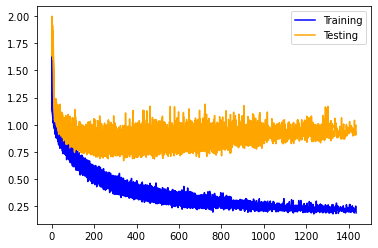

In [8]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

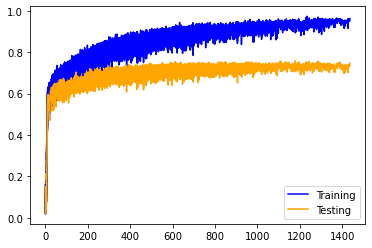

In [9]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

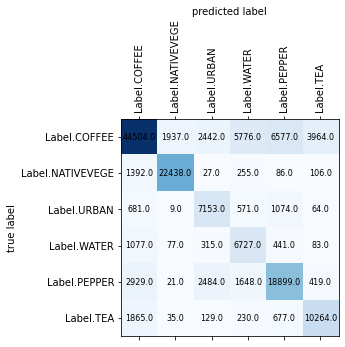

In [10]:
plot_confusion_matrix(conf_matrix, labels)

In [11]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.84853569 0.9152017  0.56996016 0.44236207 0.68094689 0.68885906]
Mean precision:  0.6909775949466801

Recalls:  [0.68257669 0.92322251 0.74884841 0.77144495 0.71587121 0.77757576]
Mean recall:  0.7699232557440948

F-Score:  [0.75656195 0.91919461 0.64727174 0.56229364 0.69797245 0.73053381]
Mean f-score:  0.7189713660719129


# 1x16 conv, 1x32 conv, 1x64 conv s=(2, 2), 1x64 conv, 0.5 SpatialDropout, MaxPooling2D k=(2, 2) s=(1, 1), GlobalAveragePooling, 1x32 FC

In [9]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), strides=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), padding="same", activation="relu"),
    SpatialDropout2D(0.25),
    MaxPooling2D(pool_size=(2, 2), strides=(1, 1)),
    GlobalAveragePooling2D(),
    Dense(32, activation='relu'),
    Flatten(name='flat'),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS, early_stopping=True)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 9, 9, 4)           0         
_________________________________________________________________
batch_normalization (BatchNo (None, 9, 9, 4)           16        
_________________________________________________________________
conv2d (Conv2D)              (None, 9, 9, 16)          272       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 9, 9, 32)          2080      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 5, 5, 64)          8256      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 5, 5, 64)          16448     
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 5, 5, 64)          0

57/57 [==============================] - 1s 10ms/step - loss: 0.9544 - accuracy: 0.5815 - val_loss: 0.9872 - val_accuracy: 0.6116
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8206 - accuracy: 0.6328 - val_loss: 1.0881 - val_accuracy: 0.5365
Epoch 46/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9137 - accuracy: 0.5764 - val_loss: 0.9867 - val_accuracy: 0.6287
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9616 - accuracy: 0.5891 - val_loss: 0.8703 - val_accuracy: 0.6706
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8310 - accuracy: 0.6234 - val_loss: 0.9313 - val_accuracy: 0.6403
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8837 - accuracy: 0.6047 - val_loss: 1.0027 - val_accuracy: 0.6044
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8897 - accuracy: 0.5894 - val_loss: 0.9743 - val_accuracy: 0.6182
Epoch 51/20

57/57 [==============================] - 1s 9ms/step - loss: 0.7314 - accuracy: 0.6615 - val_loss: 0.9438 - val_accuracy: 0.6273
Epoch 102/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7005 - accuracy: 0.6866 - val_loss: 0.8938 - val_accuracy: 0.6482
Epoch 103/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7003 - accuracy: 0.6802 - val_loss: 0.8853 - val_accuracy: 0.6478
Epoch 104/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7029 - accuracy: 0.6514 - val_loss: 0.8103 - val_accuracy: 0.6897
Epoch 105/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7014 - accuracy: 0.6611 - val_loss: 0.8621 - val_accuracy: 0.6596
Epoch 106/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7276 - accuracy: 0.6612 - val_loss: 0.9341 - val_accuracy: 0.6365
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6635 - accuracy: 0.6660 - val_loss: 0.9294 - val_accuracy: 0.6258
Ep

Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5797 - accuracy: 0.7108 - val_loss: 0.8665 - val_accuracy: 0.6585
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5945 - accuracy: 0.6977 - val_loss: 0.9002 - val_accuracy: 0.6397
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5940 - accuracy: 0.6959 - val_loss: 0.8518 - val_accuracy: 0.6740
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5924 - accuracy: 0.6958 - val_loss: 0.8167 - val_accuracy: 0.6925
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5475 - accuracy: 0.7259 - val_loss: 0.8613 - val_accuracy: 0.6659
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5881 - accuracy: 0.6939 - val_loss: 0.8195 - val_accuracy: 0.6900
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5373 - accuracy: 0.7251 - val_loss: 0.9575 - val_accuracy:

Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4979 - accuracy: 0.7263 - val_loss: 0.8407 - val_accuracy: 0.6866
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5091 - accuracy: 0.7345 - val_loss: 0.8077 - val_accuracy: 0.6907
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4372 - accuracy: 0.7601 - val_loss: 0.8720 - val_accuracy: 0.6743
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5507 - accuracy: 0.7277 - val_loss: 0.7641 - val_accuracy: 0.7024
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5220 - accuracy: 0.7337 - val_loss: 0.8135 - val_accuracy: 0.6853
Epoch 220/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5040 - accuracy: 0.7221 - val_loss: 0.8636 - val_accuracy: 0.6653
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5532 - accuracy: 0.7053 - val_loss: 0.7707 - val_accuracy

Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4401 - accuracy: 0.7469 - val_loss: 0.8279 - val_accuracy: 0.6865
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4596 - accuracy: 0.7597 - val_loss: 0.8148 - val_accuracy: 0.6935
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4431 - accuracy: 0.7682 - val_loss: 0.9203 - val_accuracy: 0.6516
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5006 - accuracy: 0.7209 - val_loss: 0.7588 - val_accuracy: 0.7070
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4234 - accuracy: 0.7581 - val_loss: 0.8260 - val_accuracy: 0.6878
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5122 - accuracy: 0.7197 - val_loss: 0.8063 - val_accuracy: 0.7009
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4648 - accuracy: 0.7663 - val_loss: 0.8207 - val_accuracy:

Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4990 - accuracy: 0.7298 - val_loss: 0.8196 - val_accuracy: 0.6854
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4219 - accuracy: 0.7792 - val_loss: 0.7868 - val_accuracy: 0.7045
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3929 - accuracy: 0.7744 - val_loss: 0.8214 - val_accuracy: 0.6953
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4226 - accuracy: 0.7648 - val_loss: 0.9172 - val_accuracy: 0.6630
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4360 - accuracy: 0.7571 - val_loss: 0.8237 - val_accuracy: 0.6920
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4194 - accuracy: 0.7376 - val_loss: 0.8441 - val_accuracy: 0.7049
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3656 - accuracy: 0.7808 - val_loss: 0.8707 - val_accuracy:

Epoch 386/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3544 - accuracy: 0.7809 - val_loss: 0.8116 - val_accuracy: 0.7077
Epoch 387/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3873 - accuracy: 0.7619 - val_loss: 0.8692 - val_accuracy: 0.6900
Epoch 388/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3538 - accuracy: 0.8102 - val_loss: 0.8576 - val_accuracy: 0.6971
Epoch 389/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3766 - accuracy: 0.7758 - val_loss: 0.7510 - val_accuracy: 0.7389
Epoch 390/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3818 - accuracy: 0.7899 - val_loss: 0.8887 - val_accuracy: 0.6873
Epoch 391/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3891 - accuracy: 0.7728 - val_loss: 0.9215 - val_accuracy: 0.6697
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3756 - accuracy: 0.7864 - val_loss: 0.8085 - val_acc

57/57 [==============================] - 1s 11ms/step - loss: 0.3693 - accuracy: 0.7912 - val_loss: 0.8026 - val_accuracy: 0.7148
Epoch 443/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3347 - accuracy: 0.8062 - val_loss: 0.8221 - val_accuracy: 0.7089
Epoch 444/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3438 - accuracy: 0.8005 - val_loss: 0.9023 - val_accuracy: 0.6781
Epoch 445/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3082 - accuracy: 0.8033 - val_loss: 0.7969 - val_accuracy: 0.7344
Epoch 446/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3407 - accuracy: 0.8174 - val_loss: 0.8549 - val_accuracy: 0.7059
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3604 - accuracy: 0.7723 - val_loss: 0.8475 - val_accuracy: 0.7071
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3045 - accuracy: 0.8084 - val_loss: 0.7968 - val_accuracy: 0.7233
Ep

Epoch 499/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3484 - accuracy: 0.8000 - val_loss: 0.8115 - val_accuracy: 0.7220
Epoch 500/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3442 - accuracy: 0.7944 - val_loss: 0.8634 - val_accuracy: 0.7151
Epoch 501/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3607 - accuracy: 0.8036 - val_loss: 0.8580 - val_accuracy: 0.7018
Epoch 502/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3532 - accuracy: 0.8039 - val_loss: 0.8265 - val_accuracy: 0.7161
Epoch 503/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3589 - accuracy: 0.7936 - val_loss: 0.8417 - val_accuracy: 0.7044
Epoch 504/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.3167 - accuracy: 0.8034 - val_loss: 0.9281 - val_accuracy: 0.6952
Epoch 505/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3874 - accuracy: 0.7865 - val_loss: 0.8322 - val_ac

57/57 [==============================] - 1s 11ms/step - loss: 0.2964 - accuracy: 0.8098 - val_loss: 0.8166 - val_accuracy: 0.7296
Epoch 556/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3259 - accuracy: 0.8015 - val_loss: 0.8861 - val_accuracy: 0.7094
Epoch 557/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3440 - accuracy: 0.7946 - val_loss: 0.8003 - val_accuracy: 0.7300
Epoch 558/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2946 - accuracy: 0.8341 - val_loss: 0.7940 - val_accuracy: 0.7395
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3200 - accuracy: 0.8168 - val_loss: 0.8928 - val_accuracy: 0.7005
Epoch 560/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3619 - accuracy: 0.8002 - val_loss: 0.9033 - val_accuracy: 0.6895
Epoch 561/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3208 - accuracy: 0.8012 - val_loss: 0.8505 - val_accuracy: 0.7116
E

57/57 [==============================] - 1s 11ms/step - loss: 0.2742 - accuracy: 0.8286 - val_loss: 0.8149 - val_accuracy: 0.7314
Epoch 612/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2931 - accuracy: 0.8339 - val_loss: 0.8241 - val_accuracy: 0.7349
Epoch 613/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3028 - accuracy: 0.8216 - val_loss: 0.8039 - val_accuracy: 0.7360
Epoch 614/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3012 - accuracy: 0.8395 - val_loss: 0.8417 - val_accuracy: 0.7305
Epoch 615/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2954 - accuracy: 0.8214 - val_loss: 0.7966 - val_accuracy: 0.7303
Epoch 616/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3017 - accuracy: 0.8221 - val_loss: 0.7926 - val_accuracy: 0.7383
Epoch 617/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2598 - accuracy: 0.8392 - val_loss: 0.8030 - val_accuracy: 0.7405


57/57 [==============================] - 1s 10ms/step - loss: 0.3236 - accuracy: 0.8108 - val_loss: 0.8629 - val_accuracy: 0.7178
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3464 - accuracy: 0.8162 - val_loss: 0.8505 - val_accuracy: 0.7243
Epoch 669/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3333 - accuracy: 0.8335 - val_loss: 0.9063 - val_accuracy: 0.7064
Epoch 670/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3119 - accuracy: 0.8064 - val_loss: 0.7879 - val_accuracy: 0.7440
Epoch 671/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2889 - accuracy: 0.8331 - val_loss: 0.7887 - val_accuracy: 0.7461
Epoch 672/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2670 - accuracy: 0.8432 - val_loss: 0.7781 - val_accuracy: 0.7466
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3029 - accuracy: 0.8115 - val_loss: 0.8965 - val_accuracy: 0.7011
Ep

Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2629 - accuracy: 0.8397 - val_loss: 0.8576 - val_accuracy: 0.7205
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3034 - accuracy: 0.8098 - val_loss: 0.8222 - val_accuracy: 0.7302
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3797 - accuracy: 0.7898 - val_loss: 0.7882 - val_accuracy: 0.7393
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2816 - accuracy: 0.8334 - val_loss: 0.8298 - val_accuracy: 0.7363
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2502 - accuracy: 0.8519 - val_loss: 0.8159 - val_accuracy: 0.7349
Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2582 - accuracy: 0.8329 - val_loss: 0.8551 - val_accuracy: 0.7186
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3298 - accuracy: 0.8062 - val_loss: 0.8186 - val_accuracy:

Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2960 - accuracy: 0.8269 - val_loss: 0.8961 - val_accuracy: 0.7287
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2854 - accuracy: 0.8368 - val_loss: 0.8214 - val_accuracy: 0.7466
Epoch 783/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2624 - accuracy: 0.8453 - val_loss: 0.8238 - val_accuracy: 0.7329
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2315 - accuracy: 0.8546 - val_loss: 0.7763 - val_accuracy: 0.7579
Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2665 - accuracy: 0.8369 - val_loss: 0.8209 - val_accuracy: 0.7364
Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2960 - accuracy: 0.8379 - val_loss: 0.8508 - val_accuracy: 0.7235
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2843 - accuracy: 0.8380 - val_loss: 0.8560 - val_accuracy

Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2489 - accuracy: 0.8423 - val_loss: 0.8036 - val_accuracy: 0.7539
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2588 - accuracy: 0.8528 - val_loss: 0.8371 - val_accuracy: 0.7344
Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2763 - accuracy: 0.8195 - val_loss: 0.9093 - val_accuracy: 0.7094
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2561 - accuracy: 0.8449 - val_loss: 0.8551 - val_accuracy: 0.7349
Epoch 842/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2402 - accuracy: 0.8561 - val_loss: 0.8805 - val_accuracy: 0.7317
Epoch 843/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2312 - accuracy: 0.8590 - val_loss: 0.8337 - val_accuracy: 0.7586
Epoch 844/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2436 - accuracy: 0.8594 - val_loss: 0.8538 - val_accuracy:

Epoch 895/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2639 - accuracy: 0.8405 - val_loss: 0.9169 - val_accuracy: 0.7176
Epoch 896/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2639 - accuracy: 0.8298 - val_loss: 0.8740 - val_accuracy: 0.7283
Epoch 897/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2691 - accuracy: 0.8308 - val_loss: 0.8697 - val_accuracy: 0.7309
Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2844 - accuracy: 0.8668 - val_loss: 0.8170 - val_accuracy: 0.7535
Epoch 899/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1964 - accuracy: 0.8545 - val_loss: 0.9011 - val_accuracy: 0.7300
Epoch 900/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2644 - accuracy: 0.8343 - val_loss: 0.8565 - val_accuracy: 0.7382
Epoch 901/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2634 - accuracy: 0.8318 - val_loss: 0.8249 - val_accuracy:

Epoch 952/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2309 - accuracy: 0.8552 - val_loss: 0.8327 - val_accuracy: 0.7451
Epoch 953/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2022 - accuracy: 0.8786 - val_loss: 0.8233 - val_accuracy: 0.7457
Epoch 954/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2366 - accuracy: 0.8530 - val_loss: 0.8388 - val_accuracy: 0.7408
Epoch 955/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2107 - accuracy: 0.8639 - val_loss: 0.8486 - val_accuracy: 0.7444
Epoch 956/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2550 - accuracy: 0.8406 - val_loss: 0.8319 - val_accuracy: 0.7443
Epoch 957/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2448 - accuracy: 0.8566 - val_loss: 0.8736 - val_accuracy: 0.7321
Epoch 958/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2734 - accuracy: 0.8338 - val_loss: 0.8836 - val_accuracy

Epoch 1009/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2710 - accuracy: 0.8378 - val_loss: 0.9940 - val_accuracy: 0.6975
Epoch 1010/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2870 - accuracy: 0.8379 - val_loss: 0.8060 - val_accuracy: 0.7533
Epoch 1011/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2380 - accuracy: 0.8680 - val_loss: 0.9582 - val_accuracy: 0.7188
Epoch 1012/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2610 - accuracy: 0.8573 - val_loss: 0.8995 - val_accuracy: 0.7390
Epoch 1013/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2339 - accuracy: 0.8456 - val_loss: 0.8703 - val_accuracy: 0.7451
Epoch 1014/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2417 - accuracy: 0.8407 - val_loss: 0.8215 - val_accuracy: 0.7527
Epoch 1015/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2246 - accuracy: 0.8588 - val_loss: 0.8934 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 0.2754 - accuracy: 0.8350 - val_loss: 0.8200 - val_accuracy: 0.7526
Epoch 1066/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2460 - accuracy: 0.8480 - val_loss: 0.8554 - val_accuracy: 0.7495
Epoch 1067/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2788 - accuracy: 0.8423 - val_loss: 0.8165 - val_accuracy: 0.7619
Epoch 1068/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2620 - accuracy: 0.8507 - val_loss: 0.9211 - val_accuracy: 0.7349
Epoch 1069/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2359 - accuracy: 0.8817 - val_loss: 0.8375 - val_accuracy: 0.7514
Epoch 1070/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2563 - accuracy: 0.8706 - val_loss: 0.8906 - val_accuracy: 0.7315

Fold  2 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 18ms/step - loss: 1.7466 - accuracy: 0.1496 - val_loss: 1.7345 - va

57/57 [==============================] - 1s 9ms/step - loss: 0.8069 - accuracy: 0.6017 - val_loss: 0.8938 - val_accuracy: 0.6529
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8401 - accuracy: 0.6031 - val_loss: 1.0412 - val_accuracy: 0.5774
Epoch 54/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8595 - accuracy: 0.6001 - val_loss: 0.9393 - val_accuracy: 0.6396
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7582 - accuracy: 0.6507 - val_loss: 0.9606 - val_accuracy: 0.6203
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8436 - accuracy: 0.6116 - val_loss: 1.0397 - val_accuracy: 0.5884
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8635 - accuracy: 0.5979 - val_loss: 0.8874 - val_accuracy: 0.6609
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7993 - accuracy: 0.6317 - val_loss: 0.9726 - val_accuracy: 0.6150
Epoch 59/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6885 - accuracy: 0.6573 - val_loss: 0.8897 - val_accuracy: 0.6512
Epoch 110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6640 - accuracy: 0.6528 - val_loss: 0.9050 - val_accuracy: 0.6457
Epoch 111/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6469 - accuracy: 0.6955 - val_loss: 0.9409 - val_accuracy: 0.6267
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6866 - accuracy: 0.6528 - val_loss: 1.0125 - val_accuracy: 0.6023
Epoch 113/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6938 - accuracy: 0.6546 - val_loss: 0.8384 - val_accuracy: 0.6819
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6419 - accuracy: 0.6833 - val_loss: 0.9433 - val_accuracy: 0.6270
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6620 - accuracy: 0.6700 - val_loss: 0.9578 - val_accuracy: 0.6179
Epoch 1

Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6061 - accuracy: 0.6981 - val_loss: 0.8387 - val_accuracy: 0.6679
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5936 - accuracy: 0.6995 - val_loss: 0.8770 - val_accuracy: 0.6533
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5918 - accuracy: 0.6943 - val_loss: 0.8251 - val_accuracy: 0.6800
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5498 - accuracy: 0.7191 - val_loss: 0.8325 - val_accuracy: 0.6656
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5645 - accuracy: 0.6905 - val_loss: 0.7475 - val_accuracy: 0.7122
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5965 - accuracy: 0.6970 - val_loss: 0.8249 - val_accuracy: 0.6644
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5636 - accuracy: 0.7009 - val_loss: 0.8046 - val_accuracy:

Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5145 - accuracy: 0.7507 - val_loss: 0.8319 - val_accuracy: 0.6797
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5099 - accuracy: 0.7290 - val_loss: 0.8031 - val_accuracy: 0.6861
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4689 - accuracy: 0.7261 - val_loss: 0.8556 - val_accuracy: 0.6853
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5100 - accuracy: 0.7296 - val_loss: 0.9727 - val_accuracy: 0.6122
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5370 - accuracy: 0.7167 - val_loss: 0.7406 - val_accuracy: 0.7164
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4713 - accuracy: 0.7381 - val_loss: 0.8286 - val_accuracy: 0.6825
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4904 - accuracy: 0.7186 - val_loss: 0.8322 - val_accuracy:

Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4323 - accuracy: 0.7538 - val_loss: 0.7729 - val_accuracy: 0.7058
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4345 - accuracy: 0.7717 - val_loss: 0.7786 - val_accuracy: 0.7053
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4585 - accuracy: 0.7420 - val_loss: 0.7583 - val_accuracy: 0.7255
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4830 - accuracy: 0.7527 - val_loss: 0.9003 - val_accuracy: 0.6542
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4556 - accuracy: 0.7349 - val_loss: 0.8574 - val_accuracy: 0.6643
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4550 - accuracy: 0.7499 - val_loss: 0.8324 - val_accuracy: 0.6921
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4523 - accuracy: 0.7447 - val_loss: 0.7937 - val_accuracy:

Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3878 - accuracy: 0.7765 - val_loss: 0.8003 - val_accuracy: 0.7035
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4114 - accuracy: 0.7498 - val_loss: 0.7765 - val_accuracy: 0.7084
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4000 - accuracy: 0.7776 - val_loss: 0.7684 - val_accuracy: 0.7157
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4238 - accuracy: 0.7639 - val_loss: 0.8456 - val_accuracy: 0.6778
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4218 - accuracy: 0.7527 - val_loss: 0.7812 - val_accuracy: 0.7110
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4060 - accuracy: 0.7648 - val_loss: 0.7199 - val_accuracy: 0.7389
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3945 - accuracy: 0.7797 - val_loss: 0.8371 - val_accuracy:

Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3384 - accuracy: 0.8075 - val_loss: 0.8023 - val_accuracy: 0.7029
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3646 - accuracy: 0.7751 - val_loss: 0.7431 - val_accuracy: 0.7409
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3841 - accuracy: 0.7832 - val_loss: 0.8828 - val_accuracy: 0.6759
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4036 - accuracy: 0.7530 - val_loss: 0.8779 - val_accuracy: 0.6740
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3983 - accuracy: 0.7795 - val_loss: 0.7828 - val_accuracy: 0.7133
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3652 - accuracy: 0.7777 - val_loss: 0.7596 - val_accuracy: 0.7293
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3732 - accuracy: 0.7866 - val_loss: 0.8013 - val_accuracy:

Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3480 - accuracy: 0.7962 - val_loss: 0.8040 - val_accuracy: 0.7139
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3769 - accuracy: 0.7791 - val_loss: 0.7647 - val_accuracy: 0.7232
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3800 - accuracy: 0.7854 - val_loss: 0.7877 - val_accuracy: 0.7195
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3634 - accuracy: 0.7968 - val_loss: 0.7415 - val_accuracy: 0.7386
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3699 - accuracy: 0.7745 - val_loss: 0.7817 - val_accuracy: 0.7137
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3255 - accuracy: 0.7945 - val_loss: 0.7616 - val_accuracy: 0.7321
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3746 - accuracy: 0.7680 - val_loss: 0.8099 - val_accuracy:

Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3641 - accuracy: 0.8071 - val_loss: 0.8533 - val_accuracy: 0.6982
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4326 - accuracy: 0.7875 - val_loss: 0.8132 - val_accuracy: 0.7070
Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3502 - accuracy: 0.7893 - val_loss: 0.7517 - val_accuracy: 0.7396
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3554 - accuracy: 0.7930 - val_loss: 0.7414 - val_accuracy: 0.7468
Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3606 - accuracy: 0.7991 - val_loss: 0.7808 - val_accuracy: 0.7324
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3946 - accuracy: 0.7859 - val_loss: 0.7832 - val_accuracy: 0.7252
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3505 - accuracy: 0.7937 - val_loss: 0.7123 - val_accuracy:

Epoch 565/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3395 - accuracy: 0.8020 - val_loss: 0.8685 - val_accuracy: 0.7085
Epoch 566/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3339 - accuracy: 0.7990 - val_loss: 0.8155 - val_accuracy: 0.7138
Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3165 - accuracy: 0.8135 - val_loss: 0.7673 - val_accuracy: 0.7333
Epoch 568/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3469 - accuracy: 0.8048 - val_loss: 0.7594 - val_accuracy: 0.7397
Epoch 569/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3182 - accuracy: 0.7952 - val_loss: 0.7231 - val_accuracy: 0.7511
Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3175 - accuracy: 0.8185 - val_loss: 0.7369 - val_accuracy: 0.7576
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3165 - accuracy: 0.8102 - val_loss: 0.8110 - val_accuracy:

Epoch 622/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2698 - accuracy: 0.8350 - val_loss: 0.7681 - val_accuracy: 0.7500
Epoch 623/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2883 - accuracy: 0.8327 - val_loss: 0.7014 - val_accuracy: 0.7682
Epoch 624/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2796 - accuracy: 0.8376 - val_loss: 0.8091 - val_accuracy: 0.7310
Epoch 625/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3032 - accuracy: 0.8147 - val_loss: 0.7617 - val_accuracy: 0.7606
Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2882 - accuracy: 0.8284 - val_loss: 0.8069 - val_accuracy: 0.7310
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3360 - accuracy: 0.8051 - val_loss: 0.7766 - val_accuracy: 0.7481
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3687 - accuracy: 0.7921 - val_loss: 0.7568 - val_accuracy:

Epoch 679/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2682 - accuracy: 0.8191 - val_loss: 0.7678 - val_accuracy: 0.7515
Epoch 680/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2627 - accuracy: 0.8399 - val_loss: 0.8444 - val_accuracy: 0.7225
Epoch 681/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2692 - accuracy: 0.8164 - val_loss: 0.7846 - val_accuracy: 0.7369
Epoch 682/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2529 - accuracy: 0.8452 - val_loss: 0.8431 - val_accuracy: 0.7328
Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2896 - accuracy: 0.8339 - val_loss: 0.9719 - val_accuracy: 0.6785
Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3047 - accuracy: 0.7965 - val_loss: 0.8414 - val_accuracy: 0.7165
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2974 - accuracy: 0.8022 - val_loss: 0.7783 - val_accuracy:

Epoch 736/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2496 - accuracy: 0.8441 - val_loss: 0.7544 - val_accuracy: 0.7621
Epoch 737/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3070 - accuracy: 0.8302 - val_loss: 0.8558 - val_accuracy: 0.7295
Epoch 738/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3112 - accuracy: 0.8207 - val_loss: 0.7442 - val_accuracy: 0.7681
Epoch 739/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2564 - accuracy: 0.8460 - val_loss: 0.7720 - val_accuracy: 0.7540
Epoch 740/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2847 - accuracy: 0.8470 - val_loss: 0.7728 - val_accuracy: 0.7551
Epoch 741/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2814 - accuracy: 0.8398 - val_loss: 0.7898 - val_accuracy: 0.7397
Epoch 742/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2310 - accuracy: 0.8628 - val_loss: 0.8153 - val_accuracy:

Epoch 793/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2612 - accuracy: 0.8294 - val_loss: 0.7744 - val_accuracy: 0.7460
Epoch 794/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2759 - accuracy: 0.8303 - val_loss: 0.7563 - val_accuracy: 0.7552
Epoch 795/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2336 - accuracy: 0.8326 - val_loss: 0.7586 - val_accuracy: 0.7621
Epoch 796/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2903 - accuracy: 0.8353 - val_loss: 0.7935 - val_accuracy: 0.7514
Epoch 797/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2997 - accuracy: 0.8357 - val_loss: 0.7722 - val_accuracy: 0.7441
Epoch 798/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2616 - accuracy: 0.8570 - val_loss: 0.8360 - val_accuracy: 0.7323
Epoch 799/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2701 - accuracy: 0.8315 - val_loss: 0.7558 - val_accurac

Epoch 850/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2745 - accuracy: 0.8291 - val_loss: 0.7934 - val_accuracy: 0.7527
Epoch 851/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3124 - accuracy: 0.8223 - val_loss: 0.7854 - val_accuracy: 0.7434
Epoch 852/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2562 - accuracy: 0.8248 - val_loss: 0.8176 - val_accuracy: 0.7359
Epoch 853/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2435 - accuracy: 0.8462 - val_loss: 0.7328 - val_accuracy: 0.7667
Epoch 854/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2906 - accuracy: 0.8330 - val_loss: 0.8947 - val_accuracy: 0.7186
Epoch 855/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2920 - accuracy: 0.8068 - val_loss: 0.8318 - val_accuracy: 0.7324
Epoch 856/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2753 - accuracy: 0.8343 - val_loss: 0.7582 - val_accura

Epoch 907/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2665 - accuracy: 0.8546 - val_loss: 0.8255 - val_accuracy: 0.7525
Epoch 908/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2753 - accuracy: 0.8280 - val_loss: 0.7908 - val_accuracy: 0.7525
Epoch 909/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2561 - accuracy: 0.8604 - val_loss: 0.8085 - val_accuracy: 0.7504
Epoch 910/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2862 - accuracy: 0.8475 - val_loss: 0.8799 - val_accuracy: 0.7283
Epoch 911/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2405 - accuracy: 0.8437 - val_loss: 0.9285 - val_accuracy: 0.7143
Epoch 912/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2937 - accuracy: 0.8148 - val_loss: 0.7703 - val_accuracy: 0.7618
Epoch 913/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2369 - accuracy: 0.8565 - val_loss: 0.8245 - val_accuracy:

Epoch 964/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2110 - accuracy: 0.8605 - val_loss: 0.8911 - val_accuracy: 0.7320
Epoch 965/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2265 - accuracy: 0.8569 - val_loss: 0.9338 - val_accuracy: 0.7171
Epoch 966/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2501 - accuracy: 0.8233 - val_loss: 0.7645 - val_accuracy: 0.7640
Epoch 967/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2330 - accuracy: 0.8693 - val_loss: 0.8067 - val_accuracy: 0.7551
Epoch 968/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2930 - accuracy: 0.8378 - val_loss: 0.8046 - val_accuracy: 0.7533
Epoch 969/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3097 - accuracy: 0.8331 - val_loss: 0.8079 - val_accuracy: 0.7435
Epoch 970/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2835 - accuracy: 0.8479 - val_loss: 0.7993 - val_accuracy:

Epoch 1021/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2270 - accuracy: 0.8567 - val_loss: 0.7925 - val_accuracy: 0.7616
Epoch 1022/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2312 - accuracy: 0.8637 - val_loss: 0.7880 - val_accuracy: 0.7629
Epoch 1023/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2350 - accuracy: 0.8535 - val_loss: 0.8179 - val_accuracy: 0.7480
Epoch 1024/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2539 - accuracy: 0.8397 - val_loss: 0.8155 - val_accuracy: 0.7359
Epoch 1025/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2230 - accuracy: 0.8542 - val_loss: 0.8031 - val_accuracy: 0.7445
Epoch 1026/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2203 - accuracy: 0.8543 - val_loss: 0.7519 - val_accuracy: 0.7701
Epoch 1027/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2606 - accuracy: 0.8508 - val_loss: 0.8050 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 0.2477 - accuracy: 0.8495 - val_loss: 0.8240 - val_accuracy: 0.7487
Epoch 1078/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2262 - accuracy: 0.8549 - val_loss: 0.7783 - val_accuracy: 0.7632
Epoch 1079/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2290 - accuracy: 0.8691 - val_loss: 0.7992 - val_accuracy: 0.7656
Epoch 1080/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3026 - accuracy: 0.8416 - val_loss: 0.7969 - val_accuracy: 0.7643
Epoch 1081/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2359 - accuracy: 0.8623 - val_loss: 0.8151 - val_accuracy: 0.7485
Epoch 1082/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2372 - accuracy: 0.8502 - val_loss: 0.8316 - val_accuracy: 0.7500
Epoch 1083/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2462 - accuracy: 0.8475 - val_loss: 0.8659 - val_accuracy: 0.7416
E

57/57 [==============================] - 1s 10ms/step - loss: 0.2889 - accuracy: 0.8517 - val_loss: 0.8366 - val_accuracy: 0.7552
Epoch 1134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2774 - accuracy: 0.8394 - val_loss: 0.8109 - val_accuracy: 0.7578
Epoch 1135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2344 - accuracy: 0.8765 - val_loss: 0.8334 - val_accuracy: 0.7513
Epoch 1136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2276 - accuracy: 0.8677 - val_loss: 0.7442 - val_accuracy: 0.7768
Epoch 1137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2306 - accuracy: 0.8609 - val_loss: 0.8090 - val_accuracy: 0.7575
Epoch 1138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2208 - accuracy: 0.8641 - val_loss: 0.8548 - val_accuracy: 0.7620
Epoch 1139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2428 - accuracy: 0.8666 - val_loss: 0.8173 - val_accuracy: 0.7602


57/57 [==============================] - 1s 9ms/step - loss: 0.2608 - accuracy: 0.8392 - val_loss: 0.8134 - val_accuracy: 0.7599
Epoch 1190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2450 - accuracy: 0.8438 - val_loss: 0.8304 - val_accuracy: 0.7515
Epoch 1191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2843 - accuracy: 0.8437 - val_loss: 0.8065 - val_accuracy: 0.7544
Epoch 1192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2268 - accuracy: 0.8567 - val_loss: 0.8530 - val_accuracy: 0.7443
Epoch 1193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2305 - accuracy: 0.8768 - val_loss: 0.8471 - val_accuracy: 0.7484
Epoch 1194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2674 - accuracy: 0.8369 - val_loss: 0.7762 - val_accuracy: 0.7704
Epoch 1195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2083 - accuracy: 0.8661 - val_loss: 0.8213 - val_accuracy: 0.7631
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2515 - accuracy: 0.8498 - val_loss: 0.8876 - val_accuracy: 0.7570
Epoch 1246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2485 - accuracy: 0.8716 - val_loss: 0.7879 - val_accuracy: 0.7719
Epoch 1247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2365 - accuracy: 0.8612 - val_loss: 0.8750 - val_accuracy: 0.7465
Epoch 1248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2305 - accuracy: 0.8671 - val_loss: 0.8170 - val_accuracy: 0.7575
Epoch 1249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2484 - accuracy: 0.8479 - val_loss: 0.8270 - val_accuracy: 0.7564
Epoch 1250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2835 - accuracy: 0.8462 - val_loss: 0.8753 - val_accuracy: 0.7397
Epoch 1251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2241 - accuracy: 0.8700 - val_loss: 0.9457 - val_accuracy: 0.7230
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2034 - accuracy: 0.8585 - val_loss: 0.8480 - val_accuracy: 0.7510
Epoch 1302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2123 - accuracy: 0.8583 - val_loss: 0.9027 - val_accuracy: 0.7404
Epoch 1303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2106 - accuracy: 0.8794 - val_loss: 0.8851 - val_accuracy: 0.7424
Epoch 1304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2366 - accuracy: 0.8559 - val_loss: 0.8278 - val_accuracy: 0.7555
Epoch 1305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1855 - accuracy: 0.8816 - val_loss: 0.9137 - val_accuracy: 0.7313
Epoch 1306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1838 - accuracy: 0.8642 - val_loss: 0.7815 - val_accuracy: 0.7772
Epoch 1307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2195 - accuracy: 0.8650 - val_loss: 0.7685 - val_accuracy: 0.7749
E

57/57 [==============================] - 1s 9ms/step - loss: 0.1778 - accuracy: 0.8884 - val_loss: 0.8368 - val_accuracy: 0.7545
Epoch 1358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1945 - accuracy: 0.8524 - val_loss: 0.8367 - val_accuracy: 0.7673
Epoch 1359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2139 - accuracy: 0.8677 - val_loss: 0.8607 - val_accuracy: 0.7574
Epoch 1360/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2586 - accuracy: 0.8584 - val_loss: 0.8300 - val_accuracy: 0.7526
Epoch 1361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2649 - accuracy: 0.8550 - val_loss: 0.7998 - val_accuracy: 0.7704
Epoch 1362/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2149 - accuracy: 0.8518 - val_loss: 0.8510 - val_accuracy: 0.7567
Epoch 1363/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2154 - accuracy: 0.8695 - val_loss: 0.8670 - val_accuracy: 0.738

57/57 [==============================] - 1s 9ms/step - loss: 0.2470 - accuracy: 0.8629 - val_loss: 0.8412 - val_accuracy: 0.7534
Epoch 1414/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1897 - accuracy: 0.8661 - val_loss: 0.8399 - val_accuracy: 0.7549
Epoch 1415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1936 - accuracy: 0.8714 - val_loss: 0.8365 - val_accuracy: 0.7556
Epoch 1416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2149 - accuracy: 0.8654 - val_loss: 0.8050 - val_accuracy: 0.7635
Epoch 1417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2047 - accuracy: 0.8772 - val_loss: 0.8639 - val_accuracy: 0.7502
Epoch 1418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2029 - accuracy: 0.8652 - val_loss: 0.8780 - val_accuracy: 0.7473
Epoch 1419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2364 - accuracy: 0.8591 - val_loss: 0.8744 - val_accuracy: 0.7518
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2338 - accuracy: 0.8680 - val_loss: 0.8736 - val_accuracy: 0.7426
Epoch 1470/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2218 - accuracy: 0.8576 - val_loss: 0.8415 - val_accuracy: 0.7443
Epoch 1471/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1950 - accuracy: 0.8684 - val_loss: 0.8714 - val_accuracy: 0.7515
Epoch 1472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2052 - accuracy: 0.8747 - val_loss: 0.8726 - val_accuracy: 0.7495
Epoch 1473/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1914 - accuracy: 0.8899 - val_loss: 0.8489 - val_accuracy: 0.7666
Epoch 1474/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2331 - accuracy: 0.8674 - val_loss: 0.8065 - val_accuracy: 0.7686
Epoch 1475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2787 - accuracy: 0.8647 - val_loss: 0.8330 - val_accuracy: 0.7549

Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9151 - accuracy: 0.5933 - val_loss: 1.0404 - val_accuracy: 0.5991
Epoch 33/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8787 - accuracy: 0.6142 - val_loss: 0.9984 - val_accuracy: 0.6013
Epoch 34/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8943 - accuracy: 0.5991 - val_loss: 0.9493 - val_accuracy: 0.6329
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8744 - accuracy: 0.6169 - val_loss: 0.9670 - val_accuracy: 0.6158
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8844 - accuracy: 0.6151 - val_loss: 1.0093 - val_accuracy: 0.6014
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9061 - accuracy: 0.5940 - val_loss: 0.9186 - val_accuracy: 0.6424
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8424 - accuracy: 0.6421 - val_loss: 1.0626 - val_accuracy: 0.5580

57/57 [==============================] - 1s 9ms/step - loss: 0.7708 - accuracy: 0.6552 - val_loss: 0.7956 - val_accuracy: 0.7082
Epoch 90/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6893 - accuracy: 0.6959 - val_loss: 0.9759 - val_accuracy: 0.6268
Epoch 91/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7014 - accuracy: 0.6719 - val_loss: 0.9768 - val_accuracy: 0.6180
Epoch 92/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6643 - accuracy: 0.6836 - val_loss: 0.8493 - val_accuracy: 0.6776
Epoch 93/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7349 - accuracy: 0.6578 - val_loss: 0.9395 - val_accuracy: 0.6355
Epoch 94/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6446 - accuracy: 0.6749 - val_loss: 0.9792 - val_accuracy: 0.6282
Epoch 95/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6951 - accuracy: 0.6804 - val_loss: 0.8906 - val_accuracy: 0.6709
Epoch 96/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6018 - accuracy: 0.7164 - val_loss: 0.8671 - val_accuracy: 0.6818
Epoch 147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6223 - accuracy: 0.7077 - val_loss: 0.8887 - val_accuracy: 0.6658
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5766 - accuracy: 0.7178 - val_loss: 0.8942 - val_accuracy: 0.6673
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5929 - accuracy: 0.7036 - val_loss: 0.7578 - val_accuracy: 0.7092
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6022 - accuracy: 0.7383 - val_loss: 0.8540 - val_accuracy: 0.6762
Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5345 - accuracy: 0.7370 - val_loss: 0.7651 - val_accuracy: 0.7058
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6188 - accuracy: 0.7078 - val_loss: 0.7838 - val_accuracy: 0.7008
Epoch 1

Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4802 - accuracy: 0.7400 - val_loss: 0.9158 - val_accuracy: 0.6576
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5053 - accuracy: 0.7351 - val_loss: 0.8338 - val_accuracy: 0.6860
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5017 - accuracy: 0.7258 - val_loss: 0.9168 - val_accuracy: 0.6544
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5341 - accuracy: 0.7287 - val_loss: 0.8648 - val_accuracy: 0.6826
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5035 - accuracy: 0.7488 - val_loss: 0.8599 - val_accuracy: 0.6782
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5236 - accuracy: 0.7254 - val_loss: 0.7730 - val_accuracy: 0.7179
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5594 - accuracy: 0.7508 - val_loss: 0.7009 - val_accuracy:

Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4284 - accuracy: 0.7687 - val_loss: 0.8056 - val_accuracy: 0.6972
Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4599 - accuracy: 0.7558 - val_loss: 0.7905 - val_accuracy: 0.7058
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4586 - accuracy: 0.7662 - val_loss: 0.8805 - val_accuracy: 0.6801
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4779 - accuracy: 0.7353 - val_loss: 0.9083 - val_accuracy: 0.6629
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4343 - accuracy: 0.7668 - val_loss: 0.8518 - val_accuracy: 0.6905
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4297 - accuracy: 0.7724 - val_loss: 0.8544 - val_accuracy: 0.6953
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4650 - accuracy: 0.7580 - val_loss: 0.8659 - val_accuracy:

Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3965 - accuracy: 0.7945 - val_loss: 0.7843 - val_accuracy: 0.7285
Epoch 318/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3582 - accuracy: 0.8044 - val_loss: 0.7618 - val_accuracy: 0.7336
Epoch 319/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4227 - accuracy: 0.7732 - val_loss: 0.7685 - val_accuracy: 0.7309
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4050 - accuracy: 0.7748 - val_loss: 0.9064 - val_accuracy: 0.6749
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4291 - accuracy: 0.7863 - val_loss: 0.8583 - val_accuracy: 0.6910
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3907 - accuracy: 0.7873 - val_loss: 0.8352 - val_accuracy: 0.7019
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4140 - accuracy: 0.7707 - val_loss: 0.8067 - val_accurac

Epoch 15/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9774 - accuracy: 0.5268 - val_loss: 1.0732 - val_accuracy: 0.5609
Epoch 16/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0267 - accuracy: 0.5323 - val_loss: 1.0713 - val_accuracy: 0.6232
Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0951 - accuracy: 0.5281 - val_loss: 1.0489 - val_accuracy: 0.5913
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0513 - accuracy: 0.5715 - val_loss: 1.0729 - val_accuracy: 0.6039
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0858 - accuracy: 0.5427 - val_loss: 1.0951 - val_accuracy: 0.5609
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0334 - accuracy: 0.5635 - val_loss: 0.9776 - val_accuracy: 0.6506
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8951 - accuracy: 0.6371 - val_loss: 1.0591 - val_accuracy: 0.6010

57/57 [==============================] - 1s 10ms/step - loss: 0.7700 - accuracy: 0.6732 - val_loss: 0.8955 - val_accuracy: 0.6583
Epoch 73/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7285 - accuracy: 0.6712 - val_loss: 0.8105 - val_accuracy: 0.7048
Epoch 74/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7144 - accuracy: 0.6779 - val_loss: 0.8849 - val_accuracy: 0.6667
Epoch 75/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7600 - accuracy: 0.6497 - val_loss: 0.8931 - val_accuracy: 0.6620
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7240 - accuracy: 0.6953 - val_loss: 0.8894 - val_accuracy: 0.6553
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7086 - accuracy: 0.6625 - val_loss: 0.8487 - val_accuracy: 0.6808
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7836 - accuracy: 0.6649 - val_loss: 0.8481 - val_accuracy: 0.6793
Epoch 79/200

57/57 [==============================] - 1s 9ms/step - loss: 0.6361 - accuracy: 0.7151 - val_loss: 0.8751 - val_accuracy: 0.6450
Epoch 130/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6271 - accuracy: 0.6877 - val_loss: 0.9098 - val_accuracy: 0.6470
Epoch 131/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5829 - accuracy: 0.6847 - val_loss: 0.7854 - val_accuracy: 0.6993
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6194 - accuracy: 0.6703 - val_loss: 0.8436 - val_accuracy: 0.6666
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5891 - accuracy: 0.6894 - val_loss: 0.9330 - val_accuracy: 0.6221
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6307 - accuracy: 0.6838 - val_loss: 0.8830 - val_accuracy: 0.6587
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6353 - accuracy: 0.6835 - val_loss: 0.8454 - val_accuracy: 0.6702
Epoch 1

Epoch 186/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5007 - accuracy: 0.7004 - val_loss: 0.8189 - val_accuracy: 0.6796
Epoch 187/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4492 - accuracy: 0.7320 - val_loss: 0.7809 - val_accuracy: 0.6949
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5277 - accuracy: 0.7187 - val_loss: 0.9006 - val_accuracy: 0.6481
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5493 - accuracy: 0.7024 - val_loss: 0.9361 - val_accuracy: 0.6170
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5074 - accuracy: 0.6933 - val_loss: 0.7867 - val_accuracy: 0.6894
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5094 - accuracy: 0.7236 - val_loss: 0.9963 - val_accuracy: 0.6362
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5396 - accuracy: 0.7022 - val_loss: 0.7946 - val_accuracy

Epoch 243/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4302 - accuracy: 0.7527 - val_loss: 0.8547 - val_accuracy: 0.6888
Epoch 244/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4153 - accuracy: 0.7688 - val_loss: 0.7724 - val_accuracy: 0.7061
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4362 - accuracy: 0.7458 - val_loss: 0.8809 - val_accuracy: 0.6795
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4581 - accuracy: 0.7688 - val_loss: 0.8339 - val_accuracy: 0.6811
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4796 - accuracy: 0.7415 - val_loss: 0.7825 - val_accuracy: 0.7029
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4811 - accuracy: 0.7328 - val_loss: 0.7082 - val_accuracy: 0.7302
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4196 - accuracy: 0.7810 - val_loss: 0.8033 - val_accurac

Epoch 300/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3792 - accuracy: 0.7602 - val_loss: 0.7961 - val_accuracy: 0.6944
Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3968 - accuracy: 0.7763 - val_loss: 0.8549 - val_accuracy: 0.6732
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4087 - accuracy: 0.7742 - val_loss: 0.7652 - val_accuracy: 0.7175
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4236 - accuracy: 0.7688 - val_loss: 0.7676 - val_accuracy: 0.7016
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3875 - accuracy: 0.7765 - val_loss: 0.8205 - val_accuracy: 0.6990
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3749 - accuracy: 0.7721 - val_loss: 0.9064 - val_accuracy: 0.6770
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4269 - accuracy: 0.7506 - val_loss: 0.7504 - val_accuracy:

Epoch 357/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3389 - accuracy: 0.7855 - val_loss: 0.7745 - val_accuracy: 0.7249
Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3559 - accuracy: 0.7976 - val_loss: 0.7647 - val_accuracy: 0.7194
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3953 - accuracy: 0.7765 - val_loss: 0.8474 - val_accuracy: 0.6837
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3716 - accuracy: 0.7694 - val_loss: 0.8389 - val_accuracy: 0.6920
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3944 - accuracy: 0.7654 - val_loss: 0.7679 - val_accuracy: 0.7161
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3681 - accuracy: 0.8145 - val_loss: 0.8649 - val_accuracy: 0.6989
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3874 - accuracy: 0.7926 - val_loss: 0.7813 - val_accuracy:

Epoch 414/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3337 - accuracy: 0.8103 - val_loss: 0.8667 - val_accuracy: 0.6913
Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3791 - accuracy: 0.7805 - val_loss: 0.8363 - val_accuracy: 0.7028
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3517 - accuracy: 0.7946 - val_loss: 0.7713 - val_accuracy: 0.7335
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3667 - accuracy: 0.7851 - val_loss: 0.7030 - val_accuracy: 0.7595
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3100 - accuracy: 0.8191 - val_loss: 0.8126 - val_accuracy: 0.7195
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3646 - accuracy: 0.7752 - val_loss: 0.9078 - val_accuracy: 0.6834
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3512 - accuracy: 0.7953 - val_loss: 0.7599 - val_accuracy:

Epoch 471/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3362 - accuracy: 0.8085 - val_loss: 0.7916 - val_accuracy: 0.7266
Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3544 - accuracy: 0.8096 - val_loss: 0.7397 - val_accuracy: 0.7340
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2932 - accuracy: 0.8372 - val_loss: 0.7320 - val_accuracy: 0.7434
Epoch 474/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2833 - accuracy: 0.8316 - val_loss: 0.8040 - val_accuracy: 0.7171
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3375 - accuracy: 0.8121 - val_loss: 0.7548 - val_accuracy: 0.7248
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3049 - accuracy: 0.8198 - val_loss: 0.7931 - val_accuracy: 0.7285
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3305 - accuracy: 0.8056 - val_loss: 0.7410 - val_accuracy

Epoch 528/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3138 - accuracy: 0.8222 - val_loss: 0.7640 - val_accuracy: 0.7401
Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2648 - accuracy: 0.8157 - val_loss: 0.7737 - val_accuracy: 0.7367
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2673 - accuracy: 0.8213 - val_loss: 0.8590 - val_accuracy: 0.7135
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2869 - accuracy: 0.8252 - val_loss: 0.7445 - val_accuracy: 0.7419
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3052 - accuracy: 0.8112 - val_loss: 0.8321 - val_accuracy: 0.7202
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3079 - accuracy: 0.8177 - val_loss: 0.7910 - val_accuracy: 0.7351
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3291 - accuracy: 0.8052 - val_loss: 0.7725 - val_accuracy:

Epoch 585/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3165 - accuracy: 0.8199 - val_loss: 0.7776 - val_accuracy: 0.7419
Epoch 586/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2950 - accuracy: 0.8522 - val_loss: 0.8120 - val_accuracy: 0.7249
Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2885 - accuracy: 0.8196 - val_loss: 0.6991 - val_accuracy: 0.7603
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2747 - accuracy: 0.8250 - val_loss: 0.7474 - val_accuracy: 0.7458
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2715 - accuracy: 0.8421 - val_loss: 0.8637 - val_accuracy: 0.7137
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2574 - accuracy: 0.8226 - val_loss: 0.7969 - val_accuracy: 0.7449
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3594 - accuracy: 0.8007 - val_loss: 0.7683 - val_accuracy:

Epoch 642/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2594 - accuracy: 0.8491 - val_loss: 0.7531 - val_accuracy: 0.7669
Epoch 643/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2977 - accuracy: 0.8227 - val_loss: 0.7931 - val_accuracy: 0.7424
Epoch 644/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2763 - accuracy: 0.8492 - val_loss: 0.8070 - val_accuracy: 0.7332
Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2728 - accuracy: 0.8339 - val_loss: 0.8600 - val_accuracy: 0.7180
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2783 - accuracy: 0.8351 - val_loss: 0.7616 - val_accuracy: 0.7594
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2837 - accuracy: 0.8424 - val_loss: 0.7737 - val_accuracy: 0.7454
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2635 - accuracy: 0.8412 - val_loss: 0.8010 - val_accuracy:

Epoch 699/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2684 - accuracy: 0.8314 - val_loss: 0.7826 - val_accuracy: 0.7532
Epoch 700/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2939 - accuracy: 0.8218 - val_loss: 0.8491 - val_accuracy: 0.7251
Epoch 701/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2548 - accuracy: 0.8384 - val_loss: 0.7446 - val_accuracy: 0.7601
Epoch 702/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3301 - accuracy: 0.8309 - val_loss: 0.7605 - val_accuracy: 0.7582
Epoch 703/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3141 - accuracy: 0.8311 - val_loss: 0.7286 - val_accuracy: 0.7631
Epoch 704/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3116 - accuracy: 0.8234 - val_loss: 0.8426 - val_accuracy: 0.7181
Epoch 705/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2687 - accuracy: 0.8369 - val_loss: 0.7665 - val_accuracy:

Epoch 756/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2389 - accuracy: 0.8441 - val_loss: 0.7986 - val_accuracy: 0.7521
Epoch 757/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2458 - accuracy: 0.8503 - val_loss: 0.8324 - val_accuracy: 0.7492
Epoch 758/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2250 - accuracy: 0.8728 - val_loss: 0.8250 - val_accuracy: 0.7350
Epoch 759/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3407 - accuracy: 0.8196 - val_loss: 0.7754 - val_accuracy: 0.7499
Epoch 760/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2628 - accuracy: 0.8260 - val_loss: 0.7651 - val_accuracy: 0.7618
Epoch 761/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2813 - accuracy: 0.8301 - val_loss: 0.8069 - val_accuracy: 0.7390
Epoch 762/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2593 - accuracy: 0.8507 - val_loss: 0.8147 - val_accuracy:

Epoch 813/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2640 - accuracy: 0.8413 - val_loss: 0.7758 - val_accuracy: 0.7523
Epoch 814/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2224 - accuracy: 0.8571 - val_loss: 0.7905 - val_accuracy: 0.7587
Epoch 815/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2185 - accuracy: 0.8710 - val_loss: 0.7537 - val_accuracy: 0.7715
Epoch 816/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2812 - accuracy: 0.8377 - val_loss: 0.7972 - val_accuracy: 0.7513
Epoch 817/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2521 - accuracy: 0.8435 - val_loss: 0.7793 - val_accuracy: 0.7571
Epoch 818/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2727 - accuracy: 0.8335 - val_loss: 0.7632 - val_accuracy: 0.7652
Epoch 819/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2372 - accuracy: 0.8650 - val_loss: 0.8460 - val_accuracy:

Epoch 870/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2669 - accuracy: 0.8453 - val_loss: 0.8136 - val_accuracy: 0.7570
Epoch 871/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2736 - accuracy: 0.8322 - val_loss: 0.7641 - val_accuracy: 0.7575
Epoch 872/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2787 - accuracy: 0.8410 - val_loss: 0.7759 - val_accuracy: 0.7608
Epoch 873/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2361 - accuracy: 0.8509 - val_loss: 0.7754 - val_accuracy: 0.7570
Epoch 874/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2265 - accuracy: 0.8471 - val_loss: 0.8303 - val_accuracy: 0.7583
Epoch 875/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2553 - accuracy: 0.8517 - val_loss: 0.7660 - val_accuracy: 0.7781
Epoch 876/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2729 - accuracy: 0.8584 - val_loss: 0.7563 - val_accuracy

Epoch 927/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2297 - accuracy: 0.8560 - val_loss: 0.8223 - val_accuracy: 0.7576
Epoch 928/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2393 - accuracy: 0.8618 - val_loss: 0.8849 - val_accuracy: 0.7518
Epoch 929/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2687 - accuracy: 0.8564 - val_loss: 0.8611 - val_accuracy: 0.7472
Epoch 930/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2516 - accuracy: 0.8638 - val_loss: 0.8873 - val_accuracy: 0.7450
Epoch 931/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3051 - accuracy: 0.8366 - val_loss: 0.8416 - val_accuracy: 0.7388
Epoch 932/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2348 - accuracy: 0.8704 - val_loss: 0.8082 - val_accuracy: 0.7508
Epoch 933/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2346 - accuracy: 0.8516 - val_loss: 0.8249 - val_accuracy:

Epoch 8/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0315 - accuracy: 0.5169 - val_loss: 1.5084 - val_accuracy: 0.4292
Epoch 9/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0746 - accuracy: 0.5160 - val_loss: 1.3681 - val_accuracy: 0.5459
Epoch 10/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0665 - accuracy: 0.5240 - val_loss: 1.1471 - val_accuracy: 0.6115
Epoch 11/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0477 - accuracy: 0.5150 - val_loss: 1.0886 - val_accuracy: 0.6213
Epoch 12/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0182 - accuracy: 0.5545 - val_loss: 1.1149 - val_accuracy: 0.5345
Epoch 13/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0295 - accuracy: 0.5522 - val_loss: 1.0636 - val_accuracy: 0.5808
Epoch 14/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0111 - accuracy: 0.5404 - val_loss: 1.1108 - val_accuracy: 0.5518
E

57/57 [==============================] - 1s 9ms/step - loss: 0.7797 - accuracy: 0.6186 - val_loss: 0.9719 - val_accuracy: 0.6107
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8022 - accuracy: 0.6097 - val_loss: 0.9125 - val_accuracy: 0.6424
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7918 - accuracy: 0.6335 - val_loss: 0.8600 - val_accuracy: 0.6658
Epoch 68/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8096 - accuracy: 0.6377 - val_loss: 0.9946 - val_accuracy: 0.6031
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7511 - accuracy: 0.6330 - val_loss: 0.9362 - val_accuracy: 0.6322
Epoch 70/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7816 - accuracy: 0.6582 - val_loss: 0.8600 - val_accuracy: 0.6720
Epoch 71/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7551 - accuracy: 0.6534 - val_loss: 0.9385 - val_accuracy: 0.6267
Epoch 72/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.7199 - accuracy: 0.6376 - val_loss: 0.8421 - val_accuracy: 0.6666
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6448 - accuracy: 0.6578 - val_loss: 0.8175 - val_accuracy: 0.6891
Epoch 124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6660 - accuracy: 0.6588 - val_loss: 0.8923 - val_accuracy: 0.6442
Epoch 125/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6600 - accuracy: 0.6642 - val_loss: 0.8928 - val_accuracy: 0.6542
Epoch 126/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6572 - accuracy: 0.6584 - val_loss: 0.8790 - val_accuracy: 0.6573
Epoch 127/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6505 - accuracy: 0.6664 - val_loss: 0.9095 - val_accuracy: 0.6360
Epoch 128/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6847 - accuracy: 0.6807 - val_loss: 1.0022 - val_accuracy: 0.6067
Epoch 1

Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5662 - accuracy: 0.7067 - val_loss: 1.0087 - val_accuracy: 0.6176
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5951 - accuracy: 0.6783 - val_loss: 0.8751 - val_accuracy: 0.6580
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5677 - accuracy: 0.7197 - val_loss: 0.9122 - val_accuracy: 0.6405
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5596 - accuracy: 0.7078 - val_loss: 0.7332 - val_accuracy: 0.7224
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5899 - accuracy: 0.7105 - val_loss: 0.8279 - val_accuracy: 0.6797
Epoch 184/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5636 - accuracy: 0.7074 - val_loss: 0.8030 - val_accuracy: 0.6778
Epoch 185/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5383 - accuracy: 0.7099 - val_loss: 0.8119 - val_accuracy:

Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4910 - accuracy: 0.7289 - val_loss: 0.7430 - val_accuracy: 0.7217
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5034 - accuracy: 0.7352 - val_loss: 0.7969 - val_accuracy: 0.6924
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4854 - accuracy: 0.7297 - val_loss: 0.7612 - val_accuracy: 0.7111
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5132 - accuracy: 0.7335 - val_loss: 0.8500 - val_accuracy: 0.6711
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4697 - accuracy: 0.7265 - val_loss: 0.7880 - val_accuracy: 0.6949
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5157 - accuracy: 0.7200 - val_loss: 0.7443 - val_accuracy: 0.7175
Epoch 242/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4391 - accuracy: 0.7536 - val_loss: 0.8710 - val_accuracy:

Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5260 - accuracy: 0.7359 - val_loss: 0.7813 - val_accuracy: 0.7065
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4805 - accuracy: 0.7259 - val_loss: 0.7812 - val_accuracy: 0.7080
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4947 - accuracy: 0.7466 - val_loss: 0.7801 - val_accuracy: 0.7081
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4311 - accuracy: 0.7569 - val_loss: 0.7722 - val_accuracy: 0.7088
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4576 - accuracy: 0.7493 - val_loss: 0.7605 - val_accuracy: 0.7165
Epoch 298/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4140 - accuracy: 0.7615 - val_loss: 0.9055 - val_accuracy: 0.6804
Epoch 299/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4332 - accuracy: 0.7592 - val_loss: 0.8281 - val_accuracy:

Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4096 - accuracy: 0.7833 - val_loss: 0.7544 - val_accuracy: 0.7293
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4896 - accuracy: 0.7587 - val_loss: 0.8333 - val_accuracy: 0.6936
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4004 - accuracy: 0.7786 - val_loss: 0.8702 - val_accuracy: 0.6871
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4030 - accuracy: 0.7573 - val_loss: 0.7518 - val_accuracy: 0.7356
Epoch 354/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4453 - accuracy: 0.7724 - val_loss: 0.7296 - val_accuracy: 0.7377
Epoch 355/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5256 - accuracy: 0.7359 - val_loss: 0.7629 - val_accuracy: 0.7219
Epoch 356/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3766 - accuracy: 0.7959 - val_loss: 0.8293 - val_accuracy:

Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3501 - accuracy: 0.7988 - val_loss: 0.8072 - val_accuracy: 0.7118
Epoch 408/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3543 - accuracy: 0.7939 - val_loss: 0.7742 - val_accuracy: 0.7278
Epoch 409/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3292 - accuracy: 0.7949 - val_loss: 0.8164 - val_accuracy: 0.7138
Epoch 410/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3973 - accuracy: 0.7840 - val_loss: 0.7356 - val_accuracy: 0.7454
Epoch 411/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3534 - accuracy: 0.8050 - val_loss: 0.8036 - val_accuracy: 0.7177
Epoch 412/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3726 - accuracy: 0.7762 - val_loss: 0.8044 - val_accuracy: 0.7207
Epoch 413/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3550 - accuracy: 0.7985 - val_loss: 0.9255 - val_accuracy

Epoch 464/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3584 - accuracy: 0.7756 - val_loss: 0.8214 - val_accuracy: 0.7152
Epoch 465/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3314 - accuracy: 0.8031 - val_loss: 0.8475 - val_accuracy: 0.7114
Epoch 466/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3908 - accuracy: 0.7928 - val_loss: 0.7884 - val_accuracy: 0.7286
Epoch 467/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3424 - accuracy: 0.8016 - val_loss: 0.8066 - val_accuracy: 0.7245
Epoch 468/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3763 - accuracy: 0.7990 - val_loss: 0.7617 - val_accuracy: 0.7418
Epoch 469/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3539 - accuracy: 0.8071 - val_loss: 0.7629 - val_accuracy: 0.7352
Epoch 470/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3574 - accuracy: 0.8175 - val_loss: 0.7881 - val_accuracy:

Epoch 521/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3700 - accuracy: 0.7974 - val_loss: 0.8427 - val_accuracy: 0.7192
Epoch 522/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3285 - accuracy: 0.7992 - val_loss: 0.7973 - val_accuracy: 0.7275
Epoch 523/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3262 - accuracy: 0.7804 - val_loss: 0.7896 - val_accuracy: 0.7342
Epoch 524/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3186 - accuracy: 0.8261 - val_loss: 0.7948 - val_accuracy: 0.7333
Epoch 525/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2822 - accuracy: 0.8223 - val_loss: 0.8234 - val_accuracy: 0.7274
Epoch 526/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3188 - accuracy: 0.8138 - val_loss: 0.8299 - val_accuracy: 0.7346
Epoch 527/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3189 - accuracy: 0.7938 - val_loss: 0.8660 - val_accuracy

Epoch 578/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3135 - accuracy: 0.8202 - val_loss: 0.9868 - val_accuracy: 0.6909
Epoch 579/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3033 - accuracy: 0.8102 - val_loss: 0.8433 - val_accuracy: 0.7232
Epoch 580/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3119 - accuracy: 0.8073 - val_loss: 0.8929 - val_accuracy: 0.7091
Epoch 581/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3198 - accuracy: 0.8252 - val_loss: 0.8629 - val_accuracy: 0.7255
Epoch 582/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3764 - accuracy: 0.7874 - val_loss: 0.7681 - val_accuracy: 0.7437
Epoch 583/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2876 - accuracy: 0.8276 - val_loss: 1.0529 - val_accuracy: 0.6762
Epoch 584/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4055 - accuracy: 0.7627 - val_loss: 0.7889 - val_accuracy:

Epoch 635/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2651 - accuracy: 0.8483 - val_loss: 0.8627 - val_accuracy: 0.7289
Epoch 636/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3327 - accuracy: 0.8122 - val_loss: 0.8289 - val_accuracy: 0.7397
Epoch 637/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2592 - accuracy: 0.8351 - val_loss: 0.8543 - val_accuracy: 0.7346
Epoch 638/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2572 - accuracy: 0.8432 - val_loss: 0.7956 - val_accuracy: 0.7456
Epoch 639/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3409 - accuracy: 0.8146 - val_loss: 0.8317 - val_accuracy: 0.7377
Epoch 640/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3282 - accuracy: 0.8342 - val_loss: 0.8954 - val_accuracy: 0.7202
Epoch 641/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3330 - accuracy: 0.8036 - val_loss: 0.8141 - val_accuracy:

Epoch 692/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3421 - accuracy: 0.8023 - val_loss: 0.7943 - val_accuracy: 0.7373
Epoch 693/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2695 - accuracy: 0.8372 - val_loss: 0.7590 - val_accuracy: 0.7538
Epoch 694/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2533 - accuracy: 0.8399 - val_loss: 0.8269 - val_accuracy: 0.7408
Epoch 695/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2981 - accuracy: 0.8290 - val_loss: 0.7725 - val_accuracy: 0.7536
Epoch 696/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3044 - accuracy: 0.8273 - val_loss: 0.8592 - val_accuracy: 0.7224
Epoch 697/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2913 - accuracy: 0.8271 - val_loss: 0.7903 - val_accuracy: 0.7582
Epoch 698/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2564 - accuracy: 0.8449 - val_loss: 0.8855 - val_accuracy:

Epoch 749/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2847 - accuracy: 0.8337 - val_loss: 1.0464 - val_accuracy: 0.6917
Epoch 750/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2735 - accuracy: 0.8291 - val_loss: 0.8298 - val_accuracy: 0.7434
Epoch 751/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2333 - accuracy: 0.8615 - val_loss: 0.8533 - val_accuracy: 0.7427
Epoch 752/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2415 - accuracy: 0.8504 - val_loss: 0.7623 - val_accuracy: 0.7711
Epoch 753/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2679 - accuracy: 0.8518 - val_loss: 0.8151 - val_accuracy: 0.7464
Epoch 754/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3080 - accuracy: 0.8343 - val_loss: 0.8128 - val_accuracy: 0.7441
Epoch 755/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3164 - accuracy: 0.8220 - val_loss: 0.7958 - val_accuracy:

Epoch 806/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2832 - accuracy: 0.8562 - val_loss: 0.8574 - val_accuracy: 0.7366
Epoch 807/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3401 - accuracy: 0.7986 - val_loss: 0.8173 - val_accuracy: 0.7488
Epoch 808/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2398 - accuracy: 0.8470 - val_loss: 0.8349 - val_accuracy: 0.7348
Epoch 809/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2523 - accuracy: 0.8147 - val_loss: 0.8740 - val_accuracy: 0.7331
Epoch 810/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2393 - accuracy: 0.8598 - val_loss: 0.8413 - val_accuracy: 0.7424
Epoch 811/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2523 - accuracy: 0.8514 - val_loss: 0.8898 - val_accuracy: 0.7310
Epoch 812/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2716 - accuracy: 0.8444 - val_loss: 0.8108 - val_accur

57/57 [==============================] - 1s 10ms/step - loss: 0.2665 - accuracy: 0.8433 - val_loss: 0.8933 - val_accuracy: 0.7394
Epoch 863/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3036 - accuracy: 0.8283 - val_loss: 0.8711 - val_accuracy: 0.7418
Epoch 864/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2629 - accuracy: 0.8357 - val_loss: 0.8893 - val_accuracy: 0.7350
Epoch 865/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2559 - accuracy: 0.8576 - val_loss: 0.8347 - val_accuracy: 0.7485
Epoch 866/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3029 - accuracy: 0.8463 - val_loss: 0.8205 - val_accuracy: 0.7525
Epoch 867/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2811 - accuracy: 0.8356 - val_loss: 0.9004 - val_accuracy: 0.7343
Epoch 868/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2347 - accuracy: 0.8454 - val_loss: 0.8989 - val_accuracy: 0.7385
Epoch 

Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0022 - accuracy: 0.5992 - val_loss: 1.1547 - val_accuracy: 0.5183
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0357 - accuracy: 0.5393 - val_loss: 1.0936 - val_accuracy: 0.5707
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0454 - accuracy: 0.5553 - val_loss: 1.0992 - val_accuracy: 0.5535
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0287 - accuracy: 0.5486 - val_loss: 1.1486 - val_accuracy: 0.5337
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9651 - accuracy: 0.5882 - val_loss: 1.1363 - val_accuracy: 0.5459
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0271 - accuracy: 0.5733 - val_loss: 1.0783 - val_accuracy: 0.5912
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9950 - accuracy: 0.5751 - val_loss: 1.0574 - val_accuracy: 0.5821

57/57 [==============================] - 1s 10ms/step - loss: 0.8976 - accuracy: 0.6090 - val_loss: 0.9677 - val_accuracy: 0.6189
Epoch 75/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7847 - accuracy: 0.6267 - val_loss: 0.9231 - val_accuracy: 0.6359
Epoch 76/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7679 - accuracy: 0.6551 - val_loss: 0.9257 - val_accuracy: 0.6318
Epoch 77/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8137 - accuracy: 0.6484 - val_loss: 0.9055 - val_accuracy: 0.6363
Epoch 78/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7526 - accuracy: 0.6627 - val_loss: 0.9559 - val_accuracy: 0.6189
Epoch 79/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7628 - accuracy: 0.6581 - val_loss: 0.8952 - val_accuracy: 0.6383
Epoch 80/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7242 - accuracy: 0.6449 - val_loss: 0.8941 - val_accuracy: 0.6466
Epoch 8

57/57 [==============================] - 1s 9ms/step - loss: 0.6501 - accuracy: 0.6938 - val_loss: 0.8690 - val_accuracy: 0.6561
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6665 - accuracy: 0.6831 - val_loss: 0.8179 - val_accuracy: 0.6733
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6010 - accuracy: 0.7020 - val_loss: 0.8844 - val_accuracy: 0.6384
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6680 - accuracy: 0.6779 - val_loss: 0.9080 - val_accuracy: 0.6382
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6581 - accuracy: 0.6973 - val_loss: 0.8762 - val_accuracy: 0.6551
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6638 - accuracy: 0.6826 - val_loss: 0.8784 - val_accuracy: 0.6509
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6475 - accuracy: 0.6739 - val_loss: 0.8340 - val_accuracy: 0.6812
Epoch 1

Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5593 - accuracy: 0.7179 - val_loss: 0.8003 - val_accuracy: 0.6804
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5373 - accuracy: 0.7205 - val_loss: 0.8902 - val_accuracy: 0.6593
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5214 - accuracy: 0.7333 - val_loss: 0.8355 - val_accuracy: 0.6599
Epoch 191/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5432 - accuracy: 0.7376 - val_loss: 0.7654 - val_accuracy: 0.7020
Epoch 192/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5758 - accuracy: 0.7016 - val_loss: 0.8332 - val_accuracy: 0.6716
Epoch 193/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5653 - accuracy: 0.7283 - val_loss: 0.7034 - val_accuracy: 0.7286
Epoch 194/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6360 - accuracy: 0.7144 - val_loss: 0.8039 - val_accur

Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5285 - accuracy: 0.7485 - val_loss: 0.8041 - val_accuracy: 0.6872
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5181 - accuracy: 0.7397 - val_loss: 0.7677 - val_accuracy: 0.7043
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5182 - accuracy: 0.7394 - val_loss: 0.8208 - val_accuracy: 0.6855
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5186 - accuracy: 0.7372 - val_loss: 0.7175 - val_accuracy: 0.7210
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4878 - accuracy: 0.7451 - val_loss: 0.7859 - val_accuracy: 0.6964
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4859 - accuracy: 0.7378 - val_loss: 0.8179 - val_accuracy: 0.6827
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4374 - accuracy: 0.7582 - val_loss: 0.9006 - val_accuracy:

Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4135 - accuracy: 0.7681 - val_loss: 0.8409 - val_accuracy: 0.6836
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4401 - accuracy: 0.7702 - val_loss: 0.8473 - val_accuracy: 0.6782
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4773 - accuracy: 0.7448 - val_loss: 0.7432 - val_accuracy: 0.7193
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4060 - accuracy: 0.7756 - val_loss: 0.8984 - val_accuracy: 0.6523
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4462 - accuracy: 0.7446 - val_loss: 0.7948 - val_accuracy: 0.7017
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4828 - accuracy: 0.7522 - val_loss: 0.9728 - val_accuracy: 0.6264
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4123 - accuracy: 0.7607 - val_loss: 0.7627 - val_accuracy:

Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3929 - accuracy: 0.7937 - val_loss: 0.7577 - val_accuracy: 0.7196
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4206 - accuracy: 0.7969 - val_loss: 0.7428 - val_accuracy: 0.7322
Epoch 361/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3643 - accuracy: 0.7922 - val_loss: 0.8497 - val_accuracy: 0.6846
Epoch 362/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4501 - accuracy: 0.7667 - val_loss: 0.8413 - val_accuracy: 0.6922
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3395 - accuracy: 0.8002 - val_loss: 0.7539 - val_accuracy: 0.7265
Epoch 364/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4005 - accuracy: 0.7912 - val_loss: 0.8058 - val_accuracy: 0.7024
Epoch 365/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4055 - accuracy: 0.7880 - val_loss: 0.7413 - val_accur

Epoch 416/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3418 - accuracy: 0.8130 - val_loss: 0.7540 - val_accuracy: 0.7319
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3699 - accuracy: 0.7966 - val_loss: 0.7157 - val_accuracy: 0.7419
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3335 - accuracy: 0.8161 - val_loss: 0.7101 - val_accuracy: 0.7438
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4036 - accuracy: 0.7782 - val_loss: 0.7322 - val_accuracy: 0.7402
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3525 - accuracy: 0.8225 - val_loss: 0.7371 - val_accuracy: 0.7341
Epoch 421/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3440 - accuracy: 0.8136 - val_loss: 0.7373 - val_accuracy: 0.7340
Epoch 422/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3078 - accuracy: 0.8207 - val_loss: 0.7301 - val_accura

Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3873 - accuracy: 0.7940 - val_loss: 0.8375 - val_accuracy: 0.7089
Epoch 474/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3783 - accuracy: 0.7911 - val_loss: 0.8269 - val_accuracy: 0.7132
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3260 - accuracy: 0.8193 - val_loss: 0.8453 - val_accuracy: 0.7055
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2997 - accuracy: 0.8123 - val_loss: 0.8913 - val_accuracy: 0.6876
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3629 - accuracy: 0.8014 - val_loss: 0.7561 - val_accuracy: 0.7427
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4177 - accuracy: 0.7925 - val_loss: 0.7725 - val_accuracy: 0.7269
Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3388 - accuracy: 0.8181 - val_loss: 0.8507 - val_accuracy

Epoch 530/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3348 - accuracy: 0.8061 - val_loss: 0.7281 - val_accuracy: 0.7560
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3256 - accuracy: 0.8187 - val_loss: 0.8197 - val_accuracy: 0.7203
Epoch 532/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3422 - accuracy: 0.8423 - val_loss: 0.7597 - val_accuracy: 0.7347
Epoch 533/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3025 - accuracy: 0.8134 - val_loss: 0.9250 - val_accuracy: 0.6703
Epoch 534/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3495 - accuracy: 0.7947 - val_loss: 0.7523 - val_accuracy: 0.7499
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3094 - accuracy: 0.8382 - val_loss: 0.8487 - val_accuracy: 0.6986
Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3049 - accuracy: 0.8233 - val_loss: 0.7513 - val_accur

Epoch 26/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8994 - accuracy: 0.6134 - val_loss: 1.0435 - val_accuracy: 0.5752
Epoch 27/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9069 - accuracy: 0.5932 - val_loss: 1.0760 - val_accuracy: 0.5543
Epoch 28/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9662 - accuracy: 0.5724 - val_loss: 1.0051 - val_accuracy: 0.6036
Epoch 29/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8588 - accuracy: 0.6155 - val_loss: 1.0593 - val_accuracy: 0.5766
Epoch 30/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9037 - accuracy: 0.5956 - val_loss: 0.9708 - val_accuracy: 0.6215
Epoch 31/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8748 - accuracy: 0.5891 - val_loss: 1.0056 - val_accuracy: 0.6046
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8466 - accuracy: 0.6047 - val_loss: 0.9667 - val_accuracy: 

57/57 [==============================] - 1s 9ms/step - loss: 0.7380 - accuracy: 0.6584 - val_loss: 0.9132 - val_accuracy: 0.6606
Epoch 84/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7235 - accuracy: 0.6311 - val_loss: 0.8845 - val_accuracy: 0.6614
Epoch 85/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6672 - accuracy: 0.6922 - val_loss: 0.9617 - val_accuracy: 0.6302
Epoch 86/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6571 - accuracy: 0.6678 - val_loss: 0.8814 - val_accuracy: 0.6609
Epoch 87/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7319 - accuracy: 0.6739 - val_loss: 0.8081 - val_accuracy: 0.7023
Epoch 88/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6590 - accuracy: 0.6885 - val_loss: 0.9546 - val_accuracy: 0.6333
Epoch 89/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7153 - accuracy: 0.6645 - val_loss: 0.8670 - val_accuracy: 0.6728
Epoch 90/2000

57/57 [==============================] - 1s 10ms/step - loss: 0.6072 - accuracy: 0.7019 - val_loss: 0.8998 - val_accuracy: 0.6584
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5767 - accuracy: 0.6771 - val_loss: 0.8408 - val_accuracy: 0.6791
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6011 - accuracy: 0.7022 - val_loss: 0.8703 - val_accuracy: 0.6633
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5555 - accuracy: 0.6990 - val_loss: 0.9258 - val_accuracy: 0.6369
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6029 - accuracy: 0.6892 - val_loss: 0.8565 - val_accuracy: 0.6740
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6272 - accuracy: 0.6753 - val_loss: 0.8297 - val_accuracy: 0.6895
Epoch 146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5583 - accuracy: 0.6914 - val_loss: 0.8432 - val_accuracy: 0.6744
Epoch 

Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5185 - accuracy: 0.7343 - val_loss: 0.7977 - val_accuracy: 0.6990
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5136 - accuracy: 0.7368 - val_loss: 0.8486 - val_accuracy: 0.6804
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5477 - accuracy: 0.7038 - val_loss: 0.8551 - val_accuracy: 0.6838
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4985 - accuracy: 0.7331 - val_loss: 0.8471 - val_accuracy: 0.6868
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4936 - accuracy: 0.7270 - val_loss: 0.9126 - val_accuracy: 0.6519
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5134 - accuracy: 0.7132 - val_loss: 0.7674 - val_accuracy: 0.7145
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4962 - accuracy: 0.7546 - val_loss: 0.8254 - val_accuracy:

Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4910 - accuracy: 0.7414 - val_loss: 0.9011 - val_accuracy: 0.6696
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4578 - accuracy: 0.7441 - val_loss: 0.9176 - val_accuracy: 0.6774
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4469 - accuracy: 0.7521 - val_loss: 0.8167 - val_accuracy: 0.7149
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4000 - accuracy: 0.7687 - val_loss: 0.7864 - val_accuracy: 0.7149
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3921 - accuracy: 0.7899 - val_loss: 0.8526 - val_accuracy: 0.6846
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4671 - accuracy: 0.7372 - val_loss: 0.8482 - val_accuracy: 0.6944
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4371 - accuracy: 0.7457 - val_loss: 0.8518 - val_accuracy:

Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4482 - accuracy: 0.7780 - val_loss: 0.7340 - val_accuracy: 0.7388
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3999 - accuracy: 0.7820 - val_loss: 0.7824 - val_accuracy: 0.7252
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3602 - accuracy: 0.7941 - val_loss: 0.7469 - val_accuracy: 0.7380
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4585 - accuracy: 0.7538 - val_loss: 0.7868 - val_accuracy: 0.7245
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4109 - accuracy: 0.7764 - val_loss: 0.8494 - val_accuracy: 0.7034
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4257 - accuracy: 0.7558 - val_loss: 0.8307 - val_accuracy: 0.7091
Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4238 - accuracy: 0.7643 - val_loss: 0.8202 - val_accuracy:

Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3937 - accuracy: 0.7820 - val_loss: 0.8625 - val_accuracy: 0.7027
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3536 - accuracy: 0.7969 - val_loss: 0.8248 - val_accuracy: 0.7130
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3530 - accuracy: 0.7843 - val_loss: 0.7854 - val_accuracy: 0.7445
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4388 - accuracy: 0.8014 - val_loss: 0.8950 - val_accuracy: 0.6966
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4450 - accuracy: 0.7947 - val_loss: 0.9189 - val_accuracy: 0.6715
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3761 - accuracy: 0.7721 - val_loss: 0.8452 - val_accuracy: 0.7039
Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3488 - accuracy: 0.7838 - val_loss: 0.8772 - val_accuracy:

Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3676 - accuracy: 0.8028 - val_loss: 0.8167 - val_accuracy: 0.7088
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3577 - accuracy: 0.8040 - val_loss: 0.8362 - val_accuracy: 0.7000
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3245 - accuracy: 0.7955 - val_loss: 0.8430 - val_accuracy: 0.7202
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3519 - accuracy: 0.7848 - val_loss: 0.8669 - val_accuracy: 0.7053
Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3005 - accuracy: 0.8166 - val_loss: 0.7908 - val_accuracy: 0.7430
Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3220 - accuracy: 0.7969 - val_loss: 0.8284 - val_accuracy: 0.7253
Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2907 - accuracy: 0.8191 - val_loss: 0.8086 - val_accuracy:

Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3517 - accuracy: 0.7930 - val_loss: 0.8368 - val_accuracy: 0.7321
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3133 - accuracy: 0.8136 - val_loss: 0.8705 - val_accuracy: 0.7183
Epoch 484/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3023 - accuracy: 0.8266 - val_loss: 0.7837 - val_accuracy: 0.7485
Epoch 485/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3573 - accuracy: 0.7973 - val_loss: 0.7989 - val_accuracy: 0.7327
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3257 - accuracy: 0.7797 - val_loss: 0.7727 - val_accuracy: 0.7438
Epoch 487/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2979 - accuracy: 0.8133 - val_loss: 0.7674 - val_accuracy: 0.7515
Epoch 488/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3217 - accuracy: 0.7978 - val_loss: 0.8159 - val_accura

Epoch 539/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3326 - accuracy: 0.8229 - val_loss: 0.8795 - val_accuracy: 0.7107
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3228 - accuracy: 0.8118 - val_loss: 0.8500 - val_accuracy: 0.7337
Epoch 541/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2940 - accuracy: 0.8142 - val_loss: 0.8175 - val_accuracy: 0.7347
Epoch 542/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3107 - accuracy: 0.8098 - val_loss: 0.8605 - val_accuracy: 0.7294
Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2999 - accuracy: 0.8340 - val_loss: 0.9435 - val_accuracy: 0.7078
Epoch 544/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3008 - accuracy: 0.8060 - val_loss: 0.8208 - val_accuracy: 0.7416
Epoch 545/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2949 - accuracy: 0.8233 - val_loss: 0.7889 - val_accura

Epoch 596/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3123 - accuracy: 0.8411 - val_loss: 0.8203 - val_accuracy: 0.7366
Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2732 - accuracy: 0.8160 - val_loss: 0.7882 - val_accuracy: 0.7555
Epoch 598/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2649 - accuracy: 0.8514 - val_loss: 0.8997 - val_accuracy: 0.7084
Epoch 599/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2675 - accuracy: 0.8246 - val_loss: 0.8076 - val_accuracy: 0.7483
Epoch 600/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2662 - accuracy: 0.8254 - val_loss: 0.7974 - val_accuracy: 0.7551
Epoch 601/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2743 - accuracy: 0.8513 - val_loss: 0.8404 - val_accuracy: 0.7523
Epoch 602/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2789 - accuracy: 0.8288 - val_loss: 0.9551 - val_accuracy

Epoch 653/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2773 - accuracy: 0.8269 - val_loss: 0.7814 - val_accuracy: 0.7667
Epoch 654/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2692 - accuracy: 0.8502 - val_loss: 0.9184 - val_accuracy: 0.7240
Epoch 655/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2973 - accuracy: 0.8139 - val_loss: 0.8651 - val_accuracy: 0.7337
Epoch 656/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2929 - accuracy: 0.8081 - val_loss: 0.8913 - val_accuracy: 0.7290
Epoch 657/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2672 - accuracy: 0.8322 - val_loss: 0.9982 - val_accuracy: 0.6989
Epoch 658/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2739 - accuracy: 0.8377 - val_loss: 0.8481 - val_accuracy: 0.7337
Epoch 659/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2876 - accuracy: 0.8298 - val_loss: 0.8805 - val_accuracy:

Epoch 710/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2725 - accuracy: 0.8576 - val_loss: 0.8780 - val_accuracy: 0.7299
Epoch 711/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2709 - accuracy: 0.8577 - val_loss: 0.8643 - val_accuracy: 0.7458
Epoch 712/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2593 - accuracy: 0.8333 - val_loss: 0.8544 - val_accuracy: 0.7470
Epoch 713/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2436 - accuracy: 0.8600 - val_loss: 0.8699 - val_accuracy: 0.7510
Epoch 714/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2656 - accuracy: 0.8166 - val_loss: 0.8862 - val_accuracy: 0.7462
Epoch 715/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3012 - accuracy: 0.8272 - val_loss: 0.9008 - val_accuracy: 0.7432
Epoch 716/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2503 - accuracy: 0.8506 - val_loss: 0.8524 - val_accuracy:

Epoch 767/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2408 - accuracy: 0.8348 - val_loss: 0.8814 - val_accuracy: 0.7450
Epoch 768/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2791 - accuracy: 0.8446 - val_loss: 0.8688 - val_accuracy: 0.7485
Epoch 769/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2692 - accuracy: 0.8525 - val_loss: 0.8573 - val_accuracy: 0.7394
Epoch 770/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2908 - accuracy: 0.8501 - val_loss: 0.8544 - val_accuracy: 0.7557
Epoch 771/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2634 - accuracy: 0.8638 - val_loss: 0.9137 - val_accuracy: 0.7492
Epoch 772/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2617 - accuracy: 0.8377 - val_loss: 0.9251 - val_accuracy: 0.7236
Epoch 773/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2382 - accuracy: 0.8513 - val_loss: 0.8717 - val_accuracy:

Epoch 824/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2638 - accuracy: 0.8417 - val_loss: 0.8778 - val_accuracy: 0.7401
Epoch 825/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2243 - accuracy: 0.8715 - val_loss: 0.8694 - val_accuracy: 0.7503
Epoch 826/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2627 - accuracy: 0.8347 - val_loss: 0.8728 - val_accuracy: 0.7430
Epoch 827/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2633 - accuracy: 0.8414 - val_loss: 0.7802 - val_accuracy: 0.7734
Epoch 828/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2392 - accuracy: 0.8615 - val_loss: 0.8867 - val_accuracy: 0.7407
Epoch 829/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2506 - accuracy: 0.8512 - val_loss: 0.9449 - val_accuracy: 0.7100
Epoch 830/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2441 - accuracy: 0.8379 - val_loss: 0.8657 - val_accuracy:

Epoch 881/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2022 - accuracy: 0.8695 - val_loss: 0.8988 - val_accuracy: 0.7504
Epoch 882/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2069 - accuracy: 0.8644 - val_loss: 0.8437 - val_accuracy: 0.7613
Epoch 883/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2122 - accuracy: 0.8841 - val_loss: 0.9195 - val_accuracy: 0.7335
Epoch 884/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3010 - accuracy: 0.8289 - val_loss: 0.8721 - val_accuracy: 0.7556
Epoch 885/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2850 - accuracy: 0.8499 - val_loss: 0.8261 - val_accuracy: 0.7598
Epoch 886/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2314 - accuracy: 0.8570 - val_loss: 0.8300 - val_accuracy: 0.7651
Epoch 887/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2471 - accuracy: 0.8569 - val_loss: 0.8668 - val_accuracy:

Epoch 938/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2460 - accuracy: 0.8434 - val_loss: 0.9255 - val_accuracy: 0.7335
Epoch 939/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2306 - accuracy: 0.8608 - val_loss: 0.8872 - val_accuracy: 0.7418
Epoch 940/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2225 - accuracy: 0.8472 - val_loss: 0.9109 - val_accuracy: 0.7492
Epoch 941/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2196 - accuracy: 0.8630 - val_loss: 0.9171 - val_accuracy: 0.7510
Epoch 942/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2248 - accuracy: 0.8518 - val_loss: 0.9003 - val_accuracy: 0.7633
Epoch 943/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2093 - accuracy: 0.8700 - val_loss: 0.8957 - val_accuracy: 0.7583
Epoch 944/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2221 - accuracy: 0.8625 - val_loss: 0.8565 - val_accuracy:

Epoch 995/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2066 - accuracy: 0.8636 - val_loss: 0.8500 - val_accuracy: 0.7761
Epoch 996/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2129 - accuracy: 0.8672 - val_loss: 0.8790 - val_accuracy: 0.7584
Epoch 997/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2147 - accuracy: 0.8566 - val_loss: 0.9181 - val_accuracy: 0.7640
Epoch 998/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1822 - accuracy: 0.8827 - val_loss: 0.9582 - val_accuracy: 0.7523
Epoch 999/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2150 - accuracy: 0.8813 - val_loss: 0.9141 - val_accuracy: 0.7549
Epoch 1000/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2515 - accuracy: 0.8496 - val_loss: 0.9230 - val_accuracy: 0.7408
Epoch 1001/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2490 - accuracy: 0.8315 - val_loss: 0.8552 - val_accur

57/57 [==============================] - 1s 9ms/step - loss: 0.2046 - accuracy: 0.8714 - val_loss: 0.9318 - val_accuracy: 0.7525
Epoch 1052/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2369 - accuracy: 0.8578 - val_loss: 0.9173 - val_accuracy: 0.7570
Epoch 1053/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2072 - accuracy: 0.8814 - val_loss: 0.9109 - val_accuracy: 0.7700
Epoch 1054/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1818 - accuracy: 0.8873 - val_loss: 0.9960 - val_accuracy: 0.7603
Epoch 1055/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2839 - accuracy: 0.8573 - val_loss: 0.9397 - val_accuracy: 0.7575
Epoch 1056/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1980 - accuracy: 0.8649 - val_loss: 0.8822 - val_accuracy: 0.7681
Epoch 1057/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2298 - accuracy: 0.8752 - val_loss: 0.8457 - val_accuracy: 0.7798


57/57 [==============================] - 1s 9ms/step - loss: 0.2078 - accuracy: 0.8765 - val_loss: 0.9116 - val_accuracy: 0.7609
Epoch 1108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2243 - accuracy: 0.8636 - val_loss: 0.9338 - val_accuracy: 0.7534
Epoch 1109/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1929 - accuracy: 0.8792 - val_loss: 0.8792 - val_accuracy: 0.7704
Epoch 1110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2325 - accuracy: 0.8546 - val_loss: 0.8873 - val_accuracy: 0.7795
Epoch 1111/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2053 - accuracy: 0.8865 - val_loss: 0.9363 - val_accuracy: 0.7613
Epoch 1112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2291 - accuracy: 0.8511 - val_loss: 0.9199 - val_accuracy: 0.7635
Epoch 1113/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2230 - accuracy: 0.8526 - val_loss: 0.9494 - val_accuracy: 0.7495
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2065 - accuracy: 0.8850 - val_loss: 0.9353 - val_accuracy: 0.7537
Epoch 1164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2433 - accuracy: 0.8618 - val_loss: 0.9547 - val_accuracy: 0.7481
Epoch 1165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2005 - accuracy: 0.8825 - val_loss: 0.8758 - val_accuracy: 0.7681
Epoch 1166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2075 - accuracy: 0.8703 - val_loss: 0.8748 - val_accuracy: 0.7810
Epoch 1167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2112 - accuracy: 0.8738 - val_loss: 0.9553 - val_accuracy: 0.7510
Epoch 1168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2409 - accuracy: 0.8606 - val_loss: 0.8865 - val_accuracy: 0.7545
Epoch 1169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2283 - accuracy: 0.8625 - val_loss: 0.9348 - val_accuracy: 0.7521
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2059 - accuracy: 0.8879 - val_loss: 0.8529 - val_accuracy: 0.7743
Epoch 1220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2123 - accuracy: 0.8758 - val_loss: 0.8686 - val_accuracy: 0.7639
Epoch 1221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1696 - accuracy: 0.8974 - val_loss: 0.8824 - val_accuracy: 0.7641
Epoch 1222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1945 - accuracy: 0.8787 - val_loss: 0.8669 - val_accuracy: 0.7704
Epoch 1223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1679 - accuracy: 0.9024 - val_loss: 0.9591 - val_accuracy: 0.7609
Epoch 1224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1790 - accuracy: 0.8852 - val_loss: 0.9923 - val_accuracy: 0.7571
Epoch 1225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2277 - accuracy: 0.8696 - val_loss: 0.9053 - val_accuracy: 0.7674
E

57/57 [==============================] - 1s 10ms/step - loss: 0.1893 - accuracy: 0.8736 - val_loss: 0.9783 - val_accuracy: 0.7560
Epoch 1276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1785 - accuracy: 0.8839 - val_loss: 0.8889 - val_accuracy: 0.7804
Epoch 1277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1907 - accuracy: 0.8878 - val_loss: 0.8857 - val_accuracy: 0.7738
Epoch 1278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1910 - accuracy: 0.8808 - val_loss: 0.9046 - val_accuracy: 0.7715
Epoch 1279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1813 - accuracy: 0.8781 - val_loss: 0.9656 - val_accuracy: 0.7532
Epoch 1280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2387 - accuracy: 0.8598 - val_loss: 0.8801 - val_accuracy: 0.7632
Epoch 1281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2202 - accuracy: 0.8751 - val_loss: 0.9731 - val_accuracy: 0.7514


57/57 [==============================] - 1s 9ms/step - loss: 0.8572 - accuracy: 0.6237 - val_loss: 0.9587 - val_accuracy: 0.6274
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8719 - accuracy: 0.6187 - val_loss: 0.9186 - val_accuracy: 0.6436
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8692 - accuracy: 0.5935 - val_loss: 1.1293 - val_accuracy: 0.5556
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8647 - accuracy: 0.6213 - val_loss: 1.0130 - val_accuracy: 0.5991
Epoch 42/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8413 - accuracy: 0.6396 - val_loss: 0.9751 - val_accuracy: 0.6147
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8353 - accuracy: 0.6143 - val_loss: 0.9281 - val_accuracy: 0.6465
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8500 - accuracy: 0.6383 - val_loss: 0.9392 - val_accuracy: 0.6333
Epoch 45/200

57/57 [==============================] - 1s 9ms/step - loss: 0.7171 - accuracy: 0.6580 - val_loss: 0.8764 - val_accuracy: 0.6560
Epoch 96/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7610 - accuracy: 0.6467 - val_loss: 0.8010 - val_accuracy: 0.6952
Epoch 97/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6877 - accuracy: 0.6726 - val_loss: 0.8466 - val_accuracy: 0.6759
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6887 - accuracy: 0.6792 - val_loss: 0.9129 - val_accuracy: 0.6451
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6490 - accuracy: 0.6836 - val_loss: 0.8617 - val_accuracy: 0.6649
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7104 - accuracy: 0.6831 - val_loss: 0.9027 - val_accuracy: 0.6503
Epoch 101/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7055 - accuracy: 0.6865 - val_loss: 0.8682 - val_accuracy: 0.6663
Epoch 102/2

57/57 [==============================] - 1s 9ms/step - loss: 0.5702 - accuracy: 0.6878 - val_loss: 0.8125 - val_accuracy: 0.6943
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5715 - accuracy: 0.7190 - val_loss: 0.9233 - val_accuracy: 0.6436
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5672 - accuracy: 0.7240 - val_loss: 0.8411 - val_accuracy: 0.6837
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5991 - accuracy: 0.6935 - val_loss: 0.7995 - val_accuracy: 0.7023
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5489 - accuracy: 0.7279 - val_loss: 0.8593 - val_accuracy: 0.6704
Epoch 157/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.5876 - accuracy: 0.6883 - val_loss: 0.8027 - val_accuracy: 0.6964
Epoch 158/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.6198 - accuracy: 0.7101 - val_loss: 0.9417 - val_accuracy: 0.6392
Epoch

Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5066 - accuracy: 0.7206 - val_loss: 0.7652 - val_accuracy: 0.7013
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5034 - accuracy: 0.7435 - val_loss: 0.7438 - val_accuracy: 0.7164
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4706 - accuracy: 0.7550 - val_loss: 0.7360 - val_accuracy: 0.7221
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4662 - accuracy: 0.7644 - val_loss: 0.7817 - val_accuracy: 0.6996
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5064 - accuracy: 0.7591 - val_loss: 0.8481 - val_accuracy: 0.6734
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4939 - accuracy: 0.7365 - val_loss: 0.8490 - val_accuracy: 0.6719
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5165 - accuracy: 0.7254 - val_loss: 0.7879 - val_accuracy:

Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5058 - accuracy: 0.7400 - val_loss: 0.6898 - val_accuracy: 0.7396
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4104 - accuracy: 0.7917 - val_loss: 0.7522 - val_accuracy: 0.7270
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5050 - accuracy: 0.7262 - val_loss: 0.8193 - val_accuracy: 0.6902
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4932 - accuracy: 0.7505 - val_loss: 0.8030 - val_accuracy: 0.7006
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4220 - accuracy: 0.7590 - val_loss: 0.7680 - val_accuracy: 0.7078
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4521 - accuracy: 0.7574 - val_loss: 0.7858 - val_accuracy: 0.7035
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4152 - accuracy: 0.7664 - val_loss: 0.8204 - val_accuracy:

Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4051 - accuracy: 0.7799 - val_loss: 0.7839 - val_accuracy: 0.7238
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4128 - accuracy: 0.7640 - val_loss: 0.7304 - val_accuracy: 0.7413
Epoch 325/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3760 - accuracy: 0.7768 - val_loss: 0.8361 - val_accuracy: 0.7091
Epoch 326/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3886 - accuracy: 0.7889 - val_loss: 0.8889 - val_accuracy: 0.6795
Epoch 327/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3836 - accuracy: 0.7752 - val_loss: 0.7713 - val_accuracy: 0.7148
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4405 - accuracy: 0.7773 - val_loss: 0.7554 - val_accuracy: 0.7257
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3625 - accuracy: 0.7937 - val_loss: 0.7819 - val_accura

Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3763 - accuracy: 0.7849 - val_loss: 0.7262 - val_accuracy: 0.7470
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3426 - accuracy: 0.8101 - val_loss: 0.6997 - val_accuracy: 0.7551
Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3391 - accuracy: 0.8107 - val_loss: 0.7137 - val_accuracy: 0.7506
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3272 - accuracy: 0.8305 - val_loss: 0.8115 - val_accuracy: 0.7308
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3558 - accuracy: 0.8041 - val_loss: 0.7617 - val_accuracy: 0.7329
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4160 - accuracy: 0.7754 - val_loss: 0.8224 - val_accuracy: 0.7104
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3704 - accuracy: 0.7819 - val_loss: 0.6989 - val_accuracy:

Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4037 - accuracy: 0.7843 - val_loss: 0.7593 - val_accuracy: 0.7390
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3832 - accuracy: 0.7828 - val_loss: 0.7141 - val_accuracy: 0.7548
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3419 - accuracy: 0.8046 - val_loss: 0.7792 - val_accuracy: 0.7294
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3364 - accuracy: 0.8141 - val_loss: 0.7957 - val_accuracy: 0.7062
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3611 - accuracy: 0.8150 - val_loss: 0.8075 - val_accuracy: 0.7236
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3226 - accuracy: 0.8024 - val_loss: 0.7912 - val_accuracy: 0.7333
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3305 - accuracy: 0.8048 - val_loss: 0.8114 - val_accuracy:

Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2781 - accuracy: 0.8310 - val_loss: 0.7527 - val_accuracy: 0.7565
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3137 - accuracy: 0.8305 - val_loss: 0.7083 - val_accuracy: 0.7751
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3538 - accuracy: 0.7877 - val_loss: 0.7475 - val_accuracy: 0.7496
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3398 - accuracy: 0.8065 - val_loss: 0.7769 - val_accuracy: 0.7359
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3325 - accuracy: 0.8378 - val_loss: 0.7425 - val_accuracy: 0.7578
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3191 - accuracy: 0.8137 - val_loss: 0.7614 - val_accuracy: 0.7567
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3608 - accuracy: 0.7939 - val_loss: 0.7646 - val_accuracy:

Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3100 - accuracy: 0.8381 - val_loss: 0.7251 - val_accuracy: 0.7628
Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2713 - accuracy: 0.8505 - val_loss: 0.7186 - val_accuracy: 0.7651
Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2825 - accuracy: 0.8356 - val_loss: 0.8215 - val_accuracy: 0.7462
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3922 - accuracy: 0.7866 - val_loss: 0.7583 - val_accuracy: 0.7487
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2927 - accuracy: 0.8237 - val_loss: 0.7698 - val_accuracy: 0.7523
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2843 - accuracy: 0.8275 - val_loss: 0.7511 - val_accuracy: 0.7537
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2803 - accuracy: 0.8338 - val_loss: 0.8260 - val_accuracy:

Epoch 608/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2895 - accuracy: 0.8311 - val_loss: 0.7992 - val_accuracy: 0.7403
Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3066 - accuracy: 0.8226 - val_loss: 0.7777 - val_accuracy: 0.7530
Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3230 - accuracy: 0.8203 - val_loss: 0.7927 - val_accuracy: 0.7380
Epoch 611/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2964 - accuracy: 0.8344 - val_loss: 0.7309 - val_accuracy: 0.7690
Epoch 612/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3204 - accuracy: 0.8270 - val_loss: 0.7474 - val_accuracy: 0.7678
Epoch 613/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2571 - accuracy: 0.8436 - val_loss: 0.7651 - val_accuracy: 0.7643
Epoch 614/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3426 - accuracy: 0.8158 - val_loss: 0.7531 - val_accur

Epoch 665/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2579 - accuracy: 0.8588 - val_loss: 0.7762 - val_accuracy: 0.7633
Epoch 666/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3361 - accuracy: 0.8288 - val_loss: 0.7631 - val_accuracy: 0.7502
Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2562 - accuracy: 0.8550 - val_loss: 0.7410 - val_accuracy: 0.7727
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2925 - accuracy: 0.8327 - val_loss: 0.8028 - val_accuracy: 0.7602
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3174 - accuracy: 0.8189 - val_loss: 0.7799 - val_accuracy: 0.7502
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3315 - accuracy: 0.8341 - val_loss: 0.8989 - val_accuracy: 0.7394
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3686 - accuracy: 0.8277 - val_loss: 0.7999 - val_accuracy:

Epoch 722/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2869 - accuracy: 0.8408 - val_loss: 0.7358 - val_accuracy: 0.7753
Epoch 723/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2755 - accuracy: 0.8391 - val_loss: 0.7808 - val_accuracy: 0.7677
Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2699 - accuracy: 0.8546 - val_loss: 0.7679 - val_accuracy: 0.7580
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2389 - accuracy: 0.8639 - val_loss: 0.7782 - val_accuracy: 0.7567
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2638 - accuracy: 0.8314 - val_loss: 0.7517 - val_accuracy: 0.7606
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3005 - accuracy: 0.8505 - val_loss: 0.8084 - val_accuracy: 0.7472
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2401 - accuracy: 0.8556 - val_loss: 0.8142 - val_accuracy:

Epoch 779/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2711 - accuracy: 0.8204 - val_loss: 0.7388 - val_accuracy: 0.7840
Epoch 780/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2365 - accuracy: 0.8674 - val_loss: 0.7630 - val_accuracy: 0.7798
Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2807 - accuracy: 0.8475 - val_loss: 0.8076 - val_accuracy: 0.7489
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2493 - accuracy: 0.8446 - val_loss: 0.7925 - val_accuracy: 0.7717
Epoch 783/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2212 - accuracy: 0.8664 - val_loss: 0.7762 - val_accuracy: 0.7720
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2857 - accuracy: 0.8451 - val_loss: 0.8129 - val_accuracy: 0.7458
Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2653 - accuracy: 0.8454 - val_loss: 0.8093 - val_accuracy:

Epoch 836/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2562 - accuracy: 0.8691 - val_loss: 0.8256 - val_accuracy: 0.7674
Epoch 837/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2227 - accuracy: 0.8702 - val_loss: 0.8171 - val_accuracy: 0.7669
Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2545 - accuracy: 0.8655 - val_loss: 0.8413 - val_accuracy: 0.7700
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2584 - accuracy: 0.8724 - val_loss: 0.8689 - val_accuracy: 0.7382
Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2227 - accuracy: 0.8612 - val_loss: 0.8038 - val_accuracy: 0.7603
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2472 - accuracy: 0.8454 - val_loss: 0.7751 - val_accuracy: 0.7669
Epoch 842/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2369 - accuracy: 0.8707 - val_loss: 0.7980 - val_accuracy:

Epoch 893/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2779 - accuracy: 0.8441 - val_loss: 0.9131 - val_accuracy: 0.7313
Epoch 894/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2458 - accuracy: 0.8569 - val_loss: 0.7850 - val_accuracy: 0.7610
Epoch 895/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2257 - accuracy: 0.8617 - val_loss: 0.8453 - val_accuracy: 0.7580
Epoch 896/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2207 - accuracy: 0.8534 - val_loss: 0.8094 - val_accuracy: 0.7688
Epoch 897/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2414 - accuracy: 0.8610 - val_loss: 0.8199 - val_accuracy: 0.7555
Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2348 - accuracy: 0.8657 - val_loss: 0.8032 - val_accuracy: 0.7719
Epoch 899/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2222 - accuracy: 0.8776 - val_loss: 0.8204 - val_accuracy:

Epoch 950/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2836 - accuracy: 0.8346 - val_loss: 0.7958 - val_accuracy: 0.7576
Epoch 951/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2140 - accuracy: 0.8796 - val_loss: 0.8130 - val_accuracy: 0.7606
Epoch 952/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3290 - accuracy: 0.8319 - val_loss: 0.7531 - val_accuracy: 0.7646
Epoch 953/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2500 - accuracy: 0.8486 - val_loss: 0.7844 - val_accuracy: 0.7671
Epoch 954/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2482 - accuracy: 0.8499 - val_loss: 0.7801 - val_accuracy: 0.7708
Epoch 955/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2193 - accuracy: 0.8614 - val_loss: 0.8687 - val_accuracy: 0.7587
Epoch 956/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2494 - accuracy: 0.8666 - val_loss: 0.8431 - val_accuracy:

Epoch 1007/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2123 - accuracy: 0.8868 - val_loss: 0.7874 - val_accuracy: 0.7774
Epoch 1008/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2187 - accuracy: 0.8785 - val_loss: 0.8210 - val_accuracy: 0.7472
Epoch 1009/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2230 - accuracy: 0.8448 - val_loss: 0.8274 - val_accuracy: 0.7701
Epoch 1010/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2541 - accuracy: 0.8630 - val_loss: 0.8083 - val_accuracy: 0.7637
Epoch 1011/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2391 - accuracy: 0.8608 - val_loss: 0.7934 - val_accuracy: 0.7819
Epoch 1012/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2514 - accuracy: 0.8713 - val_loss: 0.7856 - val_accuracy: 0.7768
Epoch 1013/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2875 - accuracy: 0.8269 - val_loss: 0.7804 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 1.2831 - accuracy: 0.3640 - val_loss: 1.7500 - val_accuracy: 0.0962
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1821 - accuracy: 0.4000 - val_loss: 1.7680 - val_accuracy: 0.0959
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1543 - accuracy: 0.3793 - val_loss: 1.7420 - val_accuracy: 0.1814
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1259 - accuracy: 0.4156 - val_loss: 1.7313 - val_accuracy: 0.1293
Epoch 7/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1676 - accuracy: 0.4213 - val_loss: 1.6795 - val_accuracy: 0.3834
Epoch 8/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1240 - accuracy: 0.5063 - val_loss: 1.5626 - val_accuracy: 0.3969
Epoch 9/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0512 - accuracy: 0.5056 - val_loss: 1.3904 - val_accuracy: 0.5143
Epoch 10/2000
57/57

57/57 [==============================] - 1s 9ms/step - loss: 0.8525 - accuracy: 0.6246 - val_loss: 0.9866 - val_accuracy: 0.6113
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7831 - accuracy: 0.6444 - val_loss: 0.9063 - val_accuracy: 0.6507
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8076 - accuracy: 0.6474 - val_loss: 1.0446 - val_accuracy: 0.5735
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7992 - accuracy: 0.6343 - val_loss: 0.9940 - val_accuracy: 0.5993
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8417 - accuracy: 0.6105 - val_loss: 0.8963 - val_accuracy: 0.6571
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7593 - accuracy: 0.6459 - val_loss: 1.0444 - val_accuracy: 0.5805
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7567 - accuracy: 0.6296 - val_loss: 0.9675 - val_accuracy: 0.6166
Epoch 67/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6916 - accuracy: 0.6645 - val_loss: 0.8105 - val_accuracy: 0.6907
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6791 - accuracy: 0.6983 - val_loss: 0.8022 - val_accuracy: 0.6891
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5959 - accuracy: 0.7244 - val_loss: 0.8019 - val_accuracy: 0.6998
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6000 - accuracy: 0.7093 - val_loss: 0.8894 - val_accuracy: 0.6485
Epoch 121/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6928 - accuracy: 0.6667 - val_loss: 0.7977 - val_accuracy: 0.6963
Epoch 122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6794 - accuracy: 0.6814 - val_loss: 0.8243 - val_accuracy: 0.6717
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6619 - accuracy: 0.6967 - val_loss: 0.8569 - val_accuracy: 0.6621
Epoch 

Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5548 - accuracy: 0.7020 - val_loss: 0.7432 - val_accuracy: 0.7196
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5706 - accuracy: 0.7083 - val_loss: 0.8073 - val_accuracy: 0.6968
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5348 - accuracy: 0.7358 - val_loss: 0.7779 - val_accuracy: 0.6994
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5518 - accuracy: 0.7437 - val_loss: 0.8378 - val_accuracy: 0.6637
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5105 - accuracy: 0.7324 - val_loss: 0.9022 - val_accuracy: 0.6510
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5886 - accuracy: 0.7243 - val_loss: 0.7217 - val_accuracy: 0.7219
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6064 - accuracy: 0.7272 - val_loss: 0.8870 - val_accuracy:

Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5343 - accuracy: 0.7459 - val_loss: 0.7907 - val_accuracy: 0.6951
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4662 - accuracy: 0.7653 - val_loss: 0.9299 - val_accuracy: 0.6507
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5144 - accuracy: 0.7479 - val_loss: 0.7236 - val_accuracy: 0.7302
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4995 - accuracy: 0.7467 - val_loss: 0.7706 - val_accuracy: 0.7135
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4448 - accuracy: 0.7553 - val_loss: 0.7517 - val_accuracy: 0.7149
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4321 - accuracy: 0.7766 - val_loss: 0.8909 - val_accuracy: 0.6565
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5025 - accuracy: 0.7463 - val_loss: 0.8330 - val_accuracy:

Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4637 - accuracy: 0.7685 - val_loss: 0.7634 - val_accuracy: 0.7192
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4596 - accuracy: 0.7626 - val_loss: 0.7099 - val_accuracy: 0.7439
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4404 - accuracy: 0.7621 - val_loss: 0.7621 - val_accuracy: 0.7253
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4443 - accuracy: 0.7498 - val_loss: 0.8274 - val_accuracy: 0.6907
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4119 - accuracy: 0.7614 - val_loss: 0.7555 - val_accuracy: 0.7173
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4656 - accuracy: 0.7682 - val_loss: 0.7659 - val_accuracy: 0.7082
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4192 - accuracy: 0.7799 - val_loss: 0.7343 - val_accuracy:

Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4091 - accuracy: 0.7688 - val_loss: 0.7468 - val_accuracy: 0.7264
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4661 - accuracy: 0.7838 - val_loss: 0.8353 - val_accuracy: 0.6903
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4356 - accuracy: 0.7736 - val_loss: 0.7383 - val_accuracy: 0.7282
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3575 - accuracy: 0.8022 - val_loss: 0.7924 - val_accuracy: 0.7168
Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4159 - accuracy: 0.7744 - val_loss: 0.7918 - val_accuracy: 0.7184
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5701 - accuracy: 0.7627 - val_loss: 0.7417 - val_accuracy: 0.7304
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3865 - accuracy: 0.7910 - val_loss: 0.6951 - val_accuracy:

Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3707 - accuracy: 0.8156 - val_loss: 0.7407 - val_accuracy: 0.7342
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3576 - accuracy: 0.7974 - val_loss: 0.7745 - val_accuracy: 0.7363
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4366 - accuracy: 0.7878 - val_loss: 0.7450 - val_accuracy: 0.7312
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3803 - accuracy: 0.7965 - val_loss: 0.8765 - val_accuracy: 0.6782
Epoch 406/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3503 - accuracy: 0.8089 - val_loss: 0.7682 - val_accuracy: 0.7370
Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3018 - accuracy: 0.8305 - val_loss: 0.7483 - val_accuracy: 0.7394
Epoch 408/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3376 - accuracy: 0.8121 - val_loss: 0.9280 - val_accurac

Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9221 - accuracy: 0.5549 - val_loss: 1.0914 - val_accuracy: 0.5535
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9767 - accuracy: 0.5349 - val_loss: 1.1351 - val_accuracy: 0.5499
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0324 - accuracy: 0.5217 - val_loss: 1.0329 - val_accuracy: 0.5986
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9290 - accuracy: 0.5369 - val_loss: 1.0601 - val_accuracy: 0.5681
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9715 - accuracy: 0.5442 - val_loss: 1.0697 - val_accuracy: 0.5755
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9237 - accuracy: 0.5568 - val_loss: 1.1319 - val_accuracy: 0.5320
Epoch 26/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.9491 - accuracy: 0.5220 - val_loss: 1.0656 - val_accuracy: 0.579

57/57 [==============================] - 1s 9ms/step - loss: 0.7129 - accuracy: 0.6544 - val_loss: 0.8156 - val_accuracy: 0.6918
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7049 - accuracy: 0.6798 - val_loss: 0.8842 - val_accuracy: 0.6611
Epoch 79/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7545 - accuracy: 0.6652 - val_loss: 0.8820 - val_accuracy: 0.6603
Epoch 80/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7418 - accuracy: 0.6444 - val_loss: 0.8499 - val_accuracy: 0.6656
Epoch 81/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7001 - accuracy: 0.6625 - val_loss: 0.8629 - val_accuracy: 0.6664
Epoch 82/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6950 - accuracy: 0.6540 - val_loss: 0.9134 - val_accuracy: 0.6469
Epoch 83/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7015 - accuracy: 0.6551 - val_loss: 0.8953 - val_accuracy: 0.6618
Epoch 84/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6192 - accuracy: 0.7077 - val_loss: 0.9262 - val_accuracy: 0.6552
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6055 - accuracy: 0.6769 - val_loss: 0.8469 - val_accuracy: 0.6791
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6668 - accuracy: 0.6909 - val_loss: 0.8191 - val_accuracy: 0.6974
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5974 - accuracy: 0.7129 - val_loss: 0.8203 - val_accuracy: 0.6903
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5551 - accuracy: 0.7166 - val_loss: 0.8082 - val_accuracy: 0.7020
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6492 - accuracy: 0.6843 - val_loss: 0.8552 - val_accuracy: 0.6819
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6479 - accuracy: 0.7057 - val_loss: 0.8187 - val_accuracy: 0.6982
Epoch 1

Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5097 - accuracy: 0.7153 - val_loss: 0.7905 - val_accuracy: 0.7069
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5403 - accuracy: 0.7143 - val_loss: 0.7789 - val_accuracy: 0.7226
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4687 - accuracy: 0.7396 - val_loss: 0.9233 - val_accuracy: 0.6675
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5239 - accuracy: 0.7399 - val_loss: 0.7540 - val_accuracy: 0.7153
Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5167 - accuracy: 0.7236 - val_loss: 0.8121 - val_accuracy: 0.6948
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4761 - accuracy: 0.7388 - val_loss: 0.7335 - val_accuracy: 0.7309
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4573 - accuracy: 0.7590 - val_loss: 0.8073 - val_accuracy:

Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4798 - accuracy: 0.7243 - val_loss: 0.7903 - val_accuracy: 0.7059
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4944 - accuracy: 0.7404 - val_loss: 0.8030 - val_accuracy: 0.7053
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4076 - accuracy: 0.7706 - val_loss: 0.7794 - val_accuracy: 0.7165
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4312 - accuracy: 0.7332 - val_loss: 0.6989 - val_accuracy: 0.7408
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4491 - accuracy: 0.7437 - val_loss: 0.7448 - val_accuracy: 0.7305
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5090 - accuracy: 0.7409 - val_loss: 0.7425 - val_accuracy: 0.7356
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4263 - accuracy: 0.7390 - val_loss: 0.8730 - val_accuracy:

Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4050 - accuracy: 0.7677 - val_loss: 0.8332 - val_accuracy: 0.7039
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4099 - accuracy: 0.7753 - val_loss: 0.7527 - val_accuracy: 0.7350
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4176 - accuracy: 0.7615 - val_loss: 0.7274 - val_accuracy: 0.7431
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3950 - accuracy: 0.7758 - val_loss: 0.9094 - val_accuracy: 0.6899
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3959 - accuracy: 0.7672 - val_loss: 0.8836 - val_accuracy: 0.6837
Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3748 - accuracy: 0.7777 - val_loss: 0.7669 - val_accuracy: 0.7293
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4171 - accuracy: 0.7541 - val_loss: 0.7810 - val_accuracy:

Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3466 - accuracy: 0.7989 - val_loss: 0.7743 - val_accuracy: 0.7374
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3599 - accuracy: 0.7821 - val_loss: 0.9008 - val_accuracy: 0.6873
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3926 - accuracy: 0.7650 - val_loss: 0.8083 - val_accuracy: 0.7278
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4704 - accuracy: 0.7467 - val_loss: 0.7549 - val_accuracy: 0.7321
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3515 - accuracy: 0.7815 - val_loss: 0.7494 - val_accuracy: 0.7374
Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3819 - accuracy: 0.7891 - val_loss: 0.8132 - val_accuracy: 0.7107
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3372 - accuracy: 0.7756 - val_loss: 0.8146 - val_accuracy:

Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3405 - accuracy: 0.8040 - val_loss: 0.7962 - val_accuracy: 0.7304
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3234 - accuracy: 0.8104 - val_loss: 0.7927 - val_accuracy: 0.7351
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3394 - accuracy: 0.7962 - val_loss: 0.7509 - val_accuracy: 0.7404
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2992 - accuracy: 0.8171 - val_loss: 0.7671 - val_accuracy: 0.7354
Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3764 - accuracy: 0.7837 - val_loss: 0.7503 - val_accuracy: 0.7384
Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3765 - accuracy: 0.7782 - val_loss: 0.7437 - val_accuracy: 0.7507
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4071 - accuracy: 0.7994 - val_loss: 0.7207 - val_accuracy:

Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3655 - accuracy: 0.7848 - val_loss: 0.7770 - val_accuracy: 0.7328
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2996 - accuracy: 0.8085 - val_loss: 0.7495 - val_accuracy: 0.7461
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3875 - accuracy: 0.7916 - val_loss: 0.7816 - val_accuracy: 0.7283
Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3469 - accuracy: 0.7934 - val_loss: 0.8021 - val_accuracy: 0.7297
Epoch 480/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3614 - accuracy: 0.8050 - val_loss: 0.7917 - val_accuracy: 0.7237
Epoch 481/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2874 - accuracy: 0.8230 - val_loss: 0.8002 - val_accuracy: 0.7340
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3147 - accuracy: 0.8278 - val_loss: 0.8026 - val_accuracy:

Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3061 - accuracy: 0.8122 - val_loss: 0.7993 - val_accuracy: 0.7390
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3038 - accuracy: 0.8055 - val_loss: 0.7617 - val_accuracy: 0.7575
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3705 - accuracy: 0.8174 - val_loss: 0.7654 - val_accuracy: 0.7487
Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3289 - accuracy: 0.7973 - val_loss: 0.7657 - val_accuracy: 0.7424
Epoch 537/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2836 - accuracy: 0.8089 - val_loss: 0.8751 - val_accuracy: 0.7101
Epoch 538/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2757 - accuracy: 0.8194 - val_loss: 0.7974 - val_accuracy: 0.7494
Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2879 - accuracy: 0.8226 - val_loss: 0.7431 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8486 - accuracy: 0.6339 - val_loss: 1.0303 - val_accuracy: 0.5841
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8388 - accuracy: 0.5961 - val_loss: 0.9818 - val_accuracy: 0.6055
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8322 - accuracy: 0.6218 - val_loss: 0.9367 - val_accuracy: 0.6304
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8480 - accuracy: 0.6332 - val_loss: 1.0659 - val_accuracy: 0.5689
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8499 - accuracy: 0.6120 - val_loss: 1.0382 - val_accuracy: 0.5816
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8468 - accuracy: 0.6088 - val_loss: 1.0558 - val_accuracy: 0.5809
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8371 - accuracy: 0.6099 - val_loss: 1.1935 - val_accuracy: 0.5217
Epoch 45/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.7238 - accuracy: 0.6662 - val_loss: 0.8688 - val_accuracy: 0.6678
Epoch 96/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6611 - accuracy: 0.6985 - val_loss: 0.8757 - val_accuracy: 0.6690
Epoch 97/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7217 - accuracy: 0.6629 - val_loss: 0.9387 - val_accuracy: 0.6402
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6498 - accuracy: 0.6699 - val_loss: 1.0657 - val_accuracy: 0.5879
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7076 - accuracy: 0.6575 - val_loss: 0.8523 - val_accuracy: 0.6741
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6639 - accuracy: 0.6838 - val_loss: 0.9140 - val_accuracy: 0.6596
Epoch 101/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7279 - accuracy: 0.6565 - val_loss: 0.8551 - val_accuracy: 0.6665
Epoch 102/

57/57 [==============================] - 1s 9ms/step - loss: 0.5311 - accuracy: 0.7341 - val_loss: 0.8994 - val_accuracy: 0.6501
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5874 - accuracy: 0.7202 - val_loss: 0.8302 - val_accuracy: 0.6766
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5635 - accuracy: 0.7128 - val_loss: 0.8621 - val_accuracy: 0.6621
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5898 - accuracy: 0.7001 - val_loss: 0.8910 - val_accuracy: 0.6599
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5359 - accuracy: 0.7134 - val_loss: 0.7954 - val_accuracy: 0.6960
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5418 - accuracy: 0.7442 - val_loss: 0.9493 - val_accuracy: 0.6337
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5696 - accuracy: 0.6977 - val_loss: 0.8218 - val_accuracy: 0.6880
Epoch 1

Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4683 - accuracy: 0.7476 - val_loss: 0.9495 - val_accuracy: 0.6502
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5027 - accuracy: 0.7394 - val_loss: 0.8733 - val_accuracy: 0.6642
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5195 - accuracy: 0.7185 - val_loss: 0.8253 - val_accuracy: 0.6888
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5056 - accuracy: 0.7388 - val_loss: 0.8222 - val_accuracy: 0.6827
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5064 - accuracy: 0.7350 - val_loss: 0.7938 - val_accuracy: 0.6990
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4922 - accuracy: 0.7220 - val_loss: 0.8146 - val_accuracy: 0.6916
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4892 - accuracy: 0.7522 - val_loss: 0.8935 - val_accuracy:

Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5024 - accuracy: 0.7363 - val_loss: 0.8364 - val_accuracy: 0.6873
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4284 - accuracy: 0.7597 - val_loss: 0.9740 - val_accuracy: 0.6549
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4507 - accuracy: 0.7362 - val_loss: 0.8429 - val_accuracy: 0.6942
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4425 - accuracy: 0.7704 - val_loss: 0.8444 - val_accuracy: 0.6982
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4799 - accuracy: 0.7345 - val_loss: 0.7915 - val_accuracy: 0.7161
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4156 - accuracy: 0.7819 - val_loss: 0.7564 - val_accuracy: 0.7162
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4584 - accuracy: 0.7691 - val_loss: 0.7651 - val_accuracy:

Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3785 - accuracy: 0.7818 - val_loss: 0.8709 - val_accuracy: 0.6906
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3822 - accuracy: 0.7853 - val_loss: 0.8391 - val_accuracy: 0.7015
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3590 - accuracy: 0.7937 - val_loss: 0.9268 - val_accuracy: 0.6790
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3692 - accuracy: 0.7798 - val_loss: 0.9021 - val_accuracy: 0.6911
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3572 - accuracy: 0.7915 - val_loss: 0.9500 - val_accuracy: 0.6593
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3854 - accuracy: 0.7758 - val_loss: 0.7302 - val_accuracy: 0.7482
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4314 - accuracy: 0.7951 - val_loss: 0.8920 - val_accuracy:

Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3722 - accuracy: 0.8125 - val_loss: 0.7904 - val_accuracy: 0.7201
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3778 - accuracy: 0.7935 - val_loss: 0.9004 - val_accuracy: 0.6964
Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3765 - accuracy: 0.7851 - val_loss: 0.7794 - val_accuracy: 0.7197
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3487 - accuracy: 0.8016 - val_loss: 0.8034 - val_accuracy: 0.7224
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3693 - accuracy: 0.7979 - val_loss: 0.9515 - val_accuracy: 0.6749
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3346 - accuracy: 0.7849 - val_loss: 0.8073 - val_accuracy: 0.7125
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4047 - accuracy: 0.7806 - val_loss: 0.7699 - val_accuracy:

Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3817 - accuracy: 0.7970 - val_loss: 0.7772 - val_accuracy: 0.7305
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2939 - accuracy: 0.8222 - val_loss: 0.7868 - val_accuracy: 0.7402
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3519 - accuracy: 0.7917 - val_loss: 0.9401 - val_accuracy: 0.6996
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3291 - accuracy: 0.8077 - val_loss: 0.8298 - val_accuracy: 0.7173
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3407 - accuracy: 0.8222 - val_loss: 0.7798 - val_accuracy: 0.7280
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2807 - accuracy: 0.8333 - val_loss: 0.7728 - val_accuracy: 0.7389
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2990 - accuracy: 0.8162 - val_loss: 0.8800 - val_accuracy:

Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2977 - accuracy: 0.8205 - val_loss: 0.7511 - val_accuracy: 0.7508
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3004 - accuracy: 0.8371 - val_loss: 0.8519 - val_accuracy: 0.7215
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2784 - accuracy: 0.8244 - val_loss: 0.7617 - val_accuracy: 0.7368
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2969 - accuracy: 0.8380 - val_loss: 0.8223 - val_accuracy: 0.7250
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2968 - accuracy: 0.8276 - val_loss: 0.7722 - val_accuracy: 0.7383
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3103 - accuracy: 0.8127 - val_loss: 0.8278 - val_accuracy: 0.7178
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2973 - accuracy: 0.8351 - val_loss: 0.8062 - val_accuracy:

Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2789 - accuracy: 0.8335 - val_loss: 0.8270 - val_accuracy: 0.7313
Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3534 - accuracy: 0.8162 - val_loss: 0.8248 - val_accuracy: 0.7333
Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2903 - accuracy: 0.8507 - val_loss: 0.8607 - val_accuracy: 0.7155
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3262 - accuracy: 0.8292 - val_loss: 0.8297 - val_accuracy: 0.7363
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3115 - accuracy: 0.8163 - val_loss: 0.8128 - val_accuracy: 0.7298
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3258 - accuracy: 0.8197 - val_loss: 0.7714 - val_accuracy: 0.7463
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2832 - accuracy: 0.8209 - val_loss: 0.7749 - val_accuracy:

Epoch 608/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2957 - accuracy: 0.8431 - val_loss: 0.8999 - val_accuracy: 0.7192
Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2849 - accuracy: 0.8232 - val_loss: 0.9212 - val_accuracy: 0.7182
Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2825 - accuracy: 0.8251 - val_loss: 0.8309 - val_accuracy: 0.7417
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3264 - accuracy: 0.8203 - val_loss: 0.8132 - val_accuracy: 0.7310
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3473 - accuracy: 0.8188 - val_loss: 0.7895 - val_accuracy: 0.7474
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2894 - accuracy: 0.8218 - val_loss: 0.8355 - val_accuracy: 0.7461
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2451 - accuracy: 0.8607 - val_loss: 0.8438 - val_accuracy:

Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9773 - accuracy: 0.5788 - val_loss: 1.0222 - val_accuracy: 0.6101
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9443 - accuracy: 0.5736 - val_loss: 1.0086 - val_accuracy: 0.5998
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9274 - accuracy: 0.5767 - val_loss: 1.0881 - val_accuracy: 0.5478
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9328 - accuracy: 0.5524 - val_loss: 0.9923 - val_accuracy: 0.6097
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8740 - accuracy: 0.6019 - val_loss: 1.1024 - val_accuracy: 0.5434
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9239 - accuracy: 0.5735 - val_loss: 1.0439 - val_accuracy: 0.5891
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8925 - accuracy: 0.5911 - val_loss: 0.9987 - val_accuracy: 0.6173

57/57 [==============================] - 1s 9ms/step - loss: 0.7900 - accuracy: 0.6351 - val_loss: 0.8871 - val_accuracy: 0.6453
Epoch 81/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6860 - accuracy: 0.6775 - val_loss: 0.8925 - val_accuracy: 0.6518
Epoch 82/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7256 - accuracy: 0.6830 - val_loss: 0.9412 - val_accuracy: 0.6244
Epoch 83/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8216 - accuracy: 0.6296 - val_loss: 0.9130 - val_accuracy: 0.6424
Epoch 84/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7756 - accuracy: 0.6377 - val_loss: 0.8633 - val_accuracy: 0.6652
Epoch 85/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7486 - accuracy: 0.6578 - val_loss: 0.9183 - val_accuracy: 0.6421
Epoch 86/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8154 - accuracy: 0.6280 - val_loss: 0.8625 - val_accuracy: 0.6526
Epoch 87/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6142 - accuracy: 0.7023 - val_loss: 0.9287 - val_accuracy: 0.6253
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6288 - accuracy: 0.6851 - val_loss: 0.8487 - val_accuracy: 0.6573
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6252 - accuracy: 0.6807 - val_loss: 0.7896 - val_accuracy: 0.6947
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6423 - accuracy: 0.6839 - val_loss: 0.8463 - val_accuracy: 0.6667
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6090 - accuracy: 0.7052 - val_loss: 0.8162 - val_accuracy: 0.6789
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6256 - accuracy: 0.6924 - val_loss: 0.8716 - val_accuracy: 0.6647
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6368 - accuracy: 0.6945 - val_loss: 0.9533 - val_accuracy: 0.6299
Epoch 1

Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5832 - accuracy: 0.7025 - val_loss: 0.8060 - val_accuracy: 0.6845
Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5115 - accuracy: 0.7182 - val_loss: 0.7184 - val_accuracy: 0.7249
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5327 - accuracy: 0.7467 - val_loss: 0.8129 - val_accuracy: 0.6838
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5899 - accuracy: 0.6981 - val_loss: 0.7786 - val_accuracy: 0.7051
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5759 - accuracy: 0.7031 - val_loss: 0.8928 - val_accuracy: 0.6474
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4895 - accuracy: 0.7166 - val_loss: 0.7601 - val_accuracy: 0.7160
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5365 - accuracy: 0.7135 - val_loss: 0.7895 - val_accuracy:

Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4548 - accuracy: 0.7487 - val_loss: 0.7803 - val_accuracy: 0.7021
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4801 - accuracy: 0.7330 - val_loss: 0.7679 - val_accuracy: 0.7055
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4593 - accuracy: 0.7498 - val_loss: 0.7709 - val_accuracy: 0.7001
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5040 - accuracy: 0.7250 - val_loss: 0.7252 - val_accuracy: 0.7280
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4520 - accuracy: 0.7483 - val_loss: 0.7791 - val_accuracy: 0.7029
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5038 - accuracy: 0.7463 - val_loss: 0.7227 - val_accuracy: 0.7225
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4540 - accuracy: 0.7411 - val_loss: 0.7174 - val_accuracy:

Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4134 - accuracy: 0.7693 - val_loss: 0.7483 - val_accuracy: 0.7221
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3872 - accuracy: 0.7797 - val_loss: 0.8176 - val_accuracy: 0.7002
Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4323 - accuracy: 0.7522 - val_loss: 0.7719 - val_accuracy: 0.7119
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4149 - accuracy: 0.7596 - val_loss: 0.8052 - val_accuracy: 0.7124
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4277 - accuracy: 0.7623 - val_loss: 0.7552 - val_accuracy: 0.7145
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4301 - accuracy: 0.7689 - val_loss: 0.7821 - val_accuracy: 0.7070
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4166 - accuracy: 0.7664 - val_loss: 0.7924 - val_accuracy:

Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3856 - accuracy: 0.7851 - val_loss: 0.7222 - val_accuracy: 0.7365
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4003 - accuracy: 0.7866 - val_loss: 0.7615 - val_accuracy: 0.7289
Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4309 - accuracy: 0.7617 - val_loss: 0.7939 - val_accuracy: 0.7111
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3854 - accuracy: 0.7789 - val_loss: 0.7579 - val_accuracy: 0.7256
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3970 - accuracy: 0.7772 - val_loss: 0.7379 - val_accuracy: 0.7397
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3690 - accuracy: 0.8024 - val_loss: 0.7278 - val_accuracy: 0.7432
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3274 - accuracy: 0.8009 - val_loss: 0.7718 - val_accuracy:

Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3292 - accuracy: 0.7971 - val_loss: 0.7695 - val_accuracy: 0.7366
Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3347 - accuracy: 0.7955 - val_loss: 0.7526 - val_accuracy: 0.7328
Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3766 - accuracy: 0.7925 - val_loss: 0.8011 - val_accuracy: 0.7214
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3493 - accuracy: 0.7886 - val_loss: 0.7791 - val_accuracy: 0.7304
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3054 - accuracy: 0.7950 - val_loss: 0.7216 - val_accuracy: 0.7465
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3308 - accuracy: 0.8136 - val_loss: 0.8944 - val_accuracy: 0.6948
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3762 - accuracy: 0.7753 - val_loss: 0.7642 - val_accuracy:

Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3846 - accuracy: 0.7834 - val_loss: 0.7433 - val_accuracy: 0.7403
Epoch 480/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3850 - accuracy: 0.7791 - val_loss: 0.7684 - val_accuracy: 0.7324
Epoch 481/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3411 - accuracy: 0.8027 - val_loss: 0.7758 - val_accuracy: 0.7259
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3246 - accuracy: 0.8093 - val_loss: 0.8896 - val_accuracy: 0.6936
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3337 - accuracy: 0.7805 - val_loss: 0.8790 - val_accuracy: 0.6841
Epoch 484/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3919 - accuracy: 0.7662 - val_loss: 0.7796 - val_accuracy: 0.7361
Epoch 485/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3482 - accuracy: 0.7915 - val_loss: 0.7606 - val_accuracy:

Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3387 - accuracy: 0.8146 - val_loss: 0.7249 - val_accuracy: 0.7545
Epoch 537/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3058 - accuracy: 0.8021 - val_loss: 0.7628 - val_accuracy: 0.7432
Epoch 538/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3020 - accuracy: 0.8341 - val_loss: 0.8428 - val_accuracy: 0.7282
Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3405 - accuracy: 0.8079 - val_loss: 0.7959 - val_accuracy: 0.7329
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3107 - accuracy: 0.7924 - val_loss: 0.7620 - val_accuracy: 0.7519
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2679 - accuracy: 0.8394 - val_loss: 0.8305 - val_accuracy: 0.7287
Epoch 542/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3369 - accuracy: 0.8070 - val_loss: 0.8071 - val_accuracy:

Epoch 593/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3168 - accuracy: 0.8056 - val_loss: 0.8017 - val_accuracy: 0.7427
Epoch 594/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3664 - accuracy: 0.7802 - val_loss: 0.7519 - val_accuracy: 0.7503
Epoch 595/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2922 - accuracy: 0.8166 - val_loss: 0.7832 - val_accuracy: 0.7492
Epoch 596/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3221 - accuracy: 0.8156 - val_loss: 0.7841 - val_accuracy: 0.7362
Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3168 - accuracy: 0.8072 - val_loss: 0.7683 - val_accuracy: 0.7485
Epoch 598/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2573 - accuracy: 0.8452 - val_loss: 0.8074 - val_accuracy: 0.7278
Epoch 599/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3278 - accuracy: 0.8121 - val_loss: 0.8394 - val_accuracy:

Epoch 650/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3171 - accuracy: 0.8351 - val_loss: 0.7919 - val_accuracy: 0.7475
Epoch 651/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2704 - accuracy: 0.8437 - val_loss: 0.8060 - val_accuracy: 0.7400
Epoch 652/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3402 - accuracy: 0.8259 - val_loss: 0.7839 - val_accuracy: 0.7346
Epoch 653/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2981 - accuracy: 0.8197 - val_loss: 0.8284 - val_accuracy: 0.7271
Epoch 654/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2971 - accuracy: 0.8228 - val_loss: 0.7339 - val_accuracy: 0.7640
Epoch 655/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2670 - accuracy: 0.8394 - val_loss: 0.7643 - val_accuracy: 0.7559
Epoch 656/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3344 - accuracy: 0.8162 - val_loss: 0.7840 - val_accuracy:

Epoch 707/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3040 - accuracy: 0.8239 - val_loss: 0.8173 - val_accuracy: 0.7492
Epoch 708/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2934 - accuracy: 0.8360 - val_loss: 0.7810 - val_accuracy: 0.7552
Epoch 709/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2770 - accuracy: 0.8365 - val_loss: 0.8882 - val_accuracy: 0.7154
Epoch 710/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3213 - accuracy: 0.8037 - val_loss: 0.8150 - val_accuracy: 0.7449
Epoch 711/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3111 - accuracy: 0.8201 - val_loss: 0.7801 - val_accuracy: 0.7506
Epoch 712/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3083 - accuracy: 0.8242 - val_loss: 0.8238 - val_accuracy: 0.7385
Epoch 713/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3205 - accuracy: 0.8126 - val_loss: 0.8075 - val_accuracy:

Epoch 764/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2566 - accuracy: 0.8367 - val_loss: 0.7873 - val_accuracy: 0.7544
Epoch 765/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3161 - accuracy: 0.8220 - val_loss: 0.7594 - val_accuracy: 0.7667
Epoch 766/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3025 - accuracy: 0.8450 - val_loss: 0.8083 - val_accuracy: 0.7511
Epoch 767/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2828 - accuracy: 0.8319 - val_loss: 0.8318 - val_accuracy: 0.7608
Epoch 768/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2463 - accuracy: 0.8491 - val_loss: 0.8225 - val_accuracy: 0.7555
Epoch 769/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3238 - accuracy: 0.8180 - val_loss: 0.7401 - val_accuracy: 0.7739
Epoch 770/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3107 - accuracy: 0.8164 - val_loss: 0.7757 - val_accuracy:

Epoch 821/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2671 - accuracy: 0.8376 - val_loss: 0.7508 - val_accuracy: 0.7704
Epoch 822/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2497 - accuracy: 0.8482 - val_loss: 0.8063 - val_accuracy: 0.7560
Epoch 823/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3012 - accuracy: 0.8513 - val_loss: 0.8108 - val_accuracy: 0.7580
Epoch 824/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2348 - accuracy: 0.8429 - val_loss: 0.7872 - val_accuracy: 0.7568
Epoch 825/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3218 - accuracy: 0.8272 - val_loss: 0.8110 - val_accuracy: 0.7541
Epoch 826/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2628 - accuracy: 0.8359 - val_loss: 0.8005 - val_accuracy: 0.7556
Epoch 827/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2723 - accuracy: 0.8348 - val_loss: 0.8074 - val_accuracy:

Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0052 - accuracy: 0.5901 - val_loss: 1.0023 - val_accuracy: 0.6275
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9370 - accuracy: 0.6016 - val_loss: 1.0518 - val_accuracy: 0.5818
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8849 - accuracy: 0.6131 - val_loss: 0.9976 - val_accuracy: 0.6132
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9121 - accuracy: 0.6398 - val_loss: 0.9979 - val_accuracy: 0.6252
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9174 - accuracy: 0.6285 - val_loss: 0.9754 - val_accuracy: 0.6377
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8926 - accuracy: 0.6021 - val_loss: 0.9831 - val_accuracy: 0.6382
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8554 - accuracy: 0.6367 - val_loss: 1.0855 - val_accuracy: 0.5738

57/57 [==============================] - 1s 9ms/step - loss: 0.7242 - accuracy: 0.6958 - val_loss: 0.9080 - val_accuracy: 0.6694
Epoch 82/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7255 - accuracy: 0.6748 - val_loss: 0.9043 - val_accuracy: 0.6628
Epoch 83/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7132 - accuracy: 0.6814 - val_loss: 0.8746 - val_accuracy: 0.6823
Epoch 84/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7547 - accuracy: 0.6988 - val_loss: 0.8368 - val_accuracy: 0.6811
Epoch 85/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6950 - accuracy: 0.7035 - val_loss: 0.8079 - val_accuracy: 0.7080
Epoch 86/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7083 - accuracy: 0.6741 - val_loss: 0.8334 - val_accuracy: 0.6920
Epoch 87/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6594 - accuracy: 0.7273 - val_loss: 0.9200 - val_accuracy: 0.6576
Epoch 88/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.5840 - accuracy: 0.7051 - val_loss: 0.8117 - val_accuracy: 0.6926
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5345 - accuracy: 0.7248 - val_loss: 0.8376 - val_accuracy: 0.6861
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5487 - accuracy: 0.7269 - val_loss: 0.8006 - val_accuracy: 0.7004
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5669 - accuracy: 0.7250 - val_loss: 0.8296 - val_accuracy: 0.6852
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5791 - accuracy: 0.7045 - val_loss: 0.9338 - val_accuracy: 0.6421
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5668 - accuracy: 0.7056 - val_loss: 0.8034 - val_accuracy: 0.7038
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5758 - accuracy: 0.7450 - val_loss: 0.8037 - val_accuracy: 0.6963
Epoch 1

Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4614 - accuracy: 0.7644 - val_loss: 0.8390 - val_accuracy: 0.6812
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4970 - accuracy: 0.7568 - val_loss: 0.8495 - val_accuracy: 0.6905
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5141 - accuracy: 0.7372 - val_loss: 0.8012 - val_accuracy: 0.7036
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4954 - accuracy: 0.7425 - val_loss: 0.8097 - val_accuracy: 0.6998
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4715 - accuracy: 0.7423 - val_loss: 0.8294 - val_accuracy: 0.6842
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5192 - accuracy: 0.7301 - val_loss: 0.8397 - val_accuracy: 0.6811
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4979 - accuracy: 0.7525 - val_loss: 0.7790 - val_accuracy:

Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4416 - accuracy: 0.7553 - val_loss: 0.7662 - val_accuracy: 0.7145
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4271 - accuracy: 0.7709 - val_loss: 0.7744 - val_accuracy: 0.7200
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3949 - accuracy: 0.7775 - val_loss: 0.8813 - val_accuracy: 0.6819
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4058 - accuracy: 0.7939 - val_loss: 0.7357 - val_accuracy: 0.7339
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4022 - accuracy: 0.7876 - val_loss: 0.7784 - val_accuracy: 0.7191
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4221 - accuracy: 0.7712 - val_loss: 0.8332 - val_accuracy: 0.6863
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4348 - accuracy: 0.7658 - val_loss: 0.8429 - val_accuracy:

Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3594 - accuracy: 0.7940 - val_loss: 0.7911 - val_accuracy: 0.7217
Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3843 - accuracy: 0.7806 - val_loss: 0.7624 - val_accuracy: 0.7332
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4161 - accuracy: 0.7942 - val_loss: 0.7672 - val_accuracy: 0.7226
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3791 - accuracy: 0.7793 - val_loss: 0.8082 - val_accuracy: 0.7175
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4239 - accuracy: 0.7540 - val_loss: 0.8032 - val_accuracy: 0.7152
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4155 - accuracy: 0.7843 - val_loss: 0.8206 - val_accuracy: 0.7046
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3330 - accuracy: 0.8124 - val_loss: 0.7782 - val_accuracy:

Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3675 - accuracy: 0.8012 - val_loss: 0.7436 - val_accuracy: 0.7445
Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3856 - accuracy: 0.8027 - val_loss: 0.7507 - val_accuracy: 0.7336
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3707 - accuracy: 0.8004 - val_loss: 0.8833 - val_accuracy: 0.6960
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3674 - accuracy: 0.7932 - val_loss: 0.8667 - val_accuracy: 0.6879
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3283 - accuracy: 0.8052 - val_loss: 0.8032 - val_accuracy: 0.7191
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4070 - accuracy: 0.7827 - val_loss: 0.7950 - val_accuracy: 0.7295
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3411 - accuracy: 0.8083 - val_loss: 0.7968 - val_accuracy:

Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3079 - accuracy: 0.8037 - val_loss: 0.8030 - val_accuracy: 0.7297
Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3288 - accuracy: 0.8195 - val_loss: 0.8175 - val_accuracy: 0.7186
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3804 - accuracy: 0.8040 - val_loss: 0.7294 - val_accuracy: 0.7530
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3352 - accuracy: 0.8228 - val_loss: 0.7677 - val_accuracy: 0.7403
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3043 - accuracy: 0.8183 - val_loss: 0.7990 - val_accuracy: 0.7210
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3145 - accuracy: 0.8150 - val_loss: 0.7843 - val_accuracy: 0.7337
Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3450 - accuracy: 0.8202 - val_loss: 0.8066 - val_accuracy:

Epoch 480/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3145 - accuracy: 0.8301 - val_loss: 0.7931 - val_accuracy: 0.7332
Epoch 481/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3350 - accuracy: 0.8187 - val_loss: 0.7665 - val_accuracy: 0.7390
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2850 - accuracy: 0.8241 - val_loss: 0.8227 - val_accuracy: 0.7138
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3206 - accuracy: 0.8082 - val_loss: 0.7850 - val_accuracy: 0.7262
Epoch 484/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2999 - accuracy: 0.8326 - val_loss: 0.8072 - val_accuracy: 0.7424
Epoch 485/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3655 - accuracy: 0.8299 - val_loss: 0.7497 - val_accuracy: 0.7394
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3083 - accuracy: 0.8362 - val_loss: 0.8068 - val_accuracy:

Epoch 537/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2911 - accuracy: 0.8254 - val_loss: 0.8543 - val_accuracy: 0.7186
Epoch 538/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2960 - accuracy: 0.8374 - val_loss: 0.8741 - val_accuracy: 0.7107
Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2960 - accuracy: 0.8258 - val_loss: 0.8285 - val_accuracy: 0.7262
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3122 - accuracy: 0.8397 - val_loss: 0.8497 - val_accuracy: 0.7105
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3016 - accuracy: 0.8170 - val_loss: 0.7791 - val_accuracy: 0.7451
Epoch 542/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2587 - accuracy: 0.8394 - val_loss: 0.7842 - val_accuracy: 0.7469
Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3060 - accuracy: 0.8190 - val_loss: 0.8861 - val_accuracy:

Epoch 594/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2714 - accuracy: 0.8478 - val_loss: 0.7984 - val_accuracy: 0.7427
Epoch 595/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2619 - accuracy: 0.8385 - val_loss: 0.7682 - val_accuracy: 0.7637
Epoch 596/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2636 - accuracy: 0.8448 - val_loss: 0.8901 - val_accuracy: 0.7186
Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2559 - accuracy: 0.8481 - val_loss: 0.7938 - val_accuracy: 0.7480
Epoch 598/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2920 - accuracy: 0.8315 - val_loss: 0.7735 - val_accuracy: 0.7510
Epoch 599/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3008 - accuracy: 0.8470 - val_loss: 0.7528 - val_accuracy: 0.7533
Epoch 600/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2923 - accuracy: 0.8331 - val_loss: 0.7667 - val_accuracy:

Epoch 651/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2504 - accuracy: 0.8599 - val_loss: 0.7651 - val_accuracy: 0.7597
Epoch 652/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2546 - accuracy: 0.8440 - val_loss: 0.8746 - val_accuracy: 0.7323
Epoch 653/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2765 - accuracy: 0.8334 - val_loss: 0.8706 - val_accuracy: 0.7317
Epoch 654/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2616 - accuracy: 0.8631 - val_loss: 0.8279 - val_accuracy: 0.7371
Epoch 655/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2390 - accuracy: 0.8624 - val_loss: 0.8995 - val_accuracy: 0.7210
Epoch 656/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2777 - accuracy: 0.8268 - val_loss: 0.9009 - val_accuracy: 0.7093
Epoch 657/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2782 - accuracy: 0.8200 - val_loss: 0.7982 - val_accurac

Epoch 708/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2410 - accuracy: 0.8707 - val_loss: 0.8610 - val_accuracy: 0.7344
Epoch 709/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2554 - accuracy: 0.8552 - val_loss: 0.7913 - val_accuracy: 0.7522
Epoch 710/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2375 - accuracy: 0.8469 - val_loss: 0.8228 - val_accuracy: 0.7514
Epoch 711/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2319 - accuracy: 0.8587 - val_loss: 0.8534 - val_accuracy: 0.7365
Epoch 712/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2684 - accuracy: 0.8515 - val_loss: 0.8245 - val_accuracy: 0.7521
Epoch 713/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2771 - accuracy: 0.8515 - val_loss: 0.8177 - val_accuracy: 0.7475
Epoch 714/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2664 - accuracy: 0.8412 - val_loss: 0.8307 - val_accuracy:

Epoch 765/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2318 - accuracy: 0.8375 - val_loss: 0.9010 - val_accuracy: 0.7392
Epoch 766/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2945 - accuracy: 0.8413 - val_loss: 0.8290 - val_accuracy: 0.7392
Epoch 767/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2575 - accuracy: 0.8456 - val_loss: 0.8072 - val_accuracy: 0.7484
Epoch 768/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2785 - accuracy: 0.8461 - val_loss: 0.7838 - val_accuracy: 0.7545
Epoch 769/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2241 - accuracy: 0.8502 - val_loss: 0.8400 - val_accuracy: 0.7401
Epoch 770/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2557 - accuracy: 0.8524 - val_loss: 0.7821 - val_accuracy: 0.7665
Epoch 771/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2749 - accuracy: 0.8570 - val_loss: 0.8123 - val_accuracy:

Epoch 822/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2462 - accuracy: 0.8727 - val_loss: 0.7966 - val_accuracy: 0.7594
Epoch 823/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3116 - accuracy: 0.8373 - val_loss: 0.8198 - val_accuracy: 0.7544
Epoch 824/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2225 - accuracy: 0.8634 - val_loss: 0.8878 - val_accuracy: 0.7367
Epoch 825/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2378 - accuracy: 0.8605 - val_loss: 0.8148 - val_accuracy: 0.7537
Epoch 826/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2795 - accuracy: 0.8463 - val_loss: 0.8417 - val_accuracy: 0.7514
Epoch 827/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2384 - accuracy: 0.8651 - val_loss: 0.8299 - val_accuracy: 0.7598
Epoch 828/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2453 - accuracy: 0.8564 - val_loss: 0.8478 - val_accuracy:

Epoch 879/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2344 - accuracy: 0.8513 - val_loss: 0.8460 - val_accuracy: 0.7302
Epoch 880/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2352 - accuracy: 0.8434 - val_loss: 0.9205 - val_accuracy: 0.7302
Epoch 881/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2532 - accuracy: 0.8494 - val_loss: 0.8849 - val_accuracy: 0.7335
Epoch 882/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2435 - accuracy: 0.8578 - val_loss: 0.8170 - val_accuracy: 0.7598
Epoch 883/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2149 - accuracy: 0.8634 - val_loss: 0.9000 - val_accuracy: 0.7350
Epoch 884/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3201 - accuracy: 0.8652 - val_loss: 0.8410 - val_accuracy: 0.7430
Epoch 885/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2031 - accuracy: 0.8756 - val_loss: 0.8141 - val_accuracy

Epoch 936/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2472 - accuracy: 0.8515 - val_loss: 0.8429 - val_accuracy: 0.7495
Epoch 937/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2137 - accuracy: 0.8791 - val_loss: 0.9290 - val_accuracy: 0.7380
Epoch 938/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2115 - accuracy: 0.8788 - val_loss: 0.8441 - val_accuracy: 0.7517
Epoch 939/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2730 - accuracy: 0.8601 - val_loss: 0.8777 - val_accuracy: 0.7259
Epoch 940/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2899 - accuracy: 0.8070 - val_loss: 0.7974 - val_accuracy: 0.7544
Epoch 941/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2554 - accuracy: 0.8539 - val_loss: 0.8063 - val_accuracy: 0.7601
Epoch 942/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2833 - accuracy: 0.8471 - val_loss: 0.7851 - val_accuracy:

Epoch 993/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2454 - accuracy: 0.8711 - val_loss: 0.8686 - val_accuracy: 0.7499
Epoch 994/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2466 - accuracy: 0.8539 - val_loss: 0.8262 - val_accuracy: 0.7560
Epoch 995/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2642 - accuracy: 0.8392 - val_loss: 0.8982 - val_accuracy: 0.7266
Epoch 996/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2307 - accuracy: 0.8447 - val_loss: 0.8353 - val_accuracy: 0.7538
Epoch 997/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2115 - accuracy: 0.8596 - val_loss: 0.8610 - val_accuracy: 0.7517
Epoch 998/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2319 - accuracy: 0.8512 - val_loss: 0.8539 - val_accuracy: 0.7544
Epoch 999/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2332 - accuracy: 0.8734 - val_loss: 0.8510 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.1984 - accuracy: 0.8805 - val_loss: 0.8655 - val_accuracy: 0.7591
Epoch 1050/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2305 - accuracy: 0.8620 - val_loss: 0.8610 - val_accuracy: 0.7684
Epoch 1051/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1823 - accuracy: 0.8916 - val_loss: 0.8150 - val_accuracy: 0.7788
Epoch 1052/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2244 - accuracy: 0.8777 - val_loss: 0.9142 - val_accuracy: 0.7293
Epoch 1053/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2191 - accuracy: 0.8496 - val_loss: 0.8657 - val_accuracy: 0.7584
Epoch 1054/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2502 - accuracy: 0.8500 - val_loss: 0.8875 - val_accuracy: 0.7427
Epoch 1055/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2324 - accuracy: 0.8526 - val_loss: 0.8716 - val_accuracy: 0.7530
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2390 - accuracy: 0.8768 - val_loss: 0.8118 - val_accuracy: 0.7700
Epoch 1106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2733 - accuracy: 0.8582 - val_loss: 0.8862 - val_accuracy: 0.7446
Epoch 1107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2597 - accuracy: 0.8596 - val_loss: 0.8574 - val_accuracy: 0.7576
Epoch 1108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2378 - accuracy: 0.8566 - val_loss: 0.9151 - val_accuracy: 0.7390
Epoch 1109/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2141 - accuracy: 0.8755 - val_loss: 0.8732 - val_accuracy: 0.7443
Epoch 1110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2521 - accuracy: 0.8619 - val_loss: 0.8411 - val_accuracy: 0.7468
Epoch 1111/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2575 - accuracy: 0.8511 - val_loss: 0.8515 - val_accuracy: 0.7503
E

Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8759 - accuracy: 0.5814 - val_loss: 1.0140 - val_accuracy: 0.6014
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9343 - accuracy: 0.5868 - val_loss: 0.9520 - val_accuracy: 0.6348
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8394 - accuracy: 0.6070 - val_loss: 1.0356 - val_accuracy: 0.6012
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8671 - accuracy: 0.5946 - val_loss: 1.0703 - val_accuracy: 0.5714
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8918 - accuracy: 0.5643 - val_loss: 0.9807 - val_accuracy: 0.6206
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8728 - accuracy: 0.6278 - val_loss: 1.0071 - val_accuracy: 0.6008
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8614 - accuracy: 0.5898 - val_loss: 1.0211 - val_accuracy: 0.5808

57/57 [==============================] - 1s 9ms/step - loss: 0.7171 - accuracy: 0.6709 - val_loss: 0.8061 - val_accuracy: 0.7044
Epoch 93/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6983 - accuracy: 0.6828 - val_loss: 0.8442 - val_accuracy: 0.6819
Epoch 94/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6989 - accuracy: 0.6604 - val_loss: 0.9292 - val_accuracy: 0.6363
Epoch 95/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7187 - accuracy: 0.6363 - val_loss: 0.8246 - val_accuracy: 0.6850
Epoch 96/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7054 - accuracy: 0.6726 - val_loss: 0.7819 - val_accuracy: 0.7070
Epoch 97/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6519 - accuracy: 0.6861 - val_loss: 0.7986 - val_accuracy: 0.7096
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7079 - accuracy: 0.6588 - val_loss: 0.9043 - val_accuracy: 0.6557
Epoch 99/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.5703 - accuracy: 0.7217 - val_loss: 0.8125 - val_accuracy: 0.6909
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5775 - accuracy: 0.7114 - val_loss: 0.8579 - val_accuracy: 0.6778
Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5631 - accuracy: 0.7116 - val_loss: 0.8323 - val_accuracy: 0.6755
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6655 - accuracy: 0.7033 - val_loss: 0.8314 - val_accuracy: 0.6769
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5754 - accuracy: 0.7114 - val_loss: 0.8418 - val_accuracy: 0.6762
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5991 - accuracy: 0.6882 - val_loss: 0.8080 - val_accuracy: 0.6944
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6205 - accuracy: 0.7016 - val_loss: 0.8757 - val_accuracy: 0.6560
Epoch 1

Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5499 - accuracy: 0.7186 - val_loss: 0.8094 - val_accuracy: 0.7040
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4753 - accuracy: 0.7354 - val_loss: 0.8835 - val_accuracy: 0.6675
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5695 - accuracy: 0.6812 - val_loss: 0.7226 - val_accuracy: 0.7286
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5294 - accuracy: 0.7262 - val_loss: 0.8305 - val_accuracy: 0.6909
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5405 - accuracy: 0.7074 - val_loss: 0.7685 - val_accuracy: 0.7069
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5204 - accuracy: 0.7308 - val_loss: 0.8058 - val_accuracy: 0.6823
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5532 - accuracy: 0.7161 - val_loss: 0.8708 - val_accuracy:

Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4921 - accuracy: 0.7637 - val_loss: 0.7263 - val_accuracy: 0.7329
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4997 - accuracy: 0.7453 - val_loss: 0.8728 - val_accuracy: 0.6869
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5000 - accuracy: 0.7202 - val_loss: 0.7962 - val_accuracy: 0.7149
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4862 - accuracy: 0.7075 - val_loss: 0.7304 - val_accuracy: 0.7329
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4952 - accuracy: 0.7272 - val_loss: 0.6856 - val_accuracy: 0.7489
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5183 - accuracy: 0.7465 - val_loss: 0.7798 - val_accuracy: 0.7149
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4994 - accuracy: 0.7442 - val_loss: 0.7896 - val_accuracy:

Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3950 - accuracy: 0.7710 - val_loss: 0.8261 - val_accuracy: 0.7012
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4242 - accuracy: 0.7578 - val_loss: 0.8091 - val_accuracy: 0.7101
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4217 - accuracy: 0.7727 - val_loss: 0.7219 - val_accuracy: 0.7401
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4640 - accuracy: 0.7600 - val_loss: 0.8090 - val_accuracy: 0.7158
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4153 - accuracy: 0.7580 - val_loss: 0.7871 - val_accuracy: 0.7238
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5059 - accuracy: 0.7548 - val_loss: 0.7303 - val_accuracy: 0.7370
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4725 - accuracy: 0.7657 - val_loss: 0.8142 - val_accuracy:

Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3777 - accuracy: 0.7889 - val_loss: 0.8655 - val_accuracy: 0.7012
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4035 - accuracy: 0.7610 - val_loss: 0.7489 - val_accuracy: 0.7399
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3779 - accuracy: 0.7876 - val_loss: 0.7725 - val_accuracy: 0.7340
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3951 - accuracy: 0.7636 - val_loss: 0.7927 - val_accuracy: 0.7228
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3880 - accuracy: 0.7793 - val_loss: 0.9673 - val_accuracy: 0.6668
Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3629 - accuracy: 0.7866 - val_loss: 0.7369 - val_accuracy: 0.7426
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3654 - accuracy: 0.7816 - val_loss: 0.7925 - val_accuracy:

Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3385 - accuracy: 0.8127 - val_loss: 0.7481 - val_accuracy: 0.7374
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3901 - accuracy: 0.8249 - val_loss: 0.8477 - val_accuracy: 0.7152
Epoch 436/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3956 - accuracy: 0.8038 - val_loss: 0.8038 - val_accuracy: 0.7244
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3818 - accuracy: 0.7893 - val_loss: 0.8107 - val_accuracy: 0.7131
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3793 - accuracy: 0.7846 - val_loss: 0.7534 - val_accuracy: 0.7412
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4051 - accuracy: 0.7798 - val_loss: 0.7250 - val_accuracy: 0.7458
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3550 - accuracy: 0.8044 - val_loss: 0.7814 - val_accuracy

Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3559 - accuracy: 0.7893 - val_loss: 0.8089 - val_accuracy: 0.7361
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3585 - accuracy: 0.8110 - val_loss: 0.8796 - val_accuracy: 0.7091
Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3730 - accuracy: 0.7740 - val_loss: 0.7318 - val_accuracy: 0.7593
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3618 - accuracy: 0.7942 - val_loss: 0.8155 - val_accuracy: 0.7188
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3491 - accuracy: 0.8004 - val_loss: 0.8898 - val_accuracy: 0.7110
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3284 - accuracy: 0.8136 - val_loss: 0.8675 - val_accuracy: 0.7226
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3121 - accuracy: 0.8077 - val_loss: 0.8756 - val_accuracy:

Epoch 548/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3553 - accuracy: 0.8070 - val_loss: 0.7763 - val_accuracy: 0.7407
Epoch 549/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2827 - accuracy: 0.8237 - val_loss: 0.7889 - val_accuracy: 0.7445
Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3102 - accuracy: 0.8204 - val_loss: 0.8854 - val_accuracy: 0.7278
Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3334 - accuracy: 0.8082 - val_loss: 0.8502 - val_accuracy: 0.7207
Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3480 - accuracy: 0.7977 - val_loss: 0.7326 - val_accuracy: 0.7513
Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3556 - accuracy: 0.8183 - val_loss: 0.7521 - val_accuracy: 0.7537
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3297 - accuracy: 0.8276 - val_loss: 0.7462 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.9386 - accuracy: 0.5920 - val_loss: 0.9677 - val_accuracy: 0.6363
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9817 - accuracy: 0.5771 - val_loss: 0.9667 - val_accuracy: 0.6478
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8895 - accuracy: 0.6118 - val_loss: 0.9197 - val_accuracy: 0.6640
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9072 - accuracy: 0.6210 - val_loss: 0.9774 - val_accuracy: 0.6355
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9129 - accuracy: 0.6162 - val_loss: 0.9844 - val_accuracy: 0.6363
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9811 - accuracy: 0.5754 - val_loss: 0.8582 - val_accuracy: 0.6932
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8617 - accuracy: 0.6377 - val_loss: 0.9849 - val_accuracy: 0.6305
Epoch 41/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.7456 - accuracy: 0.6478 - val_loss: 0.8408 - val_accuracy: 0.6830
Epoch 92/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7036 - accuracy: 0.6849 - val_loss: 0.9866 - val_accuracy: 0.6043
Epoch 93/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7369 - accuracy: 0.6620 - val_loss: 0.8014 - val_accuracy: 0.7006
Epoch 94/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7010 - accuracy: 0.6669 - val_loss: 0.9026 - val_accuracy: 0.6504
Epoch 95/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6777 - accuracy: 0.6859 - val_loss: 0.9413 - val_accuracy: 0.6284
Epoch 96/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7267 - accuracy: 0.6713 - val_loss: 0.8631 - val_accuracy: 0.6678
Epoch 97/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7061 - accuracy: 0.6822 - val_loss: 0.9056 - val_accuracy: 0.6440
Epoch 98/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6274 - accuracy: 0.6893 - val_loss: 0.7804 - val_accuracy: 0.7002
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5531 - accuracy: 0.7291 - val_loss: 0.8480 - val_accuracy: 0.6720
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6241 - accuracy: 0.6756 - val_loss: 0.8479 - val_accuracy: 0.6598
Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6296 - accuracy: 0.6821 - val_loss: 0.8927 - val_accuracy: 0.6453
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6157 - accuracy: 0.7066 - val_loss: 0.9350 - val_accuracy: 0.6333
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6167 - accuracy: 0.6917 - val_loss: 0.7617 - val_accuracy: 0.7180
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5981 - accuracy: 0.7154 - val_loss: 0.7998 - val_accuracy: 0.7015
Epoch 1

Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5421 - accuracy: 0.7368 - val_loss: 0.8356 - val_accuracy: 0.6761
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5278 - accuracy: 0.7133 - val_loss: 0.7565 - val_accuracy: 0.7156
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4830 - accuracy: 0.7567 - val_loss: 0.7694 - val_accuracy: 0.7097
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5237 - accuracy: 0.7641 - val_loss: 0.8586 - val_accuracy: 0.6720
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5186 - accuracy: 0.7182 - val_loss: 0.7894 - val_accuracy: 0.7005
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5160 - accuracy: 0.7090 - val_loss: 0.7865 - val_accuracy: 0.7074
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5111 - accuracy: 0.7177 - val_loss: 0.8559 - val_accuracy:

Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4638 - accuracy: 0.7439 - val_loss: 0.8768 - val_accuracy: 0.6711
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4218 - accuracy: 0.7723 - val_loss: 0.8529 - val_accuracy: 0.6849
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4330 - accuracy: 0.7544 - val_loss: 0.7908 - val_accuracy: 0.7039
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4004 - accuracy: 0.7911 - val_loss: 0.7794 - val_accuracy: 0.7158
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4463 - accuracy: 0.7661 - val_loss: 0.7086 - val_accuracy: 0.7522
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4590 - accuracy: 0.7751 - val_loss: 0.7814 - val_accuracy: 0.7145
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4151 - accuracy: 0.7700 - val_loss: 0.8060 - val_accuracy:

Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3973 - accuracy: 0.7655 - val_loss: 0.8323 - val_accuracy: 0.6863
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4174 - accuracy: 0.7672 - val_loss: 0.8328 - val_accuracy: 0.6985
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4620 - accuracy: 0.7495 - val_loss: 0.7837 - val_accuracy: 0.7124
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4604 - accuracy: 0.7824 - val_loss: 0.8239 - val_accuracy: 0.6933
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4364 - accuracy: 0.7699 - val_loss: 0.7396 - val_accuracy: 0.7445
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3858 - accuracy: 0.7891 - val_loss: 0.8465 - val_accuracy: 0.6996
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3703 - accuracy: 0.8064 - val_loss: 0.7991 - val_accuracy:

Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3347 - accuracy: 0.8053 - val_loss: 0.7911 - val_accuracy: 0.7252
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4625 - accuracy: 0.7549 - val_loss: 0.8605 - val_accuracy: 0.7100
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3803 - accuracy: 0.7892 - val_loss: 0.8320 - val_accuracy: 0.7260
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4020 - accuracy: 0.7791 - val_loss: 0.7841 - val_accuracy: 0.7187
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4569 - accuracy: 0.7660 - val_loss: 0.8051 - val_accuracy: 0.7228
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3538 - accuracy: 0.8053 - val_loss: 0.7498 - val_accuracy: 0.7428
Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3977 - accuracy: 0.7827 - val_loss: 0.7794 - val_accuracy:

Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9859 - accuracy: 0.5810 - val_loss: 1.0287 - val_accuracy: 0.6074
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9317 - accuracy: 0.5857 - val_loss: 1.1342 - val_accuracy: 0.5571
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9717 - accuracy: 0.5629 - val_loss: 0.9814 - val_accuracy: 0.6394
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9888 - accuracy: 0.5982 - val_loss: 0.9785 - val_accuracy: 0.6298
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9235 - accuracy: 0.6096 - val_loss: 1.0092 - val_accuracy: 0.5964
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9261 - accuracy: 0.5873 - val_loss: 1.0715 - val_accuracy: 0.5889
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9606 - accuracy: 0.5810 - val_loss: 0.9374 - val_accuracy: 0.6530

57/57 [==============================] - 1s 10ms/step - loss: 0.7843 - accuracy: 0.6557 - val_loss: 0.8248 - val_accuracy: 0.6908
Epoch 75/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7374 - accuracy: 0.6753 - val_loss: 0.9692 - val_accuracy: 0.6333
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7581 - accuracy: 0.6682 - val_loss: 0.8529 - val_accuracy: 0.6865
Epoch 77/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7663 - accuracy: 0.6748 - val_loss: 0.9145 - val_accuracy: 0.6573
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8097 - accuracy: 0.6686 - val_loss: 0.8820 - val_accuracy: 0.6805
Epoch 79/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7710 - accuracy: 0.6902 - val_loss: 0.9094 - val_accuracy: 0.6592
Epoch 80/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7173 - accuracy: 0.6873 - val_loss: 0.9011 - val_accuracy: 0.6607
Epoch 81/

57/57 [==============================] - 1s 10ms/step - loss: 0.6810 - accuracy: 0.7089 - val_loss: 0.8646 - val_accuracy: 0.6735
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6304 - accuracy: 0.6928 - val_loss: 0.8138 - val_accuracy: 0.6950
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5957 - accuracy: 0.7297 - val_loss: 0.7966 - val_accuracy: 0.6968
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6373 - accuracy: 0.7015 - val_loss: 0.8024 - val_accuracy: 0.6919
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6150 - accuracy: 0.7265 - val_loss: 0.8449 - val_accuracy: 0.6811
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6354 - accuracy: 0.7188 - val_loss: 0.8106 - val_accuracy: 0.6930
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5858 - accuracy: 0.7098 - val_loss: 0.8309 - val_accuracy: 0.6899
Epoch 

Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5642 - accuracy: 0.7228 - val_loss: 0.7617 - val_accuracy: 0.7235
Epoch 189/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5190 - accuracy: 0.7324 - val_loss: 0.7672 - val_accuracy: 0.7154
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5611 - accuracy: 0.7319 - val_loss: 0.8219 - val_accuracy: 0.6774
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5062 - accuracy: 0.7296 - val_loss: 0.8694 - val_accuracy: 0.6813
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5087 - accuracy: 0.7380 - val_loss: 0.8948 - val_accuracy: 0.6656
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5311 - accuracy: 0.7284 - val_loss: 0.7809 - val_accuracy: 0.7062
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5250 - accuracy: 0.7306 - val_loss: 0.8142 - val_accuracy

Epoch 245/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4788 - accuracy: 0.7613 - val_loss: 0.8570 - val_accuracy: 0.6834
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4961 - accuracy: 0.7356 - val_loss: 0.9185 - val_accuracy: 0.6692
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4519 - accuracy: 0.7575 - val_loss: 0.8065 - val_accuracy: 0.7052
Epoch 248/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4390 - accuracy: 0.7676 - val_loss: 0.7736 - val_accuracy: 0.7106
Epoch 249/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4744 - accuracy: 0.7406 - val_loss: 0.8250 - val_accuracy: 0.6858
Epoch 250/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4774 - accuracy: 0.7344 - val_loss: 0.7702 - val_accuracy: 0.7139
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4456 - accuracy: 0.7690 - val_loss: 0.9079 - val_accur

Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3890 - accuracy: 0.7853 - val_loss: 0.8312 - val_accuracy: 0.7059
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4384 - accuracy: 0.7488 - val_loss: 0.7736 - val_accuracy: 0.7112
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5244 - accuracy: 0.7309 - val_loss: 0.7641 - val_accuracy: 0.7219
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3972 - accuracy: 0.7777 - val_loss: 0.8068 - val_accuracy: 0.7086
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4087 - accuracy: 0.7979 - val_loss: 0.8707 - val_accuracy: 0.6927
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4474 - accuracy: 0.7640 - val_loss: 0.8182 - val_accuracy: 0.7199
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4258 - accuracy: 0.7781 - val_loss: 0.7808 - val_accuracy:

Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4003 - accuracy: 0.7939 - val_loss: 0.7974 - val_accuracy: 0.7249
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4044 - accuracy: 0.7807 - val_loss: 0.7331 - val_accuracy: 0.7470
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3629 - accuracy: 0.7940 - val_loss: 0.8113 - val_accuracy: 0.7299
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4587 - accuracy: 0.7729 - val_loss: 0.7492 - val_accuracy: 0.7404
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3661 - accuracy: 0.8027 - val_loss: 0.7532 - val_accuracy: 0.7265
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3949 - accuracy: 0.7879 - val_loss: 0.7544 - val_accuracy: 0.7404
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3872 - accuracy: 0.8011 - val_loss: 0.8284 - val_accuracy:

Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4260 - accuracy: 0.7720 - val_loss: 0.8226 - val_accuracy: 0.7250
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4373 - accuracy: 0.7825 - val_loss: 0.8003 - val_accuracy: 0.7201
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3548 - accuracy: 0.7983 - val_loss: 0.8084 - val_accuracy: 0.7265
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3950 - accuracy: 0.7824 - val_loss: 0.7731 - val_accuracy: 0.7353
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3951 - accuracy: 0.8231 - val_loss: 0.8044 - val_accuracy: 0.7281
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4529 - accuracy: 0.7780 - val_loss: 0.7135 - val_accuracy: 0.7527
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3535 - accuracy: 0.7992 - val_loss: 0.8037 - val_accuracy:

Epoch 7/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1021 - accuracy: 0.4848 - val_loss: 1.5720 - val_accuracy: 0.4485
Epoch 8/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0384 - accuracy: 0.5264 - val_loss: 1.4360 - val_accuracy: 0.4579
Epoch 9/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1218 - accuracy: 0.5091 - val_loss: 1.3501 - val_accuracy: 0.5492
Epoch 10/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9990 - accuracy: 0.5347 - val_loss: 1.2888 - val_accuracy: 0.5687
Epoch 11/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0237 - accuracy: 0.5527 - val_loss: 1.0947 - val_accuracy: 0.6503
Epoch 12/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0346 - accuracy: 0.5344 - val_loss: 1.0949 - val_accuracy: 0.5868
Epoch 13/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0792 - accuracy: 0.5204 - val_loss: 1.0272 - val_accuracy: 0.6348
Ep

57/57 [==============================] - 1s 9ms/step - loss: 0.7877 - accuracy: 0.6671 - val_loss: 0.8905 - val_accuracy: 0.6667
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7097 - accuracy: 0.6783 - val_loss: 0.9443 - val_accuracy: 0.6309
Epoch 66/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7263 - accuracy: 0.6469 - val_loss: 0.9217 - val_accuracy: 0.6455
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7116 - accuracy: 0.6590 - val_loss: 0.9845 - val_accuracy: 0.6191
Epoch 68/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7179 - accuracy: 0.6747 - val_loss: 1.0309 - val_accuracy: 0.5862
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7301 - accuracy: 0.6442 - val_loss: 0.9607 - val_accuracy: 0.6321
Epoch 70/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6730 - accuracy: 0.6708 - val_loss: 0.9218 - val_accuracy: 0.6462
Epoch 71/200

57/57 [==============================] - 1s 9ms/step - loss: 0.6358 - accuracy: 0.7075 - val_loss: 0.8679 - val_accuracy: 0.6586
Epoch 122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6314 - accuracy: 0.7099 - val_loss: 0.8618 - val_accuracy: 0.6651
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6143 - accuracy: 0.7077 - val_loss: 0.8589 - val_accuracy: 0.6637
Epoch 124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6118 - accuracy: 0.7045 - val_loss: 0.9088 - val_accuracy: 0.6602
Epoch 125/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5959 - accuracy: 0.7264 - val_loss: 0.8911 - val_accuracy: 0.6473
Epoch 126/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5747 - accuracy: 0.6863 - val_loss: 0.7760 - val_accuracy: 0.7072
Epoch 127/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6464 - accuracy: 0.7043 - val_loss: 0.8017 - val_accuracy: 0.6905
Epoch 1

Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4987 - accuracy: 0.7444 - val_loss: 0.8338 - val_accuracy: 0.6854
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5374 - accuracy: 0.7371 - val_loss: 0.8927 - val_accuracy: 0.6575
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4759 - accuracy: 0.7421 - val_loss: 0.7983 - val_accuracy: 0.6846
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5173 - accuracy: 0.7413 - val_loss: 0.7549 - val_accuracy: 0.7031
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5477 - accuracy: 0.7372 - val_loss: 0.8154 - val_accuracy: 0.6844
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5651 - accuracy: 0.7250 - val_loss: 0.7256 - val_accuracy: 0.7142
Epoch 184/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5430 - accuracy: 0.7285 - val_loss: 0.7936 - val_accuracy:

Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4746 - accuracy: 0.7469 - val_loss: 0.7779 - val_accuracy: 0.7093
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4696 - accuracy: 0.7567 - val_loss: 0.9486 - val_accuracy: 0.6621
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5230 - accuracy: 0.7415 - val_loss: 0.8403 - val_accuracy: 0.6773
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4609 - accuracy: 0.7642 - val_loss: 0.7602 - val_accuracy: 0.7088
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4589 - accuracy: 0.7501 - val_loss: 0.7623 - val_accuracy: 0.7099
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4415 - accuracy: 0.7591 - val_loss: 0.8181 - val_accuracy: 0.6917
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5212 - accuracy: 0.7531 - val_loss: 0.7354 - val_accuracy:

Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4275 - accuracy: 0.7787 - val_loss: 0.8462 - val_accuracy: 0.6902
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4608 - accuracy: 0.7684 - val_loss: 0.9914 - val_accuracy: 0.6371
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4446 - accuracy: 0.7425 - val_loss: 0.8684 - val_accuracy: 0.6826
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4073 - accuracy: 0.8054 - val_loss: 0.7630 - val_accuracy: 0.7176
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4873 - accuracy: 0.7484 - val_loss: 0.7883 - val_accuracy: 0.7095
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4144 - accuracy: 0.7812 - val_loss: 0.7102 - val_accuracy: 0.7344
Epoch 298/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4175 - accuracy: 0.7641 - val_loss: 0.9660 - val_accuracy:

Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3475 - accuracy: 0.7978 - val_loss: 0.7896 - val_accuracy: 0.7130
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3358 - accuracy: 0.7996 - val_loss: 0.8597 - val_accuracy: 0.6895
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3498 - accuracy: 0.8033 - val_loss: 0.7367 - val_accuracy: 0.7324
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4116 - accuracy: 0.7804 - val_loss: 0.8442 - val_accuracy: 0.7005
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3417 - accuracy: 0.8262 - val_loss: 0.8443 - val_accuracy: 0.6852
Epoch 354/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3975 - accuracy: 0.7890 - val_loss: 0.8022 - val_accuracy: 0.7043
Epoch 355/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3655 - accuracy: 0.7993 - val_loss: 0.8115 - val_accuracy:

Epoch 406/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3758 - accuracy: 0.7926 - val_loss: 0.7558 - val_accuracy: 0.7291
Epoch 407/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3305 - accuracy: 0.7990 - val_loss: 0.7407 - val_accuracy: 0.7388
Epoch 408/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3115 - accuracy: 0.8108 - val_loss: 0.8082 - val_accuracy: 0.7143
Epoch 409/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3517 - accuracy: 0.7984 - val_loss: 0.7538 - val_accuracy: 0.7418
Epoch 410/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3591 - accuracy: 0.8101 - val_loss: 0.7468 - val_accuracy: 0.7350
Epoch 411/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4015 - accuracy: 0.7850 - val_loss: 0.7688 - val_accuracy: 0.7241
Epoch 412/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3460 - accuracy: 0.7989 - val_loss: 0.7834 - val_accuracy

Epoch 463/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3341 - accuracy: 0.8106 - val_loss: 0.8146 - val_accuracy: 0.7061
Epoch 464/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3184 - accuracy: 0.8105 - val_loss: 0.7108 - val_accuracy: 0.7551
Epoch 465/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3279 - accuracy: 0.8108 - val_loss: 0.8753 - val_accuracy: 0.6964
Epoch 466/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3293 - accuracy: 0.7988 - val_loss: 1.0040 - val_accuracy: 0.6662
Epoch 467/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3229 - accuracy: 0.8240 - val_loss: 0.7565 - val_accuracy: 0.7276
Epoch 468/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3362 - accuracy: 0.8100 - val_loss: 0.7712 - val_accuracy: 0.7207
Epoch 469/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3455 - accuracy: 0.8162 - val_loss: 0.7442 - val_accuracy:

Epoch 520/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3356 - accuracy: 0.8349 - val_loss: 0.8390 - val_accuracy: 0.7168
Epoch 521/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3348 - accuracy: 0.7906 - val_loss: 0.7737 - val_accuracy: 0.7317
Epoch 522/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2996 - accuracy: 0.8274 - val_loss: 0.8356 - val_accuracy: 0.7177
Epoch 523/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3546 - accuracy: 0.8030 - val_loss: 0.6940 - val_accuracy: 0.7560
Epoch 524/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3719 - accuracy: 0.8104 - val_loss: 0.7324 - val_accuracy: 0.7461
Epoch 525/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3217 - accuracy: 0.8297 - val_loss: 0.8142 - val_accuracy: 0.7253
Epoch 526/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3297 - accuracy: 0.8100 - val_loss: 0.7749 - val_accuracy

Epoch 577/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2931 - accuracy: 0.8214 - val_loss: 0.9106 - val_accuracy: 0.7066
Epoch 578/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3029 - accuracy: 0.8315 - val_loss: 0.8232 - val_accuracy: 0.7199
Epoch 579/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3005 - accuracy: 0.8524 - val_loss: 0.8310 - val_accuracy: 0.7316
Epoch 580/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3761 - accuracy: 0.7997 - val_loss: 0.8036 - val_accuracy: 0.7301
Epoch 581/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3263 - accuracy: 0.8378 - val_loss: 0.7849 - val_accuracy: 0.7248
Epoch 582/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3113 - accuracy: 0.8378 - val_loss: 0.8687 - val_accuracy: 0.7192
Epoch 583/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3035 - accuracy: 0.8298 - val_loss: 0.8852 - val_accuracy:

Epoch 634/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2902 - accuracy: 0.8080 - val_loss: 0.8171 - val_accuracy: 0.7264
Epoch 635/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2840 - accuracy: 0.8362 - val_loss: 0.7819 - val_accuracy: 0.7335
Epoch 636/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3150 - accuracy: 0.8399 - val_loss: 0.7830 - val_accuracy: 0.7329
Epoch 637/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3092 - accuracy: 0.8125 - val_loss: 0.8056 - val_accuracy: 0.7365
Epoch 638/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2682 - accuracy: 0.8508 - val_loss: 0.7923 - val_accuracy: 0.7313
Epoch 639/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2717 - accuracy: 0.8293 - val_loss: 0.8114 - val_accuracy: 0.7253
Epoch 640/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3159 - accuracy: 0.8351 - val_loss: 0.8142 - val_accuracy:

Epoch 18/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9992 - accuracy: 0.5424 - val_loss: 1.1394 - val_accuracy: 0.5405
Epoch 19/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0388 - accuracy: 0.5256 - val_loss: 1.0047 - val_accuracy: 0.6280
Epoch 20/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9399 - accuracy: 0.5899 - val_loss: 1.1023 - val_accuracy: 0.5649
Epoch 21/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9606 - accuracy: 0.5651 - val_loss: 1.2641 - val_accuracy: 0.4721
Epoch 22/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9878 - accuracy: 0.5262 - val_loss: 1.0363 - val_accuracy: 0.5974
Epoch 23/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9235 - accuracy: 0.5689 - val_loss: 1.1763 - val_accuracy: 0.5089
Epoch 24/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9431 - accuracy: 0.5714 - val_loss: 1.1298 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.7433 - accuracy: 0.6713 - val_loss: 0.8960 - val_accuracy: 0.6609
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7936 - accuracy: 0.6428 - val_loss: 0.9514 - val_accuracy: 0.6327
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7492 - accuracy: 0.6452 - val_loss: 0.9093 - val_accuracy: 0.6499
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7763 - accuracy: 0.6383 - val_loss: 0.8699 - val_accuracy: 0.6635
Epoch 79/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7259 - accuracy: 0.6750 - val_loss: 0.8413 - val_accuracy: 0.6738
Epoch 80/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7033 - accuracy: 0.6801 - val_loss: 0.8362 - val_accuracy: 0.6800
Epoch 81/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7178 - accuracy: 0.6563 - val_loss: 0.8314 - val_accuracy: 0.6854
Epoch 82/2000

Epoch 132/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6374 - accuracy: 0.6891 - val_loss: 0.9346 - val_accuracy: 0.6382
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6635 - accuracy: 0.6833 - val_loss: 0.7826 - val_accuracy: 0.6914
Epoch 134/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6748 - accuracy: 0.6724 - val_loss: 0.8138 - val_accuracy: 0.6797
Epoch 135/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5884 - accuracy: 0.7092 - val_loss: 0.7715 - val_accuracy: 0.7035
Epoch 136/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6527 - accuracy: 0.6964 - val_loss: 0.8397 - val_accuracy: 0.6641
Epoch 137/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6327 - accuracy: 0.6854 - val_loss: 0.7803 - val_accuracy: 0.7023
Epoch 138/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6756 - accuracy: 0.6829 - val_loss: 0.8969 - val_acc

Epoch 189/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5130 - accuracy: 0.7225 - val_loss: 0.7904 - val_accuracy: 0.6875
Epoch 190/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5000 - accuracy: 0.7307 - val_loss: 0.8022 - val_accuracy: 0.6766
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5235 - accuracy: 0.7268 - val_loss: 0.7742 - val_accuracy: 0.6956
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5111 - accuracy: 0.7297 - val_loss: 0.8483 - val_accuracy: 0.6643
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5494 - accuracy: 0.7278 - val_loss: 0.7410 - val_accuracy: 0.7072
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5430 - accuracy: 0.7238 - val_loss: 0.7791 - val_accuracy: 0.6939
Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5345 - accuracy: 0.7213 - val_loss: 0.8564 - val_accurac

57/57 [==============================] - 1s 10ms/step - loss: 0.5353 - accuracy: 0.7245 - val_loss: 0.9268 - val_accuracy: 0.6244
Epoch 246/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5263 - accuracy: 0.6999 - val_loss: 0.8149 - val_accuracy: 0.6848
Epoch 247/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4482 - accuracy: 0.7375 - val_loss: 0.7879 - val_accuracy: 0.6941
Epoch 248/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5039 - accuracy: 0.7272 - val_loss: 0.7348 - val_accuracy: 0.7168
Epoch 249/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5101 - accuracy: 0.7565 - val_loss: 0.7590 - val_accuracy: 0.7074
Epoch 250/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5088 - accuracy: 0.7577 - val_loss: 0.8649 - val_accuracy: 0.6849
Epoch 251/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4605 - accuracy: 0.7488 - val_loss: 0.8370 - val_accuracy: 0.6715


Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4432 - accuracy: 0.7662 - val_loss: 0.8490 - val_accuracy: 0.6744
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4071 - accuracy: 0.7823 - val_loss: 0.7883 - val_accuracy: 0.7038
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4288 - accuracy: 0.7370 - val_loss: 0.8907 - val_accuracy: 0.6751
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4776 - accuracy: 0.7389 - val_loss: 0.7663 - val_accuracy: 0.7248
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3854 - accuracy: 0.7972 - val_loss: 0.7944 - val_accuracy: 0.7069
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4249 - accuracy: 0.7639 - val_loss: 0.7403 - val_accuracy: 0.7255
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4226 - accuracy: 0.7691 - val_loss: 0.7675 - val_accuracy:

Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4126 - accuracy: 0.7503 - val_loss: 0.8153 - val_accuracy: 0.6979
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3765 - accuracy: 0.7915 - val_loss: 0.7176 - val_accuracy: 0.7454
Epoch 361/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3829 - accuracy: 0.7909 - val_loss: 0.7283 - val_accuracy: 0.7318
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4526 - accuracy: 0.7812 - val_loss: 0.8373 - val_accuracy: 0.6833
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4020 - accuracy: 0.7730 - val_loss: 0.7060 - val_accuracy: 0.7393
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4621 - accuracy: 0.7544 - val_loss: 0.8002 - val_accuracy: 0.7077
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4080 - accuracy: 0.7719 - val_loss: 0.8258 - val_accuracy

Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3613 - accuracy: 0.7558 - val_loss: 0.8731 - val_accuracy: 0.6941
Epoch 417/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4439 - accuracy: 0.7628 - val_loss: 0.8054 - val_accuracy: 0.7134
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4144 - accuracy: 0.7680 - val_loss: 0.7081 - val_accuracy: 0.7403
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3962 - accuracy: 0.8016 - val_loss: 0.8018 - val_accuracy: 0.7145
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3387 - accuracy: 0.7956 - val_loss: 0.7793 - val_accuracy: 0.7276
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3380 - accuracy: 0.8067 - val_loss: 0.7853 - val_accuracy: 0.7168
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3477 - accuracy: 0.7887 - val_loss: 0.7766 - val_accuracy

Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3953 - accuracy: 0.7903 - val_loss: 0.8321 - val_accuracy: 0.7104
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3496 - accuracy: 0.7941 - val_loss: 0.7108 - val_accuracy: 0.7511
Epoch 475/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4077 - accuracy: 0.8087 - val_loss: 0.8385 - val_accuracy: 0.7124
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3039 - accuracy: 0.8126 - val_loss: 0.7580 - val_accuracy: 0.7321
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3397 - accuracy: 0.8069 - val_loss: 0.7910 - val_accuracy: 0.7256
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3644 - accuracy: 0.8111 - val_loss: 0.7848 - val_accuracy: 0.7222
Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3124 - accuracy: 0.8018 - val_loss: 0.8497 - val_accuracy

Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3113 - accuracy: 0.7969 - val_loss: 0.8281 - val_accuracy: 0.7302
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2946 - accuracy: 0.8276 - val_loss: 0.7594 - val_accuracy: 0.7469
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3232 - accuracy: 0.8296 - val_loss: 0.8076 - val_accuracy: 0.7328
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4022 - accuracy: 0.7681 - val_loss: 0.9468 - val_accuracy: 0.6850
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3580 - accuracy: 0.7826 - val_loss: 0.8388 - val_accuracy: 0.7078
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3480 - accuracy: 0.7876 - val_loss: 0.7143 - val_accuracy: 0.7560
Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3450 - accuracy: 0.8317 - val_loss: 0.7227 - val_accuracy:

Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2988 - accuracy: 0.8199 - val_loss: 0.7866 - val_accuracy: 0.7386
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3381 - accuracy: 0.8046 - val_loss: 0.8100 - val_accuracy: 0.7271
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2999 - accuracy: 0.8284 - val_loss: 0.7900 - val_accuracy: 0.7306
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3134 - accuracy: 0.8114 - val_loss: 0.8291 - val_accuracy: 0.7224
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3373 - accuracy: 0.8017 - val_loss: 0.7654 - val_accuracy: 0.7537
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3613 - accuracy: 0.7993 - val_loss: 0.8076 - val_accuracy: 0.7313
Epoch 593/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3096 - accuracy: 0.8189 - val_loss: 0.7573 - val_accuracy:

Epoch 644/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3273 - accuracy: 0.8143 - val_loss: 0.7702 - val_accuracy: 0.7356
Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3024 - accuracy: 0.8401 - val_loss: 0.8839 - val_accuracy: 0.7167
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3400 - accuracy: 0.8147 - val_loss: 0.7860 - val_accuracy: 0.7327
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3001 - accuracy: 0.8331 - val_loss: 0.7964 - val_accuracy: 0.7340
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3691 - accuracy: 0.8190 - val_loss: 0.8027 - val_accuracy: 0.7427
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3099 - accuracy: 0.8210 - val_loss: 0.8058 - val_accuracy: 0.7318
Epoch 650/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3199 - accuracy: 0.8241 - val_loss: 0.7775 - val_accuracy:

Epoch 701/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2674 - accuracy: 0.8391 - val_loss: 0.8170 - val_accuracy: 0.7348
Epoch 702/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2641 - accuracy: 0.8450 - val_loss: 0.8430 - val_accuracy: 0.7494
Epoch 703/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3051 - accuracy: 0.8425 - val_loss: 0.8265 - val_accuracy: 0.7456
Epoch 704/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2750 - accuracy: 0.8414 - val_loss: 0.9597 - val_accuracy: 0.7207
Epoch 705/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3721 - accuracy: 0.7930 - val_loss: 0.8160 - val_accuracy: 0.7248
Epoch 706/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2778 - accuracy: 0.8254 - val_loss: 0.7766 - val_accuracy: 0.7491
Epoch 707/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3142 - accuracy: 0.8230 - val_loss: 0.7670 - val_accuracy:

Epoch 758/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3170 - accuracy: 0.8291 - val_loss: 0.7893 - val_accuracy: 0.7442
Epoch 759/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2824 - accuracy: 0.8294 - val_loss: 0.8107 - val_accuracy: 0.7409
Epoch 760/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2601 - accuracy: 0.8361 - val_loss: 0.7227 - val_accuracy: 0.7757
Epoch 761/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2966 - accuracy: 0.8235 - val_loss: 0.8170 - val_accuracy: 0.7354
Epoch 762/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2463 - accuracy: 0.8385 - val_loss: 0.7752 - val_accuracy: 0.7614
Epoch 763/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2496 - accuracy: 0.8530 - val_loss: 0.8416 - val_accuracy: 0.7371
Epoch 764/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2526 - accuracy: 0.8434 - val_loss: 0.7996 - val_accuracy:

Epoch 815/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3051 - accuracy: 0.8281 - val_loss: 0.7713 - val_accuracy: 0.7692
Epoch 816/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2807 - accuracy: 0.8255 - val_loss: 0.8007 - val_accuracy: 0.7567
Epoch 817/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2649 - accuracy: 0.8481 - val_loss: 0.7605 - val_accuracy: 0.7538
Epoch 818/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2634 - accuracy: 0.8511 - val_loss: 0.9085 - val_accuracy: 0.7192
Epoch 819/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2776 - accuracy: 0.8370 - val_loss: 0.8359 - val_accuracy: 0.7432
Epoch 820/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2569 - accuracy: 0.8483 - val_loss: 0.7627 - val_accuracy: 0.7648
Epoch 821/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2703 - accuracy: 0.8291 - val_loss: 0.8797 - val_accuracy:

Epoch 872/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2589 - accuracy: 0.8598 - val_loss: 0.8914 - val_accuracy: 0.7122
Epoch 873/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2933 - accuracy: 0.8079 - val_loss: 0.7609 - val_accuracy: 0.7612
Epoch 874/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2259 - accuracy: 0.8560 - val_loss: 0.8407 - val_accuracy: 0.7401
Epoch 875/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2297 - accuracy: 0.8659 - val_loss: 0.8070 - val_accuracy: 0.7503
Epoch 876/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2791 - accuracy: 0.8465 - val_loss: 0.8122 - val_accuracy: 0.7609
Epoch 877/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2713 - accuracy: 0.8602 - val_loss: 0.7852 - val_accuracy: 0.7622
Epoch 878/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2365 - accuracy: 0.8625 - val_loss: 0.8066 - val_accuracy:

Epoch 929/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2563 - accuracy: 0.8430 - val_loss: 0.8085 - val_accuracy: 0.7599
Epoch 930/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2284 - accuracy: 0.8445 - val_loss: 0.8244 - val_accuracy: 0.7551
Epoch 931/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2666 - accuracy: 0.8510 - val_loss: 0.8958 - val_accuracy: 0.7363
Epoch 932/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2753 - accuracy: 0.8610 - val_loss: 0.8564 - val_accuracy: 0.7468
Epoch 933/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2170 - accuracy: 0.8683 - val_loss: 0.8749 - val_accuracy: 0.7439
Epoch 934/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2752 - accuracy: 0.8354 - val_loss: 0.8276 - val_accuracy: 0.7432
Epoch 935/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2635 - accuracy: 0.8416 - val_loss: 0.8193 - val_accura

Epoch 33/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8865 - accuracy: 0.6249 - val_loss: 1.0841 - val_accuracy: 0.5662
Epoch 34/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8684 - accuracy: 0.5681 - val_loss: 1.0113 - val_accuracy: 0.6013
Epoch 35/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8909 - accuracy: 0.5918 - val_loss: 0.9779 - val_accuracy: 0.6336
Epoch 36/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9223 - accuracy: 0.5821 - val_loss: 1.1424 - val_accuracy: 0.5435
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9190 - accuracy: 0.5811 - val_loss: 1.0793 - val_accuracy: 0.5643
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8284 - accuracy: 0.6159 - val_loss: 1.0756 - val_accuracy: 0.5735
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8728 - accuracy: 0.5885 - val_loss: 1.0215 - val_accuracy: 0.5

57/57 [==============================] - 1s 9ms/step - loss: 0.7036 - accuracy: 0.6609 - val_loss: 0.8500 - val_accuracy: 0.6744
Epoch 91/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7069 - accuracy: 0.6672 - val_loss: 1.1337 - val_accuracy: 0.5386
Epoch 92/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6811 - accuracy: 0.6313 - val_loss: 0.8789 - val_accuracy: 0.6704
Epoch 93/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7236 - accuracy: 0.6655 - val_loss: 0.9109 - val_accuracy: 0.6523
Epoch 94/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7019 - accuracy: 0.6768 - val_loss: 0.9125 - val_accuracy: 0.6493
Epoch 95/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6991 - accuracy: 0.6552 - val_loss: 0.8381 - val_accuracy: 0.6812
Epoch 96/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6552 - accuracy: 0.6714 - val_loss: 0.9109 - val_accuracy: 0.6454
Epoch 97/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.5913 - accuracy: 0.6859 - val_loss: 0.8375 - val_accuracy: 0.6777
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5698 - accuracy: 0.7047 - val_loss: 0.8439 - val_accuracy: 0.6606
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5815 - accuracy: 0.6898 - val_loss: 0.8412 - val_accuracy: 0.6755
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5586 - accuracy: 0.7141 - val_loss: 0.8051 - val_accuracy: 0.6905
Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5607 - accuracy: 0.7030 - val_loss: 1.0205 - val_accuracy: 0.5877
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5666 - accuracy: 0.6717 - val_loss: 0.8959 - val_accuracy: 0.6443
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5414 - accuracy: 0.7107 - val_loss: 0.8273 - val_accuracy: 0.6662
Epoch 1

Epoch 204/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5024 - accuracy: 0.7314 - val_loss: 0.8624 - val_accuracy: 0.6660
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4475 - accuracy: 0.7441 - val_loss: 0.8831 - val_accuracy: 0.6687
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4934 - accuracy: 0.7243 - val_loss: 0.8217 - val_accuracy: 0.6899
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5043 - accuracy: 0.7349 - val_loss: 0.8649 - val_accuracy: 0.6625
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4728 - accuracy: 0.7311 - val_loss: 0.8599 - val_accuracy: 0.6712
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4939 - accuracy: 0.7198 - val_loss: 0.8536 - val_accuracy: 0.6757
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4975 - accuracy: 0.7308 - val_loss: 0.9866 - val_accuracy

Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4664 - accuracy: 0.7342 - val_loss: 0.8115 - val_accuracy: 0.6917
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4641 - accuracy: 0.7359 - val_loss: 0.8367 - val_accuracy: 0.6853
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4703 - accuracy: 0.7483 - val_loss: 0.7869 - val_accuracy: 0.6920
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4685 - accuracy: 0.7103 - val_loss: 0.8464 - val_accuracy: 0.6755
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4559 - accuracy: 0.7434 - val_loss: 0.8109 - val_accuracy: 0.6896
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4166 - accuracy: 0.7689 - val_loss: 0.8169 - val_accuracy: 0.6956
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5113 - accuracy: 0.7280 - val_loss: 0.8012 - val_accuracy:

Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4250 - accuracy: 0.7578 - val_loss: 0.8900 - val_accuracy: 0.6686
Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4081 - accuracy: 0.7429 - val_loss: 0.8649 - val_accuracy: 0.6774
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4028 - accuracy: 0.7688 - val_loss: 0.8098 - val_accuracy: 0.6903
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3494 - accuracy: 0.7829 - val_loss: 0.9085 - val_accuracy: 0.6632
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3718 - accuracy: 0.7695 - val_loss: 0.8357 - val_accuracy: 0.6933
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4631 - accuracy: 0.7672 - val_loss: 0.7904 - val_accuracy: 0.6971
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4293 - accuracy: 0.7566 - val_loss: 0.9445 - val_accuracy:

Epoch 375/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3759 - accuracy: 0.7709 - val_loss: 0.8987 - val_accuracy: 0.6715
Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3327 - accuracy: 0.8031 - val_loss: 0.8875 - val_accuracy: 0.6732
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3730 - accuracy: 0.7630 - val_loss: 0.8057 - val_accuracy: 0.7164
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3718 - accuracy: 0.7817 - val_loss: 0.7701 - val_accuracy: 0.7233
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3379 - accuracy: 0.8166 - val_loss: 0.8147 - val_accuracy: 0.7063
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3533 - accuracy: 0.7906 - val_loss: 0.9063 - val_accuracy: 0.6692
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3773 - accuracy: 0.7538 - val_loss: 0.9197 - val_accuracy:

Epoch 432/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3742 - accuracy: 0.7726 - val_loss: 0.8060 - val_accuracy: 0.7169
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3495 - accuracy: 0.7989 - val_loss: 0.8469 - val_accuracy: 0.6968
Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3768 - accuracy: 0.7957 - val_loss: 0.8932 - val_accuracy: 0.6833
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3634 - accuracy: 0.7839 - val_loss: 0.8789 - val_accuracy: 0.6958
Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3641 - accuracy: 0.7908 - val_loss: 0.8700 - val_accuracy: 0.6903
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3507 - accuracy: 0.7923 - val_loss: 0.7747 - val_accuracy: 0.7200
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3253 - accuracy: 0.8237 - val_loss: 0.8234 - val_accuracy:

Epoch 489/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3382 - accuracy: 0.7904 - val_loss: 0.7879 - val_accuracy: 0.7263
Epoch 490/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3171 - accuracy: 0.8247 - val_loss: 0.7842 - val_accuracy: 0.7328
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3238 - accuracy: 0.8156 - val_loss: 0.8900 - val_accuracy: 0.7048
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3318 - accuracy: 0.8100 - val_loss: 0.8719 - val_accuracy: 0.7005
Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3272 - accuracy: 0.7949 - val_loss: 0.8700 - val_accuracy: 0.7027
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3875 - accuracy: 0.7853 - val_loss: 0.8405 - val_accuracy: 0.6941
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3349 - accuracy: 0.7970 - val_loss: 0.8247 - val_accuracy:

Epoch 546/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2797 - accuracy: 0.8106 - val_loss: 0.8264 - val_accuracy: 0.7301
Epoch 547/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2707 - accuracy: 0.8223 - val_loss: 0.8923 - val_accuracy: 0.6994
Epoch 548/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3165 - accuracy: 0.8100 - val_loss: 0.8014 - val_accuracy: 0.7371
Epoch 549/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2822 - accuracy: 0.8283 - val_loss: 0.8286 - val_accuracy: 0.7329
Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3391 - accuracy: 0.8205 - val_loss: 0.9144 - val_accuracy: 0.7005
Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2994 - accuracy: 0.8288 - val_loss: 0.8528 - val_accuracy: 0.7139
Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3155 - accuracy: 0.8146 - val_loss: 0.7814 - val_accuracy:

Epoch 603/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2691 - accuracy: 0.8323 - val_loss: 0.7803 - val_accuracy: 0.7479
Epoch 604/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3125 - accuracy: 0.8313 - val_loss: 0.9380 - val_accuracy: 0.7024
Epoch 605/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2972 - accuracy: 0.8023 - val_loss: 0.7934 - val_accuracy: 0.7469
Epoch 606/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2994 - accuracy: 0.8176 - val_loss: 0.8626 - val_accuracy: 0.7073
Epoch 607/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3062 - accuracy: 0.8081 - val_loss: 0.9014 - val_accuracy: 0.7057
Epoch 608/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3361 - accuracy: 0.8003 - val_loss: 0.9624 - val_accuracy: 0.6854
Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2806 - accuracy: 0.8033 - val_loss: 0.9382 - val_accuracy:

Epoch 660/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2555 - accuracy: 0.8511 - val_loss: 0.8643 - val_accuracy: 0.7143
Epoch 661/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2637 - accuracy: 0.8405 - val_loss: 0.8577 - val_accuracy: 0.7214
Epoch 662/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2877 - accuracy: 0.8222 - val_loss: 0.8660 - val_accuracy: 0.7175
Epoch 663/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2733 - accuracy: 0.8296 - val_loss: 0.8861 - val_accuracy: 0.7213
Epoch 664/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2970 - accuracy: 0.8201 - val_loss: 0.7989 - val_accuracy: 0.7495
Epoch 665/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2956 - accuracy: 0.8147 - val_loss: 0.8906 - val_accuracy: 0.7137
Epoch 666/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2464 - accuracy: 0.8364 - val_loss: 0.8634 - val_acc

Epoch 717/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2413 - accuracy: 0.8548 - val_loss: 0.8978 - val_accuracy: 0.7148
Epoch 718/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2341 - accuracy: 0.8463 - val_loss: 0.8269 - val_accuracy: 0.7312
Epoch 719/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2714 - accuracy: 0.8252 - val_loss: 0.8245 - val_accuracy: 0.7337
Epoch 720/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2326 - accuracy: 0.8485 - val_loss: 0.9413 - val_accuracy: 0.7108
Epoch 721/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3198 - accuracy: 0.8383 - val_loss: 0.8440 - val_accuracy: 0.7378
Epoch 722/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2522 - accuracy: 0.8290 - val_loss: 0.9139 - val_accuracy: 0.7100
Epoch 723/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2667 - accuracy: 0.8424 - val_loss: 0.8519 - val_accuracy

Epoch 774/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2868 - accuracy: 0.8198 - val_loss: 0.8657 - val_accuracy: 0.7245
Epoch 775/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2385 - accuracy: 0.8507 - val_loss: 0.8598 - val_accuracy: 0.7226
Epoch 776/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2779 - accuracy: 0.8336 - val_loss: 0.8564 - val_accuracy: 0.7241
Epoch 777/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2836 - accuracy: 0.8269 - val_loss: 0.8245 - val_accuracy: 0.7356
Epoch 778/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3007 - accuracy: 0.8257 - val_loss: 0.8476 - val_accuracy: 0.7343
Epoch 779/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2844 - accuracy: 0.8290 - val_loss: 0.8155 - val_accuracy: 0.7412
Epoch 780/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2114 - accuracy: 0.8629 - val_loss: 0.8935 - val_accuracy:

Epoch 831/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2555 - accuracy: 0.8413 - val_loss: 0.8002 - val_accuracy: 0.7503
Epoch 832/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2391 - accuracy: 0.8498 - val_loss: 0.9092 - val_accuracy: 0.7299
Epoch 833/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3232 - accuracy: 0.8365 - val_loss: 0.8991 - val_accuracy: 0.7244
Epoch 834/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3332 - accuracy: 0.8228 - val_loss: 0.8796 - val_accuracy: 0.7325
Epoch 835/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2906 - accuracy: 0.8204 - val_loss: 0.8899 - val_accuracy: 0.7207
Epoch 836/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2371 - accuracy: 0.8566 - val_loss: 0.8695 - val_accuracy: 0.7363
Epoch 837/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2799 - accuracy: 0.8178 - val_loss: 0.8693 - val_accuracy:

Epoch 888/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2521 - accuracy: 0.8594 - val_loss: 0.8323 - val_accuracy: 0.7465
Epoch 889/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2476 - accuracy: 0.8416 - val_loss: 0.8582 - val_accuracy: 0.7472
Epoch 890/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2949 - accuracy: 0.8458 - val_loss: 0.8847 - val_accuracy: 0.7291
Epoch 891/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2602 - accuracy: 0.8437 - val_loss: 0.8340 - val_accuracy: 0.7423
Epoch 892/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2688 - accuracy: 0.8387 - val_loss: 0.8475 - val_accuracy: 0.7394
Epoch 893/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2713 - accuracy: 0.8422 - val_loss: 0.9223 - val_accuracy: 0.7179
Epoch 894/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2688 - accuracy: 0.8424 - val_loss: 0.8195 - val_accuracy:

Epoch 945/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2516 - accuracy: 0.8392 - val_loss: 0.9198 - val_accuracy: 0.7214
Epoch 946/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2312 - accuracy: 0.8380 - val_loss: 0.9701 - val_accuracy: 0.7181
Epoch 947/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2550 - accuracy: 0.8298 - val_loss: 0.8300 - val_accuracy: 0.7431
Epoch 948/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2858 - accuracy: 0.8341 - val_loss: 0.8655 - val_accuracy: 0.7428
Epoch 949/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2422 - accuracy: 0.8512 - val_loss: 0.8478 - val_accuracy: 0.7427
Epoch 950/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2533 - accuracy: 0.8512 - val_loss: 0.8782 - val_accuracy: 0.7272

Fold  5 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.6831 - accuracy: 0.1413 - val_loss: 1.

57/57 [==============================] - 1s 10ms/step - loss: 0.8879 - accuracy: 0.5969 - val_loss: 1.0102 - val_accuracy: 0.6033
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7586 - accuracy: 0.6315 - val_loss: 0.9588 - val_accuracy: 0.6289
Epoch 54/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8498 - accuracy: 0.5861 - val_loss: 0.9798 - val_accuracy: 0.6050
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7861 - accuracy: 0.6100 - val_loss: 0.9008 - val_accuracy: 0.6599
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7745 - accuracy: 0.6279 - val_loss: 0.9915 - val_accuracy: 0.6188
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7815 - accuracy: 0.6410 - val_loss: 0.8979 - val_accuracy: 0.6632
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8245 - accuracy: 0.6009 - val_loss: 0.9224 - val_accuracy: 0.6450
Epoch 59/200

57/57 [==============================] - 1s 9ms/step - loss: 0.6863 - accuracy: 0.6552 - val_loss: 0.8535 - val_accuracy: 0.6721
Epoch 110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6886 - accuracy: 0.6634 - val_loss: 0.8215 - val_accuracy: 0.6921
Epoch 111/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6595 - accuracy: 0.6638 - val_loss: 0.8478 - val_accuracy: 0.6830
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6282 - accuracy: 0.6883 - val_loss: 0.8799 - val_accuracy: 0.6698
Epoch 113/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5568 - accuracy: 0.7083 - val_loss: 0.8491 - val_accuracy: 0.6778
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6298 - accuracy: 0.6953 - val_loss: 0.9124 - val_accuracy: 0.6594
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6245 - accuracy: 0.6622 - val_loss: 0.9253 - val_accuracy: 0.6500
Epoch 1

Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5418 - accuracy: 0.7037 - val_loss: 0.8933 - val_accuracy: 0.6656
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5890 - accuracy: 0.6902 - val_loss: 0.7818 - val_accuracy: 0.7048
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5400 - accuracy: 0.7114 - val_loss: 0.8832 - val_accuracy: 0.6757
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5416 - accuracy: 0.7130 - val_loss: 0.9079 - val_accuracy: 0.6644
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5502 - accuracy: 0.7035 - val_loss: 0.8758 - val_accuracy: 0.6791
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5409 - accuracy: 0.7240 - val_loss: 0.8431 - val_accuracy: 0.6868
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5240 - accuracy: 0.7095 - val_loss: 0.9058 - val_accuracy:

Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4686 - accuracy: 0.7570 - val_loss: 0.8543 - val_accuracy: 0.7009
Epoch 224/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4865 - accuracy: 0.7507 - val_loss: 0.8724 - val_accuracy: 0.6884
Epoch 225/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4618 - accuracy: 0.7494 - val_loss: 0.8698 - val_accuracy: 0.6846
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4543 - accuracy: 0.7535 - val_loss: 0.9241 - val_accuracy: 0.6606
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5120 - accuracy: 0.7323 - val_loss: 0.8908 - val_accuracy: 0.6849
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4747 - accuracy: 0.7386 - val_loss: 0.8729 - val_accuracy: 0.6825
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5065 - accuracy: 0.7310 - val_loss: 0.8483 - val_accurac

Epoch 280/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4652 - accuracy: 0.7627 - val_loss: 0.9134 - val_accuracy: 0.6781
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4237 - accuracy: 0.7649 - val_loss: 0.8268 - val_accuracy: 0.6895
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3889 - accuracy: 0.7701 - val_loss: 0.8212 - val_accuracy: 0.7051
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3766 - accuracy: 0.7912 - val_loss: 0.7593 - val_accuracy: 0.7213
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3655 - accuracy: 0.7891 - val_loss: 0.9113 - val_accuracy: 0.6842
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4609 - accuracy: 0.7453 - val_loss: 0.9089 - val_accuracy: 0.6701
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4699 - accuracy: 0.7356 - val_loss: 0.9267 - val_accuracy

Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3777 - accuracy: 0.7985 - val_loss: 0.8569 - val_accuracy: 0.6996
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4189 - accuracy: 0.7683 - val_loss: 0.8066 - val_accuracy: 0.7224
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3614 - accuracy: 0.7898 - val_loss: 0.8412 - val_accuracy: 0.7077
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3584 - accuracy: 0.8044 - val_loss: 0.8137 - val_accuracy: 0.7167
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4281 - accuracy: 0.7571 - val_loss: 0.8093 - val_accuracy: 0.7015
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3721 - accuracy: 0.7682 - val_loss: 0.8456 - val_accuracy: 0.7004
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4062 - accuracy: 0.7539 - val_loss: 0.9340 - val_accuracy:

Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3438 - accuracy: 0.8081 - val_loss: 0.8968 - val_accuracy: 0.6875
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3456 - accuracy: 0.7851 - val_loss: 0.8371 - val_accuracy: 0.7222
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3827 - accuracy: 0.7869 - val_loss: 0.8935 - val_accuracy: 0.6910
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3139 - accuracy: 0.8148 - val_loss: 0.9188 - val_accuracy: 0.6909
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3825 - accuracy: 0.7858 - val_loss: 0.7904 - val_accuracy: 0.7293
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3818 - accuracy: 0.8027 - val_loss: 0.8351 - val_accuracy: 0.7194
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3217 - accuracy: 0.8225 - val_loss: 0.7959 - val_accuracy:

Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3047 - accuracy: 0.8093 - val_loss: 0.8493 - val_accuracy: 0.7207
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3271 - accuracy: 0.8157 - val_loss: 0.9242 - val_accuracy: 0.6877
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3625 - accuracy: 0.7948 - val_loss: 0.8401 - val_accuracy: 0.7167
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3288 - accuracy: 0.8027 - val_loss: 0.7741 - val_accuracy: 0.7420
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3394 - accuracy: 0.7987 - val_loss: 0.8570 - val_accuracy: 0.7116
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3458 - accuracy: 0.7900 - val_loss: 0.8226 - val_accuracy: 0.7275
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3200 - accuracy: 0.8170 - val_loss: 0.8559 - val_accuracy:

Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3352 - accuracy: 0.8212 - val_loss: 0.8481 - val_accuracy: 0.7346
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2740 - accuracy: 0.8188 - val_loss: 0.8697 - val_accuracy: 0.7294
Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2852 - accuracy: 0.8339 - val_loss: 0.8744 - val_accuracy: 0.7388
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3090 - accuracy: 0.8352 - val_loss: 0.9637 - val_accuracy: 0.7042
Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3292 - accuracy: 0.8072 - val_loss: 0.8791 - val_accuracy: 0.7198
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3054 - accuracy: 0.8226 - val_loss: 0.9160 - val_accuracy: 0.6993
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3351 - accuracy: 0.7995 - val_loss: 0.9196 - val_accuracy:

Epoch 565/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3660 - accuracy: 0.8172 - val_loss: 0.8417 - val_accuracy: 0.7279
Epoch 566/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3001 - accuracy: 0.8173 - val_loss: 0.7677 - val_accuracy: 0.7446
Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2751 - accuracy: 0.8267 - val_loss: 0.8842 - val_accuracy: 0.7180
Epoch 568/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3450 - accuracy: 0.8029 - val_loss: 0.8528 - val_accuracy: 0.7358
Epoch 569/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2643 - accuracy: 0.8497 - val_loss: 0.8487 - val_accuracy: 0.7268
Epoch 570/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2777 - accuracy: 0.8339 - val_loss: 0.8764 - val_accuracy: 0.7264
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2953 - accuracy: 0.8249 - val_loss: 0.8453 - val_accurac

Epoch 622/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3180 - accuracy: 0.8410 - val_loss: 0.7992 - val_accuracy: 0.7574
Epoch 623/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2915 - accuracy: 0.8386 - val_loss: 0.8723 - val_accuracy: 0.7320
Epoch 624/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2831 - accuracy: 0.8317 - val_loss: 0.8291 - val_accuracy: 0.7342
Epoch 625/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2681 - accuracy: 0.8457 - val_loss: 0.8312 - val_accuracy: 0.7465
Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2672 - accuracy: 0.8437 - val_loss: 0.9240 - val_accuracy: 0.7205
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2542 - accuracy: 0.8377 - val_loss: 0.8564 - val_accuracy: 0.7280
Epoch 628/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2400 - accuracy: 0.8444 - val_loss: 0.8819 - val_accurac

Epoch 679/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2933 - accuracy: 0.8114 - val_loss: 0.8392 - val_accuracy: 0.7544
Epoch 680/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2511 - accuracy: 0.8488 - val_loss: 0.8331 - val_accuracy: 0.7485
Epoch 681/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2573 - accuracy: 0.8466 - val_loss: 0.8493 - val_accuracy: 0.7430
Epoch 682/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2649 - accuracy: 0.8405 - val_loss: 0.8353 - val_accuracy: 0.7513
Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2551 - accuracy: 0.8502 - val_loss: 0.9183 - val_accuracy: 0.7276
Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2422 - accuracy: 0.8414 - val_loss: 1.0402 - val_accuracy: 0.7013
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2833 - accuracy: 0.8237 - val_loss: 0.9248 - val_accuracy

Epoch 736/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2954 - accuracy: 0.8215 - val_loss: 0.8649 - val_accuracy: 0.7420
Epoch 737/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3049 - accuracy: 0.8335 - val_loss: 0.8429 - val_accuracy: 0.7487
Epoch 738/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2128 - accuracy: 0.8682 - val_loss: 0.8394 - val_accuracy: 0.7495
Epoch 739/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2317 - accuracy: 0.8397 - val_loss: 0.8324 - val_accuracy: 0.7643
Epoch 740/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2541 - accuracy: 0.8646 - val_loss: 0.8560 - val_accuracy: 0.7576
Epoch 741/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2711 - accuracy: 0.8492 - val_loss: 0.8662 - val_accuracy: 0.7327
Epoch 742/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2921 - accuracy: 0.8318 - val_loss: 0.8513 - val_accuracy:

Epoch 793/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2379 - accuracy: 0.8494 - val_loss: 0.8378 - val_accuracy: 0.7583
Epoch 794/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2286 - accuracy: 0.8735 - val_loss: 0.8851 - val_accuracy: 0.7553
Epoch 795/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2637 - accuracy: 0.8356 - val_loss: 0.8410 - val_accuracy: 0.7538
Epoch 796/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2505 - accuracy: 0.8631 - val_loss: 0.8452 - val_accuracy: 0.7339
Epoch 797/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2604 - accuracy: 0.8571 - val_loss: 0.8667 - val_accuracy: 0.7446
Epoch 798/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3027 - accuracy: 0.8327 - val_loss: 0.8148 - val_accuracy: 0.7578
Epoch 799/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2894 - accuracy: 0.8390 - val_loss: 0.8758 - val_accurac

Epoch 850/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2487 - accuracy: 0.8347 - val_loss: 0.8756 - val_accuracy: 0.7479
Epoch 851/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2376 - accuracy: 0.8586 - val_loss: 0.8960 - val_accuracy: 0.7485
Epoch 852/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2301 - accuracy: 0.8687 - val_loss: 0.9209 - val_accuracy: 0.7405
Epoch 853/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2634 - accuracy: 0.8513 - val_loss: 0.8248 - val_accuracy: 0.7671
Epoch 854/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2601 - accuracy: 0.8451 - val_loss: 0.8997 - val_accuracy: 0.7350
Epoch 855/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2736 - accuracy: 0.8262 - val_loss: 0.8403 - val_accuracy: 0.7441
Epoch 856/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2403 - accuracy: 0.8388 - val_loss: 0.8864 - val_accuracy

Epoch 907/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2350 - accuracy: 0.8587 - val_loss: 0.8542 - val_accuracy: 0.7555
Epoch 908/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2519 - accuracy: 0.8586 - val_loss: 0.9282 - val_accuracy: 0.7426
Epoch 909/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2391 - accuracy: 0.8414 - val_loss: 0.8283 - val_accuracy: 0.7675
Epoch 910/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2534 - accuracy: 0.8423 - val_loss: 0.9157 - val_accuracy: 0.7424
Epoch 911/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2359 - accuracy: 0.8533 - val_loss: 0.8377 - val_accuracy: 0.7614
Epoch 912/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2416 - accuracy: 0.8448 - val_loss: 0.8928 - val_accuracy: 0.7499
Epoch 913/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2268 - accuracy: 0.8601 - val_loss: 0.8165 - val_accurac

Epoch 964/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2190 - accuracy: 0.8856 - val_loss: 0.8572 - val_accuracy: 0.7654
Epoch 965/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2575 - accuracy: 0.8496 - val_loss: 0.9548 - val_accuracy: 0.7306
Epoch 966/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3013 - accuracy: 0.8176 - val_loss: 0.8677 - val_accuracy: 0.7496
Epoch 967/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2471 - accuracy: 0.8554 - val_loss: 0.9241 - val_accuracy: 0.7262
Epoch 968/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2387 - accuracy: 0.8579 - val_loss: 0.9946 - val_accuracy: 0.7308
Epoch 969/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1956 - accuracy: 0.8745 - val_loss: 0.9163 - val_accuracy: 0.7487
Epoch 970/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2280 - accuracy: 0.8587 - val_loss: 1.0043 - val_accuracy:

57/57 [==============================] - 1s 11ms/step - loss: 0.2649 - accuracy: 0.8577 - val_loss: 0.8575 - val_accuracy: 0.7556
Epoch 1021/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2144 - accuracy: 0.8567 - val_loss: 0.8348 - val_accuracy: 0.7681
Epoch 1022/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1746 - accuracy: 0.8758 - val_loss: 0.9057 - val_accuracy: 0.7595
Epoch 1023/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2057 - accuracy: 0.8510 - val_loss: 0.8967 - val_accuracy: 0.7538
Epoch 1024/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2349 - accuracy: 0.8675 - val_loss: 0.8863 - val_accuracy: 0.7443
Epoch 1025/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1816 - accuracy: 0.8674 - val_loss: 0.8178 - val_accuracy: 0.7670
Epoch 1026/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2013 - accuracy: 0.8710 - val_loss: 0.9348 - val_accuracy: 0.7428


57/57 [==============================] - 1s 9ms/step - loss: 0.2333 - accuracy: 0.8486 - val_loss: 0.8397 - val_accuracy: 0.7650
Epoch 1077/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2238 - accuracy: 0.8767 - val_loss: 0.8273 - val_accuracy: 0.7632
Epoch 1078/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2499 - accuracy: 0.8780 - val_loss: 0.8675 - val_accuracy: 0.7587
Epoch 1079/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2480 - accuracy: 0.8453 - val_loss: 0.8813 - val_accuracy: 0.7603
Epoch 1080/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1957 - accuracy: 0.8755 - val_loss: 0.8860 - val_accuracy: 0.7572
Epoch 1081/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2316 - accuracy: 0.8634 - val_loss: 0.8470 - val_accuracy: 0.7622
Epoch 1082/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1862 - accuracy: 0.8808 - val_loss: 0.8773 - val_accuracy: 0.7655


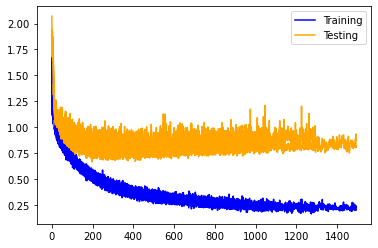

In [10]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

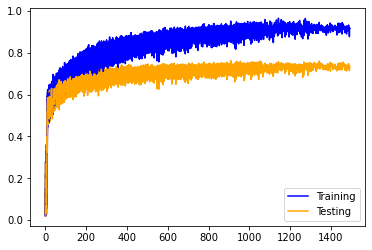

In [11]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

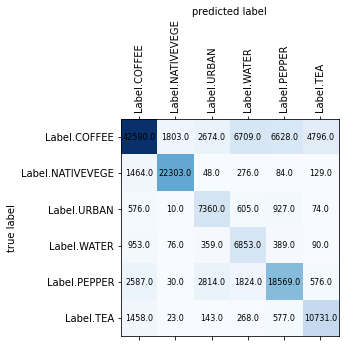

In [12]:
plot_confusion_matrix(conf_matrix, labels)

In [13]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.8581849  0.91990101 0.54933572 0.41445419 0.68333701 0.6544889 ]
Mean precision:  0.6799502881716105

Recalls:  [0.65322086 0.91766787 0.77051926 0.7858945  0.70337121 0.81295455]
Mean recall:  0.773938041411156

F-Score:  [0.74180513 0.91878309 0.64139434 0.54270441 0.69320939 0.72516556]
Mean f-score:  0.7105103209626137


# 1x16 conv, 1x32 conv, 1x64 conv s=(2, 2), 1x64 conv, 0.5 SpatialDropout, MaxPooling2D k=(2, 2) s=(1, 1), GlobalAveragePooling, 1x128 FC

In [7]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=32, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), strides=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), padding="same", activation="relu"),
    SpatialDropout2D(0.25),
    MaxPooling2D(pool_size=(2, 2), strides=(1, 1)),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Flatten(name='flat'),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS, early_stopping=True)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 9, 9, 4)           0         
_________________________________________________________________
batch_normalization (BatchNo (None, 9, 9, 4)           16        
_________________________________________________________________
conv2d (Conv2D)              (None, 9, 9, 16)          272       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 9, 9, 32)          2080      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 5, 5, 64)          8256      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 5, 5, 64)          16448     
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 5, 5, 64)          0

57/57 [==============================] - 1s 9ms/step - loss: 0.7739 - accuracy: 0.6893 - val_loss: 0.9482 - val_accuracy: 0.6489
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8399 - accuracy: 0.6543 - val_loss: 1.0185 - val_accuracy: 0.6068
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8181 - accuracy: 0.6391 - val_loss: 1.1064 - val_accuracy: 0.5730
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8518 - accuracy: 0.6063 - val_loss: 0.9488 - val_accuracy: 0.6450
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8525 - accuracy: 0.6389 - val_loss: 0.9567 - val_accuracy: 0.6459
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7669 - accuracy: 0.6794 - val_loss: 0.8915 - val_accuracy: 0.6771
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7613 - accuracy: 0.6452 - val_loss: 0.9178 - val_accuracy: 0.6500
Epoch 51/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6846 - accuracy: 0.6746 - val_loss: 0.8277 - val_accuracy: 0.6745
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6084 - accuracy: 0.6986 - val_loss: 0.8099 - val_accuracy: 0.6773
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7172 - accuracy: 0.6713 - val_loss: 0.8380 - val_accuracy: 0.6659
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6231 - accuracy: 0.6918 - val_loss: 0.8548 - val_accuracy: 0.6635
Epoch 105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6338 - accuracy: 0.6831 - val_loss: 0.8640 - val_accuracy: 0.6668
Epoch 106/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6079 - accuracy: 0.6883 - val_loss: 0.9082 - val_accuracy: 0.6417
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6241 - accuracy: 0.6745 - val_loss: 0.8156 - val_accuracy: 0.6865
Epoch 

Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4677 - accuracy: 0.7391 - val_loss: 0.8049 - val_accuracy: 0.6914
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4802 - accuracy: 0.7360 - val_loss: 0.7802 - val_accuracy: 0.7070
Epoch 160/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5129 - accuracy: 0.7402 - val_loss: 0.9174 - val_accuracy: 0.6451
Epoch 161/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5458 - accuracy: 0.7168 - val_loss: 0.9151 - val_accuracy: 0.6478
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5635 - accuracy: 0.7293 - val_loss: 0.7569 - val_accuracy: 0.7077
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4861 - accuracy: 0.7404 - val_loss: 0.8177 - val_accuracy: 0.6775
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5206 - accuracy: 0.7317 - val_loss: 0.7821 - val_accurac

Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4073 - accuracy: 0.7826 - val_loss: 0.8773 - val_accuracy: 0.6705
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4168 - accuracy: 0.7476 - val_loss: 0.8684 - val_accuracy: 0.6877
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5133 - accuracy: 0.7188 - val_loss: 0.8557 - val_accuracy: 0.6728
Epoch 218/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4872 - accuracy: 0.7385 - val_loss: 0.8351 - val_accuracy: 0.6831
Epoch 219/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5019 - accuracy: 0.7289 - val_loss: 0.7829 - val_accuracy: 0.6990
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5015 - accuracy: 0.7404 - val_loss: 0.8529 - val_accuracy: 0.6796
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4859 - accuracy: 0.7239 - val_loss: 0.8223 - val_accurac

Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3727 - accuracy: 0.7834 - val_loss: 0.9335 - val_accuracy: 0.6667
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4373 - accuracy: 0.7541 - val_loss: 0.8181 - val_accuracy: 0.7009
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4339 - accuracy: 0.7657 - val_loss: 0.7666 - val_accuracy: 0.7161
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3734 - accuracy: 0.7807 - val_loss: 0.8347 - val_accuracy: 0.7058
Epoch 276/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3730 - accuracy: 0.7880 - val_loss: 0.7977 - val_accuracy: 0.7186
Epoch 277/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3582 - accuracy: 0.7764 - val_loss: 0.7903 - val_accuracy: 0.7161
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3624 - accuracy: 0.7849 - val_loss: 0.8344 - val_accurac

Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3677 - accuracy: 0.7993 - val_loss: 0.7688 - val_accuracy: 0.7299
Epoch 330/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3714 - accuracy: 0.7730 - val_loss: 0.7754 - val_accuracy: 0.7068
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3118 - accuracy: 0.8181 - val_loss: 0.8500 - val_accuracy: 0.6938
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3458 - accuracy: 0.7931 - val_loss: 0.7969 - val_accuracy: 0.7070
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3672 - accuracy: 0.7890 - val_loss: 0.7737 - val_accuracy: 0.7181
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3748 - accuracy: 0.7864 - val_loss: 0.8237 - val_accuracy: 0.7161
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3780 - accuracy: 0.8084 - val_loss: 0.7780 - val_accuracy

Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3738 - accuracy: 0.7709 - val_loss: 0.7663 - val_accuracy: 0.7292
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3241 - accuracy: 0.8152 - val_loss: 0.7973 - val_accuracy: 0.7318
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3819 - accuracy: 0.7872 - val_loss: 0.7433 - val_accuracy: 0.7455
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3432 - accuracy: 0.8088 - val_loss: 0.8648 - val_accuracy: 0.6992
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2968 - accuracy: 0.8219 - val_loss: 0.8525 - val_accuracy: 0.7188
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3826 - accuracy: 0.8000 - val_loss: 0.7864 - val_accuracy: 0.7253
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3149 - accuracy: 0.8161 - val_loss: 0.7702 - val_accuracy:

Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3006 - accuracy: 0.8251 - val_loss: 0.8468 - val_accuracy: 0.7144
Epoch 444/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3932 - accuracy: 0.7928 - val_loss: 0.8087 - val_accuracy: 0.7234
Epoch 445/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3226 - accuracy: 0.8095 - val_loss: 0.8507 - val_accuracy: 0.7231
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3349 - accuracy: 0.8183 - val_loss: 0.8623 - val_accuracy: 0.7178
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3056 - accuracy: 0.8085 - val_loss: 0.7395 - val_accuracy: 0.7510
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2823 - accuracy: 0.8226 - val_loss: 0.8343 - val_accuracy: 0.7162
Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3172 - accuracy: 0.8190 - val_loss: 0.8163 - val_accurac

Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2814 - accuracy: 0.8136 - val_loss: 0.7682 - val_accuracy: 0.7405
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2932 - accuracy: 0.8399 - val_loss: 0.8487 - val_accuracy: 0.7360
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2874 - accuracy: 0.8252 - val_loss: 0.9105 - val_accuracy: 0.7025
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3292 - accuracy: 0.8132 - val_loss: 0.8043 - val_accuracy: 0.7268
Epoch 504/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2974 - accuracy: 0.8361 - val_loss: 0.7958 - val_accuracy: 0.7387
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2952 - accuracy: 0.8274 - val_loss: 0.7905 - val_accuracy: 0.7362
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3203 - accuracy: 0.8262 - val_loss: 0.7723 - val_accuracy:

Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2767 - accuracy: 0.8326 - val_loss: 0.8448 - val_accuracy: 0.7286
Epoch 558/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2733 - accuracy: 0.8447 - val_loss: 0.7908 - val_accuracy: 0.7511
Epoch 559/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3030 - accuracy: 0.8494 - val_loss: 0.8737 - val_accuracy: 0.7124
Epoch 560/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3303 - accuracy: 0.8170 - val_loss: 0.7679 - val_accuracy: 0.7558
Epoch 561/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2908 - accuracy: 0.8424 - val_loss: 0.7437 - val_accuracy: 0.7584
Epoch 562/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2667 - accuracy: 0.8453 - val_loss: 0.8080 - val_accuracy: 0.7352
Epoch 563/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3086 - accuracy: 0.8355 - val_loss: 0.8750 - val_accur

Epoch 614/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2721 - accuracy: 0.8278 - val_loss: 0.8435 - val_accuracy: 0.7374
Epoch 615/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2573 - accuracy: 0.8461 - val_loss: 0.7321 - val_accuracy: 0.7682
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2789 - accuracy: 0.8538 - val_loss: 0.7770 - val_accuracy: 0.7550
Epoch 617/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2333 - accuracy: 0.8675 - val_loss: 0.7943 - val_accuracy: 0.7590
Epoch 618/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2868 - accuracy: 0.8419 - val_loss: 0.8565 - val_accuracy: 0.7330
Epoch 619/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2591 - accuracy: 0.8340 - val_loss: 0.7367 - val_accuracy: 0.7700
Epoch 620/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2353 - accuracy: 0.8579 - val_loss: 0.8400 - val_accura

Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2214 - accuracy: 0.8570 - val_loss: 0.8096 - val_accuracy: 0.7447
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2367 - accuracy: 0.8629 - val_loss: 0.7809 - val_accuracy: 0.7567
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2465 - accuracy: 0.8654 - val_loss: 0.8676 - val_accuracy: 0.7267
Epoch 674/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2489 - accuracy: 0.8481 - val_loss: 0.8999 - val_accuracy: 0.7150
Epoch 675/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2497 - accuracy: 0.8300 - val_loss: 0.7784 - val_accuracy: 0.7607
Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2718 - accuracy: 0.8542 - val_loss: 0.7726 - val_accuracy: 0.7630
Epoch 677/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2928 - accuracy: 0.8497 - val_loss: 0.8118 - val_accuracy:

Epoch 728/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2271 - accuracy: 0.8618 - val_loss: 0.8272 - val_accuracy: 0.7389
Epoch 729/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2455 - accuracy: 0.8535 - val_loss: 0.8242 - val_accuracy: 0.7511
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2698 - accuracy: 0.8603 - val_loss: 0.7855 - val_accuracy: 0.7420
Epoch 731/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2796 - accuracy: 0.8569 - val_loss: 0.7707 - val_accuracy: 0.7569
Epoch 732/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2518 - accuracy: 0.8595 - val_loss: 0.8401 - val_accuracy: 0.7405
Epoch 733/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2531 - accuracy: 0.8493 - val_loss: 0.8026 - val_accuracy: 0.7530
Epoch 734/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2406 - accuracy: 0.8597 - val_loss: 0.8317 - val_accur

Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2971 - accuracy: 0.8340 - val_loss: 0.8060 - val_accuracy: 0.7538
Epoch 786/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2904 - accuracy: 0.8442 - val_loss: 0.7345 - val_accuracy: 0.7689
Epoch 787/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3390 - accuracy: 0.8573 - val_loss: 0.7939 - val_accuracy: 0.7546
Epoch 788/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2404 - accuracy: 0.8746 - val_loss: 0.8461 - val_accuracy: 0.7391
Epoch 789/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2816 - accuracy: 0.8543 - val_loss: 0.8070 - val_accuracy: 0.7467
Epoch 790/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2946 - accuracy: 0.8606 - val_loss: 0.7433 - val_accuracy: 0.7576
Epoch 791/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2234 - accuracy: 0.8718 - val_loss: 0.7569 - val_accura

Epoch 7/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0470 - accuracy: 0.5073 - val_loss: 1.6359 - val_accuracy: 0.2866
Epoch 8/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0711 - accuracy: 0.4748 - val_loss: 1.3894 - val_accuracy: 0.4252
Epoch 9/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0945 - accuracy: 0.4623 - val_loss: 1.4839 - val_accuracy: 0.3717
Epoch 10/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0665 - accuracy: 0.4757 - val_loss: 1.2265 - val_accuracy: 0.5043
Epoch 11/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0629 - accuracy: 0.5157 - val_loss: 1.0879 - val_accuracy: 0.5754
Epoch 12/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0111 - accuracy: 0.5366 - val_loss: 1.1490 - val_accuracy: 0.5382
Epoch 13/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9855 - accuracy: 0.5325 - val_loss: 1.0466 - val_accuracy: 0.5659
Ep

57/57 [==============================] - 1s 9ms/step - loss: 0.8031 - accuracy: 0.6304 - val_loss: 0.9160 - val_accuracy: 0.6572
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7914 - accuracy: 0.6287 - val_loss: 0.9347 - val_accuracy: 0.6360
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7479 - accuracy: 0.6412 - val_loss: 0.8754 - val_accuracy: 0.6630
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7375 - accuracy: 0.6555 - val_loss: 0.9558 - val_accuracy: 0.6280
Epoch 68/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7694 - accuracy: 0.6209 - val_loss: 0.9227 - val_accuracy: 0.6489
Epoch 69/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7710 - accuracy: 0.6595 - val_loss: 0.9429 - val_accuracy: 0.6286
Epoch 70/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7289 - accuracy: 0.6400 - val_loss: 0.8395 - val_accuracy: 0.6844
Epoch 71/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6055 - accuracy: 0.6771 - val_loss: 0.9542 - val_accuracy: 0.6112
Epoch 122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6300 - accuracy: 0.6728 - val_loss: 0.8420 - val_accuracy: 0.6652
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6512 - accuracy: 0.6930 - val_loss: 0.7636 - val_accuracy: 0.7122
Epoch 124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5998 - accuracy: 0.6977 - val_loss: 0.9407 - val_accuracy: 0.6225
Epoch 125/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5819 - accuracy: 0.6870 - val_loss: 0.7844 - val_accuracy: 0.6986
Epoch 126/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5817 - accuracy: 0.7109 - val_loss: 0.8942 - val_accuracy: 0.6419
Epoch 127/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5860 - accuracy: 0.7007 - val_loss: 0.9188 - val_accuracy: 0.6459
Epoch

Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4881 - accuracy: 0.7495 - val_loss: 0.7744 - val_accuracy: 0.7039
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5153 - accuracy: 0.7305 - val_loss: 0.9656 - val_accuracy: 0.6316
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4899 - accuracy: 0.6929 - val_loss: 0.8270 - val_accuracy: 0.6807
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4927 - accuracy: 0.7361 - val_loss: 0.8453 - val_accuracy: 0.6806
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4876 - accuracy: 0.7266 - val_loss: 0.7898 - val_accuracy: 0.6958
Epoch 183/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4819 - accuracy: 0.7290 - val_loss: 0.9075 - val_accuracy: 0.6496
Epoch 184/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5232 - accuracy: 0.7200 - val_loss: 0.7713 - val_accuracy:

Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5301 - accuracy: 0.7252 - val_loss: 0.8656 - val_accuracy: 0.6700
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4531 - accuracy: 0.7400 - val_loss: 0.7974 - val_accuracy: 0.7139
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4690 - accuracy: 0.7674 - val_loss: 0.7774 - val_accuracy: 0.7105
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4318 - accuracy: 0.7457 - val_loss: 0.8120 - val_accuracy: 0.6986
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4639 - accuracy: 0.7534 - val_loss: 0.8421 - val_accuracy: 0.6825
Epoch 240/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4169 - accuracy: 0.7468 - val_loss: 0.8237 - val_accuracy: 0.6880
Epoch 241/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4322 - accuracy: 0.7564 - val_loss: 0.7399 - val_accuracy:

Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3723 - accuracy: 0.7865 - val_loss: 0.8016 - val_accuracy: 0.7165
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4164 - accuracy: 0.7555 - val_loss: 0.7900 - val_accuracy: 0.7076
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4092 - accuracy: 0.7716 - val_loss: 0.8071 - val_accuracy: 0.7215
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3986 - accuracy: 0.7750 - val_loss: 0.8464 - val_accuracy: 0.6921
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4066 - accuracy: 0.7691 - val_loss: 0.7537 - val_accuracy: 0.7251
Epoch 297/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3917 - accuracy: 0.7841 - val_loss: 0.7988 - val_accuracy: 0.7177
Epoch 298/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4012 - accuracy: 0.7722 - val_loss: 0.7962 - val_accuracy:

Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3547 - accuracy: 0.7800 - val_loss: 0.8368 - val_accuracy: 0.7089
Epoch 350/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4074 - accuracy: 0.7962 - val_loss: 0.7394 - val_accuracy: 0.7333
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3887 - accuracy: 0.7992 - val_loss: 0.7350 - val_accuracy: 0.7384
Epoch 352/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3943 - accuracy: 0.7819 - val_loss: 0.8742 - val_accuracy: 0.6868
Epoch 353/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3953 - accuracy: 0.7659 - val_loss: 0.8851 - val_accuracy: 0.6791
Epoch 354/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3922 - accuracy: 0.7757 - val_loss: 0.8635 - val_accuracy: 0.7131
Epoch 355/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3871 - accuracy: 0.7935 - val_loss: 0.8049 - val_accurac

Epoch 406/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3290 - accuracy: 0.7954 - val_loss: 0.8012 - val_accuracy: 0.7171
Epoch 407/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3222 - accuracy: 0.8183 - val_loss: 0.8171 - val_accuracy: 0.7084
Epoch 408/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3263 - accuracy: 0.7930 - val_loss: 0.8442 - val_accuracy: 0.7058
Epoch 409/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3680 - accuracy: 0.7808 - val_loss: 0.8095 - val_accuracy: 0.7186
Epoch 410/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3372 - accuracy: 0.7926 - val_loss: 0.7295 - val_accuracy: 0.7396
Epoch 411/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3394 - accuracy: 0.8219 - val_loss: 0.7884 - val_accuracy: 0.7279
Epoch 412/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3215 - accuracy: 0.7972 - val_loss: 0.7851 - val_accura

Epoch 463/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3086 - accuracy: 0.8145 - val_loss: 0.8302 - val_accuracy: 0.7280
Epoch 464/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3299 - accuracy: 0.7979 - val_loss: 0.7709 - val_accuracy: 0.7370
Epoch 465/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2786 - accuracy: 0.8271 - val_loss: 0.8426 - val_accuracy: 0.7240
Epoch 466/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3375 - accuracy: 0.8059 - val_loss: 0.7673 - val_accuracy: 0.7351
Epoch 467/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3491 - accuracy: 0.8073 - val_loss: 0.9087 - val_accuracy: 0.6991
Epoch 468/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3279 - accuracy: 0.8125 - val_loss: 0.7836 - val_accuracy: 0.7247
Epoch 469/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3308 - accuracy: 0.8112 - val_loss: 0.8257 - val_accuracy:

Epoch 520/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3530 - accuracy: 0.7903 - val_loss: 0.7974 - val_accuracy: 0.7363
Epoch 521/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3363 - accuracy: 0.8174 - val_loss: 0.7730 - val_accuracy: 0.7352
Epoch 522/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2914 - accuracy: 0.8132 - val_loss: 1.0020 - val_accuracy: 0.6768
Epoch 523/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4092 - accuracy: 0.7941 - val_loss: 0.7400 - val_accuracy: 0.7431
Epoch 524/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3211 - accuracy: 0.8196 - val_loss: 0.7767 - val_accuracy: 0.7428
Epoch 525/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2653 - accuracy: 0.8545 - val_loss: 0.7792 - val_accuracy: 0.7308
Epoch 526/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3339 - accuracy: 0.7883 - val_loss: 0.7463 - val_accuracy:

Epoch 577/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3149 - accuracy: 0.8069 - val_loss: 0.8154 - val_accuracy: 0.7306
Epoch 578/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3108 - accuracy: 0.8283 - val_loss: 0.7457 - val_accuracy: 0.7568
Epoch 579/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3486 - accuracy: 0.8072 - val_loss: 0.7664 - val_accuracy: 0.7451
Epoch 580/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2722 - accuracy: 0.8335 - val_loss: 0.7844 - val_accuracy: 0.7475
Epoch 581/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3092 - accuracy: 0.8193 - val_loss: 0.7473 - val_accuracy: 0.7545
Epoch 582/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2594 - accuracy: 0.8424 - val_loss: 0.8025 - val_accuracy: 0.7361
Epoch 583/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3009 - accuracy: 0.8065 - val_loss: 0.8207 - val_accuracy

Epoch 634/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2662 - accuracy: 0.8295 - val_loss: 0.8104 - val_accuracy: 0.7347
Epoch 635/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2576 - accuracy: 0.8314 - val_loss: 0.8730 - val_accuracy: 0.7251
Epoch 636/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2844 - accuracy: 0.8205 - val_loss: 0.7777 - val_accuracy: 0.7551
Epoch 637/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2841 - accuracy: 0.8405 - val_loss: 0.7542 - val_accuracy: 0.7609
Epoch 638/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3046 - accuracy: 0.8118 - val_loss: 0.8165 - val_accuracy: 0.7449
Epoch 639/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2650 - accuracy: 0.8332 - val_loss: 0.8488 - val_accuracy: 0.7344
Epoch 640/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2698 - accuracy: 0.8325 - val_loss: 0.8934 - val_accuracy:

Epoch 691/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2726 - accuracy: 0.8367 - val_loss: 0.8919 - val_accuracy: 0.7240
Epoch 692/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2962 - accuracy: 0.8324 - val_loss: 0.7697 - val_accuracy: 0.7578
Epoch 693/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2811 - accuracy: 0.8367 - val_loss: 0.8193 - val_accuracy: 0.7397
Epoch 694/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3030 - accuracy: 0.8355 - val_loss: 0.7659 - val_accuracy: 0.7549
Epoch 695/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2703 - accuracy: 0.8398 - val_loss: 0.8013 - val_accuracy: 0.7453
Epoch 696/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2735 - accuracy: 0.8506 - val_loss: 0.8121 - val_accuracy: 0.7466
Epoch 697/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2484 - accuracy: 0.8565 - val_loss: 0.8666 - val_accuracy:

Epoch 748/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2474 - accuracy: 0.8540 - val_loss: 0.8401 - val_accuracy: 0.7473
Epoch 749/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2441 - accuracy: 0.8580 - val_loss: 0.9324 - val_accuracy: 0.7286
Epoch 750/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2702 - accuracy: 0.8362 - val_loss: 0.8679 - val_accuracy: 0.7320
Epoch 751/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2677 - accuracy: 0.8444 - val_loss: 0.8199 - val_accuracy: 0.7404
Epoch 752/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2651 - accuracy: 0.8493 - val_loss: 0.8073 - val_accuracy: 0.7458
Epoch 753/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2781 - accuracy: 0.8289 - val_loss: 0.8747 - val_accuracy: 0.7224
Epoch 754/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3055 - accuracy: 0.8295 - val_loss: 0.8401 - val_accuracy

Epoch 805/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2591 - accuracy: 0.8539 - val_loss: 0.8454 - val_accuracy: 0.7460
Epoch 806/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2628 - accuracy: 0.8523 - val_loss: 0.9236 - val_accuracy: 0.7344
Epoch 807/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3076 - accuracy: 0.8247 - val_loss: 0.8326 - val_accuracy: 0.7470
Epoch 808/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2481 - accuracy: 0.8506 - val_loss: 0.8423 - val_accuracy: 0.7442
Epoch 809/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3056 - accuracy: 0.8246 - val_loss: 0.8282 - val_accuracy: 0.7419
Epoch 810/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3283 - accuracy: 0.8274 - val_loss: 0.8443 - val_accuracy: 0.7396
Epoch 811/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2348 - accuracy: 0.8539 - val_loss: 0.8422 - val_accuracy:

Epoch 862/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2113 - accuracy: 0.8599 - val_loss: 0.8071 - val_accuracy: 0.7492
Epoch 863/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2511 - accuracy: 0.8426 - val_loss: 0.9497 - val_accuracy: 0.7152
Epoch 864/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2501 - accuracy: 0.8414 - val_loss: 0.7794 - val_accuracy: 0.7609
Epoch 865/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2351 - accuracy: 0.8518 - val_loss: 0.8061 - val_accuracy: 0.7469
Epoch 866/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2700 - accuracy: 0.8348 - val_loss: 0.8032 - val_accuracy: 0.7499
Epoch 867/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2541 - accuracy: 0.8434 - val_loss: 0.8789 - val_accuracy: 0.7384
Epoch 868/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3298 - accuracy: 0.8274 - val_loss: 0.8538 - val_accurac

Epoch 919/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2435 - accuracy: 0.8523 - val_loss: 0.8783 - val_accuracy: 0.7457
Epoch 920/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2227 - accuracy: 0.8759 - val_loss: 0.7990 - val_accuracy: 0.7584
Epoch 921/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1863 - accuracy: 0.8980 - val_loss: 0.8078 - val_accuracy: 0.7549
Epoch 922/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2503 - accuracy: 0.8467 - val_loss: 0.7732 - val_accuracy: 0.7587
Epoch 923/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2755 - accuracy: 0.8493 - val_loss: 0.8071 - val_accuracy: 0.7618
Epoch 924/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2172 - accuracy: 0.8507 - val_loss: 0.8087 - val_accuracy: 0.7608
Epoch 925/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2502 - accuracy: 0.8509 - val_loss: 0.9277 - val_accuracy:

Epoch 976/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2484 - accuracy: 0.8476 - val_loss: 0.8111 - val_accuracy: 0.7536
Epoch 977/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2246 - accuracy: 0.8643 - val_loss: 0.8723 - val_accuracy: 0.7418
Epoch 978/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2598 - accuracy: 0.8407 - val_loss: 0.9605 - val_accuracy: 0.7133
Epoch 979/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2785 - accuracy: 0.8276 - val_loss: 0.8621 - val_accuracy: 0.7340
Epoch 980/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2529 - accuracy: 0.8484 - val_loss: 0.8105 - val_accuracy: 0.7563
Epoch 981/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2469 - accuracy: 0.8564 - val_loss: 0.8015 - val_accuracy: 0.7565
Epoch 982/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2490 - accuracy: 0.8569 - val_loss: 0.8299 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.2630 - accuracy: 0.8568 - val_loss: 0.8375 - val_accuracy: 0.7462
Epoch 1033/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2911 - accuracy: 0.8383 - val_loss: 0.8025 - val_accuracy: 0.7507
Epoch 1034/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2473 - accuracy: 0.8708 - val_loss: 0.7984 - val_accuracy: 0.7644
Epoch 1035/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2628 - accuracy: 0.8466 - val_loss: 0.8097 - val_accuracy: 0.7526
Epoch 1036/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2525 - accuracy: 0.8418 - val_loss: 0.7872 - val_accuracy: 0.7655
Epoch 1037/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1913 - accuracy: 0.8814 - val_loss: 0.8548 - val_accuracy: 0.7411
Epoch 1038/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2669 - accuracy: 0.8354 - val_loss: 0.8628 - val_accuracy: 0.7488
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2354 - accuracy: 0.8445 - val_loss: 0.8743 - val_accuracy: 0.7449
Epoch 1089/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2371 - accuracy: 0.8422 - val_loss: 0.7802 - val_accuracy: 0.7605
Epoch 1090/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2247 - accuracy: 0.8644 - val_loss: 0.8285 - val_accuracy: 0.7521
Epoch 1091/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2352 - accuracy: 0.8601 - val_loss: 0.8151 - val_accuracy: 0.7571
Epoch 1092/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2093 - accuracy: 0.8752 - val_loss: 0.8126 - val_accuracy: 0.7698
Epoch 1093/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2680 - accuracy: 0.8581 - val_loss: 0.8724 - val_accuracy: 0.7449
Epoch 1094/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2282 - accuracy: 0.8608 - val_loss: 0.8298 - val_accuracy: 0.7508
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2413 - accuracy: 0.8657 - val_loss: 0.7948 - val_accuracy: 0.7583
Epoch 1145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2432 - accuracy: 0.8658 - val_loss: 0.8391 - val_accuracy: 0.7579

Fold  3 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.6453 - accuracy: 0.2257 - val_loss: 1.7553 - val_accuracy: 0.2044
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1757 - accuracy: 0.4023 - val_loss: 1.8561 - val_accuracy: 0.2106
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1803 - accuracy: 0.3745 - val_loss: 1.8451 - val_accuracy: 0.2049
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1644 - accuracy: 0.3930 - val_loss: 1.7621 - val_accuracy: 0.3900
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1253 - accuracy: 0.4002 - val_loss: 1.7279 - val_accuracy: 0

57/57 [==============================] - 1s 9ms/step - loss: 0.8322 - accuracy: 0.6301 - val_loss: 0.9264 - val_accuracy: 0.6473
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7807 - accuracy: 0.6280 - val_loss: 0.9396 - val_accuracy: 0.6430
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8048 - accuracy: 0.6291 - val_loss: 0.9775 - val_accuracy: 0.6147
Epoch 59/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8325 - accuracy: 0.6313 - val_loss: 0.9957 - val_accuracy: 0.6046
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8294 - accuracy: 0.6277 - val_loss: 0.9890 - val_accuracy: 0.6157
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8018 - accuracy: 0.6353 - val_loss: 1.0798 - val_accuracy: 0.5951
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8597 - accuracy: 0.6271 - val_loss: 0.9571 - val_accuracy: 0.6379
Epoch 63/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6522 - accuracy: 0.6755 - val_loss: 0.9324 - val_accuracy: 0.6240
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6364 - accuracy: 0.6723 - val_loss: 0.8024 - val_accuracy: 0.6978
Epoch 115/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6405 - accuracy: 0.6983 - val_loss: 0.9776 - val_accuracy: 0.5990
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6252 - accuracy: 0.6813 - val_loss: 0.8876 - val_accuracy: 0.6540
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6511 - accuracy: 0.6696 - val_loss: 0.8670 - val_accuracy: 0.6620
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6665 - accuracy: 0.6931 - val_loss: 0.7928 - val_accuracy: 0.6948
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6883 - accuracy: 0.6822 - val_loss: 1.0078 - val_accuracy: 0.5853
Epoch 

Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6257 - accuracy: 0.6900 - val_loss: 0.8307 - val_accuracy: 0.6693
Epoch 171/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5833 - accuracy: 0.7238 - val_loss: 0.8459 - val_accuracy: 0.6734
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5685 - accuracy: 0.7122 - val_loss: 0.8458 - val_accuracy: 0.6736
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5527 - accuracy: 0.7237 - val_loss: 0.9792 - val_accuracy: 0.6263
Epoch 174/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5769 - accuracy: 0.7074 - val_loss: 0.8149 - val_accuracy: 0.6839
Epoch 175/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5411 - accuracy: 0.7115 - val_loss: 0.8453 - val_accuracy: 0.6777
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5720 - accuracy: 0.7273 - val_loss: 0.7775 - val_accura

Epoch 227/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5046 - accuracy: 0.7395 - val_loss: 0.7555 - val_accuracy: 0.7048
Epoch 228/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5395 - accuracy: 0.7496 - val_loss: 0.7876 - val_accuracy: 0.6991
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5012 - accuracy: 0.7331 - val_loss: 0.8276 - val_accuracy: 0.6800
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4932 - accuracy: 0.7452 - val_loss: 0.7115 - val_accuracy: 0.7290
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4344 - accuracy: 0.7801 - val_loss: 0.7440 - val_accuracy: 0.7181
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4752 - accuracy: 0.7446 - val_loss: 0.8622 - val_accuracy: 0.6530
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4821 - accuracy: 0.7278 - val_loss: 0.7447 - val_accurac

Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4186 - accuracy: 0.7726 - val_loss: 0.7546 - val_accuracy: 0.7070
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3977 - accuracy: 0.7770 - val_loss: 0.8938 - val_accuracy: 0.6597
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3763 - accuracy: 0.7893 - val_loss: 0.6937 - val_accuracy: 0.7386
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4526 - accuracy: 0.7576 - val_loss: 0.7732 - val_accuracy: 0.7028
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4096 - accuracy: 0.7800 - val_loss: 0.8419 - val_accuracy: 0.6846
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4142 - accuracy: 0.7481 - val_loss: 0.9264 - val_accuracy: 0.6648
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4655 - accuracy: 0.7315 - val_loss: 1.0066 - val_accuracy:

Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4164 - accuracy: 0.7632 - val_loss: 0.7899 - val_accuracy: 0.7010
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3696 - accuracy: 0.7716 - val_loss: 0.7779 - val_accuracy: 0.7054
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3388 - accuracy: 0.8066 - val_loss: 0.8442 - val_accuracy: 0.6806
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4343 - accuracy: 0.7516 - val_loss: 0.8287 - val_accuracy: 0.6812
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4121 - accuracy: 0.7863 - val_loss: 0.8065 - val_accuracy: 0.6819
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4072 - accuracy: 0.7554 - val_loss: 0.7290 - val_accuracy: 0.7150
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3838 - accuracy: 0.7740 - val_loss: 0.7444 - val_accuracy:

Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3302 - accuracy: 0.8144 - val_loss: 0.7114 - val_accuracy: 0.7487
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3559 - accuracy: 0.8139 - val_loss: 0.8643 - val_accuracy: 0.6755
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3682 - accuracy: 0.7983 - val_loss: 0.7730 - val_accuracy: 0.7226
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3742 - accuracy: 0.8095 - val_loss: 0.9273 - val_accuracy: 0.6535
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3465 - accuracy: 0.7953 - val_loss: 0.8674 - val_accuracy: 0.6848
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3270 - accuracy: 0.7992 - val_loss: 0.8028 - val_accuracy: 0.7077
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3385 - accuracy: 0.8010 - val_loss: 0.7057 - val_accuracy:

Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2965 - accuracy: 0.8110 - val_loss: 0.7906 - val_accuracy: 0.7124
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3077 - accuracy: 0.8266 - val_loss: 0.8136 - val_accuracy: 0.7145
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3047 - accuracy: 0.8268 - val_loss: 0.7387 - val_accuracy: 0.7340
Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3033 - accuracy: 0.8301 - val_loss: 0.9689 - val_accuracy: 0.6510
Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3205 - accuracy: 0.7901 - val_loss: 0.8276 - val_accuracy: 0.6975
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3043 - accuracy: 0.8189 - val_loss: 0.8759 - val_accuracy: 0.6890
Epoch 461/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3115 - accuracy: 0.8227 - val_loss: 0.7418 - val_accuracy

Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3051 - accuracy: 0.8301 - val_loss: 0.7934 - val_accuracy: 0.7217
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3292 - accuracy: 0.8228 - val_loss: 0.8004 - val_accuracy: 0.7257
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3215 - accuracy: 0.8110 - val_loss: 0.8903 - val_accuracy: 0.6808
Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3086 - accuracy: 0.8026 - val_loss: 0.8213 - val_accuracy: 0.7203
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3100 - accuracy: 0.8243 - val_loss: 1.0373 - val_accuracy: 0.6390
Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3328 - accuracy: 0.8061 - val_loss: 0.8022 - val_accuracy: 0.7077
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2903 - accuracy: 0.8230 - val_loss: 0.9237 - val_accuracy:

Epoch 569/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3205 - accuracy: 0.8189 - val_loss: 0.7530 - val_accuracy: 0.7392
Epoch 570/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3461 - accuracy: 0.8062 - val_loss: 0.7992 - val_accuracy: 0.7225
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2954 - accuracy: 0.8230 - val_loss: 0.7735 - val_accuracy: 0.7409
Epoch 572/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2582 - accuracy: 0.8471 - val_loss: 0.7607 - val_accuracy: 0.7308
Epoch 573/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2914 - accuracy: 0.8250 - val_loss: 0.7459 - val_accuracy: 0.7367
Epoch 574/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3108 - accuracy: 0.8210 - val_loss: 0.8153 - val_accuracy: 0.7188
Epoch 575/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2968 - accuracy: 0.8188 - val_loss: 0.9364 - val_accura

Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2900 - accuracy: 0.8443 - val_loss: 0.8163 - val_accuracy: 0.7110
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3166 - accuracy: 0.8215 - val_loss: 0.7481 - val_accuracy: 0.7390
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2909 - accuracy: 0.8270 - val_loss: 0.8584 - val_accuracy: 0.7154
Epoch 629/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2826 - accuracy: 0.8381 - val_loss: 0.7641 - val_accuracy: 0.7350
Epoch 630/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2812 - accuracy: 0.8379 - val_loss: 0.8035 - val_accuracy: 0.7380
Epoch 631/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2768 - accuracy: 0.8395 - val_loss: 0.9442 - val_accuracy: 0.6736
Epoch 632/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3713 - accuracy: 0.7773 - val_loss: 0.8408 - val_accuracy:

Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2577 - accuracy: 0.8444 - val_loss: 0.8305 - val_accuracy: 0.7202
Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3084 - accuracy: 0.8338 - val_loss: 0.9285 - val_accuracy: 0.6906
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2853 - accuracy: 0.8580 - val_loss: 0.8068 - val_accuracy: 0.7274
Epoch 686/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2637 - accuracy: 0.8414 - val_loss: 0.8482 - val_accuracy: 0.7127
Epoch 687/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2546 - accuracy: 0.8562 - val_loss: 0.8110 - val_accuracy: 0.7263
Epoch 688/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2336 - accuracy: 0.8691 - val_loss: 0.8147 - val_accuracy: 0.7236
Epoch 689/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2653 - accuracy: 0.8342 - val_loss: 0.7754 - val_accuracy

Epoch 740/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2819 - accuracy: 0.8313 - val_loss: 0.7497 - val_accuracy: 0.7548
Epoch 741/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1995 - accuracy: 0.8831 - val_loss: 0.7953 - val_accuracy: 0.7381
Epoch 742/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2440 - accuracy: 0.8445 - val_loss: 0.7987 - val_accuracy: 0.7437
Epoch 743/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2332 - accuracy: 0.8637 - val_loss: 0.8616 - val_accuracy: 0.7127
Epoch 744/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2228 - accuracy: 0.8755 - val_loss: 0.8715 - val_accuracy: 0.7120
Epoch 745/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2495 - accuracy: 0.8512 - val_loss: 0.8339 - val_accuracy: 0.7302
Epoch 746/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2346 - accuracy: 0.8583 - val_loss: 0.8415 - val_accurac

Epoch 797/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2244 - accuracy: 0.8544 - val_loss: 0.7716 - val_accuracy: 0.7494
Epoch 798/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2158 - accuracy: 0.8684 - val_loss: 0.9219 - val_accuracy: 0.7115
Epoch 799/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2355 - accuracy: 0.8475 - val_loss: 0.8091 - val_accuracy: 0.7415
Epoch 800/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2755 - accuracy: 0.8368 - val_loss: 0.9170 - val_accuracy: 0.7061
Epoch 801/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2608 - accuracy: 0.8570 - val_loss: 0.8077 - val_accuracy: 0.7393
Epoch 802/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2503 - accuracy: 0.8482 - val_loss: 0.7617 - val_accuracy: 0.7575
Epoch 803/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2124 - accuracy: 0.8688 - val_loss: 0.7586 - val_accuracy:

Epoch 854/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2460 - accuracy: 0.8538 - val_loss: 0.8796 - val_accuracy: 0.7146
Epoch 855/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2662 - accuracy: 0.8455 - val_loss: 0.8579 - val_accuracy: 0.7191
Epoch 856/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1948 - accuracy: 0.8647 - val_loss: 0.7886 - val_accuracy: 0.7405
Epoch 857/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2558 - accuracy: 0.8559 - val_loss: 0.7615 - val_accuracy: 0.7473
Epoch 858/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2140 - accuracy: 0.8836 - val_loss: 0.8670 - val_accuracy: 0.7120
Epoch 859/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2157 - accuracy: 0.8488 - val_loss: 0.8566 - val_accuracy: 0.7205
Epoch 860/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2455 - accuracy: 0.8496 - val_loss: 0.8251 - val_accura

Epoch 911/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1936 - accuracy: 0.8622 - val_loss: 0.8206 - val_accuracy: 0.7462
Epoch 912/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2474 - accuracy: 0.8606 - val_loss: 0.8026 - val_accuracy: 0.7458
Epoch 913/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2370 - accuracy: 0.8646 - val_loss: 0.8059 - val_accuracy: 0.7408
Epoch 914/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2515 - accuracy: 0.8564 - val_loss: 0.7874 - val_accuracy: 0.7565
Epoch 915/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2196 - accuracy: 0.8654 - val_loss: 0.7660 - val_accuracy: 0.7621
Epoch 916/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2187 - accuracy: 0.8854 - val_loss: 0.7460 - val_accuracy: 0.7717
Epoch 917/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2288 - accuracy: 0.8674 - val_loss: 0.8117 - val_accurac

Epoch 968/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2329 - accuracy: 0.8791 - val_loss: 0.8127 - val_accuracy: 0.7431
Epoch 969/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2361 - accuracy: 0.8644 - val_loss: 0.8076 - val_accuracy: 0.7489
Epoch 970/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2546 - accuracy: 0.8609 - val_loss: 0.8427 - val_accuracy: 0.7297
Epoch 971/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2298 - accuracy: 0.8559 - val_loss: 0.8222 - val_accuracy: 0.7378
Epoch 972/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2338 - accuracy: 0.8673 - val_loss: 0.8019 - val_accuracy: 0.7456
Epoch 973/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2293 - accuracy: 0.8715 - val_loss: 0.8465 - val_accuracy: 0.7290
Epoch 974/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1888 - accuracy: 0.8884 - val_loss: 0.8248 - val_accur

57/57 [==============================] - 1s 9ms/step - loss: 0.2858 - accuracy: 0.8422 - val_loss: 0.7835 - val_accuracy: 0.7462
Epoch 1025/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2540 - accuracy: 0.8634 - val_loss: 0.8644 - val_accuracy: 0.7317
Epoch 1026/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2646 - accuracy: 0.8521 - val_loss: 0.8235 - val_accuracy: 0.7346
Epoch 1027/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2527 - accuracy: 0.8574 - val_loss: 0.8203 - val_accuracy: 0.7445
Epoch 1028/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2407 - accuracy: 0.8696 - val_loss: 0.8516 - val_accuracy: 0.7305
Epoch 1029/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2402 - accuracy: 0.8593 - val_loss: 0.8463 - val_accuracy: 0.7237
Epoch 1030/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2968 - accuracy: 0.8664 - val_loss: 0.7440 - val_accuracy: 0.7639
E

57/57 [==============================] - 1s 9ms/step - loss: 0.9723 - accuracy: 0.6082 - val_loss: 1.0103 - val_accuracy: 0.6267
Epoch 15/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9824 - accuracy: 0.5622 - val_loss: 0.9799 - val_accuracy: 0.6398
Epoch 16/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9948 - accuracy: 0.5671 - val_loss: 1.0169 - val_accuracy: 0.6131
Epoch 17/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9248 - accuracy: 0.5883 - val_loss: 1.0240 - val_accuracy: 0.6206
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9812 - accuracy: 0.5846 - val_loss: 1.0404 - val_accuracy: 0.5884
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9654 - accuracy: 0.5853 - val_loss: 1.0346 - val_accuracy: 0.5895
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8949 - accuracy: 0.6143 - val_loss: 1.0459 - val_accuracy: 0.5887
Epoch 21/200

57/57 [==============================] - 1s 9ms/step - loss: 0.6835 - accuracy: 0.6873 - val_loss: 1.0021 - val_accuracy: 0.6165
Epoch 72/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6930 - accuracy: 0.6650 - val_loss: 0.7975 - val_accuracy: 0.6924
Epoch 73/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7049 - accuracy: 0.6866 - val_loss: 0.7839 - val_accuracy: 0.6962
Epoch 74/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7104 - accuracy: 0.6778 - val_loss: 0.9196 - val_accuracy: 0.6233
Epoch 75/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6829 - accuracy: 0.6621 - val_loss: 0.8734 - val_accuracy: 0.6579
Epoch 76/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7586 - accuracy: 0.6588 - val_loss: 0.9709 - val_accuracy: 0.6128
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7057 - accuracy: 0.6575 - val_loss: 0.8230 - val_accuracy: 0.6806
Epoch 78/200

57/57 [==============================] - 1s 9ms/step - loss: 0.5943 - accuracy: 0.6896 - val_loss: 0.8168 - val_accuracy: 0.6766
Epoch 129/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5679 - accuracy: 0.7077 - val_loss: 0.8351 - val_accuracy: 0.6743
Epoch 130/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6094 - accuracy: 0.6931 - val_loss: 0.8786 - val_accuracy: 0.6527
Epoch 131/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5885 - accuracy: 0.6869 - val_loss: 0.8849 - val_accuracy: 0.6512
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5465 - accuracy: 0.7174 - val_loss: 0.9327 - val_accuracy: 0.6260
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5748 - accuracy: 0.7034 - val_loss: 0.7736 - val_accuracy: 0.6929
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5763 - accuracy: 0.6997 - val_loss: 0.8723 - val_accuracy: 0.6592
Epoch

Epoch 185/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5607 - accuracy: 0.7216 - val_loss: 0.7514 - val_accuracy: 0.7100
Epoch 186/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5119 - accuracy: 0.7566 - val_loss: 0.8694 - val_accuracy: 0.6667
Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5523 - accuracy: 0.6967 - val_loss: 0.8674 - val_accuracy: 0.6656
Epoch 188/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4935 - accuracy: 0.7158 - val_loss: 0.8313 - val_accuracy: 0.6856
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5062 - accuracy: 0.7353 - val_loss: 0.7943 - val_accuracy: 0.6926
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4815 - accuracy: 0.7291 - val_loss: 0.8373 - val_accuracy: 0.6795
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4436 - accuracy: 0.7596 - val_loss: 0.8666 - val_accuracy

Epoch 242/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4257 - accuracy: 0.7769 - val_loss: 0.8244 - val_accuracy: 0.6964
Epoch 243/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4376 - accuracy: 0.7521 - val_loss: 0.8472 - val_accuracy: 0.6882
Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4288 - accuracy: 0.7776 - val_loss: 0.8204 - val_accuracy: 0.6970
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4459 - accuracy: 0.7735 - val_loss: 0.9752 - val_accuracy: 0.6237
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4059 - accuracy: 0.7658 - val_loss: 0.7551 - val_accuracy: 0.7179
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4090 - accuracy: 0.7655 - val_loss: 0.7753 - val_accuracy: 0.7110
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4279 - accuracy: 0.7517 - val_loss: 0.7727 - val_accuracy:

Epoch 299/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.3577 - accuracy: 0.8027 - val_loss: 0.7764 - val_accuracy: 0.7221
Epoch 300/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3895 - accuracy: 0.7754 - val_loss: 0.7705 - val_accuracy: 0.7225
Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4325 - accuracy: 0.7659 - val_loss: 0.7352 - val_accuracy: 0.7370
Epoch 302/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3954 - accuracy: 0.7809 - val_loss: 0.8948 - val_accuracy: 0.6757
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3658 - accuracy: 0.7829 - val_loss: 0.8361 - val_accuracy: 0.6955
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3705 - accuracy: 0.7844 - val_loss: 0.7861 - val_accuracy: 0.7168
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3894 - accuracy: 0.7854 - val_loss: 0.8048 - val_accurac

Epoch 356/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4204 - accuracy: 0.7792 - val_loss: 0.8003 - val_accuracy: 0.7146
Epoch 357/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3808 - accuracy: 0.7927 - val_loss: 0.8484 - val_accuracy: 0.6937
Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3937 - accuracy: 0.7850 - val_loss: 0.8979 - val_accuracy: 0.6698
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4042 - accuracy: 0.7613 - val_loss: 0.8479 - val_accuracy: 0.6963
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3609 - accuracy: 0.7881 - val_loss: 0.7226 - val_accuracy: 0.7380
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3158 - accuracy: 0.8065 - val_loss: 0.7841 - val_accuracy: 0.7173
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3352 - accuracy: 0.8058 - val_loss: 0.8267 - val_accuracy:

Epoch 413/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2874 - accuracy: 0.8263 - val_loss: 0.7913 - val_accuracy: 0.7268
Epoch 414/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3596 - accuracy: 0.8017 - val_loss: 0.7700 - val_accuracy: 0.7347
Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3244 - accuracy: 0.8101 - val_loss: 0.8651 - val_accuracy: 0.6979
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3348 - accuracy: 0.8022 - val_loss: 0.8547 - val_accuracy: 0.6981
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3474 - accuracy: 0.7957 - val_loss: 0.8055 - val_accuracy: 0.7160
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2935 - accuracy: 0.8311 - val_loss: 0.7669 - val_accuracy: 0.7390
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3357 - accuracy: 0.8122 - val_loss: 0.8105 - val_accuracy:

Epoch 470/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3221 - accuracy: 0.8181 - val_loss: 0.7377 - val_accuracy: 0.7454
Epoch 471/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3589 - accuracy: 0.7980 - val_loss: 0.8924 - val_accuracy: 0.6958
Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3014 - accuracy: 0.8064 - val_loss: 0.7760 - val_accuracy: 0.7355
Epoch 473/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3040 - accuracy: 0.8325 - val_loss: 0.7078 - val_accuracy: 0.7590
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3347 - accuracy: 0.8181 - val_loss: 0.7377 - val_accuracy: 0.7397
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3218 - accuracy: 0.8248 - val_loss: 0.7034 - val_accuracy: 0.7586
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2782 - accuracy: 0.8354 - val_loss: 0.7643 - val_accuracy

Epoch 527/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3080 - accuracy: 0.8209 - val_loss: 0.9027 - val_accuracy: 0.7010
Epoch 528/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2799 - accuracy: 0.8331 - val_loss: 0.7793 - val_accuracy: 0.7411
Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2688 - accuracy: 0.8455 - val_loss: 0.8583 - val_accuracy: 0.7202
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3117 - accuracy: 0.8138 - val_loss: 0.8367 - val_accuracy: 0.7245
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2796 - accuracy: 0.8364 - val_loss: 0.8663 - val_accuracy: 0.7080
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2961 - accuracy: 0.8241 - val_loss: 0.8525 - val_accuracy: 0.7059
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3005 - accuracy: 0.8085 - val_loss: 0.8587 - val_accuracy:

Epoch 584/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2832 - accuracy: 0.8399 - val_loss: 0.8482 - val_accuracy: 0.7316
Epoch 585/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2945 - accuracy: 0.8370 - val_loss: 0.7953 - val_accuracy: 0.7413
Epoch 586/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3034 - accuracy: 0.8287 - val_loss: 0.8466 - val_accuracy: 0.7171
Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2799 - accuracy: 0.8476 - val_loss: 0.8912 - val_accuracy: 0.7152
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3226 - accuracy: 0.8395 - val_loss: 0.7703 - val_accuracy: 0.7489
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2861 - accuracy: 0.8348 - val_loss: 0.7565 - val_accuracy: 0.7549
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3443 - accuracy: 0.8118 - val_loss: 0.8150 - val_accurac

Epoch 641/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2636 - accuracy: 0.8255 - val_loss: 0.8114 - val_accuracy: 0.7431
Epoch 642/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2735 - accuracy: 0.8558 - val_loss: 0.8156 - val_accuracy: 0.7352
Epoch 643/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2845 - accuracy: 0.8324 - val_loss: 0.8113 - val_accuracy: 0.7369
Epoch 644/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3064 - accuracy: 0.8133 - val_loss: 0.7943 - val_accuracy: 0.7411
Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2383 - accuracy: 0.8442 - val_loss: 0.7960 - val_accuracy: 0.7583
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2715 - accuracy: 0.8422 - val_loss: 0.7966 - val_accuracy: 0.7469
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2549 - accuracy: 0.8584 - val_loss: 0.7982 - val_accura

Epoch 698/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2458 - accuracy: 0.8495 - val_loss: 0.8007 - val_accuracy: 0.7498
Epoch 699/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2430 - accuracy: 0.8531 - val_loss: 0.8711 - val_accuracy: 0.7180
Epoch 700/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2737 - accuracy: 0.8284 - val_loss: 0.8657 - val_accuracy: 0.7183
Epoch 701/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2569 - accuracy: 0.8480 - val_loss: 0.8755 - val_accuracy: 0.7218
Epoch 702/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2481 - accuracy: 0.8575 - val_loss: 0.8902 - val_accuracy: 0.7205
Epoch 703/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2477 - accuracy: 0.8457 - val_loss: 0.8414 - val_accuracy: 0.7400
Epoch 704/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2369 - accuracy: 0.8398 - val_loss: 0.8637 - val_accur

Epoch 755/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2555 - accuracy: 0.8346 - val_loss: 0.8093 - val_accuracy: 0.7348
Epoch 756/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2304 - accuracy: 0.8599 - val_loss: 0.7801 - val_accuracy: 0.7578
Epoch 757/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2213 - accuracy: 0.8737 - val_loss: 0.8489 - val_accuracy: 0.7363
Epoch 758/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2508 - accuracy: 0.8454 - val_loss: 0.8067 - val_accuracy: 0.7496
Epoch 759/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2346 - accuracy: 0.8553 - val_loss: 0.8317 - val_accuracy: 0.7411
Epoch 760/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2767 - accuracy: 0.8551 - val_loss: 0.8655 - val_accuracy: 0.7344
Epoch 761/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2903 - accuracy: 0.8449 - val_loss: 0.8246 - val_accur

Epoch 812/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2531 - accuracy: 0.8502 - val_loss: 0.7936 - val_accuracy: 0.7533
Epoch 813/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2334 - accuracy: 0.8697 - val_loss: 0.9222 - val_accuracy: 0.7116
Epoch 814/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2655 - accuracy: 0.8349 - val_loss: 0.9983 - val_accuracy: 0.6845
Epoch 815/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2609 - accuracy: 0.8463 - val_loss: 0.8434 - val_accuracy: 0.7339
Epoch 816/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2441 - accuracy: 0.8591 - val_loss: 0.8821 - val_accuracy: 0.7328
Epoch 817/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2774 - accuracy: 0.8489 - val_loss: 0.8757 - val_accuracy: 0.7260
Epoch 818/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2582 - accuracy: 0.8415 - val_loss: 0.8135 - val_accuracy:

Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9128 - accuracy: 0.5754 - val_loss: 1.0654 - val_accuracy: 0.6050
Epoch 23/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8965 - accuracy: 0.5738 - val_loss: 0.9823 - val_accuracy: 0.6059
Epoch 24/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9417 - accuracy: 0.5783 - val_loss: 0.9683 - val_accuracy: 0.6305
Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8962 - accuracy: 0.5902 - val_loss: 0.9411 - val_accuracy: 0.6450
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8629 - accuracy: 0.6010 - val_loss: 1.0612 - val_accuracy: 0.5781
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9218 - accuracy: 0.5741 - val_loss: 0.9821 - val_accuracy: 0.6286
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9251 - accuracy: 0.6091 - val_loss: 1.0404 - val_accuracy: 0.59

57/57 [==============================] - 1s 9ms/step - loss: 0.6590 - accuracy: 0.6742 - val_loss: 1.0245 - val_accuracy: 0.6149
Epoch 80/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.7235 - accuracy: 0.6582 - val_loss: 0.9466 - val_accuracy: 0.6382
Epoch 81/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7128 - accuracy: 0.6806 - val_loss: 0.8372 - val_accuracy: 0.6826
Epoch 82/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6947 - accuracy: 0.7040 - val_loss: 0.8921 - val_accuracy: 0.6620
Epoch 83/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6259 - accuracy: 0.6931 - val_loss: 0.9062 - val_accuracy: 0.6491
Epoch 84/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6262 - accuracy: 0.6861 - val_loss: 0.8982 - val_accuracy: 0.6526
Epoch 85/2000
57/57 [==============================] - 1s 15ms/step - loss: 0.6781 - accuracy: 0.6807 - val_loss: 0.8530 - val_accuracy: 0.6667
Epoch 86/2

57/57 [==============================] - 1s 10ms/step - loss: 0.5657 - accuracy: 0.7333 - val_loss: 0.8486 - val_accuracy: 0.6679
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5613 - accuracy: 0.7263 - val_loss: 0.8486 - val_accuracy: 0.6629
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5697 - accuracy: 0.7084 - val_loss: 0.8727 - val_accuracy: 0.6572
Epoch 139/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5772 - accuracy: 0.7044 - val_loss: 0.8012 - val_accuracy: 0.6917
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5667 - accuracy: 0.7223 - val_loss: 0.8304 - val_accuracy: 0.6816
Epoch 141/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5494 - accuracy: 0.7255 - val_loss: 0.7896 - val_accuracy: 0.7035
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5670 - accuracy: 0.7257 - val_loss: 0.9066 - val_accuracy: 0.6635
Epoch

Epoch 193/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4883 - accuracy: 0.7443 - val_loss: 0.8012 - val_accuracy: 0.6944
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4399 - accuracy: 0.7512 - val_loss: 0.9241 - val_accuracy: 0.6651
Epoch 195/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4660 - accuracy: 0.7697 - val_loss: 0.7733 - val_accuracy: 0.7086
Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4449 - accuracy: 0.7559 - val_loss: 0.8095 - val_accuracy: 0.6909
Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5220 - accuracy: 0.7229 - val_loss: 0.7891 - val_accuracy: 0.6963
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4420 - accuracy: 0.7619 - val_loss: 0.8315 - val_accuracy: 0.6858
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4625 - accuracy: 0.7541 - val_loss: 0.7794 - val_accurac

Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4436 - accuracy: 0.7792 - val_loss: 0.8226 - val_accuracy: 0.7044
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4050 - accuracy: 0.7777 - val_loss: 0.8071 - val_accuracy: 0.7051
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4046 - accuracy: 0.7763 - val_loss: 0.7798 - val_accuracy: 0.7138
Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4398 - accuracy: 0.7565 - val_loss: 0.7713 - val_accuracy: 0.7210
Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4829 - accuracy: 0.7524 - val_loss: 0.8181 - val_accuracy: 0.7029
Epoch 255/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4270 - accuracy: 0.7691 - val_loss: 0.7516 - val_accuracy: 0.7286
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4407 - accuracy: 0.7640 - val_loss: 0.8381 - val_accuracy

Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3530 - accuracy: 0.7822 - val_loss: 0.7258 - val_accuracy: 0.7411
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3850 - accuracy: 0.7975 - val_loss: 0.8034 - val_accuracy: 0.7114
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4187 - accuracy: 0.7830 - val_loss: 0.8577 - val_accuracy: 0.6966
Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3653 - accuracy: 0.7960 - val_loss: 0.8379 - val_accuracy: 0.6886
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3768 - accuracy: 0.7788 - val_loss: 0.8033 - val_accuracy: 0.7100
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3791 - accuracy: 0.7972 - val_loss: 0.7915 - val_accuracy: 0.7222
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4360 - accuracy: 0.7764 - val_loss: 0.7885 - val_accuracy:

Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3619 - accuracy: 0.7973 - val_loss: 0.8188 - val_accuracy: 0.7157
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3362 - accuracy: 0.7980 - val_loss: 0.7908 - val_accuracy: 0.7275
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3457 - accuracy: 0.8046 - val_loss: 0.7836 - val_accuracy: 0.7336
Epoch 367/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3206 - accuracy: 0.8204 - val_loss: 0.7651 - val_accuracy: 0.7419
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3652 - accuracy: 0.8100 - val_loss: 0.7635 - val_accuracy: 0.7328
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3269 - accuracy: 0.8169 - val_loss: 0.7870 - val_accuracy: 0.7314
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4135 - accuracy: 0.7766 - val_loss: 0.8324 - val_accuracy:

Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3288 - accuracy: 0.8144 - val_loss: 0.7912 - val_accuracy: 0.7358
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3375 - accuracy: 0.8167 - val_loss: 0.8396 - val_accuracy: 0.7072
Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3154 - accuracy: 0.8186 - val_loss: 0.8153 - val_accuracy: 0.7316
Epoch 424/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3406 - accuracy: 0.8146 - val_loss: 0.8367 - val_accuracy: 0.7290
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3220 - accuracy: 0.8265 - val_loss: 0.7597 - val_accuracy: 0.7460
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3219 - accuracy: 0.8115 - val_loss: 0.7943 - val_accuracy: 0.7301
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3227 - accuracy: 0.8061 - val_loss: 0.7828 - val_accuracy:

Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3118 - accuracy: 0.8269 - val_loss: 0.8494 - val_accuracy: 0.7160
Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2867 - accuracy: 0.8129 - val_loss: 0.7795 - val_accuracy: 0.7521
Epoch 480/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2763 - accuracy: 0.8295 - val_loss: 0.9510 - val_accuracy: 0.7097
Epoch 481/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3005 - accuracy: 0.8305 - val_loss: 0.8763 - val_accuracy: 0.7236
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3031 - accuracy: 0.8218 - val_loss: 0.8115 - val_accuracy: 0.7393
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3003 - accuracy: 0.8118 - val_loss: 0.8988 - val_accuracy: 0.7126
Epoch 484/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3182 - accuracy: 0.8236 - val_loss: 0.8505 - val_accuracy:

Epoch 535/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3095 - accuracy: 0.8249 - val_loss: 0.7828 - val_accuracy: 0.7532
Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2320 - accuracy: 0.8433 - val_loss: 0.8127 - val_accuracy: 0.7441
Epoch 537/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3382 - accuracy: 0.8302 - val_loss: 0.8196 - val_accuracy: 0.7336
Epoch 538/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2737 - accuracy: 0.8392 - val_loss: 0.8132 - val_accuracy: 0.7480
Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3478 - accuracy: 0.8210 - val_loss: 0.8425 - val_accuracy: 0.7312
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3292 - accuracy: 0.7924 - val_loss: 0.7879 - val_accuracy: 0.7526
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2609 - accuracy: 0.8461 - val_loss: 0.8959 - val_accuracy

Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9295 - accuracy: 0.5623 - val_loss: 0.9526 - val_accuracy: 0.6224
Epoch 33/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8823 - accuracy: 0.5913 - val_loss: 0.9855 - val_accuracy: 0.6107
Epoch 34/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.8360 - accuracy: 0.5889 - val_loss: 0.9745 - val_accuracy: 0.6012
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8522 - accuracy: 0.5921 - val_loss: 1.1759 - val_accuracy: 0.5054
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8941 - accuracy: 0.5954 - val_loss: 1.0997 - val_accuracy: 0.5475
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8685 - accuracy: 0.5996 - val_loss: 0.9698 - val_accuracy: 0.6155
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8328 - accuracy: 0.6112 - val_loss: 0.9891 - val_accuracy: 0.60

57/57 [==============================] - 1s 9ms/step - loss: 0.6260 - accuracy: 0.6817 - val_loss: 0.9120 - val_accuracy: 0.6498
Epoch 90/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6653 - accuracy: 0.6628 - val_loss: 0.8572 - val_accuracy: 0.6535
Epoch 91/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6280 - accuracy: 0.6718 - val_loss: 0.8765 - val_accuracy: 0.6478
Epoch 92/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6331 - accuracy: 0.6676 - val_loss: 0.7556 - val_accuracy: 0.7128
Epoch 93/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6150 - accuracy: 0.7058 - val_loss: 0.9248 - val_accuracy: 0.6364
Epoch 94/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6837 - accuracy: 0.6706 - val_loss: 0.7895 - val_accuracy: 0.6938
Epoch 95/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6524 - accuracy: 0.6869 - val_loss: 0.8152 - val_accuracy: 0.6774
Epoch 96/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.5381 - accuracy: 0.6933 - val_loss: 0.7759 - val_accuracy: 0.6881
Epoch 147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5776 - accuracy: 0.6902 - val_loss: 0.8555 - val_accuracy: 0.6531
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5175 - accuracy: 0.7198 - val_loss: 0.9315 - val_accuracy: 0.6469
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5122 - accuracy: 0.7020 - val_loss: 0.7454 - val_accuracy: 0.7155
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5243 - accuracy: 0.7266 - val_loss: 0.9118 - val_accuracy: 0.6539
Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5508 - accuracy: 0.6999 - val_loss: 0.7735 - val_accuracy: 0.7003
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4823 - accuracy: 0.7495 - val_loss: 0.8641 - val_accuracy: 0.6720
Epoch 1

Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4500 - accuracy: 0.7402 - val_loss: 0.7429 - val_accuracy: 0.7189
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4625 - accuracy: 0.7537 - val_loss: 0.7672 - val_accuracy: 0.6950
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4471 - accuracy: 0.7432 - val_loss: 0.7470 - val_accuracy: 0.7216
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4748 - accuracy: 0.7405 - val_loss: 0.7232 - val_accuracy: 0.7303
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4223 - accuracy: 0.7543 - val_loss: 0.8226 - val_accuracy: 0.6911
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4642 - accuracy: 0.7345 - val_loss: 0.8084 - val_accuracy: 0.6944
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5126 - accuracy: 0.7083 - val_loss: 0.7605 - val_accuracy:

Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4084 - accuracy: 0.7595 - val_loss: 0.7588 - val_accuracy: 0.7176
Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4231 - accuracy: 0.7544 - val_loss: 0.8127 - val_accuracy: 0.7039
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4052 - accuracy: 0.7737 - val_loss: 0.6868 - val_accuracy: 0.7423
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3645 - accuracy: 0.7915 - val_loss: 0.7836 - val_accuracy: 0.7167
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4013 - accuracy: 0.7720 - val_loss: 0.7209 - val_accuracy: 0.7368
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4003 - accuracy: 0.7630 - val_loss: 0.7946 - val_accuracy: 0.7181
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4238 - accuracy: 0.7757 - val_loss: 0.8851 - val_accuracy:

Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3790 - accuracy: 0.7931 - val_loss: 0.7431 - val_accuracy: 0.7296
Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3466 - accuracy: 0.7842 - val_loss: 0.7636 - val_accuracy: 0.7128
Epoch 319/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3398 - accuracy: 0.7971 - val_loss: 0.7771 - val_accuracy: 0.7258
Epoch 320/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4268 - accuracy: 0.7829 - val_loss: 0.7390 - val_accuracy: 0.7189
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3636 - accuracy: 0.7916 - val_loss: 0.7839 - val_accuracy: 0.7157
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3308 - accuracy: 0.8014 - val_loss: 0.7293 - val_accuracy: 0.7367
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3270 - accuracy: 0.8129 - val_loss: 0.7442 - val_accurac

Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3223 - accuracy: 0.8091 - val_loss: 0.8034 - val_accuracy: 0.7258
Epoch 375/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3403 - accuracy: 0.7965 - val_loss: 0.7478 - val_accuracy: 0.7321
Epoch 376/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3289 - accuracy: 0.8060 - val_loss: 0.7102 - val_accuracy: 0.7530
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3620 - accuracy: 0.8055 - val_loss: 0.7277 - val_accuracy: 0.7457
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3210 - accuracy: 0.8063 - val_loss: 0.7256 - val_accuracy: 0.7413
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2855 - accuracy: 0.8271 - val_loss: 0.7657 - val_accuracy: 0.7367
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3487 - accuracy: 0.7835 - val_loss: 0.7655 - val_accuracy

Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3311 - accuracy: 0.8005 - val_loss: 0.7026 - val_accuracy: 0.7598
Epoch 432/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2823 - accuracy: 0.8376 - val_loss: 0.8542 - val_accuracy: 0.7091
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3197 - accuracy: 0.8049 - val_loss: 0.8120 - val_accuracy: 0.7286
Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3389 - accuracy: 0.8035 - val_loss: 0.7746 - val_accuracy: 0.7353
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3004 - accuracy: 0.8169 - val_loss: 0.7622 - val_accuracy: 0.7535
Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2541 - accuracy: 0.8470 - val_loss: 0.7313 - val_accuracy: 0.7609
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3286 - accuracy: 0.8276 - val_loss: 0.7781 - val_accuracy:

Epoch 488/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3003 - accuracy: 0.8232 - val_loss: 0.7165 - val_accuracy: 0.7577
Epoch 489/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2924 - accuracy: 0.8304 - val_loss: 0.7512 - val_accuracy: 0.7515
Epoch 490/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2456 - accuracy: 0.8596 - val_loss: 0.7112 - val_accuracy: 0.7674
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3001 - accuracy: 0.8115 - val_loss: 0.8029 - val_accuracy: 0.7341
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2779 - accuracy: 0.8196 - val_loss: 0.7189 - val_accuracy: 0.7632
Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3004 - accuracy: 0.8322 - val_loss: 0.7443 - val_accuracy: 0.7580
Epoch 494/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3397 - accuracy: 0.8055 - val_loss: 0.7673 - val_accurac

Epoch 545/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2499 - accuracy: 0.8449 - val_loss: 0.7676 - val_accuracy: 0.7457
Epoch 546/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2775 - accuracy: 0.8378 - val_loss: 0.7232 - val_accuracy: 0.7679
Epoch 547/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2500 - accuracy: 0.8481 - val_loss: 0.7529 - val_accuracy: 0.7516
Epoch 548/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2712 - accuracy: 0.8455 - val_loss: 0.8276 - val_accuracy: 0.7382
Epoch 549/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2357 - accuracy: 0.8564 - val_loss: 0.7201 - val_accuracy: 0.7702
Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2691 - accuracy: 0.8406 - val_loss: 0.7116 - val_accuracy: 0.7689
Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3161 - accuracy: 0.8402 - val_loss: 0.7473 - val_accuracy

Epoch 602/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2597 - accuracy: 0.8529 - val_loss: 0.7854 - val_accuracy: 0.7505
Epoch 603/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2337 - accuracy: 0.8604 - val_loss: 0.8079 - val_accuracy: 0.7458
Epoch 604/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2532 - accuracy: 0.8372 - val_loss: 0.7475 - val_accuracy: 0.7638
Epoch 605/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2718 - accuracy: 0.8361 - val_loss: 0.7333 - val_accuracy: 0.7700
Epoch 606/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2587 - accuracy: 0.8604 - val_loss: 0.7301 - val_accuracy: 0.7744
Epoch 607/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2410 - accuracy: 0.8561 - val_loss: 0.7761 - val_accuracy: 0.7473
Epoch 608/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2639 - accuracy: 0.8428 - val_loss: 0.8075 - val_accura

Epoch 659/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2656 - accuracy: 0.8471 - val_loss: 0.7427 - val_accuracy: 0.7714
Epoch 660/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2639 - accuracy: 0.8529 - val_loss: 0.7742 - val_accuracy: 0.7603
Epoch 661/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2273 - accuracy: 0.8716 - val_loss: 0.7717 - val_accuracy: 0.7611
Epoch 662/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2797 - accuracy: 0.8411 - val_loss: 0.7367 - val_accuracy: 0.7663
Epoch 663/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2570 - accuracy: 0.8692 - val_loss: 0.7880 - val_accuracy: 0.7463
Epoch 664/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3252 - accuracy: 0.8243 - val_loss: 0.7693 - val_accuracy: 0.7603
Epoch 665/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.3037 - accuracy: 0.8444 - val_loss: 0.7291 - val_accurac

Epoch 716/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2463 - accuracy: 0.8576 - val_loss: 0.7720 - val_accuracy: 0.7752
Epoch 717/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2503 - accuracy: 0.8467 - val_loss: 0.7690 - val_accuracy: 0.7524
Epoch 718/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2863 - accuracy: 0.8441 - val_loss: 0.7882 - val_accuracy: 0.7548
Epoch 719/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2825 - accuracy: 0.8462 - val_loss: 0.7406 - val_accuracy: 0.7733
Epoch 720/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2858 - accuracy: 0.8439 - val_loss: 0.7649 - val_accuracy: 0.7685
Epoch 721/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2037 - accuracy: 0.8726 - val_loss: 0.8070 - val_accuracy: 0.7492
Epoch 722/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2336 - accuracy: 0.8668 - val_loss: 0.7518 - val_accuracy:

Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8513 - accuracy: 0.5887 - val_loss: 1.0230 - val_accuracy: 0.5899
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8820 - accuracy: 0.6016 - val_loss: 1.0113 - val_accuracy: 0.5971
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8823 - accuracy: 0.5724 - val_loss: 1.0835 - val_accuracy: 0.5492
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8386 - accuracy: 0.5932 - val_loss: 0.8866 - val_accuracy: 0.6721
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8543 - accuracy: 0.6205 - val_loss: 1.0089 - val_accuracy: 0.6070
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9105 - accuracy: 0.5884 - val_loss: 0.8788 - val_accuracy: 0.6700
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8371 - accuracy: 0.6359 - val_loss: 1.1138 - val_accuracy: 0.5495

57/57 [==============================] - 1s 9ms/step - loss: 0.6939 - accuracy: 0.6641 - val_loss: 0.8704 - val_accuracy: 0.6563
Epoch 84/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6964 - accuracy: 0.6613 - val_loss: 0.7929 - val_accuracy: 0.6884
Epoch 85/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6282 - accuracy: 0.7007 - val_loss: 1.0108 - val_accuracy: 0.5902
Epoch 86/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6719 - accuracy: 0.6681 - val_loss: 0.9308 - val_accuracy: 0.6236
Epoch 87/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6615 - accuracy: 0.6798 - val_loss: 0.8792 - val_accuracy: 0.6546
Epoch 88/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7004 - accuracy: 0.6698 - val_loss: 0.8442 - val_accuracy: 0.6709
Epoch 89/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6557 - accuracy: 0.6875 - val_loss: 1.0349 - val_accuracy: 0.5928
Epoch 90/200

57/57 [==============================] - 1s 9ms/step - loss: 0.6034 - accuracy: 0.7181 - val_loss: 0.8317 - val_accuracy: 0.6674
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5371 - accuracy: 0.7253 - val_loss: 1.0079 - val_accuracy: 0.5909
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5661 - accuracy: 0.6958 - val_loss: 0.8445 - val_accuracy: 0.6690
Epoch 143/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5059 - accuracy: 0.7555 - val_loss: 0.9037 - val_accuracy: 0.6427
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5277 - accuracy: 0.7100 - val_loss: 0.8094 - val_accuracy: 0.6837
Epoch 145/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5651 - accuracy: 0.7026 - val_loss: 0.8633 - val_accuracy: 0.6483
Epoch 146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5205 - accuracy: 0.7184 - val_loss: 0.9283 - val_accuracy: 0.6329
Epoch

Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4945 - accuracy: 0.7375 - val_loss: 0.7983 - val_accuracy: 0.6861
Epoch 198/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4829 - accuracy: 0.7416 - val_loss: 0.9517 - val_accuracy: 0.6306
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5058 - accuracy: 0.7290 - val_loss: 0.8247 - val_accuracy: 0.6819
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4672 - accuracy: 0.7528 - val_loss: 0.7565 - val_accuracy: 0.7032
Epoch 201/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5313 - accuracy: 0.7257 - val_loss: 0.7207 - val_accuracy: 0.7233
Epoch 202/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4526 - accuracy: 0.7719 - val_loss: 0.7985 - val_accuracy: 0.6907
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4749 - accuracy: 0.7262 - val_loss: 0.8009 - val_accura

Epoch 254/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3858 - accuracy: 0.7898 - val_loss: 0.8293 - val_accuracy: 0.6808
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4362 - accuracy: 0.7600 - val_loss: 0.7732 - val_accuracy: 0.7009
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4138 - accuracy: 0.7575 - val_loss: 0.8257 - val_accuracy: 0.6871
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3504 - accuracy: 0.7830 - val_loss: 0.9835 - val_accuracy: 0.6367
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4751 - accuracy: 0.7552 - val_loss: 0.7420 - val_accuracy: 0.7172
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4339 - accuracy: 0.7673 - val_loss: 0.8657 - val_accuracy: 0.6743
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5072 - accuracy: 0.7395 - val_loss: 0.7925 - val_accuracy:

Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3555 - accuracy: 0.7812 - val_loss: 0.8240 - val_accuracy: 0.6926
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3737 - accuracy: 0.7762 - val_loss: 0.8012 - val_accuracy: 0.6972
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3514 - accuracy: 0.7997 - val_loss: 0.7695 - val_accuracy: 0.7078
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3565 - accuracy: 0.7957 - val_loss: 0.8341 - val_accuracy: 0.6867
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3695 - accuracy: 0.7871 - val_loss: 0.8398 - val_accuracy: 0.6864
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3463 - accuracy: 0.7903 - val_loss: 0.8131 - val_accuracy: 0.7047
Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3868 - accuracy: 0.7966 - val_loss: 0.8616 - val_accuracy:

Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3236 - accuracy: 0.8094 - val_loss: 0.8207 - val_accuracy: 0.7040
Epoch 369/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3288 - accuracy: 0.8207 - val_loss: 0.8174 - val_accuracy: 0.7162
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3838 - accuracy: 0.7989 - val_loss: 0.8263 - val_accuracy: 0.7046
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3399 - accuracy: 0.8086 - val_loss: 0.7535 - val_accuracy: 0.7203
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3380 - accuracy: 0.8055 - val_loss: 0.7703 - val_accuracy: 0.7139
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3117 - accuracy: 0.8230 - val_loss: 0.8352 - val_accuracy: 0.7040
Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3976 - accuracy: 0.7787 - val_loss: 0.7059 - val_accuracy:

Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2863 - accuracy: 0.8371 - val_loss: 0.7490 - val_accuracy: 0.7347
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3246 - accuracy: 0.8190 - val_loss: 0.8145 - val_accuracy: 0.7175
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3052 - accuracy: 0.8257 - val_loss: 0.8415 - val_accuracy: 0.7084
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3025 - accuracy: 0.8194 - val_loss: 0.7281 - val_accuracy: 0.7508
Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2850 - accuracy: 0.8377 - val_loss: 0.8114 - val_accuracy: 0.7233
Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2860 - accuracy: 0.8317 - val_loss: 0.8442 - val_accuracy: 0.7116
Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2717 - accuracy: 0.8195 - val_loss: 0.8475 - val_accuracy:

Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3198 - accuracy: 0.8225 - val_loss: 0.8520 - val_accuracy: 0.7076
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3081 - accuracy: 0.8180 - val_loss: 0.8795 - val_accuracy: 0.7050
Epoch 484/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2943 - accuracy: 0.8397 - val_loss: 0.8749 - val_accuracy: 0.7063
Epoch 485/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3516 - accuracy: 0.8222 - val_loss: 0.7770 - val_accuracy: 0.7293
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2828 - accuracy: 0.8430 - val_loss: 0.7255 - val_accuracy: 0.7510
Epoch 487/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3015 - accuracy: 0.8274 - val_loss: 0.8504 - val_accuracy: 0.7172
Epoch 488/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2844 - accuracy: 0.8278 - val_loss: 0.7644 - val_accuracy:

Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2727 - accuracy: 0.8167 - val_loss: 0.7475 - val_accuracy: 0.7537
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2874 - accuracy: 0.8440 - val_loss: 0.9159 - val_accuracy: 0.7043
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2500 - accuracy: 0.8465 - val_loss: 0.7727 - val_accuracy: 0.7439
Epoch 542/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2789 - accuracy: 0.8473 - val_loss: 0.9021 - val_accuracy: 0.7099
Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2749 - accuracy: 0.8453 - val_loss: 0.9135 - val_accuracy: 0.7093
Epoch 544/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2700 - accuracy: 0.8356 - val_loss: 0.8052 - val_accuracy: 0.7370
Epoch 545/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2651 - accuracy: 0.8550 - val_loss: 0.8078 - val_accuracy:

Epoch 596/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2789 - accuracy: 0.8406 - val_loss: 0.7875 - val_accuracy: 0.7544
Epoch 597/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2769 - accuracy: 0.8470 - val_loss: 0.9023 - val_accuracy: 0.7048
Epoch 598/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2326 - accuracy: 0.8574 - val_loss: 0.7799 - val_accuracy: 0.7549
Epoch 599/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2961 - accuracy: 0.8364 - val_loss: 0.7971 - val_accuracy: 0.7350
Epoch 600/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2321 - accuracy: 0.8569 - val_loss: 0.8807 - val_accuracy: 0.7206
Epoch 601/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2480 - accuracy: 0.8493 - val_loss: 0.8271 - val_accuracy: 0.7301
Epoch 602/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2956 - accuracy: 0.8270 - val_loss: 0.8519 - val_accuracy:

Epoch 653/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2476 - accuracy: 0.8456 - val_loss: 0.8009 - val_accuracy: 0.7468
Epoch 654/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2624 - accuracy: 0.8513 - val_loss: 0.7913 - val_accuracy: 0.7590
Epoch 655/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2302 - accuracy: 0.8653 - val_loss: 0.8165 - val_accuracy: 0.7432
Epoch 656/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2971 - accuracy: 0.8403 - val_loss: 0.9003 - val_accuracy: 0.7122
Epoch 657/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2562 - accuracy: 0.8359 - val_loss: 0.7650 - val_accuracy: 0.7536
Epoch 658/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2495 - accuracy: 0.8465 - val_loss: 0.7726 - val_accuracy: 0.7537
Epoch 659/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2420 - accuracy: 0.8520 - val_loss: 0.9371 - val_accuracy:

Epoch 710/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2421 - accuracy: 0.8515 - val_loss: 0.8303 - val_accuracy: 0.7519
Epoch 711/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2161 - accuracy: 0.8718 - val_loss: 0.7985 - val_accuracy: 0.7495
Epoch 712/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2533 - accuracy: 0.8452 - val_loss: 0.8291 - val_accuracy: 0.7415
Epoch 713/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2371 - accuracy: 0.8484 - val_loss: 0.8494 - val_accuracy: 0.7418
Epoch 714/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2526 - accuracy: 0.8444 - val_loss: 0.8312 - val_accuracy: 0.7551
Epoch 715/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2422 - accuracy: 0.8535 - val_loss: 0.8546 - val_accuracy: 0.7413
Epoch 716/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2801 - accuracy: 0.8455 - val_loss: 0.8680 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8192 - accuracy: 0.6487 - val_loss: 0.9554 - val_accuracy: 0.6324
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8031 - accuracy: 0.6322 - val_loss: 0.9256 - val_accuracy: 0.6470
Epoch 51/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8097 - accuracy: 0.6469 - val_loss: 0.9971 - val_accuracy: 0.5994
Epoch 52/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7751 - accuracy: 0.6328 - val_loss: 0.9881 - val_accuracy: 0.6120
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7840 - accuracy: 0.6409 - val_loss: 0.8720 - val_accuracy: 0.6743
Epoch 54/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7666 - accuracy: 0.6753 - val_loss: 0.9213 - val_accuracy: 0.6526
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8263 - accuracy: 0.6398 - val_loss: 0.9014 - val_accuracy: 0.6587
Epoch 56/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6510 - accuracy: 0.6831 - val_loss: 0.8974 - val_accuracy: 0.6614
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7025 - accuracy: 0.6453 - val_loss: 0.8693 - val_accuracy: 0.6616
Epoch 108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6465 - accuracy: 0.6695 - val_loss: 0.8535 - val_accuracy: 0.6721
Epoch 109/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6692 - accuracy: 0.6955 - val_loss: 0.7470 - val_accuracy: 0.7180
Epoch 110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6550 - accuracy: 0.7005 - val_loss: 0.8320 - val_accuracy: 0.6815
Epoch 111/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5915 - accuracy: 0.7171 - val_loss: 0.9226 - val_accuracy: 0.6470
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6639 - accuracy: 0.6865 - val_loss: 0.8952 - val_accuracy: 0.6582
Epoch 1

Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5391 - accuracy: 0.7265 - val_loss: 0.8846 - val_accuracy: 0.6617
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5144 - accuracy: 0.7426 - val_loss: 0.7976 - val_accuracy: 0.6990
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5345 - accuracy: 0.7405 - val_loss: 0.9034 - val_accuracy: 0.6527
Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5518 - accuracy: 0.7291 - val_loss: 0.8296 - val_accuracy: 0.6887
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5431 - accuracy: 0.7222 - val_loss: 0.8504 - val_accuracy: 0.6838
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5462 - accuracy: 0.7498 - val_loss: 0.9598 - val_accuracy: 0.6420
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5079 - accuracy: 0.7316 - val_loss: 0.8533 - val_accuracy:

Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4897 - accuracy: 0.7489 - val_loss: 0.8156 - val_accuracy: 0.6895
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4940 - accuracy: 0.7567 - val_loss: 0.7351 - val_accuracy: 0.7253
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4693 - accuracy: 0.7589 - val_loss: 0.7069 - val_accuracy: 0.7361
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4937 - accuracy: 0.7707 - val_loss: 0.8160 - val_accuracy: 0.7023
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4436 - accuracy: 0.7653 - val_loss: 0.8117 - val_accuracy: 0.6963
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4884 - accuracy: 0.7547 - val_loss: 0.8903 - val_accuracy: 0.6708
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4890 - accuracy: 0.7633 - val_loss: 0.7822 - val_accuracy:

Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4783 - accuracy: 0.7499 - val_loss: 0.8362 - val_accuracy: 0.6876
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4320 - accuracy: 0.7680 - val_loss: 0.7977 - val_accuracy: 0.6936
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4086 - accuracy: 0.7659 - val_loss: 0.8097 - val_accuracy: 0.6977
Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4774 - accuracy: 0.7488 - val_loss: 0.7950 - val_accuracy: 0.7028
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4255 - accuracy: 0.7701 - val_loss: 0.7701 - val_accuracy: 0.7157
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4127 - accuracy: 0.7708 - val_loss: 0.7943 - val_accuracy: 0.7025
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3779 - accuracy: 0.7986 - val_loss: 0.8072 - val_accuracy:

Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4222 - accuracy: 0.7771 - val_loss: 0.8654 - val_accuracy: 0.6719
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4298 - accuracy: 0.7320 - val_loss: 0.7777 - val_accuracy: 0.7141
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3803 - accuracy: 0.7854 - val_loss: 0.8327 - val_accuracy: 0.7101
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3762 - accuracy: 0.7970 - val_loss: 0.7392 - val_accuracy: 0.7248
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3884 - accuracy: 0.7858 - val_loss: 0.7776 - val_accuracy: 0.7138
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4188 - accuracy: 0.7746 - val_loss: 0.7957 - val_accuracy: 0.7126
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4102 - accuracy: 0.7855 - val_loss: 0.8205 - val_accuracy:

Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3799 - accuracy: 0.7869 - val_loss: 0.9015 - val_accuracy: 0.6918
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3751 - accuracy: 0.8117 - val_loss: 0.7658 - val_accuracy: 0.7291
Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3634 - accuracy: 0.7666 - val_loss: 0.7838 - val_accuracy: 0.7236
Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3531 - accuracy: 0.8037 - val_loss: 0.8193 - val_accuracy: 0.7150
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3805 - accuracy: 0.7980 - val_loss: 0.8209 - val_accuracy: 0.7074
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3029 - accuracy: 0.8055 - val_loss: 0.8798 - val_accuracy: 0.6939
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3399 - accuracy: 0.7923 - val_loss: 0.9030 - val_accuracy:

Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3432 - accuracy: 0.7874 - val_loss: 0.8166 - val_accuracy: 0.7099
Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3333 - accuracy: 0.8123 - val_loss: 0.7461 - val_accuracy: 0.7465
Epoch 450/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3066 - accuracy: 0.8216 - val_loss: 0.7707 - val_accuracy: 0.7358
Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3066 - accuracy: 0.8284 - val_loss: 0.7312 - val_accuracy: 0.7419
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3398 - accuracy: 0.8252 - val_loss: 0.8302 - val_accuracy: 0.7177
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3823 - accuracy: 0.7912 - val_loss: 0.8153 - val_accuracy: 0.7202
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3466 - accuracy: 0.7939 - val_loss: 0.7683 - val_accuracy:

Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3167 - accuracy: 0.8298 - val_loss: 0.8292 - val_accuracy: 0.7344
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2848 - accuracy: 0.8324 - val_loss: 0.7854 - val_accuracy: 0.7308
Epoch 507/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3189 - accuracy: 0.8281 - val_loss: 0.8857 - val_accuracy: 0.7167
Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3118 - accuracy: 0.8266 - val_loss: 0.8362 - val_accuracy: 0.7143
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2730 - accuracy: 0.8452 - val_loss: 0.8162 - val_accuracy: 0.7266
Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3060 - accuracy: 0.8067 - val_loss: 0.9962 - val_accuracy: 0.6875
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3106 - accuracy: 0.7869 - val_loss: 0.7919 - val_accuracy:

Epoch 562/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2961 - accuracy: 0.8308 - val_loss: 0.9751 - val_accuracy: 0.6929
Epoch 563/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3329 - accuracy: 0.8262 - val_loss: 0.7997 - val_accuracy: 0.7272
Epoch 564/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3249 - accuracy: 0.8066 - val_loss: 0.8322 - val_accuracy: 0.7241
Epoch 565/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2804 - accuracy: 0.8132 - val_loss: 0.8374 - val_accuracy: 0.7312
Epoch 566/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2829 - accuracy: 0.8398 - val_loss: 0.7436 - val_accuracy: 0.7548
Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2762 - accuracy: 0.8290 - val_loss: 0.9044 - val_accuracy: 0.7139
Epoch 568/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3298 - accuracy: 0.8166 - val_loss: 0.8092 - val_accuracy:

Epoch 619/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2573 - accuracy: 0.8508 - val_loss: 0.7419 - val_accuracy: 0.7488
Epoch 620/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2898 - accuracy: 0.8524 - val_loss: 0.8741 - val_accuracy: 0.7146
Epoch 621/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2874 - accuracy: 0.8245 - val_loss: 0.7417 - val_accuracy: 0.7579
Epoch 622/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2983 - accuracy: 0.8286 - val_loss: 0.8257 - val_accuracy: 0.7310
Epoch 623/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2503 - accuracy: 0.8462 - val_loss: 0.8975 - val_accuracy: 0.7190
Epoch 624/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2723 - accuracy: 0.8599 - val_loss: 0.8801 - val_accuracy: 0.7229
Epoch 625/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2928 - accuracy: 0.8300 - val_loss: 0.8310 - val_accuracy:

Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2537 - accuracy: 0.8655 - val_loss: 0.9183 - val_accuracy: 0.7095
Epoch 677/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2519 - accuracy: 0.8487 - val_loss: 0.7809 - val_accuracy: 0.7515
Epoch 678/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2305 - accuracy: 0.8636 - val_loss: 0.8214 - val_accuracy: 0.7441
Epoch 679/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3266 - accuracy: 0.8243 - val_loss: 0.8442 - val_accuracy: 0.7317
Epoch 680/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3027 - accuracy: 0.8215 - val_loss: 0.8312 - val_accuracy: 0.7278
Epoch 681/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2613 - accuracy: 0.8464 - val_loss: 0.8660 - val_accuracy: 0.7167
Epoch 682/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2546 - accuracy: 0.8457 - val_loss: 0.8132 - val_accuracy:

Epoch 733/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2743 - accuracy: 0.8406 - val_loss: 0.7728 - val_accuracy: 0.7584
Epoch 734/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2558 - accuracy: 0.8565 - val_loss: 0.8737 - val_accuracy: 0.7283
Epoch 735/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3381 - accuracy: 0.8508 - val_loss: 0.8372 - val_accuracy: 0.7339
Epoch 736/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3160 - accuracy: 0.8478 - val_loss: 0.7808 - val_accuracy: 0.7367
Epoch 737/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2818 - accuracy: 0.8354 - val_loss: 0.8205 - val_accuracy: 0.7382
Epoch 738/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3279 - accuracy: 0.8270 - val_loss: 0.7820 - val_accuracy: 0.7435
Epoch 739/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2549 - accuracy: 0.8621 - val_loss: 0.8708 - val_accuracy:

Epoch 790/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2449 - accuracy: 0.8612 - val_loss: 0.8260 - val_accuracy: 0.7385
Epoch 791/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2452 - accuracy: 0.8589 - val_loss: 0.8453 - val_accuracy: 0.7332
Epoch 792/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2380 - accuracy: 0.8536 - val_loss: 0.8396 - val_accuracy: 0.7408
Epoch 793/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2713 - accuracy: 0.8630 - val_loss: 0.8303 - val_accuracy: 0.7373
Epoch 794/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2093 - accuracy: 0.8719 - val_loss: 0.8347 - val_accuracy: 0.7424
Epoch 795/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2534 - accuracy: 0.8559 - val_loss: 0.9228 - val_accuracy: 0.7124
Epoch 796/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2573 - accuracy: 0.8585 - val_loss: 0.9046 - val_accuracy:

Epoch 847/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2480 - accuracy: 0.8569 - val_loss: 0.7739 - val_accuracy: 0.7605
Epoch 848/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3004 - accuracy: 0.8522 - val_loss: 0.8104 - val_accuracy: 0.7568
Epoch 849/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2511 - accuracy: 0.8579 - val_loss: 0.8375 - val_accuracy: 0.7506
Epoch 850/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2129 - accuracy: 0.8783 - val_loss: 0.8302 - val_accuracy: 0.7449
Epoch 851/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2161 - accuracy: 0.8666 - val_loss: 0.7760 - val_accuracy: 0.7625
Epoch 852/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2740 - accuracy: 0.8497 - val_loss: 0.8119 - val_accuracy: 0.7576
Epoch 853/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2432 - accuracy: 0.8595 - val_loss: 0.9305 - val_accuracy:

Epoch 904/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2411 - accuracy: 0.8577 - val_loss: 0.7915 - val_accuracy: 0.7565
Epoch 905/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2401 - accuracy: 0.8610 - val_loss: 0.8567 - val_accuracy: 0.7462
Epoch 906/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2347 - accuracy: 0.8460 - val_loss: 0.8654 - val_accuracy: 0.7344
Epoch 907/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2272 - accuracy: 0.8760 - val_loss: 0.8895 - val_accuracy: 0.7388
Epoch 908/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2852 - accuracy: 0.8561 - val_loss: 0.8342 - val_accuracy: 0.7495
Epoch 909/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2535 - accuracy: 0.8618 - val_loss: 0.8289 - val_accuracy: 0.7545
Epoch 910/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2536 - accuracy: 0.8623 - val_loss: 0.8328 - val_accuracy:

Epoch 961/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2078 - accuracy: 0.8709 - val_loss: 0.8083 - val_accuracy: 0.7591
Epoch 962/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2132 - accuracy: 0.8959 - val_loss: 0.8694 - val_accuracy: 0.7392
Epoch 963/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2542 - accuracy: 0.8560 - val_loss: 0.9577 - val_accuracy: 0.7179
Epoch 964/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2492 - accuracy: 0.8514 - val_loss: 0.8546 - val_accuracy: 0.7427
Epoch 965/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2255 - accuracy: 0.8800 - val_loss: 0.8985 - val_accuracy: 0.7317
Epoch 966/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2233 - accuracy: 0.8761 - val_loss: 0.8006 - val_accuracy: 0.7561
Epoch 967/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2541 - accuracy: 0.8610 - val_loss: 0.8567 - val_accuracy:

Epoch 1018/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2234 - accuracy: 0.8749 - val_loss: 0.8716 - val_accuracy: 0.7441
Epoch 1019/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2060 - accuracy: 0.8814 - val_loss: 1.0111 - val_accuracy: 0.7477
Epoch 1020/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2965 - accuracy: 0.8663 - val_loss: 0.9046 - val_accuracy: 0.7495
Epoch 1021/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2485 - accuracy: 0.8549 - val_loss: 0.9675 - val_accuracy: 0.7314
Epoch 1022/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1894 - accuracy: 0.8792 - val_loss: 1.0019 - val_accuracy: 0.7320
Epoch 1023/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2233 - accuracy: 0.8739 - val_loss: 0.8527 - val_accuracy: 0.7610
Epoch 1024/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1955 - accuracy: 0.8815 - val_loss: 0.8998 - val_ac

Epoch 25/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9490 - accuracy: 0.5703 - val_loss: 1.0295 - val_accuracy: 0.6169
Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8984 - accuracy: 0.6076 - val_loss: 1.0419 - val_accuracy: 0.5995
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9648 - accuracy: 0.5885 - val_loss: 1.0674 - val_accuracy: 0.5763
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9480 - accuracy: 0.5802 - val_loss: 1.0168 - val_accuracy: 0.6048
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9484 - accuracy: 0.6051 - val_loss: 1.0226 - val_accuracy: 0.6070
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9130 - accuracy: 0.6099 - val_loss: 0.9786 - val_accuracy: 0.6434
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9780 - accuracy: 0.5647 - val_loss: 0.9786 - val_accuracy: 0.6299

57/57 [==============================] - 1s 9ms/step - loss: 0.6619 - accuracy: 0.6473 - val_loss: 0.7502 - val_accuracy: 0.7114
Epoch 83/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7202 - accuracy: 0.6338 - val_loss: 0.8297 - val_accuracy: 0.6778
Epoch 84/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6991 - accuracy: 0.6781 - val_loss: 0.7832 - val_accuracy: 0.6953
Epoch 85/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7613 - accuracy: 0.6553 - val_loss: 0.8804 - val_accuracy: 0.6564
Epoch 86/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7686 - accuracy: 0.6358 - val_loss: 0.8451 - val_accuracy: 0.6708
Epoch 87/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6966 - accuracy: 0.6575 - val_loss: 0.7956 - val_accuracy: 0.6936
Epoch 88/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7766 - accuracy: 0.6349 - val_loss: 0.7832 - val_accuracy: 0.6925
Epoch 89/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.5686 - accuracy: 0.6958 - val_loss: 0.8209 - val_accuracy: 0.6796
Epoch 140/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5922 - accuracy: 0.6869 - val_loss: 0.8297 - val_accuracy: 0.6850
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6319 - accuracy: 0.6895 - val_loss: 0.8041 - val_accuracy: 0.6910
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5415 - accuracy: 0.7078 - val_loss: 0.8455 - val_accuracy: 0.6709
Epoch 143/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6415 - accuracy: 0.6620 - val_loss: 0.7810 - val_accuracy: 0.6953
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5755 - accuracy: 0.6935 - val_loss: 0.8259 - val_accuracy: 0.6778
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5598 - accuracy: 0.6889 - val_loss: 0.7407 - val_accuracy: 0.7148
Epoch 

Epoch 196/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5251 - accuracy: 0.7094 - val_loss: 0.7237 - val_accuracy: 0.7266
Epoch 197/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5037 - accuracy: 0.7347 - val_loss: 0.7542 - val_accuracy: 0.7108
Epoch 198/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.4934 - accuracy: 0.7447 - val_loss: 0.8093 - val_accuracy: 0.6929
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4740 - accuracy: 0.7287 - val_loss: 0.7329 - val_accuracy: 0.7287
Epoch 200/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5225 - accuracy: 0.7449 - val_loss: 0.7490 - val_accuracy: 0.7188
Epoch 201/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.5145 - accuracy: 0.7465 - val_loss: 0.8664 - val_accuracy: 0.6739
Epoch 202/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4731 - accuracy: 0.7354 - val_loss: 0.7581 - val_accu

Epoch 253/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4343 - accuracy: 0.7753 - val_loss: 0.7886 - val_accuracy: 0.7133
Epoch 254/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4631 - accuracy: 0.7528 - val_loss: 0.7905 - val_accuracy: 0.7050
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4102 - accuracy: 0.7551 - val_loss: 0.7308 - val_accuracy: 0.7394
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4472 - accuracy: 0.7401 - val_loss: 0.7358 - val_accuracy: 0.7264
Epoch 257/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4260 - accuracy: 0.7619 - val_loss: 0.8360 - val_accuracy: 0.6978
Epoch 258/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4751 - accuracy: 0.7487 - val_loss: 0.7451 - val_accuracy: 0.7244
Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3949 - accuracy: 0.7656 - val_loss: 0.8034 - val_accura

Epoch 310/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3797 - accuracy: 0.7911 - val_loss: 0.7777 - val_accuracy: 0.7304
Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3741 - accuracy: 0.7749 - val_loss: 0.7137 - val_accuracy: 0.7499
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3872 - accuracy: 0.7768 - val_loss: 0.7238 - val_accuracy: 0.7526
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3646 - accuracy: 0.8015 - val_loss: 0.6996 - val_accuracy: 0.7628
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4575 - accuracy: 0.7602 - val_loss: 0.7687 - val_accuracy: 0.7359
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4205 - accuracy: 0.7618 - val_loss: 0.7594 - val_accuracy: 0.7359
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3882 - accuracy: 0.7804 - val_loss: 0.7931 - val_accuracy:

Epoch 367/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3687 - accuracy: 0.7648 - val_loss: 0.7720 - val_accuracy: 0.7336
Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3530 - accuracy: 0.8101 - val_loss: 0.7102 - val_accuracy: 0.7603
Epoch 369/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3622 - accuracy: 0.8001 - val_loss: 0.7738 - val_accuracy: 0.7321
Epoch 370/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3377 - accuracy: 0.7781 - val_loss: 0.7773 - val_accuracy: 0.7327
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3353 - accuracy: 0.8031 - val_loss: 0.8120 - val_accuracy: 0.7207
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3323 - accuracy: 0.7807 - val_loss: 0.7344 - val_accuracy: 0.7477
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3970 - accuracy: 0.7853 - val_loss: 0.8180 - val_accurac

Epoch 424/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3448 - accuracy: 0.7800 - val_loss: 0.7775 - val_accuracy: 0.7276
Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3317 - accuracy: 0.7995 - val_loss: 0.7702 - val_accuracy: 0.7591
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3000 - accuracy: 0.8310 - val_loss: 0.7229 - val_accuracy: 0.7633
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3367 - accuracy: 0.8034 - val_loss: 0.8754 - val_accuracy: 0.7138
Epoch 428/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4067 - accuracy: 0.7824 - val_loss: 0.8289 - val_accuracy: 0.7165
Epoch 429/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3229 - accuracy: 0.8163 - val_loss: 0.8675 - val_accuracy: 0.7169
Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3293 - accuracy: 0.7670 - val_loss: 0.8787 - val_accurac

Epoch 481/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3006 - accuracy: 0.8292 - val_loss: 0.7838 - val_accuracy: 0.7503
Epoch 482/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3068 - accuracy: 0.8300 - val_loss: 0.7606 - val_accuracy: 0.7468
Epoch 483/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2797 - accuracy: 0.8296 - val_loss: 0.8293 - val_accuracy: 0.7275
Epoch 484/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2923 - accuracy: 0.8117 - val_loss: 0.8496 - val_accuracy: 0.7213
Epoch 485/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3341 - accuracy: 0.8067 - val_loss: 0.7972 - val_accuracy: 0.7405
Epoch 486/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3228 - accuracy: 0.8056 - val_loss: 0.8026 - val_accuracy: 0.7427
Epoch 487/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2791 - accuracy: 0.8278 - val_loss: 0.8345 - val_accurac

Epoch 538/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3060 - accuracy: 0.8179 - val_loss: 0.8540 - val_accuracy: 0.7245
Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3048 - accuracy: 0.8137 - val_loss: 0.8413 - val_accuracy: 0.7252
Epoch 540/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2675 - accuracy: 0.8326 - val_loss: 0.8888 - val_accuracy: 0.7177
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3001 - accuracy: 0.8140 - val_loss: 0.7787 - val_accuracy: 0.7466
Epoch 542/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3118 - accuracy: 0.8255 - val_loss: 0.7578 - val_accuracy: 0.7522
Epoch 543/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3079 - accuracy: 0.8255 - val_loss: 0.8164 - val_accuracy: 0.7446
Epoch 544/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2927 - accuracy: 0.8060 - val_loss: 0.9060 - val_accurac

Epoch 26/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8743 - accuracy: 0.6005 - val_loss: 1.0896 - val_accuracy: 0.5622
Epoch 27/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8349 - accuracy: 0.6105 - val_loss: 0.9989 - val_accuracy: 0.6037
Epoch 28/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9226 - accuracy: 0.6178 - val_loss: 1.0044 - val_accuracy: 0.5952
Epoch 29/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8980 - accuracy: 0.6117 - val_loss: 1.0174 - val_accuracy: 0.6118
Epoch 30/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8442 - accuracy: 0.6397 - val_loss: 1.0068 - val_accuracy: 0.6050
Epoch 31/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9325 - accuracy: 0.5975 - val_loss: 1.0642 - val_accuracy: 0.5922
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8742 - accuracy: 0.6239 - val_loss: 1.0905 - val_accuracy: 0.5842

57/57 [==============================] - 1s 9ms/step - loss: 0.7276 - accuracy: 0.6581 - val_loss: 0.8644 - val_accuracy: 0.6711
Epoch 84/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6439 - accuracy: 0.7048 - val_loss: 0.9391 - val_accuracy: 0.6244
Epoch 85/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6432 - accuracy: 0.6997 - val_loss: 0.9663 - val_accuracy: 0.6261
Epoch 86/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6686 - accuracy: 0.6556 - val_loss: 0.8684 - val_accuracy: 0.6535
Epoch 87/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6651 - accuracy: 0.6917 - val_loss: 0.9446 - val_accuracy: 0.6377
Epoch 88/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6456 - accuracy: 0.6775 - val_loss: 0.8166 - val_accuracy: 0.6922
Epoch 89/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6442 - accuracy: 0.7076 - val_loss: 1.0071 - val_accuracy: 0.6047
Epoch 90/2

57/57 [==============================] - 1s 9ms/step - loss: 0.5253 - accuracy: 0.7233 - val_loss: 0.9074 - val_accuracy: 0.6416
Epoch 141/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5439 - accuracy: 0.7122 - val_loss: 0.9804 - val_accuracy: 0.6151
Epoch 142/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4820 - accuracy: 0.7294 - val_loss: 0.9222 - val_accuracy: 0.6328
Epoch 143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5705 - accuracy: 0.7077 - val_loss: 0.8111 - val_accuracy: 0.6822
Epoch 144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5193 - accuracy: 0.7571 - val_loss: 0.8306 - val_accuracy: 0.6671
Epoch 145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5360 - accuracy: 0.7083 - val_loss: 0.8805 - val_accuracy: 0.6367
Epoch 146/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4981 - accuracy: 0.7380 - val_loss: 0.7858 - val_accuracy: 0.6913
Epoch 

Epoch 197/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4738 - accuracy: 0.7459 - val_loss: 0.8532 - val_accuracy: 0.6797
Epoch 198/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4689 - accuracy: 0.7409 - val_loss: 0.8245 - val_accuracy: 0.6849
Epoch 199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4386 - accuracy: 0.7613 - val_loss: 0.8812 - val_accuracy: 0.6572
Epoch 200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4161 - accuracy: 0.7537 - val_loss: 0.9061 - val_accuracy: 0.6495
Epoch 201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4509 - accuracy: 0.7719 - val_loss: 0.8978 - val_accuracy: 0.6663
Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4667 - accuracy: 0.7521 - val_loss: 0.9200 - val_accuracy: 0.6480
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5355 - accuracy: 0.7421 - val_loss: 0.8074 - val_accuracy:

Epoch 254/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4082 - accuracy: 0.7923 - val_loss: 0.8138 - val_accuracy: 0.6888
Epoch 255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4144 - accuracy: 0.7734 - val_loss: 0.8166 - val_accuracy: 0.6868
Epoch 256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3791 - accuracy: 0.8102 - val_loss: 0.8009 - val_accuracy: 0.6937
Epoch 257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3908 - accuracy: 0.7799 - val_loss: 0.7368 - val_accuracy: 0.7282
Epoch 258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4369 - accuracy: 0.7763 - val_loss: 0.9348 - val_accuracy: 0.6630
Epoch 259/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4298 - accuracy: 0.7674 - val_loss: 0.7737 - val_accuracy: 0.7058
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3868 - accuracy: 0.7880 - val_loss: 0.8383 - val_accurac

Epoch 311/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3127 - accuracy: 0.8162 - val_loss: 0.8682 - val_accuracy: 0.6934
Epoch 312/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3578 - accuracy: 0.7893 - val_loss: 0.7691 - val_accuracy: 0.7209
Epoch 313/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3462 - accuracy: 0.7936 - val_loss: 0.9427 - val_accuracy: 0.6655
Epoch 314/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3761 - accuracy: 0.7901 - val_loss: 0.8221 - val_accuracy: 0.7002
Epoch 315/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3238 - accuracy: 0.8234 - val_loss: 0.7530 - val_accuracy: 0.7358
Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3388 - accuracy: 0.8041 - val_loss: 0.8160 - val_accuracy: 0.7092
Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3330 - accuracy: 0.8034 - val_loss: 0.8944 - val_accuracy:

Epoch 368/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3447 - accuracy: 0.7918 - val_loss: 0.7424 - val_accuracy: 0.7328
Epoch 369/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3374 - accuracy: 0.8030 - val_loss: 0.8497 - val_accuracy: 0.7039
Epoch 370/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3675 - accuracy: 0.7975 - val_loss: 0.7488 - val_accuracy: 0.7352
Epoch 371/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3502 - accuracy: 0.8018 - val_loss: 0.8806 - val_accuracy: 0.7074
Epoch 372/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3734 - accuracy: 0.7940 - val_loss: 0.8329 - val_accuracy: 0.7095
Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3418 - accuracy: 0.7900 - val_loss: 0.8237 - val_accuracy: 0.7038
Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3165 - accuracy: 0.8144 - val_loss: 0.8190 - val_accurac

Epoch 425/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2882 - accuracy: 0.8229 - val_loss: 0.7822 - val_accuracy: 0.7209
Epoch 426/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2874 - accuracy: 0.8195 - val_loss: 0.7826 - val_accuracy: 0.7386
Epoch 427/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3010 - accuracy: 0.8374 - val_loss: 0.8607 - val_accuracy: 0.7085
Epoch 428/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3024 - accuracy: 0.8216 - val_loss: 0.7679 - val_accuracy: 0.7350
Epoch 429/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2958 - accuracy: 0.8358 - val_loss: 0.8839 - val_accuracy: 0.7101
Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2924 - accuracy: 0.8389 - val_loss: 0.8878 - val_accuracy: 0.6953
Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3509 - accuracy: 0.8167 - val_loss: 0.7547 - val_accuracy

Epoch 482/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.2771 - accuracy: 0.8251 - val_loss: 0.7600 - val_accuracy: 0.7418
Epoch 483/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2930 - accuracy: 0.8440 - val_loss: 0.8404 - val_accuracy: 0.7137
Epoch 484/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2807 - accuracy: 0.8433 - val_loss: 0.7465 - val_accuracy: 0.7530
Epoch 485/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2599 - accuracy: 0.8525 - val_loss: 0.8123 - val_accuracy: 0.7304
Epoch 486/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2499 - accuracy: 0.8471 - val_loss: 0.7654 - val_accuracy: 0.7434
Epoch 487/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2594 - accuracy: 0.8469 - val_loss: 0.8489 - val_accuracy: 0.7218
Epoch 488/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3184 - accuracy: 0.8143 - val_loss: 0.8382 - val_acc

Epoch 539/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2504 - accuracy: 0.8401 - val_loss: 0.7796 - val_accuracy: 0.7422
Epoch 540/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2842 - accuracy: 0.8222 - val_loss: 1.0090 - val_accuracy: 0.6603
Epoch 541/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2727 - accuracy: 0.8224 - val_loss: 0.8806 - val_accuracy: 0.7069
Epoch 542/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2399 - accuracy: 0.8534 - val_loss: 0.7621 - val_accuracy: 0.7443
Epoch 543/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2714 - accuracy: 0.8431 - val_loss: 0.8300 - val_accuracy: 0.7145
Epoch 544/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3214 - accuracy: 0.8033 - val_loss: 0.7890 - val_accuracy: 0.7302
Epoch 545/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2659 - accuracy: 0.8502 - val_loss: 0.8074 - val_accurac

Epoch 596/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3030 - accuracy: 0.8237 - val_loss: 0.8897 - val_accuracy: 0.6953
Epoch 597/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2566 - accuracy: 0.8458 - val_loss: 0.8353 - val_accuracy: 0.7255
Epoch 598/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2628 - accuracy: 0.8457 - val_loss: 0.7970 - val_accuracy: 0.7399
Epoch 599/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2497 - accuracy: 0.8594 - val_loss: 0.8660 - val_accuracy: 0.7251
Epoch 600/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2694 - accuracy: 0.8269 - val_loss: 0.8699 - val_accuracy: 0.7138
Epoch 601/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2624 - accuracy: 0.8429 - val_loss: 0.8263 - val_accuracy: 0.7370
Epoch 602/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3011 - accuracy: 0.8464 - val_loss: 0.8071 - val_accuracy

Epoch 653/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2617 - accuracy: 0.8548 - val_loss: 0.7974 - val_accuracy: 0.7483
Epoch 654/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2980 - accuracy: 0.8307 - val_loss: 0.8322 - val_accuracy: 0.7380
Epoch 655/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2210 - accuracy: 0.8694 - val_loss: 0.8342 - val_accuracy: 0.7285
Epoch 656/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2422 - accuracy: 0.8456 - val_loss: 0.7829 - val_accuracy: 0.7514
Epoch 657/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2390 - accuracy: 0.8592 - val_loss: 0.8364 - val_accuracy: 0.7359
Epoch 658/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2637 - accuracy: 0.8278 - val_loss: 0.8443 - val_accuracy: 0.7241
Epoch 659/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2734 - accuracy: 0.8447 - val_loss: 0.8402 - val_accuracy

Epoch 710/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2484 - accuracy: 0.8573 - val_loss: 0.8333 - val_accuracy: 0.7321
Epoch 711/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2278 - accuracy: 0.8659 - val_loss: 0.9109 - val_accuracy: 0.7131
Epoch 712/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2663 - accuracy: 0.8353 - val_loss: 0.8704 - val_accuracy: 0.7306
Epoch 713/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2990 - accuracy: 0.8250 - val_loss: 0.8007 - val_accuracy: 0.7443
Epoch 714/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2451 - accuracy: 0.8545 - val_loss: 0.7901 - val_accuracy: 0.7469
Epoch 715/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2344 - accuracy: 0.8537 - val_loss: 0.8267 - val_accuracy: 0.7369
Epoch 716/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2366 - accuracy: 0.8543 - val_loss: 0.8823 - val_accurac

Epoch 767/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2635 - accuracy: 0.8534 - val_loss: 0.8444 - val_accuracy: 0.7356
Epoch 768/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2327 - accuracy: 0.8572 - val_loss: 0.9602 - val_accuracy: 0.7103
Epoch 769/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2968 - accuracy: 0.8421 - val_loss: 0.9447 - val_accuracy: 0.7081
Epoch 770/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2155 - accuracy: 0.8631 - val_loss: 0.8148 - val_accuracy: 0.7564
Epoch 771/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2398 - accuracy: 0.8594 - val_loss: 0.8205 - val_accuracy: 0.7494
Epoch 772/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2336 - accuracy: 0.8615 - val_loss: 0.8167 - val_accuracy: 0.7447
Epoch 773/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2402 - accuracy: 0.8804 - val_loss: 0.7708 - val_accuracy:

Epoch 824/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2260 - accuracy: 0.8520 - val_loss: 0.9302 - val_accuracy: 0.7203
Epoch 825/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2664 - accuracy: 0.8360 - val_loss: 0.9756 - val_accuracy: 0.6977
Epoch 826/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2172 - accuracy: 0.8621 - val_loss: 0.8454 - val_accuracy: 0.7465
Epoch 827/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2411 - accuracy: 0.8722 - val_loss: 0.8697 - val_accuracy: 0.7399
Epoch 828/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2441 - accuracy: 0.8534 - val_loss: 0.8246 - val_accuracy: 0.7503
Epoch 829/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2847 - accuracy: 0.8553 - val_loss: 0.8604 - val_accuracy: 0.7335
Epoch 830/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2511 - accuracy: 0.8607 - val_loss: 0.8581 - val_accuracy:

Epoch 881/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2113 - accuracy: 0.8698 - val_loss: 0.8376 - val_accuracy: 0.7621
Epoch 882/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2345 - accuracy: 0.8813 - val_loss: 0.9153 - val_accuracy: 0.7272
Epoch 883/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2153 - accuracy: 0.8681 - val_loss: 0.8772 - val_accuracy: 0.7328
Epoch 884/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2444 - accuracy: 0.8731 - val_loss: 0.8231 - val_accuracy: 0.7563
Epoch 885/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1840 - accuracy: 0.8909 - val_loss: 0.7786 - val_accuracy: 0.7679
Epoch 886/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2096 - accuracy: 0.8770 - val_loss: 0.8754 - val_accuracy: 0.7415
Epoch 887/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2554 - accuracy: 0.8323 - val_loss: 0.9062 - val_accuracy:

Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8657 - accuracy: 0.6577 - val_loss: 0.9870 - val_accuracy: 0.6266
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7686 - accuracy: 0.6563 - val_loss: 0.9129 - val_accuracy: 0.6686
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8066 - accuracy: 0.6738 - val_loss: 1.0432 - val_accuracy: 0.6053
Epoch 40/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7892 - accuracy: 0.6238 - val_loss: 0.9660 - val_accuracy: 0.6420
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7254 - accuracy: 0.6676 - val_loss: 0.9589 - val_accuracy: 0.6314
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7124 - accuracy: 0.6842 - val_loss: 0.9980 - val_accuracy: 0.6239
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7913 - accuracy: 0.6649 - val_loss: 0.9400 - val_accuracy: 0.652

57/57 [==============================] - 1s 9ms/step - loss: 0.6364 - accuracy: 0.6900 - val_loss: 0.8694 - val_accuracy: 0.6603
Epoch 95/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6439 - accuracy: 0.7129 - val_loss: 0.9065 - val_accuracy: 0.6602
Epoch 96/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6232 - accuracy: 0.6934 - val_loss: 0.8393 - val_accuracy: 0.6777
Epoch 97/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.6695 - accuracy: 0.6973 - val_loss: 0.8725 - val_accuracy: 0.6600
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6109 - accuracy: 0.7040 - val_loss: 0.8808 - val_accuracy: 0.6691
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7018 - accuracy: 0.6814 - val_loss: 0.8185 - val_accuracy: 0.6937
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5990 - accuracy: 0.7211 - val_loss: 0.7751 - val_accuracy: 0.7115
Epoch 101/

Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4786 - accuracy: 0.7705 - val_loss: 0.8247 - val_accuracy: 0.6798
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4652 - accuracy: 0.7550 - val_loss: 0.8649 - val_accuracy: 0.6615
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4952 - accuracy: 0.7391 - val_loss: 0.8058 - val_accuracy: 0.7022
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4538 - accuracy: 0.7577 - val_loss: 0.8279 - val_accuracy: 0.6939
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5325 - accuracy: 0.7420 - val_loss: 0.7611 - val_accuracy: 0.7170
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4602 - accuracy: 0.7638 - val_loss: 0.8189 - val_accuracy: 0.7001
Epoch 157/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4867 - accuracy: 0.7375 - val_loss: 0.8031 - val_accuracy

Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4881 - accuracy: 0.7674 - val_loss: 0.8215 - val_accuracy: 0.6863
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4202 - accuracy: 0.7556 - val_loss: 0.9087 - val_accuracy: 0.6508
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3979 - accuracy: 0.7664 - val_loss: 0.8571 - val_accuracy: 0.6824
Epoch 211/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3729 - accuracy: 0.7800 - val_loss: 0.8619 - val_accuracy: 0.6768
Epoch 212/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4282 - accuracy: 0.7745 - val_loss: 0.8000 - val_accuracy: 0.6980
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4917 - accuracy: 0.7535 - val_loss: 0.8087 - val_accuracy: 0.6949
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3824 - accuracy: 0.7601 - val_loss: 0.8078 - val_accurac

Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3470 - accuracy: 0.8181 - val_loss: 0.7740 - val_accuracy: 0.7265
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3429 - accuracy: 0.8226 - val_loss: 0.7723 - val_accuracy: 0.7239
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4245 - accuracy: 0.7629 - val_loss: 0.8920 - val_accuracy: 0.6961
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4375 - accuracy: 0.7852 - val_loss: 0.7547 - val_accuracy: 0.7224
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3723 - accuracy: 0.7916 - val_loss: 0.8237 - val_accuracy: 0.7051
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3400 - accuracy: 0.8170 - val_loss: 0.7600 - val_accuracy: 0.7310
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3912 - accuracy: 0.8019 - val_loss: 0.7962 - val_accuracy:

Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3341 - accuracy: 0.8024 - val_loss: 0.8333 - val_accuracy: 0.7262
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3404 - accuracy: 0.8143 - val_loss: 0.7935 - val_accuracy: 0.7321
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3311 - accuracy: 0.8261 - val_loss: 0.8334 - val_accuracy: 0.7112
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3913 - accuracy: 0.7793 - val_loss: 0.7395 - val_accuracy: 0.7404
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3060 - accuracy: 0.8222 - val_loss: 0.7450 - val_accuracy: 0.7376
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3246 - accuracy: 0.8030 - val_loss: 0.7935 - val_accuracy: 0.7340
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3191 - accuracy: 0.8094 - val_loss: 0.8004 - val_accuracy:

Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3228 - accuracy: 0.8180 - val_loss: 0.7979 - val_accuracy: 0.7311
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3279 - accuracy: 0.8128 - val_loss: 0.8462 - val_accuracy: 0.7180
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3041 - accuracy: 0.8078 - val_loss: 0.7432 - val_accuracy: 0.7496
Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3005 - accuracy: 0.8351 - val_loss: 0.7565 - val_accuracy: 0.7409
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3126 - accuracy: 0.8272 - val_loss: 0.7759 - val_accuracy: 0.7379
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3496 - accuracy: 0.8084 - val_loss: 0.8652 - val_accuracy: 0.7159
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3151 - accuracy: 0.8191 - val_loss: 0.8683 - val_accuracy:

Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3104 - accuracy: 0.8237 - val_loss: 0.7609 - val_accuracy: 0.7451
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3020 - accuracy: 0.8250 - val_loss: 0.7614 - val_accuracy: 0.7482
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2502 - accuracy: 0.8514 - val_loss: 0.8903 - val_accuracy: 0.7074
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2589 - accuracy: 0.8358 - val_loss: 0.8034 - val_accuracy: 0.7367
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2794 - accuracy: 0.8365 - val_loss: 0.7525 - val_accuracy: 0.7530
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2627 - accuracy: 0.8488 - val_loss: 0.8891 - val_accuracy: 0.7143
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2627 - accuracy: 0.8378 - val_loss: 0.8098 - val_accuracy:

Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2729 - accuracy: 0.8254 - val_loss: 0.8225 - val_accuracy: 0.7226
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2742 - accuracy: 0.8214 - val_loss: 0.8217 - val_accuracy: 0.7273
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3021 - accuracy: 0.8250 - val_loss: 0.8104 - val_accuracy: 0.7438
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3237 - accuracy: 0.8318 - val_loss: 0.8440 - val_accuracy: 0.7319
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3216 - accuracy: 0.8192 - val_loss: 0.8356 - val_accuracy: 0.7370
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2657 - accuracy: 0.8345 - val_loss: 0.8689 - val_accuracy: 0.7337
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2346 - accuracy: 0.8501 - val_loss: 0.8233 - val_accuracy:

Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2581 - accuracy: 0.8358 - val_loss: 0.8565 - val_accuracy: 0.7290
Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2452 - accuracy: 0.8587 - val_loss: 0.7735 - val_accuracy: 0.7607
Epoch 552/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.2246 - accuracy: 0.8505 - val_loss: 0.8713 - val_accuracy: 0.7328
Epoch 553/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2322 - accuracy: 0.8421 - val_loss: 0.8064 - val_accuracy: 0.7465
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3021 - accuracy: 0.8577 - val_loss: 0.7326 - val_accuracy: 0.7705
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2089 - accuracy: 0.8800 - val_loss: 0.8247 - val_accuracy: 0.7421
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2196 - accuracy: 0.8451 - val_loss: 0.8065 - val_accurac

Epoch 607/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2205 - accuracy: 0.8706 - val_loss: 0.8040 - val_accuracy: 0.7533
Epoch 608/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2380 - accuracy: 0.8549 - val_loss: 0.8156 - val_accuracy: 0.7553
Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2251 - accuracy: 0.8632 - val_loss: 0.8012 - val_accuracy: 0.7512
Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1979 - accuracy: 0.8769 - val_loss: 0.8095 - val_accuracy: 0.7554
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2220 - accuracy: 0.8513 - val_loss: 0.8132 - val_accuracy: 0.7600
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2152 - accuracy: 0.8645 - val_loss: 0.7714 - val_accuracy: 0.7683
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1871 - accuracy: 0.8869 - val_loss: 0.7893 - val_accurac

Epoch 664/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2906 - accuracy: 0.8174 - val_loss: 0.7880 - val_accuracy: 0.7596
Epoch 665/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2252 - accuracy: 0.8699 - val_loss: 0.9301 - val_accuracy: 0.7371
Epoch 666/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2170 - accuracy: 0.8621 - val_loss: 0.8545 - val_accuracy: 0.7408
Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2134 - accuracy: 0.8696 - val_loss: 0.8049 - val_accuracy: 0.7515
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2258 - accuracy: 0.8612 - val_loss: 0.8978 - val_accuracy: 0.7338
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2504 - accuracy: 0.8763 - val_loss: 0.8413 - val_accuracy: 0.7461
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2187 - accuracy: 0.8465 - val_loss: 0.7783 - val_accuracy:

Epoch 721/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2244 - accuracy: 0.8743 - val_loss: 0.7840 - val_accuracy: 0.7644
Epoch 722/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2109 - accuracy: 0.8864 - val_loss: 0.7742 - val_accuracy: 0.7702
Epoch 723/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2168 - accuracy: 0.8906 - val_loss: 0.8131 - val_accuracy: 0.7567
Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2006 - accuracy: 0.8708 - val_loss: 0.8503 - val_accuracy: 0.7469
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2304 - accuracy: 0.8673 - val_loss: 0.9175 - val_accuracy: 0.7452
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2161 - accuracy: 0.8695 - val_loss: 0.8190 - val_accuracy: 0.7622
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1833 - accuracy: 0.8907 - val_loss: 0.8249 - val_accuracy:

Epoch 778/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2031 - accuracy: 0.8698 - val_loss: 0.7796 - val_accuracy: 0.7774
Epoch 779/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2630 - accuracy: 0.8580 - val_loss: 0.8511 - val_accuracy: 0.7596
Epoch 780/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2208 - accuracy: 0.8792 - val_loss: 0.8257 - val_accuracy: 0.7588
Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2211 - accuracy: 0.8731 - val_loss: 0.7963 - val_accuracy: 0.7649
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2070 - accuracy: 0.8685 - val_loss: 0.7811 - val_accuracy: 0.7704
Epoch 783/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1909 - accuracy: 0.8884 - val_loss: 0.9212 - val_accuracy: 0.7455
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2168 - accuracy: 0.8579 - val_loss: 0.7980 - val_accuracy:

Epoch 835/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1862 - accuracy: 0.8864 - val_loss: 0.9291 - val_accuracy: 0.7329
Epoch 836/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2084 - accuracy: 0.8806 - val_loss: 0.8729 - val_accuracy: 0.7530
Epoch 837/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1860 - accuracy: 0.8784 - val_loss: 0.8075 - val_accuracy: 0.7731
Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2699 - accuracy: 0.8624 - val_loss: 0.8718 - val_accuracy: 0.7516
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2104 - accuracy: 0.8745 - val_loss: 0.9061 - val_accuracy: 0.7424
Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2223 - accuracy: 0.8622 - val_loss: 0.8924 - val_accuracy: 0.7431
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2313 - accuracy: 0.8707 - val_loss: 0.7988 - val_accuracy:

Epoch 892/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2086 - accuracy: 0.8832 - val_loss: 0.9133 - val_accuracy: 0.7523
Epoch 893/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1973 - accuracy: 0.8826 - val_loss: 0.8020 - val_accuracy: 0.7689
Epoch 894/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2463 - accuracy: 0.8823 - val_loss: 0.8788 - val_accuracy: 0.7474
Epoch 895/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2030 - accuracy: 0.8740 - val_loss: 0.9296 - val_accuracy: 0.7309
Epoch 896/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2275 - accuracy: 0.8526 - val_loss: 0.8633 - val_accuracy: 0.7558
Epoch 897/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1961 - accuracy: 0.8909 - val_loss: 0.8387 - val_accuracy: 0.7629
Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2118 - accuracy: 0.8875 - val_loss: 0.8666 - val_accuracy:

Epoch 949/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2035 - accuracy: 0.8872 - val_loss: 0.8203 - val_accuracy: 0.7719
Epoch 950/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2217 - accuracy: 0.8821 - val_loss: 0.8452 - val_accuracy: 0.7630
Epoch 951/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1795 - accuracy: 0.8943 - val_loss: 0.8721 - val_accuracy: 0.7626
Epoch 952/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1980 - accuracy: 0.8746 - val_loss: 0.8596 - val_accuracy: 0.7641
Epoch 953/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2069 - accuracy: 0.8827 - val_loss: 0.8891 - val_accuracy: 0.7480
Epoch 954/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1741 - accuracy: 0.8865 - val_loss: 0.8262 - val_accuracy: 0.7712
Epoch 955/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1933 - accuracy: 0.8872 - val_loss: 0.8063 - val_accuracy:

Epoch 1006/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2063 - accuracy: 0.8766 - val_loss: 0.8818 - val_accuracy: 0.7466
Epoch 1007/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2969 - accuracy: 0.8460 - val_loss: 0.8889 - val_accuracy: 0.7448
Epoch 1008/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2364 - accuracy: 0.8722 - val_loss: 0.8365 - val_accuracy: 0.7535
Epoch 1009/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2303 - accuracy: 0.8701 - val_loss: 0.8555 - val_accuracy: 0.7567
Epoch 1010/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2120 - accuracy: 0.8779 - val_loss: 0.8351 - val_accuracy: 0.7621
Epoch 1011/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1766 - accuracy: 0.8996 - val_loss: 0.7969 - val_accuracy: 0.7759
Epoch 1012/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1564 - accuracy: 0.8945 - val_loss: 0.8768 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 0.2126 - accuracy: 0.8866 - val_loss: 0.9418 - val_accuracy: 0.7507
Epoch 1063/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2151 - accuracy: 0.8730 - val_loss: 0.8355 - val_accuracy: 0.7702
Epoch 1064/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2274 - accuracy: 0.8839 - val_loss: 0.8288 - val_accuracy: 0.7644
Epoch 1065/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2040 - accuracy: 0.8799 - val_loss: 0.8136 - val_accuracy: 0.7790
Epoch 1066/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2259 - accuracy: 0.8949 - val_loss: 0.8501 - val_accuracy: 0.7640
Epoch 1067/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1902 - accuracy: 0.8883 - val_loss: 0.8611 - val_accuracy: 0.7624
Epoch 1068/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1840 - accuracy: 0.9025 - val_loss: 0.8615 - val_accuracy: 0.7633
E

Epoch 34/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8616 - accuracy: 0.6213 - val_loss: 0.9593 - val_accuracy: 0.6268
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8843 - accuracy: 0.5959 - val_loss: 0.8973 - val_accuracy: 0.6565
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9213 - accuracy: 0.6076 - val_loss: 0.9543 - val_accuracy: 0.6299
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8637 - accuracy: 0.6200 - val_loss: 1.0036 - val_accuracy: 0.5899
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8610 - accuracy: 0.6096 - val_loss: 1.0193 - val_accuracy: 0.6010
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8358 - accuracy: 0.6108 - val_loss: 0.9435 - val_accuracy: 0.6259
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8078 - accuracy: 0.6231 - val_loss: 1.0117 - val_accuracy: 0.6037

57/57 [==============================] - 1s 9ms/step - loss: 0.7314 - accuracy: 0.6594 - val_loss: 0.9287 - val_accuracy: 0.6447
Epoch 92/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7090 - accuracy: 0.6585 - val_loss: 0.8785 - val_accuracy: 0.6613
Epoch 93/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7231 - accuracy: 0.6552 - val_loss: 0.8796 - val_accuracy: 0.6613
Epoch 94/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7125 - accuracy: 0.6495 - val_loss: 0.9974 - val_accuracy: 0.6054
Epoch 95/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7138 - accuracy: 0.6435 - val_loss: 0.9587 - val_accuracy: 0.6160
Epoch 96/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7067 - accuracy: 0.6535 - val_loss: 0.8527 - val_accuracy: 0.6789
Epoch 97/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6429 - accuracy: 0.6756 - val_loss: 0.8587 - val_accuracy: 0.6822
Epoch 98/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.5701 - accuracy: 0.7064 - val_loss: 0.8531 - val_accuracy: 0.6711
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5718 - accuracy: 0.7083 - val_loss: 0.8148 - val_accuracy: 0.6911
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6025 - accuracy: 0.6968 - val_loss: 0.8053 - val_accuracy: 0.6958
Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5739 - accuracy: 0.6973 - val_loss: 0.9276 - val_accuracy: 0.6476
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6455 - accuracy: 0.6939 - val_loss: 0.8492 - val_accuracy: 0.6761
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6139 - accuracy: 0.7038 - val_loss: 0.7918 - val_accuracy: 0.7076
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5743 - accuracy: 0.7042 - val_loss: 0.8178 - val_accuracy: 0.6899
Epoch 1

Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5081 - accuracy: 0.7086 - val_loss: 0.7463 - val_accuracy: 0.7271
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4793 - accuracy: 0.7483 - val_loss: 0.8820 - val_accuracy: 0.6750
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4722 - accuracy: 0.7521 - val_loss: 0.7955 - val_accuracy: 0.7001
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4800 - accuracy: 0.7629 - val_loss: 0.8695 - val_accuracy: 0.6636
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4780 - accuracy: 0.7256 - val_loss: 0.8837 - val_accuracy: 0.6833
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4332 - accuracy: 0.7457 - val_loss: 0.7506 - val_accuracy: 0.7210
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4685 - accuracy: 0.7320 - val_loss: 0.8166 - val_accuracy:

Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4148 - accuracy: 0.7639 - val_loss: 0.7971 - val_accuracy: 0.7103
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4404 - accuracy: 0.7787 - val_loss: 0.7202 - val_accuracy: 0.7423
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4239 - accuracy: 0.7835 - val_loss: 0.7829 - val_accuracy: 0.7135
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4159 - accuracy: 0.7657 - val_loss: 0.8397 - val_accuracy: 0.7063
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4471 - accuracy: 0.7776 - val_loss: 0.8231 - val_accuracy: 0.6943
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4298 - accuracy: 0.7348 - val_loss: 0.8193 - val_accuracy: 0.7110
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4207 - accuracy: 0.7768 - val_loss: 0.7683 - val_accuracy:

Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4037 - accuracy: 0.7897 - val_loss: 0.7905 - val_accuracy: 0.7164
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3924 - accuracy: 0.7885 - val_loss: 0.7443 - val_accuracy: 0.7403
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3898 - accuracy: 0.7928 - val_loss: 0.8246 - val_accuracy: 0.7076
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3627 - accuracy: 0.7815 - val_loss: 0.8236 - val_accuracy: 0.7088
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3750 - accuracy: 0.7823 - val_loss: 0.8442 - val_accuracy: 0.7051
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3540 - accuracy: 0.7890 - val_loss: 0.7668 - val_accuracy: 0.7323
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3920 - accuracy: 0.7917 - val_loss: 0.7504 - val_accuracy:

Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4072 - accuracy: 0.7836 - val_loss: 0.8457 - val_accuracy: 0.7171
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3360 - accuracy: 0.7965 - val_loss: 0.8694 - val_accuracy: 0.6860
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3537 - accuracy: 0.7882 - val_loss: 0.7720 - val_accuracy: 0.7337
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3867 - accuracy: 0.7996 - val_loss: 0.9512 - val_accuracy: 0.6872
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3905 - accuracy: 0.7677 - val_loss: 0.8302 - val_accuracy: 0.7145
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3774 - accuracy: 0.7862 - val_loss: 0.8063 - val_accuracy: 0.7211
Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3499 - accuracy: 0.8000 - val_loss: 0.8571 - val_accuracy:

Epoch 433/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3193 - accuracy: 0.8216 - val_loss: 0.9248 - val_accuracy: 0.6833
Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3606 - accuracy: 0.7914 - val_loss: 0.8000 - val_accuracy: 0.7287
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3064 - accuracy: 0.8177 - val_loss: 0.8535 - val_accuracy: 0.7162
Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3231 - accuracy: 0.8214 - val_loss: 0.7727 - val_accuracy: 0.7240
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3515 - accuracy: 0.8204 - val_loss: 0.8873 - val_accuracy: 0.6910
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3491 - accuracy: 0.8067 - val_loss: 0.7442 - val_accuracy: 0.7519
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3472 - accuracy: 0.7943 - val_loss: 0.7951 - val_accuracy

Epoch 490/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3400 - accuracy: 0.8046 - val_loss: 0.7817 - val_accuracy: 0.7476
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3337 - accuracy: 0.8161 - val_loss: 0.8102 - val_accuracy: 0.7267
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3232 - accuracy: 0.8030 - val_loss: 0.8417 - val_accuracy: 0.7350
Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3571 - accuracy: 0.7978 - val_loss: 0.8264 - val_accuracy: 0.7130
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3196 - accuracy: 0.8072 - val_loss: 0.8790 - val_accuracy: 0.6989
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3265 - accuracy: 0.8186 - val_loss: 0.8821 - val_accuracy: 0.7190
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3082 - accuracy: 0.8227 - val_loss: 0.7371 - val_accuracy:

Epoch 547/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3268 - accuracy: 0.8112 - val_loss: 0.8200 - val_accuracy: 0.7213
Epoch 548/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3155 - accuracy: 0.8080 - val_loss: 0.8463 - val_accuracy: 0.7156
Epoch 549/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3228 - accuracy: 0.8008 - val_loss: 0.8781 - val_accuracy: 0.7224
Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3066 - accuracy: 0.8151 - val_loss: 0.8279 - val_accuracy: 0.7238
Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3118 - accuracy: 0.8136 - val_loss: 0.8538 - val_accuracy: 0.7291
Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4329 - accuracy: 0.8088 - val_loss: 0.9287 - val_accuracy: 0.6918
Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3558 - accuracy: 0.7863 - val_loss: 0.7351 - val_accuracy:

Epoch 604/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3108 - accuracy: 0.8032 - val_loss: 0.8886 - val_accuracy: 0.7093
Epoch 605/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2795 - accuracy: 0.8369 - val_loss: 0.8255 - val_accuracy: 0.7302
Epoch 606/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2894 - accuracy: 0.8249 - val_loss: 0.7830 - val_accuracy: 0.7457
Epoch 607/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2339 - accuracy: 0.8563 - val_loss: 0.8157 - val_accuracy: 0.7424
Epoch 608/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2462 - accuracy: 0.8604 - val_loss: 0.8310 - val_accuracy: 0.7351
Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3274 - accuracy: 0.8279 - val_loss: 0.9127 - val_accuracy: 0.7152
Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2736 - accuracy: 0.8408 - val_loss: 0.8259 - val_accuracy:

Epoch 661/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2377 - accuracy: 0.8401 - val_loss: 0.8284 - val_accuracy: 0.7438
Epoch 662/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3058 - accuracy: 0.8499 - val_loss: 0.8077 - val_accuracy: 0.7460
Epoch 663/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2788 - accuracy: 0.8378 - val_loss: 0.8351 - val_accuracy: 0.7324
Epoch 664/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2553 - accuracy: 0.8484 - val_loss: 0.7727 - val_accuracy: 0.7593
Epoch 665/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3366 - accuracy: 0.8264 - val_loss: 0.7996 - val_accuracy: 0.7525
Epoch 666/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3511 - accuracy: 0.8353 - val_loss: 0.7798 - val_accuracy: 0.7506
Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2709 - accuracy: 0.8473 - val_loss: 0.8699 - val_accuracy:

Epoch 718/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2491 - accuracy: 0.8671 - val_loss: 0.8843 - val_accuracy: 0.7188
Epoch 719/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2372 - accuracy: 0.8380 - val_loss: 0.8599 - val_accuracy: 0.7370
Epoch 720/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2500 - accuracy: 0.8429 - val_loss: 0.7943 - val_accuracy: 0.7469
Epoch 721/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2515 - accuracy: 0.8491 - val_loss: 0.8270 - val_accuracy: 0.7340
Epoch 722/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2506 - accuracy: 0.8476 - val_loss: 0.8153 - val_accuracy: 0.7453
Epoch 723/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2463 - accuracy: 0.8408 - val_loss: 0.8772 - val_accuracy: 0.7344
Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2461 - accuracy: 0.8639 - val_loss: 0.7649 - val_accuracy:

Epoch 775/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3215 - accuracy: 0.8232 - val_loss: 0.8128 - val_accuracy: 0.7422
Epoch 776/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2633 - accuracy: 0.8558 - val_loss: 0.8261 - val_accuracy: 0.7369
Epoch 777/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2447 - accuracy: 0.8674 - val_loss: 0.7587 - val_accuracy: 0.7629
Epoch 778/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2169 - accuracy: 0.8670 - val_loss: 0.8387 - val_accuracy: 0.7457
Epoch 779/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2310 - accuracy: 0.8627 - val_loss: 0.8743 - val_accuracy: 0.7335
Epoch 780/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2394 - accuracy: 0.8637 - val_loss: 0.7589 - val_accuracy: 0.7686
Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2233 - accuracy: 0.8758 - val_loss: 0.9122 - val_accuracy:

Epoch 832/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2609 - accuracy: 0.8412 - val_loss: 0.8836 - val_accuracy: 0.7217
Epoch 833/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2415 - accuracy: 0.8549 - val_loss: 0.8475 - val_accuracy: 0.7374
Epoch 834/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2397 - accuracy: 0.8363 - val_loss: 0.7852 - val_accuracy: 0.7586
Epoch 835/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2445 - accuracy: 0.8602 - val_loss: 0.8149 - val_accuracy: 0.7540
Epoch 836/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2491 - accuracy: 0.8599 - val_loss: 0.7986 - val_accuracy: 0.7537
Epoch 837/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2366 - accuracy: 0.8540 - val_loss: 0.8853 - val_accuracy: 0.7294
Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2890 - accuracy: 0.8332 - val_loss: 0.8346 - val_accuracy:

Epoch 889/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2466 - accuracy: 0.8623 - val_loss: 0.7721 - val_accuracy: 0.7511
Epoch 890/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2257 - accuracy: 0.8639 - val_loss: 0.7980 - val_accuracy: 0.7546
Epoch 891/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2404 - accuracy: 0.8573 - val_loss: 0.9316 - val_accuracy: 0.7194
Epoch 892/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2217 - accuracy: 0.8405 - val_loss: 0.8427 - val_accuracy: 0.7427
Epoch 893/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3019 - accuracy: 0.8220 - val_loss: 0.7901 - val_accuracy: 0.7572
Epoch 894/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2224 - accuracy: 0.8595 - val_loss: 0.8157 - val_accuracy: 0.7461
Epoch 895/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2362 - accuracy: 0.8364 - val_loss: 0.8560 - val_accuracy:

Epoch 946/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2141 - accuracy: 0.8523 - val_loss: 0.8658 - val_accuracy: 0.7495
Epoch 947/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1978 - accuracy: 0.8693 - val_loss: 0.9057 - val_accuracy: 0.7358
Epoch 948/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2246 - accuracy: 0.8703 - val_loss: 0.8705 - val_accuracy: 0.7351
Epoch 949/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2036 - accuracy: 0.8728 - val_loss: 0.8206 - val_accuracy: 0.7565
Epoch 950/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2210 - accuracy: 0.8720 - val_loss: 0.8824 - val_accuracy: 0.7276
Epoch 951/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2539 - accuracy: 0.8430 - val_loss: 0.8622 - val_accuracy: 0.7464
Epoch 952/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2396 - accuracy: 0.8447 - val_loss: 0.9155 - val_accuracy:

Epoch 1003/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2221 - accuracy: 0.8650 - val_loss: 0.8969 - val_accuracy: 0.7386
Epoch 1004/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2003 - accuracy: 0.8731 - val_loss: 0.9891 - val_accuracy: 0.7173
Epoch 1005/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2725 - accuracy: 0.8323 - val_loss: 0.8863 - val_accuracy: 0.7333
Epoch 1006/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1989 - accuracy: 0.8638 - val_loss: 0.8357 - val_accuracy: 0.7514
Epoch 1007/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2039 - accuracy: 0.8777 - val_loss: 0.9066 - val_accuracy: 0.7408
Epoch 1008/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2679 - accuracy: 0.8554 - val_loss: 0.8313 - val_accuracy: 0.7586
Epoch 1009/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2176 - accuracy: 0.8747 - val_loss: 0.8632 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 0.2383 - accuracy: 0.8682 - val_loss: 0.8710 - val_accuracy: 0.7318
Epoch 1060/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2558 - accuracy: 0.8557 - val_loss: 0.8572 - val_accuracy: 0.7408
Epoch 1061/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2126 - accuracy: 0.8739 - val_loss: 0.8558 - val_accuracy: 0.7437
Epoch 1062/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2010 - accuracy: 0.8695 - val_loss: 0.8682 - val_accuracy: 0.7369
Epoch 1063/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2552 - accuracy: 0.8574 - val_loss: 1.0789 - val_accuracy: 0.6751
Epoch 1064/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2568 - accuracy: 0.8375 - val_loss: 0.8605 - val_accuracy: 0.7434
Epoch 1065/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2282 - accuracy: 0.8656 - val_loss: 0.8923 - val_accuracy: 0.7498
E

57/57 [==============================] - 1s 9ms/step - loss: 0.8390 - accuracy: 0.6139 - val_loss: 0.9094 - val_accuracy: 0.6415
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7700 - accuracy: 0.6424 - val_loss: 0.9714 - val_accuracy: 0.6012
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8336 - accuracy: 0.6182 - val_loss: 0.9732 - val_accuracy: 0.6181
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8463 - accuracy: 0.6399 - val_loss: 0.9204 - val_accuracy: 0.6317
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7871 - accuracy: 0.6590 - val_loss: 1.0508 - val_accuracy: 0.5892
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7897 - accuracy: 0.6477 - val_loss: 1.0424 - val_accuracy: 0.5781
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8052 - accuracy: 0.6080 - val_loss: 0.9107 - val_accuracy: 0.6350
Epoch 48/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6309 - accuracy: 0.6915 - val_loss: 0.8608 - val_accuracy: 0.6645
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6269 - accuracy: 0.6976 - val_loss: 0.8759 - val_accuracy: 0.6541
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6680 - accuracy: 0.6617 - val_loss: 0.8800 - val_accuracy: 0.6474
Epoch 101/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6841 - accuracy: 0.6697 - val_loss: 0.9600 - val_accuracy: 0.6099
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6103 - accuracy: 0.6640 - val_loss: 0.8835 - val_accuracy: 0.6497
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6322 - accuracy: 0.6796 - val_loss: 0.9373 - val_accuracy: 0.6308
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6162 - accuracy: 0.6837 - val_loss: 0.8502 - val_accuracy: 0.6739
Epoch 10

57/57 [==============================] - 1s 9ms/step - loss: 0.5669 - accuracy: 0.6978 - val_loss: 0.8199 - val_accuracy: 0.6948
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5287 - accuracy: 0.7302 - val_loss: 0.9113 - val_accuracy: 0.6561
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5613 - accuracy: 0.7371 - val_loss: 0.9436 - val_accuracy: 0.6385
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5422 - accuracy: 0.7246 - val_loss: 0.9188 - val_accuracy: 0.6404
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5439 - accuracy: 0.7152 - val_loss: 0.9322 - val_accuracy: 0.6356
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5471 - accuracy: 0.7236 - val_loss: 0.8488 - val_accuracy: 0.6700
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5552 - accuracy: 0.7103 - val_loss: 0.8532 - val_accuracy: 0.6582
Epoch 1

Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4781 - accuracy: 0.7347 - val_loss: 0.8023 - val_accuracy: 0.7019
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4898 - accuracy: 0.7453 - val_loss: 0.7966 - val_accuracy: 0.6993
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4939 - accuracy: 0.7443 - val_loss: 0.7849 - val_accuracy: 0.6964
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4553 - accuracy: 0.7446 - val_loss: 0.8540 - val_accuracy: 0.6700
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4794 - accuracy: 0.7322 - val_loss: 0.7546 - val_accuracy: 0.7135
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4849 - accuracy: 0.7467 - val_loss: 0.8198 - val_accuracy: 0.6929
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4586 - accuracy: 0.7527 - val_loss: 0.7884 - val_accuracy:

Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4224 - accuracy: 0.7719 - val_loss: 0.8109 - val_accuracy: 0.6905
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3907 - accuracy: 0.7654 - val_loss: 0.8222 - val_accuracy: 0.6940
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4058 - accuracy: 0.7806 - val_loss: 0.8074 - val_accuracy: 0.7082
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3996 - accuracy: 0.7564 - val_loss: 0.8268 - val_accuracy: 0.7010
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4293 - accuracy: 0.7571 - val_loss: 0.8632 - val_accuracy: 0.6830
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3746 - accuracy: 0.7921 - val_loss: 0.7842 - val_accuracy: 0.7093
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4931 - accuracy: 0.7504 - val_loss: 0.7688 - val_accuracy:

Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3604 - accuracy: 0.7782 - val_loss: 0.9139 - val_accuracy: 0.6759
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3852 - accuracy: 0.7700 - val_loss: 0.8196 - val_accuracy: 0.7192
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3744 - accuracy: 0.7945 - val_loss: 0.8058 - val_accuracy: 0.7194
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4121 - accuracy: 0.7675 - val_loss: 0.8232 - val_accuracy: 0.7061
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3716 - accuracy: 0.7840 - val_loss: 0.8434 - val_accuracy: 0.7021
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3653 - accuracy: 0.7775 - val_loss: 0.7263 - val_accuracy: 0.7314
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3909 - accuracy: 0.7756 - val_loss: 0.7969 - val_accuracy:

Epoch 383/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3687 - accuracy: 0.7969 - val_loss: 0.7400 - val_accuracy: 0.7423
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3698 - accuracy: 0.7885 - val_loss: 0.7391 - val_accuracy: 0.7366
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3191 - accuracy: 0.8132 - val_loss: 0.7419 - val_accuracy: 0.7397
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3472 - accuracy: 0.8075 - val_loss: 0.7670 - val_accuracy: 0.7335
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4370 - accuracy: 0.7583 - val_loss: 0.7147 - val_accuracy: 0.7532
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3532 - accuracy: 0.8079 - val_loss: 0.8218 - val_accuracy: 0.7019
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3676 - accuracy: 0.7918 - val_loss: 0.7959 - val_accuracy

Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3492 - accuracy: 0.8128 - val_loss: 0.8434 - val_accuracy: 0.7129
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3546 - accuracy: 0.7923 - val_loss: 0.8229 - val_accuracy: 0.7165
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2897 - accuracy: 0.8311 - val_loss: 0.8026 - val_accuracy: 0.7328
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3000 - accuracy: 0.8203 - val_loss: 0.8009 - val_accuracy: 0.7279
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3153 - accuracy: 0.8203 - val_loss: 0.8446 - val_accuracy: 0.7205
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2905 - accuracy: 0.8147 - val_loss: 0.8213 - val_accuracy: 0.7248
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3095 - accuracy: 0.8198 - val_loss: 0.8052 - val_accuracy:

Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2688 - accuracy: 0.8322 - val_loss: 0.7883 - val_accuracy: 0.7396
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3083 - accuracy: 0.8264 - val_loss: 0.7988 - val_accuracy: 0.7327
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2821 - accuracy: 0.8208 - val_loss: 0.7797 - val_accuracy: 0.7411
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3019 - accuracy: 0.8261 - val_loss: 0.7676 - val_accuracy: 0.7432
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3031 - accuracy: 0.8317 - val_loss: 0.8188 - val_accuracy: 0.7409
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2973 - accuracy: 0.8316 - val_loss: 0.8134 - val_accuracy: 0.7278
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3422 - accuracy: 0.7935 - val_loss: 0.9351 - val_accuracy:

Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9801 - accuracy: 0.5851 - val_loss: 1.1195 - val_accuracy: 0.5596
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9971 - accuracy: 0.5694 - val_loss: 0.9708 - val_accuracy: 0.6523
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0318 - accuracy: 0.5735 - val_loss: 0.9737 - val_accuracy: 0.6462
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0345 - accuracy: 0.5751 - val_loss: 1.1271 - val_accuracy: 0.5533
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9409 - accuracy: 0.5618 - val_loss: 1.0372 - val_accuracy: 0.6081
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9065 - accuracy: 0.5945 - val_loss: 1.0537 - val_accuracy: 0.5929
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9878 - accuracy: 0.5719 - val_loss: 0.9843 - val_accuracy: 0.6423

57/57 [==============================] - 1s 9ms/step - loss: 0.8049 - accuracy: 0.6303 - val_loss: 0.9680 - val_accuracy: 0.6127
Epoch 75/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7657 - accuracy: 0.6426 - val_loss: 0.9483 - val_accuracy: 0.5986
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7552 - accuracy: 0.6326 - val_loss: 0.9409 - val_accuracy: 0.6108
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7101 - accuracy: 0.6656 - val_loss: 0.9830 - val_accuracy: 0.5936
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7563 - accuracy: 0.6488 - val_loss: 0.8227 - val_accuracy: 0.6871
Epoch 79/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7494 - accuracy: 0.6496 - val_loss: 0.8984 - val_accuracy: 0.6282
Epoch 80/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6829 - accuracy: 0.6673 - val_loss: 0.8355 - val_accuracy: 0.6637
Epoch 81/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6282 - accuracy: 0.7012 - val_loss: 0.8215 - val_accuracy: 0.6702
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6686 - accuracy: 0.6530 - val_loss: 0.9716 - val_accuracy: 0.5872
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6101 - accuracy: 0.6756 - val_loss: 0.8635 - val_accuracy: 0.6526
Epoch 134/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6005 - accuracy: 0.6934 - val_loss: 0.8656 - val_accuracy: 0.6504
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6247 - accuracy: 0.6799 - val_loss: 0.8300 - val_accuracy: 0.6693
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5842 - accuracy: 0.7042 - val_loss: 0.7842 - val_accuracy: 0.6902
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6108 - accuracy: 0.7118 - val_loss: 0.9439 - val_accuracy: 0.6177
Epoch 

Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5158 - accuracy: 0.7052 - val_loss: 0.7914 - val_accuracy: 0.6918
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5149 - accuracy: 0.7369 - val_loss: 0.9319 - val_accuracy: 0.6344
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5144 - accuracy: 0.7251 - val_loss: 0.7819 - val_accuracy: 0.6928
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5565 - accuracy: 0.7277 - val_loss: 0.8251 - val_accuracy: 0.6820
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4571 - accuracy: 0.7404 - val_loss: 0.8217 - val_accuracy: 0.6781
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4995 - accuracy: 0.7482 - val_loss: 0.8330 - val_accuracy: 0.6590
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5143 - accuracy: 0.7303 - val_loss: 0.9208 - val_accuracy:

Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4547 - accuracy: 0.7490 - val_loss: 0.8241 - val_accuracy: 0.6958
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4610 - accuracy: 0.7688 - val_loss: 0.8329 - val_accuracy: 0.6734
Epoch 247/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4548 - accuracy: 0.7561 - val_loss: 0.8515 - val_accuracy: 0.6686
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4627 - accuracy: 0.7532 - val_loss: 0.8708 - val_accuracy: 0.6647
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4311 - accuracy: 0.7420 - val_loss: 0.8272 - val_accuracy: 0.6845
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4572 - accuracy: 0.7524 - val_loss: 0.7810 - val_accuracy: 0.7032
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4673 - accuracy: 0.7444 - val_loss: 0.7564 - val_accuracy

Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4222 - accuracy: 0.7684 - val_loss: 0.7781 - val_accuracy: 0.7077
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4833 - accuracy: 0.7628 - val_loss: 0.7909 - val_accuracy: 0.7069
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5000 - accuracy: 0.7563 - val_loss: 0.7585 - val_accuracy: 0.7224
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4060 - accuracy: 0.7872 - val_loss: 0.8161 - val_accuracy: 0.6955
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3625 - accuracy: 0.7884 - val_loss: 0.8055 - val_accuracy: 0.7015
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4019 - accuracy: 0.7649 - val_loss: 0.7868 - val_accuracy: 0.7042
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3773 - accuracy: 0.7834 - val_loss: 0.7403 - val_accuracy:

Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4395 - accuracy: 0.7894 - val_loss: 0.9387 - val_accuracy: 0.6668
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3590 - accuracy: 0.7855 - val_loss: 0.8518 - val_accuracy: 0.7046
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3396 - accuracy: 0.8093 - val_loss: 0.7571 - val_accuracy: 0.7264
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3505 - accuracy: 0.8045 - val_loss: 0.7539 - val_accuracy: 0.7260
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3546 - accuracy: 0.8119 - val_loss: 0.7490 - val_accuracy: 0.7290
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3250 - accuracy: 0.8077 - val_loss: 0.7973 - val_accuracy: 0.7063
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3438 - accuracy: 0.7940 - val_loss: 0.7567 - val_accuracy:

Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3708 - accuracy: 0.7845 - val_loss: 0.7663 - val_accuracy: 0.7320
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3656 - accuracy: 0.7912 - val_loss: 0.8792 - val_accuracy: 0.6827
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3574 - accuracy: 0.7879 - val_loss: 0.7603 - val_accuracy: 0.7224
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3756 - accuracy: 0.7788 - val_loss: 0.7579 - val_accuracy: 0.7243
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3106 - accuracy: 0.8396 - val_loss: 0.7681 - val_accuracy: 0.7139
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3849 - accuracy: 0.7913 - val_loss: 0.8560 - val_accuracy: 0.6939
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3529 - accuracy: 0.7986 - val_loss: 0.6955 - val_accuracy:

Epoch 473/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3513 - accuracy: 0.8163 - val_loss: 0.7783 - val_accuracy: 0.7301
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3429 - accuracy: 0.8387 - val_loss: 0.7221 - val_accuracy: 0.7393
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3444 - accuracy: 0.8186 - val_loss: 0.7630 - val_accuracy: 0.7270
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3205 - accuracy: 0.8153 - val_loss: 0.7816 - val_accuracy: 0.7215
Epoch 477/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3018 - accuracy: 0.8149 - val_loss: 0.8216 - val_accuracy: 0.7194
Epoch 478/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3343 - accuracy: 0.8194 - val_loss: 0.7582 - val_accuracy: 0.7378
Epoch 479/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3080 - accuracy: 0.8076 - val_loss: 0.7282 - val_accur

Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2874 - accuracy: 0.8370 - val_loss: 0.8010 - val_accuracy: 0.7241
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3076 - accuracy: 0.8382 - val_loss: 0.8340 - val_accuracy: 0.7238
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3451 - accuracy: 0.8152 - val_loss: 0.7054 - val_accuracy: 0.7586
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3016 - accuracy: 0.8280 - val_loss: 0.8194 - val_accuracy: 0.7264
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3116 - accuracy: 0.8247 - val_loss: 0.7390 - val_accuracy: 0.7442
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4491 - accuracy: 0.7934 - val_loss: 0.6951 - val_accuracy: 0.7484
Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3157 - accuracy: 0.8145 - val_loss: 0.8670 - val_accuracy:

Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2892 - accuracy: 0.8219 - val_loss: 0.9316 - val_accuracy: 0.6928
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2904 - accuracy: 0.8263 - val_loss: 0.8410 - val_accuracy: 0.7153
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2706 - accuracy: 0.8451 - val_loss: 0.8209 - val_accuracy: 0.7287
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3355 - accuracy: 0.8199 - val_loss: 0.8086 - val_accuracy: 0.7276
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3359 - accuracy: 0.8175 - val_loss: 0.7443 - val_accuracy: 0.7439
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2666 - accuracy: 0.8409 - val_loss: 0.7858 - val_accuracy: 0.7335
Epoch 593/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2586 - accuracy: 0.8349 - val_loss: 0.8723 - val_accuracy:

Epoch 644/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2501 - accuracy: 0.8436 - val_loss: 0.8579 - val_accuracy: 0.7134
Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2798 - accuracy: 0.8343 - val_loss: 0.8118 - val_accuracy: 0.7355
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2519 - accuracy: 0.8352 - val_loss: 0.8196 - val_accuracy: 0.7346
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3078 - accuracy: 0.8326 - val_loss: 0.7762 - val_accuracy: 0.7469
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2312 - accuracy: 0.8731 - val_loss: 0.8460 - val_accuracy: 0.7234
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2763 - accuracy: 0.8344 - val_loss: 0.8771 - val_accuracy: 0.7167
Epoch 650/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2537 - accuracy: 0.8551 - val_loss: 0.8000 - val_accuracy:

Epoch 701/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2613 - accuracy: 0.8506 - val_loss: 0.8630 - val_accuracy: 0.7122
Epoch 702/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2710 - accuracy: 0.8499 - val_loss: 0.7863 - val_accuracy: 0.7297
Epoch 703/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2370 - accuracy: 0.8563 - val_loss: 0.8530 - val_accuracy: 0.7145
Epoch 704/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2693 - accuracy: 0.8484 - val_loss: 0.8826 - val_accuracy: 0.7161
Epoch 705/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2536 - accuracy: 0.8530 - val_loss: 0.8674 - val_accuracy: 0.7203
Epoch 706/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2402 - accuracy: 0.8473 - val_loss: 0.7369 - val_accuracy: 0.7522
Epoch 707/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2576 - accuracy: 0.8497 - val_loss: 0.8119 - val_accuracy:

Epoch 758/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2330 - accuracy: 0.8711 - val_loss: 0.7663 - val_accuracy: 0.7503
Epoch 759/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2687 - accuracy: 0.8390 - val_loss: 0.7862 - val_accuracy: 0.7396
Epoch 760/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2158 - accuracy: 0.8574 - val_loss: 0.7538 - val_accuracy: 0.7586
Epoch 761/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2926 - accuracy: 0.8451 - val_loss: 0.8361 - val_accuracy: 0.7276
Epoch 762/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2854 - accuracy: 0.8340 - val_loss: 0.7874 - val_accuracy: 0.7394
Epoch 763/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2047 - accuracy: 0.8666 - val_loss: 0.8191 - val_accuracy: 0.7312
Epoch 764/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2777 - accuracy: 0.8502 - val_loss: 0.7733 - val_accuracy:

Epoch 815/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2342 - accuracy: 0.8810 - val_loss: 0.8437 - val_accuracy: 0.7333
Epoch 816/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2127 - accuracy: 0.8702 - val_loss: 0.8498 - val_accuracy: 0.7381
Epoch 817/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2143 - accuracy: 0.8600 - val_loss: 0.8056 - val_accuracy: 0.7456
Epoch 818/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2442 - accuracy: 0.8589 - val_loss: 0.7636 - val_accuracy: 0.7530
Epoch 819/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2712 - accuracy: 0.8463 - val_loss: 0.8613 - val_accuracy: 0.7229
Epoch 820/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2552 - accuracy: 0.8622 - val_loss: 0.7521 - val_accuracy: 0.7555
Epoch 821/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2049 - accuracy: 0.8703 - val_loss: 0.7892 - val_accuracy:

Epoch 872/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2465 - accuracy: 0.8621 - val_loss: 0.7618 - val_accuracy: 0.7599
Epoch 873/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2348 - accuracy: 0.8592 - val_loss: 0.7677 - val_accuracy: 0.7508
Epoch 874/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2354 - accuracy: 0.8532 - val_loss: 0.7288 - val_accuracy: 0.7697
Epoch 875/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2608 - accuracy: 0.8726 - val_loss: 0.8047 - val_accuracy: 0.7494
Epoch 876/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2467 - accuracy: 0.8605 - val_loss: 0.8312 - val_accuracy: 0.7332
Epoch 877/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2599 - accuracy: 0.8478 - val_loss: 0.7685 - val_accuracy: 0.7570
Epoch 878/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2274 - accuracy: 0.8741 - val_loss: 0.7734 - val_accuracy:

Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8980 - accuracy: 0.5943 - val_loss: 1.0728 - val_accuracy: 0.5834
Epoch 33/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9214 - accuracy: 0.5822 - val_loss: 0.9270 - val_accuracy: 0.6567
Epoch 34/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8827 - accuracy: 0.6532 - val_loss: 0.9748 - val_accuracy: 0.6297
Epoch 35/2000
57/57 [==============================] - 1s 12ms/step - loss: 0.7928 - accuracy: 0.6400 - val_loss: 1.0843 - val_accuracy: 0.5752
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8343 - accuracy: 0.6127 - val_loss: 0.9603 - val_accuracy: 0.6294
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8836 - accuracy: 0.6036 - val_loss: 1.0080 - val_accuracy: 0.6037
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8677 - accuracy: 0.6261 - val_loss: 0.8343 - val_accuracy: 0.685

57/57 [==============================] - 1s 9ms/step - loss: 0.7069 - accuracy: 0.6742 - val_loss: 0.8748 - val_accuracy: 0.6658
Epoch 90/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7107 - accuracy: 0.6667 - val_loss: 0.8714 - val_accuracy: 0.6616
Epoch 91/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6527 - accuracy: 0.6894 - val_loss: 1.0418 - val_accuracy: 0.5964
Epoch 92/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7065 - accuracy: 0.6503 - val_loss: 0.8162 - val_accuracy: 0.6887
Epoch 93/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6628 - accuracy: 0.6756 - val_loss: 0.8000 - val_accuracy: 0.6925
Epoch 94/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7369 - accuracy: 0.6512 - val_loss: 0.8969 - val_accuracy: 0.6527
Epoch 95/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7324 - accuracy: 0.6664 - val_loss: 0.9183 - val_accuracy: 0.6526
Epoch 96/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.5717 - accuracy: 0.6931 - val_loss: 0.8793 - val_accuracy: 0.6590
Epoch 147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5891 - accuracy: 0.7128 - val_loss: 0.8621 - val_accuracy: 0.6690
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5855 - accuracy: 0.6926 - val_loss: 0.8648 - val_accuracy: 0.6583
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5531 - accuracy: 0.7161 - val_loss: 0.8653 - val_accuracy: 0.6677
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6285 - accuracy: 0.6978 - val_loss: 0.8054 - val_accuracy: 0.6758
Epoch 151/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5814 - accuracy: 0.7150 - val_loss: 0.8047 - val_accuracy: 0.6846
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5807 - accuracy: 0.6704 - val_loss: 0.8079 - val_accuracy: 0.6814
Epoch 

Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5657 - accuracy: 0.6848 - val_loss: 0.8520 - val_accuracy: 0.6831
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4712 - accuracy: 0.7499 - val_loss: 0.8172 - val_accuracy: 0.6797
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5191 - accuracy: 0.6877 - val_loss: 0.8167 - val_accuracy: 0.6920
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4571 - accuracy: 0.7509 - val_loss: 1.0394 - val_accuracy: 0.6119
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5640 - accuracy: 0.7297 - val_loss: 0.7851 - val_accuracy: 0.6971
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4481 - accuracy: 0.7496 - val_loss: 0.8778 - val_accuracy: 0.6556
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4352 - accuracy: 0.7368 - val_loss: 0.8343 - val_accuracy:

Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4401 - accuracy: 0.7545 - val_loss: 0.8186 - val_accuracy: 0.6921
Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4110 - accuracy: 0.7483 - val_loss: 0.8156 - val_accuracy: 0.7055
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3816 - accuracy: 0.7781 - val_loss: 0.8458 - val_accuracy: 0.6880
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4754 - accuracy: 0.7384 - val_loss: 0.7753 - val_accuracy: 0.7160
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4523 - accuracy: 0.7552 - val_loss: 0.7892 - val_accuracy: 0.6979
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4063 - accuracy: 0.7694 - val_loss: 0.8678 - val_accuracy: 0.6701
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4716 - accuracy: 0.7332 - val_loss: 0.8167 - val_accuracy:

Epoch 317/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3984 - accuracy: 0.7767 - val_loss: 0.8025 - val_accuracy: 0.7066
Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4040 - accuracy: 0.7583 - val_loss: 0.7910 - val_accuracy: 0.7165
Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3810 - accuracy: 0.7770 - val_loss: 0.7576 - val_accuracy: 0.7314
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4273 - accuracy: 0.7587 - val_loss: 0.7937 - val_accuracy: 0.7085
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4517 - accuracy: 0.7435 - val_loss: 0.9143 - val_accuracy: 0.6751
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4298 - accuracy: 0.7650 - val_loss: 0.7822 - val_accuracy: 0.7035
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4211 - accuracy: 0.7398 - val_loss: 0.7862 - val_accuracy

Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3945 - accuracy: 0.7620 - val_loss: 0.8733 - val_accuracy: 0.6830
Epoch 375/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3718 - accuracy: 0.7763 - val_loss: 0.8166 - val_accuracy: 0.7217
Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3718 - accuracy: 0.7830 - val_loss: 0.7335 - val_accuracy: 0.7416
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3490 - accuracy: 0.7979 - val_loss: 0.7507 - val_accuracy: 0.7418
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3521 - accuracy: 0.7771 - val_loss: 0.7704 - val_accuracy: 0.7352
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3923 - accuracy: 0.7765 - val_loss: 0.8292 - val_accuracy: 0.7110
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4044 - accuracy: 0.7886 - val_loss: 0.8303 - val_accuracy:

Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3915 - accuracy: 0.7871 - val_loss: 0.7862 - val_accuracy: 0.7133
Epoch 432/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3291 - accuracy: 0.7973 - val_loss: 0.7976 - val_accuracy: 0.7218
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3322 - accuracy: 0.7989 - val_loss: 0.8930 - val_accuracy: 0.6864
Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3602 - accuracy: 0.7846 - val_loss: 0.8063 - val_accuracy: 0.7172
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3159 - accuracy: 0.8139 - val_loss: 0.7625 - val_accuracy: 0.7333
Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3148 - accuracy: 0.7953 - val_loss: 0.8389 - val_accuracy: 0.7089
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3621 - accuracy: 0.7806 - val_loss: 0.8846 - val_accuracy:

Epoch 488/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3890 - accuracy: 0.7873 - val_loss: 0.7628 - val_accuracy: 0.7367
Epoch 489/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2952 - accuracy: 0.8394 - val_loss: 0.8089 - val_accuracy: 0.7198
Epoch 490/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3231 - accuracy: 0.8102 - val_loss: 0.8262 - val_accuracy: 0.7184
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3100 - accuracy: 0.8062 - val_loss: 0.7713 - val_accuracy: 0.7365
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2875 - accuracy: 0.8123 - val_loss: 0.7715 - val_accuracy: 0.7396
Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3178 - accuracy: 0.8161 - val_loss: 0.8584 - val_accuracy: 0.7005
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3131 - accuracy: 0.8135 - val_loss: 0.8669 - val_accuracy:

Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8998 - accuracy: 0.5525 - val_loss: 1.0914 - val_accuracy: 0.5455
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9031 - accuracy: 0.5517 - val_loss: 1.0698 - val_accuracy: 0.5585
Epoch 20/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9084 - accuracy: 0.5534 - val_loss: 1.0926 - val_accuracy: 0.5722
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9496 - accuracy: 0.5434 - val_loss: 1.0682 - val_accuracy: 0.5723
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9173 - accuracy: 0.5708 - val_loss: 1.0924 - val_accuracy: 0.5575
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9215 - accuracy: 0.5703 - val_loss: 1.0301 - val_accuracy: 0.5908
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9868 - accuracy: 0.5560 - val_loss: 0.9787 - val_accuracy: 0.630

57/57 [==============================] - 1s 9ms/step - loss: 0.6765 - accuracy: 0.6728 - val_loss: 0.9546 - val_accuracy: 0.6355
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6547 - accuracy: 0.6772 - val_loss: 0.8875 - val_accuracy: 0.6698
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7563 - accuracy: 0.6629 - val_loss: 0.8574 - val_accuracy: 0.6701
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7331 - accuracy: 0.6623 - val_loss: 0.8831 - val_accuracy: 0.6652
Epoch 79/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6356 - accuracy: 0.6939 - val_loss: 0.9949 - val_accuracy: 0.6209
Epoch 80/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6588 - accuracy: 0.6885 - val_loss: 0.8254 - val_accuracy: 0.6982
Epoch 81/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6985 - accuracy: 0.6787 - val_loss: 0.9161 - val_accuracy: 0.6477
Epoch 82/2000

57/57 [==============================] - 1s 11ms/step - loss: 0.5428 - accuracy: 0.7014 - val_loss: 0.9191 - val_accuracy: 0.6304
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5998 - accuracy: 0.6914 - val_loss: 0.8349 - val_accuracy: 0.6824
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5673 - accuracy: 0.7207 - val_loss: 0.8889 - val_accuracy: 0.6530
Epoch 135/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5394 - accuracy: 0.7375 - val_loss: 0.8532 - val_accuracy: 0.6679
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5802 - accuracy: 0.6961 - val_loss: 0.8996 - val_accuracy: 0.6593
Epoch 137/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6073 - accuracy: 0.6754 - val_loss: 0.8702 - val_accuracy: 0.6680
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6312 - accuracy: 0.6946 - val_loss: 0.9304 - val_accuracy: 0.6399
Epoc

Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4576 - accuracy: 0.7731 - val_loss: 0.8721 - val_accuracy: 0.6600
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4237 - accuracy: 0.7385 - val_loss: 0.8914 - val_accuracy: 0.6682
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4422 - accuracy: 0.7540 - val_loss: 0.7493 - val_accuracy: 0.7165
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4599 - accuracy: 0.7572 - val_loss: 0.8154 - val_accuracy: 0.6973
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4531 - accuracy: 0.7513 - val_loss: 0.8811 - val_accuracy: 0.6749
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5481 - accuracy: 0.7125 - val_loss: 0.8042 - val_accuracy: 0.7044
Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5000 - accuracy: 0.7455 - val_loss: 0.7963 - val_accuracy:

Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4198 - accuracy: 0.7565 - val_loss: 0.7506 - val_accuracy: 0.7189
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4135 - accuracy: 0.7547 - val_loss: 0.8064 - val_accuracy: 0.7043
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4123 - accuracy: 0.7872 - val_loss: 0.7743 - val_accuracy: 0.7154
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3543 - accuracy: 0.7888 - val_loss: 0.8938 - val_accuracy: 0.6752
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4896 - accuracy: 0.7533 - val_loss: 0.8028 - val_accuracy: 0.7056
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4000 - accuracy: 0.7655 - val_loss: 0.8118 - val_accuracy: 0.6996
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3717 - accuracy: 0.7755 - val_loss: 0.8297 - val_accuracy:

Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3354 - accuracy: 0.8144 - val_loss: 0.8417 - val_accuracy: 0.6923
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3578 - accuracy: 0.7990 - val_loss: 0.8203 - val_accuracy: 0.7174
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3643 - accuracy: 0.7884 - val_loss: 0.8211 - val_accuracy: 0.6957
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3915 - accuracy: 0.7783 - val_loss: 0.8935 - val_accuracy: 0.6927
Epoch 307/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.3846 - accuracy: 0.7728 - val_loss: 0.7564 - val_accuracy: 0.7224
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3442 - accuracy: 0.8100 - val_loss: 0.8700 - val_accuracy: 0.6887
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3963 - accuracy: 0.8015 - val_loss: 0.7992 - val_accuracy

Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3375 - accuracy: 0.7772 - val_loss: 0.8465 - val_accuracy: 0.7112
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3346 - accuracy: 0.8057 - val_loss: 0.7697 - val_accuracy: 0.7347
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3143 - accuracy: 0.8169 - val_loss: 0.8061 - val_accuracy: 0.7139
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3951 - accuracy: 0.7952 - val_loss: 0.8874 - val_accuracy: 0.6896
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3344 - accuracy: 0.7976 - val_loss: 0.7984 - val_accuracy: 0.7207
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3097 - accuracy: 0.8213 - val_loss: 0.8855 - val_accuracy: 0.6977
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3970 - accuracy: 0.7663 - val_loss: 0.7779 - val_accuracy:

Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3502 - accuracy: 0.8010 - val_loss: 0.7644 - val_accuracy: 0.7390
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3337 - accuracy: 0.7965 - val_loss: 0.7991 - val_accuracy: 0.7226
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3344 - accuracy: 0.7980 - val_loss: 0.7688 - val_accuracy: 0.7393
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3122 - accuracy: 0.8330 - val_loss: 0.7466 - val_accuracy: 0.7454
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3088 - accuracy: 0.8201 - val_loss: 0.8298 - val_accuracy: 0.7147
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3301 - accuracy: 0.7989 - val_loss: 0.8594 - val_accuracy: 0.7070
Epoch 423/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3517 - accuracy: 0.7878 - val_loss: 0.8297 - val_accuracy:

Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2930 - accuracy: 0.8213 - val_loss: 0.8505 - val_accuracy: 0.7181
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3403 - accuracy: 0.8099 - val_loss: 0.7843 - val_accuracy: 0.7265
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2980 - accuracy: 0.8160 - val_loss: 0.7790 - val_accuracy: 0.7319
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2747 - accuracy: 0.8364 - val_loss: 0.8167 - val_accuracy: 0.7184
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3131 - accuracy: 0.8045 - val_loss: 0.7503 - val_accuracy: 0.7413
Epoch 479/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2642 - accuracy: 0.8345 - val_loss: 0.7470 - val_accuracy: 0.7504
Epoch 480/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3265 - accuracy: 0.8181 - val_loss: 0.7998 - val_accuracy

Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3179 - accuracy: 0.8373 - val_loss: 0.8194 - val_accuracy: 0.7362
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3400 - accuracy: 0.8158 - val_loss: 0.7634 - val_accuracy: 0.7584
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2625 - accuracy: 0.8545 - val_loss: 0.8127 - val_accuracy: 0.7344
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2821 - accuracy: 0.8393 - val_loss: 0.7539 - val_accuracy: 0.7647
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2774 - accuracy: 0.8473 - val_loss: 0.7803 - val_accuracy: 0.7493
Epoch 536/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2575 - accuracy: 0.8354 - val_loss: 0.8157 - val_accuracy: 0.7349
Epoch 537/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2563 - accuracy: 0.8435 - val_loss: 0.8570 - val_accuracy:

Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2758 - accuracy: 0.8319 - val_loss: 0.7637 - val_accuracy: 0.7554
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2779 - accuracy: 0.8306 - val_loss: 0.8159 - val_accuracy: 0.7439
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2683 - accuracy: 0.8438 - val_loss: 0.8416 - val_accuracy: 0.7328
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2470 - accuracy: 0.8562 - val_loss: 0.7891 - val_accuracy: 0.7461
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3310 - accuracy: 0.8315 - val_loss: 0.7576 - val_accuracy: 0.7598
Epoch 593/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2650 - accuracy: 0.8393 - val_loss: 0.8204 - val_accuracy: 0.7390
Epoch 594/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2896 - accuracy: 0.8425 - val_loss: 0.7721 - val_accuracy:

Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2437 - accuracy: 0.8475 - val_loss: 0.8194 - val_accuracy: 0.7465
Epoch 646/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2711 - accuracy: 0.8359 - val_loss: 0.8827 - val_accuracy: 0.7330
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2464 - accuracy: 0.8472 - val_loss: 0.8325 - val_accuracy: 0.7363
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3119 - accuracy: 0.8205 - val_loss: 0.8157 - val_accuracy: 0.7446
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2509 - accuracy: 0.8397 - val_loss: 0.8398 - val_accuracy: 0.7386
Epoch 650/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2218 - accuracy: 0.8605 - val_loss: 0.8376 - val_accuracy: 0.7391
Epoch 651/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2322 - accuracy: 0.8499 - val_loss: 0.8456 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8469 - accuracy: 0.6110 - val_loss: 0.9328 - val_accuracy: 0.6529
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8977 - accuracy: 0.6435 - val_loss: 1.0192 - val_accuracy: 0.6128
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8172 - accuracy: 0.6137 - val_loss: 1.0029 - val_accuracy: 0.6081
Epoch 43/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8745 - accuracy: 0.5793 - val_loss: 0.8409 - val_accuracy: 0.6921
Epoch 44/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8434 - accuracy: 0.6448 - val_loss: 0.9610 - val_accuracy: 0.6412
Epoch 45/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.8200 - accuracy: 0.6339 - val_loss: 0.9575 - val_accuracy: 0.6328
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8687 - accuracy: 0.6183 - val_loss: 1.1510 - val_accuracy: 0.5572
Epoch 47/2

57/57 [==============================] - 1s 9ms/step - loss: 0.6657 - accuracy: 0.6380 - val_loss: 0.8587 - val_accuracy: 0.6618
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6710 - accuracy: 0.6604 - val_loss: 0.8191 - val_accuracy: 0.6702
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6119 - accuracy: 0.6909 - val_loss: 0.8512 - val_accuracy: 0.6625
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6944 - accuracy: 0.7014 - val_loss: 0.8233 - val_accuracy: 0.6825
Epoch 101/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7210 - accuracy: 0.6677 - val_loss: 0.8702 - val_accuracy: 0.6592
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6610 - accuracy: 0.6803 - val_loss: 0.7980 - val_accuracy: 0.6868
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6403 - accuracy: 0.6703 - val_loss: 0.8612 - val_accuracy: 0.6495
Epoch 104

Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4895 - accuracy: 0.7463 - val_loss: 0.8980 - val_accuracy: 0.6339
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5104 - accuracy: 0.7293 - val_loss: 0.8681 - val_accuracy: 0.6590
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5567 - accuracy: 0.7073 - val_loss: 0.7283 - val_accuracy: 0.7114
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5822 - accuracy: 0.7013 - val_loss: 0.8560 - val_accuracy: 0.6649
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5412 - accuracy: 0.7145 - val_loss: 0.8593 - val_accuracy: 0.6495
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4807 - accuracy: 0.7177 - val_loss: 0.8510 - val_accuracy: 0.6679
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5148 - accuracy: 0.7149 - val_loss: 0.7866 - val_accuracy:

Epoch 211/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.4750 - accuracy: 0.7511 - val_loss: 0.8721 - val_accuracy: 0.6744
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4538 - accuracy: 0.7308 - val_loss: 0.7494 - val_accuracy: 0.7108
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4831 - accuracy: 0.7453 - val_loss: 0.7610 - val_accuracy: 0.7080
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4236 - accuracy: 0.7628 - val_loss: 0.7900 - val_accuracy: 0.6939
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4558 - accuracy: 0.7587 - val_loss: 0.8483 - val_accuracy: 0.6632
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4372 - accuracy: 0.7412 - val_loss: 0.7758 - val_accuracy: 0.7009
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4134 - accuracy: 0.7590 - val_loss: 0.7857 - val_accuracy

Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3656 - accuracy: 0.7702 - val_loss: 0.7987 - val_accuracy: 0.7010
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3790 - accuracy: 0.7576 - val_loss: 0.8275 - val_accuracy: 0.6872
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3687 - accuracy: 0.7663 - val_loss: 0.9399 - val_accuracy: 0.6607
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4011 - accuracy: 0.7763 - val_loss: 0.8480 - val_accuracy: 0.6744
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3703 - accuracy: 0.7746 - val_loss: 0.8193 - val_accuracy: 0.6941
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3914 - accuracy: 0.7641 - val_loss: 0.8965 - val_accuracy: 0.6576
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3919 - accuracy: 0.7494 - val_loss: 0.8632 - val_accuracy:

Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3614 - accuracy: 0.7781 - val_loss: 0.8581 - val_accuracy: 0.6896
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3019 - accuracy: 0.7914 - val_loss: 0.8381 - val_accuracy: 0.7009
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4282 - accuracy: 0.7587 - val_loss: 0.8206 - val_accuracy: 0.7161
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4272 - accuracy: 0.7739 - val_loss: 0.8328 - val_accuracy: 0.7010
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3523 - accuracy: 0.7765 - val_loss: 0.7399 - val_accuracy: 0.7350
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3354 - accuracy: 0.8062 - val_loss: 0.9730 - val_accuracy: 0.6601
Epoch 331/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3807 - accuracy: 0.7828 - val_loss: 0.7740 - val_accuracy

Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3478 - accuracy: 0.8208 - val_loss: 0.7850 - val_accuracy: 0.7299
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3164 - accuracy: 0.8276 - val_loss: 0.8583 - val_accuracy: 0.6888
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3108 - accuracy: 0.8007 - val_loss: 0.8589 - val_accuracy: 0.6952
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3027 - accuracy: 0.8017 - val_loss: 0.7938 - val_accuracy: 0.7199
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2626 - accuracy: 0.8308 - val_loss: 0.7500 - val_accuracy: 0.7354
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2834 - accuracy: 0.8224 - val_loss: 0.8253 - val_accuracy: 0.7137
Epoch 388/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3049 - accuracy: 0.8156 - val_loss: 0.7350 - val_accuracy

Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3550 - accuracy: 0.7886 - val_loss: 0.9083 - val_accuracy: 0.6778
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3258 - accuracy: 0.7990 - val_loss: 0.9156 - val_accuracy: 0.6956
Epoch 441/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3299 - accuracy: 0.8041 - val_loss: 0.7047 - val_accuracy: 0.7545
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3254 - accuracy: 0.8101 - val_loss: 0.7427 - val_accuracy: 0.7464
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2741 - accuracy: 0.8275 - val_loss: 0.7626 - val_accuracy: 0.7472
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3090 - accuracy: 0.8255 - val_loss: 0.8355 - val_accuracy: 0.7190
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3589 - accuracy: 0.8111 - val_loss: 0.7904 - val_accuracy

Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2825 - accuracy: 0.8150 - val_loss: 0.8116 - val_accuracy: 0.7237
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2628 - accuracy: 0.8435 - val_loss: 0.7431 - val_accuracy: 0.7491
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2762 - accuracy: 0.8180 - val_loss: 0.8550 - val_accuracy: 0.7192
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2798 - accuracy: 0.8336 - val_loss: 0.7961 - val_accuracy: 0.7268
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2571 - accuracy: 0.8374 - val_loss: 0.8213 - val_accuracy: 0.7234
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2552 - accuracy: 0.8302 - val_loss: 0.7904 - val_accuracy: 0.7336
Epoch 502/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3256 - accuracy: 0.8248 - val_loss: 0.8418 - val_accuracy

Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2761 - accuracy: 0.8259 - val_loss: 0.8136 - val_accuracy: 0.7362
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2826 - accuracy: 0.8293 - val_loss: 0.8375 - val_accuracy: 0.7214
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2353 - accuracy: 0.8489 - val_loss: 0.8663 - val_accuracy: 0.7092
Epoch 556/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2593 - accuracy: 0.8272 - val_loss: 0.8747 - val_accuracy: 0.7217
Epoch 557/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2639 - accuracy: 0.8256 - val_loss: 0.8083 - val_accuracy: 0.7313
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2787 - accuracy: 0.8473 - val_loss: 0.8705 - val_accuracy: 0.7469
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2850 - accuracy: 0.8338 - val_loss: 0.8534 - val_accurac

Epoch 610/2000
57/57 [==============================] - 1s 13ms/step - loss: 0.2705 - accuracy: 0.8388 - val_loss: 0.7911 - val_accuracy: 0.7462
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2110 - accuracy: 0.8664 - val_loss: 0.7946 - val_accuracy: 0.7465
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2514 - accuracy: 0.8363 - val_loss: 0.8095 - val_accuracy: 0.7439
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2916 - accuracy: 0.8412 - val_loss: 0.8902 - val_accuracy: 0.7111
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2627 - accuracy: 0.8321 - val_loss: 0.8523 - val_accuracy: 0.7228
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2549 - accuracy: 0.8263 - val_loss: 0.8855 - val_accuracy: 0.7133
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2313 - accuracy: 0.8597 - val_loss: 0.8513 - val_accuracy

Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3095 - accuracy: 0.8336 - val_loss: 0.8039 - val_accuracy: 0.7427
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2179 - accuracy: 0.8550 - val_loss: 0.8985 - val_accuracy: 0.7324
Epoch 669/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2159 - accuracy: 0.8614 - val_loss: 0.8112 - val_accuracy: 0.7462
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2311 - accuracy: 0.8495 - val_loss: 0.9132 - val_accuracy: 0.7123
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2512 - accuracy: 0.8353 - val_loss: 0.8150 - val_accuracy: 0.7464
Epoch 672/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2533 - accuracy: 0.8564 - val_loss: 0.8705 - val_accuracy: 0.7295
Epoch 673/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2398 - accuracy: 0.8397 - val_loss: 0.8084 - val_accura

Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2394 - accuracy: 0.8457 - val_loss: 0.8073 - val_accuracy: 0.7408
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2588 - accuracy: 0.8336 - val_loss: 0.9445 - val_accuracy: 0.7233
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2352 - accuracy: 0.8627 - val_loss: 0.8257 - val_accuracy: 0.7449
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2103 - accuracy: 0.8589 - val_loss: 0.7964 - val_accuracy: 0.7492
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2913 - accuracy: 0.8503 - val_loss: 0.7696 - val_accuracy: 0.7707
Epoch 729/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1933 - accuracy: 0.8778 - val_loss: 0.7808 - val_accuracy: 0.7567
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2278 - accuracy: 0.8532 - val_loss: 0.8468 - val_accuracy

Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2569 - accuracy: 0.8372 - val_loss: 0.7791 - val_accuracy: 0.7545
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2803 - accuracy: 0.8472 - val_loss: 0.7877 - val_accuracy: 0.7437
Epoch 783/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2128 - accuracy: 0.8480 - val_loss: 0.8391 - val_accuracy: 0.7386
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2329 - accuracy: 0.8548 - val_loss: 0.8267 - val_accuracy: 0.7442
Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2153 - accuracy: 0.8547 - val_loss: 0.7819 - val_accuracy: 0.7503
Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2069 - accuracy: 0.8640 - val_loss: 0.8187 - val_accuracy: 0.7461
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1718 - accuracy: 0.8786 - val_loss: 0.8801 - val_accuracy:

Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2406 - accuracy: 0.8475 - val_loss: 0.7700 - val_accuracy: 0.7716
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2360 - accuracy: 0.8631 - val_loss: 0.8736 - val_accuracy: 0.7259
Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2193 - accuracy: 0.8699 - val_loss: 0.8376 - val_accuracy: 0.7443
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2410 - accuracy: 0.8742 - val_loss: 0.7860 - val_accuracy: 0.7629
Epoch 842/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2073 - accuracy: 0.8701 - val_loss: 0.8075 - val_accuracy: 0.7489
Epoch 843/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1897 - accuracy: 0.8804 - val_loss: 0.7898 - val_accuracy: 0.7625
Epoch 844/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2118 - accuracy: 0.8924 - val_loss: 0.7680 - val_accuracy:

Epoch 895/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2199 - accuracy: 0.8704 - val_loss: 0.9498 - val_accuracy: 0.7234
Epoch 896/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1953 - accuracy: 0.8643 - val_loss: 0.8004 - val_accuracy: 0.7633
Epoch 897/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2214 - accuracy: 0.8663 - val_loss: 0.9134 - val_accuracy: 0.7337
Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2644 - accuracy: 0.8468 - val_loss: 0.8636 - val_accuracy: 0.7507
Epoch 899/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2493 - accuracy: 0.8595 - val_loss: 0.8468 - val_accuracy: 0.7495
Epoch 900/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2168 - accuracy: 0.8705 - val_loss: 0.8536 - val_accuracy: 0.7462
Epoch 901/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1867 - accuracy: 0.8736 - val_loss: 0.8339 - val_accuracy:

Epoch 952/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2133 - accuracy: 0.8749 - val_loss: 0.8452 - val_accuracy: 0.7491
Epoch 953/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2378 - accuracy: 0.8665 - val_loss: 0.8996 - val_accuracy: 0.7413
Epoch 954/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2037 - accuracy: 0.8676 - val_loss: 0.7996 - val_accuracy: 0.7605
Epoch 955/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2245 - accuracy: 0.8754 - val_loss: 0.8114 - val_accuracy: 0.7586
Epoch 956/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.1877 - accuracy: 0.8884 - val_loss: 0.8327 - val_accuracy: 0.7572
Epoch 957/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1910 - accuracy: 0.8840 - val_loss: 0.7962 - val_accuracy: 0.7679
Epoch 958/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2116 - accuracy: 0.8853 - val_loss: 0.8697 - val_accur

Epoch 1009/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1680 - accuracy: 0.9012 - val_loss: 0.8666 - val_accuracy: 0.7457
Epoch 1010/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1844 - accuracy: 0.8742 - val_loss: 0.8207 - val_accuracy: 0.7582
Epoch 1011/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1572 - accuracy: 0.8966 - val_loss: 0.8354 - val_accuracy: 0.7586
Epoch 1012/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2053 - accuracy: 0.8792 - val_loss: 0.8186 - val_accuracy: 0.7574
Epoch 1013/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1956 - accuracy: 0.8796 - val_loss: 0.8025 - val_accuracy: 0.7707
Epoch 1014/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1862 - accuracy: 0.8720 - val_loss: 0.8487 - val_accuracy: 0.7496
Epoch 1015/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1913 - accuracy: 0.8809 - val_loss: 0.9189 - val_ac

Epoch 39/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9014 - accuracy: 0.6210 - val_loss: 0.9550 - val_accuracy: 0.6199
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8657 - accuracy: 0.6320 - val_loss: 0.9683 - val_accuracy: 0.6113
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8432 - accuracy: 0.6179 - val_loss: 0.9421 - val_accuracy: 0.6284
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7552 - accuracy: 0.6460 - val_loss: 1.0117 - val_accuracy: 0.5799
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8560 - accuracy: 0.6118 - val_loss: 1.0101 - val_accuracy: 0.6002
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8300 - accuracy: 0.6263 - val_loss: 0.9990 - val_accuracy: 0.5964
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8266 - accuracy: 0.6310 - val_loss: 1.0108 - val_accuracy: 0.593

57/57 [==============================] - 1s 9ms/step - loss: 0.6263 - accuracy: 0.6769 - val_loss: 0.9447 - val_accuracy: 0.6219
Epoch 97/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6192 - accuracy: 0.6959 - val_loss: 0.9310 - val_accuracy: 0.6280
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7089 - accuracy: 0.6592 - val_loss: 0.8063 - val_accuracy: 0.6852
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6879 - accuracy: 0.6621 - val_loss: 0.8519 - val_accuracy: 0.6728
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7048 - accuracy: 0.6792 - val_loss: 0.8728 - val_accuracy: 0.6629
Epoch 101/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6604 - accuracy: 0.7063 - val_loss: 0.8983 - val_accuracy: 0.6592
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7228 - accuracy: 0.6791 - val_loss: 0.8447 - val_accuracy: 0.6747
Epoch 103

57/57 [==============================] - 1s 9ms/step - loss: 0.5770 - accuracy: 0.7279 - val_loss: 0.8348 - val_accuracy: 0.6791
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5780 - accuracy: 0.7135 - val_loss: 0.8022 - val_accuracy: 0.6920
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5910 - accuracy: 0.7288 - val_loss: 0.8528 - val_accuracy: 0.6825
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6251 - accuracy: 0.7092 - val_loss: 0.8054 - val_accuracy: 0.6929
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5238 - accuracy: 0.7357 - val_loss: 0.8024 - val_accuracy: 0.6974
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5480 - accuracy: 0.7196 - val_loss: 0.8518 - val_accuracy: 0.6716
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5277 - accuracy: 0.7312 - val_loss: 0.7759 - val_accuracy: 0.6978
Epoch 1

Epoch 210/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4789 - accuracy: 0.7368 - val_loss: 0.7875 - val_accuracy: 0.7024
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5186 - accuracy: 0.7267 - val_loss: 0.8054 - val_accuracy: 0.6944
Epoch 212/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5268 - accuracy: 0.7344 - val_loss: 0.7605 - val_accuracy: 0.7089
Epoch 213/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4455 - accuracy: 0.7534 - val_loss: 0.7600 - val_accuracy: 0.7124
Epoch 214/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4543 - accuracy: 0.7634 - val_loss: 0.7022 - val_accuracy: 0.7354
Epoch 215/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4386 - accuracy: 0.7779 - val_loss: 0.8257 - val_accuracy: 0.6858
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5288 - accuracy: 0.7398 - val_loss: 0.8272 - val_accu

Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4043 - accuracy: 0.7803 - val_loss: 0.8403 - val_accuracy: 0.6983
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4104 - accuracy: 0.7817 - val_loss: 0.7664 - val_accuracy: 0.7177
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4868 - accuracy: 0.7478 - val_loss: 0.7751 - val_accuracy: 0.7130
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4222 - accuracy: 0.7798 - val_loss: 0.7244 - val_accuracy: 0.7351
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3874 - accuracy: 0.7959 - val_loss: 0.7458 - val_accuracy: 0.7160
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3822 - accuracy: 0.7922 - val_loss: 0.8949 - val_accuracy: 0.6810
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4210 - accuracy: 0.7664 - val_loss: 0.7375 - val_accuracy:

Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4373 - accuracy: 0.7711 - val_loss: 0.7445 - val_accuracy: 0.7282
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3723 - accuracy: 0.7992 - val_loss: 0.7209 - val_accuracy: 0.7361
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4140 - accuracy: 0.7746 - val_loss: 0.7964 - val_accuracy: 0.7096
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3783 - accuracy: 0.7956 - val_loss: 0.7426 - val_accuracy: 0.7240
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3721 - accuracy: 0.8089 - val_loss: 0.7500 - val_accuracy: 0.7240
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3919 - accuracy: 0.7958 - val_loss: 0.7830 - val_accuracy: 0.7200
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3841 - accuracy: 0.7937 - val_loss: 0.7349 - val_accuracy:

Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3738 - accuracy: 0.8058 - val_loss: 0.7346 - val_accuracy: 0.7422
Epoch 382/2000
57/57 [==============================] - 1s 14ms/step - loss: 0.3774 - accuracy: 0.8061 - val_loss: 0.7764 - val_accuracy: 0.7127
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3551 - accuracy: 0.7977 - val_loss: 0.7181 - val_accuracy: 0.7446
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3750 - accuracy: 0.8087 - val_loss: 0.7150 - val_accuracy: 0.7413
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3364 - accuracy: 0.8229 - val_loss: 0.7200 - val_accuracy: 0.7354
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4004 - accuracy: 0.7922 - val_loss: 0.7685 - val_accuracy: 0.7274
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3513 - accuracy: 0.8016 - val_loss: 0.7175 - val_accuracy

Epoch 438/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3576 - accuracy: 0.7917 - val_loss: 0.7429 - val_accuracy: 0.7430
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3740 - accuracy: 0.8050 - val_loss: 0.7367 - val_accuracy: 0.7310
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3152 - accuracy: 0.8306 - val_loss: 0.7063 - val_accuracy: 0.7464
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3257 - accuracy: 0.8202 - val_loss: 0.8355 - val_accuracy: 0.7021
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3199 - accuracy: 0.8169 - val_loss: 0.7346 - val_accuracy: 0.7390
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3654 - accuracy: 0.7858 - val_loss: 0.7398 - val_accuracy: 0.7278
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3349 - accuracy: 0.8241 - val_loss: 0.7466 - val_accuracy

Epoch 495/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3486 - accuracy: 0.8102 - val_loss: 0.7660 - val_accuracy: 0.7415
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3722 - accuracy: 0.8094 - val_loss: 0.7224 - val_accuracy: 0.7405
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3154 - accuracy: 0.8356 - val_loss: 0.6957 - val_accuracy: 0.7633
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3681 - accuracy: 0.8123 - val_loss: 0.7740 - val_accuracy: 0.7347
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2999 - accuracy: 0.8250 - val_loss: 0.7371 - val_accuracy: 0.7504
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3168 - accuracy: 0.8325 - val_loss: 0.7354 - val_accuracy: 0.7492
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3427 - accuracy: 0.8156 - val_loss: 0.7763 - val_accuracy

Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2847 - accuracy: 0.8455 - val_loss: 0.7992 - val_accuracy: 0.7314
Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3335 - accuracy: 0.8325 - val_loss: 0.7410 - val_accuracy: 0.7580
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3042 - accuracy: 0.8421 - val_loss: 0.7475 - val_accuracy: 0.7521
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2527 - accuracy: 0.8518 - val_loss: 0.8080 - val_accuracy: 0.7336
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3687 - accuracy: 0.8342 - val_loss: 0.7141 - val_accuracy: 0.7662
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2897 - accuracy: 0.8567 - val_loss: 0.7631 - val_accuracy: 0.7472
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2748 - accuracy: 0.8428 - val_loss: 0.7583 - val_accuracy:

Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2601 - accuracy: 0.8607 - val_loss: 0.7990 - val_accuracy: 0.7382
Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2449 - accuracy: 0.8636 - val_loss: 0.7337 - val_accuracy: 0.7677
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2976 - accuracy: 0.8399 - val_loss: 0.8111 - val_accuracy: 0.7268
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3257 - accuracy: 0.8144 - val_loss: 0.7428 - val_accuracy: 0.7548
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3047 - accuracy: 0.8595 - val_loss: 0.8471 - val_accuracy: 0.7160
Epoch 614/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2741 - accuracy: 0.8409 - val_loss: 0.8191 - val_accuracy: 0.7245
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3013 - accuracy: 0.8336 - val_loss: 0.7949 - val_accuracy

57/57 [==============================] - 1s 9ms/step - loss: 0.8830 - accuracy: 0.6307 - val_loss: 0.9769 - val_accuracy: 0.6290
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8332 - accuracy: 0.6269 - val_loss: 0.9571 - val_accuracy: 0.6375
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8564 - accuracy: 0.6270 - val_loss: 0.8933 - val_accuracy: 0.6753
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8494 - accuracy: 0.6524 - val_loss: 0.9713 - val_accuracy: 0.6369
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8001 - accuracy: 0.6286 - val_loss: 0.8800 - val_accuracy: 0.6819
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8354 - accuracy: 0.6366 - val_loss: 1.0053 - val_accuracy: 0.6036
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8088 - accuracy: 0.6148 - val_loss: 0.9582 - val_accuracy: 0.6257
Epoch 50/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6647 - accuracy: 0.6544 - val_loss: 0.8595 - val_accuracy: 0.6693
Epoch 101/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6013 - accuracy: 0.7074 - val_loss: 0.8234 - val_accuracy: 0.6763
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6304 - accuracy: 0.6733 - val_loss: 0.8290 - val_accuracy: 0.6754
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5816 - accuracy: 0.6886 - val_loss: 0.9024 - val_accuracy: 0.6530
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5879 - accuracy: 0.7048 - val_loss: 0.9249 - val_accuracy: 0.6263
Epoch 105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6586 - accuracy: 0.6700 - val_loss: 0.8279 - val_accuracy: 0.6825
Epoch 106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6570 - accuracy: 0.7036 - val_loss: 0.8992 - val_accuracy: 0.6514
Epoch 1

Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5181 - accuracy: 0.7356 - val_loss: 0.9152 - val_accuracy: 0.6451
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5590 - accuracy: 0.7039 - val_loss: 0.7826 - val_accuracy: 0.6947
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5570 - accuracy: 0.7224 - val_loss: 0.7988 - val_accuracy: 0.6928
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5640 - accuracy: 0.7207 - val_loss: 0.8418 - val_accuracy: 0.6694
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4783 - accuracy: 0.7441 - val_loss: 0.7877 - val_accuracy: 0.6918
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5175 - accuracy: 0.7288 - val_loss: 0.9332 - val_accuracy: 0.6420
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5084 - accuracy: 0.7223 - val_loss: 0.7842 - val_accuracy:

Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4643 - accuracy: 0.7399 - val_loss: 0.7887 - val_accuracy: 0.6934
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4651 - accuracy: 0.7355 - val_loss: 0.7752 - val_accuracy: 0.7006
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4692 - accuracy: 0.7482 - val_loss: 0.7597 - val_accuracy: 0.7040
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4670 - accuracy: 0.7521 - val_loss: 0.8474 - val_accuracy: 0.6712
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4896 - accuracy: 0.7408 - val_loss: 0.7692 - val_accuracy: 0.7057
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4433 - accuracy: 0.7624 - val_loss: 0.7405 - val_accuracy: 0.7211
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4450 - accuracy: 0.7650 - val_loss: 0.9072 - val_accuracy:

Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4345 - accuracy: 0.7572 - val_loss: 0.8881 - val_accuracy: 0.6567
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4607 - accuracy: 0.7385 - val_loss: 0.7778 - val_accuracy: 0.6960
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4226 - accuracy: 0.7749 - val_loss: 0.8619 - val_accuracy: 0.6785
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4159 - accuracy: 0.7672 - val_loss: 0.7882 - val_accuracy: 0.6966
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4327 - accuracy: 0.7640 - val_loss: 0.7756 - val_accuracy: 0.7016
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3883 - accuracy: 0.7748 - val_loss: 0.9226 - val_accuracy: 0.6611
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3964 - accuracy: 0.7618 - val_loss: 0.8201 - val_accuracy:

Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3868 - accuracy: 0.7893 - val_loss: 0.7561 - val_accuracy: 0.7157
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3611 - accuracy: 0.7880 - val_loss: 0.8056 - val_accuracy: 0.7001
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4025 - accuracy: 0.7760 - val_loss: 0.7313 - val_accuracy: 0.7316
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3582 - accuracy: 0.8067 - val_loss: 0.7840 - val_accuracy: 0.7080
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3819 - accuracy: 0.8015 - val_loss: 0.8235 - val_accuracy: 0.7047
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4092 - accuracy: 0.7781 - val_loss: 0.8108 - val_accuracy: 0.7024
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3857 - accuracy: 0.7880 - val_loss: 0.7710 - val_accuracy:

Epoch 385/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3604 - accuracy: 0.8186 - val_loss: 0.8490 - val_accuracy: 0.6857
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3693 - accuracy: 0.7705 - val_loss: 0.8471 - val_accuracy: 0.6967
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3604 - accuracy: 0.8055 - val_loss: 0.8334 - val_accuracy: 0.6981
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3258 - accuracy: 0.7962 - val_loss: 0.7362 - val_accuracy: 0.7384
Epoch 389/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3743 - accuracy: 0.7933 - val_loss: 0.8028 - val_accuracy: 0.7044
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4218 - accuracy: 0.7690 - val_loss: 0.8269 - val_accuracy: 0.6929
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3440 - accuracy: 0.8067 - val_loss: 0.8337 - val_accurac

Epoch 442/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3094 - accuracy: 0.8151 - val_loss: 0.7744 - val_accuracy: 0.7289
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3063 - accuracy: 0.8143 - val_loss: 0.8277 - val_accuracy: 0.6975
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3573 - accuracy: 0.7995 - val_loss: 0.7591 - val_accuracy: 0.7291
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3921 - accuracy: 0.7999 - val_loss: 0.7625 - val_accuracy: 0.7205
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3234 - accuracy: 0.8067 - val_loss: 0.8092 - val_accuracy: 0.7097
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3200 - accuracy: 0.7963 - val_loss: 0.7806 - val_accuracy: 0.7205
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2833 - accuracy: 0.8336 - val_loss: 0.7431 - val_accuracy

Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3267 - accuracy: 0.8114 - val_loss: 0.7478 - val_accuracy: 0.7388
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3101 - accuracy: 0.8096 - val_loss: 0.7960 - val_accuracy: 0.7348
Epoch 501/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2935 - accuracy: 0.8398 - val_loss: 0.8376 - val_accuracy: 0.7108
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3469 - accuracy: 0.7797 - val_loss: 0.8105 - val_accuracy: 0.7264
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2954 - accuracy: 0.8366 - val_loss: 0.7654 - val_accuracy: 0.7400
Epoch 504/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2812 - accuracy: 0.8342 - val_loss: 0.8752 - val_accuracy: 0.7129
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3518 - accuracy: 0.8141 - val_loss: 0.8136 - val_accuracy

Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3185 - accuracy: 0.8042 - val_loss: 0.7559 - val_accuracy: 0.7443
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2682 - accuracy: 0.8477 - val_loss: 0.8007 - val_accuracy: 0.7392
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3018 - accuracy: 0.8212 - val_loss: 0.7930 - val_accuracy: 0.7251
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2650 - accuracy: 0.8439 - val_loss: 0.7820 - val_accuracy: 0.7358
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2599 - accuracy: 0.8449 - val_loss: 0.8044 - val_accuracy: 0.7323
Epoch 561/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3194 - accuracy: 0.8223 - val_loss: 0.7856 - val_accuracy: 0.7418
Epoch 562/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2839 - accuracy: 0.8339 - val_loss: 0.7934 - val_accuracy:

Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3147 - accuracy: 0.8238 - val_loss: 0.8210 - val_accuracy: 0.7217
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2655 - accuracy: 0.8419 - val_loss: 0.8089 - val_accuracy: 0.7332
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2768 - accuracy: 0.8519 - val_loss: 0.7911 - val_accuracy: 0.7270
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2941 - accuracy: 0.8282 - val_loss: 0.7554 - val_accuracy: 0.7462
Epoch 617/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2710 - accuracy: 0.8522 - val_loss: 0.8114 - val_accuracy: 0.7327
Epoch 618/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3016 - accuracy: 0.8161 - val_loss: 0.8430 - val_accuracy: 0.7152
Epoch 619/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2803 - accuracy: 0.8387 - val_loss: 0.9195 - val_accuracy:

Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2691 - accuracy: 0.8337 - val_loss: 0.8264 - val_accuracy: 0.7454
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2995 - accuracy: 0.8476 - val_loss: 0.7829 - val_accuracy: 0.7465
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2600 - accuracy: 0.8572 - val_loss: 0.8662 - val_accuracy: 0.7211
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3299 - accuracy: 0.8215 - val_loss: 0.7850 - val_accuracy: 0.7397
Epoch 674/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2659 - accuracy: 0.8378 - val_loss: 0.7326 - val_accuracy: 0.7621
Epoch 675/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2946 - accuracy: 0.8474 - val_loss: 0.7847 - val_accuracy: 0.7373
Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2340 - accuracy: 0.8624 - val_loss: 0.7957 - val_accuracy:

Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2875 - accuracy: 0.8290 - val_loss: 0.7895 - val_accuracy: 0.7447
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2451 - accuracy: 0.8553 - val_loss: 0.7509 - val_accuracy: 0.7522
Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2659 - accuracy: 0.8444 - val_loss: 0.7914 - val_accuracy: 0.7388
Epoch 730/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2587 - accuracy: 0.8468 - val_loss: 0.7828 - val_accuracy: 0.7480
Epoch 731/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2886 - accuracy: 0.8541 - val_loss: 0.8519 - val_accuracy: 0.7247
Epoch 732/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2399 - accuracy: 0.8551 - val_loss: 0.7558 - val_accuracy: 0.7564
Epoch 733/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2621 - accuracy: 0.8503 - val_loss: 0.7968 - val_accura

Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2201 - accuracy: 0.8707 - val_loss: 0.9091 - val_accuracy: 0.7149
Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2755 - accuracy: 0.8249 - val_loss: 0.8452 - val_accuracy: 0.7232
Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2222 - accuracy: 0.8602 - val_loss: 0.8973 - val_accuracy: 0.7169
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2813 - accuracy: 0.8296 - val_loss: 0.8100 - val_accuracy: 0.7419
Epoch 788/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2935 - accuracy: 0.8464 - val_loss: 0.7677 - val_accuracy: 0.7498
Epoch 789/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1961 - accuracy: 0.8686 - val_loss: 0.8454 - val_accuracy: 0.7374
Epoch 790/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2221 - accuracy: 0.8701 - val_loss: 0.7931 - val_accuracy:

Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2247 - accuracy: 0.8557 - val_loss: 0.8370 - val_accuracy: 0.7356
Epoch 842/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2285 - accuracy: 0.8503 - val_loss: 0.8951 - val_accuracy: 0.7153
Epoch 843/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2269 - accuracy: 0.8605 - val_loss: 0.7845 - val_accuracy: 0.7627
Epoch 844/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2458 - accuracy: 0.8615 - val_loss: 0.8354 - val_accuracy: 0.7411
Epoch 845/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2601 - accuracy: 0.8539 - val_loss: 0.7524 - val_accuracy: 0.7631
Epoch 846/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2867 - accuracy: 0.8556 - val_loss: 0.8071 - val_accuracy: 0.7495
Epoch 847/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3140 - accuracy: 0.8390 - val_loss: 1.0011 - val_accuracy:

Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2383 - accuracy: 0.8521 - val_loss: 0.7546 - val_accuracy: 0.7658
Epoch 899/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2214 - accuracy: 0.8828 - val_loss: 0.9076 - val_accuracy: 0.7260
Epoch 900/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2302 - accuracy: 0.8574 - val_loss: 0.8999 - val_accuracy: 0.7181
Epoch 901/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2590 - accuracy: 0.8473 - val_loss: 0.8504 - val_accuracy: 0.7390
Epoch 902/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2179 - accuracy: 0.8877 - val_loss: 0.8713 - val_accuracy: 0.7134
Epoch 903/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2475 - accuracy: 0.8469 - val_loss: 0.8095 - val_accuracy: 0.7437
Epoch 904/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2395 - accuracy: 0.8474 - val_loss: 0.7860 - val_accuracy:

Epoch 955/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2431 - accuracy: 0.8711 - val_loss: 0.8505 - val_accuracy: 0.7340
Epoch 956/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2320 - accuracy: 0.8606 - val_loss: 0.8262 - val_accuracy: 0.7484
Epoch 957/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2559 - accuracy: 0.8696 - val_loss: 0.8320 - val_accuracy: 0.7485
Epoch 958/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2502 - accuracy: 0.8627 - val_loss: 0.8147 - val_accuracy: 0.7526
Epoch 959/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2408 - accuracy: 0.8584 - val_loss: 0.8195 - val_accuracy: 0.7492
Epoch 960/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2157 - accuracy: 0.8774 - val_loss: 0.8751 - val_accuracy: 0.7308
Epoch 961/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2640 - accuracy: 0.8373 - val_loss: 0.8711 - val_accuracy:

Epoch 1012/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2039 - accuracy: 0.8911 - val_loss: 0.8189 - val_accuracy: 0.7542
Epoch 1013/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2160 - accuracy: 0.8784 - val_loss: 0.9157 - val_accuracy: 0.7153
Epoch 1014/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2136 - accuracy: 0.8641 - val_loss: 0.8523 - val_accuracy: 0.7424
Epoch 1015/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2422 - accuracy: 0.8525 - val_loss: 0.8235 - val_accuracy: 0.7532

Fold  5 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 11ms/step - loss: 1.6800 - accuracy: 0.2566 - val_loss: 1.7175 - val_accuracy: 0.2823
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.3513 - accuracy: 0.3321 - val_loss: 1.7633 - val_accuracy: 0.0907
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1822 - accuracy: 0.3676 - val_loss: 1.

57/57 [==============================] - 1s 9ms/step - loss: 0.8288 - accuracy: 0.5841 - val_loss: 0.8767 - val_accuracy: 0.6666
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8540 - accuracy: 0.6048 - val_loss: 0.9173 - val_accuracy: 0.6284
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7662 - accuracy: 0.6319 - val_loss: 0.9166 - val_accuracy: 0.6348
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7744 - accuracy: 0.6311 - val_loss: 0.9142 - val_accuracy: 0.6411
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7804 - accuracy: 0.6445 - val_loss: 0.9003 - val_accuracy: 0.6491
Epoch 59/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7292 - accuracy: 0.6388 - val_loss: 0.9413 - val_accuracy: 0.6137
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7844 - accuracy: 0.6188 - val_loss: 0.8818 - val_accuracy: 0.6533
Epoch 61/2000

57/57 [==============================] - 1s 10ms/step - loss: 0.6339 - accuracy: 0.6820 - val_loss: 0.9025 - val_accuracy: 0.6328
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6571 - accuracy: 0.6652 - val_loss: 0.7770 - val_accuracy: 0.6977
Epoch 113/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6265 - accuracy: 0.6829 - val_loss: 0.7821 - val_accuracy: 0.6972
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6224 - accuracy: 0.6726 - val_loss: 0.7697 - val_accuracy: 0.7036
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6345 - accuracy: 0.6880 - val_loss: 0.8933 - val_accuracy: 0.6556
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6467 - accuracy: 0.6746 - val_loss: 0.8133 - val_accuracy: 0.6854
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6170 - accuracy: 0.7219 - val_loss: 0.7476 - val_accuracy: 0.7093
Epoch 

Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5547 - accuracy: 0.7124 - val_loss: 0.7824 - val_accuracy: 0.7002
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5805 - accuracy: 0.7163 - val_loss: 0.8064 - val_accuracy: 0.6951
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6024 - accuracy: 0.6996 - val_loss: 0.7398 - val_accuracy: 0.7270
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5521 - accuracy: 0.7049 - val_loss: 0.7701 - val_accuracy: 0.7105
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5507 - accuracy: 0.7235 - val_loss: 0.8678 - val_accuracy: 0.6838
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5475 - accuracy: 0.7277 - val_loss: 0.8172 - val_accuracy: 0.6911
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5109 - accuracy: 0.7312 - val_loss: 0.8740 - val_accuracy:

Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5069 - accuracy: 0.7278 - val_loss: 0.7416 - val_accuracy: 0.7176
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4603 - accuracy: 0.7487 - val_loss: 0.7532 - val_accuracy: 0.7063
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4450 - accuracy: 0.7479 - val_loss: 0.8050 - val_accuracy: 0.7073
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4558 - accuracy: 0.7480 - val_loss: 0.7455 - val_accuracy: 0.7268
Epoch 229/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.4352 - accuracy: 0.7728 - val_loss: 0.7553 - val_accuracy: 0.7134
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4442 - accuracy: 0.7698 - val_loss: 0.7699 - val_accuracy: 0.7161
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4556 - accuracy: 0.7361 - val_loss: 0.7234 - val_accuracy

Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4152 - accuracy: 0.7632 - val_loss: 0.7771 - val_accuracy: 0.7133
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3878 - accuracy: 0.7878 - val_loss: 0.8060 - val_accuracy: 0.7023
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3790 - accuracy: 0.7853 - val_loss: 0.7021 - val_accuracy: 0.7423
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3461 - accuracy: 0.7994 - val_loss: 0.8352 - val_accuracy: 0.6985
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4593 - accuracy: 0.7555 - val_loss: 0.7639 - val_accuracy: 0.7152
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3942 - accuracy: 0.7782 - val_loss: 0.7010 - val_accuracy: 0.7430
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4028 - accuracy: 0.7663 - val_loss: 0.8069 - val_accuracy:

Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3762 - accuracy: 0.7646 - val_loss: 0.7631 - val_accuracy: 0.7342
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3844 - accuracy: 0.7887 - val_loss: 0.7087 - val_accuracy: 0.7408
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3487 - accuracy: 0.8075 - val_loss: 0.7393 - val_accuracy: 0.7439
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4267 - accuracy: 0.7782 - val_loss: 0.8797 - val_accuracy: 0.6864
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4232 - accuracy: 0.7603 - val_loss: 0.7700 - val_accuracy: 0.7230
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3408 - accuracy: 0.8255 - val_loss: 0.7548 - val_accuracy: 0.7332
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3495 - accuracy: 0.7878 - val_loss: 0.8340 - val_accuracy:

Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3675 - accuracy: 0.7835 - val_loss: 0.7982 - val_accuracy: 0.7280
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3662 - accuracy: 0.8022 - val_loss: 0.9039 - val_accuracy: 0.6974
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3567 - accuracy: 0.8076 - val_loss: 0.8293 - val_accuracy: 0.7043
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4134 - accuracy: 0.7684 - val_loss: 0.7338 - val_accuracy: 0.7390
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2996 - accuracy: 0.8160 - val_loss: 0.9113 - val_accuracy: 0.6882
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3653 - accuracy: 0.8098 - val_loss: 0.7844 - val_accuracy: 0.7333
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3472 - accuracy: 0.8105 - val_loss: 0.8089 - val_accuracy:

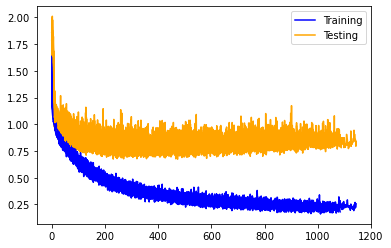

In [8]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='bTesting', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

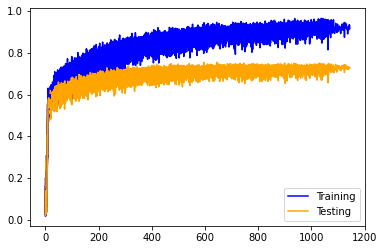

In [9]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

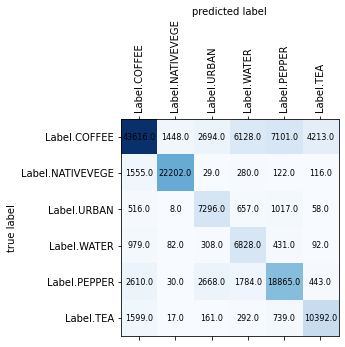

In [10]:
plot_confusion_matrix(conf_matrix, labels)

In [11]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.85731695 0.93336697 0.55457586 0.42757843 0.66719717 0.67859475]
Mean precision:  0.6864383551919198

Recalls:  [0.66895706 0.91351218 0.7638191  0.78302752 0.71458333 0.78727273]
Mean recall:  0.7718619855498542

F-Score:  [0.75151411 0.92333285 0.64259292 0.55312082 0.69007773 0.7289051 ]
Mean f-score:  0.7149239214227622


# 1x16 conv k=(3, 3), 1x32 conv k=(1, 1), 1x64 conv k=(1, 1), 1x64 conv k=(1, 1), 0.5 SpatialDropout, MaxPooling2D k=(2, 2) s=(1, 1), GlobalAveragePooling, 1x32 FC - without padding

In [16]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    BatchNormalization(),
    Conv2D(filters=16, kernel_size=(3, 3), activation="relu"),
    Conv2D(filters=32, kernel_size=(2, 2), activation="relu"),
    Conv2D(filters=64, kernel_size=(2, 2), activation="relu"),
    Conv2D(filters=64, kernel_size=(1, 1), activation="relu"),
    SpatialDropout2D(0.25),
    MaxPooling2D(pool_size=(2, 2), strides=(1, 1)),
    GlobalAveragePooling2D(),
    Dense(32, activation='relu'),
    Flatten(name='flat'),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS, early_stopping=True)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_3 (Rescaling)      (None, 9, 9, 4)           0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 9, 9, 4)           16        
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 7, 7, 16)          592       
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 6, 6, 32)          2080      
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 5, 5, 64)          8256      
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 5, 5, 64)          4160      
_________________________________________________________________
spatial_dropout2d_3 (Spatial (None, 5, 5, 64)         

57/57 [==============================] - 1s 9ms/step - loss: 0.8336 - accuracy: 0.6095 - val_loss: 0.9441 - val_accuracy: 0.6338
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8432 - accuracy: 0.5966 - val_loss: 1.0375 - val_accuracy: 0.5909
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8754 - accuracy: 0.5888 - val_loss: 0.8751 - val_accuracy: 0.6626
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8550 - accuracy: 0.5934 - val_loss: 1.0083 - val_accuracy: 0.6053
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8389 - accuracy: 0.6296 - val_loss: 0.9749 - val_accuracy: 0.6132
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9345 - accuracy: 0.5889 - val_loss: 0.9515 - val_accuracy: 0.6383
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8604 - accuracy: 0.5908 - val_loss: 0.9921 - val_accuracy: 0.6158
Epoch 51/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.7281 - accuracy: 0.6581 - val_loss: 0.8806 - val_accuracy: 0.6524
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7190 - accuracy: 0.6541 - val_loss: 0.8771 - val_accuracy: 0.6611
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6711 - accuracy: 0.6701 - val_loss: 0.8814 - val_accuracy: 0.6462
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7797 - accuracy: 0.6271 - val_loss: 0.8413 - val_accuracy: 0.6653
Epoch 105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6829 - accuracy: 0.6757 - val_loss: 0.9588 - val_accuracy: 0.6098
Epoch 106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7070 - accuracy: 0.6262 - val_loss: 0.9083 - val_accuracy: 0.6336
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7592 - accuracy: 0.6349 - val_loss: 0.9190 - val_accuracy: 0.6349
Epoch 1

Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6017 - accuracy: 0.7026 - val_loss: 0.8454 - val_accuracy: 0.6565
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6787 - accuracy: 0.6525 - val_loss: 0.8135 - val_accuracy: 0.6797
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5969 - accuracy: 0.6873 - val_loss: 0.8090 - val_accuracy: 0.6778
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5975 - accuracy: 0.6677 - val_loss: 0.8978 - val_accuracy: 0.6363
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6107 - accuracy: 0.6793 - val_loss: 0.7522 - val_accuracy: 0.7025
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6351 - accuracy: 0.6836 - val_loss: 0.8680 - val_accuracy: 0.6466
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6654 - accuracy: 0.6689 - val_loss: 0.8106 - val_accuracy:

Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5111 - accuracy: 0.7099 - val_loss: 0.7087 - val_accuracy: 0.7229
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5839 - accuracy: 0.7113 - val_loss: 0.7848 - val_accuracy: 0.6910
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5250 - accuracy: 0.7061 - val_loss: 0.7671 - val_accuracy: 0.7006
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5492 - accuracy: 0.6953 - val_loss: 0.7662 - val_accuracy: 0.7002
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5428 - accuracy: 0.7114 - val_loss: 0.7942 - val_accuracy: 0.6863
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5018 - accuracy: 0.7184 - val_loss: 0.8776 - val_accuracy: 0.6694
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5620 - accuracy: 0.7239 - val_loss: 0.7657 - val_accuracy:

Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4579 - accuracy: 0.7589 - val_loss: 0.7225 - val_accuracy: 0.7243
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4754 - accuracy: 0.7486 - val_loss: 0.7603 - val_accuracy: 0.7085
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4112 - accuracy: 0.7625 - val_loss: 0.8743 - val_accuracy: 0.6703
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5116 - accuracy: 0.6928 - val_loss: 0.7451 - val_accuracy: 0.7157
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4599 - accuracy: 0.7408 - val_loss: 0.7944 - val_accuracy: 0.6935
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4649 - accuracy: 0.7305 - val_loss: 0.7331 - val_accuracy: 0.7231
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4672 - accuracy: 0.7531 - val_loss: 0.7631 - val_accuracy:

Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4005 - accuracy: 0.7774 - val_loss: 0.7124 - val_accuracy: 0.7385
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4566 - accuracy: 0.7559 - val_loss: 0.7389 - val_accuracy: 0.7268
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3924 - accuracy: 0.7723 - val_loss: 0.8349 - val_accuracy: 0.6895
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4711 - accuracy: 0.7454 - val_loss: 0.8116 - val_accuracy: 0.6971
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3927 - accuracy: 0.7498 - val_loss: 0.7350 - val_accuracy: 0.7319
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4354 - accuracy: 0.7687 - val_loss: 0.7190 - val_accuracy: 0.7374
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3493 - accuracy: 0.8061 - val_loss: 0.7424 - val_accuracy:

Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3831 - accuracy: 0.7805 - val_loss: 0.8002 - val_accuracy: 0.7068
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3756 - accuracy: 0.7808 - val_loss: 0.7446 - val_accuracy: 0.7325
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4016 - accuracy: 0.7743 - val_loss: 0.8243 - val_accuracy: 0.7060
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3829 - accuracy: 0.7686 - val_loss: 0.7502 - val_accuracy: 0.7457
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4302 - accuracy: 0.7962 - val_loss: 0.8020 - val_accuracy: 0.7173
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3306 - accuracy: 0.8002 - val_loss: 0.7567 - val_accuracy: 0.7454
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3465 - accuracy: 0.8118 - val_loss: 0.7451 - val_accuracy:

Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3430 - accuracy: 0.8124 - val_loss: 0.7011 - val_accuracy: 0.7613
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3470 - accuracy: 0.8104 - val_loss: 0.7769 - val_accuracy: 0.7391
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3579 - accuracy: 0.7739 - val_loss: 0.8103 - val_accuracy: 0.7132
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3648 - accuracy: 0.7811 - val_loss: 0.8197 - val_accuracy: 0.7132
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3875 - accuracy: 0.7825 - val_loss: 0.8900 - val_accuracy: 0.6876
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3593 - accuracy: 0.7857 - val_loss: 0.7406 - val_accuracy: 0.7421
Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3657 - accuracy: 0.8055 - val_loss: 0.7830 - val_accuracy:

Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3362 - accuracy: 0.8005 - val_loss: 0.7216 - val_accuracy: 0.7572
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3254 - accuracy: 0.8303 - val_loss: 0.8341 - val_accuracy: 0.7165
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3107 - accuracy: 0.7880 - val_loss: 0.7735 - val_accuracy: 0.7269
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3151 - accuracy: 0.8210 - val_loss: 0.8851 - val_accuracy: 0.7066
Epoch 504/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4288 - accuracy: 0.7864 - val_loss: 0.7525 - val_accuracy: 0.7294
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3397 - accuracy: 0.8146 - val_loss: 0.7966 - val_accuracy: 0.7286
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2901 - accuracy: 0.8332 - val_loss: 0.7386 - val_accuracy:

Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3510 - accuracy: 0.8220 - val_loss: 0.7327 - val_accuracy: 0.7561
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3071 - accuracy: 0.8416 - val_loss: 0.7419 - val_accuracy: 0.7480
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3028 - accuracy: 0.8348 - val_loss: 0.7274 - val_accuracy: 0.7537
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2985 - accuracy: 0.8204 - val_loss: 0.8071 - val_accuracy: 0.7299
Epoch 561/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3988 - accuracy: 0.7878 - val_loss: 0.7964 - val_accuracy: 0.7321
Epoch 562/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3329 - accuracy: 0.8077 - val_loss: 0.7924 - val_accuracy: 0.7367
Epoch 563/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3480 - accuracy: 0.7871 - val_loss: 0.8330 - val_accuracy:

Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2533 - accuracy: 0.8396 - val_loss: 0.7684 - val_accuracy: 0.7516
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3605 - accuracy: 0.8228 - val_loss: 0.8602 - val_accuracy: 0.7302
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3629 - accuracy: 0.7987 - val_loss: 0.8034 - val_accuracy: 0.7414
Epoch 617/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2817 - accuracy: 0.8305 - val_loss: 0.7415 - val_accuracy: 0.7553
Epoch 618/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2979 - accuracy: 0.8510 - val_loss: 0.7719 - val_accuracy: 0.7440
Epoch 619/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2758 - accuracy: 0.8507 - val_loss: 0.8502 - val_accuracy: 0.7355
Epoch 620/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3272 - accuracy: 0.8117 - val_loss: 0.9260 - val_accuracy:

Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2800 - accuracy: 0.8469 - val_loss: 0.7946 - val_accuracy: 0.7438
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3146 - accuracy: 0.8351 - val_loss: 0.8092 - val_accuracy: 0.7381
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2947 - accuracy: 0.8293 - val_loss: 0.7617 - val_accuracy: 0.7554
Epoch 674/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2715 - accuracy: 0.8503 - val_loss: 0.7596 - val_accuracy: 0.7644
Epoch 675/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2867 - accuracy: 0.8422 - val_loss: 0.7966 - val_accuracy: 0.7466
Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3069 - accuracy: 0.8199 - val_loss: 0.8141 - val_accuracy: 0.7467
Epoch 677/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2755 - accuracy: 0.8415 - val_loss: 0.7892 - val_accuracy:

Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2686 - accuracy: 0.8600 - val_loss: 0.7638 - val_accuracy: 0.7474
Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2406 - accuracy: 0.8550 - val_loss: 0.8069 - val_accuracy: 0.7457
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2561 - accuracy: 0.8550 - val_loss: 0.7667 - val_accuracy: 0.7526
Epoch 731/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2588 - accuracy: 0.8431 - val_loss: 0.7813 - val_accuracy: 0.7505
Epoch 732/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2958 - accuracy: 0.8479 - val_loss: 0.7555 - val_accuracy: 0.7557
Epoch 733/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2681 - accuracy: 0.8382 - val_loss: 0.7470 - val_accuracy: 0.7615
Epoch 734/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2614 - accuracy: 0.8591 - val_loss: 0.7619 - val_accuracy:

Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2529 - accuracy: 0.8342 - val_loss: 0.8526 - val_accuracy: 0.7208
Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3008 - accuracy: 0.8184 - val_loss: 0.8789 - val_accuracy: 0.7349
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3422 - accuracy: 0.8175 - val_loss: 0.7655 - val_accuracy: 0.7490
Epoch 788/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2676 - accuracy: 0.8478 - val_loss: 0.7275 - val_accuracy: 0.7609
Epoch 789/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2813 - accuracy: 0.8466 - val_loss: 0.8162 - val_accuracy: 0.7315
Epoch 790/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2451 - accuracy: 0.8552 - val_loss: 0.7371 - val_accuracy: 0.7568
Epoch 791/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2413 - accuracy: 0.8482 - val_loss: 0.7443 - val_accuracy:

Epoch 842/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2339 - accuracy: 0.8532 - val_loss: 0.9653 - val_accuracy: 0.7009
Epoch 843/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2833 - accuracy: 0.8310 - val_loss: 0.8290 - val_accuracy: 0.7433
Epoch 844/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3057 - accuracy: 0.8330 - val_loss: 0.8511 - val_accuracy: 0.7412
Epoch 845/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2679 - accuracy: 0.8410 - val_loss: 0.7650 - val_accuracy: 0.7723
Epoch 846/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2494 - accuracy: 0.8702 - val_loss: 0.8175 - val_accuracy: 0.7499
Epoch 847/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3159 - accuracy: 0.8345 - val_loss: 0.8278 - val_accuracy: 0.7485
Epoch 848/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2643 - accuracy: 0.8550 - val_loss: 0.7913 - val_accuracy:

Epoch 899/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1965 - accuracy: 0.8877 - val_loss: 0.7933 - val_accuracy: 0.7606
Epoch 900/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2553 - accuracy: 0.8638 - val_loss: 0.8109 - val_accuracy: 0.7461
Epoch 901/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2398 - accuracy: 0.8618 - val_loss: 0.8117 - val_accuracy: 0.7500
Epoch 902/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2089 - accuracy: 0.8713 - val_loss: 0.8151 - val_accuracy: 0.7489
Epoch 903/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2317 - accuracy: 0.8701 - val_loss: 0.7991 - val_accuracy: 0.7581
Epoch 904/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2442 - accuracy: 0.8538 - val_loss: 0.8160 - val_accuracy: 0.7572
Epoch 905/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2173 - accuracy: 0.8657 - val_loss: 0.8348 - val_accuracy:

Epoch 956/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2080 - accuracy: 0.8787 - val_loss: 0.7913 - val_accuracy: 0.7580
Epoch 957/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2260 - accuracy: 0.8731 - val_loss: 0.8884 - val_accuracy: 0.7268
Epoch 958/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2566 - accuracy: 0.8609 - val_loss: 0.8180 - val_accuracy: 0.7496
Epoch 959/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2217 - accuracy: 0.8631 - val_loss: 0.8047 - val_accuracy: 0.7573
Epoch 960/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1921 - accuracy: 0.8738 - val_loss: 0.8750 - val_accuracy: 0.7367
Epoch 961/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2368 - accuracy: 0.8490 - val_loss: 0.8399 - val_accuracy: 0.7530
Epoch 962/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2741 - accuracy: 0.8486 - val_loss: 0.8464 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.7750 - accuracy: 0.6392 - val_loss: 0.9082 - val_accuracy: 0.6469
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7491 - accuracy: 0.6442 - val_loss: 0.8614 - val_accuracy: 0.6768
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7386 - accuracy: 0.6794 - val_loss: 0.9817 - val_accuracy: 0.6130
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8469 - accuracy: 0.6003 - val_loss: 0.9300 - val_accuracy: 0.6470
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8710 - accuracy: 0.6043 - val_loss: 0.8873 - val_accuracy: 0.6622
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6905 - accuracy: 0.6634 - val_loss: 0.9550 - val_accuracy: 0.6308
Epoch 51/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7290 - accuracy: 0.6327 - val_loss: 0.9633 - val_accuracy: 0.6299
Epoch 52/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6062 - accuracy: 0.6539 - val_loss: 0.8975 - val_accuracy: 0.6464
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6287 - accuracy: 0.6620 - val_loss: 0.8997 - val_accuracy: 0.6523
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5961 - accuracy: 0.6749 - val_loss: 0.8331 - val_accuracy: 0.6784
Epoch 105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6209 - accuracy: 0.6889 - val_loss: 0.9741 - val_accuracy: 0.6236
Epoch 106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6386 - accuracy: 0.6424 - val_loss: 0.8172 - val_accuracy: 0.6922
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5543 - accuracy: 0.7039 - val_loss: 0.8714 - val_accuracy: 0.6578
Epoch 108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6269 - accuracy: 0.6659 - val_loss: 0.9242 - val_accuracy: 0.6470
Epoch 1

Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5034 - accuracy: 0.7220 - val_loss: 0.8391 - val_accuracy: 0.6861
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4607 - accuracy: 0.7226 - val_loss: 0.8668 - val_accuracy: 0.6763
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5584 - accuracy: 0.7121 - val_loss: 0.8237 - val_accuracy: 0.6907
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5204 - accuracy: 0.7240 - val_loss: 0.9675 - val_accuracy: 0.6370
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5653 - accuracy: 0.6832 - val_loss: 0.8441 - val_accuracy: 0.6770
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5386 - accuracy: 0.7290 - val_loss: 0.8482 - val_accuracy: 0.6763
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5158 - accuracy: 0.7236 - val_loss: 0.9036 - val_accuracy:

Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4398 - accuracy: 0.7564 - val_loss: 0.8086 - val_accuracy: 0.7074
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4478 - accuracy: 0.7609 - val_loss: 0.7934 - val_accuracy: 0.7072
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4609 - accuracy: 0.7541 - val_loss: 0.9086 - val_accuracy: 0.6732
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4254 - accuracy: 0.7581 - val_loss: 0.8248 - val_accuracy: 0.7047
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4365 - accuracy: 0.7393 - val_loss: 0.8488 - val_accuracy: 0.6958
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4348 - accuracy: 0.7582 - val_loss: 0.8005 - val_accuracy: 0.7050
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4343 - accuracy: 0.7585 - val_loss: 0.8647 - val_accuracy:

Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4193 - accuracy: 0.7498 - val_loss: 0.8592 - val_accuracy: 0.6905
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3956 - accuracy: 0.7723 - val_loss: 0.8507 - val_accuracy: 0.7000
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3672 - accuracy: 0.7849 - val_loss: 0.8237 - val_accuracy: 0.7070
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3773 - accuracy: 0.7818 - val_loss: 0.9221 - val_accuracy: 0.6971
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4396 - accuracy: 0.7399 - val_loss: 1.0352 - val_accuracy: 0.6618
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4990 - accuracy: 0.7444 - val_loss: 0.8696 - val_accuracy: 0.7024
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4133 - accuracy: 0.7469 - val_loss: 0.8670 - val_accuracy:

Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3821 - accuracy: 0.7591 - val_loss: 1.0119 - val_accuracy: 0.6693
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3555 - accuracy: 0.7820 - val_loss: 0.8258 - val_accuracy: 0.7195
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3644 - accuracy: 0.7736 - val_loss: 0.8697 - val_accuracy: 0.7084
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3972 - accuracy: 0.7732 - val_loss: 0.9687 - val_accuracy: 0.6868
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3951 - accuracy: 0.7695 - val_loss: 0.9287 - val_accuracy: 0.6906
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3779 - accuracy: 0.7674 - val_loss: 0.8381 - val_accuracy: 0.7247
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3579 - accuracy: 0.7801 - val_loss: 0.9183 - val_accuracy:

Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3472 - accuracy: 0.7865 - val_loss: 1.0367 - val_accuracy: 0.6674
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3686 - accuracy: 0.7680 - val_loss: 0.9478 - val_accuracy: 0.6896
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3710 - accuracy: 0.7857 - val_loss: 0.8953 - val_accuracy: 0.7036
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3505 - accuracy: 0.7903 - val_loss: 0.9089 - val_accuracy: 0.7199
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3423 - accuracy: 0.8099 - val_loss: 0.8855 - val_accuracy: 0.7149
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3783 - accuracy: 0.7948 - val_loss: 0.8642 - val_accuracy: 0.7120
Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3503 - accuracy: 0.8055 - val_loss: 0.8679 - val_accuracy:

Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3595 - accuracy: 0.7751 - val_loss: 0.8300 - val_accuracy: 0.7346
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3121 - accuracy: 0.7931 - val_loss: 0.8861 - val_accuracy: 0.7218
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3001 - accuracy: 0.7901 - val_loss: 0.8966 - val_accuracy: 0.7213
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3078 - accuracy: 0.8049 - val_loss: 0.8487 - val_accuracy: 0.7295
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2686 - accuracy: 0.8342 - val_loss: 0.8934 - val_accuracy: 0.7219
Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3498 - accuracy: 0.8017 - val_loss: 0.8798 - val_accuracy: 0.7135
Epoch 450/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3396 - accuracy: 0.7925 - val_loss: 0.8819 - val_accuracy:

Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3028 - accuracy: 0.8168 - val_loss: 0.8533 - val_accuracy: 0.7324
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3115 - accuracy: 0.8233 - val_loss: 0.8977 - val_accuracy: 0.7069
Epoch 503/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2923 - accuracy: 0.8148 - val_loss: 0.8744 - val_accuracy: 0.7385
Epoch 504/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2886 - accuracy: 0.8206 - val_loss: 0.9096 - val_accuracy: 0.7209
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2658 - accuracy: 0.8206 - val_loss: 0.8664 - val_accuracy: 0.7390
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2517 - accuracy: 0.8404 - val_loss: 0.8622 - val_accuracy: 0.7309
Epoch 507/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3431 - accuracy: 0.7987 - val_loss: 0.9031 - val_accuracy

Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3144 - accuracy: 0.8309 - val_loss: 0.8950 - val_accuracy: 0.7310
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2893 - accuracy: 0.8211 - val_loss: 0.9197 - val_accuracy: 0.7331
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2547 - accuracy: 0.8524 - val_loss: 1.0129 - val_accuracy: 0.7084
Epoch 561/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3331 - accuracy: 0.8311 - val_loss: 0.9024 - val_accuracy: 0.7244
Epoch 562/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2591 - accuracy: 0.8401 - val_loss: 0.8754 - val_accuracy: 0.7306
Epoch 563/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2606 - accuracy: 0.8230 - val_loss: 0.9301 - val_accuracy: 0.7099
Epoch 564/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3044 - accuracy: 0.8003 - val_loss: 0.8609 - val_accuracy:

Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3189 - accuracy: 0.8206 - val_loss: 0.8989 - val_accuracy: 0.7225
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2716 - accuracy: 0.8289 - val_loss: 0.8828 - val_accuracy: 0.7347
Epoch 617/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2739 - accuracy: 0.8236 - val_loss: 0.9168 - val_accuracy: 0.7308
Epoch 618/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2483 - accuracy: 0.8474 - val_loss: 0.9045 - val_accuracy: 0.7232
Epoch 619/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2909 - accuracy: 0.8247 - val_loss: 0.9260 - val_accuracy: 0.7313
Epoch 620/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2487 - accuracy: 0.8466 - val_loss: 0.9469 - val_accuracy: 0.7286
Epoch 621/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2381 - accuracy: 0.8405 - val_loss: 0.8910 - val_accuracy:

Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3071 - accuracy: 0.8241 - val_loss: 0.8942 - val_accuracy: 0.7461
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2438 - accuracy: 0.8499 - val_loss: 0.8689 - val_accuracy: 0.7488
Epoch 674/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2079 - accuracy: 0.8575 - val_loss: 0.9214 - val_accuracy: 0.7337
Epoch 675/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2182 - accuracy: 0.8634 - val_loss: 1.0266 - val_accuracy: 0.7074
Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2867 - accuracy: 0.8374 - val_loss: 0.9514 - val_accuracy: 0.7262
Epoch 677/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2381 - accuracy: 0.8446 - val_loss: 0.9883 - val_accuracy: 0.7384
Epoch 678/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2447 - accuracy: 0.8462 - val_loss: 0.8384 - val_accuracy

Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2221 - accuracy: 0.8557 - val_loss: 0.8907 - val_accuracy: 0.7502
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2577 - accuracy: 0.8384 - val_loss: 0.9328 - val_accuracy: 0.7348
Epoch 731/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3120 - accuracy: 0.8295 - val_loss: 0.8993 - val_accuracy: 0.7347
Epoch 732/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2192 - accuracy: 0.8682 - val_loss: 0.9426 - val_accuracy: 0.7456
Epoch 733/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2280 - accuracy: 0.8609 - val_loss: 0.9065 - val_accuracy: 0.7466
Epoch 734/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2290 - accuracy: 0.8588 - val_loss: 0.9786 - val_accuracy: 0.7173
Epoch 735/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2984 - accuracy: 0.8160 - val_loss: 0.8827 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8301 - accuracy: 0.6216 - val_loss: 1.0117 - val_accuracy: 0.6052
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8397 - accuracy: 0.6239 - val_loss: 0.8935 - val_accuracy: 0.6575
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8645 - accuracy: 0.6264 - val_loss: 0.9786 - val_accuracy: 0.6099
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8123 - accuracy: 0.6716 - val_loss: 1.0052 - val_accuracy: 0.6056
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8570 - accuracy: 0.6266 - val_loss: 0.9663 - val_accuracy: 0.6132
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8175 - accuracy: 0.6501 - val_loss: 0.9310 - val_accuracy: 0.6356
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7564 - accuracy: 0.6570 - val_loss: 0.9355 - val_accuracy: 0.6329
Epoch 47/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6527 - accuracy: 0.7118 - val_loss: 0.9895 - val_accuracy: 0.6122
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6584 - accuracy: 0.6797 - val_loss: 0.9532 - val_accuracy: 0.6278
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6526 - accuracy: 0.6840 - val_loss: 0.9751 - val_accuracy: 0.6157
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7126 - accuracy: 0.6714 - val_loss: 0.9372 - val_accuracy: 0.6333
Epoch 101/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.6390 - accuracy: 0.7002 - val_loss: 0.9515 - val_accuracy: 0.6230
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7046 - accuracy: 0.6933 - val_loss: 0.9147 - val_accuracy: 0.6369
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6741 - accuracy: 0.6386 - val_loss: 0.9734 - val_accuracy: 0.6138
Epoch 10

57/57 [==============================] - 1s 9ms/step - loss: 0.5753 - accuracy: 0.7228 - val_loss: 0.8836 - val_accuracy: 0.6511
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5685 - accuracy: 0.7171 - val_loss: 0.9586 - val_accuracy: 0.6248
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5728 - accuracy: 0.7165 - val_loss: 0.9834 - val_accuracy: 0.6176
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6228 - accuracy: 0.7044 - val_loss: 0.9175 - val_accuracy: 0.6328
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5960 - accuracy: 0.6886 - val_loss: 0.8713 - val_accuracy: 0.6535
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6383 - accuracy: 0.6902 - val_loss: 0.8315 - val_accuracy: 0.6721
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6093 - accuracy: 0.7137 - val_loss: 0.9735 - val_accuracy: 0.6293
Epoch 1

Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5635 - accuracy: 0.7537 - val_loss: 0.9117 - val_accuracy: 0.6335
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5132 - accuracy: 0.7125 - val_loss: 0.8340 - val_accuracy: 0.6906
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5537 - accuracy: 0.7224 - val_loss: 0.8077 - val_accuracy: 0.6903
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5253 - accuracy: 0.7311 - val_loss: 0.9097 - val_accuracy: 0.6545
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5153 - accuracy: 0.7093 - val_loss: 0.8689 - val_accuracy: 0.6640
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5688 - accuracy: 0.7142 - val_loss: 0.8605 - val_accuracy: 0.6607
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5325 - accuracy: 0.7108 - val_loss: 0.8781 - val_accuracy:

Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4515 - accuracy: 0.7564 - val_loss: 0.8803 - val_accuracy: 0.6793
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4377 - accuracy: 0.7517 - val_loss: 0.9359 - val_accuracy: 0.6449
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4520 - accuracy: 0.7408 - val_loss: 0.8791 - val_accuracy: 0.6744
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4859 - accuracy: 0.7460 - val_loss: 0.8478 - val_accuracy: 0.6913
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4605 - accuracy: 0.7761 - val_loss: 1.0293 - val_accuracy: 0.6394
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4671 - accuracy: 0.7630 - val_loss: 0.8164 - val_accuracy: 0.6926
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4309 - accuracy: 0.7502 - val_loss: 0.8773 - val_accuracy:

Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4662 - accuracy: 0.7373 - val_loss: 0.8840 - val_accuracy: 0.6765
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4157 - accuracy: 0.7650 - val_loss: 0.8742 - val_accuracy: 0.6738
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4137 - accuracy: 0.7942 - val_loss: 0.8802 - val_accuracy: 0.6810
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3919 - accuracy: 0.7838 - val_loss: 0.8238 - val_accuracy: 0.7020
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4642 - accuracy: 0.7611 - val_loss: 0.7698 - val_accuracy: 0.7262
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4933 - accuracy: 0.7805 - val_loss: 0.8496 - val_accuracy: 0.6898
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3909 - accuracy: 0.7899 - val_loss: 0.8796 - val_accuracy:

Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3486 - accuracy: 0.8112 - val_loss: 0.8661 - val_accuracy: 0.7009
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3464 - accuracy: 0.8079 - val_loss: 0.9283 - val_accuracy: 0.6787
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3942 - accuracy: 0.7834 - val_loss: 0.9508 - val_accuracy: 0.6869
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3515 - accuracy: 0.8060 - val_loss: 0.8516 - val_accuracy: 0.7157
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3703 - accuracy: 0.7895 - val_loss: 0.8592 - val_accuracy: 0.6960
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4019 - accuracy: 0.7890 - val_loss: 0.9099 - val_accuracy: 0.6926
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3591 - accuracy: 0.8007 - val_loss: 0.8516 - val_accuracy:

Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3578 - accuracy: 0.8059 - val_loss: 0.8644 - val_accuracy: 0.7146
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3646 - accuracy: 0.8043 - val_loss: 0.8804 - val_accuracy: 0.7165
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3642 - accuracy: 0.8059 - val_loss: 0.8873 - val_accuracy: 0.7017
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3879 - accuracy: 0.7935 - val_loss: 0.8582 - val_accuracy: 0.7124
Epoch 443/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3240 - accuracy: 0.8378 - val_loss: 0.8309 - val_accuracy: 0.7366
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3509 - accuracy: 0.8135 - val_loss: 0.9240 - val_accuracy: 0.6871
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4110 - accuracy: 0.7997 - val_loss: 0.8568 - val_accuracy

Epoch 496/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3201 - accuracy: 0.8124 - val_loss: 0.8451 - val_accuracy: 0.7162
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3637 - accuracy: 0.8062 - val_loss: 0.8766 - val_accuracy: 0.6953
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3202 - accuracy: 0.8176 - val_loss: 0.9907 - val_accuracy: 0.6689
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3206 - accuracy: 0.8164 - val_loss: 0.9400 - val_accuracy: 0.6925
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3755 - accuracy: 0.8009 - val_loss: 0.8457 - val_accuracy: 0.7236
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4277 - accuracy: 0.7962 - val_loss: 0.8266 - val_accuracy: 0.7191
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3845 - accuracy: 0.8034 - val_loss: 0.9788 - val_accuracy

Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3409 - accuracy: 0.8170 - val_loss: 0.8631 - val_accuracy: 0.7244
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3037 - accuracy: 0.8416 - val_loss: 0.9066 - val_accuracy: 0.7110
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2781 - accuracy: 0.8325 - val_loss: 0.8702 - val_accuracy: 0.7327
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4250 - accuracy: 0.7998 - val_loss: 0.9897 - val_accuracy: 0.6905
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3401 - accuracy: 0.8136 - val_loss: 0.8832 - val_accuracy: 0.7123
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2951 - accuracy: 0.8248 - val_loss: 0.9218 - val_accuracy: 0.6972
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2985 - accuracy: 0.8391 - val_loss: 0.8173 - val_accuracy:

Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2861 - accuracy: 0.8319 - val_loss: 0.8438 - val_accuracy: 0.7483
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2744 - accuracy: 0.8370 - val_loss: 1.0580 - val_accuracy: 0.7172
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2972 - accuracy: 0.8513 - val_loss: 1.0189 - val_accuracy: 0.6825
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3318 - accuracy: 0.8097 - val_loss: 0.8734 - val_accuracy: 0.7294
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2764 - accuracy: 0.8382 - val_loss: 0.8867 - val_accuracy: 0.7302
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2980 - accuracy: 0.8389 - val_loss: 0.8454 - val_accuracy: 0.7266
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2892 - accuracy: 0.8269 - val_loss: 0.8608 - val_accuracy:

Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2914 - accuracy: 0.8359 - val_loss: 0.9005 - val_accuracy: 0.7244
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2966 - accuracy: 0.8133 - val_loss: 1.0781 - val_accuracy: 0.6811
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3022 - accuracy: 0.8023 - val_loss: 0.8636 - val_accuracy: 0.7247
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3137 - accuracy: 0.8495 - val_loss: 0.8549 - val_accuracy: 0.7377
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2519 - accuracy: 0.8550 - val_loss: 0.9120 - val_accuracy: 0.7158
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2663 - accuracy: 0.8475 - val_loss: 0.8845 - val_accuracy: 0.7291
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2886 - accuracy: 0.8578 - val_loss: 0.8779 - val_accuracy:

Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2921 - accuracy: 0.8354 - val_loss: 0.9219 - val_accuracy: 0.7234
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2824 - accuracy: 0.8440 - val_loss: 0.9246 - val_accuracy: 0.7251
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2777 - accuracy: 0.8652 - val_loss: 0.9904 - val_accuracy: 0.7262
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2807 - accuracy: 0.8653 - val_loss: 0.9757 - val_accuracy: 0.7236
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2701 - accuracy: 0.8348 - val_loss: 1.0190 - val_accuracy: 0.7088
Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2647 - accuracy: 0.8413 - val_loss: 0.9340 - val_accuracy: 0.7233
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3018 - accuracy: 0.8390 - val_loss: 0.9166 - val_accuracy:

Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3052 - accuracy: 0.8377 - val_loss: 0.8548 - val_accuracy: 0.7394
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2696 - accuracy: 0.8496 - val_loss: 0.8748 - val_accuracy: 0.7342
Epoch 783/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2711 - accuracy: 0.8499 - val_loss: 0.8717 - val_accuracy: 0.7396
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2996 - accuracy: 0.8315 - val_loss: 0.8595 - val_accuracy: 0.7230
Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2176 - accuracy: 0.8572 - val_loss: 0.8500 - val_accuracy: 0.7397
Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2416 - accuracy: 0.8633 - val_loss: 0.9156 - val_accuracy: 0.7230
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2585 - accuracy: 0.8570 - val_loss: 0.9286 - val_accuracy:

Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1426 - accuracy: 0.3922 - val_loss: 1.7593 - val_accuracy: 0.0947
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1205 - accuracy: 0.4254 - val_loss: 1.6822 - val_accuracy: 0.3771
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0685 - accuracy: 0.4485 - val_loss: 1.6277 - val_accuracy: 0.5185
Epoch 7/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0283 - accuracy: 0.5000 - val_loss: 1.5292 - val_accuracy: 0.5026
Epoch 8/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0741 - accuracy: 0.4640 - val_loss: 1.4520 - val_accuracy: 0.5225
Epoch 9/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0349 - accuracy: 0.5241 - val_loss: 1.3460 - val_accuracy: 0.5354
Epoch 10/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0097 - accuracy: 0.5199 - val_loss: 1.2372 - val_accuracy: 0.5430
Epoch

57/57 [==============================] - 1s 9ms/step - loss: 0.8020 - accuracy: 0.6308 - val_loss: 0.9422 - val_accuracy: 0.6286
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7497 - accuracy: 0.6702 - val_loss: 0.9030 - val_accuracy: 0.6423
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7099 - accuracy: 0.6637 - val_loss: 0.8654 - val_accuracy: 0.6682
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8435 - accuracy: 0.6271 - val_loss: 0.8529 - val_accuracy: 0.6656
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7310 - accuracy: 0.6657 - val_loss: 0.8734 - val_accuracy: 0.6533
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7697 - accuracy: 0.6373 - val_loss: 0.8365 - val_accuracy: 0.6706
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7814 - accuracy: 0.6241 - val_loss: 0.8745 - val_accuracy: 0.6605
Epoch 68/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6050 - accuracy: 0.7065 - val_loss: 0.7831 - val_accuracy: 0.6991
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6320 - accuracy: 0.6991 - val_loss: 0.8605 - val_accuracy: 0.6655
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6345 - accuracy: 0.7052 - val_loss: 0.9908 - val_accuracy: 0.6204
Epoch 121/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6303 - accuracy: 0.6628 - val_loss: 0.8424 - val_accuracy: 0.6649
Epoch 122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6119 - accuracy: 0.6983 - val_loss: 0.8815 - val_accuracy: 0.6572
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6489 - accuracy: 0.7021 - val_loss: 0.8033 - val_accuracy: 0.6899
Epoch 124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6046 - accuracy: 0.6879 - val_loss: 0.8504 - val_accuracy: 0.6681
Epoch 1

Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5667 - accuracy: 0.7086 - val_loss: 0.8357 - val_accuracy: 0.6693
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5091 - accuracy: 0.6984 - val_loss: 0.7713 - val_accuracy: 0.6986
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5100 - accuracy: 0.7186 - val_loss: 0.8776 - val_accuracy: 0.6553
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5516 - accuracy: 0.6950 - val_loss: 0.8206 - val_accuracy: 0.6827
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5551 - accuracy: 0.7098 - val_loss: 0.8531 - val_accuracy: 0.6571
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4971 - accuracy: 0.7261 - val_loss: 0.8045 - val_accuracy: 0.6872
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5148 - accuracy: 0.7343 - val_loss: 0.8063 - val_accuracy:

Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4227 - accuracy: 0.7498 - val_loss: 0.7374 - val_accuracy: 0.7203
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3891 - accuracy: 0.7871 - val_loss: 0.8109 - val_accuracy: 0.6873
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4552 - accuracy: 0.7575 - val_loss: 0.7646 - val_accuracy: 0.7082
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4436 - accuracy: 0.7575 - val_loss: 0.8622 - val_accuracy: 0.6664
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4742 - accuracy: 0.7488 - val_loss: 0.8344 - val_accuracy: 0.6867
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4115 - accuracy: 0.7607 - val_loss: 0.7207 - val_accuracy: 0.7237
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4325 - accuracy: 0.7642 - val_loss: 0.8333 - val_accuracy:

Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4062 - accuracy: 0.7651 - val_loss: 0.8111 - val_accuracy: 0.6979
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4471 - accuracy: 0.7641 - val_loss: 0.7547 - val_accuracy: 0.7152
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4709 - accuracy: 0.7482 - val_loss: 0.7900 - val_accuracy: 0.7110
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4019 - accuracy: 0.7701 - val_loss: 0.8171 - val_accuracy: 0.7013
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3934 - accuracy: 0.7681 - val_loss: 0.8474 - val_accuracy: 0.6856
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3999 - accuracy: 0.7664 - val_loss: 0.7795 - val_accuracy: 0.7156
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4227 - accuracy: 0.7878 - val_loss: 0.7966 - val_accuracy:

Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3525 - accuracy: 0.8183 - val_loss: 0.7757 - val_accuracy: 0.7232
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4006 - accuracy: 0.7889 - val_loss: 0.8250 - val_accuracy: 0.7002
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3412 - accuracy: 0.7951 - val_loss: 0.8151 - val_accuracy: 0.7029
Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4225 - accuracy: 0.7481 - val_loss: 0.7608 - val_accuracy: 0.7289
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4357 - accuracy: 0.7679 - val_loss: 0.8439 - val_accuracy: 0.7031
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3810 - accuracy: 0.7841 - val_loss: 0.8288 - val_accuracy: 0.7040
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3635 - accuracy: 0.8001 - val_loss: 0.8422 - val_accuracy:

Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3752 - accuracy: 0.7986 - val_loss: 0.7826 - val_accuracy: 0.7313
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2947 - accuracy: 0.8157 - val_loss: 0.8297 - val_accuracy: 0.7180
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3475 - accuracy: 0.8122 - val_loss: 0.7707 - val_accuracy: 0.7352
Epoch 406/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3339 - accuracy: 0.8157 - val_loss: 0.7742 - val_accuracy: 0.7313
Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3378 - accuracy: 0.7992 - val_loss: 0.8558 - val_accuracy: 0.7055
Epoch 408/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3161 - accuracy: 0.7950 - val_loss: 0.7625 - val_accuracy: 0.7363
Epoch 409/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3712 - accuracy: 0.7862 - val_loss: 0.7839 - val_accuracy:

Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3250 - accuracy: 0.8100 - val_loss: 0.8185 - val_accuracy: 0.7396
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3049 - accuracy: 0.8338 - val_loss: 0.8077 - val_accuracy: 0.7325
Epoch 462/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3119 - accuracy: 0.8010 - val_loss: 0.8724 - val_accuracy: 0.7131
Epoch 463/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3115 - accuracy: 0.8032 - val_loss: 0.8417 - val_accuracy: 0.7267
Epoch 464/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3961 - accuracy: 0.7779 - val_loss: 0.7754 - val_accuracy: 0.7428
Epoch 465/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3415 - accuracy: 0.8020 - val_loss: 0.8620 - val_accuracy: 0.7120
Epoch 466/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3379 - accuracy: 0.8168 - val_loss: 0.8130 - val_accuracy:

Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3132 - accuracy: 0.8198 - val_loss: 0.7350 - val_accuracy: 0.7575
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2980 - accuracy: 0.8306 - val_loss: 0.8828 - val_accuracy: 0.6996
Epoch 519/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3717 - accuracy: 0.7786 - val_loss: 0.8369 - val_accuracy: 0.7164
Epoch 520/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3052 - accuracy: 0.8152 - val_loss: 0.7797 - val_accuracy: 0.7450
Epoch 521/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2601 - accuracy: 0.8331 - val_loss: 0.8132 - val_accuracy: 0.7279
Epoch 522/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3005 - accuracy: 0.8165 - val_loss: 0.8198 - val_accuracy: 0.7327
Epoch 523/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3007 - accuracy: 0.8322 - val_loss: 0.8365 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8439 - accuracy: 0.6119 - val_loss: 0.9932 - val_accuracy: 0.6075
Epoch 40/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.7953 - accuracy: 0.6303 - val_loss: 1.0146 - val_accuracy: 0.5998
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7795 - accuracy: 0.6337 - val_loss: 0.8885 - val_accuracy: 0.6662
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8767 - accuracy: 0.5925 - val_loss: 0.9892 - val_accuracy: 0.6069
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7893 - accuracy: 0.6442 - val_loss: 0.9322 - val_accuracy: 0.6450
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8395 - accuracy: 0.6455 - val_loss: 0.9619 - val_accuracy: 0.6211
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7917 - accuracy: 0.6446 - val_loss: 0.9767 - val_accuracy: 0.6108
Epoch 46/200

57/57 [==============================] - 1s 9ms/step - loss: 0.6739 - accuracy: 0.6474 - val_loss: 0.8462 - val_accuracy: 0.6763
Epoch 97/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6983 - accuracy: 0.6586 - val_loss: 0.8627 - val_accuracy: 0.6747
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6796 - accuracy: 0.6575 - val_loss: 0.9056 - val_accuracy: 0.6506
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7066 - accuracy: 0.6449 - val_loss: 0.8789 - val_accuracy: 0.6450
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6300 - accuracy: 0.6874 - val_loss: 0.8933 - val_accuracy: 0.6516
Epoch 101/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6593 - accuracy: 0.6543 - val_loss: 0.8797 - val_accuracy: 0.6503
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7029 - accuracy: 0.6724 - val_loss: 0.8994 - val_accuracy: 0.6388
Epoch 103/

57/57 [==============================] - 1s 9ms/step - loss: 0.6492 - accuracy: 0.6628 - val_loss: 0.8451 - val_accuracy: 0.6728
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6168 - accuracy: 0.6730 - val_loss: 0.8492 - val_accuracy: 0.6704
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5767 - accuracy: 0.6818 - val_loss: 0.8211 - val_accuracy: 0.6769
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6182 - accuracy: 0.6934 - val_loss: 0.9570 - val_accuracy: 0.6164
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5939 - accuracy: 0.6881 - val_loss: 0.8528 - val_accuracy: 0.6730
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5584 - accuracy: 0.6916 - val_loss: 0.8879 - val_accuracy: 0.6382
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6501 - accuracy: 0.6745 - val_loss: 0.8206 - val_accuracy: 0.6814
Epoch 1

Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4937 - accuracy: 0.7318 - val_loss: 0.9423 - val_accuracy: 0.6295
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5496 - accuracy: 0.6741 - val_loss: 0.8557 - val_accuracy: 0.6711
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5300 - accuracy: 0.7253 - val_loss: 0.8451 - val_accuracy: 0.6740
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5761 - accuracy: 0.6943 - val_loss: 0.7616 - val_accuracy: 0.7034
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5231 - accuracy: 0.7169 - val_loss: 0.9180 - val_accuracy: 0.6484
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4826 - accuracy: 0.7257 - val_loss: 0.8125 - val_accuracy: 0.6901
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5443 - accuracy: 0.7153 - val_loss: 0.8076 - val_accuracy:

Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4391 - accuracy: 0.7417 - val_loss: 0.8765 - val_accuracy: 0.6637
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5607 - accuracy: 0.7019 - val_loss: 0.7591 - val_accuracy: 0.7131
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4896 - accuracy: 0.7302 - val_loss: 0.9199 - val_accuracy: 0.6497
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4704 - accuracy: 0.7164 - val_loss: 0.7972 - val_accuracy: 0.6884
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4786 - accuracy: 0.7324 - val_loss: 0.8296 - val_accuracy: 0.6841
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4312 - accuracy: 0.7389 - val_loss: 0.8320 - val_accuracy: 0.6818
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4744 - accuracy: 0.7162 - val_loss: 0.8412 - val_accuracy:

Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3814 - accuracy: 0.7790 - val_loss: 0.8672 - val_accuracy: 0.6844
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4393 - accuracy: 0.7639 - val_loss: 0.8711 - val_accuracy: 0.6974
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4132 - accuracy: 0.7577 - val_loss: 0.8618 - val_accuracy: 0.6886
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4579 - accuracy: 0.7360 - val_loss: 0.8558 - val_accuracy: 0.6806
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4136 - accuracy: 0.7645 - val_loss: 0.7476 - val_accuracy: 0.7276
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3776 - accuracy: 0.7900 - val_loss: 0.8402 - val_accuracy: 0.6928
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4290 - accuracy: 0.7577 - val_loss: 0.8056 - val_accuracy:

Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3502 - accuracy: 0.7942 - val_loss: 0.8683 - val_accuracy: 0.6909
Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4263 - accuracy: 0.7381 - val_loss: 0.8168 - val_accuracy: 0.7133
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3571 - accuracy: 0.7878 - val_loss: 0.7807 - val_accuracy: 0.7253
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3465 - accuracy: 0.7989 - val_loss: 0.8798 - val_accuracy: 0.6825
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4174 - accuracy: 0.7595 - val_loss: 0.7905 - val_accuracy: 0.7245
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3461 - accuracy: 0.8038 - val_loss: 0.8334 - val_accuracy: 0.7044
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3684 - accuracy: 0.7863 - val_loss: 0.8226 - val_accuracy:

Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3488 - accuracy: 0.7916 - val_loss: 0.8406 - val_accuracy: 0.7095
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3912 - accuracy: 0.7753 - val_loss: 0.8262 - val_accuracy: 0.7188
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3635 - accuracy: 0.7860 - val_loss: 0.7946 - val_accuracy: 0.7297
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3588 - accuracy: 0.8032 - val_loss: 0.8154 - val_accuracy: 0.7165
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3244 - accuracy: 0.8033 - val_loss: 0.8841 - val_accuracy: 0.6920
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3377 - accuracy: 0.7966 - val_loss: 0.8259 - val_accuracy: 0.7115
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3375 - accuracy: 0.8012 - val_loss: 0.8531 - val_accuracy:

Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2853 - accuracy: 0.8129 - val_loss: 0.8965 - val_accuracy: 0.6998
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3201 - accuracy: 0.8054 - val_loss: 0.7941 - val_accuracy: 0.7409
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2925 - accuracy: 0.8195 - val_loss: 0.7969 - val_accuracy: 0.7419
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3512 - accuracy: 0.7948 - val_loss: 0.8102 - val_accuracy: 0.7375
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3079 - accuracy: 0.8319 - val_loss: 0.8674 - val_accuracy: 0.7095
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2997 - accuracy: 0.8036 - val_loss: 0.8622 - val_accuracy: 0.7215
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3936 - accuracy: 0.7852 - val_loss: 0.8335 - val_accuracy:

Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3376 - accuracy: 0.8162 - val_loss: 0.7760 - val_accuracy: 0.7412
Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3644 - accuracy: 0.8010 - val_loss: 0.8394 - val_accuracy: 0.7337
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3554 - accuracy: 0.8022 - val_loss: 0.8797 - val_accuracy: 0.7180
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4233 - accuracy: 0.7895 - val_loss: 0.9230 - val_accuracy: 0.6928
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3275 - accuracy: 0.8199 - val_loss: 0.7993 - val_accuracy: 0.7367
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3237 - accuracy: 0.8158 - val_loss: 0.8885 - val_accuracy: 0.7108
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3548 - accuracy: 0.7951 - val_loss: 0.8815 - val_accuracy:

Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2924 - accuracy: 0.8279 - val_loss: 0.9109 - val_accuracy: 0.7139
Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3426 - accuracy: 0.8223 - val_loss: 0.8115 - val_accuracy: 0.7378
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2877 - accuracy: 0.8313 - val_loss: 0.8723 - val_accuracy: 0.7194
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2824 - accuracy: 0.8156 - val_loss: 0.8043 - val_accuracy: 0.7464
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2969 - accuracy: 0.8205 - val_loss: 0.8647 - val_accuracy: 0.7293
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3201 - accuracy: 0.8183 - val_loss: 0.8422 - val_accuracy: 0.7299
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3370 - accuracy: 0.8205 - val_loss: 0.8760 - val_accuracy:

Epoch 666/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2610 - accuracy: 0.8173 - val_loss: 0.8683 - val_accuracy: 0.7314
Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3348 - accuracy: 0.7969 - val_loss: 0.8228 - val_accuracy: 0.7418
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2701 - accuracy: 0.8688 - val_loss: 0.8265 - val_accuracy: 0.7495
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2812 - accuracy: 0.8448 - val_loss: 0.8307 - val_accuracy: 0.7435
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2803 - accuracy: 0.8301 - val_loss: 0.8227 - val_accuracy: 0.7374
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2841 - accuracy: 0.8414 - val_loss: 0.8356 - val_accuracy: 0.7371
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2745 - accuracy: 0.8320 - val_loss: 0.8943 - val_accuracy:

Epoch 723/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2465 - accuracy: 0.8485 - val_loss: 0.8717 - val_accuracy: 0.7348
Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2311 - accuracy: 0.8502 - val_loss: 0.8322 - val_accuracy: 0.7442
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3010 - accuracy: 0.8190 - val_loss: 0.9149 - val_accuracy: 0.7032
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2666 - accuracy: 0.8370 - val_loss: 0.8524 - val_accuracy: 0.7442
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2806 - accuracy: 0.8271 - val_loss: 0.8495 - val_accuracy: 0.7332
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2735 - accuracy: 0.8401 - val_loss: 0.8457 - val_accuracy: 0.7451
Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2559 - accuracy: 0.8405 - val_loss: 0.8399 - val_accuracy:

Epoch 780/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2679 - accuracy: 0.8329 - val_loss: 0.8786 - val_accuracy: 0.7361
Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2427 - accuracy: 0.8584 - val_loss: 0.8984 - val_accuracy: 0.7304
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2939 - accuracy: 0.8328 - val_loss: 0.8696 - val_accuracy: 0.7386
Epoch 783/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2547 - accuracy: 0.8404 - val_loss: 0.8695 - val_accuracy: 0.7453
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2998 - accuracy: 0.8385 - val_loss: 0.9569 - val_accuracy: 0.7095
Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2559 - accuracy: 0.8458 - val_loss: 0.9043 - val_accuracy: 0.7309
Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2230 - accuracy: 0.8615 - val_loss: 0.9118 - val_accuracy:

Epoch 837/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3302 - accuracy: 0.8306 - val_loss: 0.9099 - val_accuracy: 0.7301
Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2759 - accuracy: 0.8423 - val_loss: 0.8888 - val_accuracy: 0.7434
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2819 - accuracy: 0.8305 - val_loss: 0.8400 - val_accuracy: 0.7488
Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2459 - accuracy: 0.8437 - val_loss: 0.9087 - val_accuracy: 0.7236
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2351 - accuracy: 0.8489 - val_loss: 0.8606 - val_accuracy: 0.7457
Epoch 842/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2463 - accuracy: 0.8495 - val_loss: 0.8513 - val_accuracy: 0.7487
Epoch 843/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2775 - accuracy: 0.8290 - val_loss: 0.9042 - val_accuracy:

Epoch 894/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2674 - accuracy: 0.8498 - val_loss: 0.9330 - val_accuracy: 0.7384
Epoch 895/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2363 - accuracy: 0.8477 - val_loss: 0.9392 - val_accuracy: 0.7344
Epoch 896/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2938 - accuracy: 0.8529 - val_loss: 0.8803 - val_accuracy: 0.7405
Epoch 897/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2319 - accuracy: 0.8433 - val_loss: 0.8876 - val_accuracy: 0.7435
Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2635 - accuracy: 0.8253 - val_loss: 0.9010 - val_accuracy: 0.7537
Epoch 899/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2300 - accuracy: 0.8634 - val_loss: 0.9214 - val_accuracy: 0.7427
Epoch 900/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2518 - accuracy: 0.8366 - val_loss: 0.8325 - val_accuracy:

Epoch 951/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2486 - accuracy: 0.8368 - val_loss: 0.8986 - val_accuracy: 0.7352
Epoch 952/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2631 - accuracy: 0.8583 - val_loss: 0.8545 - val_accuracy: 0.7555
Epoch 953/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2095 - accuracy: 0.8914 - val_loss: 0.8846 - val_accuracy: 0.7456
Epoch 954/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2153 - accuracy: 0.8747 - val_loss: 0.9370 - val_accuracy: 0.7289
Epoch 955/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2001 - accuracy: 0.8846 - val_loss: 0.9201 - val_accuracy: 0.7538
Epoch 956/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2405 - accuracy: 0.8676 - val_loss: 0.8740 - val_accuracy: 0.7571
Epoch 957/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2577 - accuracy: 0.8448 - val_loss: 0.8888 - val_accuracy:

Epoch 1008/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2415 - accuracy: 0.8421 - val_loss: 0.8773 - val_accuracy: 0.7488
Epoch 1009/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2617 - accuracy: 0.8471 - val_loss: 0.9317 - val_accuracy: 0.7211
Epoch 1010/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2045 - accuracy: 0.8519 - val_loss: 0.8943 - val_accuracy: 0.7434
Epoch 1011/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2189 - accuracy: 0.8690 - val_loss: 0.8541 - val_accuracy: 0.7700
Epoch 1012/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2052 - accuracy: 0.8796 - val_loss: 0.9852 - val_accuracy: 0.7262
Epoch 1013/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2202 - accuracy: 0.8640 - val_loss: 0.8878 - val_accuracy: 0.7549
Epoch 1014/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2027 - accuracy: 0.8723 - val_loss: 0.9216 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 0.3028 - accuracy: 0.8250 - val_loss: 0.9774 - val_accuracy: 0.7279
Epoch 1065/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2603 - accuracy: 0.8304 - val_loss: 0.9343 - val_accuracy: 0.7479
Epoch 1066/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2313 - accuracy: 0.8603 - val_loss: 0.8724 - val_accuracy: 0.7572
Epoch 1067/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2424 - accuracy: 0.8484 - val_loss: 0.9321 - val_accuracy: 0.7321
Epoch 1068/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2058 - accuracy: 0.8662 - val_loss: 0.9064 - val_accuracy: 0.7556
Epoch 1069/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2210 - accuracy: 0.8662 - val_loss: 0.8951 - val_accuracy: 0.7488
Epoch 1070/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2413 - accuracy: 0.8494 - val_loss: 0.9147 - val_accuracy: 0.7403
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2405 - accuracy: 0.8515 - val_loss: 0.9343 - val_accuracy: 0.7473
Epoch 1121/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2574 - accuracy: 0.8585 - val_loss: 0.8600 - val_accuracy: 0.7602
Epoch 1122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2562 - accuracy: 0.8518 - val_loss: 0.8528 - val_accuracy: 0.7575
Epoch 1123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2380 - accuracy: 0.8551 - val_loss: 1.0617 - val_accuracy: 0.7176
Epoch 1124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2984 - accuracy: 0.8540 - val_loss: 0.9327 - val_accuracy: 0.7408
Epoch 1125/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2113 - accuracy: 0.8682 - val_loss: 0.9396 - val_accuracy: 0.7517
Epoch 1126/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2134 - accuracy: 0.8713 - val_loss: 0.9251 - val_accuracy: 0.7469
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2392 - accuracy: 0.8574 - val_loss: 0.9666 - val_accuracy: 0.7381
Epoch 1177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2405 - accuracy: 0.8497 - val_loss: 0.9021 - val_accuracy: 0.7494
Epoch 1178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2472 - accuracy: 0.8469 - val_loss: 0.9078 - val_accuracy: 0.7485
Epoch 1179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2413 - accuracy: 0.8631 - val_loss: 0.8779 - val_accuracy: 0.7476
Epoch 1180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2667 - accuracy: 0.8516 - val_loss: 0.8703 - val_accuracy: 0.7533
Epoch 1181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1981 - accuracy: 0.8801 - val_loss: 0.9070 - val_accuracy: 0.7437
Epoch 1182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2103 - accuracy: 0.8706 - val_loss: 0.8658 - val_accuracy: 0.7614
E

57/57 [==============================] - 1s 9ms/step - loss: 0.8242 - accuracy: 0.6172 - val_loss: 0.9228 - val_accuracy: 0.6250
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8679 - accuracy: 0.6129 - val_loss: 1.0414 - val_accuracy: 0.5829
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7825 - accuracy: 0.6265 - val_loss: 0.9400 - val_accuracy: 0.6363
Epoch 49/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8058 - accuracy: 0.6320 - val_loss: 0.9702 - val_accuracy: 0.6253
Epoch 50/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7567 - accuracy: 0.6473 - val_loss: 0.9157 - val_accuracy: 0.6445
Epoch 51/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7907 - accuracy: 0.6271 - val_loss: 0.8947 - val_accuracy: 0.6531
Epoch 52/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8090 - accuracy: 0.6370 - val_loss: 0.9829 - val_accuracy: 0.6014
Epoch 53/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6600 - accuracy: 0.6699 - val_loss: 0.9432 - val_accuracy: 0.6255
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6216 - accuracy: 0.6945 - val_loss: 0.8236 - val_accuracy: 0.6751
Epoch 105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6268 - accuracy: 0.6962 - val_loss: 0.9168 - val_accuracy: 0.6391
Epoch 106/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6834 - accuracy: 0.6696 - val_loss: 0.8771 - val_accuracy: 0.6566
Epoch 107/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6219 - accuracy: 0.6665 - val_loss: 0.9186 - val_accuracy: 0.6409
Epoch 108/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6238 - accuracy: 0.7069 - val_loss: 0.8015 - val_accuracy: 0.6876
Epoch 109/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6156 - accuracy: 0.6849 - val_loss: 0.9994 - val_accuracy: 0.6025
Epoch 1

Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5469 - accuracy: 0.7105 - val_loss: 0.8336 - val_accuracy: 0.6735
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5605 - accuracy: 0.7184 - val_loss: 0.8225 - val_accuracy: 0.6749
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6097 - accuracy: 0.6898 - val_loss: 0.8809 - val_accuracy: 0.6603
Epoch 163/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5848 - accuracy: 0.6785 - val_loss: 0.8174 - val_accuracy: 0.6968
Epoch 164/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5752 - accuracy: 0.6869 - val_loss: 0.8175 - val_accuracy: 0.6912
Epoch 165/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5541 - accuracy: 0.6987 - val_loss: 0.7662 - val_accuracy: 0.7055
Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5534 - accuracy: 0.7246 - val_loss: 0.8502 - val_accuracy:

Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4514 - accuracy: 0.7410 - val_loss: 0.7988 - val_accuracy: 0.6965
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5187 - accuracy: 0.7429 - val_loss: 0.8247 - val_accuracy: 0.6906
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4722 - accuracy: 0.7202 - val_loss: 0.7963 - val_accuracy: 0.6954
Epoch 220/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5092 - accuracy: 0.7377 - val_loss: 0.8488 - val_accuracy: 0.6752
Epoch 221/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4986 - accuracy: 0.7104 - val_loss: 0.8035 - val_accuracy: 0.7029
Epoch 222/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5324 - accuracy: 0.7085 - val_loss: 0.8315 - val_accuracy: 0.6866
Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5229 - accuracy: 0.7201 - val_loss: 0.8841 - val_accuracy:

Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4561 - accuracy: 0.7185 - val_loss: 0.7556 - val_accuracy: 0.7271
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4555 - accuracy: 0.7742 - val_loss: 0.8690 - val_accuracy: 0.6653
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4488 - accuracy: 0.7366 - val_loss: 0.8268 - val_accuracy: 0.6916
Epoch 277/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4210 - accuracy: 0.7308 - val_loss: 0.8727 - val_accuracy: 0.6705
Epoch 278/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4751 - accuracy: 0.7354 - val_loss: 0.8056 - val_accuracy: 0.7007
Epoch 279/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4435 - accuracy: 0.7391 - val_loss: 0.7646 - val_accuracy: 0.7144
Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4445 - accuracy: 0.7345 - val_loss: 0.7979 - val_accuracy:

Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4402 - accuracy: 0.7649 - val_loss: 0.7981 - val_accuracy: 0.7043
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4214 - accuracy: 0.7716 - val_loss: 0.8390 - val_accuracy: 0.7063
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4562 - accuracy: 0.7462 - val_loss: 0.8442 - val_accuracy: 0.6971
Epoch 334/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4006 - accuracy: 0.7595 - val_loss: 0.7995 - val_accuracy: 0.7131
Epoch 335/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3933 - accuracy: 0.7891 - val_loss: 0.8480 - val_accuracy: 0.6952
Epoch 336/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4481 - accuracy: 0.7601 - val_loss: 0.9499 - val_accuracy: 0.6447
Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4146 - accuracy: 0.7402 - val_loss: 0.8148 - val_accuracy:

Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4049 - accuracy: 0.7661 - val_loss: 0.7755 - val_accuracy: 0.7211
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3699 - accuracy: 0.7900 - val_loss: 0.9036 - val_accuracy: 0.6790
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3652 - accuracy: 0.7860 - val_loss: 0.8247 - val_accuracy: 0.7039
Epoch 391/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3735 - accuracy: 0.7744 - val_loss: 0.8678 - val_accuracy: 0.6920
Epoch 392/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4049 - accuracy: 0.7730 - val_loss: 0.8468 - val_accuracy: 0.6882
Epoch 393/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3573 - accuracy: 0.7817 - val_loss: 0.8407 - val_accuracy: 0.7075
Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3606 - accuracy: 0.7983 - val_loss: 0.7956 - val_accuracy:

Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3781 - accuracy: 0.7703 - val_loss: 0.8402 - val_accuracy: 0.7096
Epoch 446/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3675 - accuracy: 0.7865 - val_loss: 0.7967 - val_accuracy: 0.7268
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3574 - accuracy: 0.7931 - val_loss: 0.7940 - val_accuracy: 0.7203
Epoch 448/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3312 - accuracy: 0.7969 - val_loss: 0.8216 - val_accuracy: 0.7192
Epoch 449/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3756 - accuracy: 0.7894 - val_loss: 0.7858 - val_accuracy: 0.7344
Epoch 450/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3603 - accuracy: 0.8027 - val_loss: 0.9546 - val_accuracy: 0.6740
Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3600 - accuracy: 0.7853 - val_loss: 0.8770 - val_accuracy:

Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3238 - accuracy: 0.8104 - val_loss: 0.8521 - val_accuracy: 0.7269
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3295 - accuracy: 0.8122 - val_loss: 0.8481 - val_accuracy: 0.7288
Epoch 504/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3330 - accuracy: 0.8065 - val_loss: 0.7779 - val_accuracy: 0.7424
Epoch 505/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2920 - accuracy: 0.8106 - val_loss: 0.9094 - val_accuracy: 0.6956
Epoch 506/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3122 - accuracy: 0.8007 - val_loss: 0.8715 - val_accuracy: 0.7161
Epoch 507/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3051 - accuracy: 0.8198 - val_loss: 0.9295 - val_accuracy: 0.7196
Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3142 - accuracy: 0.8179 - val_loss: 1.0729 - val_accuracy:

Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2999 - accuracy: 0.8135 - val_loss: 0.8949 - val_accuracy: 0.7113
Epoch 560/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3534 - accuracy: 0.8020 - val_loss: 0.8759 - val_accuracy: 0.7077
Epoch 561/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3181 - accuracy: 0.7988 - val_loss: 0.7754 - val_accuracy: 0.7529
Epoch 562/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2929 - accuracy: 0.8307 - val_loss: 0.8633 - val_accuracy: 0.7208
Epoch 563/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2979 - accuracy: 0.7988 - val_loss: 0.8578 - val_accuracy: 0.7192
Epoch 564/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3073 - accuracy: 0.8143 - val_loss: 0.8777 - val_accuracy: 0.7121
Epoch 565/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2951 - accuracy: 0.8022 - val_loss: 0.8171 - val_accuracy:

Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3299 - accuracy: 0.8116 - val_loss: 0.8456 - val_accuracy: 0.7355
Epoch 617/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3496 - accuracy: 0.7894 - val_loss: 0.8768 - val_accuracy: 0.7224
Epoch 618/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3183 - accuracy: 0.8152 - val_loss: 0.7913 - val_accuracy: 0.7546
Epoch 619/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3027 - accuracy: 0.8273 - val_loss: 0.8139 - val_accuracy: 0.7378
Epoch 620/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3086 - accuracy: 0.7999 - val_loss: 0.8288 - val_accuracy: 0.7382
Epoch 621/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2862 - accuracy: 0.8184 - val_loss: 0.8298 - val_accuracy: 0.7349
Epoch 622/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2865 - accuracy: 0.8268 - val_loss: 0.9077 - val_accuracy:

Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3175 - accuracy: 0.8183 - val_loss: 0.9117 - val_accuracy: 0.7151
Epoch 674/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3025 - accuracy: 0.8194 - val_loss: 0.8106 - val_accuracy: 0.7416
Epoch 675/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3672 - accuracy: 0.7900 - val_loss: 0.8721 - val_accuracy: 0.7100
Epoch 676/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3059 - accuracy: 0.8174 - val_loss: 0.8428 - val_accuracy: 0.7413
Epoch 677/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2956 - accuracy: 0.8113 - val_loss: 0.8201 - val_accuracy: 0.7429
Epoch 678/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2636 - accuracy: 0.8388 - val_loss: 0.8790 - val_accuracy: 0.7281
Epoch 679/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2831 - accuracy: 0.8390 - val_loss: 0.8139 - val_accuracy:

Epoch 5/2000
57/57 [==============================] - 0s 9ms/step - loss: 1.0888 - accuracy: 0.4501 - val_loss: 1.7377 - val_accuracy: 0.1102
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0530 - accuracy: 0.4312 - val_loss: 1.6085 - val_accuracy: 0.2532
Epoch 7/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0218 - accuracy: 0.4785 - val_loss: 1.5839 - val_accuracy: 0.5311
Epoch 8/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0484 - accuracy: 0.4842 - val_loss: 1.3932 - val_accuracy: 0.4883
Epoch 9/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0196 - accuracy: 0.4958 - val_loss: 1.4190 - val_accuracy: 0.4618
Epoch 10/2000
57/57 [==============================] - 0s 9ms/step - loss: 1.0118 - accuracy: 0.4771 - val_loss: 1.1250 - val_accuracy: 0.6339
Epoch 11/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0200 - accuracy: 0.5182 - val_loss: 1.1222 - val_accuracy: 0.5683
Epoc

57/57 [==============================] - 1s 9ms/step - loss: 0.7580 - accuracy: 0.6310 - val_loss: 0.9496 - val_accuracy: 0.6198
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8107 - accuracy: 0.6291 - val_loss: 0.9134 - val_accuracy: 0.6336
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7906 - accuracy: 0.6574 - val_loss: 0.9663 - val_accuracy: 0.6113
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7705 - accuracy: 0.6494 - val_loss: 0.9384 - val_accuracy: 0.6284
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7600 - accuracy: 0.6015 - val_loss: 0.8851 - val_accuracy: 0.6535
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8030 - accuracy: 0.6433 - val_loss: 0.9427 - val_accuracy: 0.6192
Epoch 68/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7840 - accuracy: 0.6531 - val_loss: 0.9965 - val_accuracy: 0.5853
Epoch 69/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.5950 - accuracy: 0.7277 - val_loss: 0.9632 - val_accuracy: 0.6340
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6842 - accuracy: 0.6859 - val_loss: 0.9474 - val_accuracy: 0.6275
Epoch 121/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6694 - accuracy: 0.6713 - val_loss: 0.8845 - val_accuracy: 0.6503
Epoch 122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7279 - accuracy: 0.6656 - val_loss: 0.9314 - val_accuracy: 0.6279
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6548 - accuracy: 0.6636 - val_loss: 0.9103 - val_accuracy: 0.6488
Epoch 124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6704 - accuracy: 0.6869 - val_loss: 0.8452 - val_accuracy: 0.6780
Epoch 125/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6021 - accuracy: 0.6940 - val_loss: 0.8806 - val_accuracy: 0.6659
Epoch 1

Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6157 - accuracy: 0.6770 - val_loss: 0.8535 - val_accuracy: 0.6789
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6155 - accuracy: 0.6794 - val_loss: 0.9430 - val_accuracy: 0.6328
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5190 - accuracy: 0.7275 - val_loss: 0.8303 - val_accuracy: 0.6861
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5300 - accuracy: 0.7347 - val_loss: 0.8970 - val_accuracy: 0.6563
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5714 - accuracy: 0.6908 - val_loss: 0.8233 - val_accuracy: 0.6873
Epoch 181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5995 - accuracy: 0.6979 - val_loss: 0.8851 - val_accuracy: 0.6578
Epoch 182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5578 - accuracy: 0.6795 - val_loss: 0.8327 - val_accuracy:

Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4817 - accuracy: 0.7431 - val_loss: 0.8147 - val_accuracy: 0.7055
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5289 - accuracy: 0.7170 - val_loss: 0.7951 - val_accuracy: 0.7074
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5354 - accuracy: 0.7366 - val_loss: 0.8934 - val_accuracy: 0.6660
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4661 - accuracy: 0.7293 - val_loss: 0.7749 - val_accuracy: 0.7096
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4599 - accuracy: 0.7562 - val_loss: 0.9343 - val_accuracy: 0.6492
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4793 - accuracy: 0.7285 - val_loss: 0.7956 - val_accuracy: 0.7038
Epoch 239/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5532 - accuracy: 0.7246 - val_loss: 0.7868 - val_accuracy:

Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5387 - accuracy: 0.7246 - val_loss: 0.8544 - val_accuracy: 0.6781
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4525 - accuracy: 0.7594 - val_loss: 0.8975 - val_accuracy: 0.6685
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4646 - accuracy: 0.7426 - val_loss: 0.8114 - val_accuracy: 0.7078
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4866 - accuracy: 0.7440 - val_loss: 0.9757 - val_accuracy: 0.6454
Epoch 294/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.4862 - accuracy: 0.7222 - val_loss: 0.8757 - val_accuracy: 0.6711
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4691 - accuracy: 0.7196 - val_loss: 0.8380 - val_accuracy: 0.6959
Epoch 296/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4843 - accuracy: 0.7450 - val_loss: 0.9050 - val_accuracy:

Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4248 - accuracy: 0.7681 - val_loss: 0.8601 - val_accuracy: 0.6861

Fold  3 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.7058 - accuracy: 0.1879 - val_loss: 1.7723 - val_accuracy: 0.2306
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1982 - accuracy: 0.3520 - val_loss: 1.7478 - val_accuracy: 0.3999
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1258 - accuracy: 0.4185 - val_loss: 1.7126 - val_accuracy: 0.5101
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1477 - accuracy: 0.4025 - val_loss: 1.6706 - val_accuracy: 0.4431
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0292 - accuracy: 0.4834 - val_loss: 1.6773 - val_accuracy: 0.4576
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0579 - accuracy: 0.5060 - val_loss: 1.6216 - val

57/57 [==============================] - 1s 9ms/step - loss: 0.8003 - accuracy: 0.6530 - val_loss: 0.9363 - val_accuracy: 0.6227
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7432 - accuracy: 0.6341 - val_loss: 0.9939 - val_accuracy: 0.6056
Epoch 59/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7574 - accuracy: 0.6384 - val_loss: 0.8911 - val_accuracy: 0.6480
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7321 - accuracy: 0.6697 - val_loss: 0.9496 - val_accuracy: 0.6297
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8218 - accuracy: 0.6134 - val_loss: 0.8923 - val_accuracy: 0.6514
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7123 - accuracy: 0.6741 - val_loss: 0.9100 - val_accuracy: 0.6409
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7132 - accuracy: 0.6549 - val_loss: 0.9053 - val_accuracy: 0.6386
Epoch 64/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6082 - accuracy: 0.6902 - val_loss: 0.9700 - val_accuracy: 0.6356
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6239 - accuracy: 0.6812 - val_loss: 0.8617 - val_accuracy: 0.6716
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6311 - accuracy: 0.6781 - val_loss: 0.8960 - val_accuracy: 0.6586
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5546 - accuracy: 0.7082 - val_loss: 0.8848 - val_accuracy: 0.6582
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6337 - accuracy: 0.6846 - val_loss: 0.8850 - val_accuracy: 0.6658
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6533 - accuracy: 0.6743 - val_loss: 0.9695 - val_accuracy: 0.6191
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6081 - accuracy: 0.6748 - val_loss: 0.8221 - val_accuracy: 0.6863
Epoch 1

Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5854 - accuracy: 0.6805 - val_loss: 0.7962 - val_accuracy: 0.6997
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4861 - accuracy: 0.7356 - val_loss: 0.7830 - val_accuracy: 0.7081
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5338 - accuracy: 0.7291 - val_loss: 0.8272 - val_accuracy: 0.6800
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4940 - accuracy: 0.7236 - val_loss: 0.8974 - val_accuracy: 0.6664
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5270 - accuracy: 0.7258 - val_loss: 0.8615 - val_accuracy: 0.6791
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5384 - accuracy: 0.6976 - val_loss: 0.8453 - val_accuracy: 0.6838
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4795 - accuracy: 0.7256 - val_loss: 0.8434 - val_accuracy:

Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4440 - accuracy: 0.7526 - val_loss: 0.8835 - val_accuracy: 0.6770
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4529 - accuracy: 0.7485 - val_loss: 0.8687 - val_accuracy: 0.6854
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4434 - accuracy: 0.7565 - val_loss: 0.9826 - val_accuracy: 0.6432
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4661 - accuracy: 0.7451 - val_loss: 0.8759 - val_accuracy: 0.6792
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3913 - accuracy: 0.7685 - val_loss: 0.8984 - val_accuracy: 0.6706
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4787 - accuracy: 0.7505 - val_loss: 0.8358 - val_accuracy: 0.6948
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3664 - accuracy: 0.7968 - val_loss: 0.9493 - val_accuracy:

Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4052 - accuracy: 0.7604 - val_loss: 0.8226 - val_accuracy: 0.7073
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3859 - accuracy: 0.7804 - val_loss: 0.8668 - val_accuracy: 0.6977
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4009 - accuracy: 0.7727 - val_loss: 0.8361 - val_accuracy: 0.7084
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4269 - accuracy: 0.7518 - val_loss: 0.8457 - val_accuracy: 0.6989
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3875 - accuracy: 0.7757 - val_loss: 0.8394 - val_accuracy: 0.7035
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4083 - accuracy: 0.7855 - val_loss: 0.9125 - val_accuracy: 0.6763
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3981 - accuracy: 0.7820 - val_loss: 0.8421 - val_accuracy:

Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3895 - accuracy: 0.7690 - val_loss: 0.8472 - val_accuracy: 0.7118
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3648 - accuracy: 0.8060 - val_loss: 0.7899 - val_accuracy: 0.7332
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3429 - accuracy: 0.8096 - val_loss: 0.8755 - val_accuracy: 0.7023
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4400 - accuracy: 0.7791 - val_loss: 0.8091 - val_accuracy: 0.7149
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3077 - accuracy: 0.8260 - val_loss: 0.8259 - val_accuracy: 0.7196
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3566 - accuracy: 0.8046 - val_loss: 0.8521 - val_accuracy: 0.6975
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3405 - accuracy: 0.8028 - val_loss: 0.9074 - val_accuracy:

Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3122 - accuracy: 0.8039 - val_loss: 0.8354 - val_accuracy: 0.7270
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3376 - accuracy: 0.8140 - val_loss: 0.9130 - val_accuracy: 0.7097
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3388 - accuracy: 0.8256 - val_loss: 0.8873 - val_accuracy: 0.7093
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3024 - accuracy: 0.8206 - val_loss: 0.8706 - val_accuracy: 0.7192
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2973 - accuracy: 0.8295 - val_loss: 0.9255 - val_accuracy: 0.7063
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3748 - accuracy: 0.8152 - val_loss: 0.8916 - val_accuracy: 0.7097
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3468 - accuracy: 0.8169 - val_loss: 0.8552 - val_accuracy:

Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3515 - accuracy: 0.8022 - val_loss: 0.9053 - val_accuracy: 0.6997
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3124 - accuracy: 0.8165 - val_loss: 0.8738 - val_accuracy: 0.7164

Fold  4 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.6348 - accuracy: 0.2480 - val_loss: 1.6723 - val_accuracy: 0.4482
Epoch 2/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.2300 - accuracy: 0.3642 - val_loss: 1.7008 - val_accuracy: 0.4432
Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1122 - accuracy: 0.4241 - val_loss: 1.6894 - val_accuracy: 0.0942
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0675 - accuracy: 0.4473 - val_loss: 1.6690 - val_accuracy: 0.4842
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0557 - accuracy: 0.4936 - val_loss: 1.6047 - v

57/57 [==============================] - 1s 9ms/step - loss: 0.7060 - accuracy: 0.6835 - val_loss: 0.9839 - val_accuracy: 0.6294
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7238 - accuracy: 0.6641 - val_loss: 0.9222 - val_accuracy: 0.6504
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7093 - accuracy: 0.6810 - val_loss: 0.9646 - val_accuracy: 0.6278
Epoch 59/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7215 - accuracy: 0.6936 - val_loss: 0.8901 - val_accuracy: 0.6613
Epoch 60/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7045 - accuracy: 0.7130 - val_loss: 0.9766 - val_accuracy: 0.6348
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7871 - accuracy: 0.6675 - val_loss: 1.0084 - val_accuracy: 0.6123
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8369 - accuracy: 0.6604 - val_loss: 0.8994 - val_accuracy: 0.6597
Epoch 63/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6834 - accuracy: 0.6978 - val_loss: 0.7843 - val_accuracy: 0.6991
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6519 - accuracy: 0.6965 - val_loss: 0.8420 - val_accuracy: 0.6765
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6017 - accuracy: 0.7011 - val_loss: 0.9390 - val_accuracy: 0.6367
Epoch 116/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6120 - accuracy: 0.7186 - val_loss: 0.8750 - val_accuracy: 0.6643
Epoch 117/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6605 - accuracy: 0.7172 - val_loss: 0.8627 - val_accuracy: 0.6744
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5660 - accuracy: 0.7387 - val_loss: 0.9215 - val_accuracy: 0.6495
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6311 - accuracy: 0.7139 - val_loss: 0.8736 - val_accuracy: 0.6706
Epoch 1

Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5684 - accuracy: 0.7264 - val_loss: 0.8091 - val_accuracy: 0.6936
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6129 - accuracy: 0.7153 - val_loss: 0.8824 - val_accuracy: 0.6652
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5420 - accuracy: 0.7230 - val_loss: 0.9107 - val_accuracy: 0.6565
Epoch 173/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5142 - accuracy: 0.7408 - val_loss: 0.7964 - val_accuracy: 0.7005
Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5747 - accuracy: 0.7396 - val_loss: 0.7940 - val_accuracy: 0.7070
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5608 - accuracy: 0.7145 - val_loss: 0.8074 - val_accuracy: 0.6905
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4978 - accuracy: 0.7525 - val_loss: 0.9398 - val_accuracy:

Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4418 - accuracy: 0.7537 - val_loss: 0.9120 - val_accuracy: 0.6542
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5014 - accuracy: 0.7419 - val_loss: 0.9335 - val_accuracy: 0.6485
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4760 - accuracy: 0.7431 - val_loss: 0.7769 - val_accuracy: 0.7103
Epoch 230/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4572 - accuracy: 0.7806 - val_loss: 0.9021 - val_accuracy: 0.6654
Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4613 - accuracy: 0.7714 - val_loss: 0.9346 - val_accuracy: 0.6586
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4672 - accuracy: 0.7462 - val_loss: 0.8464 - val_accuracy: 0.6791
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4328 - accuracy: 0.7622 - val_loss: 0.8990 - val_accuracy:

Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3956 - accuracy: 0.7984 - val_loss: 0.7928 - val_accuracy: 0.7181
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4135 - accuracy: 0.7757 - val_loss: 0.9238 - val_accuracy: 0.6580
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4099 - accuracy: 0.7583 - val_loss: 0.8690 - val_accuracy: 0.6854
Epoch 287/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4360 - accuracy: 0.7661 - val_loss: 0.8407 - val_accuracy: 0.7059
Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3714 - accuracy: 0.8093 - val_loss: 0.7842 - val_accuracy: 0.7198
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4426 - accuracy: 0.7777 - val_loss: 0.8184 - val_accuracy: 0.7039
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4216 - accuracy: 0.7812 - val_loss: 0.8203 - val_accuracy:

Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3773 - accuracy: 0.7920 - val_loss: 0.9031 - val_accuracy: 0.6849
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4390 - accuracy: 0.7638 - val_loss: 0.7901 - val_accuracy: 0.7169
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4152 - accuracy: 0.7542 - val_loss: 0.7667 - val_accuracy: 0.7289
Epoch 344/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4316 - accuracy: 0.7849 - val_loss: 0.8185 - val_accuracy: 0.7114
Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3454 - accuracy: 0.7991 - val_loss: 0.7738 - val_accuracy: 0.7318
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3802 - accuracy: 0.8009 - val_loss: 0.8047 - val_accuracy: 0.7119
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3625 - accuracy: 0.7915 - val_loss: 0.7924 - val_accuracy:

Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3635 - accuracy: 0.7873 - val_loss: 0.8215 - val_accuracy: 0.7123
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3426 - accuracy: 0.7953 - val_loss: 0.9369 - val_accuracy: 0.6755
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3794 - accuracy: 0.7803 - val_loss: 0.8547 - val_accuracy: 0.6941
Epoch 401/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3561 - accuracy: 0.8018 - val_loss: 0.8447 - val_accuracy: 0.7001
Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3111 - accuracy: 0.7967 - val_loss: 0.8304 - val_accuracy: 0.7184
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3897 - accuracy: 0.7911 - val_loss: 0.8747 - val_accuracy: 0.6867
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3415 - accuracy: 0.8022 - val_loss: 0.9449 - val_accuracy:

Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2827 - accuracy: 0.8245 - val_loss: 0.7985 - val_accuracy: 0.7385
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3118 - accuracy: 0.8239 - val_loss: 0.8243 - val_accuracy: 0.7224
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3025 - accuracy: 0.8188 - val_loss: 0.8545 - val_accuracy: 0.7247
Epoch 458/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3402 - accuracy: 0.8002 - val_loss: 0.8671 - val_accuracy: 0.6978
Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2845 - accuracy: 0.8192 - val_loss: 0.8629 - val_accuracy: 0.7191
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3489 - accuracy: 0.8149 - val_loss: 0.9245 - val_accuracy: 0.6906
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3226 - accuracy: 0.8068 - val_loss: 0.9011 - val_accuracy:

Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3383 - accuracy: 0.8152 - val_loss: 0.8345 - val_accuracy: 0.7233
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3072 - accuracy: 0.8095 - val_loss: 0.8213 - val_accuracy: 0.7404
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3229 - accuracy: 0.8280 - val_loss: 0.9525 - val_accuracy: 0.6823
Epoch 515/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2854 - accuracy: 0.8167 - val_loss: 0.8612 - val_accuracy: 0.7252
Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2882 - accuracy: 0.8146 - val_loss: 0.9289 - val_accuracy: 0.6936
Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3079 - accuracy: 0.8322 - val_loss: 0.8826 - val_accuracy: 0.7088
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3228 - accuracy: 0.8111 - val_loss: 0.9514 - val_accuracy:

Epoch 569/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2617 - accuracy: 0.8370 - val_loss: 0.9222 - val_accuracy: 0.7160
Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3329 - accuracy: 0.8021 - val_loss: 0.8396 - val_accuracy: 0.7312
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3075 - accuracy: 0.8137 - val_loss: 0.9247 - val_accuracy: 0.7139
Epoch 572/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2747 - accuracy: 0.8352 - val_loss: 0.8487 - val_accuracy: 0.7424
Epoch 573/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3035 - accuracy: 0.8351 - val_loss: 0.8403 - val_accuracy: 0.7393
Epoch 574/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2729 - accuracy: 0.8429 - val_loss: 1.0102 - val_accuracy: 0.6902
Epoch 575/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3450 - accuracy: 0.8043 - val_loss: 0.9409 - val_accuracy:

Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2731 - accuracy: 0.8497 - val_loss: 0.9000 - val_accuracy: 0.7176
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2309 - accuracy: 0.8560 - val_loss: 0.8891 - val_accuracy: 0.7359
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3026 - accuracy: 0.8486 - val_loss: 0.9606 - val_accuracy: 0.7096
Epoch 629/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2884 - accuracy: 0.8419 - val_loss: 0.9474 - val_accuracy: 0.7047
Epoch 630/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2436 - accuracy: 0.8468 - val_loss: 0.8800 - val_accuracy: 0.7377
Epoch 631/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2471 - accuracy: 0.8486 - val_loss: 0.9582 - val_accuracy: 0.7150
Epoch 632/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2833 - accuracy: 0.8329 - val_loss: 0.9235 - val_accuracy:

Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2359 - accuracy: 0.8529 - val_loss: 0.8959 - val_accuracy: 0.7384
Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2370 - accuracy: 0.8518 - val_loss: 0.8525 - val_accuracy: 0.7462
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2669 - accuracy: 0.8396 - val_loss: 0.8638 - val_accuracy: 0.7276
Epoch 686/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2127 - accuracy: 0.8664 - val_loss: 0.8680 - val_accuracy: 0.7403
Epoch 687/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2427 - accuracy: 0.8578 - val_loss: 0.8700 - val_accuracy: 0.7450
Epoch 688/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2150 - accuracy: 0.8726 - val_loss: 0.8757 - val_accuracy: 0.7416

Fold  5 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.7089 - accuracy: 0.2684 - val_loss: 1.

57/57 [==============================] - 1s 9ms/step - loss: 0.8026 - accuracy: 0.6277 - val_loss: 0.8711 - val_accuracy: 0.6692
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7983 - accuracy: 0.6473 - val_loss: 0.9618 - val_accuracy: 0.6331
Epoch 54/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7910 - accuracy: 0.6211 - val_loss: 0.8113 - val_accuracy: 0.6978
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8316 - accuracy: 0.6210 - val_loss: 0.9333 - val_accuracy: 0.6379
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7316 - accuracy: 0.6592 - val_loss: 0.9039 - val_accuracy: 0.6645
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7692 - accuracy: 0.6470 - val_loss: 0.8978 - val_accuracy: 0.6540
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7774 - accuracy: 0.6420 - val_loss: 1.0104 - val_accuracy: 0.6118
Epoch 59/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6143 - accuracy: 0.7169 - val_loss: 0.8882 - val_accuracy: 0.6530
Epoch 110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6191 - accuracy: 0.6951 - val_loss: 0.8478 - val_accuracy: 0.6727
Epoch 111/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7026 - accuracy: 0.6682 - val_loss: 0.8046 - val_accuracy: 0.6932
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6192 - accuracy: 0.6849 - val_loss: 0.8065 - val_accuracy: 0.6943
Epoch 113/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6940 - accuracy: 0.6664 - val_loss: 0.8678 - val_accuracy: 0.6685
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6613 - accuracy: 0.6864 - val_loss: 0.9518 - val_accuracy: 0.6290
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6373 - accuracy: 0.6673 - val_loss: 0.8190 - val_accuracy: 0.6966
Epoch 1

Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5487 - accuracy: 0.7026 - val_loss: 0.7849 - val_accuracy: 0.7040
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5017 - accuracy: 0.7234 - val_loss: 0.8784 - val_accuracy: 0.6664
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4967 - accuracy: 0.7091 - val_loss: 0.8967 - val_accuracy: 0.6548
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5913 - accuracy: 0.6799 - val_loss: 0.8235 - val_accuracy: 0.6949
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5604 - accuracy: 0.7216 - val_loss: 0.8250 - val_accuracy: 0.6939
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5561 - accuracy: 0.7276 - val_loss: 0.8676 - val_accuracy: 0.6727
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5621 - accuracy: 0.7184 - val_loss: 0.8187 - val_accuracy:

Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4867 - accuracy: 0.7564 - val_loss: 0.8904 - val_accuracy: 0.6812
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4450 - accuracy: 0.7460 - val_loss: 0.8043 - val_accuracy: 0.7135
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4631 - accuracy: 0.7539 - val_loss: 0.8648 - val_accuracy: 0.6822
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4587 - accuracy: 0.7285 - val_loss: 0.8305 - val_accuracy: 0.7013
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4717 - accuracy: 0.7365 - val_loss: 0.8111 - val_accuracy: 0.7105
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4725 - accuracy: 0.7457 - val_loss: 0.7679 - val_accuracy: 0.7286
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4520 - accuracy: 0.7431 - val_loss: 0.8031 - val_accuracy:

Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4013 - accuracy: 0.7705 - val_loss: 0.8018 - val_accuracy: 0.7260
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3903 - accuracy: 0.7779 - val_loss: 0.8808 - val_accuracy: 0.6901
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4188 - accuracy: 0.7686 - val_loss: 0.8566 - val_accuracy: 0.7016
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4583 - accuracy: 0.7307 - val_loss: 0.7763 - val_accuracy: 0.7304
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3918 - accuracy: 0.7880 - val_loss: 0.8976 - val_accuracy: 0.6921
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4774 - accuracy: 0.7426 - val_loss: 0.7550 - val_accuracy: 0.7359
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3835 - accuracy: 0.8006 - val_loss: 0.7981 - val_accuracy:

Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3729 - accuracy: 0.7823 - val_loss: 0.8162 - val_accuracy: 0.7295
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3706 - accuracy: 0.7931 - val_loss: 0.8463 - val_accuracy: 0.7271
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3755 - accuracy: 0.7965 - val_loss: 0.7869 - val_accuracy: 0.7563
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4157 - accuracy: 0.7791 - val_loss: 0.7973 - val_accuracy: 0.7359
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3880 - accuracy: 0.7814 - val_loss: 0.8487 - val_accuracy: 0.7210
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3763 - accuracy: 0.7729 - val_loss: 0.8405 - val_accuracy: 0.7275
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3665 - accuracy: 0.7765 - val_loss: 0.8268 - val_accuracy:

Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3241 - accuracy: 0.8252 - val_loss: 0.8958 - val_accuracy: 0.7298
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3791 - accuracy: 0.7914 - val_loss: 0.8724 - val_accuracy: 0.7137
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3665 - accuracy: 0.7773 - val_loss: 0.8318 - val_accuracy: 0.7304
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3340 - accuracy: 0.8255 - val_loss: 0.9229 - val_accuracy: 0.7240
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3282 - accuracy: 0.8152 - val_loss: 0.8384 - val_accuracy: 0.7470
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3250 - accuracy: 0.8157 - val_loss: 0.8959 - val_accuracy: 0.7105
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3577 - accuracy: 0.7707 - val_loss: 0.8554 - val_accuracy:

Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3080 - accuracy: 0.8191 - val_loss: 0.9117 - val_accuracy: 0.7262
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2847 - accuracy: 0.8176 - val_loss: 0.8764 - val_accuracy: 0.7337
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3464 - accuracy: 0.7995 - val_loss: 0.8313 - val_accuracy: 0.7362
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3950 - accuracy: 0.7909 - val_loss: 0.8291 - val_accuracy: 0.7419
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3465 - accuracy: 0.8111 - val_loss: 0.8518 - val_accuracy: 0.7371
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2827 - accuracy: 0.8323 - val_loss: 0.9027 - val_accuracy: 0.7278
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2979 - accuracy: 0.8146 - val_loss: 0.8490 - val_accuracy:

Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3068 - accuracy: 0.8200 - val_loss: 0.8868 - val_accuracy: 0.7244
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3302 - accuracy: 0.8128 - val_loss: 0.8321 - val_accuracy: 0.7537
Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2779 - accuracy: 0.8276 - val_loss: 0.8301 - val_accuracy: 0.7536
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2978 - accuracy: 0.8322 - val_loss: 0.8674 - val_accuracy: 0.7420
Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2956 - accuracy: 0.8375 - val_loss: 0.8733 - val_accuracy: 0.7418
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2898 - accuracy: 0.8308 - val_loss: 0.8822 - val_accuracy: 0.7385
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3093 - accuracy: 0.8176 - val_loss: 0.8597 - val_accuracy:

Epoch 565/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3324 - accuracy: 0.8163 - val_loss: 0.9464 - val_accuracy: 0.7305
Epoch 566/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2486 - accuracy: 0.8498 - val_loss: 0.9121 - val_accuracy: 0.7259
Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2656 - accuracy: 0.8103 - val_loss: 0.8821 - val_accuracy: 0.7384
Epoch 568/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2681 - accuracy: 0.8360 - val_loss: 0.8695 - val_accuracy: 0.7540
Epoch 569/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2516 - accuracy: 0.8457 - val_loss: 0.8785 - val_accuracy: 0.7522
Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2974 - accuracy: 0.8231 - val_loss: 0.9424 - val_accuracy: 0.7309
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2883 - accuracy: 0.8406 - val_loss: 0.8885 - val_accuracy:

Epoch 3/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1760 - accuracy: 0.3546 - val_loss: 1.7519 - val_accuracy: 0.2256
Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1004 - accuracy: 0.4025 - val_loss: 1.6803 - val_accuracy: 0.4465
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1436 - accuracy: 0.4151 - val_loss: 1.6868 - val_accuracy: 0.4950
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0567 - accuracy: 0.4768 - val_loss: 1.6058 - val_accuracy: 0.4511
Epoch 7/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0834 - accuracy: 0.4956 - val_loss: 1.5073 - val_accuracy: 0.5536
Epoch 8/2000
57/57 [==============================] - 0s 9ms/step - loss: 1.1222 - accuracy: 0.5354 - val_loss: 1.4539 - val_accuracy: 0.5472
Epoch 9/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0532 - accuracy: 0.5376 - val_loss: 1.3668 - val_accuracy: 0.5067
Epoch 

57/57 [==============================] - 1s 9ms/step - loss: 0.7895 - accuracy: 0.6624 - val_loss: 0.9776 - val_accuracy: 0.6147
Epoch 61/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7696 - accuracy: 0.6582 - val_loss: 0.8679 - val_accuracy: 0.6813
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7265 - accuracy: 0.6869 - val_loss: 0.8455 - val_accuracy: 0.6872
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7835 - accuracy: 0.6651 - val_loss: 0.8750 - val_accuracy: 0.6861
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7524 - accuracy: 0.6612 - val_loss: 0.8609 - val_accuracy: 0.6892
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7496 - accuracy: 0.6859 - val_loss: 0.9640 - val_accuracy: 0.6215
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7786 - accuracy: 0.6626 - val_loss: 0.9008 - val_accuracy: 0.6610
Epoch 67/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.7341 - accuracy: 0.6883 - val_loss: 0.9122 - val_accuracy: 0.6467
Epoch 118/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6536 - accuracy: 0.6887 - val_loss: 0.7992 - val_accuracy: 0.7085
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7068 - accuracy: 0.7049 - val_loss: 0.8137 - val_accuracy: 0.6956
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6561 - accuracy: 0.6964 - val_loss: 0.8511 - val_accuracy: 0.6716
Epoch 121/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6705 - accuracy: 0.6698 - val_loss: 0.8751 - val_accuracy: 0.6603
Epoch 122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6611 - accuracy: 0.6734 - val_loss: 0.8795 - val_accuracy: 0.6603
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6271 - accuracy: 0.6914 - val_loss: 0.8104 - val_accuracy: 0.6918
Epoch 1

Epoch 174/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5829 - accuracy: 0.6940 - val_loss: 0.7724 - val_accuracy: 0.6988
Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6376 - accuracy: 0.7215 - val_loss: 0.8599 - val_accuracy: 0.6619
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6103 - accuracy: 0.6948 - val_loss: 0.9223 - val_accuracy: 0.6399
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5176 - accuracy: 0.7201 - val_loss: 0.8292 - val_accuracy: 0.6764
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5706 - accuracy: 0.7164 - val_loss: 0.8266 - val_accuracy: 0.6759
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5376 - accuracy: 0.7114 - val_loss: 0.8564 - val_accuracy: 0.6713
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5212 - accuracy: 0.7256 - val_loss: 0.8385 - val_accuracy:

Epoch 231/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4471 - accuracy: 0.7565 - val_loss: 0.8094 - val_accuracy: 0.6973
Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5234 - accuracy: 0.7374 - val_loss: 0.8939 - val_accuracy: 0.6444
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5043 - accuracy: 0.7136 - val_loss: 0.7890 - val_accuracy: 0.6977
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5074 - accuracy: 0.7330 - val_loss: 0.8403 - val_accuracy: 0.6732
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4517 - accuracy: 0.7537 - val_loss: 0.7827 - val_accuracy: 0.6990
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4619 - accuracy: 0.7449 - val_loss: 0.8010 - val_accuracy: 0.7029
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4720 - accuracy: 0.7324 - val_loss: 0.7928 - val_accuracy:

Epoch 288/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4279 - accuracy: 0.7643 - val_loss: 0.7604 - val_accuracy: 0.7245
Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4338 - accuracy: 0.7823 - val_loss: 0.7772 - val_accuracy: 0.7129
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4208 - accuracy: 0.7780 - val_loss: 0.8076 - val_accuracy: 0.7059
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4150 - accuracy: 0.7821 - val_loss: 0.8289 - val_accuracy: 0.6946
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4644 - accuracy: 0.7383 - val_loss: 0.7596 - val_accuracy: 0.7281
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4096 - accuracy: 0.7797 - val_loss: 0.7964 - val_accuracy: 0.7028
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3869 - accuracy: 0.7842 - val_loss: 0.7890 - val_accuracy:

Epoch 345/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3385 - accuracy: 0.8226 - val_loss: 0.8415 - val_accuracy: 0.7058
Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4115 - accuracy: 0.7631 - val_loss: 0.7864 - val_accuracy: 0.7200
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3880 - accuracy: 0.7806 - val_loss: 0.8605 - val_accuracy: 0.6967
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4144 - accuracy: 0.7740 - val_loss: 0.7576 - val_accuracy: 0.7243
Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4619 - accuracy: 0.7908 - val_loss: 0.7776 - val_accuracy: 0.7243
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3825 - accuracy: 0.7994 - val_loss: 0.7333 - val_accuracy: 0.7429
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3780 - accuracy: 0.7924 - val_loss: 0.7674 - val_accuracy:

Epoch 402/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3587 - accuracy: 0.7881 - val_loss: 0.7373 - val_accuracy: 0.7410
Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3291 - accuracy: 0.8013 - val_loss: 0.8395 - val_accuracy: 0.7134
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3477 - accuracy: 0.8130 - val_loss: 0.7777 - val_accuracy: 0.7307
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3643 - accuracy: 0.8035 - val_loss: 0.8126 - val_accuracy: 0.7131
Epoch 406/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3568 - accuracy: 0.7809 - val_loss: 0.7190 - val_accuracy: 0.7504
Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3939 - accuracy: 0.8013 - val_loss: 0.8937 - val_accuracy: 0.6987
Epoch 408/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3837 - accuracy: 0.7867 - val_loss: 0.7539 - val_accuracy:

Epoch 459/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3793 - accuracy: 0.7949 - val_loss: 0.7903 - val_accuracy: 0.7355
Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3433 - accuracy: 0.8116 - val_loss: 0.7401 - val_accuracy: 0.7519
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3626 - accuracy: 0.8180 - val_loss: 0.7950 - val_accuracy: 0.7372
Epoch 462/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4103 - accuracy: 0.7727 - val_loss: 0.8135 - val_accuracy: 0.7334
Epoch 463/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3853 - accuracy: 0.7933 - val_loss: 0.8016 - val_accuracy: 0.7321
Epoch 464/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3312 - accuracy: 0.8219 - val_loss: 0.8665 - val_accuracy: 0.7098
Epoch 465/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3367 - accuracy: 0.7855 - val_loss: 0.8160 - val_accuracy:

Epoch 516/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3496 - accuracy: 0.7798 - val_loss: 0.8015 - val_accuracy: 0.7372
Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2942 - accuracy: 0.8310 - val_loss: 0.7744 - val_accuracy: 0.7444
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3101 - accuracy: 0.8209 - val_loss: 0.8454 - val_accuracy: 0.7165
Epoch 519/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2970 - accuracy: 0.8343 - val_loss: 0.8365 - val_accuracy: 0.7207
Epoch 520/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3380 - accuracy: 0.8085 - val_loss: 0.8159 - val_accuracy: 0.7357
Epoch 521/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2696 - accuracy: 0.8430 - val_loss: 0.9409 - val_accuracy: 0.7040
Epoch 522/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3516 - accuracy: 0.8162 - val_loss: 0.8369 - val_accuracy:

Epoch 573/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2875 - accuracy: 0.8205 - val_loss: 0.8249 - val_accuracy: 0.7439
Epoch 574/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2945 - accuracy: 0.8204 - val_loss: 0.8839 - val_accuracy: 0.7115
Epoch 575/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3628 - accuracy: 0.7794 - val_loss: 0.8111 - val_accuracy: 0.7319
Epoch 576/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2658 - accuracy: 0.8405 - val_loss: 0.7821 - val_accuracy: 0.7571
Epoch 577/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3323 - accuracy: 0.8161 - val_loss: 0.7989 - val_accuracy: 0.7433
Epoch 578/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3376 - accuracy: 0.8305 - val_loss: 0.8008 - val_accuracy: 0.7329
Epoch 579/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3457 - accuracy: 0.8085 - val_loss: 0.7739 - val_accuracy:

Epoch 630/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2771 - accuracy: 0.8395 - val_loss: 0.9088 - val_accuracy: 0.7248
Epoch 631/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3330 - accuracy: 0.8045 - val_loss: 0.7925 - val_accuracy: 0.7514
Epoch 632/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2929 - accuracy: 0.8388 - val_loss: 0.7510 - val_accuracy: 0.7537
Epoch 633/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3128 - accuracy: 0.8335 - val_loss: 0.8411 - val_accuracy: 0.7284
Epoch 634/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3143 - accuracy: 0.8244 - val_loss: 0.7883 - val_accuracy: 0.7393
Epoch 635/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2816 - accuracy: 0.8301 - val_loss: 0.7942 - val_accuracy: 0.7567
Epoch 636/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2955 - accuracy: 0.8262 - val_loss: 0.8076 - val_accuracy:

Epoch 687/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2782 - accuracy: 0.8446 - val_loss: 0.8353 - val_accuracy: 0.7431
Epoch 688/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2800 - accuracy: 0.8307 - val_loss: 0.8575 - val_accuracy: 0.7229
Epoch 689/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2686 - accuracy: 0.8368 - val_loss: 0.8101 - val_accuracy: 0.7385
Epoch 690/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2859 - accuracy: 0.8343 - val_loss: 0.8248 - val_accuracy: 0.7376
Epoch 691/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2736 - accuracy: 0.8230 - val_loss: 0.8295 - val_accuracy: 0.7467
Epoch 692/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2702 - accuracy: 0.8522 - val_loss: 0.8567 - val_accuracy: 0.7368
Epoch 693/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2718 - accuracy: 0.8341 - val_loss: 0.8060 - val_accuracy:

Epoch 744/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2679 - accuracy: 0.8510 - val_loss: 0.8456 - val_accuracy: 0.7438
Epoch 745/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2673 - accuracy: 0.8666 - val_loss: 0.8458 - val_accuracy: 0.7455
Epoch 746/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2756 - accuracy: 0.8464 - val_loss: 0.8168 - val_accuracy: 0.7471
Epoch 747/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2873 - accuracy: 0.8432 - val_loss: 0.7923 - val_accuracy: 0.7512
Epoch 748/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3014 - accuracy: 0.8338 - val_loss: 0.8452 - val_accuracy: 0.7431
Epoch 749/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2678 - accuracy: 0.8414 - val_loss: 0.8311 - val_accuracy: 0.7436
Epoch 750/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2896 - accuracy: 0.8290 - val_loss: 0.8219 - val_accuracy:

Epoch 801/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2985 - accuracy: 0.8263 - val_loss: 0.8191 - val_accuracy: 0.7438
Epoch 802/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2795 - accuracy: 0.8437 - val_loss: 0.8434 - val_accuracy: 0.7569
Epoch 803/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2729 - accuracy: 0.8470 - val_loss: 0.9053 - val_accuracy: 0.7226
Epoch 804/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2805 - accuracy: 0.8499 - val_loss: 0.8131 - val_accuracy: 0.7482
Epoch 805/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2390 - accuracy: 0.8470 - val_loss: 0.8557 - val_accuracy: 0.7466
Epoch 806/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2521 - accuracy: 0.8629 - val_loss: 0.8062 - val_accuracy: 0.7508
Epoch 807/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2679 - accuracy: 0.8603 - val_loss: 0.9092 - val_accuracy:

Epoch 858/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2772 - accuracy: 0.8507 - val_loss: 0.8388 - val_accuracy: 0.7344
Epoch 859/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2557 - accuracy: 0.8480 - val_loss: 0.8728 - val_accuracy: 0.7391
Epoch 860/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2633 - accuracy: 0.8619 - val_loss: 0.8154 - val_accuracy: 0.7600
Epoch 861/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2572 - accuracy: 0.8599 - val_loss: 0.8940 - val_accuracy: 0.7205
Epoch 862/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2480 - accuracy: 0.8487 - val_loss: 0.8588 - val_accuracy: 0.7391
Epoch 863/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2274 - accuracy: 0.8715 - val_loss: 0.8582 - val_accuracy: 0.7466
Epoch 864/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2623 - accuracy: 0.8312 - val_loss: 0.8605 - val_accuracy:

Epoch 915/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2244 - accuracy: 0.8624 - val_loss: 0.8359 - val_accuracy: 0.7567
Epoch 916/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2747 - accuracy: 0.8501 - val_loss: 0.9282 - val_accuracy: 0.7386
Epoch 917/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2246 - accuracy: 0.8579 - val_loss: 0.8938 - val_accuracy: 0.7484
Epoch 918/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2723 - accuracy: 0.8398 - val_loss: 0.9093 - val_accuracy: 0.7246
Epoch 919/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2676 - accuracy: 0.8450 - val_loss: 0.9744 - val_accuracy: 0.7231
Epoch 920/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2539 - accuracy: 0.8462 - val_loss: 0.8556 - val_accuracy: 0.7497
Epoch 921/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2471 - accuracy: 0.8532 - val_loss: 0.8449 - val_accuracy:

Epoch 972/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2415 - accuracy: 0.8398 - val_loss: 0.8374 - val_accuracy: 0.7609
Epoch 973/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1991 - accuracy: 0.8861 - val_loss: 0.8515 - val_accuracy: 0.7637
Epoch 974/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2701 - accuracy: 0.8731 - val_loss: 0.8452 - val_accuracy: 0.7470
Epoch 975/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2743 - accuracy: 0.8475 - val_loss: 0.8837 - val_accuracy: 0.7450
Epoch 976/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2090 - accuracy: 0.8720 - val_loss: 0.8338 - val_accuracy: 0.7564
Epoch 977/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2347 - accuracy: 0.8604 - val_loss: 0.8424 - val_accuracy: 0.7481
Epoch 978/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2143 - accuracy: 0.8685 - val_loss: 0.8595 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.9397 - accuracy: 0.6256 - val_loss: 0.9124 - val_accuracy: 0.6473
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8406 - accuracy: 0.6207 - val_loss: 1.0033 - val_accuracy: 0.5989
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8537 - accuracy: 0.6002 - val_loss: 0.9836 - val_accuracy: 0.6156
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7735 - accuracy: 0.6289 - val_loss: 0.9385 - val_accuracy: 0.6348
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8297 - accuracy: 0.6074 - val_loss: 1.0065 - val_accuracy: 0.6085
Epoch 47/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7965 - accuracy: 0.6273 - val_loss: 1.0173 - val_accuracy: 0.5869
Epoch 48/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8911 - accuracy: 0.5913 - val_loss: 0.9828 - val_accuracy: 0.6252
Epoch 49/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6236 - accuracy: 0.6895 - val_loss: 0.8748 - val_accuracy: 0.6504
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6598 - accuracy: 0.6793 - val_loss: 0.8456 - val_accuracy: 0.6648
Epoch 101/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6917 - accuracy: 0.6755 - val_loss: 0.8001 - val_accuracy: 0.6789
Epoch 102/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.6764 - accuracy: 0.6776 - val_loss: 0.9661 - val_accuracy: 0.6158
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6708 - accuracy: 0.6907 - val_loss: 0.8774 - val_accuracy: 0.6694
Epoch 104/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6641 - accuracy: 0.6738 - val_loss: 0.9226 - val_accuracy: 0.6343
Epoch 105/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6562 - accuracy: 0.6779 - val_loss: 0.8986 - val_accuracy: 0.6518
Epoch 1

Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5513 - accuracy: 0.7037 - val_loss: 0.7970 - val_accuracy: 0.6738
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5260 - accuracy: 0.7083 - val_loss: 1.0035 - val_accuracy: 0.5955
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5947 - accuracy: 0.6734 - val_loss: 0.8108 - val_accuracy: 0.6871
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5512 - accuracy: 0.7103 - val_loss: 0.8259 - val_accuracy: 0.6700
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5396 - accuracy: 0.7009 - val_loss: 0.9086 - val_accuracy: 0.6371
Epoch 161/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5664 - accuracy: 0.7029 - val_loss: 0.8156 - val_accuracy: 0.6842
Epoch 162/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6165 - accuracy: 0.6969 - val_loss: 0.8271 - val_accuracy:

Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4795 - accuracy: 0.7275 - val_loss: 0.9260 - val_accuracy: 0.6586
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4436 - accuracy: 0.7302 - val_loss: 0.8128 - val_accuracy: 0.6803
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4841 - accuracy: 0.7232 - val_loss: 0.8257 - val_accuracy: 0.6795
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4857 - accuracy: 0.7306 - val_loss: 0.8194 - val_accuracy: 0.6876
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4636 - accuracy: 0.7532 - val_loss: 0.8876 - val_accuracy: 0.6476
Epoch 218/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5103 - accuracy: 0.7274 - val_loss: 0.7960 - val_accuracy: 0.6936
Epoch 219/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4824 - accuracy: 0.7338 - val_loss: 0.8406 - val_accuracy:

Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4315 - accuracy: 0.7321 - val_loss: 0.8364 - val_accuracy: 0.6902
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4346 - accuracy: 0.7658 - val_loss: 0.8008 - val_accuracy: 0.6991
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3468 - accuracy: 0.7811 - val_loss: 0.9586 - val_accuracy: 0.6516
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4107 - accuracy: 0.7497 - val_loss: 0.8284 - val_accuracy: 0.6872
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4250 - accuracy: 0.7443 - val_loss: 0.8765 - val_accuracy: 0.6715
Epoch 275/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4157 - accuracy: 0.7426 - val_loss: 0.7808 - val_accuracy: 0.7042
Epoch 276/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4465 - accuracy: 0.7588 - val_loss: 0.9426 - val_accuracy:

Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4072 - accuracy: 0.7561 - val_loss: 0.7994 - val_accuracy: 0.6981
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3782 - accuracy: 0.7708 - val_loss: 0.8170 - val_accuracy: 0.6987
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3604 - accuracy: 0.8085 - val_loss: 0.7552 - val_accuracy: 0.7237
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3685 - accuracy: 0.7779 - val_loss: 0.9040 - val_accuracy: 0.6656
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4255 - accuracy: 0.7400 - val_loss: 0.8792 - val_accuracy: 0.6793
Epoch 332/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3588 - accuracy: 0.7799 - val_loss: 0.7586 - val_accuracy: 0.7202
Epoch 333/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4015 - accuracy: 0.7653 - val_loss: 0.8055 - val_accuracy:

Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3401 - accuracy: 0.8134 - val_loss: 0.8287 - val_accuracy: 0.7091
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3268 - accuracy: 0.8119 - val_loss: 0.7823 - val_accuracy: 0.7295
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3859 - accuracy: 0.7853 - val_loss: 0.8248 - val_accuracy: 0.7101
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3118 - accuracy: 0.8045 - val_loss: 0.7734 - val_accuracy: 0.7382
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3356 - accuracy: 0.8033 - val_loss: 0.8291 - val_accuracy: 0.7275
Epoch 389/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3257 - accuracy: 0.7978 - val_loss: 0.8871 - val_accuracy: 0.7051
Epoch 390/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3911 - accuracy: 0.7926 - val_loss: 0.8406 - val_accuracy:

Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3901 - accuracy: 0.7762 - val_loss: 0.8616 - val_accuracy: 0.7005
Epoch 442/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.2978 - accuracy: 0.8163 - val_loss: 0.8748 - val_accuracy: 0.6962
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4229 - accuracy: 0.7642 - val_loss: 0.8770 - val_accuracy: 0.6968
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3406 - accuracy: 0.8043 - val_loss: 0.8375 - val_accuracy: 0.7036
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3435 - accuracy: 0.7990 - val_loss: 0.7570 - val_accuracy: 0.7382
Epoch 446/2000
57/57 [==============================] - 0s 9ms/step - loss: 0.3628 - accuracy: 0.7775 - val_loss: 0.8358 - val_accuracy: 0.7131
Epoch 447/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2972 - accuracy: 0.8345 - val_loss: 0.8875 - val_accuracy:

Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3453 - accuracy: 0.8183 - val_loss: 0.8665 - val_accuracy: 0.7195
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2867 - accuracy: 0.8190 - val_loss: 0.8108 - val_accuracy: 0.7256
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3147 - accuracy: 0.8282 - val_loss: 0.9499 - val_accuracy: 0.6806
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3498 - accuracy: 0.7794 - val_loss: 0.8796 - val_accuracy: 0.7039
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2845 - accuracy: 0.8133 - val_loss: 0.8369 - val_accuracy: 0.7111
Epoch 503/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3041 - accuracy: 0.8021 - val_loss: 0.8549 - val_accuracy: 0.7149
Epoch 504/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3176 - accuracy: 0.7987 - val_loss: 0.8968 - val_accuracy:

Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9919 - accuracy: 0.5351 - val_loss: 1.0180 - val_accuracy: 0.6161
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9911 - accuracy: 0.5704 - val_loss: 1.0401 - val_accuracy: 0.5979
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9505 - accuracy: 0.5576 - val_loss: 1.1118 - val_accuracy: 0.5491
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9097 - accuracy: 0.5443 - val_loss: 1.0202 - val_accuracy: 0.5896
Epoch 22/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.9769 - accuracy: 0.5572 - val_loss: 0.9913 - val_accuracy: 0.6104
Epoch 23/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9389 - accuracy: 0.5823 - val_loss: 1.0668 - val_accuracy: 0.5428
Epoch 24/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9538 - accuracy: 0.5418 - val_loss: 1.0858 - val_accuracy: 0.559

57/57 [==============================] - 1s 9ms/step - loss: 0.7468 - accuracy: 0.6528 - val_loss: 1.0285 - val_accuracy: 0.6055
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7950 - accuracy: 0.6331 - val_loss: 0.9240 - val_accuracy: 0.6401
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7921 - accuracy: 0.6232 - val_loss: 0.8954 - val_accuracy: 0.6540
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7889 - accuracy: 0.6233 - val_loss: 0.9832 - val_accuracy: 0.6290
Epoch 79/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7402 - accuracy: 0.6588 - val_loss: 1.0165 - val_accuracy: 0.6065
Epoch 80/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7835 - accuracy: 0.6339 - val_loss: 0.8634 - val_accuracy: 0.6761
Epoch 81/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7848 - accuracy: 0.6620 - val_loss: 0.8948 - val_accuracy: 0.6592
Epoch 82/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6281 - accuracy: 0.6887 - val_loss: 0.9132 - val_accuracy: 0.6497
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5374 - accuracy: 0.7353 - val_loss: 0.9246 - val_accuracy: 0.6371
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6836 - accuracy: 0.6667 - val_loss: 0.8536 - val_accuracy: 0.6693
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6360 - accuracy: 0.6849 - val_loss: 0.9140 - val_accuracy: 0.6465
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6270 - accuracy: 0.6967 - val_loss: 0.9188 - val_accuracy: 0.6432
Epoch 137/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6187 - accuracy: 0.6895 - val_loss: 0.8978 - val_accuracy: 0.6610
Epoch 138/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6646 - accuracy: 0.6823 - val_loss: 0.9058 - val_accuracy: 0.6396
Epoch 1

Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5832 - accuracy: 0.7041 - val_loss: 0.8176 - val_accuracy: 0.6925
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5932 - accuracy: 0.7153 - val_loss: 0.9162 - val_accuracy: 0.6576
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5322 - accuracy: 0.7428 - val_loss: 0.9565 - val_accuracy: 0.6436
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5807 - accuracy: 0.7083 - val_loss: 0.8449 - val_accuracy: 0.6807
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4859 - accuracy: 0.7475 - val_loss: 0.8432 - val_accuracy: 0.6734
Epoch 194/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5454 - accuracy: 0.7255 - val_loss: 0.9211 - val_accuracy: 0.6454
Epoch 195/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5991 - accuracy: 0.7032 - val_loss: 0.8938 - val_accuracy:

Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4559 - accuracy: 0.7594 - val_loss: 0.7699 - val_accuracy: 0.7240
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4298 - accuracy: 0.7845 - val_loss: 0.8185 - val_accuracy: 0.6953
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4712 - accuracy: 0.7779 - val_loss: 0.8210 - val_accuracy: 0.6858
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5125 - accuracy: 0.7054 - val_loss: 0.8480 - val_accuracy: 0.6890
Epoch 250/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5017 - accuracy: 0.7489 - val_loss: 0.8959 - val_accuracy: 0.6652
Epoch 251/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4781 - accuracy: 0.7433 - val_loss: 0.8883 - val_accuracy: 0.6692
Epoch 252/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4578 - accuracy: 0.7441 - val_loss: 0.8367 - val_accuracy

Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3953 - accuracy: 0.7942 - val_loss: 0.7798 - val_accuracy: 0.7160
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3953 - accuracy: 0.7783 - val_loss: 0.9312 - val_accuracy: 0.6773
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4448 - accuracy: 0.7805 - val_loss: 0.9035 - val_accuracy: 0.6693
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4479 - accuracy: 0.7544 - val_loss: 0.8920 - val_accuracy: 0.6803
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3987 - accuracy: 0.7725 - val_loss: 0.7835 - val_accuracy: 0.7088
Epoch 308/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3917 - accuracy: 0.7911 - val_loss: 0.8525 - val_accuracy: 0.6834
Epoch 309/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3824 - accuracy: 0.7952 - val_loss: 0.8743 - val_accuracy:

Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4257 - accuracy: 0.7677 - val_loss: 0.8301 - val_accuracy: 0.6914
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3797 - accuracy: 0.7840 - val_loss: 0.8079 - val_accuracy: 0.7062
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4169 - accuracy: 0.7769 - val_loss: 0.8190 - val_accuracy: 0.7036
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4344 - accuracy: 0.7742 - val_loss: 0.7867 - val_accuracy: 0.7156
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3449 - accuracy: 0.8131 - val_loss: 0.8727 - val_accuracy: 0.6963
Epoch 365/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3522 - accuracy: 0.7925 - val_loss: 0.8020 - val_accuracy: 0.7207
Epoch 366/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3402 - accuracy: 0.8089 - val_loss: 0.8379 - val_accuracy:

Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3368 - accuracy: 0.8083 - val_loss: 0.8941 - val_accuracy: 0.6895
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4049 - accuracy: 0.7801 - val_loss: 0.8730 - val_accuracy: 0.7061
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3561 - accuracy: 0.8068 - val_loss: 0.8560 - val_accuracy: 0.7230
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3208 - accuracy: 0.8254 - val_loss: 0.8229 - val_accuracy: 0.7138
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3742 - accuracy: 0.7932 - val_loss: 1.0214 - val_accuracy: 0.6569
Epoch 422/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3814 - accuracy: 0.7648 - val_loss: 0.8241 - val_accuracy: 0.7082
Epoch 423/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3201 - accuracy: 0.8027 - val_loss: 0.8776 - val_accuracy

57/57 [==============================] - 1s 9ms/step - loss: 0.7161 - accuracy: 0.6608 - val_loss: 0.9561 - val_accuracy: 0.6240
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7729 - accuracy: 0.6551 - val_loss: 1.1392 - val_accuracy: 0.5505
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8566 - accuracy: 0.6252 - val_loss: 0.9683 - val_accuracy: 0.6120
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8385 - accuracy: 0.6056 - val_loss: 0.9280 - val_accuracy: 0.6379
Epoch 44/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7882 - accuracy: 0.6329 - val_loss: 0.9222 - val_accuracy: 0.6347
Epoch 45/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7431 - accuracy: 0.6404 - val_loss: 0.9284 - val_accuracy: 0.6270
Epoch 46/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7445 - accuracy: 0.6313 - val_loss: 0.9061 - val_accuracy: 0.6478
Epoch 47/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6998 - accuracy: 0.6721 - val_loss: 1.0229 - val_accuracy: 0.6021
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6958 - accuracy: 0.6425 - val_loss: 0.8472 - val_accuracy: 0.6739
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6287 - accuracy: 0.6967 - val_loss: 0.8995 - val_accuracy: 0.6544
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6734 - accuracy: 0.6727 - val_loss: 0.8258 - val_accuracy: 0.6831
Epoch 101/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6622 - accuracy: 0.6856 - val_loss: 0.8657 - val_accuracy: 0.6636
Epoch 102/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6698 - accuracy: 0.6906 - val_loss: 0.9165 - val_accuracy: 0.6419
Epoch 103/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6674 - accuracy: 0.6733 - val_loss: 0.8833 - val_accuracy: 0.6595
Epoch 104

57/57 [==============================] - 1s 9ms/step - loss: 0.5395 - accuracy: 0.7136 - val_loss: 0.9205 - val_accuracy: 0.6576
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5364 - accuracy: 0.7063 - val_loss: 0.9474 - val_accuracy: 0.6423
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5599 - accuracy: 0.6971 - val_loss: 0.8562 - val_accuracy: 0.6734
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5284 - accuracy: 0.7235 - val_loss: 0.9890 - val_accuracy: 0.6271
Epoch 158/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5943 - accuracy: 0.6826 - val_loss: 0.8728 - val_accuracy: 0.6625
Epoch 159/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5396 - accuracy: 0.6915 - val_loss: 0.7886 - val_accuracy: 0.7034
Epoch 160/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5399 - accuracy: 0.7373 - val_loss: 0.8840 - val_accuracy: 0.6522
Epoch 1

Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6171 - accuracy: 0.7121 - val_loss: 0.7773 - val_accuracy: 0.7124
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4755 - accuracy: 0.7514 - val_loss: 0.7821 - val_accuracy: 0.7054
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4759 - accuracy: 0.7430 - val_loss: 0.8196 - val_accuracy: 0.6914
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4485 - accuracy: 0.7389 - val_loss: 0.8602 - val_accuracy: 0.6792
Epoch 215/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5069 - accuracy: 0.7309 - val_loss: 0.8895 - val_accuracy: 0.6652
Epoch 216/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4613 - accuracy: 0.7620 - val_loss: 0.8986 - val_accuracy: 0.6670
Epoch 217/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5302 - accuracy: 0.7313 - val_loss: 0.8179 - val_accuracy:

Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4067 - accuracy: 0.7769 - val_loss: 0.8643 - val_accuracy: 0.6918
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4622 - accuracy: 0.7452 - val_loss: 0.8026 - val_accuracy: 0.7112
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4662 - accuracy: 0.7558 - val_loss: 0.8569 - val_accuracy: 0.6879
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4531 - accuracy: 0.7377 - val_loss: 0.8086 - val_accuracy: 0.7116
Epoch 272/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3948 - accuracy: 0.7846 - val_loss: 0.8307 - val_accuracy: 0.6974
Epoch 273/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3979 - accuracy: 0.7541 - val_loss: 0.8932 - val_accuracy: 0.6776
Epoch 274/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4518 - accuracy: 0.7526 - val_loss: 0.7916 - val_accuracy:

Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4550 - accuracy: 0.7607 - val_loss: 0.8209 - val_accuracy: 0.7146
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4038 - accuracy: 0.7757 - val_loss: 0.9040 - val_accuracy: 0.6914
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3836 - accuracy: 0.7844 - val_loss: 0.9204 - val_accuracy: 0.6838
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4154 - accuracy: 0.7808 - val_loss: 0.8461 - val_accuracy: 0.7180
Epoch 329/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4152 - accuracy: 0.7954 - val_loss: 0.8598 - val_accuracy: 0.6886
Epoch 330/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4068 - accuracy: 0.7605 - val_loss: 0.8537 - val_accuracy: 0.7048
Epoch 331/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3565 - accuracy: 0.7876 - val_loss: 0.7779 - val_accuracy:

Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3630 - accuracy: 0.7741 - val_loss: 0.8806 - val_accuracy: 0.7034
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3786 - accuracy: 0.7944 - val_loss: 0.8574 - val_accuracy: 0.7278
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3417 - accuracy: 0.7966 - val_loss: 0.8528 - val_accuracy: 0.7133
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3532 - accuracy: 0.7867 - val_loss: 0.9912 - val_accuracy: 0.6649
Epoch 386/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3993 - accuracy: 0.7658 - val_loss: 0.7932 - val_accuracy: 0.7289
Epoch 387/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3564 - accuracy: 0.7882 - val_loss: 0.8073 - val_accuracy: 0.7396
Epoch 388/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3385 - accuracy: 0.8166 - val_loss: 0.8403 - val_accuracy:

Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3225 - accuracy: 0.8024 - val_loss: 0.9127 - val_accuracy: 0.6987
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3187 - accuracy: 0.8020 - val_loss: 0.8851 - val_accuracy: 0.7198
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3373 - accuracy: 0.7966 - val_loss: 0.8905 - val_accuracy: 0.7051
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3189 - accuracy: 0.7948 - val_loss: 0.8509 - val_accuracy: 0.7249
Epoch 443/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3140 - accuracy: 0.8222 - val_loss: 0.9496 - val_accuracy: 0.7108
Epoch 444/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4022 - accuracy: 0.7902 - val_loss: 0.8433 - val_accuracy: 0.7245
Epoch 445/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3296 - accuracy: 0.8026 - val_loss: 0.8807 - val_accuracy:

Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2770 - accuracy: 0.8227 - val_loss: 0.9065 - val_accuracy: 0.7221
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3178 - accuracy: 0.7962 - val_loss: 0.8382 - val_accuracy: 0.7411
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3001 - accuracy: 0.8279 - val_loss: 0.9391 - val_accuracy: 0.7077
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3005 - accuracy: 0.8153 - val_loss: 0.9686 - val_accuracy: 0.6940
Epoch 500/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3286 - accuracy: 0.8006 - val_loss: 0.8807 - val_accuracy: 0.7211
Epoch 501/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3072 - accuracy: 0.8060 - val_loss: 1.0123 - val_accuracy: 0.6856
Epoch 502/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3231 - accuracy: 0.8159 - val_loss: 0.9188 - val_accuracy:

Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3490 - accuracy: 0.8099 - val_loss: 0.9438 - val_accuracy: 0.7169
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2786 - accuracy: 0.8326 - val_loss: 0.9032 - val_accuracy: 0.7195
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2891 - accuracy: 0.8088 - val_loss: 1.0232 - val_accuracy: 0.6966
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3002 - accuracy: 0.8165 - val_loss: 0.8849 - val_accuracy: 0.7321
Epoch 557/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2948 - accuracy: 0.8222 - val_loss: 0.9153 - val_accuracy: 0.7145
Epoch 558/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3080 - accuracy: 0.8163 - val_loss: 0.8935 - val_accuracy: 0.7282
Epoch 559/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3242 - accuracy: 0.8053 - val_loss: 0.9708 - val_accuracy:

Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2649 - accuracy: 0.8143 - val_loss: 0.8748 - val_accuracy: 0.7397
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2729 - accuracy: 0.8475 - val_loss: 0.8991 - val_accuracy: 0.7306
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2722 - accuracy: 0.8225 - val_loss: 0.9117 - val_accuracy: 0.7211
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2745 - accuracy: 0.8264 - val_loss: 0.9627 - val_accuracy: 0.7252
Epoch 614/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2673 - accuracy: 0.8479 - val_loss: 0.8954 - val_accuracy: 0.7238
Epoch 615/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2907 - accuracy: 0.8248 - val_loss: 0.8901 - val_accuracy: 0.7407
Epoch 616/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2600 - accuracy: 0.8521 - val_loss: 0.9409 - val_accuracy:

Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2679 - accuracy: 0.8428 - val_loss: 0.9449 - val_accuracy: 0.7221
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3295 - accuracy: 0.8042 - val_loss: 0.9118 - val_accuracy: 0.7336
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2967 - accuracy: 0.8419 - val_loss: 0.9154 - val_accuracy: 0.7290
Epoch 670/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2859 - accuracy: 0.8407 - val_loss: 0.9929 - val_accuracy: 0.7271
Epoch 671/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2694 - accuracy: 0.8492 - val_loss: 0.9950 - val_accuracy: 0.6996
Epoch 672/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2557 - accuracy: 0.8401 - val_loss: 0.9276 - val_accuracy: 0.7316
Epoch 673/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2602 - accuracy: 0.8385 - val_loss: 0.9443 - val_accuracy:

Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2691 - accuracy: 0.8587 - val_loss: 0.9881 - val_accuracy: 0.7131
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3013 - accuracy: 0.8234 - val_loss: 0.9587 - val_accuracy: 0.7232
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2279 - accuracy: 0.8812 - val_loss: 0.9426 - val_accuracy: 0.7331
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2900 - accuracy: 0.8412 - val_loss: 0.9214 - val_accuracy: 0.7298
Epoch 728/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2613 - accuracy: 0.8681 - val_loss: 0.8721 - val_accuracy: 0.7461
Epoch 729/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2762 - accuracy: 0.8292 - val_loss: 0.8904 - val_accuracy: 0.7332
Epoch 730/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2391 - accuracy: 0.8460 - val_loss: 0.9904 - val_accuracy:

Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2683 - accuracy: 0.8433 - val_loss: 0.9378 - val_accuracy: 0.7255
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2207 - accuracy: 0.8409 - val_loss: 0.9286 - val_accuracy: 0.7380
Epoch 783/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2096 - accuracy: 0.8657 - val_loss: 0.9909 - val_accuracy: 0.7153
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2637 - accuracy: 0.8477 - val_loss: 0.9058 - val_accuracy: 0.7498
Epoch 785/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2684 - accuracy: 0.8403 - val_loss: 0.9714 - val_accuracy: 0.7299
Epoch 786/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2428 - accuracy: 0.8695 - val_loss: 0.9773 - val_accuracy: 0.7362
Epoch 787/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2338 - accuracy: 0.8473 - val_loss: 0.9113 - val_accuracy:

Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2408 - accuracy: 0.8552 - val_loss: 1.0118 - val_accuracy: 0.7221
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3135 - accuracy: 0.8474 - val_loss: 1.0402 - val_accuracy: 0.7236
Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2803 - accuracy: 0.8299 - val_loss: 0.9222 - val_accuracy: 0.7442
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2355 - accuracy: 0.8514 - val_loss: 0.9500 - val_accuracy: 0.7316
Epoch 842/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2285 - accuracy: 0.8440 - val_loss: 0.9305 - val_accuracy: 0.7389
Epoch 843/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2566 - accuracy: 0.8532 - val_loss: 0.9403 - val_accuracy: 0.7382
Epoch 844/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2317 - accuracy: 0.8700 - val_loss: 0.9134 - val_accuracy:

Epoch 895/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2095 - accuracy: 0.8636 - val_loss: 0.9732 - val_accuracy: 0.7290
Epoch 896/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2449 - accuracy: 0.8434 - val_loss: 0.8955 - val_accuracy: 0.7540
Epoch 897/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2356 - accuracy: 0.8614 - val_loss: 0.9282 - val_accuracy: 0.7465
Epoch 898/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2197 - accuracy: 0.8542 - val_loss: 0.9347 - val_accuracy: 0.7506
Epoch 899/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3617 - accuracy: 0.8232 - val_loss: 0.9600 - val_accuracy: 0.7291
Epoch 900/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2738 - accuracy: 0.8420 - val_loss: 0.9585 - val_accuracy: 0.7309
Epoch 901/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2554 - accuracy: 0.8535 - val_loss: 0.9022 - val_accuracy:

Epoch 952/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3042 - accuracy: 0.8422 - val_loss: 0.9049 - val_accuracy: 0.7424
Epoch 953/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1781 - accuracy: 0.8676 - val_loss: 0.9354 - val_accuracy: 0.7466
Epoch 954/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1818 - accuracy: 0.8795 - val_loss: 0.9688 - val_accuracy: 0.7483
Epoch 955/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2692 - accuracy: 0.8511 - val_loss: 1.0157 - val_accuracy: 0.7276
Epoch 956/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1869 - accuracy: 0.8739 - val_loss: 0.9824 - val_accuracy: 0.7477
Epoch 957/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1947 - accuracy: 0.8800 - val_loss: 1.0622 - val_accuracy: 0.7119
Epoch 958/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2312 - accuracy: 0.8599 - val_loss: 0.9732 - val_accuracy:

Epoch 1009/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2126 - accuracy: 0.8630 - val_loss: 1.0644 - val_accuracy: 0.7396
Epoch 1010/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2011 - accuracy: 0.8833 - val_loss: 0.9745 - val_accuracy: 0.7445
Epoch 1011/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2247 - accuracy: 0.8583 - val_loss: 0.9697 - val_accuracy: 0.7375
Epoch 1012/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2208 - accuracy: 0.8634 - val_loss: 0.9406 - val_accuracy: 0.7405
Epoch 1013/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2382 - accuracy: 0.8633 - val_loss: 0.9465 - val_accuracy: 0.7450
Epoch 1014/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2232 - accuracy: 0.8681 - val_loss: 0.9070 - val_accuracy: 0.7580
Epoch 1015/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2198 - accuracy: 0.8815 - val_loss: 1.0316 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 0.2441 - accuracy: 0.8606 - val_loss: 0.9643 - val_accuracy: 0.7335
Epoch 1066/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2247 - accuracy: 0.8624 - val_loss: 0.9519 - val_accuracy: 0.7449
Epoch 1067/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3144 - accuracy: 0.8470 - val_loss: 0.9043 - val_accuracy: 0.7579
Epoch 1068/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2124 - accuracy: 0.8650 - val_loss: 0.9471 - val_accuracy: 0.7510
Epoch 1069/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2100 - accuracy: 0.8918 - val_loss: 0.9687 - val_accuracy: 0.7400
Epoch 1070/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2194 - accuracy: 0.8705 - val_loss: 0.9526 - val_accuracy: 0.7470
Epoch 1071/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2133 - accuracy: 0.8846 - val_loss: 1.0323 - val_accuracy: 0.7176
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2261 - accuracy: 0.8644 - val_loss: 1.0053 - val_accuracy: 0.7451
Epoch 1122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1792 - accuracy: 0.8846 - val_loss: 0.9653 - val_accuracy: 0.7475
Epoch 1123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2202 - accuracy: 0.8656 - val_loss: 1.0745 - val_accuracy: 0.7162
Epoch 1124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2754 - accuracy: 0.8609 - val_loss: 1.0598 - val_accuracy: 0.7199
Epoch 1125/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2217 - accuracy: 0.8572 - val_loss: 0.9671 - val_accuracy: 0.7446
Epoch 1126/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2365 - accuracy: 0.8746 - val_loss: 1.0074 - val_accuracy: 0.7404
Epoch 1127/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2250 - accuracy: 0.8643 - val_loss: 1.0171 - val_accuracy: 0.7306
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2021 - accuracy: 0.8622 - val_loss: 0.9982 - val_accuracy: 0.7430
Epoch 1178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2251 - accuracy: 0.8466 - val_loss: 1.0184 - val_accuracy: 0.7407
Epoch 1179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2273 - accuracy: 0.8684 - val_loss: 0.9547 - val_accuracy: 0.7445
Epoch 1180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2142 - accuracy: 0.8616 - val_loss: 0.9765 - val_accuracy: 0.7271
Epoch 1181/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1915 - accuracy: 0.8705 - val_loss: 1.0589 - val_accuracy: 0.7359
Epoch 1182/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1889 - accuracy: 0.8932 - val_loss: 0.9457 - val_accuracy: 0.7422

Fold  5 :
--------

Epoch 1/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.6614 - accuracy: 0.2039 - val_loss: 1.6925 - val

57/57 [==============================] - 1s 9ms/step - loss: 0.8537 - accuracy: 0.6039 - val_loss: 0.9104 - val_accuracy: 0.6351
Epoch 53/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7514 - accuracy: 0.6705 - val_loss: 0.9593 - val_accuracy: 0.6188
Epoch 54/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7357 - accuracy: 0.6558 - val_loss: 0.8362 - val_accuracy: 0.6758
Epoch 55/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7682 - accuracy: 0.6430 - val_loss: 0.9764 - val_accuracy: 0.6093
Epoch 56/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7483 - accuracy: 0.6350 - val_loss: 0.9123 - val_accuracy: 0.6381
Epoch 57/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7671 - accuracy: 0.6324 - val_loss: 0.8693 - val_accuracy: 0.6598
Epoch 58/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7266 - accuracy: 0.6596 - val_loss: 0.9305 - val_accuracy: 0.6340
Epoch 59/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6348 - accuracy: 0.6825 - val_loss: 0.9361 - val_accuracy: 0.6238
Epoch 110/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6345 - accuracy: 0.6600 - val_loss: 0.9000 - val_accuracy: 0.6336
Epoch 111/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6354 - accuracy: 0.6445 - val_loss: 0.9045 - val_accuracy: 0.6331
Epoch 112/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6683 - accuracy: 0.6481 - val_loss: 0.8495 - val_accuracy: 0.6599
Epoch 113/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6131 - accuracy: 0.6890 - val_loss: 0.8320 - val_accuracy: 0.6599
Epoch 114/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6625 - accuracy: 0.6596 - val_loss: 0.8807 - val_accuracy: 0.6436
Epoch 115/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5597 - accuracy: 0.7101 - val_loss: 0.9003 - val_accuracy: 0.6341
Epoch 1

Epoch 166/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5623 - accuracy: 0.6940 - val_loss: 0.8375 - val_accuracy: 0.6614
Epoch 167/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6066 - accuracy: 0.6847 - val_loss: 0.8235 - val_accuracy: 0.6679
Epoch 168/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5289 - accuracy: 0.7203 - val_loss: 0.8286 - val_accuracy: 0.6884
Epoch 169/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5990 - accuracy: 0.7015 - val_loss: 0.8370 - val_accuracy: 0.6747
Epoch 170/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5678 - accuracy: 0.6922 - val_loss: 0.8824 - val_accuracy: 0.6540
Epoch 171/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5498 - accuracy: 0.7108 - val_loss: 0.8653 - val_accuracy: 0.6587
Epoch 172/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5219 - accuracy: 0.7032 - val_loss: 0.9012 - val_accuracy:

Epoch 223/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5645 - accuracy: 0.6959 - val_loss: 0.8627 - val_accuracy: 0.6673
Epoch 224/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5236 - accuracy: 0.6952 - val_loss: 0.8852 - val_accuracy: 0.6550
Epoch 225/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4940 - accuracy: 0.6752 - val_loss: 0.8876 - val_accuracy: 0.6559
Epoch 226/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5405 - accuracy: 0.6782 - val_loss: 0.8230 - val_accuracy: 0.6740
Epoch 227/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4872 - accuracy: 0.7404 - val_loss: 0.8489 - val_accuracy: 0.6711
Epoch 228/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5330 - accuracy: 0.6927 - val_loss: 0.8331 - val_accuracy: 0.6820
Epoch 229/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5130 - accuracy: 0.7361 - val_loss: 0.8454 - val_accuracy:

Epoch 280/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4106 - accuracy: 0.7658 - val_loss: 0.7903 - val_accuracy: 0.6906
Epoch 281/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4986 - accuracy: 0.7433 - val_loss: 0.8239 - val_accuracy: 0.6785
Epoch 282/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4633 - accuracy: 0.7404 - val_loss: 0.8105 - val_accuracy: 0.6972
Epoch 283/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4356 - accuracy: 0.7444 - val_loss: 0.9272 - val_accuracy: 0.6552
Epoch 284/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5009 - accuracy: 0.7575 - val_loss: 0.7981 - val_accuracy: 0.6948
Epoch 285/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4203 - accuracy: 0.7517 - val_loss: 0.7536 - val_accuracy: 0.7119
Epoch 286/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4285 - accuracy: 0.7532 - val_loss: 0.9271 - val_accuracy:

Epoch 337/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4563 - accuracy: 0.7420 - val_loss: 0.8066 - val_accuracy: 0.6975
Epoch 338/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4132 - accuracy: 0.7563 - val_loss: 0.7521 - val_accuracy: 0.7222
Epoch 339/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3911 - accuracy: 0.7709 - val_loss: 0.7262 - val_accuracy: 0.7293
Epoch 340/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3980 - accuracy: 0.7718 - val_loss: 0.8621 - val_accuracy: 0.6932
Epoch 341/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3972 - accuracy: 0.7757 - val_loss: 0.7684 - val_accuracy: 0.7143
Epoch 342/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4611 - accuracy: 0.7482 - val_loss: 0.8143 - val_accuracy: 0.6963
Epoch 343/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4270 - accuracy: 0.7584 - val_loss: 0.7728 - val_accuracy:

Epoch 394/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3501 - accuracy: 0.7796 - val_loss: 0.8087 - val_accuracy: 0.7107
Epoch 395/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3524 - accuracy: 0.7738 - val_loss: 0.7968 - val_accuracy: 0.7161
Epoch 396/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3754 - accuracy: 0.7635 - val_loss: 0.7760 - val_accuracy: 0.7119
Epoch 397/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3648 - accuracy: 0.7693 - val_loss: 0.7860 - val_accuracy: 0.7305
Epoch 398/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3696 - accuracy: 0.7770 - val_loss: 0.7457 - val_accuracy: 0.7301
Epoch 399/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3823 - accuracy: 0.7865 - val_loss: 0.8858 - val_accuracy: 0.6860
Epoch 400/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3679 - accuracy: 0.7814 - val_loss: 0.8113 - val_accuracy:

Epoch 451/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3546 - accuracy: 0.7900 - val_loss: 0.7870 - val_accuracy: 0.7233
Epoch 452/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3622 - accuracy: 0.7984 - val_loss: 0.7836 - val_accuracy: 0.7226
Epoch 453/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3632 - accuracy: 0.7824 - val_loss: 0.7968 - val_accuracy: 0.7276
Epoch 454/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3242 - accuracy: 0.7948 - val_loss: 0.9262 - val_accuracy: 0.6928
Epoch 455/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3624 - accuracy: 0.7896 - val_loss: 0.8447 - val_accuracy: 0.7009
Epoch 456/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3567 - accuracy: 0.7611 - val_loss: 0.8410 - val_accuracy: 0.7055
Epoch 457/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3185 - accuracy: 0.8027 - val_loss: 0.8209 - val_accuracy:

Epoch 508/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3040 - accuracy: 0.8295 - val_loss: 0.7423 - val_accuracy: 0.7430
Epoch 509/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2987 - accuracy: 0.8157 - val_loss: 0.7688 - val_accuracy: 0.7388
Epoch 510/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3220 - accuracy: 0.8176 - val_loss: 0.9066 - val_accuracy: 0.6898
Epoch 511/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2987 - accuracy: 0.8048 - val_loss: 0.7641 - val_accuracy: 0.7416
Epoch 512/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2765 - accuracy: 0.8478 - val_loss: 0.7705 - val_accuracy: 0.7462
Epoch 513/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2837 - accuracy: 0.8351 - val_loss: 0.8639 - val_accuracy: 0.7012
Epoch 514/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3517 - accuracy: 0.7693 - val_loss: 0.9166 - val_accuracy:

Epoch 565/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2664 - accuracy: 0.8316 - val_loss: 0.8592 - val_accuracy: 0.7199
Epoch 566/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2877 - accuracy: 0.8233 - val_loss: 0.8292 - val_accuracy: 0.7306
Epoch 567/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3005 - accuracy: 0.8195 - val_loss: 0.8645 - val_accuracy: 0.7034
Epoch 568/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3156 - accuracy: 0.7944 - val_loss: 0.8551 - val_accuracy: 0.7039
Epoch 569/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3034 - accuracy: 0.8064 - val_loss: 0.7940 - val_accuracy: 0.7331
Epoch 570/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2487 - accuracy: 0.8542 - val_loss: 0.7843 - val_accuracy: 0.7476
Epoch 571/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2767 - accuracy: 0.8318 - val_loss: 0.8359 - val_accuracy:

Epoch 622/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2944 - accuracy: 0.8284 - val_loss: 0.7791 - val_accuracy: 0.7441
Epoch 623/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2875 - accuracy: 0.8289 - val_loss: 0.8383 - val_accuracy: 0.7344
Epoch 624/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2910 - accuracy: 0.8207 - val_loss: 0.8214 - val_accuracy: 0.7352
Epoch 625/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3457 - accuracy: 0.8189 - val_loss: 0.8210 - val_accuracy: 0.7413
Epoch 626/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2688 - accuracy: 0.8430 - val_loss: 0.9010 - val_accuracy: 0.7139
Epoch 627/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3191 - accuracy: 0.8044 - val_loss: 0.9865 - val_accuracy: 0.6925
Epoch 628/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2881 - accuracy: 0.8178 - val_loss: 0.8348 - val_accuracy:

Epoch 679/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2865 - accuracy: 0.8093 - val_loss: 0.7983 - val_accuracy: 0.7430
Epoch 680/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3080 - accuracy: 0.8397 - val_loss: 0.8266 - val_accuracy: 0.7263
Epoch 681/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2653 - accuracy: 0.8261 - val_loss: 0.8075 - val_accuracy: 0.7378
Epoch 682/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2737 - accuracy: 0.8205 - val_loss: 0.8235 - val_accuracy: 0.7458
Epoch 683/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2792 - accuracy: 0.8283 - val_loss: 0.8454 - val_accuracy: 0.7312
Epoch 684/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2595 - accuracy: 0.8326 - val_loss: 0.8691 - val_accuracy: 0.7251
Epoch 685/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2769 - accuracy: 0.8253 - val_loss: 0.8490 - val_accuracy:

Epoch 736/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2592 - accuracy: 0.8251 - val_loss: 0.9041 - val_accuracy: 0.7081
Epoch 737/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3236 - accuracy: 0.8062 - val_loss: 0.8274 - val_accuracy: 0.7420
Epoch 738/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2913 - accuracy: 0.8255 - val_loss: 0.8374 - val_accuracy: 0.7294
Epoch 739/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2617 - accuracy: 0.8349 - val_loss: 0.8406 - val_accuracy: 0.7285
Epoch 740/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2529 - accuracy: 0.8338 - val_loss: 0.8805 - val_accuracy: 0.7181
Epoch 741/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2896 - accuracy: 0.8323 - val_loss: 0.8284 - val_accuracy: 0.7302
Epoch 742/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2734 - accuracy: 0.8257 - val_loss: 0.8930 - val_accuracy:

Epoch 793/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2474 - accuracy: 0.8443 - val_loss: 0.8407 - val_accuracy: 0.7275
Epoch 794/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2463 - accuracy: 0.8379 - val_loss: 0.8031 - val_accuracy: 0.7521
Epoch 795/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2687 - accuracy: 0.8397 - val_loss: 0.9492 - val_accuracy: 0.7047
Epoch 796/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2485 - accuracy: 0.8342 - val_loss: 0.8724 - val_accuracy: 0.7363
Epoch 797/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2963 - accuracy: 0.8247 - val_loss: 0.8112 - val_accuracy: 0.7498
Epoch 798/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2330 - accuracy: 0.8630 - val_loss: 0.9202 - val_accuracy: 0.7236
Epoch 799/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2498 - accuracy: 0.8412 - val_loss: 0.8400 - val_accuracy:

Epoch 850/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2880 - accuracy: 0.8180 - val_loss: 0.9030 - val_accuracy: 0.7348
Epoch 851/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2451 - accuracy: 0.8548 - val_loss: 0.8871 - val_accuracy: 0.7408
Epoch 852/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3404 - accuracy: 0.8206 - val_loss: 0.8837 - val_accuracy: 0.7222
Epoch 853/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2852 - accuracy: 0.8283 - val_loss: 0.8628 - val_accuracy: 0.7380
Epoch 854/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3062 - accuracy: 0.8157 - val_loss: 0.8790 - val_accuracy: 0.7309
Epoch 855/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2099 - accuracy: 0.8609 - val_loss: 0.9255 - val_accuracy: 0.7295
Epoch 856/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2772 - accuracy: 0.8434 - val_loss: 0.8941 - val_accuracy:

Epoch 907/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2265 - accuracy: 0.8655 - val_loss: 0.8413 - val_accuracy: 0.7521
Epoch 908/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2268 - accuracy: 0.8515 - val_loss: 0.8717 - val_accuracy: 0.7361
Epoch 909/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2718 - accuracy: 0.8385 - val_loss: 0.8493 - val_accuracy: 0.7323
Epoch 910/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2283 - accuracy: 0.8614 - val_loss: 0.9533 - val_accuracy: 0.7167
Epoch 911/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2384 - accuracy: 0.8648 - val_loss: 0.8189 - val_accuracy: 0.7574
Epoch 912/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2283 - accuracy: 0.8567 - val_loss: 0.8627 - val_accuracy: 0.7458
Epoch 913/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2567 - accuracy: 0.8511 - val_loss: 0.9326 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.8350 - accuracy: 0.6361 - val_loss: 1.0359 - val_accuracy: 0.6075
Epoch 32/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8327 - accuracy: 0.6147 - val_loss: 0.9734 - val_accuracy: 0.6183
Epoch 33/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8096 - accuracy: 0.6367 - val_loss: 0.9754 - val_accuracy: 0.6302
Epoch 34/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8664 - accuracy: 0.6335 - val_loss: 1.0114 - val_accuracy: 0.6177
Epoch 35/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7842 - accuracy: 0.6474 - val_loss: 0.8997 - val_accuracy: 0.6584
Epoch 36/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8154 - accuracy: 0.6646 - val_loss: 0.9229 - val_accuracy: 0.6565
Epoch 37/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7760 - accuracy: 0.6617 - val_loss: 0.9783 - val_accuracy: 0.6245
Epoch 38/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6795 - accuracy: 0.7020 - val_loss: 0.8795 - val_accuracy: 0.6627
Epoch 89/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5876 - accuracy: 0.7169 - val_loss: 0.8692 - val_accuracy: 0.6695
Epoch 90/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6116 - accuracy: 0.7017 - val_loss: 0.8913 - val_accuracy: 0.6473
Epoch 91/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6533 - accuracy: 0.6741 - val_loss: 0.8542 - val_accuracy: 0.6745
Epoch 92/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6539 - accuracy: 0.7054 - val_loss: 0.8885 - val_accuracy: 0.6451
Epoch 93/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5950 - accuracy: 0.6999 - val_loss: 0.8258 - val_accuracy: 0.6869
Epoch 94/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6013 - accuracy: 0.7173 - val_loss: 0.8836 - val_accuracy: 0.6555
Epoch 95/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.5138 - accuracy: 0.7358 - val_loss: 0.8042 - val_accuracy: 0.6923
Epoch 146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5703 - accuracy: 0.7293 - val_loss: 0.8162 - val_accuracy: 0.6745
Epoch 147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5325 - accuracy: 0.7263 - val_loss: 0.8830 - val_accuracy: 0.6599
Epoch 148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5537 - accuracy: 0.7141 - val_loss: 0.8832 - val_accuracy: 0.6584
Epoch 149/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5312 - accuracy: 0.7180 - val_loss: 0.8685 - val_accuracy: 0.6688
Epoch 150/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5272 - accuracy: 0.7359 - val_loss: 0.8593 - val_accuracy: 0.6675
Epoch 151/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5350 - accuracy: 0.7189 - val_loss: 0.7887 - val_accuracy: 0.7020
Epoch 1

Epoch 202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4903 - accuracy: 0.7447 - val_loss: 0.8456 - val_accuracy: 0.6869
Epoch 203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4999 - accuracy: 0.7459 - val_loss: 0.8709 - val_accuracy: 0.6543
Epoch 204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4958 - accuracy: 0.7239 - val_loss: 0.8696 - val_accuracy: 0.6608
Epoch 205/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4648 - accuracy: 0.7506 - val_loss: 1.0051 - val_accuracy: 0.6131
Epoch 206/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4908 - accuracy: 0.7196 - val_loss: 0.9082 - val_accuracy: 0.6600
Epoch 207/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4441 - accuracy: 0.7501 - val_loss: 0.8146 - val_accuracy: 0.6927
Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4723 - accuracy: 0.7493 - val_loss: 0.8039 - val_accuracy:

Epoch 259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4557 - accuracy: 0.7720 - val_loss: 0.7996 - val_accuracy: 0.7138
Epoch 260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4009 - accuracy: 0.7937 - val_loss: 0.8525 - val_accuracy: 0.6888
Epoch 261/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4304 - accuracy: 0.7753 - val_loss: 0.7449 - val_accuracy: 0.7307
Epoch 262/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4396 - accuracy: 0.7772 - val_loss: 0.8521 - val_accuracy: 0.6927
Epoch 263/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3987 - accuracy: 0.7893 - val_loss: 0.7951 - val_accuracy: 0.7176
Epoch 264/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4662 - accuracy: 0.7685 - val_loss: 0.8187 - val_accuracy: 0.6963
Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4184 - accuracy: 0.7581 - val_loss: 0.7530 - val_accuracy:

Epoch 316/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3839 - accuracy: 0.7790 - val_loss: 0.8285 - val_accuracy: 0.7011
Epoch 317/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4158 - accuracy: 0.7790 - val_loss: 0.7996 - val_accuracy: 0.7044
Epoch 318/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3749 - accuracy: 0.7766 - val_loss: 0.8704 - val_accuracy: 0.6709
Epoch 319/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3875 - accuracy: 0.7832 - val_loss: 0.8308 - val_accuracy: 0.6956
Epoch 320/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3754 - accuracy: 0.7707 - val_loss: 0.9792 - val_accuracy: 0.6824
Epoch 321/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4535 - accuracy: 0.7689 - val_loss: 0.8205 - val_accuracy: 0.7006
Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4148 - accuracy: 0.7729 - val_loss: 0.8226 - val_accuracy:

Epoch 373/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3424 - accuracy: 0.7936 - val_loss: 0.7826 - val_accuracy: 0.7302
Epoch 374/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3940 - accuracy: 0.7828 - val_loss: 0.8696 - val_accuracy: 0.6862
Epoch 375/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3601 - accuracy: 0.7811 - val_loss: 0.8004 - val_accuracy: 0.7233
Epoch 376/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3433 - accuracy: 0.8086 - val_loss: 0.8338 - val_accuracy: 0.7079
Epoch 377/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3460 - accuracy: 0.8064 - val_loss: 0.8347 - val_accuracy: 0.7182
Epoch 378/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3310 - accuracy: 0.8197 - val_loss: 0.8327 - val_accuracy: 0.7109
Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3477 - accuracy: 0.7928 - val_loss: 0.7934 - val_accuracy:

Epoch 430/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3228 - accuracy: 0.8231 - val_loss: 0.7922 - val_accuracy: 0.7315
Epoch 431/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3319 - accuracy: 0.8351 - val_loss: 0.8361 - val_accuracy: 0.7116
Epoch 432/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3215 - accuracy: 0.8170 - val_loss: 0.8164 - val_accuracy: 0.7162
Epoch 433/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3242 - accuracy: 0.8198 - val_loss: 0.7947 - val_accuracy: 0.7326
Epoch 434/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3481 - accuracy: 0.8096 - val_loss: 0.8308 - val_accuracy: 0.7226
Epoch 435/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4222 - accuracy: 0.7707 - val_loss: 0.8861 - val_accuracy: 0.6859
Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3666 - accuracy: 0.8124 - val_loss: 0.8348 - val_accuracy:

Epoch 487/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3202 - accuracy: 0.8053 - val_loss: 0.7954 - val_accuracy: 0.7261
Epoch 488/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2941 - accuracy: 0.8374 - val_loss: 0.7758 - val_accuracy: 0.7485
Epoch 489/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2571 - accuracy: 0.8412 - val_loss: 0.8257 - val_accuracy: 0.7314
Epoch 490/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3011 - accuracy: 0.8297 - val_loss: 0.9126 - val_accuracy: 0.7059
Epoch 491/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2876 - accuracy: 0.8185 - val_loss: 0.7960 - val_accuracy: 0.7395
Epoch 492/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3369 - accuracy: 0.8127 - val_loss: 0.7785 - val_accuracy: 0.7425
Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2985 - accuracy: 0.8392 - val_loss: 0.9522 - val_accuracy:

Epoch 544/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2754 - accuracy: 0.8357 - val_loss: 0.8612 - val_accuracy: 0.7028
Epoch 545/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2752 - accuracy: 0.8280 - val_loss: 0.8224 - val_accuracy: 0.7253
Epoch 546/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2845 - accuracy: 0.8284 - val_loss: 0.8318 - val_accuracy: 0.7347
Epoch 547/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3129 - accuracy: 0.8249 - val_loss: 0.7976 - val_accuracy: 0.7420
Epoch 548/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3382 - accuracy: 0.8190 - val_loss: 0.7922 - val_accuracy: 0.7353
Epoch 549/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3066 - accuracy: 0.8420 - val_loss: 0.8250 - val_accuracy: 0.7329
Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2514 - accuracy: 0.8455 - val_loss: 0.8191 - val_accuracy:

Epoch 601/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2744 - accuracy: 0.8293 - val_loss: 0.8510 - val_accuracy: 0.7433
Epoch 602/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2938 - accuracy: 0.8282 - val_loss: 0.8475 - val_accuracy: 0.7284
Epoch 603/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2871 - accuracy: 0.8381 - val_loss: 0.8528 - val_accuracy: 0.7131
Epoch 604/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2966 - accuracy: 0.8283 - val_loss: 0.7751 - val_accuracy: 0.7550
Epoch 605/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2895 - accuracy: 0.8548 - val_loss: 0.7918 - val_accuracy: 0.7558
Epoch 606/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2705 - accuracy: 0.8462 - val_loss: 0.7780 - val_accuracy: 0.7501
Epoch 607/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3043 - accuracy: 0.8099 - val_loss: 0.8517 - val_accuracy:

Epoch 658/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2227 - accuracy: 0.8530 - val_loss: 0.9196 - val_accuracy: 0.7028
Epoch 659/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2648 - accuracy: 0.8462 - val_loss: 0.8180 - val_accuracy: 0.7466
Epoch 660/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2678 - accuracy: 0.8439 - val_loss: 0.8702 - val_accuracy: 0.7211
Epoch 661/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2881 - accuracy: 0.8490 - val_loss: 0.9235 - val_accuracy: 0.7014
Epoch 662/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3218 - accuracy: 0.8112 - val_loss: 0.8211 - val_accuracy: 0.7560
Epoch 663/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3179 - accuracy: 0.8375 - val_loss: 0.7216 - val_accuracy: 0.7708
Epoch 664/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2719 - accuracy: 0.8423 - val_loss: 0.7891 - val_accuracy:

Epoch 715/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2601 - accuracy: 0.8616 - val_loss: 0.8498 - val_accuracy: 0.7343
Epoch 716/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2663 - accuracy: 0.8350 - val_loss: 0.8007 - val_accuracy: 0.7511
Epoch 717/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2693 - accuracy: 0.8527 - val_loss: 0.7963 - val_accuracy: 0.7561
Epoch 718/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2397 - accuracy: 0.8527 - val_loss: 0.7971 - val_accuracy: 0.7541
Epoch 719/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2451 - accuracy: 0.8589 - val_loss: 0.8068 - val_accuracy: 0.7558
Epoch 720/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2541 - accuracy: 0.8547 - val_loss: 0.8237 - val_accuracy: 0.7439
Epoch 721/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2357 - accuracy: 0.8584 - val_loss: 0.9092 - val_accuracy:

Epoch 772/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2516 - accuracy: 0.8617 - val_loss: 0.8110 - val_accuracy: 0.7500
Epoch 773/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2330 - accuracy: 0.8497 - val_loss: 0.8148 - val_accuracy: 0.7512
Epoch 774/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2254 - accuracy: 0.8759 - val_loss: 0.8126 - val_accuracy: 0.7595
Epoch 775/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2740 - accuracy: 0.8480 - val_loss: 0.8569 - val_accuracy: 0.7366
Epoch 776/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2395 - accuracy: 0.8570 - val_loss: 0.8393 - val_accuracy: 0.7461
Epoch 777/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2236 - accuracy: 0.8629 - val_loss: 0.8188 - val_accuracy: 0.7590
Epoch 778/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2410 - accuracy: 0.8749 - val_loss: 0.8204 - val_accuracy

Epoch 16/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9830 - accuracy: 0.5402 - val_loss: 1.0153 - val_accuracy: 0.5731
Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9568 - accuracy: 0.5286 - val_loss: 1.0269 - val_accuracy: 0.5835
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9722 - accuracy: 0.5226 - val_loss: 1.0679 - val_accuracy: 0.5415
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9917 - accuracy: 0.5306 - val_loss: 1.0592 - val_accuracy: 0.5538
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8979 - accuracy: 0.5474 - val_loss: 1.0383 - val_accuracy: 0.5614
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9626 - accuracy: 0.5222 - val_loss: 1.0621 - val_accuracy: 0.5569
Epoch 22/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9161 - accuracy: 0.5537 - val_loss: 1.1103 - val_accuracy: 0.5271

57/57 [==============================] - 1s 9ms/step - loss: 0.8104 - accuracy: 0.6101 - val_loss: 0.9632 - val_accuracy: 0.6128
Epoch 74/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7534 - accuracy: 0.6237 - val_loss: 0.8703 - val_accuracy: 0.6542
Epoch 75/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8037 - accuracy: 0.6364 - val_loss: 0.8781 - val_accuracy: 0.6534
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7643 - accuracy: 0.6248 - val_loss: 0.9807 - val_accuracy: 0.6017
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7578 - accuracy: 0.6320 - val_loss: 0.9023 - val_accuracy: 0.6370
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7477 - accuracy: 0.6319 - val_loss: 0.9239 - val_accuracy: 0.6293
Epoch 79/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7574 - accuracy: 0.6227 - val_loss: 0.9712 - val_accuracy: 0.6044
Epoch 80/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6070 - accuracy: 0.6484 - val_loss: 0.9826 - val_accuracy: 0.5980
Epoch 131/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6429 - accuracy: 0.6721 - val_loss: 0.8368 - val_accuracy: 0.6716
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6900 - accuracy: 0.6581 - val_loss: 0.9037 - val_accuracy: 0.6404
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6551 - accuracy: 0.6610 - val_loss: 0.8803 - val_accuracy: 0.6434
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6120 - accuracy: 0.6848 - val_loss: 0.8750 - val_accuracy: 0.6493
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6564 - accuracy: 0.6822 - val_loss: 0.8543 - val_accuracy: 0.6660
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6026 - accuracy: 0.6931 - val_loss: 0.8753 - val_accuracy: 0.6637
Epoch 1

Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6126 - accuracy: 0.6865 - val_loss: 0.7743 - val_accuracy: 0.6985
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5466 - accuracy: 0.7304 - val_loss: 0.8839 - val_accuracy: 0.6586
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5564 - accuracy: 0.7096 - val_loss: 0.8177 - val_accuracy: 0.6853
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5480 - accuracy: 0.7440 - val_loss: 0.7812 - val_accuracy: 0.6959
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5633 - accuracy: 0.7114 - val_loss: 0.8169 - val_accuracy: 0.6902
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5316 - accuracy: 0.7025 - val_loss: 0.8203 - val_accuracy: 0.6848
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5002 - accuracy: 0.7138 - val_loss: 0.8447 - val_accuracy:

Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5337 - accuracy: 0.7011 - val_loss: 0.8088 - val_accuracy: 0.6880
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5166 - accuracy: 0.7209 - val_loss: 0.8135 - val_accuracy: 0.6856
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4799 - accuracy: 0.7304 - val_loss: 0.8513 - val_accuracy: 0.6686
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4838 - accuracy: 0.7445 - val_loss: 0.8509 - val_accuracy: 0.6800
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4954 - accuracy: 0.7115 - val_loss: 0.8482 - val_accuracy: 0.6659
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4538 - accuracy: 0.7502 - val_loss: 0.8772 - val_accuracy: 0.6648
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4692 - accuracy: 0.7264 - val_loss: 0.8535 - val_accuracy:

Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4114 - accuracy: 0.7422 - val_loss: 0.8404 - val_accuracy: 0.6896
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4669 - accuracy: 0.7417 - val_loss: 0.7926 - val_accuracy: 0.7124
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4484 - accuracy: 0.7376 - val_loss: 0.8078 - val_accuracy: 0.6993
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4437 - accuracy: 0.7494 - val_loss: 0.7645 - val_accuracy: 0.7142
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4338 - accuracy: 0.7576 - val_loss: 0.8488 - val_accuracy: 0.6863
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3919 - accuracy: 0.7651 - val_loss: 0.7565 - val_accuracy: 0.7259
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4025 - accuracy: 0.7661 - val_loss: 0.8368 - val_accuracy:

Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4351 - accuracy: 0.7617 - val_loss: 0.7783 - val_accuracy: 0.7047
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3720 - accuracy: 0.7816 - val_loss: 0.8864 - val_accuracy: 0.6856
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3587 - accuracy: 0.7961 - val_loss: 0.8752 - val_accuracy: 0.6819
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4272 - accuracy: 0.7427 - val_loss: 0.7740 - val_accuracy: 0.7169
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3914 - accuracy: 0.7532 - val_loss: 0.8774 - val_accuracy: 0.6749
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4073 - accuracy: 0.7782 - val_loss: 0.8994 - val_accuracy: 0.6879
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3926 - accuracy: 0.7669 - val_loss: 0.8536 - val_accuracy:

Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4178 - accuracy: 0.7602 - val_loss: 0.7800 - val_accuracy: 0.7232
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3602 - accuracy: 0.7972 - val_loss: 0.8627 - val_accuracy: 0.6926
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3929 - accuracy: 0.7671 - val_loss: 0.8802 - val_accuracy: 0.6879
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3413 - accuracy: 0.7816 - val_loss: 0.7695 - val_accuracy: 0.7342
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3429 - accuracy: 0.7853 - val_loss: 0.7697 - val_accuracy: 0.7268
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3551 - accuracy: 0.7933 - val_loss: 0.8550 - val_accuracy: 0.7149
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3677 - accuracy: 0.7967 - val_loss: 0.8806 - val_accuracy:

Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3457 - accuracy: 0.8081 - val_loss: 0.7932 - val_accuracy: 0.7294
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3593 - accuracy: 0.7822 - val_loss: 0.7616 - val_accuracy: 0.7355
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3442 - accuracy: 0.7858 - val_loss: 0.7880 - val_accuracy: 0.7305
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2855 - accuracy: 0.8336 - val_loss: 0.8343 - val_accuracy: 0.7077
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2822 - accuracy: 0.8324 - val_loss: 0.8696 - val_accuracy: 0.7069
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3644 - accuracy: 0.7800 - val_loss: 0.8275 - val_accuracy: 0.7143
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3275 - accuracy: 0.7966 - val_loss: 0.8239 - val_accuracy:

Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3377 - accuracy: 0.8146 - val_loss: 0.7821 - val_accuracy: 0.7356
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2810 - accuracy: 0.8384 - val_loss: 0.7719 - val_accuracy: 0.7370
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3207 - accuracy: 0.8154 - val_loss: 0.8471 - val_accuracy: 0.7116
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3333 - accuracy: 0.8046 - val_loss: 0.8394 - val_accuracy: 0.7272
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3453 - accuracy: 0.8066 - val_loss: 0.8127 - val_accuracy: 0.7336
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3211 - accuracy: 0.8030 - val_loss: 0.8258 - val_accuracy: 0.7283
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2986 - accuracy: 0.8346 - val_loss: 0.8909 - val_accuracy:

Epoch 586/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2888 - accuracy: 0.8302 - val_loss: 0.8037 - val_accuracy: 0.7352
Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3067 - accuracy: 0.8326 - val_loss: 0.8585 - val_accuracy: 0.7001
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3326 - accuracy: 0.8185 - val_loss: 0.8450 - val_accuracy: 0.7180
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3052 - accuracy: 0.8260 - val_loss: 0.8220 - val_accuracy: 0.7356
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2839 - accuracy: 0.8323 - val_loss: 0.9111 - val_accuracy: 0.7114
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2866 - accuracy: 0.8287 - val_loss: 0.8297 - val_accuracy: 0.7234
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2806 - accuracy: 0.8071 - val_loss: 0.8307 - val_accuracy:

Epoch 643/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2723 - accuracy: 0.8262 - val_loss: 0.8802 - val_accuracy: 0.7172
Epoch 644/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3240 - accuracy: 0.8236 - val_loss: 0.8355 - val_accuracy: 0.7380
Epoch 645/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3249 - accuracy: 0.8202 - val_loss: 0.8534 - val_accuracy: 0.7423
Epoch 646/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2873 - accuracy: 0.8282 - val_loss: 0.7963 - val_accuracy: 0.7552
Epoch 647/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3687 - accuracy: 0.8085 - val_loss: 0.8721 - val_accuracy: 0.7317
Epoch 648/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2643 - accuracy: 0.8325 - val_loss: 0.8827 - val_accuracy: 0.7156
Epoch 649/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2936 - accuracy: 0.8241 - val_loss: 0.8484 - val_accuracy

Epoch 700/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2893 - accuracy: 0.8501 - val_loss: 0.8942 - val_accuracy: 0.7210
Epoch 701/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2919 - accuracy: 0.8275 - val_loss: 0.8893 - val_accuracy: 0.7149
Epoch 702/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3044 - accuracy: 0.8197 - val_loss: 0.8429 - val_accuracy: 0.7272
Epoch 703/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2780 - accuracy: 0.8055 - val_loss: 0.8770 - val_accuracy: 0.7267
Epoch 704/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2798 - accuracy: 0.8124 - val_loss: 0.9303 - val_accuracy: 0.6964
Epoch 705/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2704 - accuracy: 0.8125 - val_loss: 0.8456 - val_accuracy: 0.7506
Epoch 706/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2820 - accuracy: 0.8401 - val_loss: 0.8006 - val_accuracy:

Epoch 757/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2313 - accuracy: 0.8489 - val_loss: 0.9171 - val_accuracy: 0.7085
Epoch 758/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3289 - accuracy: 0.8058 - val_loss: 0.8762 - val_accuracy: 0.7262
Epoch 759/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2744 - accuracy: 0.8340 - val_loss: 0.8544 - val_accuracy: 0.7435
Epoch 760/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2416 - accuracy: 0.8508 - val_loss: 0.9236 - val_accuracy: 0.7225
Epoch 761/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2760 - accuracy: 0.8331 - val_loss: 0.8867 - val_accuracy: 0.7268
Epoch 762/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2658 - accuracy: 0.8377 - val_loss: 0.8550 - val_accuracy: 0.7407
Epoch 763/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2459 - accuracy: 0.8345 - val_loss: 0.8501 - val_accuracy:

Epoch 814/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2313 - accuracy: 0.8613 - val_loss: 0.8419 - val_accuracy: 0.7437
Epoch 815/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2314 - accuracy: 0.8455 - val_loss: 0.8586 - val_accuracy: 0.7491
Epoch 816/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2763 - accuracy: 0.8530 - val_loss: 0.8348 - val_accuracy: 0.7511
Epoch 817/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2631 - accuracy: 0.8433 - val_loss: 0.8703 - val_accuracy: 0.7453
Epoch 818/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2898 - accuracy: 0.8338 - val_loss: 0.7832 - val_accuracy: 0.7544
Epoch 819/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2542 - accuracy: 0.8294 - val_loss: 0.8393 - val_accuracy: 0.7488
Epoch 820/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3039 - accuracy: 0.8229 - val_loss: 0.8342 - val_accuracy:

Epoch 871/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2718 - accuracy: 0.8329 - val_loss: 0.8345 - val_accuracy: 0.7541
Epoch 872/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2471 - accuracy: 0.8509 - val_loss: 0.8519 - val_accuracy: 0.7470
Epoch 873/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2466 - accuracy: 0.8496 - val_loss: 0.8544 - val_accuracy: 0.7351
Epoch 874/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3017 - accuracy: 0.8202 - val_loss: 0.8290 - val_accuracy: 0.7460
Epoch 875/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2748 - accuracy: 0.8465 - val_loss: 0.8678 - val_accuracy: 0.7439
Epoch 876/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2526 - accuracy: 0.8617 - val_loss: 0.8314 - val_accuracy: 0.7570
Epoch 877/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2687 - accuracy: 0.8444 - val_loss: 0.8892 - val_accuracy:

Epoch 928/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2190 - accuracy: 0.8558 - val_loss: 0.8417 - val_accuracy: 0.7445
Epoch 929/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2616 - accuracy: 0.8348 - val_loss: 0.8074 - val_accuracy: 0.7608
Epoch 930/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2325 - accuracy: 0.8604 - val_loss: 0.8100 - val_accuracy: 0.7614
Epoch 931/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2292 - accuracy: 0.8451 - val_loss: 0.8191 - val_accuracy: 0.7496
Epoch 932/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2270 - accuracy: 0.8564 - val_loss: 0.7965 - val_accuracy: 0.7799
Epoch 933/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2449 - accuracy: 0.8699 - val_loss: 0.8871 - val_accuracy: 0.7548
Epoch 934/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2910 - accuracy: 0.8454 - val_loss: 0.8914 - val_accuracy:

Epoch 985/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2482 - accuracy: 0.8657 - val_loss: 0.8731 - val_accuracy: 0.7476
Epoch 986/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2333 - accuracy: 0.8516 - val_loss: 0.9108 - val_accuracy: 0.7312
Epoch 987/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3346 - accuracy: 0.8177 - val_loss: 0.8183 - val_accuracy: 0.7521
Epoch 988/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2556 - accuracy: 0.8429 - val_loss: 0.8172 - val_accuracy: 0.7613
Epoch 989/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2247 - accuracy: 0.8612 - val_loss: 0.8444 - val_accuracy: 0.7502
Epoch 990/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2150 - accuracy: 0.8682 - val_loss: 0.7982 - val_accuracy: 0.7665
Epoch 991/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2325 - accuracy: 0.8669 - val_loss: 0.8496 - val_accuracy:

57/57 [==============================] - 1s 9ms/step - loss: 0.2666 - accuracy: 0.8410 - val_loss: 0.8296 - val_accuracy: 0.7567
Epoch 1042/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2259 - accuracy: 0.8649 - val_loss: 0.8600 - val_accuracy: 0.7579
Epoch 1043/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2471 - accuracy: 0.8591 - val_loss: 0.8664 - val_accuracy: 0.7523
Epoch 1044/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2648 - accuracy: 0.8539 - val_loss: 0.9394 - val_accuracy: 0.7354
Epoch 1045/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2936 - accuracy: 0.8442 - val_loss: 0.8377 - val_accuracy: 0.7477
Epoch 1046/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2300 - accuracy: 0.8477 - val_loss: 0.8106 - val_accuracy: 0.7678
Epoch 1047/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2443 - accuracy: 0.8563 - val_loss: 0.9415 - val_accuracy: 0.7226
E

Epoch 16/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9833 - accuracy: 0.5693 - val_loss: 1.0568 - val_accuracy: 0.5735
Epoch 17/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0118 - accuracy: 0.5381 - val_loss: 1.0040 - val_accuracy: 0.5986
Epoch 18/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9471 - accuracy: 0.5835 - val_loss: 1.0783 - val_accuracy: 0.5535
Epoch 19/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0313 - accuracy: 0.5562 - val_loss: 1.0756 - val_accuracy: 0.5625
Epoch 20/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9039 - accuracy: 0.5888 - val_loss: 1.0755 - val_accuracy: 0.5520
Epoch 21/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8807 - accuracy: 0.5921 - val_loss: 1.1769 - val_accuracy: 0.5126
Epoch 22/2000
57/57 [==============================] - 1s 10ms/step - loss: 1.0031 - accuracy: 0.5372 - val_loss: 0.9627 - val_accuracy: 0.609

57/57 [==============================] - 1s 9ms/step - loss: 0.7800 - accuracy: 0.6418 - val_loss: 0.9214 - val_accuracy: 0.6397
Epoch 74/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7405 - accuracy: 0.6727 - val_loss: 0.8437 - val_accuracy: 0.6690
Epoch 75/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7123 - accuracy: 0.6705 - val_loss: 0.9761 - val_accuracy: 0.6151
Epoch 76/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7058 - accuracy: 0.6644 - val_loss: 1.0375 - val_accuracy: 0.5837
Epoch 77/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7062 - accuracy: 0.6206 - val_loss: 0.9811 - val_accuracy: 0.6123
Epoch 78/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7811 - accuracy: 0.6296 - val_loss: 0.8963 - val_accuracy: 0.6554
Epoch 79/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7788 - accuracy: 0.6573 - val_loss: 0.8851 - val_accuracy: 0.6603
Epoch 80/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6663 - accuracy: 0.6879 - val_loss: 0.8954 - val_accuracy: 0.6457
Epoch 131/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6713 - accuracy: 0.6789 - val_loss: 0.9400 - val_accuracy: 0.6385
Epoch 132/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6769 - accuracy: 0.6602 - val_loss: 0.8531 - val_accuracy: 0.6618
Epoch 133/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6004 - accuracy: 0.6942 - val_loss: 0.9397 - val_accuracy: 0.6278
Epoch 134/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6284 - accuracy: 0.7094 - val_loss: 0.8962 - val_accuracy: 0.6484
Epoch 135/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5998 - accuracy: 0.7061 - val_loss: 0.9399 - val_accuracy: 0.6272
Epoch 136/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6758 - accuracy: 0.6707 - val_loss: 0.8716 - val_accuracy: 0.6635
Epoch 1

Epoch 187/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5474 - accuracy: 0.7066 - val_loss: 0.8311 - val_accuracy: 0.6704
Epoch 188/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5501 - accuracy: 0.7264 - val_loss: 0.8447 - val_accuracy: 0.6818
Epoch 189/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4861 - accuracy: 0.7304 - val_loss: 0.9434 - val_accuracy: 0.6337
Epoch 190/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5753 - accuracy: 0.6977 - val_loss: 0.8364 - val_accuracy: 0.6850
Epoch 191/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5619 - accuracy: 0.7389 - val_loss: 0.8264 - val_accuracy: 0.6797
Epoch 192/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5617 - accuracy: 0.6980 - val_loss: 0.9200 - val_accuracy: 0.6440
Epoch 193/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5204 - accuracy: 0.7118 - val_loss: 0.8254 - val_accuracy:

Epoch 244/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4629 - accuracy: 0.7624 - val_loss: 0.9153 - val_accuracy: 0.6616
Epoch 245/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4804 - accuracy: 0.7433 - val_loss: 0.8492 - val_accuracy: 0.6850
Epoch 246/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4662 - accuracy: 0.7550 - val_loss: 0.9066 - val_accuracy: 0.6687
Epoch 247/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4788 - accuracy: 0.7437 - val_loss: 0.8493 - val_accuracy: 0.6818
Epoch 248/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4563 - accuracy: 0.7607 - val_loss: 0.8347 - val_accuracy: 0.6892
Epoch 249/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4581 - accuracy: 0.7604 - val_loss: 0.9546 - val_accuracy: 0.6546
Epoch 250/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5149 - accuracy: 0.7382 - val_loss: 0.9149 - val_accuracy:

Epoch 301/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4361 - accuracy: 0.7465 - val_loss: 0.8067 - val_accuracy: 0.7243
Epoch 302/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3758 - accuracy: 0.7820 - val_loss: 0.9507 - val_accuracy: 0.6548
Epoch 303/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4138 - accuracy: 0.7669 - val_loss: 0.8731 - val_accuracy: 0.6816
Epoch 304/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4498 - accuracy: 0.7705 - val_loss: 0.8682 - val_accuracy: 0.6873
Epoch 305/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4209 - accuracy: 0.7707 - val_loss: 0.7696 - val_accuracy: 0.7218
Epoch 306/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3890 - accuracy: 0.7948 - val_loss: 0.7904 - val_accuracy: 0.7162
Epoch 307/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5117 - accuracy: 0.7508 - val_loss: 0.8753 - val_accuracy:

Epoch 358/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3579 - accuracy: 0.8047 - val_loss: 0.8487 - val_accuracy: 0.7112
Epoch 359/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3896 - accuracy: 0.7903 - val_loss: 0.8304 - val_accuracy: 0.7130
Epoch 360/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3839 - accuracy: 0.7984 - val_loss: 0.7842 - val_accuracy: 0.7367
Epoch 361/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3697 - accuracy: 0.7894 - val_loss: 0.8080 - val_accuracy: 0.7234
Epoch 362/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3874 - accuracy: 0.7758 - val_loss: 0.8504 - val_accuracy: 0.7027
Epoch 363/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3894 - accuracy: 0.7690 - val_loss: 0.8693 - val_accuracy: 0.7096
Epoch 364/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4468 - accuracy: 0.7671 - val_loss: 0.9112 - val_accuracy:

Epoch 415/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3454 - accuracy: 0.8078 - val_loss: 0.8481 - val_accuracy: 0.7210
Epoch 416/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3436 - accuracy: 0.8058 - val_loss: 1.0203 - val_accuracy: 0.6541
Epoch 417/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4197 - accuracy: 0.7629 - val_loss: 0.8037 - val_accuracy: 0.7243
Epoch 418/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3598 - accuracy: 0.8129 - val_loss: 0.8473 - val_accuracy: 0.7082
Epoch 419/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3211 - accuracy: 0.8079 - val_loss: 0.9139 - val_accuracy: 0.6844
Epoch 420/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3387 - accuracy: 0.7945 - val_loss: 0.8371 - val_accuracy: 0.7081
Epoch 421/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3091 - accuracy: 0.8072 - val_loss: 0.8219 - val_accuracy:

Epoch 472/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3326 - accuracy: 0.8049 - val_loss: 0.8865 - val_accuracy: 0.7078
Epoch 473/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2952 - accuracy: 0.8092 - val_loss: 0.8869 - val_accuracy: 0.7237
Epoch 474/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2951 - accuracy: 0.8245 - val_loss: 0.8751 - val_accuracy: 0.7200
Epoch 475/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3189 - accuracy: 0.8183 - val_loss: 0.8781 - val_accuracy: 0.7148
Epoch 476/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3028 - accuracy: 0.8218 - val_loss: 0.9001 - val_accuracy: 0.7169
Epoch 477/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3055 - accuracy: 0.8367 - val_loss: 0.9706 - val_accuracy: 0.6967
Epoch 478/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2970 - accuracy: 0.8151 - val_loss: 0.9119 - val_accuracy:

Epoch 529/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3143 - accuracy: 0.7981 - val_loss: 0.9045 - val_accuracy: 0.7012
Epoch 530/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3166 - accuracy: 0.8450 - val_loss: 0.9376 - val_accuracy: 0.6913
Epoch 531/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3368 - accuracy: 0.8218 - val_loss: 0.9277 - val_accuracy: 0.6936
Epoch 532/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3140 - accuracy: 0.8292 - val_loss: 0.8073 - val_accuracy: 0.7453
Epoch 533/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3393 - accuracy: 0.8058 - val_loss: 0.8644 - val_accuracy: 0.7063
Epoch 534/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2919 - accuracy: 0.8417 - val_loss: 0.8020 - val_accuracy: 0.7476
Epoch 535/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3161 - accuracy: 0.8313 - val_loss: 0.8973 - val_accuracy:

Epoch 586/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2457 - accuracy: 0.8426 - val_loss: 0.9041 - val_accuracy: 0.7253
Epoch 587/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2555 - accuracy: 0.8395 - val_loss: 0.9761 - val_accuracy: 0.6963
Epoch 588/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3382 - accuracy: 0.8070 - val_loss: 0.8737 - val_accuracy: 0.7234
Epoch 589/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3888 - accuracy: 0.8095 - val_loss: 0.9608 - val_accuracy: 0.6939
Epoch 590/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3025 - accuracy: 0.8136 - val_loss: 0.8686 - val_accuracy: 0.7339
Epoch 591/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3195 - accuracy: 0.8223 - val_loss: 0.8878 - val_accuracy: 0.7240
Epoch 592/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3218 - accuracy: 0.8192 - val_loss: 0.9338 - val_accuracy:

Epoch 4/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1061 - accuracy: 0.4052 - val_loss: 1.6612 - val_accuracy: 0.4428
Epoch 5/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.1060 - accuracy: 0.4206 - val_loss: 1.7818 - val_accuracy: 0.2502
Epoch 6/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0528 - accuracy: 0.4276 - val_loss: 1.6150 - val_accuracy: 0.4262
Epoch 7/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0110 - accuracy: 0.4504 - val_loss: 1.5382 - val_accuracy: 0.3074
Epoch 8/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0193 - accuracy: 0.4553 - val_loss: 1.3313 - val_accuracy: 0.3028
Epoch 9/2000
57/57 [==============================] - 1s 9ms/step - loss: 1.0082 - accuracy: 0.4739 - val_loss: 1.2712 - val_accuracy: 0.5166
Epoch 10/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.9891 - accuracy: 0.4840 - val_loss: 1.2209 - val_accuracy: 0.4797
Epoch

57/57 [==============================] - 1s 9ms/step - loss: 0.7209 - accuracy: 0.6808 - val_loss: 0.9029 - val_accuracy: 0.6434
Epoch 62/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7778 - accuracy: 0.6636 - val_loss: 0.8458 - val_accuracy: 0.6651
Epoch 63/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7142 - accuracy: 0.6789 - val_loss: 0.8309 - val_accuracy: 0.6769
Epoch 64/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7403 - accuracy: 0.6685 - val_loss: 0.9957 - val_accuracy: 0.6124
Epoch 65/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7636 - accuracy: 0.6759 - val_loss: 0.9067 - val_accuracy: 0.6415
Epoch 66/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7547 - accuracy: 0.6381 - val_loss: 0.9398 - val_accuracy: 0.6373
Epoch 67/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7921 - accuracy: 0.6387 - val_loss: 0.9676 - val_accuracy: 0.6119
Epoch 68/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.6199 - accuracy: 0.6966 - val_loss: 0.8067 - val_accuracy: 0.6856
Epoch 119/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6559 - accuracy: 0.6812 - val_loss: 0.9491 - val_accuracy: 0.6154
Epoch 120/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6157 - accuracy: 0.6729 - val_loss: 0.8692 - val_accuracy: 0.6598
Epoch 121/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5859 - accuracy: 0.7096 - val_loss: 0.8996 - val_accuracy: 0.6462
Epoch 122/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6153 - accuracy: 0.6672 - val_loss: 0.8814 - val_accuracy: 0.6506
Epoch 123/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6557 - accuracy: 0.7019 - val_loss: 0.8268 - val_accuracy: 0.6788
Epoch 124/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6363 - accuracy: 0.6925 - val_loss: 0.9668 - val_accuracy: 0.6202
Epoch 1

Epoch 175/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5707 - accuracy: 0.7117 - val_loss: 0.7927 - val_accuracy: 0.6932
Epoch 176/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5282 - accuracy: 0.7341 - val_loss: 0.8420 - val_accuracy: 0.6784
Epoch 177/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4855 - accuracy: 0.7463 - val_loss: 0.9257 - val_accuracy: 0.6417
Epoch 178/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5346 - accuracy: 0.7222 - val_loss: 0.8378 - val_accuracy: 0.6803
Epoch 179/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5045 - accuracy: 0.7339 - val_loss: 0.9831 - val_accuracy: 0.6215
Epoch 180/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5454 - accuracy: 0.7050 - val_loss: 0.8562 - val_accuracy: 0.6681
Epoch 181/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.5651 - accuracy: 0.7015 - val_loss: 0.9017 - val_accuracy

Epoch 232/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4889 - accuracy: 0.7534 - val_loss: 0.8020 - val_accuracy: 0.6982
Epoch 233/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4449 - accuracy: 0.7405 - val_loss: 0.8602 - val_accuracy: 0.6721
Epoch 234/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4464 - accuracy: 0.7511 - val_loss: 1.0026 - val_accuracy: 0.6293
Epoch 235/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4908 - accuracy: 0.7231 - val_loss: 0.8139 - val_accuracy: 0.6890
Epoch 236/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4511 - accuracy: 0.7710 - val_loss: 0.8282 - val_accuracy: 0.6842
Epoch 237/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4429 - accuracy: 0.7774 - val_loss: 0.8407 - val_accuracy: 0.6896
Epoch 238/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4783 - accuracy: 0.7387 - val_loss: 0.8858 - val_accuracy:

Epoch 289/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4621 - accuracy: 0.7594 - val_loss: 0.7767 - val_accuracy: 0.7134
Epoch 290/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4220 - accuracy: 0.7821 - val_loss: 0.8575 - val_accuracy: 0.6947
Epoch 291/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4071 - accuracy: 0.7775 - val_loss: 0.7626 - val_accuracy: 0.7154
Epoch 292/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4565 - accuracy: 0.7559 - val_loss: 0.7341 - val_accuracy: 0.7253
Epoch 293/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4451 - accuracy: 0.7881 - val_loss: 0.8444 - val_accuracy: 0.6848
Epoch 294/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4364 - accuracy: 0.7473 - val_loss: 0.8218 - val_accuracy: 0.7020
Epoch 295/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4048 - accuracy: 0.7674 - val_loss: 0.8603 - val_accuracy:

Epoch 346/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4269 - accuracy: 0.7699 - val_loss: 0.8531 - val_accuracy: 0.6982
Epoch 347/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3710 - accuracy: 0.7863 - val_loss: 0.7942 - val_accuracy: 0.7146
Epoch 348/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3658 - accuracy: 0.8005 - val_loss: 0.8350 - val_accuracy: 0.6986
Epoch 349/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3782 - accuracy: 0.7889 - val_loss: 0.8154 - val_accuracy: 0.7063
Epoch 350/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4230 - accuracy: 0.7631 - val_loss: 0.7970 - val_accuracy: 0.7234
Epoch 351/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3821 - accuracy: 0.7853 - val_loss: 0.8078 - val_accuracy: 0.7110
Epoch 352/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4021 - accuracy: 0.7819 - val_loss: 0.8439 - val_accuracy:

Epoch 403/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4247 - accuracy: 0.8144 - val_loss: 0.8862 - val_accuracy: 0.6845
Epoch 404/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3452 - accuracy: 0.8147 - val_loss: 0.7837 - val_accuracy: 0.7248
Epoch 405/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3554 - accuracy: 0.8154 - val_loss: 0.8642 - val_accuracy: 0.7086
Epoch 406/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3328 - accuracy: 0.8002 - val_loss: 0.8467 - val_accuracy: 0.7111
Epoch 407/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4329 - accuracy: 0.7885 - val_loss: 0.8542 - val_accuracy: 0.7175
Epoch 408/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3706 - accuracy: 0.7829 - val_loss: 0.8159 - val_accuracy: 0.7089
Epoch 409/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3755 - accuracy: 0.7911 - val_loss: 0.8103 - val_accuracy:

Epoch 460/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3236 - accuracy: 0.8029 - val_loss: 0.8818 - val_accuracy: 0.7112
Epoch 461/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3648 - accuracy: 0.8157 - val_loss: 0.8395 - val_accuracy: 0.7017
Epoch 462/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3474 - accuracy: 0.7954 - val_loss: 0.7899 - val_accuracy: 0.7301
Epoch 463/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2739 - accuracy: 0.8431 - val_loss: 0.7780 - val_accuracy: 0.7328
Epoch 464/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3123 - accuracy: 0.8227 - val_loss: 0.8678 - val_accuracy: 0.7100
Epoch 465/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2840 - accuracy: 0.8259 - val_loss: 0.8229 - val_accuracy: 0.7255
Epoch 466/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3108 - accuracy: 0.8163 - val_loss: 0.8209 - val_accuracy:

Epoch 517/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2972 - accuracy: 0.8167 - val_loss: 0.9379 - val_accuracy: 0.6918
Epoch 518/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3167 - accuracy: 0.8138 - val_loss: 0.8444 - val_accuracy: 0.7180
Epoch 519/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3055 - accuracy: 0.8157 - val_loss: 0.8789 - val_accuracy: 0.7054
Epoch 520/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3026 - accuracy: 0.8088 - val_loss: 0.8562 - val_accuracy: 0.7180
Epoch 521/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2904 - accuracy: 0.8327 - val_loss: 0.8147 - val_accuracy: 0.7293
Epoch 522/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3175 - accuracy: 0.8231 - val_loss: 0.7755 - val_accuracy: 0.7506
Epoch 523/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2723 - accuracy: 0.8482 - val_loss: 0.8516 - val_accuracy

Epoch 574/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3031 - accuracy: 0.8361 - val_loss: 0.7769 - val_accuracy: 0.7423
Epoch 575/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2862 - accuracy: 0.8364 - val_loss: 0.8183 - val_accuracy: 0.7183
Epoch 576/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2996 - accuracy: 0.8315 - val_loss: 0.8447 - val_accuracy: 0.7278
Epoch 577/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3000 - accuracy: 0.8280 - val_loss: 0.8399 - val_accuracy: 0.7244
Epoch 578/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3067 - accuracy: 0.8168 - val_loss: 0.8492 - val_accuracy: 0.7245
Epoch 579/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3324 - accuracy: 0.8214 - val_loss: 0.8465 - val_accuracy: 0.7370
Epoch 580/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2956 - accuracy: 0.8309 - val_loss: 0.8251 - val_accuracy:

Epoch 631/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3142 - accuracy: 0.8450 - val_loss: 0.9332 - val_accuracy: 0.7119
Epoch 632/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2612 - accuracy: 0.8509 - val_loss: 0.8504 - val_accuracy: 0.7305
Epoch 633/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2893 - accuracy: 0.8379 - val_loss: 0.9344 - val_accuracy: 0.7000
Epoch 634/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2878 - accuracy: 0.8195 - val_loss: 0.9314 - val_accuracy: 0.7156
Epoch 635/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.3402 - accuracy: 0.8304 - val_loss: 0.7986 - val_accuracy: 0.7498
Epoch 636/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2942 - accuracy: 0.8337 - val_loss: 0.8172 - val_accuracy: 0.7412
Epoch 637/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2947 - accuracy: 0.8189 - val_loss: 0.8053 - val_accura

Epoch 688/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2489 - accuracy: 0.8671 - val_loss: 0.9293 - val_accuracy: 0.7312
Epoch 689/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3281 - accuracy: 0.8580 - val_loss: 0.8530 - val_accuracy: 0.7377
Epoch 690/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2777 - accuracy: 0.8434 - val_loss: 0.8849 - val_accuracy: 0.7285
Epoch 691/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2408 - accuracy: 0.8490 - val_loss: 0.8668 - val_accuracy: 0.7304
Epoch 692/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3032 - accuracy: 0.8283 - val_loss: 0.8623 - val_accuracy: 0.7255
Epoch 693/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2120 - accuracy: 0.8618 - val_loss: 0.9466 - val_accuracy: 0.7152
Epoch 694/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2889 - accuracy: 0.8197 - val_loss: 0.9039 - val_accuracy:

Epoch 745/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2628 - accuracy: 0.8543 - val_loss: 0.8675 - val_accuracy: 0.7431
Epoch 746/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2464 - accuracy: 0.8589 - val_loss: 0.8444 - val_accuracy: 0.7468
Epoch 747/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2559 - accuracy: 0.8589 - val_loss: 0.9379 - val_accuracy: 0.7347
Epoch 748/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2318 - accuracy: 0.8732 - val_loss: 0.8608 - val_accuracy: 0.7464
Epoch 749/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2548 - accuracy: 0.8690 - val_loss: 0.9065 - val_accuracy: 0.7356
Epoch 750/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2668 - accuracy: 0.8513 - val_loss: 0.8884 - val_accuracy: 0.7371
Epoch 751/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2237 - accuracy: 0.8582 - val_loss: 0.9608 - val_accuracy:

Epoch 802/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3065 - accuracy: 0.8557 - val_loss: 0.8803 - val_accuracy: 0.7401
Epoch 803/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2057 - accuracy: 0.8757 - val_loss: 0.8545 - val_accuracy: 0.7561
Epoch 804/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2499 - accuracy: 0.8594 - val_loss: 0.9005 - val_accuracy: 0.7462
Epoch 805/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2322 - accuracy: 0.8585 - val_loss: 0.9057 - val_accuracy: 0.7249
Epoch 806/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2065 - accuracy: 0.8739 - val_loss: 0.8687 - val_accuracy: 0.7409
Epoch 807/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2300 - accuracy: 0.8424 - val_loss: 0.9140 - val_accuracy: 0.7214
Epoch 808/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2166 - accuracy: 0.8519 - val_loss: 0.8762 - val_accuracy:

Epoch 859/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2555 - accuracy: 0.8452 - val_loss: 0.8889 - val_accuracy: 0.7469
Epoch 860/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2928 - accuracy: 0.8505 - val_loss: 0.9326 - val_accuracy: 0.7275
Epoch 861/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2217 - accuracy: 0.8629 - val_loss: 0.8855 - val_accuracy: 0.7451
Epoch 862/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2515 - accuracy: 0.8525 - val_loss: 0.9103 - val_accuracy: 0.7381
Epoch 863/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2405 - accuracy: 0.8716 - val_loss: 0.8411 - val_accuracy: 0.7496
Epoch 864/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2386 - accuracy: 0.8585 - val_loss: 0.9040 - val_accuracy: 0.7437
Epoch 865/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2191 - accuracy: 0.8803 - val_loss: 0.8858 - val_accuracy:

Epoch 916/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2193 - accuracy: 0.8617 - val_loss: 0.9239 - val_accuracy: 0.7437
Epoch 917/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2280 - accuracy: 0.8774 - val_loss: 0.9144 - val_accuracy: 0.7413
Epoch 918/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2339 - accuracy: 0.8908 - val_loss: 0.9431 - val_accuracy: 0.7291
Epoch 919/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2455 - accuracy: 0.8502 - val_loss: 0.8511 - val_accuracy: 0.7456
Epoch 920/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2348 - accuracy: 0.8772 - val_loss: 0.8702 - val_accuracy: 0.7514
Epoch 921/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2037 - accuracy: 0.8766 - val_loss: 0.8462 - val_accuracy: 0.7567
Epoch 922/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2204 - accuracy: 0.8765 - val_loss: 0.8668 - val_accuracy:

Epoch 973/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2213 - accuracy: 0.8698 - val_loss: 0.9619 - val_accuracy: 0.7308
Epoch 974/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2281 - accuracy: 0.8668 - val_loss: 0.8811 - val_accuracy: 0.7532
Epoch 975/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2157 - accuracy: 0.8722 - val_loss: 0.9254 - val_accuracy: 0.7500
Epoch 976/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2030 - accuracy: 0.8771 - val_loss: 0.8570 - val_accuracy: 0.7627
Epoch 977/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1939 - accuracy: 0.8834 - val_loss: 0.8671 - val_accuracy: 0.7628
Epoch 978/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2239 - accuracy: 0.8707 - val_loss: 0.9227 - val_accuracy: 0.7503
Epoch 979/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2297 - accuracy: 0.8677 - val_loss: 1.0068 - val_accuracy:

Epoch 1030/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2546 - accuracy: 0.8827 - val_loss: 0.9546 - val_accuracy: 0.7305
Epoch 1031/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2286 - accuracy: 0.8641 - val_loss: 0.8629 - val_accuracy: 0.7601
Epoch 1032/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2213 - accuracy: 0.8729 - val_loss: 0.8570 - val_accuracy: 0.7568
Epoch 1033/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2602 - accuracy: 0.8759 - val_loss: 0.9805 - val_accuracy: 0.7293
Epoch 1034/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1976 - accuracy: 0.8829 - val_loss: 0.9190 - val_accuracy: 0.7347
Epoch 1035/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2481 - accuracy: 0.8607 - val_loss: 0.8509 - val_accuracy: 0.7530
Epoch 1036/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2232 - accuracy: 0.8759 - val_loss: 0.8666 - val_ac

57/57 [==============================] - 1s 9ms/step - loss: 0.2300 - accuracy: 0.8638 - val_loss: 0.9187 - val_accuracy: 0.7489
Epoch 1087/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2197 - accuracy: 0.8829 - val_loss: 0.9170 - val_accuracy: 0.7446
Epoch 1088/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2270 - accuracy: 0.8810 - val_loss: 0.8943 - val_accuracy: 0.7552
Epoch 1089/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2444 - accuracy: 0.8808 - val_loss: 0.9117 - val_accuracy: 0.7540
Epoch 1090/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1932 - accuracy: 0.8765 - val_loss: 0.8619 - val_accuracy: 0.7666
Epoch 1091/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1929 - accuracy: 0.8818 - val_loss: 0.9353 - val_accuracy: 0.7403
Epoch 1092/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2023 - accuracy: 0.8849 - val_loss: 0.8814 - val_accuracy: 0.7568
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2362 - accuracy: 0.8726 - val_loss: 0.8936 - val_accuracy: 0.7549
Epoch 1143/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2018 - accuracy: 0.8768 - val_loss: 0.9092 - val_accuracy: 0.7548
Epoch 1144/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1781 - accuracy: 0.8894 - val_loss: 0.9373 - val_accuracy: 0.7510
Epoch 1145/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2075 - accuracy: 0.8737 - val_loss: 0.8988 - val_accuracy: 0.7632
Epoch 1146/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2050 - accuracy: 0.8866 - val_loss: 0.9600 - val_accuracy: 0.7403
Epoch 1147/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2025 - accuracy: 0.8753 - val_loss: 0.9227 - val_accuracy: 0.7447
Epoch 1148/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1859 - accuracy: 0.8754 - val_loss: 0.9468 - val_accuracy: 0.7494
E

57/57 [==============================] - 1s 9ms/step - loss: 0.2138 - accuracy: 0.8645 - val_loss: 0.9617 - val_accuracy: 0.7525
Epoch 1199/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1989 - accuracy: 0.8867 - val_loss: 0.9009 - val_accuracy: 0.7559
Epoch 1200/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1645 - accuracy: 0.9030 - val_loss: 0.9318 - val_accuracy: 0.7540
Epoch 1201/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1888 - accuracy: 0.8850 - val_loss: 0.9410 - val_accuracy: 0.7537
Epoch 1202/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1774 - accuracy: 0.8858 - val_loss: 0.8775 - val_accuracy: 0.7689
Epoch 1203/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2247 - accuracy: 0.8862 - val_loss: 0.9589 - val_accuracy: 0.7426
Epoch 1204/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1886 - accuracy: 0.8744 - val_loss: 0.9229 - val_accuracy: 0.7462
E

57/57 [==============================] - 1s 9ms/step - loss: 0.1939 - accuracy: 0.8951 - val_loss: 0.8925 - val_accuracy: 0.7636
Epoch 1255/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2100 - accuracy: 0.8877 - val_loss: 0.9051 - val_accuracy: 0.7513
Epoch 1256/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1856 - accuracy: 0.8780 - val_loss: 0.9258 - val_accuracy: 0.7563
Epoch 1257/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2288 - accuracy: 0.8797 - val_loss: 1.0102 - val_accuracy: 0.7328
Epoch 1258/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2779 - accuracy: 0.8596 - val_loss: 0.8752 - val_accuracy: 0.7636
Epoch 1259/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2295 - accuracy: 0.8821 - val_loss: 0.9082 - val_accuracy: 0.7537
Epoch 1260/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1859 - accuracy: 0.8889 - val_loss: 0.9542 - val_accuracy: 0.7399
E

57/57 [==============================] - 1s 9ms/step - loss: 0.7969 - accuracy: 0.6342 - val_loss: 0.9805 - val_accuracy: 0.6088
Epoch 38/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8855 - accuracy: 0.5506 - val_loss: 0.9439 - val_accuracy: 0.6294
Epoch 39/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8107 - accuracy: 0.6118 - val_loss: 0.9717 - val_accuracy: 0.6246
Epoch 40/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8329 - accuracy: 0.5843 - val_loss: 0.9673 - val_accuracy: 0.6214
Epoch 41/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7977 - accuracy: 0.6210 - val_loss: 0.9214 - val_accuracy: 0.6388
Epoch 42/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8214 - accuracy: 0.6247 - val_loss: 0.9249 - val_accuracy: 0.6299
Epoch 43/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.8245 - accuracy: 0.6060 - val_loss: 0.9138 - val_accuracy: 0.6389
Epoch 44/2000

57/57 [==============================] - 1s 9ms/step - loss: 0.7318 - accuracy: 0.6348 - val_loss: 0.8596 - val_accuracy: 0.6645
Epoch 95/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6723 - accuracy: 0.6689 - val_loss: 0.8598 - val_accuracy: 0.6599
Epoch 96/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6552 - accuracy: 0.6625 - val_loss: 0.8715 - val_accuracy: 0.6571
Epoch 97/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7010 - accuracy: 0.6598 - val_loss: 0.9459 - val_accuracy: 0.6255
Epoch 98/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6682 - accuracy: 0.6468 - val_loss: 0.9099 - val_accuracy: 0.6500
Epoch 99/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.7088 - accuracy: 0.6341 - val_loss: 0.9032 - val_accuracy: 0.6424
Epoch 100/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.6682 - accuracy: 0.6523 - val_loss: 0.8463 - val_accuracy: 0.6658
Epoch 101/20

57/57 [==============================] - 1s 9ms/step - loss: 0.5959 - accuracy: 0.6632 - val_loss: 0.8584 - val_accuracy: 0.6694
Epoch 152/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5426 - accuracy: 0.7025 - val_loss: 0.8371 - val_accuracy: 0.6725
Epoch 153/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5468 - accuracy: 0.6925 - val_loss: 0.8577 - val_accuracy: 0.6770
Epoch 154/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5557 - accuracy: 0.7174 - val_loss: 0.8891 - val_accuracy: 0.6546
Epoch 155/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5636 - accuracy: 0.6904 - val_loss: 0.8412 - val_accuracy: 0.6701
Epoch 156/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5233 - accuracy: 0.7103 - val_loss: 0.8129 - val_accuracy: 0.6810
Epoch 157/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5890 - accuracy: 0.6877 - val_loss: 0.8198 - val_accuracy: 0.6849
Epoch 1

Epoch 208/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5056 - accuracy: 0.7293 - val_loss: 0.8316 - val_accuracy: 0.6815
Epoch 209/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4754 - accuracy: 0.7223 - val_loss: 0.9003 - val_accuracy: 0.6510
Epoch 210/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.5313 - accuracy: 0.7148 - val_loss: 0.7785 - val_accuracy: 0.7013
Epoch 211/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4334 - accuracy: 0.7340 - val_loss: 0.8829 - val_accuracy: 0.6679
Epoch 212/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4942 - accuracy: 0.7376 - val_loss: 0.7735 - val_accuracy: 0.7035
Epoch 213/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4814 - accuracy: 0.7291 - val_loss: 0.8043 - val_accuracy: 0.6854
Epoch 214/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4706 - accuracy: 0.7540 - val_loss: 0.8528 - val_accuracy:

Epoch 265/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4537 - accuracy: 0.7327 - val_loss: 0.7924 - val_accuracy: 0.6972
Epoch 266/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4463 - accuracy: 0.7477 - val_loss: 0.8040 - val_accuracy: 0.7091
Epoch 267/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4176 - accuracy: 0.7553 - val_loss: 0.8170 - val_accuracy: 0.6926
Epoch 268/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3972 - accuracy: 0.7616 - val_loss: 0.8011 - val_accuracy: 0.6986
Epoch 269/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4762 - accuracy: 0.7478 - val_loss: 0.8818 - val_accuracy: 0.6652
Epoch 270/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4790 - accuracy: 0.7365 - val_loss: 0.8245 - val_accuracy: 0.6884
Epoch 271/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4615 - accuracy: 0.7335 - val_loss: 0.8368 - val_accuracy:

Epoch 322/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3505 - accuracy: 0.7924 - val_loss: 0.7839 - val_accuracy: 0.7232
Epoch 323/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3881 - accuracy: 0.7675 - val_loss: 0.8654 - val_accuracy: 0.7042
Epoch 324/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3792 - accuracy: 0.7880 - val_loss: 0.7800 - val_accuracy: 0.7252
Epoch 325/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3790 - accuracy: 0.7599 - val_loss: 0.8175 - val_accuracy: 0.7058
Epoch 326/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4276 - accuracy: 0.7463 - val_loss: 0.8438 - val_accuracy: 0.6909
Epoch 327/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.4191 - accuracy: 0.7599 - val_loss: 0.7596 - val_accuracy: 0.7221
Epoch 328/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3436 - accuracy: 0.7962 - val_loss: 0.9240 - val_accuracy:

Epoch 379/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3865 - accuracy: 0.7658 - val_loss: 0.7706 - val_accuracy: 0.7439
Epoch 380/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3291 - accuracy: 0.8043 - val_loss: 0.8176 - val_accuracy: 0.7236
Epoch 381/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3435 - accuracy: 0.7786 - val_loss: 0.7926 - val_accuracy: 0.7291
Epoch 382/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3498 - accuracy: 0.7850 - val_loss: 0.8717 - val_accuracy: 0.7077
Epoch 383/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3468 - accuracy: 0.7832 - val_loss: 0.8473 - val_accuracy: 0.7103
Epoch 384/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3267 - accuracy: 0.7966 - val_loss: 0.8379 - val_accuracy: 0.7118
Epoch 385/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3318 - accuracy: 0.7878 - val_loss: 0.8549 - val_accuracy:

Epoch 436/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2888 - accuracy: 0.8117 - val_loss: 0.8202 - val_accuracy: 0.7240
Epoch 437/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3897 - accuracy: 0.7833 - val_loss: 0.8219 - val_accuracy: 0.7302
Epoch 438/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3061 - accuracy: 0.8234 - val_loss: 0.8587 - val_accuracy: 0.6952
Epoch 439/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3164 - accuracy: 0.7839 - val_loss: 0.8133 - val_accuracy: 0.7209
Epoch 440/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3211 - accuracy: 0.7926 - val_loss: 0.7887 - val_accuracy: 0.7301
Epoch 441/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3360 - accuracy: 0.7892 - val_loss: 0.8269 - val_accuracy: 0.7253
Epoch 442/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3130 - accuracy: 0.8050 - val_loss: 0.8040 - val_accuracy:

Epoch 493/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2858 - accuracy: 0.8188 - val_loss: 0.8606 - val_accuracy: 0.7264
Epoch 494/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3452 - accuracy: 0.7843 - val_loss: 0.8291 - val_accuracy: 0.7210
Epoch 495/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2572 - accuracy: 0.8262 - val_loss: 0.8037 - val_accuracy: 0.7377
Epoch 496/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3302 - accuracy: 0.8079 - val_loss: 0.8411 - val_accuracy: 0.7263
Epoch 497/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2765 - accuracy: 0.8289 - val_loss: 0.8987 - val_accuracy: 0.6998
Epoch 498/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3058 - accuracy: 0.8008 - val_loss: 0.7901 - val_accuracy: 0.7297
Epoch 499/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2582 - accuracy: 0.8243 - val_loss: 0.8892 - val_accuracy:

Epoch 550/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3264 - accuracy: 0.7935 - val_loss: 0.8196 - val_accuracy: 0.7325
Epoch 551/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2865 - accuracy: 0.8220 - val_loss: 0.8198 - val_accuracy: 0.7336
Epoch 552/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2820 - accuracy: 0.8263 - val_loss: 0.8392 - val_accuracy: 0.7388
Epoch 553/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3212 - accuracy: 0.8072 - val_loss: 0.8319 - val_accuracy: 0.7301
Epoch 554/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3036 - accuracy: 0.8130 - val_loss: 0.8151 - val_accuracy: 0.7362
Epoch 555/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3063 - accuracy: 0.8106 - val_loss: 0.8666 - val_accuracy: 0.7251
Epoch 556/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2630 - accuracy: 0.8391 - val_loss: 0.9228 - val_accuracy:

Epoch 607/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3247 - accuracy: 0.7942 - val_loss: 0.8523 - val_accuracy: 0.7179
Epoch 608/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2744 - accuracy: 0.8336 - val_loss: 0.8899 - val_accuracy: 0.7234
Epoch 609/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2996 - accuracy: 0.8336 - val_loss: 0.8207 - val_accuracy: 0.7435
Epoch 610/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2647 - accuracy: 0.8345 - val_loss: 0.8012 - val_accuracy: 0.7449
Epoch 611/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2195 - accuracy: 0.8658 - val_loss: 0.8119 - val_accuracy: 0.7537
Epoch 612/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2922 - accuracy: 0.8277 - val_loss: 0.8270 - val_accuracy: 0.7309
Epoch 613/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2906 - accuracy: 0.8078 - val_loss: 0.8648 - val_accuracy:

Epoch 664/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2460 - accuracy: 0.8276 - val_loss: 0.9854 - val_accuracy: 0.7282
Epoch 665/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.3221 - accuracy: 0.8211 - val_loss: 0.8262 - val_accuracy: 0.7423
Epoch 666/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2416 - accuracy: 0.8398 - val_loss: 0.8715 - val_accuracy: 0.7340
Epoch 667/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2561 - accuracy: 0.8342 - val_loss: 0.8618 - val_accuracy: 0.7355
Epoch 668/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2764 - accuracy: 0.8199 - val_loss: 0.8242 - val_accuracy: 0.7484
Epoch 669/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2250 - accuracy: 0.8625 - val_loss: 0.8701 - val_accuracy: 0.7407
Epoch 670/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2639 - accuracy: 0.8303 - val_loss: 0.8961 - val_accuracy

Epoch 721/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2368 - accuracy: 0.8454 - val_loss: 0.9390 - val_accuracy: 0.7280
Epoch 722/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2421 - accuracy: 0.8316 - val_loss: 0.9647 - val_accuracy: 0.7271
Epoch 723/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2759 - accuracy: 0.8396 - val_loss: 0.9196 - val_accuracy: 0.7243
Epoch 724/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2560 - accuracy: 0.8257 - val_loss: 0.9105 - val_accuracy: 0.7342
Epoch 725/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2137 - accuracy: 0.8489 - val_loss: 0.9346 - val_accuracy: 0.7396
Epoch 726/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2343 - accuracy: 0.8428 - val_loss: 0.8784 - val_accuracy: 0.7462
Epoch 727/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2418 - accuracy: 0.8569 - val_loss: 0.9017 - val_accuracy:

Epoch 778/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2963 - accuracy: 0.8440 - val_loss: 0.9050 - val_accuracy: 0.7343
Epoch 779/2000
57/57 [==============================] - 1s 11ms/step - loss: 0.2499 - accuracy: 0.8404 - val_loss: 0.9211 - val_accuracy: 0.7342
Epoch 780/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2475 - accuracy: 0.8429 - val_loss: 0.9820 - val_accuracy: 0.7233
Epoch 781/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2122 - accuracy: 0.8568 - val_loss: 0.9477 - val_accuracy: 0.7301
Epoch 782/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2254 - accuracy: 0.8515 - val_loss: 0.9110 - val_accuracy: 0.7435
Epoch 783/2000
57/57 [==============================] - 1s 10ms/step - loss: 0.2081 - accuracy: 0.8583 - val_loss: 0.9064 - val_accuracy: 0.7388
Epoch 784/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2276 - accuracy: 0.8591 - val_loss: 0.8802 - val_accurac

Epoch 835/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2023 - accuracy: 0.8755 - val_loss: 0.9236 - val_accuracy: 0.7389
Epoch 836/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2242 - accuracy: 0.8538 - val_loss: 0.8873 - val_accuracy: 0.7439
Epoch 837/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2222 - accuracy: 0.8671 - val_loss: 0.9363 - val_accuracy: 0.7377
Epoch 838/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2175 - accuracy: 0.8751 - val_loss: 0.9031 - val_accuracy: 0.7472
Epoch 839/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.1867 - accuracy: 0.8761 - val_loss: 0.9232 - val_accuracy: 0.7464
Epoch 840/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2287 - accuracy: 0.8567 - val_loss: 0.9738 - val_accuracy: 0.7317
Epoch 841/2000
57/57 [==============================] - 1s 9ms/step - loss: 0.2215 - accuracy: 0.8700 - val_loss: 0.8882 - val_accuracy:

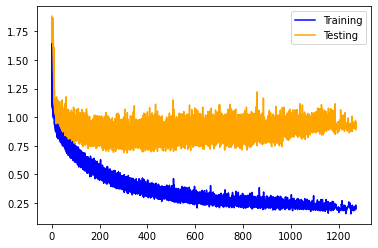

In [17]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

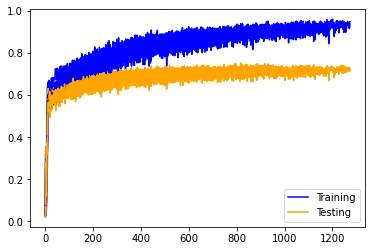

In [18]:
for i, history in enumerate(histories):
    pl.plot(history.history['f1_score_train'], label='Training', color="blue")
    pl.plot(history.history['f1_score_val'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

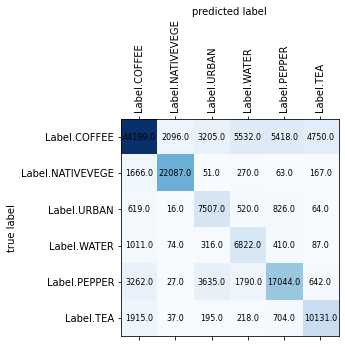

In [19]:
plot_confusion_matrix(conf_matrix, labels)

In [20]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Mean precision: ", np.mean(precision))
print("\nRecalls: ", recall)
print("Mean recall: ", np.mean(recall))
print("\nF-Score: ", fscore)
print("Mean f-score: ", np.mean(fscore))

Precisions:  [0.83913654 0.90754818 0.50352136 0.45023759 0.69666871 0.63954296]
Mean precision:  0.6727758907813518

Recalls:  [0.67789877 0.90878045 0.78590871 0.78233945 0.64560606 0.7675    ]
Mean recall:  0.7613389068390286

F-Score:  [0.7499491  0.90816389 0.61379339 0.57154826 0.67016613 0.69770325]
Mean f-score:  0.7018873346495907
